In [2]:
from model import get_global_model
import tensorflow as tf
import numpy as np
import cv2
import pandas as pd
from data import build_dataset, load_and_preprocess_image
from matplotlib import pyplot as plt

#  Load model and dataset

In [3]:
GLOBAL_MODEL_CHECKPOINT = "model/checkpoint.ckpt"
TRAIN_CSV = "data/data/processed_attention_train.csv"
VALID_CSV = "data/data/processed_attention_valid.csv"
model = get_global_model()
model.load_weights(GLOBAL_MODEL_CHECKPOINT)
heatmap_model = tf.keras.models.Model(inputs = model.layers[0].input, 
                                      outputs = model.layers[0].get_layer('conv5_block3_out').output)
train_csv = pd.read_csv(TRAIN_CSV)
valid_csv = pd.read_csv(VALID_CSV)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 23,536,641
Non-trainable params: 53,120
_________________________________________________________________
None


In [4]:
train_csv.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,AttentionBoxArea,AttentionBox,AttentionBoxWidth,AttentionBoxHeight,AttentionPath2,boxList,maxAreaBoxW,maxAreaBoxH,maxArea,attentionPathFinal
0,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,49,Frontal,AP,NaN,NaN,1.0,NaN,NaN,...,12626,"(64, 68, 107, 118)",107,118,../cs221/CheXpert-v1.0-small/train/patient1134...,"[(64, 68, 107, 118, 9175.5), (99, 99, 29, 54, ...",107,118,9175.5,../cs221/CheXpert-v1.0-small/train/patient1134...
1,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,72,Frontal,PA,NaN,NaN,1.0,NaN,NaN,...,6764,"(99, 91, 76, 89)",76,89,../cs221/CheXpert-v1.0-small/train/patient2909...,"[(99, 91, 76, 89, 4746.5), (130, 130, 24, 25, ...",76,89,4746.5,../cs221/CheXpert-v1.0-small/train/patient2909...
2,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,89,Frontal,AP,NaN,NaN,1.0,1.0,NaN,...,8740,"(66, 61, 92, 95)",92,95,../cs221/CheXpert-v1.0-small/train/patient4681...,"[(66, 61, 92, 95, 5851.0), (99, 95, 26, 29, 39...",92,95,5851.0,../cs221/CheXpert-v1.0-small/train/patient4681...
3,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,70,Frontal,AP,NaN,1.0,1.0,NaN,NaN,...,475,"(38, 199, 19, 25)",19,25,../cs221/CheXpert-v1.0-small/train/patient4918...,"[(38, 199, 19, 25, 374.0), (177, 75, 47, 98, 3...",156,173,10119.5,../cs221/CheXpert-v1.0-small/train/patient4918...
4,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,80,Frontal,AP,NaN,1.0,1.0,NaN,NaN,...,7695,"(89, 64, 81, 95)",81,95,../cs221/CheXpert-v1.0-small/train/patient0354...,"[(89, 64, 81, 95, 5548.5), (109, 98, 43, 28, 6...",81,95,5548.5,../cs221/CheXpert-v1.0-small/train/patient0354...


# Functions to draw heatmap and get controus

In [4]:
def getHeatmap(image, thresh=0.2):
    prediction = model.predict(tf.expand_dims(image, 0))
    conv_output = heatmap_model.predict(tf.expand_dims(image, 0))[0]
    cam = np.zeros(dtype = np.float32, shape = conv_output.shape[0:2])
    for i, w in enumerate(model.layers[-1].get_weights()[0]):
        cam += w * conv_output[:, :, i]
    cam /= np.max(cam)
    cam = cv2.resize(cam, (224, 224))
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap[np.where(cam < thresh)] = 0
    return heatmap

In [5]:
def getContours(heatmap):
    imgray = cv2.cvtColor(heatmap, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours, hierarchy

In [6]:
def getBoxList(path):
    image = load_and_preprocess_image(path)
    heatmap = getHeatmap(image)
    contours, hierarchy = getContours(heatmap)
    boxList = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        area = cv2.contourArea(contour)
        boxList.append((x, y, w, h, area))
    print(boxList)
    return boxList


In [7]:
def getContourCenter(image, model, heatmap_model):
    heatmap, cam = getHeatmap(image, model, heatmap_model)
    imgray = cv2.cvtColor(heatmap, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cx, cy = None, None
    area = None
    for contour in contours:
        M = cv2.moments(contour)
        if M['m00'] != 0:
            x = int(M['m10']/M['m00'])
            y = int(M['m01']/M['m00'])
            if area is None or cv2.contourArea(contour) > area:
                cx = x
                cy = y
                area = cv2.contourArea(contour)
    return cx, cy

In [8]:
def getAttentionPath(path):
    """
    gs://cs221_chexpert/CheXpert-v1.0-small/train/patient57028/study3/view1_frontal.jpg
    """
    tf_image = load_and_preprocess_image(path)
    x, y, w, h = getBoundingBox(tf_image, model, heatmap_model)
    np_image = tf_image.numpy() * 255
    cropped_np_image = np_image[x:x+w, y:y+h, :]
    resized = cv2.resize(cropped_np_image, (224,224), interpolation = cv2.INTER_AREA)
    new_path = "../cs221/" + path[20:-4] + "_attention.jpg"
    cv2.imwrite(new_path, resized)
    print(new_path + " is done!")
    return new_path

In [9]:
def getAttentionPath2(path):
    """
    gs://cs221_chexpert/CheXpert-v1.0-small/train/patient57028/study3/view1_frontal.jpg
    """
    tf_image = load_and_preprocess_image(path)
    cx, cy = getContourCenter(tf_image, model, heatmap_model)
    np_image = tf_image.numpy() * 255
    half_len = min(50, 224-cx, cx-0, 224-cy, cy-0)
    cropped_np_image = np_image[cy-half_len:cy+half_len, cx-half_len:cx+half_len]
    resized = cv2.resize(cropped_np_image, (224,224), interpolation = cv2.INTER_AREA)
    new_path = "../cs221/" + path[20:-4] + "_attention_2.jpg"
    cv2.imwrite(new_path, resized)
    print(new_path + " is done! half_len=" + str(half_len) + " cx=" + str(cx) + " cy=" + str(cy))
    return new_path

In [10]:
def getAttentionBoxArea(path):
    """
    gs://cs221_chexpert/CheXpert-v1.0-small/train/patient57028/study3/view1_frontal.jpg
    """
    tf_image = load_and_preprocess_image(path)
    x, y, w, h = getBoundingBox(tf_image, model, heatmap_model)
    print(x, y, w, h)
    return x, y, w, h

In [17]:
train_csv['boxList'] = train_csv.Path.apply(getLargestContour)

[(64, 68, 107, 118, 9175.5), (99, 99, 29, 54, 1197.5)]
[(99, 91, 76, 89, 4746.5), (130, 130, 24, 25, 303.5), (181, 26, 43, 47, 1567.0)]
[(66, 61, 92, 95, 5851.0), (99, 95, 26, 29, 391.0)]
[(38, 199, 19, 25, 374.0), (177, 75, 47, 98, 3154.5), (0, 25, 156, 173, 10119.5)]
[(89, 64, 81, 95, 5548.5), (109, 98, 43, 28, 693.0)]
[(0, 104, 22, 20, 356.5), (136, 103, 65, 60, 2367.5), (169, 128, 15, 22, 177.5)]
[(59, 56, 95, 97, 6721.0), (92, 86, 32, 38, 627.5)]
[(57, 90, 146, 114, 11599.5), (98, 121, 49, 57, 1602.0)]
[(82, 89, 90, 102, 6613.0), (102, 122, 47, 33, 906.0)]
[(57, 166, 71, 58, 2246.0)]
[(170, 207, 10, 17, 142.0), (0, 131, 119, 93, 6587.5), (34, 154, 37, 33, 565.5), (198, 34, 26, 56, 1282.5), (57, 26, 45, 38, 1183.5)]
[(51, 87, 99, 110, 7856.0), (86, 112, 37, 49, 915.0)]
[(77, 92, 96, 132, 8580.5), (101, 132, 50, 51, 1872.5), (75, 71, 16, 19, 177.0), (200, 45, 24, 7, 117.0)]
[(80, 75, 91, 104, 7322.0), (102, 113, 48, 41, 1521.5)]
[(83, 97, 97, 97, 7083.5), (103, 131, 50, 29, 1129.5)]

[(24, 71, 100, 153, 9519.0), (56, 132, 32, 38, 605.5)]
[(90, 88, 83, 106, 6896.5), (110, 128, 43, 32, 842.0)]
[(81, 115, 143, 84, 6635.0), (102, 135, 26, 21, 295.5), (198, 71, 26, 20, 404.0)]
[(99, 87, 76, 92, 5067.0), (130, 126, 24, 28, 356.0)]
[(24, 193, 66, 31, 1454.0), (112, 129, 112, 95, 6291.5), (141, 142, 5, 21, 63.5), (132, 40, 22, 18, 221.0)]
[(190, 72, 34, 63, 1542.5), (0, 17, 183, 164, 15775.5), (137, 139, 11, 10, 55.5), (106, 101, 9, 16, 80.5), (66, 69, 37, 26, 615.5)]
[(81, 96, 91, 128, 6349.0), (132, 168, 18, 16, 159.0), (102, 130, 21, 30, 358.0)]
[(88, 84, 88, 93, 6353.5), (106, 108, 48, 46, 1384.5)]
[(35, 201, 33, 23, 616.0), (110, 139, 7, 7, 20.0), (0, 0, 224, 100, 13496.5), (96, 65, 29, 18, 296.0)]
[(61, 74, 106, 105, 7083.5), (95, 108, 31, 46, 769.0)]
[(123, 110, 101, 86, 5273.5), (137, 134, 20, 18, 199.0), (101, 45, 13, 7, 40.5)]
[(24, 87, 132, 112, 10159.0), (64, 130, 50, 41, 1047.5)]
[(0, 0, 224, 224, 24326.5), (106, 73, 48, 19, 639.0), (30, 0, 48, 56, 1789.0)]
[(

[(53, 73, 86, 108, 6946.5), (76, 103, 45, 52, 1501.5)]
[(78, 65, 96, 102, 6730.0), (102, 97, 37, 29, 588.5)]
[(0, 207, 18, 17, 271.5), (87, 83, 137, 106, 7741.0), (104, 103, 25, 37, 496.5)]
[(36, 33, 148, 191, 14723.5), (73, 160, 15, 25, 223.0), (92, 104, 58, 52, 1806.0)]
[(74, 42, 105, 110, 8997.5), (103, 69, 44, 46, 1234.0)]
[(75, 91, 94, 87, 6003.0), (101, 124, 30, 28, 457.5)]
[(47, 83, 95, 115, 8265.5), (72, 118, 49, 47, 1411.0)]
[(49, 73, 93, 123, 8420.0), (79, 121, 43, 40, 979.5)]
[(66, 0, 158, 224, 20224.5), (100, 101, 26, 55, 1103.0)]
[(0, 171, 28, 53, 1149.0), (136, 127, 88, 97, 5445.5), (164, 168, 23, 21, 255.5), (191, 26, 33, 59, 1450.5)]
[(81, 66, 92, 129, 8838.5), (103, 124, 50, 36, 1408.0)]
[(81, 61, 90, 100, 6631.5), (102, 96, 34, 28, 513.5)]
[(80, 118, 57, 82, 3198.0), (102, 136, 18, 35, 332.5)]
[(87, 197, 30, 27, 679.5), (207, 175, 17, 2, 16.0), (0, 18, 80, 206, 9466.0), (62, 0, 162, 71, 9342.5)]
[(89, 89, 91, 109, 7215.0), (111, 130, 44, 33, 751.5)]
[(82, 56, 86, 86, 

[(82, 63, 110, 132, 8968.5), (103, 99, 46, 57, 1510.0)]
[(39, 123, 185, 101, 9992.0), (174, 44, 14, 8, 56.5), (203, 0, 21, 30, 553.0)]
[(70, 91, 112, 133, 11102.0), (103, 130, 49, 57, 1551.0), (199, 45, 25, 8, 141.5)]
[(79, 0, 145, 224, 17679.5), (102, 114, 44, 39, 891.0)]
[(80, 101, 70, 86, 3172.5), (105, 124, 18, 28, 260.0), (0, 21, 34, 47, 1198.0), (173, 0, 7, 23, 115.5)]
[(69, 94, 155, 95, 9506.5), (100, 129, 30, 26, 418.0), (110, 46, 4, 4, 7.0)]
[(117, 98, 107, 59, 3190.0), (140, 118, 40, 31, 445.0), (79, 78, 2, 3, 2.0), (137, 0, 59, 28, 1294.5)]
[(91, 57, 100, 85, 6761.0), (128, 93, 27, 28, 443.5)]
[(198, 140, 26, 7, 127.5), (77, 61, 96, 108, 7212.5), (101, 96, 29, 29, 459.0)]
[(78, 67, 95, 123, 8961.5), (101, 103, 51, 53, 1968.0)]
[(73, 83, 96, 110, 7448.5), (101, 123, 32, 36, 614.0)]
[(97, 85, 80, 106, 5836.5), (126, 109, 28, 49, 761.0), (199, 71, 25, 13, 239.0), (131, 27, 30, 39, 661.0)]
[(57, 160, 44, 64, 2216.0), (77, 45, 53, 78, 1919.0), (180, 24, 44, 69, 2109.5), (0, 0, 38

[(70, 52, 95, 88, 5845.5), (100, 72, 28, 49, 927.0)]
[(90, 82, 92, 97, 6490.0), (123, 117, 31, 37, 738.5)]
[(32, 78, 163, 126, 14152.5), (64, 126, 36, 33, 753.5), (98, 105, 36, 22, 518.5), (180, 20, 44, 54, 1691.0)]
[(83, 51, 141, 109, 9658.5), (103, 85, 46, 42, 1184.0)]
[(54, 73, 80, 117, 6595.0), (71, 120, 25, 37, 488.0)]
[(207, 205, 17, 19, 287.5), (71, 51, 71, 120, 5045.0), (101, 101, 20, 30, 315.5)]
[(28, 91, 146, 133, 13431.5), (61, 138, 38, 53, 1192.5)]
[(96, 61, 128, 113, 7883.5), (129, 93, 27, 34, 490.5)]
[(47, 208, 2, 16, 15.0), (0, 86, 21, 40, 715.0), (95, 0, 129, 201, 7405.0)]
[(84, 83, 140, 103, 6802.5), (103, 103, 28, 24, 381.0)]
[(30, 198, 48, 26, 972.0), (103, 111, 121, 113, 4980.0), (0, 109, 17, 5, 63.0), (140, 61, 13, 22, 146.0), (58, 57, 33, 36, 587.5), (181, 56, 43, 52, 1380.5), (118, 0, 38, 43, 1276.5)]
[(87, 94, 120, 113, 8715.0), (113, 134, 46, 52, 1428.0)]
[(64, 69, 81, 99, 5419.5), (93, 100, 29, 50, 859.0)]
[(56, 48, 114, 124, 11377.0), (91, 74, 43, 66, 1722.5)

[(55, 62, 128, 108, 8674.5), (129, 95, 25, 41, 556.0), (195, 0, 29, 68, 1501.0)]
[(65, 112, 99, 95, 7103.5), (100, 134, 27, 50, 1058.0)]
[(73, 83, 97, 101, 7343.5), (100, 105, 46, 50, 1355.5)]
[(36, 62, 106, 115, 9248.0), (69, 98, 41, 55, 1653.0)]
[(59, 53, 112, 103, 7969.0), (96, 76, 34, 48, 909.5)]
[(203, 201, 21, 23, 424.5), (86, 112, 92, 87, 5542.0), (104, 134, 36, 26, 541.5)]
[(84, 58, 104, 117, 7304.0), (103, 93, 23, 30, 374.0)]
[(86, 76, 101, 113, 8186.0), (105, 106, 50, 51, 1819.5)]
[(69, 67, 84, 95, 5147.5), (99, 99, 24, 28, 356.0)]
[(32, 104, 98, 102, 7063.0), (69, 133, 26, 45, 682.5)]
[(0, 0, 185, 165, 16435.5), (95, 72, 60, 53, 1716.0)]
[(85, 75, 96, 149, 5898.5), (103, 101, 38, 22, 442.0)]
[(85, 76, 86, 103, 6600.0), (103, 104, 44, 49, 1221.5)]
[(194, 190, 30, 34, 814.5), (0, 0, 224, 224, 27867.0), (130, 103, 23, 12, 154.5), (79, 78, 3, 6, 8.0), (96, 32, 45, 31, 784.5)]
[(195, 32, 29, 33, 736.0), (0, 0, 188, 165, 14336.0), (104, 101, 28, 19, 296.0)]
[(0, 207, 17, 17, 256.0

[(0, 84, 224, 140, 19007.0), (142, 141, 4, 6, 13.0), (193, 0, 31, 29, 768.5)]
[(85, 124, 81, 100, 5416.5), (103, 149, 32, 36, 567.0), (204, 48, 20, 1, 0.0), (119, 36, 52, 49, 1380.0)]
[(102, 88, 122, 102, 8707.0), (147, 130, 45, 25, 623.0)]
[(67, 97, 101, 102, 7081.5), (99, 131, 27, 35, 508.5)]
[(0, 145, 104, 79, 4970.5), (112, 87, 112, 102, 5460.5), (134, 104, 21, 17, 185.0), (0, 65, 42, 79, 2555.5)]
[(64, 67, 86, 89, 5089.0), (97, 99, 26, 26, 356.0)]
[(66, 173, 18, 8, 71.5), (92, 0, 132, 187, 8870.0)]
[(0, 199, 30, 25, 648.0), (117, 88, 89, 102, 6135.5), (135, 121, 33, 34, 560.0)]
[(64, 76, 126, 129, 9501.0), (97, 110, 36, 45, 838.0)]
[(66, 69, 103, 119, 9176.5), (101, 100, 41, 41, 916.5)]
[(20, 169, 64, 55, 2245.0), (173, 162, 51, 21, 866.0), (0, 0, 64, 70, 2649.0)]
[(97, 88, 110, 87, 7106.0), (128, 110, 31, 44, 785.0)]
[(189, 27, 35, 32, 812.5), (72, 26, 152, 198, 15420.5), (137, 134, 57, 51, 2249.0), (143, 0, 2, 18, 16.5)]
[(75, 87, 60, 75, 2934.5), (101, 104, 18, 23, 219.5)]
[(82

[(90, 97, 84, 87, 5188.0), (118, 131, 36, 24, 461.0)]
[(89, 63, 118, 104, 8584.5), (121, 97, 39, 35, 702.5)]
[(71, 71, 102, 106, 7181.5), (100, 100, 26, 40, 577.0)]
[(178, 189, 46, 35, 1394.0), (91, 100, 67, 68, 3165.0), (105, 131, 24, 20, 258.0), (69, 34, 35, 30, 603.5)]
[(0, 205, 19, 19, 319.5), (103, 114, 121, 78, 5822.0), (130, 136, 27, 21, 302.5), (58, 31, 42, 38, 954.0)]
[(73, 47, 88, 122, 7253.0), (100, 76, 22, 73, 1032.0)]
[(114, 83, 93, 109, 6762.0), (135, 116, 36, 39, 695.5)]
[(73, 69, 82, 100, 5787.5), (100, 100, 23, 43, 530.0)]
[(130, 156, 94, 68, 3489.5), (139, 169, 15, 15, 108.0), (105, 0, 77, 55, 3141.0)]
[(81, 68, 92, 132, 9034.5), (103, 124, 50, 47, 1541.0)]
[(198, 202, 26, 22, 499.0), (87, 117, 76, 86, 4670.0), (104, 135, 28, 25, 374.0), (191, 42, 33, 15, 350.5)]
[(35, 74, 102, 121, 8514.0), (66, 103, 31, 54, 1096.0)]
[(64, 98, 94, 97, 6042.0), (100, 131, 24, 31, 401.0)]
[(101, 54, 104, 109, 7744.5), (132, 90, 25, 38, 518.0)]
[(143, 100, 81, 124, 5620.5), (69, 0, 69, 

[(200, 195, 24, 29, 612.0), (0, 140, 38, 41, 1090.0), (65, 58, 125, 126, 9529.0), (101, 97, 49, 34, 1175.5)]
[(87, 195, 84, 29, 1786.5), (111, 142, 19, 4, 21.5), (179, 133, 45, 91, 2917.0), (187, 32, 37, 42, 1104.5)]
[(87, 78, 98, 112, 8132.0), (109, 109, 45, 48, 1329.0)]
[(90, 76, 103, 118, 7836.5), (110, 107, 44, 50, 1522.0)]
[(70, 78, 97, 104, 7700.0), (99, 107, 30, 48, 828.5)]
[(0, 31, 193, 193, 22445.5), (40, 130, 54, 28, 803.0)]
[(186, 123, 38, 41, 1238.0), (64, 52, 113, 105, 7232.0), (98, 71, 30, 51, 984.0)]
[(21, 71, 97, 120, 7829.0), (59, 109, 32, 48, 869.5)]
[(86, 84, 103, 102, 5276.0), (104, 103, 18, 23, 225.5)]
[(78, 74, 17, 9, 89.5), (98, 0, 126, 129, 9238.5)]
[(124, 139, 79, 85, 4619.0), (138, 164, 47, 24, 829.5), (70, 0, 17, 21, 285.5)]
[(83, 64, 89, 98, 6413.0), (103, 97, 26, 30, 424.0)]
[(49, 89, 87, 100, 6641.5), (70, 125, 45, 31, 818.0)]
[(102, 43, 13, 14, 79.5), (109, 0, 115, 224, 14634.5), (141, 166, 9, 17, 75.0)]
[(74, 82, 86, 84, 5010.0), (101, 103, 23, 34, 418.5

[(31, 86, 131, 138, 12468.5), (70, 123, 56, 64, 2687.0)]
[(83, 0, 141, 201, 14480.0), (135, 157, 18, 27, 274.0), (103, 129, 28, 24, 378.5)]
[(87, 74, 85, 97, 6023.5), (104, 101, 43, 46, 1053.0)]
[(79, 92, 96, 100, 7134.0), (102, 130, 50, 29, 1048.5)]
[(69, 75, 107, 113, 8034.0), (100, 107, 47, 48, 1190.0)]
[(74, 80, 82, 89, 5204.5), (101, 102, 23, 39, 480.0)]
[(153, 132, 71, 68, 3746.5), (168, 160, 19, 24, 230.5)]
[(35, 180, 80, 44, 2574.5), (94, 0, 130, 108, 6007.0), (168, 70, 16, 19, 165.0)]
[(30, 25, 194, 199, 16903.0), (72, 101, 51, 85, 2290.5)]
[(82, 68, 84, 122, 6827.5), (102, 99, 21, 47, 606.5)]
[(80, 67, 94, 97, 6620.5), (102, 98, 43, 30, 697.0)]
[(97, 176, 67, 48, 2157.5), (28, 36, 60, 60, 2299.5), (95, 24, 94, 34, 1541.5)]
[(134, 88, 90, 136, 9163.0), (158, 117, 29, 69, 1373.0), (202, 39, 22, 30, 535.5), (0, 28, 32, 74, 1942.5)]
[(51, 77, 92, 100, 6935.5), (81, 101, 40, 52, 1461.0)]
[(156, 120, 68, 66, 3130.5), (170, 137, 25, 14, 191.5), (58, 117, 114, 107, 5938.0), (73, 136,

[(0, 82, 156, 142, 9350.0), (71, 109, 45, 46, 1273.0)]
[(45, 173, 6, 4, 8.5), (52, 86, 112, 109, 8352.5), (97, 108, 28, 51, 798.5), (190, 0, 34, 71, 1874.0)]
[(23, 105, 101, 84, 5570.5), (68, 133, 24, 23, 297.0)]
[(44, 207, 26, 17, 389.0), (107, 0, 117, 224, 11939.0)]
[(72, 87, 89, 98, 5921.0), (101, 117, 24, 39, 508.0)]
[(84, 72, 88, 119, 7231.5), (103, 101, 45, 47, 1440.0)]
[(41, 82, 112, 142, 9126.5), (72, 103, 52, 54, 1865.0)]
[(0, 43, 101, 67, 5109.5), (36, 70, 31, 19, 327.5)]
[(88, 92, 107, 105, 7643.5), (106, 131, 51, 36, 1139.0)]
[(68, 67, 104, 128, 9018.5), (100, 100, 27, 46, 835.0)]
[(71, 59, 100, 126, 8981.0), (101, 105, 24, 50, 792.0)]
[(53, 64, 90, 102, 6629.0), (71, 101, 49, 32, 1078.0)]
[(63, 81, 93, 95, 6163.0), (97, 102, 27, 50, 868.5)]
[(83, 90, 91, 95, 6402.5), (103, 124, 36, 31, 590.5)]
[(63, 87, 101, 101, 6764.0), (97, 121, 30, 36, 540.5)]
[(41, 99, 76, 125, 4689.0), (72, 123, 21, 32, 335.0), (190, 36, 34, 31, 847.5)]
[(44, 201, 36, 23, 633.0), (135, 86, 89, 138, 1

[(0, 41, 25, 31, 581.0), (57, 30, 167, 83, 8711.5), (77, 45, 8, 6, 21.5), (107, 42, 80, 44, 1744.0)]
[(64, 81, 160, 111, 12871.0), (99, 105, 41, 54, 1495.5)]
[(74, 65, 79, 92, 4818.5), (101, 98, 22, 28, 317.5)]
[(91, 94, 114, 111, 8222.5), (110, 132, 46, 46, 1061.0)]
[(0, 77, 27, 40, 850.5), (76, 68, 87, 100, 6645.5), (102, 100, 25, 45, 686.5), (198, 40, 26, 20, 393.5)]
[(77, 59, 71, 82, 4125.0), (101, 90, 21, 31, 350.0), (193, 29, 31, 32, 740.0)]
[(105, 119, 119, 105, 8418.5), (135, 146, 49, 43, 1149.5)]
[(59, 82, 91, 92, 5915.0), (97, 103, 25, 43, 677.5)]
[(94, 64, 95, 122, 7901.0), (129, 102, 27, 53, 1008.0)]
[(68, 82, 102, 94, 6716.0), (100, 105, 33, 49, 996.5)]
[(83, 85, 90, 108, 7177.5), (103, 123, 48, 34, 1098.5), (29, 0, 74, 36, 2082.5)]
[(86, 67, 88, 93, 6026.5), (107, 99, 46, 26, 823.0)]
[(87, 103, 103, 96, 6473.0), (107, 132, 48, 36, 934.0)]
[(49, 95, 107, 109, 8458.5), (71, 130, 51, 50, 1918.0)]
[(48, 95, 98, 90, 6433.0), (70, 127, 49, 29, 949.5)]
[(88, 72, 89, 96, 5335.5),

[(77, 202, 42, 22, 820.5), (17, 83, 77, 114, 6569.5), (39, 119, 30, 40, 612.5), (207, 47, 17, 2, 16.0)]
[(90, 62, 97, 112, 7665.0), (125, 98, 30, 50, 913.5)]
[(170, 198, 19, 26, 385.5), (197, 156, 27, 34, 737.0), (56, 0, 168, 82, 5498.5)]
[(193, 197, 31, 27, 712.5), (25, 195, 39, 29, 863.5), (180, 0, 44, 80, 2114.5), (0, 0, 114, 70, 3313.5), (44, 43, 9, 9, 41.5)]
[(65, 54, 159, 170, 14142.0), (108, 82, 46, 71, 1799.5)]
[(0, 194, 45, 30, 1146.5), (91, 45, 133, 159, 14704.5), (117, 130, 57, 36, 1178.0), (0, 31, 43, 68, 2384.0)]
[(76, 85, 87, 98, 6022.0), (101, 118, 30, 37, 568.0)]
[(78, 67, 89, 103, 6580.0), (101, 99, 27, 36, 528.5)]
[(66, 86, 119, 110, 9108.5), (98, 129, 38, 31, 670.0)]
[(77, 93, 92, 103, 7202.5), (101, 128, 45, 35, 845.5)]
[(114, 103, 88, 101, 6788.0), (134, 132, 25, 28, 377.0)]
[(58, 57, 105, 99, 6928.0), (88, 94, 37, 30, 614.5)]
[(40, 87, 97, 106, 6925.0), (69, 129, 36, 28, 558.0)]
[(0, 38, 176, 186, 15726.0), (100, 71, 46, 74, 2175.5)]
[(0, 69, 155, 155, 12350.0), (

[(66, 71, 104, 106, 6812.0), (98, 100, 27, 49, 836.5)]
[(99, 96, 125, 128, 8132.0), (129, 133, 26, 24, 331.5), (46, 77, 4, 4, 4.5)]
[(57, 90, 87, 92, 6335.0), (72, 125, 48, 30, 1104.0)]
[(44, 167, 18, 11, 76.0), (180, 0, 44, 74, 1945.0)]
[(64, 74, 77, 105, 5265.5), (102, 117, 19, 37, 399.5)]
[(88, 90, 102, 96, 6675.0), (119, 126, 37, 30, 557.5)]
[(0, 33, 224, 172, 17803.5), (33, 114, 55, 70, 2242.0)]
[(57, 100, 106, 124, 8286.5), (93, 132, 31, 53, 1083.5), (165, 28, 59, 33, 1354.5)]
[(41, 89, 96, 99, 6568.5), (69, 124, 44, 33, 736.5)]
[(89, 76, 87, 94, 5641.5), (109, 101, 45, 38, 810.5)]
[(73, 89, 129, 104, 8345.0), (100, 116, 27, 38, 545.0)]
[(74, 58, 89, 110, 7021.0), (101, 95, 25, 36, 478.5)]
[(84, 51, 82, 81, 5239.5), (103, 71, 23, 43, 646.5), (0, 28, 51, 45, 1516.5), (183, 20, 41, 49, 1515.5)]
[(116, 124, 60, 74, 3020.0), (135, 137, 18, 30, 273.0)]
[(76, 55, 124, 135, 9111.0), (101, 93, 24, 42, 552.5)]
[(0, 200, 24, 24, 503.5), (72, 54, 109, 104, 7104.0), (101, 78, 24, 43, 585.5)]

[(72, 62, 79, 106, 5582.0), (101, 99, 20, 48, 577.5)]
[(53, 75, 109, 108, 8415.0), (90, 101, 35, 47, 1036.5)]
[(73, 62, 100, 129, 8461.0), (101, 106, 28, 48, 755.5)]
[(83, 63, 104, 134, 10002.5), (102, 96, 53, 65, 2512.5)]
[(133, 124, 91, 100, 5036.0), (141, 140, 11, 15, 90.0), (205, 44, 19, 44, 729.5)]
[(57, 89, 82, 113, 6832.5), (94, 128, 27, 52, 1017.0)]
[(69, 91, 92, 109, 6892.0), (100, 128, 24, 38, 496.0)]
[(80, 208, 1, 16, 0.0), (0, 204, 24, 20, 425.0), (115, 131, 109, 93, 7148.0), (176, 0, 48, 98, 3486.0)]
[(73, 53, 102, 120, 9202.5), (101, 95, 28, 40, 643.0)]
[(94, 80, 103, 91, 6267.0), (121, 102, 34, 46, 809.5)]
[(123, 99, 51, 70, 2602.5), (137, 111, 16, 41, 370.0)]
[(182, 118, 42, 41, 1244.5), (87, 54, 77, 83, 4627.0), (105, 78, 25, 42, 533.5)]
[(160, 197, 28, 27, 582.0), (106, 131, 14, 18, 119.5), (186, 0, 38, 68, 1858.5)]
[(72, 84, 82, 109, 6866.5), (101, 118, 23, 41, 507.0)]
[(63, 42, 81, 93, 5087.0), (95, 69, 27, 41, 574.0)]
[(180, 94, 44, 43, 1528.5), (82, 27, 142, 197, 

[(62, 81, 98, 88, 6256.5), (96, 102, 27, 42, 631.0)]
[(66, 78, 94, 108, 7162.0), (98, 109, 27, 47, 705.5)]
[(93, 65, 82, 93, 5397.5), (109, 97, 45, 29, 729.5)]
[(0, 97, 110, 127, 9118.0), (37, 162, 37, 26, 528.0)]
[(87, 94, 87, 110, 7302.5), (104, 128, 48, 49, 1633.5)]
[(192, 70, 32, 22, 522.0), (64, 49, 103, 123, 9135.5), (99, 97, 30, 56, 1143.5)]
[(173, 147, 51, 77, 2356.0), (80, 79, 82, 95, 5435.5), (102, 102, 22, 34, 415.5)]
[(37, 84, 187, 115, 13881.0), (95, 129, 60, 35, 1321.5)]
[(64, 61, 129, 117, 10698.5), (98, 92, 54, 46, 1629.0)]
[(0, 85, 86, 102, 6226.5), (35, 104, 28, 51, 1001.0)]
[(71, 0, 153, 224, 18503.5)]
[(195, 194, 29, 30, 706.0), (185, 32, 39, 35, 969.0), (0, 17, 139, 115, 8119.0), (36, 46, 27, 41, 666.5)]
[(40, 87, 144, 137, 11789.0), (96, 128, 29, 32, 524.5), (109, 44, 8, 12, 51.5)]
[(91, 57, 133, 139, 12571.0), (129, 105, 32, 56, 1026.0)]
[(82, 82, 96, 106, 7625.5), (102, 102, 47, 52, 1537.0)]
[(65, 96, 80, 100, 5191.5), (99, 131, 23, 31, 374.0)]
[(82, 75, 87, 110

[(87, 85, 137, 91, 7580.5), (126, 119, 30, 35, 715.5), (109, 109, 15, 9, 78.5)]
[(113, 106, 111, 118, 9034.0), (151, 171, 38, 15, 330.0), (170, 137, 8, 9, 39.0), (0, 0, 126, 160, 8652.0), (37, 70, 22, 19, 236.0)]
[(129, 159, 95, 65, 4506.0)]
[(82, 63, 88, 118, 7735.0), (102, 97, 34, 54, 1387.0)]
[(89, 92, 135, 105, 7500.5), (104, 106, 16, 20, 171.5)]
[(98, 91, 126, 101, 7787.5), (134, 131, 21, 25, 284.5)]
[(0, 173, 107, 51, 3215.0)]
[(111, 63, 113, 161, 9893.5), (134, 99, 23, 54, 839.5)]
[(54, 107, 66, 86, 3721.0), (72, 135, 21, 23, 253.0)]
[(62, 172, 33, 52, 865.0), (92, 0, 132, 224, 16021.5), (113, 37, 51, 75, 1610.5)]
[(108, 198, 25, 26, 474.0), (208, 174, 16, 9, 120.0), (67, 136, 24, 17, 236.5), (201, 76, 23, 21, 367.5), (0, 0, 190, 122, 10601.0), (168, 44, 11, 8, 41.0), (70, 29, 56, 56, 1246.5)]
[(99, 18, 88, 134, 6367.5), (137, 99, 18, 24, 230.0)]
[(88, 71, 136, 110, 8517.5), (104, 93, 21, 31, 351.0)]
[(66, 67, 99, 130, 8636.5), (101, 99, 26, 54, 1018.5)]
[(0, 74, 49, 93, 2284.5)

[(158, 199, 46, 25, 945.0), (0, 163, 115, 61, 4398.5), (41, 39, 41, 13, 364.0), (190, 0, 34, 84, 2111.0)]
[(56, 92, 83, 99, 4611.5), (100, 134, 21, 22, 240.0), (205, 78, 19, 9, 133.5)]
[(134, 203, 34, 21, 598.0), (76, 170, 18, 17, 146.0), (26, 57, 46, 45, 1411.0), (41, 73, 15, 14, 112.5), (137, 29, 64, 38, 1407.5)]
[(64, 62, 116, 137, 8497.5), (103, 127, 26, 32, 466.0)]
[(74, 72, 150, 152, 9703.0), (104, 103, 19, 14, 142.0)]
[(64, 65, 97, 125, 8248.5), (97, 113, 28, 44, 635.0)]
[(72, 67, 79, 128, 6934.5), (100, 126, 23, 34, 414.0)]
[(64, 95, 86, 87, 4920.0), (100, 127, 23, 28, 340.0)]
[(0, 105, 55, 39, 1098.0), (57, 0, 167, 86, 9703.0)]
[(67, 153, 53, 71, 1831.0), (60, 19, 164, 81, 8531.0), (103, 39, 34, 21, 382.5)]
[(197, 198, 27, 26, 608.0), (95, 123, 98, 78, 5291.0), (115, 137, 41, 41, 746.5), (206, 111, 18, 4, 48.5)]
[(87, 81, 107, 104, 7198.5), (119, 109, 36, 47, 901.0)]
[(64, 94, 103, 84, 5760.0), (90, 127, 39, 27, 529.5), (43, 40, 12, 15, 84.5)]
[(68, 76, 100, 111, 6982.0), (99,

[(114, 87, 91, 87, 5608.0), (134, 121, 25, 33, 420.5)]
[(95, 100, 79, 104, 5836.5), (127, 132, 26, 48, 729.0)]
[(107, 129, 64, 78, 3570.0), (135, 157, 18, 29, 276.5)]
[(118, 108, 106, 96, 7086.0), (136, 133, 23, 22, 281.5)]
[(201, 194, 23, 30, 603.0), (83, 64, 86, 104, 5991.0), (103, 98, 22, 30, 371.5)]
[(76, 76, 106, 104, 7644.5), (101, 102, 33, 52, 1175.5)]
[(0, 19, 69, 65, 3379.0), (171, 0, 53, 100, 3457.0), (109, 0, 7, 18, 97.0)]
[(34, 66, 111, 98, 7905.0), (69, 99, 34, 31, 570.5), (0, 32, 48, 38, 1218.5)]
[(55, 97, 88, 79, 5208.0), (89, 128, 33, 26, 462.0)]
[(185, 151, 39, 73, 2445.5), (62, 80, 83, 90, 5442.0), (99, 121, 23, 31, 415.5)]
[(51, 67, 90, 118, 8229.5), (72, 101, 50, 55, 2043.0)]
[(200, 134, 24, 32, 625.5), (32, 77, 137, 147, 11305.0), (67, 129, 39, 28, 609.0)]
[(0, 195, 36, 29, 864.5), (79, 63, 86, 111, 7496.0), (102, 97, 26, 53, 963.0)]
[(82, 62, 91, 102, 6710.5), (102, 96, 32, 28, 480.5)]
[(63, 82, 110, 116, 8741.0), (103, 109, 50, 53, 1577.5), (196, 38, 28, 29, 607.

[(83, 74, 107, 109, 7002.5), (142, 142, 3, 4, 4.0), (103, 101, 21, 36, 467.0)]
[(84, 58, 91, 128, 8584.0), (106, 97, 48, 59, 1917.5)]
[(47, 208, 2, 16, 15.0), (0, 107, 20, 10, 157.5), (36, 39, 138, 157, 13545.5), (102, 124, 52, 36, 1342.5)]
[(115, 191, 72, 33, 2078.5), (57, 167, 46, 27, 798.5), (56, 0, 168, 129, 12205.0), (0, 0, 50, 73, 2082.5)]
[(120, 196, 33, 28, 639.5), (172, 105, 18, 9, 88.0), (198, 66, 26, 32, 664.0), (0, 0, 123, 125, 7791.5), (33, 71, 47, 25, 604.5)]
[(121, 103, 103, 89, 5374.0), (137, 132, 18, 21, 209.0), (0, 40, 55, 68, 3089.5)]
[(187, 181, 37, 43, 1286.0), (107, 147, 63, 60, 2750.0), (133, 167, 19, 19, 194.5), (172, 55, 52, 72, 2548.0), (37, 47, 62, 52, 1617.0)]
[(63, 74, 108, 112, 8865.0), (97, 102, 38, 51, 1340.5)]
[(22, 69, 158, 120, 11338.0), (64, 126, 26, 27, 380.0), (100, 100, 54, 21, 676.5)]
[(120, 93, 104, 105, 5485.0), (136, 130, 20, 23, 247.5)]
[(34, 60, 75, 132, 8123.5), (67, 100, 23, 60, 885.5), (157, 0, 67, 82, 4095.5)]
[(113, 94, 87, 106, 6439.5)

[(62, 89, 95, 108, 7058.0), (95, 130, 28, 33, 483.0)]
[(184, 163, 40, 26, 746.0), (96, 109, 77, 84, 4260.5), (128, 133, 25, 26, 342.0), (207, 0, 17, 17, 255.5)]
[(60, 66, 95, 103, 6709.0), (98, 99, 25, 33, 443.5)]
[(78, 55, 92, 114, 8002.0), (101, 82, 34, 46, 809.5)]
[(68, 69, 103, 125, 8721.5), (99, 100, 35, 57, 1310.0)]
[(73, 72, 95, 100, 6031.5), (100, 101, 23, 48, 729.5)]
[(163, 171, 61, 53, 2601.5), (161, 0, 63, 75, 3069.0)]
[(134, 106, 13, 10, 66.0), (163, 0, 61, 87, 2595.5)]
[(69, 68, 80, 93, 5075.5), (99, 99, 24, 30, 371.0)]
[(135, 162, 16, 25, 213.0), (0, 23, 224, 152, 21201.5), (97, 40, 56, 50, 1633.0)]
[(97, 136, 69, 88, 3774.5), (107, 161, 29, 24, 344.0), (197, 39, 27, 20, 403.0), (0, 30, 74, 75, 4383.5), (30, 69, 26, 19, 257.5), (110, 0, 13, 23, 225.5)]
[(48, 62, 95, 100, 7286.5), (74, 95, 48, 30, 945.0)]
[(18, 109, 87, 87, 5030.5), (120, 39, 104, 126, 9446.0), (136, 68, 19, 22, 222.5), (0, 0, 87, 80, 4690.0)]
[(81, 83, 90, 109, 6761.5), (103, 109, 34, 48, 819.0), (204, 35

[(81, 77, 95, 120, 8575.0), (102, 115, 42, 45, 958.0)]
[(35, 64, 125, 160, 8906.5), (66, 107, 25, 47, 791.5)]
[(101, 118, 88, 106, 5825.5), (132, 162, 23, 25, 310.0), (208, 0, 16, 17, 240.0)]
[(87, 107, 96, 88, 5533.5), (121, 133, 34, 29, 503.5)]
[(128, 121, 96, 103, 7743.5), (139, 161, 53, 35, 1184.0), (0, 105, 20, 25, 403.0), (194, 41, 30, 54, 1128.5)]
[(89, 69, 102, 104, 7465.0), (125, 100, 31, 46, 757.5)]
[(75, 191, 121, 33, 2703.0), (102, 116, 122, 58, 4218.0), (110, 138, 45, 16, 490.5), (192, 28, 32, 47, 1207.0), (146, 0, 43, 25, 842.5), (111, 0, 15, 16, 210.0)]
[(80, 62, 76, 111, 6537.5), (102, 98, 21, 50, 654.5)]
[(108, 79, 6, 3, 7.0), (166, 0, 58, 205, 7139.0)]
[(58, 64, 109, 104, 8395.5), (81, 97, 46, 36, 839.5)]
[(90, 93, 100, 88, 6190.5), (113, 125, 43, 30, 731.5)]
[(81, 52, 86, 109, 6616.0), (102, 78, 33, 44, 770.0)]
[(0, 58, 224, 106, 16037.5), (142, 106, 11, 9, 47.0), (37, 99, 34, 27, 481.5)]
[(55, 101, 89, 90, 5546.5), (93, 132, 29, 26, 386.0)]
[(0, 141, 190, 83, 6856.5

[(83, 63, 85, 94, 5263.0), (103, 93, 29, 28, 422.5)]
[(107, 81, 76, 115, 5452.5), (133, 128, 22, 32, 364.5)]
[(22, 151, 55, 73, 1989.0), (0, 69, 22, 28, 491.5), (161, 40, 63, 74, 3713.0), (171, 69, 16, 19, 159.0)]
[(79, 92, 91, 111, 7955.5), (102, 128, 41, 47, 1164.5)]
[(85, 0, 139, 177, 12887.5), (108, 107, 53, 47, 1269.0)]
[(64, 71, 92, 81, 4387.5), (98, 100, 26, 23, 314.5)]
[(88, 62, 87, 91, 5919.0), (107, 95, 47, 28, 911.0)]
[(152, 135, 42, 22, 569.0), (22, 62, 129, 119, 10060.0), (83, 99, 40, 55, 1432.5)]
[(55, 50, 86, 102, 6599.5), (76, 76, 45, 47, 1458.0)]
[(82, 51, 91, 137, 9700.5), (102, 94, 43, 53, 1654.0)]
[(85, 85, 100, 100, 6792.5), (103, 108, 43, 45, 980.0)]
[(27, 201, 36, 23, 677.0), (179, 24, 45, 59, 1857.0), (0, 0, 129, 104, 9465.0), (38, 46, 48, 42, 1549.0)]
[(23, 176, 97, 48, 2253.5), (60, 26, 40, 39, 993.5), (197, 0, 27, 19, 453.5)]
[(48, 61, 86, 103, 6743.0), (70, 96, 29, 30, 483.0)]
[(0, 0, 224, 224, 26756.5), (130, 94, 25, 56, 788.5), (78, 46, 5, 5, 11.0)]
[(35, 

[(44, 177, 55, 47, 1581.5), (88, 89, 70, 74, 3210.0), (105, 106, 21, 20, 194.0), (183, 0, 41, 78, 1730.0)]
[(72, 98, 74, 92, 4717.0), (101, 131, 21, 26, 299.5)]
[(85, 80, 86, 111, 6945.5), (103, 115, 46, 40, 1032.5)]
[(89, 81, 135, 143, 12255.0), (108, 102, 46, 52, 1792.0)]
[(83, 64, 87, 107, 6920.5), (127, 135, 21, 14, 184.5), (103, 99, 24, 37, 609.5)]
[(92, 53, 96, 92, 6030.0), (126, 92, 29, 30, 480.5)]
[(61, 104, 163, 120, 9053.5), (78, 131, 47, 23, 645.5)]
[(58, 71, 98, 119, 7988.5), (98, 100, 25, 55, 1036.5)]
[(62, 63, 109, 120, 8754.5), (96, 96, 35, 56, 1171.0)]
[(82, 80, 97, 93, 6787.0), (102, 102, 48, 48, 1073.5)]
[(82, 98, 82, 86, 4971.5), (102, 130, 29, 23, 354.5)]
[(96, 94, 87, 80, 4732.0), (132, 118, 22, 35, 472.0)]
[(30, 103, 77, 83, 4173.0), (63, 132, 26, 23, 303.0)]
[(30, 105, 99, 92, 6358.0), (65, 133, 27, 29, 431.5)]
[(63, 83, 88, 99, 6286.0), (97, 120, 26, 35, 480.0), (42, 27, 69, 43, 2072.5)]
[(78, 64, 146, 132, 8601.0), (102, 98, 19, 37, 388.5)]
[(72, 45, 97, 141, 9

[(84, 82, 87, 93, 6396.5), (103, 103, 46, 51, 1629.0)]
[(71, 53, 98, 115, 7916.5), (99, 89, 26, 60, 955.0)]
[(53, 76, 79, 96, 5686.0), (71, 101, 31, 47, 801.5)]
[(57, 0, 167, 191, 16635.5), (75, 99, 78, 52, 2077.5), (0, 0, 67, 76, 3878.5)]
[(50, 65, 174, 138, 16898.5), (70, 98, 45, 49, 1143.0)]
[(88, 62, 136, 128, 11041.0), (123, 95, 34, 37, 676.5)]
[(112, 115, 112, 109, 7489.0), (135, 136, 25, 21, 318.0), (200, 61, 24, 28, 537.0), (94, 29, 65, 41, 1541.5)]
[(103, 108, 121, 116, 8986.5), (131, 135, 36, 47, 967.0), (28, 62, 65, 40, 1926.0)]
[(71, 64, 99, 128, 9023.0), (101, 102, 45, 52, 1389.5)]
[(93, 104, 92, 120, 6790.5), (164, 0, 60, 61, 2681.5), (0, 0, 94, 87, 6080.5), (42, 43, 13, 10, 66.0)]
[(57, 99, 81, 76, 4677.0), (77, 129, 43, 25, 669.5)]
[(84, 71, 91, 105, 6352.5), (103, 100, 24, 30, 386.0)]
[(86, 91, 104, 108, 7408.5), (104, 127, 33, 29, 524.5)]
[(54, 83, 87, 102, 6467.0), (84, 125, 37, 31, 653.5)]
[(86, 66, 104, 121, 8586.5), (109, 109, 47, 47, 1274.5)]
[(60, 57, 107, 139, 

[(73, 200, 15, 24, 284.0), (177, 135, 47, 89, 2428.0), (30, 33, 120, 116, 8401.0), (110, 110, 3, 3, 2.0), (187, 26, 37, 40, 1107.0)]
[(90, 80, 114, 95, 7076.5), (107, 102, 47, 51, 1571.5)]
[(83, 65, 141, 159, 12431.5), (103, 100, 52, 54, 1727.5), (177, 18, 47, 73, 2585.5)]
[(82, 107, 86, 99, 6722.0), (102, 133, 26, 43, 662.5)]
[(80, 71, 94, 114, 8655.0), (102, 100, 44, 52, 1796.0)]
[(63, 94, 101, 97, 6754.0), (99, 129, 29, 29, 452.0)]
[(82, 77, 88, 98, 6808.0), (102, 113, 43, 41, 996.0)]
[(68, 76, 98, 103, 6751.5), (100, 101, 26, 46, 691.5)]
[(58, 74, 96, 93, 6730.0), (91, 101, 33, 32, 596.5)]
[(87, 86, 91, 105, 7225.5), (117, 127, 37, 31, 636.0)]
[(94, 0, 130, 224, 14939.5), (109, 140, 39, 22, 517.5)]
[(36, 103, 107, 100, 7921.0), (84, 133, 38, 47, 1061.5)]
[(112, 177, 112, 47, 3002.5), (130, 130, 66, 43, 1932.5), (139, 139, 17, 14, 125.5), (203, 103, 21, 19, 327.0), (25, 19, 79, 75, 4356.5), (45, 72, 14, 10, 78.5), (69, 43, 15, 21, 186.5), (106, 0, 46, 18, 724.5)]
[(0, 77, 121, 91, 6

[(0, 62, 122, 162, 15650.5), (36, 129, 37, 54, 1195.0)]
[(37, 49, 187, 134, 13854.5), (103, 70, 47, 24, 794.5)]
[(63, 78, 94, 97, 6081.0), (97, 102, 26, 52, 963.0), (198, 0, 26, 56, 1164.5)]
[(84, 88, 114, 93, 7618.0), (103, 105, 50, 48, 1432.5)]
[(67, 50, 95, 108, 6068.5), (98, 90, 24, 36, 448.0)]
[(136, 66, 88, 139, 7843.5), (24, 26, 125, 86, 6545.5), (40, 59, 52, 31, 933.5)]
[(86, 65, 81, 91, 5267.5), (104, 98, 27, 24, 362.0)]
[(46, 178, 71, 46, 2166.5), (190, 93, 34, 32, 732.0)]
[(99, 76, 125, 106, 7135.0), (130, 108, 24, 47, 654.0)]
[(184, 159, 40, 46, 1106.0), (52, 17, 172, 101, 7278.5)]
[(102, 94, 122, 130, 7493.5), (142, 141, 7, 6, 18.0), (83, 28, 35, 32, 515.0)]
[(30, 41, 140, 165, 12482.5), (68, 132, 50, 48, 1304.0)]
[(56, 99, 99, 101, 6306.5), (86, 131, 35, 37, 645.5)]
[(81, 73, 93, 103, 7387.5), (102, 101, 41, 50, 1340.5)]
[(102, 129, 76, 95, 4398.5), (139, 158, 10, 23, 132.0), (0, 0, 116, 100, 9246.5), (35, 37, 29, 28, 442.0)]
[(203, 169, 21, 55, 916.5), (106, 0, 118, 103,

[(65, 92, 95, 104, 6920.5), (99, 128, 25, 35, 472.0)]
[(55, 70, 88, 103, 6545.5), (78, 103, 43, 50, 1497.5)]
[(64, 87, 80, 103, 5700.0), (95, 123, 27, 35, 487.5)]
[(84, 68, 77, 88, 4504.0), (103, 99, 23, 26, 324.5)]
[(19, 81, 87, 85, 5899.0), (39, 102, 35, 30, 565.5)]
[(28, 173, 78, 51, 2784.5), (164, 124, 60, 100, 2775.0), (111, 85, 5, 29, 58.5), (77, 0, 67, 78, 2666.0)]
[(198, 127, 26, 31, 626.5), (27, 68, 111, 156, 9417.0), (96, 99, 24, 25, 326.0)]
[(81, 75, 82, 86, 4135.5), (102, 101, 20, 21, 222.5)]
[(50, 111, 96, 92, 6744.5), (70, 134, 48, 46, 1636.0), (200, 43, 24, 12, 213.0)]
[(33, 200, 30, 24, 566.0), (0, 44, 61, 84, 2596.5)]
[(0, 28, 224, 196, 27838.5), (68, 61, 88, 65, 2720.5)]
[(87, 73, 137, 102, 8572.0), (118, 101, 37, 49, 1140.0)]
[(36, 198, 37, 26, 761.5), (199, 76, 25, 27, 496.5), (166, 35, 13, 19, 124.5), (0, 0, 107, 89, 6700.5), (64, 39, 25, 30, 403.5)]
[(84, 73, 97, 110, 7870.5), (106, 105, 49, 50, 1956.0)]
[(0, 59, 37, 70, 2100.5), (50, 41, 87, 101, 6003.5), (71, 70

[(89, 67, 84, 104, 6523.5), (107, 98, 46, 47, 1279.5)]
[(57, 62, 88, 107, 7046.0), (79, 96, 43, 43, 923.0)]
[(86, 72, 116, 113, 9606.5), (107, 101, 52, 55, 1934.0), (208, 48, 16, 1, 0.0)]
[(57, 96, 86, 103, 6232.0), (89, 129, 33, 39, 631.5)]
[(111, 103, 113, 121, 10062.0), (174, 173, 6, 5, 14.0), (166, 46, 12, 4, 24.0), (0, 0, 103, 224, 11726.0)]
[(109, 125, 74, 99, 4559.5), (139, 141, 9, 12, 51.5), (205, 78, 19, 7, 101.0), (0, 19, 102, 79, 5486.0), (38, 39, 26, 43, 622.0)]
[(41, 73, 109, 95, 6970.5), (70, 101, 45, 37, 857.5)]
[(87, 67, 89, 98, 5989.5), (104, 99, 48, 28, 943.0)]
[(115, 86, 109, 109, 8868.5), (135, 118, 30, 35, 573.0)]
[(199, 105, 25, 19, 359.0), (76, 89, 148, 135, 11886.5), (101, 129, 47, 59, 1450.0), (0, 78, 17, 4, 46.0)]
[(27, 190, 51, 34, 1253.5), (91, 36, 133, 188, 10378.0), (157, 158, 30, 29, 439.0)]
[(49, 98, 106, 100, 7603.0), (77, 131, 46, 30, 825.5)]
[(0, 180, 39, 44, 1440.0), (0, 120, 98, 104, 2619.0), (155, 31, 69, 62, 1638.5), (47, 26, 52, 30, 792.5)]
[(51,

[(80, 72, 90, 116, 8058.5), (102, 102, 39, 53, 1240.0)]
[(94, 79, 130, 116, 10503.0), (125, 102, 83, 49, 1561.0)]
[(89, 87, 102, 100, 6901.0), (121, 126, 35, 30, 561.0)]
[(188, 126, 36, 36, 942.0), (95, 71, 78, 84, 4672.5), (121, 100, 32, 25, 420.5)]
[(142, 174, 45, 50, 1091.5), (0, 120, 39, 46, 1414.0), (192, 107, 32, 60, 1583.0), (35, 0, 109, 128, 9297.5), (53, 38, 62, 44, 1091.0)]
[(83, 81, 87, 88, 5893.0), (103, 102, 25, 46, 791.5)]
[(90, 30, 134, 160, 11359.5), (105, 103, 26, 18, 245.5), (168, 99, 17, 45, 460.5)]
[(43, 75, 87, 132, 6836.5), (70, 115, 28, 44, 613.5), (192, 66, 32, 38, 940.5), (159, 42, 23, 13, 156.0)]
[(21, 77, 92, 147, 9364.0), (102, 0, 122, 86, 6910.5)]
[(205, 206, 19, 18, 303.0), (91, 107, 110, 101, 6942.0), (105, 133, 42, 45, 1135.5)]
[(84, 92, 87, 101, 6921.5), (103, 128, 46, 32, 943.0)]
[(39, 122, 185, 102, 12271.5), (79, 78, 3, 4, 5.0), (182, 0, 42, 80, 2483.5)]
[(84, 60, 85, 93, 5961.5), (103, 93, 46, 30, 850.0)]
[(66, 74, 158, 150, 12320.5), (109, 128, 45,

[(36, 190, 58, 34, 1022.0), (97, 20, 87, 42, 2457.5), (173, 46, 4, 3, 4.0), (190, 0, 34, 24, 442.0)]
[(116, 192, 46, 32, 1106.0), (163, 169, 29, 22, 371.5), (63, 30, 161, 93, 7250.5), (74, 104, 21, 12, 137.5), (106, 74, 14, 17, 115.5)]
[(83, 60, 117, 112, 9448.0), (103, 87, 51, 58, 1711.0)]
[(68, 90, 110, 106, 8334.0), (99, 124, 31, 35, 566.5)]
[(33, 54, 117, 140, 11790.5), (70, 110, 52, 50, 1914.0), (185, 37, 39, 21, 563.5)]
[(80, 62, 88, 136, 9196.5), (102, 108, 33, 60, 1139.5)]
[(73, 69, 84, 85, 4718.5), (101, 99, 24, 25, 310.5)]
[(0, 79, 132, 145, 10738.5), (64, 104, 40, 51, 1381.5), (202, 0, 22, 29, 563.5)]
[(84, 86, 89, 118, 8097.5), (105, 128, 49, 47, 1477.5)]
[(82, 80, 142, 101, 8311.5), (105, 104, 50, 51, 1527.5)]
[(0, 179, 72, 45, 2108.0), (46, 41, 178, 183, 15245.0), (131, 135, 18, 33, 278.5), (103, 100, 28, 36, 696.0)]
[(82, 77, 93, 95, 6765.0), (102, 101, 31, 39, 657.5)]
[(91, 65, 107, 125, 8887.5), (118, 99, 38, 58, 1483.0)]
[(191, 144, 33, 56, 1398.5), (75, 64, 92, 100, 

[(57, 110, 89, 95, 6736.0), (91, 135, 31, 50, 1190.5)]
[(71, 33, 104, 137, 7938.5), (101, 69, 46, 52, 1298.0)]
[(0, 0, 186, 188, 17936.5), (69, 80, 81, 71, 2491.5)]
[(101, 202, 86, 22, 1569.0), (0, 161, 68, 63, 2415.5), (40, 171, 15, 14, 109.0), (103, 0, 38, 23, 680.0)]
[(102, 70, 105, 83, 5702.0), (132, 99, 24, 24, 312.5)]
[(115, 106, 109, 118, 9396.5), (135, 137, 29, 23, 365.5), (45, 0, 9, 17, 126.0)]
[(36, 115, 133, 109, 9073.0), (95, 140, 53, 47, 975.5), (66, 38, 24, 33, 448.5), (179, 28, 45, 39, 1246.0)]
[(43, 181, 10, 43, 276.0), (62, 57, 85, 105, 5824.0), (97, 90, 24, 35, 444.0)]
[(193, 159, 31, 29, 690.5), (54, 118, 106, 106, 6430.0), (103, 136, 17, 27, 258.5), (141, 0, 37, 21, 624.5)]
[(97, 92, 127, 113, 6706.0), (137, 130, 17, 24, 229.5)]
[(0, 157, 42, 67, 2461.0), (0, 46, 224, 140, 13638.0), (101, 74, 23, 47, 780.0)]
[(0, 158, 23, 32, 600.0), (84, 93, 81, 103, 5776.0), (103, 128, 28, 27, 404.5)]
[(77, 86, 93, 99, 6749.5), (101, 113, 44, 42, 1046.5)]
[(68, 98, 130, 107, 8894.

[(56, 78, 99, 116, 7940.0), (92, 115, 32, 45, 743.0)]
[(98, 57, 126, 104, 7801.5), (131, 94, 26, 30, 419.5)]
[(104, 120, 120, 104, 6360.0), (135, 154, 22, 31, 370.5), (0, 77, 25, 12, 224.0)]
[(52, 202, 58, 22, 1042.0), (0, 23, 224, 201, 17070.5), (90, 67, 46, 47, 1226.5)]
[(67, 71, 105, 100, 7245.0), (100, 100, 27, 36, 566.5)]
[(59, 61, 86, 102, 6266.0), (94, 94, 27, 34, 480.0)]
[(82, 80, 89, 128, 8570.5), (102, 129, 48, 53, 1663.5)]
[(91, 66, 114, 118, 9164.5), (110, 100, 48, 56, 1617.5)]
[(78, 68, 89, 126, 8355.0), (102, 107, 29, 52, 836.0)]
[(64, 106, 85, 91, 5206.0), (97, 133, 26, 30, 397.5)]
[(48, 68, 142, 100, 10369.5), (72, 100, 56, 30, 1119.0)]
[(195, 171, 29, 22, 437.5), (85, 78, 68, 69, 3201.5), (103, 102, 20, 19, 200.5)]
[(41, 49, 126, 116, 9105.0), (79, 76, 42, 51, 1090.0), (202, 35, 22, 18, 307.5)]
[(40, 83, 152, 118, 12219.5), (72, 103, 80, 46, 3019.5)]
[(57, 173, 135, 51, 3622.5), (0, 94, 27, 56, 1228.5)]
[(28, 195, 44, 29, 1010.0), (141, 60, 83, 164, 6875.5), (0, 20, 51

[(83, 64, 100, 107, 7374.0), (103, 97, 48, 49, 1297.5)]
[(57, 54, 102, 113, 8331.0), (96, 91, 29, 42, 649.0)]
[(68, 77, 89, 95, 5986.5), (100, 102, 23, 33, 417.5)]
[(82, 69, 91, 109, 7600.5), (102, 100, 30, 39, 736.0)]
[(0, 110, 18, 16, 241.0), (102, 73, 78, 92, 4689.5), (131, 101, 23, 26, 306.0), (0, 41, 21, 9, 145.0), (200, 0, 24, 61, 1174.5)]
[(85, 106, 75, 82, 4288.0), (103, 133, 21, 24, 260.0)]
[(59, 62, 97, 101, 6980.0), (95, 96, 27, 37, 545.0)]
[(71, 70, 97, 105, 7600.0), (100, 100, 32, 49, 1079.0)]
[(89, 69, 83, 108, 6951.5), (114, 119, 39, 35, 801.5)]
[(85, 106, 110, 97, 7010.0), (107, 136, 47, 40, 983.0), (137, 75, 11, 11, 59.0)]
[(85, 69, 85, 94, 5811.0), (103, 98, 44, 25, 685.5)]
[(81, 96, 84, 91, 4962.5), (102, 129, 27, 27, 377.0)]
[(130, 123, 94, 80, 5241.5), (141, 76, 5, 9, 24.0), (159, 0, 65, 93, 3687.5)]
[(89, 81, 96, 114, 6396.0), (122, 131, 31, 31, 502.0)]
[(56, 93, 125, 98, 8101.5), (91, 127, 37, 31, 602.0)]
[(39, 206, 20, 18, 310.0), (174, 170, 50, 54, 2162.0), (0,

[(64, 79, 83, 88, 5186.0), (97, 102, 25, 31, 409.0)]
[(63, 109, 94, 98, 6551.0), (97, 142, 27, 44, 627.5), (202, 42, 22, 12, 204.0)]
[(86, 73, 87, 103, 7162.0), (103, 101, 48, 50, 1968.5)]
[(95, 60, 129, 116, 9312.0), (128, 97, 29, 50, 890.5)]
[(56, 128, 69, 96, 3431.5), (92, 30, 46, 28, 716.5), (151, 24, 73, 52, 2109.0)]
[(0, 44, 224, 141, 19621.0), (99, 87, 28, 36, 551.5)]
[(67, 67, 101, 127, 9158.5), (99, 99, 24, 53, 855.5)]
[(83, 71, 91, 134, 8719.0), (103, 105, 34, 54, 1061.5)]
[(55, 59, 102, 118, 8714.0), (73, 94, 51, 47, 1379.5)]
[(71, 72, 106, 109, 8516.5), (101, 105, 42, 50, 1245.5)]
[(155, 0, 69, 109, 4240.0), (169, 31, 15, 26, 211.0), (0, 0, 99, 90, 6383.5)]
[(39, 199, 21, 25, 403.0), (57, 62, 105, 102, 6907.5), (83, 97, 43, 26, 617.5)]
[(63, 95, 86, 106, 6582.5), (99, 130, 24, 34, 437.0)]
[(20, 181, 84, 43, 2194.0), (55, 135, 33, 34, 681.0), (87, 0, 137, 82, 4877.5), (0, 0, 27, 25, 585.0)]
[(0, 181, 77, 43, 1953.0), (132, 162, 65, 43, 1936.0), (107, 141, 8, 8, 30.0), (0, 86

[(39, 189, 74, 35, 1870.0), (172, 138, 6, 7, 18.5), (48, 112, 54, 59, 2137.0), (140, 33, 6, 16, 46.5), (151, 0, 73, 67, 2767.5), (64, 0, 74, 29, 1743.5)]
[(65, 91, 85, 92, 5289.5), (97, 126, 24, 29, 380.0)]
[(54, 60, 113, 127, 8627.5), (99, 105, 23, 50, 741.0)]
[(81, 56, 93, 108, 7591.5), (102, 93, 51, 35, 1372.5)]
[(90, 121, 134, 103, 7879.5), (105, 139, 45, 45, 1214.0), (78, 34, 54, 23, 665.0)]
[(187, 157, 37, 42, 1146.0), (77, 28, 147, 147, 11805.0), (102, 71, 36, 51, 1444.0)]
[(71, 92, 88, 86, 5061.0), (101, 126, 25, 28, 383.5)]
[(42, 94, 95, 130, 7950.5), (69, 133, 43, 30, 635.0)]
[(91, 58, 110, 97, 7483.0), (127, 95, 28, 29, 446.0)]
[(84, 54, 92, 106, 7381.0), (104, 77, 50, 50, 1448.0)]
[(60, 78, 100, 123, 8706.0), (96, 118, 26, 52, 743.0)]
[(49, 116, 94, 108, 7449.0), (71, 138, 51, 49, 1564.5)]
[(94, 62, 109, 132, 8239.5), (128, 125, 27, 36, 499.0)]
[(87, 65, 86, 103, 6847.0), (104, 100, 48, 35, 1214.5)]
[(201, 137, 23, 26, 485.5), (66, 55, 108, 106, 8456.5), (98, 88, 37, 39, 73

[(57, 94, 96, 110, 7349.0), (95, 135, 28, 50, 1020.5)]
[(68, 66, 102, 104, 6175.0), (99, 99, 24, 31, 380.5)]
[(93, 56, 101, 86, 6231.0), (130, 98, 26, 24, 341.0)]
[(78, 71, 90, 101, 6173.5), (101, 101, 23, 35, 433.0)]
[(34, 97, 96, 127, 6822.0), (78, 46, 4, 31, 68.5), (151, 0, 73, 151, 7750.5)]
[(61, 93, 91, 103, 5918.0), (98, 130, 25, 31, 413.5)]
[(65, 91, 159, 100, 8726.5), (100, 125, 30, 33, 536.5)]
[(82, 77, 72, 76, 3936.0), (103, 102, 20, 21, 231.0), (67, 0, 25, 25, 488.0)]
[(65, 139, 77, 66, 3763.5), (98, 164, 24, 21, 261.5)]
[(49, 81, 81, 75, 4579.5), (70, 102, 28, 23, 336.0)]
[(0, 68, 162, 156, 10493.5), (96, 99, 32, 26, 437.5)]
[(82, 63, 104, 107, 7656.0), (103, 96, 44, 32, 837.5)]
[(86, 98, 73, 90, 4324.5), (104, 131, 23, 23, 286.5)]
[(19, 206, 32, 18, 492.0), (94, 95, 130, 129, 7101.5), (191, 0, 33, 64, 1832.0)]
[(116, 77, 108, 99, 8590.0), (135, 102, 60, 35, 1246.0), (0, 18, 40, 45, 1405.5)]
[(199, 165, 25, 16, 327.5), (101, 95, 96, 90, 5487.0), (131, 131, 25, 24, 322.0)]
[

[(44, 83, 119, 95, 7697.0), (76, 122, 49, 33, 1022.5)]
[(82, 104, 110, 102, 7374.0), (102, 133, 31, 49, 1058.5), (101, 0, 57, 59, 2524.0)]
[(21, 83, 99, 109, 7923.0), (42, 104, 49, 54, 1646.0)]
[(97, 78, 74, 89, 4374.0), (129, 101, 24, 30, 357.0)]
[(78, 68, 96, 103, 7140.5), (102, 100, 36, 39, 880.5)]
[(52, 59, 105, 121, 9342.5), (74, 96, 51, 40, 1348.0)]
[(81, 77, 94, 119, 8388.0), (103, 114, 39, 47, 949.5)]
[(87, 68, 80, 92, 4752.5), (104, 98, 26, 21, 298.0)]
[(42, 206, 9, 18, 130.5), (82, 92, 61, 84, 3711.0), (102, 125, 20, 29, 299.0)]
[(39, 65, 147, 131, 11621.5), (69, 98, 56, 58, 1984.0)]
[(123, 70, 101, 154, 9008.0), (137, 100, 20, 24, 267.5), (195, 24, 29, 37, 832.5)]
[(52, 59, 172, 165, 15337.5), (78, 156, 43, 37, 949.0), (106, 104, 19, 23, 223.0)]
[(89, 99, 135, 99, 7658.0), (105, 131, 40, 21, 506.0)]
[(88, 104, 83, 104, 6049.5), (134, 166, 15, 15, 121.5), (104, 132, 25, 29, 439.0)]
[(84, 93, 101, 109, 8126.0), (103, 130, 52, 38, 1406.5)]
[(63, 0, 161, 224, 13420.0), (102, 71,

[(0, 43, 158, 126, 10889.5), (101, 69, 23, 51, 885.5)]
[(73, 50, 74, 106, 5205.5), (101, 89, 21, 35, 407.0)]
[(54, 73, 88, 103, 6842.5), (81, 106, 41, 48, 1318.0), (194, 68, 30, 39, 879.5)]
[(88, 94, 95, 103, 7125.0), (110, 130, 45, 32, 804.5)]
[(77, 61, 85, 74, 4443.5), (101, 98, 22, 21, 246.5)]
[(83, 86, 92, 92, 6688.0), (103, 109, 49, 44, 1678.5), (0, 16, 32, 42, 989.0)]
[(192, 35, 32, 29, 706.0), (0, 29, 132, 144, 9151.0), (71, 100, 46, 50, 1330.5)]
[(70, 176, 11, 3, 5.5), (168, 155, 56, 69, 3206.0), (134, 0, 90, 146, 5368.5), (0, 0, 87, 43, 2468.0)]
[(203, 171, 21, 12, 201.0), (73, 90, 79, 101, 5564.5), (101, 108, 23, 48, 733.5), (182, 0, 42, 70, 2465.0)]
[(186, 188, 38, 36, 1148.0), (50, 74, 71, 99, 5460.5), (70, 101, 22, 40, 457.0)]
[(89, 69, 113, 104, 7504.0), (121, 99, 33, 50, 1037.0)]
[(0, 110, 18, 5, 65.5), (73, 66, 151, 158, 12768.5), (104, 124, 25, 26, 339.5), (0, 0, 78, 54, 3790.0)]
[(85, 107, 92, 100, 6284.5), (103, 133, 29, 24, 401.0)]
[(71, 71, 95, 108, 7647.5), (100, 

[(82, 57, 82, 100, 6303.5), (102, 91, 29, 34, 506.0)]
[(43, 201, 13, 23, 226.0), (127, 81, 97, 143, 9646.5), (141, 119, 47, 37, 1144.0)]
[(84, 81, 87, 121, 8060.0), (103, 121, 35, 45, 893.5), (0, 38, 46, 69, 2053.0)]
[(74, 61, 114, 109, 7737.0), (103, 96, 26, 28, 412.5)]
[(72, 68, 87, 88, 5155.5), (101, 99, 23, 25, 310.5)]
[(56, 69, 86, 92, 5709.0), (88, 99, 33, 28, 489.5)]
[(139, 164, 59, 25, 817.0), (36, 0, 188, 156, 11192.5)]
[(90, 104, 89, 95, 5667.0), (114, 133, 39, 36, 670.5)]
[(95, 75, 100, 94, 6095.5), (130, 101, 24, 36, 466.0)]
[(93, 75, 131, 99, 8064.5), (133, 107, 25, 47, 771.0)]
[(76, 70, 89, 105, 6497.5), (101, 100, 23, 43, 558.0)]
[(206, 202, 18, 22, 350.0), (27, 149, 80, 75, 4658.0), (41, 167, 43, 33, 810.0), (94, 32, 36, 26, 525.5), (183, 24, 41, 49, 1348.0), (37, 0, 20, 23, 363.5)]
[(208, 208, 16, 16, 225.0), (0, 196, 25, 28, 601.5), (86, 84, 86, 114, 6976.0), (104, 115, 46, 62, 1277.0)]
[(0, 174, 81, 50, 2222.5), (129, 152, 95, 72, 5101.0), (103, 0, 36, 44, 954.5)]
[(

[(94, 77, 130, 87, 7093.0), (124, 101, 32, 28, 463.5)]
[(184, 0, 40, 46, 1096.0)]
[(64, 53, 101, 111, 7874.5), (96, 81, 30, 46, 721.0)]
[(74, 80, 85, 90, 5616.5), (101, 102, 25, 50, 958.0)]
[(108, 135, 43, 41, 638.0), (0, 0, 196, 128, 17045.0), (37, 50, 41, 39, 1304.5)]
[(127, 36, 97, 188, 9073.5), (138, 127, 17, 26, 233.5), (0, 29, 33, 40, 970.5)]
[(193, 135, 31, 24, 541.0), (78, 64, 93, 101, 6846.0), (102, 95, 31, 35, 581.5)]
[(61, 62, 96, 105, 7462.5), (96, 97, 27, 48, 667.0)]
[(65, 118, 122, 89, 7693.5), (100, 135, 39, 32, 644.0), (73, 0, 14, 34, 334.0)]
[(85, 123, 75, 81, 4678.0), (103, 146, 24, 39, 480.5)]
[(0, 23, 224, 201, 13402.5), (44, 76, 7, 7, 23.5), (151, 0, 73, 126, 6449.0)]
[(67, 64, 114, 97, 7247.5), (100, 94, 31, 34, 555.5)]
[(69, 86, 93, 101, 6192.5), (100, 128, 25, 28, 368.5)]
[(37, 83, 121, 104, 8039.0), (84, 115, 40, 41, 800.0), (204, 0, 20, 24, 426.0)]
[(187, 165, 37, 59, 1083.5), (44, 91, 97, 90, 5924.0), (94, 105, 27, 48, 908.0)]
[(76, 90, 89, 108, 7136.5), (101

[(72, 72, 87, 152, 6681.0), (100, 134, 21, 49, 683.0), (194, 42, 30, 23, 523.5)]
[(24, 165, 79, 59, 2165.5), (105, 71, 119, 131, 9711.5), (140, 132, 20, 33, 376.5), (0, 42, 19, 8, 116.5)]
[(80, 68, 84, 97, 5637.0), (102, 99, 23, 27, 342.5)]
[(57, 52, 86, 97, 6299.5), (83, 83, 39, 40, 833.0)]
[(91, 73, 96, 97, 6515.5), (122, 101, 33, 46, 800.5)]
[(96, 118, 128, 106, 8457.5), (107, 136, 47, 36, 894.5), (195, 0, 29, 27, 682.5)]
[(62, 58, 90, 104, 6407.5), (96, 96, 26, 32, 447.0)]
[(83, 69, 88, 109, 7625.5), (103, 108, 46, 47, 1554.5)]
[(86, 93, 72, 79, 4603.5), (104, 128, 22, 25, 308.0), (187, 20, 37, 46, 1201.0)]
[(0, 201, 21, 23, 426.5), (93, 81, 131, 143, 10454.5), (43, 0, 17, 22, 290.5)]
[(74, 42, 12, 11, 66.5), (157, 0, 67, 76, 3508.0)]
[(49, 93, 115, 110, 8799.0), (70, 131, 31, 31, 538.5)]
[(69, 45, 80, 156, 7967.5), (100, 123, 22, 57, 714.5)]
[(184, 167, 40, 40, 1038.5), (187, 21, 37, 46, 1276.0), (61, 0, 106, 197, 12661.5), (94, 124, 29, 41, 629.0)]
[(78, 61, 146, 91, 7892.0), (12

[(52, 66, 103, 89, 5575.5), (100, 97, 22, 27, 319.0)]
[(90, 78, 103, 97, 6943.0), (140, 137, 8, 10, 37.0), (105, 102, 26, 24, 370.5)]
[(87, 61, 137, 117, 8942.0), (104, 97, 50, 57, 2283.5)]
[(89, 71, 84, 119, 7114.5), (109, 116, 44, 41, 1028.5)]
[(121, 115, 103, 109, 6654.5), (136, 135, 19, 24, 238.5)]
[(93, 81, 79, 94, 5936.0), (119, 110, 34, 44, 939.5)]
[(29, 111, 110, 88, 6490.0), (68, 134, 35, 26, 555.5), (198, 72, 26, 21, 417.0), (86, 0, 34, 59, 1200.5)]
[(54, 89, 115, 106, 8843.5), (89, 119, 38, 39, 794.5)]
[(80, 71, 94, 111, 7427.5), (102, 102, 46, 51, 1497.0)]
[(59, 94, 165, 130, 11552.0), (102, 126, 53, 51, 1650.5)]
[(40, 62, 129, 106, 9791.5), (81, 92, 47, 41, 981.0)]
[(195, 132, 29, 35, 748.0), (23, 115, 104, 81, 5420.0), (67, 135, 26, 26, 359.0), (103, 0, 52, 56, 1478.0)]
[(40, 93, 94, 103, 6896.0), (69, 129, 27, 29, 421.5)]
[(0, 201, 76, 23, 1495.5), (137, 169, 55, 55, 1538.0), (49, 0, 175, 96, 9374.0), (72, 38, 111, 25, 1447.5)]
[(85, 72, 139, 112, 7677.0), (124, 120, 30,

[(30, 124, 107, 100, 6085.5), (66, 137, 19, 26, 278.5), (0, 26, 35, 70, 1954.0)]
[(46, 63, 95, 101, 7325.5), (70, 96, 46, 37, 989.5)]
[(91, 69, 91, 106, 7330.5), (106, 101, 49, 53, 1603.0)]
[(98, 96, 88, 97, 5849.0), (128, 132, 27, 28, 392.0)]
[(70, 93, 100, 105, 7022.5), (100, 129, 28, 34, 502.5)]
[(70, 135, 17, 30, 273.0), (184, 0, 40, 71, 1794.5)]
[(75, 58, 126, 132, 10312.0), (101, 101, 52, 54, 1899.5)]
[(85, 95, 79, 97, 5684.0), (103, 128, 28, 31, 447.5)]
[(61, 84, 94, 89, 6160.0), (99, 103, 26, 41, 595.5)]
[(35, 59, 102, 128, 9149.0), (67, 100, 26, 54, 1018.5)]
[(169, 86, 55, 90, 2506.5)]
[(63, 63, 105, 89, 6150.0), (97, 96, 35, 27, 501.5)]
[(40, 155, 77, 69, 3685.5), (179, 21, 45, 55, 1616.0)]
[(86, 64, 88, 100, 6481.5), (104, 98, 47, 29, 975.0)]
[(84, 45, 94, 96, 5827.0), (140, 109, 6, 5, 15.0), (103, 69, 24, 26, 346.0)]
[(66, 86, 94, 86, 5362.5), (96, 104, 33, 48, 920.0)]
[(184, 132, 40, 92, 2783.5), (91, 79, 71, 84, 3755.0), (105, 102, 22, 19, 227.5)]
[(0, 45, 20, 24, 395.5),

[(100, 117, 124, 107, 8202.0), (125, 0, 23, 23, 440.5), (0, 0, 64, 57, 2856.0)]
[(58, 120, 44, 82, 2190.5), (73, 136, 14, 23, 165.0)]
[(77, 57, 113, 108, 8596.5), (102, 87, 25, 38, 541.5), (207, 46, 17, 3, 31.5)]
[(98, 59, 126, 127, 10098.5), (131, 91, 27, 42, 596.5), (195, 35, 29, 35, 803.0)]
[(0, 204, 20, 20, 356.5), (99, 80, 76, 105, 5478.5), (131, 122, 23, 33, 418.0)]
[(197, 198, 27, 26, 603.5), (0, 193, 39, 31, 1029.5), (36, 23, 125, 88, 6342.5), (68, 71, 24, 19, 243.0)]
[(68, 71, 103, 124, 8869.0), (99, 104, 36, 57, 1139.0)]
[(89, 98, 68, 83, 3684.5), (104, 131, 22, 22, 250.0)]
[(75, 61, 149, 163, 13696.0), (101, 97, 29, 50, 976.0)]
[(49, 66, 115, 116, 9363.0), (80, 100, 44, 53, 1623.5)]
[(107, 88, 117, 116, 7383.5), (133, 120, 20, 34, 366.0), (200, 0, 24, 54, 1084.5)]
[(111, 56, 113, 138, 9895.0), (134, 97, 46, 54, 1411.0)]
[(79, 64, 81, 96, 5304.0), (102, 98, 23, 27, 342.5)]
[(84, 65, 103, 118, 8490.5), (103, 100, 46, 50, 1311.5)]
[(49, 91, 82, 103, 6146.0), (70, 129, 33, 29, 5

[(167, 112, 57, 112, 4152.5), (73, 67, 85, 108, 5697.0), (102, 110, 19, 44, 504.0)]
[(204, 109, 20, 5, 70.5), (0, 63, 171, 133, 11586.5), (74, 99, 52, 46, 1201.5)]
[(56, 73, 96, 107, 7052.0), (96, 103, 27, 52, 945.0)]
[(108, 80, 116, 106, 7759.5), (133, 113, 22, 43, 519.0)]
[(58, 44, 166, 148, 13923.5), (97, 94, 51, 53, 2123.5)]
[(89, 57, 110, 112, 8164.5), (120, 97, 36, 41, 752.5)]
[(104, 74, 120, 111, 9458.0), (133, 101, 22, 52, 867.5)]
[(40, 56, 102, 168, 12073.0), (69, 131, 46, 56, 1884.0)]
[(75, 101, 81, 92, 4953.0), (101, 132, 24, 27, 335.0)]
[(34, 55, 103, 120, 9433.5), (71, 100, 42, 53, 1780.0)]
[(21, 96, 96, 99, 7355.5), (54, 128, 36, 33, 641.0)]
[(75, 77, 98, 105, 7472.0), (101, 101, 33, 48, 1071.0)]
[(0, 0, 224, 198, 22567.5), (100, 70, 41, 36, 735.0)]
[(87, 55, 96, 92, 6421.0), (104, 72, 49, 49, 1719.5)]
[(66, 69, 78, 101, 5414.0), (98, 100, 24, 50, 784.5)]
[(74, 70, 90, 103, 6082.5), (101, 100, 24, 26, 333.0)]
[(58, 64, 91, 114, 7818.0), (81, 97, 42, 42, 1007.5)]
[(97, 96,

[(38, 55, 186, 169, 13798.5), (99, 129, 18, 24, 261.0), (78, 110, 8, 7, 27.5)]
[(41, 197, 30, 27, 634.0), (53, 85, 80, 87, 5128.0), (71, 111, 23, 42, 602.0)]
[(52, 68, 98, 102, 7601.0), (74, 99, 49, 39, 1297.5)]
[(61, 79, 97, 86, 6047.0), (91, 102, 32, 28, 481.0)]
[(113, 55, 111, 120, 7572.0), (134, 85, 23, 43, 512.0)]
[(103, 34, 121, 190, 12238.0), (133, 125, 22, 32, 374.5)]
[(84, 61, 97, 113, 7567.0), (108, 98, 46, 41, 1047.0)]
[(68, 61, 102, 98, 5095.5), (102, 97, 20, 22, 235.5)]
[(49, 69, 83, 112, 7007.5), (70, 100, 26, 52, 962.5), (198, 0, 26, 62, 1392.0)]
[(92, 68, 77, 94, 5260.0), (107, 99, 45, 30, 886.5)]
[(86, 93, 81, 88, 4811.5), (104, 124, 32, 29, 465.5)]
[(26, 65, 116, 107, 8861.0), (67, 102, 45, 49, 1489.5)]
[(81, 49, 95, 90, 6722.0), (102, 77, 49, 43, 1743.0)]
[(83, 85, 107, 108, 8323.5), (120, 125, 35, 34, 649.5)]
[(43, 151, 68, 73, 3312.5), (69, 168, 21, 19, 203.5), (97, 69, 63, 67, 3017.0), (174, 46, 3, 3, 3.0), (68, 29, 25, 27, 396.0)]
[(78, 74, 86, 86, 4519.5), (102,

[(0, 198, 45, 26, 981.0), (123, 148, 101, 76, 3916.0), (140, 171, 9, 11, 52.0), (160, 55, 64, 64, 3134.0)]
[(74, 57, 87, 105, 6757.5), (101, 78, 23, 46, 642.5)]
[(38, 65, 103, 120, 9416.0), (69, 98, 33, 50, 1048.0)]
[(90, 96, 94, 96, 6109.5), (110, 129, 45, 30, 741.0)]
[(39, 200, 20, 24, 375.5), (177, 25, 47, 49, 1600.0), (0, 0, 159, 198, 14388.0), (95, 136, 31, 18, 307.0), (39, 52, 34, 39, 669.5)]
[(40, 98, 99, 102, 7530.0), (70, 131, 51, 37, 1354.5)]
[(30, 132, 118, 92, 6101.5), (72, 162, 15, 31, 259.5), (0, 88, 44, 50, 1583.0), (175, 29, 49, 37, 1367.5), (74, 0, 13, 51, 344.0)]
[(85, 134, 72, 90, 4522.0), (103, 163, 23, 24, 280.5)]
[(87, 100, 80, 82, 4230.0), (104, 131, 26, 24, 322.5)]
[(93, 41, 131, 183, 15027.5), (105, 78, 52, 49, 1758.5)]
[(0, 149, 107, 75, 5138.0), (169, 144, 55, 80, 3182.0), (102, 68, 19, 27, 274.5), (77, 46, 6, 4, 9.5), (0, 44, 19, 12, 185.0), (161, 0, 63, 94, 4197.5)]
[(0, 71, 163, 132, 12957.5), (58, 105, 54, 50, 1852.5)]
[(71, 83, 153, 141, 13058.5), (99, 1

[(36, 87, 110, 101, 7937.5), (69, 117, 47, 37, 1174.5)]
[(202, 0, 22, 21, 411.0), (69, 0, 155, 224, 20047.5), (98, 134, 25, 19, 245.5), (142, 46, 3, 3, 2.0)]
[(93, 63, 102, 102, 7116.0), (126, 98, 30, 28, 454.0)]
[(91, 82, 80, 124, 6686.0), (108, 134, 45, 49, 1181.0)]
[(90, 86, 83, 93, 4950.5), (129, 131, 24, 23, 304.5), (108, 108, 10, 12, 60.5)]
[(206, 111, 18, 8, 115.0), (41, 67, 88, 112, 6553.5), (69, 99, 24, 45, 591.0)]
[(205, 109, 19, 14, 220.5), (73, 102, 151, 122, 11310.5), (123, 135, 31, 30, 465.5), (188, 0, 36, 44, 1359.5)]
[(62, 101, 120, 101, 8390.0), (106, 131, 49, 39, 1342.0)]
[(70, 84, 96, 97, 6473.5), (101, 103, 21, 42, 550.0)]
[(0, 105, 38, 14, 372.5), (51, 66, 173, 130, 11006.5), (97, 97, 33, 27, 468.5)]
[(93, 86, 114, 104, 7222.0), (123, 124, 33, 32, 560.0), (187, 30, 37, 62, 1737.0)]
[(98, 82, 126, 102, 7283.0), (130, 125, 27, 30, 425.0)]
[(0, 0, 170, 163, 16657.5), (137, 108, 11, 9, 48.0), (58, 59, 36, 35, 758.5)]
[(66, 102, 73, 97, 4784.5), (99, 132, 22, 29, 344.5)

[(82, 63, 86, 109, 6791.0), (102, 97, 23, 40, 529.5)]
[(37, 163, 20, 19, 215.5), (83, 70, 87, 103, 6862.0), (103, 102, 29, 29, 492.5)]
[(95, 114, 77, 110, 5426.5), (133, 159, 20, 28, 303.5)]
[(54, 43, 97, 120, 8151.0), (95, 69, 28, 36, 547.5)]
[(62, 54, 110, 94, 7227.0), (98, 73, 31, 50, 1013.5)]
[(86, 74, 86, 94, 6139.5), (103, 101, 44, 47, 1253.0), (189, 26, 35, 54, 1451.5)]
[(78, 89, 90, 103, 6604.5), (102, 127, 29, 29, 451.0)]
[(96, 67, 96, 102, 6265.0), (117, 100, 36, 49, 965.5)]
[(0, 36, 166, 159, 10534.5), (103, 130, 27, 23, 336.0), (197, 34, 27, 21, 423.5)]
[(30, 97, 30, 50, 864.0), (178, 21, 46, 53, 1500.0)]
[(59, 71, 94, 102, 6660.0), (100, 100, 23, 43, 550.0)]
[(0, 18, 138, 162, 11350.5), (77, 124, 42, 27, 719.0), (178, 0, 46, 72, 1583.0)]
[(90, 75, 91, 110, 6763.0), (105, 102, 48, 53, 994.0)]
[(94, 141, 130, 83, 5230.0), (67, 0, 157, 56, 7581.5)]
[(160, 157, 35, 33, 674.0), (0, 29, 129, 74, 5744.0), (38, 69, 46, 19, 601.0)]
[(75, 169, 7, 14, 41.0), (152, 22, 72, 53, 2516.5)

[(105, 77, 119, 147, 9124.0), (140, 110, 7, 8, 24.0), (169, 0, 55, 99, 3688.5)]
[(64, 86, 94, 102, 6467.0), (98, 125, 26, 32, 439.5)]
[(84, 85, 83, 86, 5078.0), (103, 110, 23, 43, 524.5)]
[(132, 193, 49, 31, 1220.0), (39, 107, 12, 10, 61.0), (181, 0, 43, 40, 953.0)]
[(0, 54, 165, 170, 16077.5), (61, 149, 37, 40, 882.0), (178, 17, 46, 68, 2498.5)]
[(88, 65, 118, 109, 9409.5), (121, 100, 36, 40, 824.5)]
[(52, 62, 98, 120, 8427.5), (71, 97, 49, 53, 1849.5)]
[(69, 71, 108, 121, 8638.5), (100, 99, 49, 52, 1395.0)]
[(84, 108, 140, 116, 7996.5), (139, 169, 8, 10, 35.5), (103, 133, 29, 29, 520.5)]
[(74, 61, 94, 82, 5666.5), (101, 95, 25, 27, 358.5)]
[(73, 67, 91, 108, 7021.0), (101, 99, 28, 54, 1077.0)]
[(188, 167, 36, 14, 381.0), (104, 82, 76, 101, 4989.5), (134, 128, 20, 27, 291.0)]
[(51, 83, 86, 92, 6345.5), (70, 102, 42, 47, 1129.0)]
[(84, 93, 85, 100, 6222.0), (103, 128, 26, 31, 440.0)]
[(188, 131, 36, 34, 823.0), (78, 79, 11, 34, 196.0), (108, 38, 12, 16, 98.5), (152, 0, 72, 91, 4237.5)]

[(78, 98, 98, 101, 7183.0), (115, 132, 39, 35, 788.0)]
[(84, 64, 101, 102, 7259.5), (107, 99, 47, 32, 885.0)]
[(92, 60, 109, 83, 7069.5), (121, 96, 37, 26, 588.0)]
[(63, 69, 122, 116, 8554.5), (97, 101, 38, 52, 1204.5)]
[(34, 83, 134, 120, 9962.0), (66, 134, 35, 29, 553.5)]
[(0, 45, 224, 179, 23538.0), (28, 163, 38, 29, 605.5), (131, 124, 34, 45, 847.0)]
[(58, 60, 86, 97, 6498.5), (83, 100, 39, 26, 583.0)]
[(52, 78, 101, 113, 7816.0), (74, 104, 49, 54, 1865.5)]
[(34, 47, 155, 177, 12895.5), (102, 78, 47, 46, 1691.0)]
[(22, 123, 141, 101, 5780.0), (66, 172, 19, 24, 283.0), (57, 36, 65, 25, 1184.0), (164, 0, 33, 53, 922.5)]
[(67, 55, 86, 80, 5060.0), (99, 72, 25, 33, 433.5)]
[(0, 73, 224, 151, 22268.5), (111, 100, 44, 49, 1633.0), (0, 0, 21, 25, 461.5)]
[(59, 64, 100, 117, 8029.0), (76, 99, 46, 52, 1509.5)]
[(64, 28, 111, 196, 11476.0), (99, 102, 55, 52, 1493.0)]
[(61, 118, 101, 86, 6449.5), (100, 153, 26, 32, 459.5), (90, 47, 44, 51, 1193.5)]
[(64, 84, 97, 100, 6006.0), (96, 118, 28, 37

[(108, 65, 116, 118, 6059.5), (133, 96, 21, 32, 346.5)]
[(78, 73, 95, 125, 8715.0), (102, 120, 46, 55, 1372.0), (189, 28, 35, 37, 978.5)]
[(85, 69, 82, 123, 7402.0), (104, 107, 31, 48, 804.5)]
[(0, 34, 224, 171, 18182.5), (65, 67, 55, 57, 2109.0), (190, 0, 34, 86, 2490.5)]
[(117, 78, 107, 94, 7431.0), (137, 102, 50, 44, 1342.0)]
[(27, 153, 79, 71, 2706.5), (202, 138, 22, 86, 1496.0), (184, 0, 40, 72, 2158.0)]
[(0, 199, 27, 25, 578.5), (208, 144, 16, 1, 0.0), (94, 129, 106, 95, 5848.0), (106, 162, 30, 24, 395.0)]
[(45, 206, 9, 18, 130.5), (58, 123, 40, 50, 1280.5), (73, 137, 13, 16, 107.0), (195, 26, 29, 39, 877.0)]
[(55, 116, 95, 81, 5098.5), (91, 135, 33, 26, 443.5)]
[(86, 55, 85, 111, 7187.5), (103, 77, 45, 48, 1229.0)]
[(70, 81, 94, 96, 5928.0), (100, 102, 25, 48, 798.0)]
[(45, 109, 179, 115, 7360.0), (182, 32, 42, 34, 1072.5)]
[(180, 192, 44, 32, 1248.0), (98, 122, 76, 76, 3944.0), (121, 137, 32, 36, 531.0), (187, 38, 37, 39, 1023.5), (29, 0, 141, 91, 8620.5)]
[(62, 72, 108, 99, 80

[(56, 63, 90, 101, 6270.0), (76, 98, 46, 29, 752.0)]
[(86, 65, 81, 116, 5453.0), (139, 141, 7, 6, 19.0), (104, 99, 19, 31, 335.0)]
[(63, 64, 161, 101, 9619.0), (98, 97, 39, 29, 611.0)]
[(34, 197, 31, 27, 652.0), (203, 40, 21, 37, 652.0), (63, 0, 120, 198, 7726.5), (74, 71, 45, 47, 1810.5), (0, 0, 19, 17, 285.5)]
[(89, 56, 104, 111, 7505.5), (123, 89, 31, 38, 612.5)]
[(95, 71, 129, 153, 8602.0), (127, 122, 26, 32, 475.5), (100, 0, 19, 20, 309.5)]
[(58, 24, 68, 141, 3665.5), (106, 68, 11, 25, 143.5), (78, 45, 6, 5, 14.0), (162, 0, 62, 24, 1317.0)]
[(83, 78, 90, 113, 7652.5), (103, 103, 48, 50, 1544.5)]
[(22, 156, 102, 68, 3741.0), (40, 170, 14, 20, 152.0), (189, 44, 35, 55, 1295.0), (135, 0, 50, 34, 985.0), (77, 0, 21, 19, 325.5)]
[(60, 70, 124, 126, 11575.0), (95, 100, 52, 56, 1885.0)]
[(0, 61, 136, 113, 8414.5), (68, 102, 27, 40, 633.0), (181, 0, 43, 78, 2579.5)]
[(62, 38, 92, 97, 6135.0), (93, 68, 30, 31, 493.5)]
[(101, 72, 123, 100, 8089.0), (131, 101, 27, 46, 760.5)]
[(120, 113, 104

[(166, 156, 19, 42, 458.0), (16, 140, 113, 84, 3528.5), (194, 92, 30, 29, 666.5), (87, 0, 99, 34, 2569.5)]
[(47, 99, 124, 125, 10481.5), (89, 139, 38, 48, 1068.0)]
[(0, 81, 135, 95, 9210.0), (36, 102, 64, 52, 2297.0)]
[(70, 57, 94, 127, 7300.0), (100, 95, 28, 57, 999.0)]
[(69, 96, 90, 91, 5347.0), (100, 131, 25, 25, 342.0)]
[(62, 72, 95, 105, 7345.0), (99, 101, 25, 48, 777.0)]
[(53, 85, 171, 139, 15354.5), (82, 118, 43, 39, 846.5)]
[(82, 54, 142, 104, 10028.5), (102, 72, 45, 43, 953.5), (192, 37, 32, 31, 775.0)]
[(84, 61, 115, 99, 7965.5), (105, 97, 50, 29, 1006.0)]
[(58, 47, 97, 89, 6172.0), (86, 70, 37, 27, 613.0)]
[(92, 69, 80, 102, 5341.5), (110, 100, 43, 47, 908.0)]
[(79, 101, 88, 97, 5283.0), (103, 133, 42, 21, 518.0)]
[(66, 90, 158, 134, 13591.0), (116, 115, 43, 40, 924.0), (0, 36, 55, 60, 2567.5)]
[(100, 85, 77, 86, 4792.0), (133, 125, 21, 28, 324.5)]
[(186, 153, 38, 48, 1374.0), (207, 110, 17, 5, 63.0), (0, 53, 156, 154, 11710.0), (65, 71, 59, 62, 2217.5), (173, 45, 5, 6, 13.0

[(17, 132, 80, 92, 5310.0), (39, 164, 47, 25, 785.5), (0, 0, 71, 90, 3428.5)]
[(90, 69, 109, 101, 7731.5), (108, 105, 48, 47, 1271.5)]
[(17, 206, 39, 18, 635.0), (125, 182, 81, 42, 1514.5), (0, 174, 16, 27, 390.0), (79, 111, 2, 3, 1.5), (73, 0, 107, 43, 2861.5)]
[(72, 73, 86, 92, 5773.5), (101, 101, 23, 29, 366.5)]
[(93, 24, 131, 200, 12152.5), (114, 106, 44, 47, 942.5)]
[(56, 51, 168, 131, 11336.5), (97, 71, 25, 50, 900.0)]
[(33, 167, 27, 23, 343.5), (167, 111, 57, 113, 4198.5), (0, 0, 81, 85, 5332.0), (28, 38, 30, 21, 337.5)]
[(30, 83, 119, 97, 7786.5), (64, 108, 43, 47, 1099.5)]
[(62, 58, 100, 107, 6665.5), (96, 95, 26, 34, 454.5)]
[(0, 55, 106, 88, 7193.5), (38, 74, 49, 48, 1983.5), (0, 0, 22, 23, 444.0)]
[(67, 73, 97, 110, 6680.0), (102, 107, 26, 47, 723.0)]
[(42, 84, 101, 112, 8646.0), (71, 123, 51, 37, 1429.0)]
[(87, 61, 137, 114, 9168.5), (104, 99, 40, 31, 789.5)]
[(83, 81, 88, 107, 6194.5), (103, 104, 33, 49, 927.5)]
[(83, 79, 71, 83, 4212.5), (103, 102, 20, 28, 313.5)]
[(0, 1

[(25, 66, 131, 126, 10746.5), (45, 110, 53, 48, 1354.5)]
[(56, 60, 84, 92, 5451.5), (76, 91, 45, 33, 827.5)]
[(84, 60, 90, 103, 6341.5), (103, 94, 29, 29, 453.0)]
[(149, 159, 75, 65, 2962.5), (0, 32, 196, 95, 11633.5), (90, 68, 73, 27, 1233.5)]
[(20, 36, 105, 97, 7360.0), (39, 68, 53, 33, 1303.0)]
[(198, 170, 26, 35, 663.5), (70, 70, 95, 105, 5957.0), (100, 99, 23, 27, 327.0)]
[(81, 0, 143, 207, 17810.5), (106, 97, 49, 63, 2190.0)]
[(63, 91, 83, 92, 5062.5), (95, 125, 27, 30, 419.5)]
[(47, 51, 90, 85, 5600.0), (70, 71, 41, 38, 755.0)]
[(87, 73, 86, 97, 6396.0), (104, 101, 46, 47, 1354.0)]
[(72, 56, 94, 99, 6672.0), (101, 81, 31, 43, 693.5)]
[(98, 62, 97, 91, 5836.5), (130, 96, 25, 27, 368.0), (207, 47, 17, 2, 16.0)]
[(93, 63, 79, 91, 5231.0), (110, 98, 43, 26, 638.5)]
[(66, 62, 82, 99, 5482.5), (99, 97, 23, 30, 376.0)]
[(32, 162, 164, 62, 3615.0), (174, 139, 14, 8, 54.0), (95, 0, 56, 29, 1143.0)]
[(58, 74, 100, 96, 6734.5), (92, 101, 31, 41, 673.0)]
[(73, 37, 151, 149, 12612.0), (131, 

[(0, 0, 224, 224, 26137.5), (40, 169, 24, 34, 476.5), (96, 93, 54, 99, 2671.5)]
[(122, 98, 76, 72, 3785.5), (137, 132, 18, 20, 186.5)]
[(81, 73, 82, 85, 4797.0), (102, 101, 24, 24, 305.5), (198, 36, 26, 23, 461.0)]
[(103, 58, 88, 107, 6044.0), (132, 92, 22, 39, 450.0)]
[(85, 60, 85, 94, 5797.0), (103, 93, 44, 29, 746.0)]
[(205, 205, 19, 19, 322.0), (131, 197, 30, 27, 651.0), (0, 65, 44, 62, 2042.0), (160, 39, 64, 29, 1023.0), (57, 25, 167, 165, 12488.0)]
[(50, 67, 117, 123, 10302.0), (84, 100, 41, 52, 1265.5)]
[(54, 65, 86, 107, 7141.5), (75, 99, 46, 54, 2019.5)]
[(92, 96, 88, 108, 6470.5), (105, 131, 42, 48, 874.5)]
[(80, 57, 76, 97, 5044.0), (102, 94, 21, 30, 329.0)]
[(39, 166, 21, 29, 344.0), (183, 0, 41, 72, 1896.5)]
[(90, 87, 94, 101, 6428.5), (109, 129, 46, 28, 827.5)]
[(0, 152, 105, 72, 4405.0), (198, 27, 26, 30, 629.5)]
[(61, 61, 94, 118, 7452.0), (97, 104, 27, 50, 828.5)]
[(32, 85, 147, 109, 11004.0), (65, 120, 52, 39, 1190.0)]
[(95, 108, 87, 94, 5728.0), (127, 133, 28, 47, 74

[(42, 54, 120, 125, 10271.0), (87, 92, 37, 62, 1416.0)]
[(89, 76, 91, 111, 7226.5), (120, 117, 35, 39, 858.5)]
[(56, 70, 127, 113, 9130.5), (99, 100, 25, 45, 670.0)]
[(85, 107, 139, 117, 9042.5), (104, 137, 21, 14, 164.0), (98, 23, 57, 35, 1438.5)]
[(0, 175, 91, 49, 2492.5), (203, 137, 21, 87, 1635.5), (158, 39, 20, 14, 133.5), (21, 34, 49, 61, 2220.5), (39, 43, 17, 41, 481.0)]
[(61, 50, 105, 97, 7289.0), (98, 76, 29, 46, 846.0)]
[(89, 93, 96, 109, 7102.5), (122, 131, 33, 46, 802.5)]
[(87, 121, 99, 80, 5492.0), (104, 136, 22, 28, 329.0)]
[(61, 92, 84, 105, 5678.0), (96, 128, 25, 39, 499.0)]
[(83, 62, 95, 105, 7374.0), (103, 97, 51, 36, 1237.5)]
[(0, 103, 23, 18, 327.0), (82, 86, 91, 117, 7790.0), (102, 129, 31, 33, 608.0)]
[(91, 67, 93, 103, 6893.0), (111, 99, 42, 47, 1013.0)]
[(55, 69, 85, 95, 5593.5), (88, 100, 33, 27, 476.5)]
[(183, 194, 41, 30, 1048.5), (102, 141, 71, 83, 4502.5), (119, 165, 34, 25, 424.5), (192, 90, 32, 29, 628.0), (187, 33, 37, 45, 1284.5), (0, 0, 180, 59, 5696.5

[(82, 108, 78, 87, 3576.5), (102, 134, 20, 19, 193.5), (78, 44, 38, 9, 231.5), (195, 38, 29, 41, 883.0)]
[(37, 92, 109, 107, 9091.0), (68, 128, 38, 37, 757.5)]
[(62, 79, 106, 113, 8796.0), (98, 111, 34, 47, 827.5)]
[(64, 55, 100, 106, 7008.0), (97, 94, 28, 30, 437.0)]
[(72, 132, 60, 92, 3127.0), (105, 155, 14, 30, 220.5), (196, 36, 28, 37, 764.0)]
[(83, 94, 89, 102, 6899.0), (103, 129, 30, 35, 589.5)]
[(93, 64, 131, 125, 10175.5), (134, 108, 29, 46, 760.5)]
[(91, 98, 84, 109, 6814.0), (114, 132, 40, 54, 1277.0)]
[(21, 141, 74, 83, 3393.5), (94, 69, 31, 27, 414.5), (39, 42, 27, 49, 904.0), (174, 41, 50, 45, 1548.5)]
[(59, 55, 101, 96, 7008.0), (84, 77, 42, 46, 1026.0)]
[(95, 67, 88, 100, 5773.0), (126, 99, 29, 31, 461.0)]
[(84, 56, 90, 87, 6028.5), (103, 87, 35, 35, 657.0)]
[(0, 0, 224, 224, 22735.5), (109, 75, 18, 10, 91.0)]
[(114, 121, 70, 103, 5863.0), (135, 137, 21, 51, 784.5), (61, 0, 97, 66, 4974.5)]
[(42, 115, 182, 109, 13341.0), (139, 20, 85, 86, 3672.5), (0, 0, 40, 25, 867.5)]


[(86, 52, 90, 108, 7950.5), (104, 77, 50, 49, 1719.0)]
[(0, 153, 104, 71, 4458.5), (175, 141, 2, 4, 3.0), (69, 106, 17, 20, 170.0), (0, 65, 26, 32, 662.5)]
[(30, 127, 72, 97, 3123.0), (152, 0, 72, 60, 2614.5), (54, 0, 81, 52, 1932.5)]
[(65, 53, 110, 87, 6327.5), (104, 71, 32, 29, 466.5)]
[(133, 129, 91, 54, 2952.0), (164, 66, 23, 26, 351.0), (188, 30, 36, 35, 1032.0), (0, 0, 77, 41, 1988.0)]
[(60, 66, 82, 109, 6708.5), (91, 99, 31, 55, 1199.0)]
[(179, 0, 45, 74, 2322.0)]
[(88, 87, 92, 81, 5055.5), (106, 104, 48, 46, 1134.5)]
[(105, 121, 119, 103, 8493.5), (134, 159, 21, 26, 297.5), (36, 35, 94, 61, 4329.0)]
[(0, 197, 43, 27, 963.5), (87, 74, 109, 97, 7550.0), (110, 105, 46, 48, 1340.5)]
[(50, 64, 115, 97, 8138.5), (71, 96, 55, 31, 1176.0)]
[(176, 208, 2, 16, 15.0), (82, 67, 70, 92, 4588.0), (102, 98, 21, 28, 307.0)]
[(132, 201, 34, 23, 637.0), (0, 102, 94, 122, 6537.5), (39, 132, 29, 25, 372.0)]
[(66, 94, 87, 96, 5484.5), (98, 129, 25, 28, 363.5)]
[(69, 67, 94, 139, 7898.5), (100, 101,

[(87, 65, 115, 122, 9538.0), (106, 100, 56, 55, 1871.0)]
[(37, 50, 148, 129, 12437.5), (101, 70, 30, 41, 804.5)]
[(82, 78, 88, 101, 7180.5), (102, 106, 47, 48, 1512.0)]
[(65, 80, 82, 112, 5970.5), (98, 126, 24, 32, 405.0)]
[(103, 64, 121, 129, 9283.5), (132, 98, 24, 50, 742.0)]
[(51, 73, 91, 97, 6375.0), (89, 101, 32, 38, 644.5), (204, 39, 20, 12, 188.5)]
[(56, 113, 113, 111, 8470.0), (76, 136, 52, 51, 1603.5)]
[(96, 55, 79, 102, 5754.0), (125, 93, 29, 33, 504.0)]
[(109, 53, 115, 135, 8798.0), (133, 90, 24, 32, 447.0)]
[(70, 73, 100, 98, 6799.0), (100, 101, 24, 48, 811.5)]
[(83, 105, 104, 101, 7637.5), (103, 133, 49, 45, 1800.0)]
[(51, 67, 100, 90, 6529.0), (74, 99, 49, 26, 858.5)]
[(66, 195, 59, 29, 1324.5), (77, 0, 147, 82, 5755.5), (164, 38, 24, 21, 267.0)]
[(49, 62, 90, 109, 7833.0), (70, 98, 50, 50, 1768.0)]
[(26, 172, 58, 52, 2052.0), (177, 0, 47, 63, 1929.0)]
[(56, 68, 86, 105, 6542.5), (93, 101, 29, 52, 1064.5)]
[(97, 70, 89, 103, 6438.0), (129, 101, 26, 30, 433.5)]
[(190, 202,

[(120, 58, 104, 105, 8007.0), (136, 90, 42, 33, 778.5)]
[(57, 72, 103, 117, 8460.0), (86, 102, 38, 55, 1316.5)]
[(0, 61, 137, 134, 12771.0), (63, 99, 51, 60, 2084.5)]
[(55, 69, 84, 93, 5245.5), (72, 103, 42, 24, 583.5)]
[(35, 63, 119, 161, 14100.0), (77, 94, 47, 39, 974.0)]
[(60, 81, 98, 93, 6735.0), (88, 107, 34, 47, 1004.5)]
[(59, 59, 99, 95, 6420.5), (94, 93, 30, 31, 488.0)]
[(201, 169, 23, 22, 401.0), (29, 52, 153, 121, 12165.0), (93, 91, 30, 50, 871.5)]
[(87, 0, 137, 201, 17931.0), (135, 123, 21, 34, 404.5)]
[(76, 70, 87, 103, 6681.0), (101, 102, 25, 51, 871.0)]
[(0, 68, 181, 126, 11954.0), (66, 99, 32, 49, 947.5), (204, 40, 20, 38, 664.0)]
[(99, 100, 104, 91, 6055.0), (131, 131, 28, 26, 381.0)]
[(55, 50, 89, 107, 7035.5), (91, 76, 31, 49, 871.5)]
[(168, 200, 19, 24, 356.0), (57, 84, 96, 101, 7213.0), (78, 110, 44, 45, 1328.5)]
[(86, 93, 138, 94, 7562.5), (105, 128, 50, 28, 1023.5)]
[(65, 68, 90, 123, 6981.0), (99, 118, 25, 40, 523.0)]
[(90, 91, 84, 80, 4711.5), (131, 131, 22, 22,

[(40, 72, 109, 94, 6776.5), (90, 101, 31, 31, 532.0)]
[(192, 192, 32, 32, 845.5), (23, 0, 101, 104, 7241.5), (42, 35, 51, 51, 1196.0)]
[(100, 97, 74, 95, 4716.0), (130, 129, 24, 29, 361.5)]
[(118, 61, 106, 133, 9011.0), (136, 101, 28, 49, 1028.5)]
[(86, 65, 138, 132, 11302.0), (108, 98, 48, 54, 1413.0)]
[(33, 24, 145, 200, 14651.0), (63, 125, 54, 57, 1882.5)]
[(77, 74, 83, 112, 6611.0), (101, 108, 24, 48, 663.5)]
[(198, 198, 26, 26, 606.5), (89, 57, 135, 137, 10632.0), (106, 96, 49, 34, 1116.5)]
[(81, 78, 98, 90, 6425.5), (103, 102, 26, 37, 551.0)]
[(84, 67, 88, 100, 7000.0), (103, 101, 45, 46, 1345.5)]
[(98, 92, 83, 89, 3484.5), (135, 135, 19, 18, 180.5), (168, 40, 29, 14, 215.0)]
[(35, 93, 85, 91, 4899.0), (68, 125, 22, 30, 357.5)]
[(89, 56, 135, 130, 10887.5), (125, 96, 31, 60, 1201.0)]
[(83, 68, 92, 104, 6664.0), (141, 134, 5, 12, 37.0), (103, 100, 36, 27, 616.0)]
[(34, 70, 190, 133, 12983.5), (123, 101, 40, 29, 630.5)]
[(58, 49, 82, 105, 5920.0), (90, 89, 31, 35, 540.5)]
[(181, 18

[(93, 98, 94, 109, 7220.0), (125, 131, 30, 54, 1146.0)]
[(64, 206, 31, 18, 489.0), (74, 0, 150, 147, 9055.5), (123, 70, 34, 17, 324.5)]
[(55, 60, 88, 102, 6817.5), (79, 95, 43, 32, 728.5)]
[(100, 104, 75, 96, 5147.0), (131, 133, 23, 39, 476.5)]
[(84, 75, 140, 111, 8524.5), (110, 107, 46, 47, 1329.0)]
[(30, 18, 194, 206, 23495.5), (83, 90, 70, 68, 2941.0)]
[(106, 88, 101, 101, 6741.0), (132, 115, 30, 39, 576.5)]
[(95, 80, 109, 100, 7218.0), (128, 102, 33, 49, 1016.0)]
[(37, 196, 50, 28, 1077.0), (175, 153, 49, 71, 1696.5), (102, 103, 58, 36, 1084.5), (43, 42, 16, 18, 148.0)]
[(114, 0, 110, 224, 15070.0), (167, 96, 21, 85, 1014.0)]
[(37, 164, 94, 60, 4683.0), (69, 172, 21, 17, 189.5), (161, 0, 63, 102, 4097.5)]
[(163, 138, 61, 49, 1573.5), (95, 83, 28, 46, 726.0), (31, 0, 193, 86, 12537.0), (95, 38, 29, 20, 310.0)]
[(95, 102, 100, 99, 6848.5), (127, 132, 28, 34, 507.5)]
[(22, 162, 95, 62, 3853.0), (93, 30, 41, 25, 619.5), (158, 0, 66, 138, 5062.0)]
[(81, 60, 101, 119, 7766.5), (102, 99, 

[(76, 77, 97, 102, 7631.5), (102, 101, 47, 52, 2054.0)]
[(76, 72, 98, 101, 6836.0), (101, 100, 34, 30, 572.5)]
[(58, 75, 104, 89, 6340.0), (77, 100, 46, 39, 903.0), (204, 44, 20, 6, 85.5)]
[(86, 87, 90, 107, 7478.5), (103, 121, 51, 36, 1276.0)]
[(198, 203, 26, 21, 478.5), (92, 83, 60, 101, 3787.0), (105, 130, 18, 23, 213.5), (103, 38, 20, 35, 373.5), (170, 23, 54, 88, 3502.5)]
[(60, 52, 164, 172, 17959.0), (139, 168, 14, 13, 98.5), (103, 107, 26, 48, 828.0)]
[(0, 77, 224, 147, 20042.0), (82, 150, 58, 57, 2442.5), (60, 118, 33, 37, 715.5)]
[(68, 107, 101, 90, 5912.5), (96, 134, 34, 22, 406.5)]
[(78, 97, 103, 95, 6693.0), (102, 129, 42, 29, 661.5)]
[(115, 98, 109, 98, 7512.0), (135, 132, 23, 32, 397.5)]
[(53, 71, 89, 114, 7729.0), (76, 109, 46, 47, 1377.5)]
[(56, 103, 90, 54, 2637.0), (0, 100, 46, 70, 2147.0)]
[(93, 180, 32, 44, 724.5), (58, 111, 54, 58, 2541.5), (73, 134, 17, 18, 164.5), (75, 0, 82, 59, 3896.5)]
[(25, 132, 154, 92, 8265.5), (105, 141, 47, 55, 1562.5), (102, 0, 122, 79, 

[(186, 160, 38, 30, 851.5), (34, 74, 25, 11, 132.5), (36, 66, 138, 129, 10643.5), (103, 101, 51, 55, 2286.0), (182, 28, 42, 46, 1520.0)]
[(56, 72, 88, 103, 6417.0), (76, 103, 45, 51, 1613.0)]
[(86, 66, 138, 108, 9756.0), (103, 98, 51, 49, 1971.5)]
[(0, 161, 92, 63, 3137.5), (75, 0, 101, 82, 3760.0)]
[(69, 158, 98, 66, 2225.0), (0, 0, 107, 96, 4890.5)]
[(49, 78, 94, 118, 8722.5), (70, 128, 48, 32, 1124.5)]
[(20, 135, 56, 89, 3674.5), (39, 161, 18, 26, 252.0), (64, 0, 160, 147, 9262.0)]
[(206, 207, 18, 17, 271.5), (28, 0, 196, 161, 13043.5), (90, 70, 45, 57, 1285.5)]
[(198, 137, 26, 44, 981.0), (86, 92, 70, 63, 2370.5), (104, 106, 16, 16, 139.0), (201, 36, 23, 22, 397.5)]
[(74, 55, 101, 116, 7922.0), (101, 95, 31, 34, 594.0)]
[(86, 78, 110, 104, 7633.5), (104, 101, 49, 52, 1695.0)]
[(48, 208, 2, 16, 15.0), (84, 165, 140, 59, 2487.0), (129, 141, 20, 14, 126.0), (0, 0, 152, 113, 7439.5), (69, 70, 14, 14, 98.5)]
[(95, 89, 92, 84, 5240.5), (133, 124, 22, 29, 356.0)]
[(78, 204, 3, 20, 35.0), 

[(54, 65, 109, 104, 7705.0), (87, 98, 38, 31, 648.5)]
[(77, 0, 147, 138, 9906.0)]
[(53, 104, 88, 95, 6114.0), (71, 135, 46, 26, 716.5)]
[(78, 64, 97, 102, 7576.0), (102, 96, 45, 36, 923.5)]
[(185, 176, 39, 48, 1579.0), (85, 122, 88, 102, 6618.5), (103, 143, 48, 42, 1284.0)]
[(93, 64, 78, 116, 5795.0), (133, 130, 20, 24, 262.5)]
[(133, 202, 17, 22, 304.0), (40, 136, 85, 60, 2874.5), (162, 0, 62, 57, 2707.5), (56, 0, 47, 63, 1725.0), (72, 38, 15, 15, 120.0)]
[(177, 155, 47, 69, 2761.5), (0, 53, 179, 171, 12945.0), (101, 94, 26, 28, 395.0)]
[(72, 80, 97, 108, 7638.0), (100, 106, 31, 51, 931.0)]
[(72, 55, 122, 169, 10505.5), (100, 95, 22, 42, 495.0)]
[(35, 163, 29, 61, 1197.0), (162, 138, 62, 47, 2284.5), (179, 0, 45, 76, 1763.5)]
[(89, 52, 84, 98, 6302.5), (117, 71, 36, 48, 1101.5)]
[(110, 66, 89, 109, 6202.5), (134, 112, 24, 41, 517.0)]
[(51, 99, 88, 98, 6315.0), (73, 132, 48, 34, 1038.0)]
[(87, 44, 137, 130, 11354.0), (104, 99, 24, 48, 717.5)]
[(180, 19, 44, 81, 2267.5), (34, 16, 54, 46

[(83, 68, 84, 123, 8150.0), (103, 101, 32, 51, 1173.0)]
[(0, 40, 169, 107, 10741.5), (101, 70, 50, 47, 1525.0)]
[(33, 84, 134, 99, 10054.5), (69, 125, 61, 30, 1339.0)]
[(200, 164, 24, 15, 296.0), (88, 65, 108, 95, 6510.5), (104, 95, 30, 26, 439.0)]
[(74, 56, 94, 103, 6740.5), (101, 87, 29, 37, 562.0)]
[(115, 149, 109, 75, 3723.0), (183, 26, 41, 31, 951.0)]
[(129, 159, 39, 26, 545.5), (0, 108, 93, 116, 4580.0), (70, 138, 15, 11, 92.5), (32, 44, 24, 6, 66.0), (0, 0, 23, 38, 783.0)]
[(37, 195, 70, 29, 1674.5), (129, 148, 95, 76, 3996.5), (197, 23, 27, 32, 688.0), (69, 0, 24, 27, 493.5), (0, 0, 18, 17, 270.5)]
[(16, 84, 124, 101, 7829.5), (68, 118, 32, 36, 716.0)]
[(53, 101, 99, 100, 6461.0), (85, 132, 39, 29, 581.0)]
[(31, 90, 114, 100, 8177.0), (66, 122, 37, 36, 730.0)]
[(94, 112, 80, 112, 6287.0), (127, 147, 26, 41, 564.5)]
[(75, 98, 94, 102, 7352.0), (102, 131, 36, 41, 840.5)]
[(0, 23, 141, 176, 14364.5), (47, 81, 49, 69, 1607.5)]
[(82, 66, 110, 111, 8524.5), (134, 138, 13, 8, 62.5), (

[(87, 91, 137, 112, 10783.0), (112, 129, 46, 45, 1070.5), (206, 46, 18, 5, 65.5)]
[(97, 80, 90, 103, 6488.0), (129, 123, 26, 32, 456.5)]
[(0, 64, 109, 106, 8181.5), (67, 98, 22, 40, 487.0)]
[(21, 34, 116, 136, 8039.5), (94, 126, 26, 26, 361.0)]
[(45, 81, 93, 101, 6357.0), (69, 124, 41, 29, 618.5)]
[(85, 65, 103, 110, 8507.0), (111, 97, 44, 53, 1379.5)]
[(93, 60, 131, 143, 10678.0), (110, 96, 45, 40, 859.5)]
[(79, 207, 3, 17, 31.0), (47, 143, 1, 2, 0.0), (121, 81, 103, 143, 10427.5), (157, 129, 37, 31, 633.5)]
[(92, 39, 82, 96, 5823.5), (110, 68, 44, 27, 664.5)]
[(77, 68, 123, 126, 10552.0), (103, 100, 53, 59, 2142.5)]
[(85, 86, 139, 88, 9103.0), (109, 114, 49, 39, 1006.0), (73, 0, 55, 66, 2893.5)]
[(165, 98, 14, 19, 132.5), (0, 66, 120, 138, 11115.0), (38, 101, 49, 60, 1893.0)]
[(120, 82, 47, 54, 1770.0), (0, 24, 110, 89, 5206.5), (37, 42, 29, 46, 759.5)]
[(89, 103, 135, 98, 7941.0), (110, 132, 45, 41, 921.0)]
[(58, 82, 107, 115, 8821.0), (89, 125, 36, 43, 789.5)]
[(73, 60, 101, 107, 7

[(51, 83, 98, 92, 6875.0), (74, 120, 49, 34, 1121.5)]
[(29, 102, 104, 90, 6337.0), (62, 133, 33, 25, 457.5)]
[(76, 175, 7, 22, 89.5), (144, 39, 80, 165, 7233.0)]
[(29, 60, 129, 99, 9314.5), (67, 100, 57, 25, 1015.0)]
[(36, 187, 65, 37, 1548.5), (108, 74, 8, 35, 111.5), (206, 46, 18, 3, 33.0)]
[(90, 80, 92, 104, 6516.0), (123, 122, 31, 33, 544.0)]
[(64, 61, 98, 140, 8858.0), (95, 85, 27, 42, 593.5)]
[(46, 208, 4, 16, 45.0), (165, 158, 59, 66, 2279.5), (93, 58, 40, 62, 1993.5), (106, 73, 13, 29, 212.0), (206, 47, 18, 3, 33.5), (69, 30, 21, 25, 298.5)]
[(0, 40, 93, 60, 2866.5), (128, 0, 96, 224, 10832.0), (139, 140, 16, 14, 113.5), (174, 46, 10, 4, 22.0), (102, 0, 21, 31, 499.5)]
[(0, 202, 24, 22, 454.0), (193, 192, 31, 32, 826.0), (92, 168, 60, 56, 1519.0), (22, 68, 35, 19, 311.0), (184, 30, 40, 38, 1139.5), (73, 0, 82, 33, 1529.5)]
[(92, 65, 82, 99, 5719.0), (126, 99, 28, 28, 414.0)]
[(96, 84, 128, 107, 9106.5), (129, 109, 30, 48, 768.5)]
[(37, 85, 101, 109, 7911.0), (69, 119, 36, 39, 7

[(34, 82, 96, 89, 6179.5), (68, 103, 27, 49, 1004.0)]
[(0, 46, 224, 178, 21668.5), (120, 75, 38, 62, 1294.5)]
[(26, 61, 155, 163, 14423.0), (74, 136, 21, 46, 542.0), (96, 98, 52, 38, 1145.5), (194, 31, 30, 21, 427.5)]
[(171, 203, 13, 21, 217.0), (62, 83, 82, 141, 8723.5), (75, 116, 47, 74, 1798.0), (197, 66, 27, 18, 362.0)]
[(123, 118, 101, 106, 5800.5), (137, 136, 17, 18, 164.5)]
[(62, 32, 101, 111, 6771.5), (102, 71, 26, 26, 367.0)]
[(207, 188, 17, 36, 549.5), (0, 74, 107, 116, 8326.5), (56, 110, 33, 48, 830.5)]
[(0, 60, 161, 164, 16521.5), (35, 102, 25, 70, 1183.5)]
[(86, 63, 62, 82, 3904.0), (103, 97, 19, 25, 255.5)]
[(66, 95, 100, 99, 6599.0), (100, 129, 28, 32, 479.5)]
[(51, 85, 134, 139, 10266.0), (97, 129, 27, 28, 412.0), (45, 75, 10, 18, 99.5), (85, 38, 37, 29, 565.5)]
[(31, 56, 102, 109, 7910.0), (66, 91, 28, 34, 510.5)]
[(120, 130, 104, 94, 7733.5), (136, 150, 18, 41, 420.0)]
[(34, 96, 94, 103, 6387.0), (69, 133, 25, 29, 382.5)]
[(84, 59, 89, 107, 7570.0), (103, 94, 45, 32, 

[(30, 61, 83, 129, 7426.0), (65, 97, 24, 59, 989.5), (200, 38, 24, 22, 409.5)]
[(101, 84, 102, 117, 8308.5), (131, 116, 26, 43, 606.5)]
[(0, 0, 76, 129, 6146.5)]
[(67, 90, 92, 84, 5520.0), (98, 124, 28, 30, 445.0)]
[(87, 0, 137, 106, 8483.0), (160, 38, 28, 24, 357.5)]
[(54, 77, 101, 121, 8921.5), (80, 125, 43, 40, 987.0)]
[(72, 101, 103, 102, 6485.0), (100, 132, 24, 32, 426.0)]
[(0, 28, 224, 152, 22394.0), (46, 110, 8, 19, 79.0), (129, 63, 60, 38, 1399.0)]
[(0, 183, 84, 41, 2546.5), (95, 119, 129, 105, 8596.0), (107, 136, 52, 50, 1213.0), (65, 102, 26, 14, 166.5), (0, 76, 18, 13, 195.0), (204, 0, 20, 57, 970.0)]
[(87, 73, 87, 122, 7348.0), (105, 106, 37, 46, 923.0)]
[(62, 75, 162, 109, 12143.0), (99, 100, 51, 41, 1426.5)]
[(44, 143, 4, 2, 3.0), (92, 65, 132, 116, 10666.0), (127, 100, 32, 54, 1170.5)]
[(48, 204, 109, 20, 1886.5), (177, 185, 47, 39, 1556.5), (157, 31, 67, 74, 2413.0), (0, 0, 49, 32, 1316.5)]
[(0, 47, 171, 177, 19761.0), (42, 114, 47, 42, 1566.5), (106, 71, 47, 39, 1183.5

[(100, 82, 100, 95, 6504.5), (131, 103, 31, 50, 1052.5)]
[(72, 83, 110, 99, 7650.5), (102, 103, 43, 49, 1267.0)]
[(51, 59, 85, 102, 7174.0), (71, 95, 24, 32, 421.0), (203, 44, 21, 12, 197.5)]
[(47, 96, 105, 100, 7145.0), (70, 131, 52, 33, 1171.0), (202, 37, 22, 20, 356.5)]
[(67, 41, 117, 127, 9210.5), (100, 91, 24, 35, 462.5)]
[(19, 101, 205, 106, 14834.0), (63, 131, 39, 32, 653.0), (193, 22, 31, 47, 1118.5)]
[(56, 78, 114, 106, 8346.0), (93, 108, 36, 47, 950.5)]
[(165, 196, 22, 28, 454.5), (29, 151, 52, 73, 2305.5), (69, 107, 13, 18, 124.5), (46, 78, 3, 5, 7.0), (179, 21, 45, 56, 1510.0)]
[(93, 93, 104, 107, 7457.0), (128, 130, 27, 36, 538.0)]
[(166, 204, 16, 20, 267.0), (0, 93, 28, 37, 778.5), (67, 66, 99, 125, 5982.0), (99, 98, 22, 29, 332.0), (178, 0, 46, 71, 2117.0)]
[(63, 58, 103, 100, 6877.0), (98, 92, 33, 31, 541.5)]
[(56, 58, 82, 118, 6918.0), (72, 103, 26, 51, 941.5), (109, 78, 5, 7, 17.0)]
[(76, 67, 91, 125, 7317.5), (102, 106, 24, 52, 768.5)]
[(33, 91, 66, 60, 2242.0), (65,

[(22, 129, 153, 95, 6009.5), (43, 169, 12, 12, 67.0), (0, 0, 224, 143, 11762.0), (77, 74, 6, 8, 20.5)]
[(92, 96, 87, 128, 6705.0), (105, 132, 46, 50, 839.0), (75, 43, 21, 15, 150.5)]
[(86, 50, 82, 102, 6365.5), (103, 83, 42, 40, 850.0)]
[(88, 60, 88, 125, 8248.0), (115, 98, 39, 58, 1470.5)]
[(57, 72, 83, 97, 6259.0), (89, 101, 32, 44, 908.0)]
[(86, 106, 83, 88, 5189.5), (104, 133, 29, 23, 380.5)]
[(95, 78, 129, 103, 9734.0), (122, 104, 39, 25, 503.5), (40, 32, 53, 45, 1363.0)]
[(86, 82, 88, 103, 6563.0), (104, 106, 48, 48, 1452.5)]
[(201, 197, 23, 27, 541.5), (36, 57, 65, 41, 2032.5), (126, 0, 98, 224, 13359.5)]
[(72, 72, 126, 133, 8628.5), (101, 100, 24, 21, 267.5), (0, 0, 58, 64, 2461.5)]
[(65, 71, 100, 94, 6296.0), (99, 100, 24, 32, 428.5)]
[(36, 83, 107, 141, 11695.5), (67, 128, 49, 62, 2157.0)]
[(193, 155, 31, 69, 1818.5), (83, 60, 86, 130, 8105.0), (103, 94, 25, 52, 872.5)]
[(43, 61, 95, 102, 6791.0), (69, 91, 45, 35, 832.5)]
[(88, 72, 85, 119, 7607.5), (110, 123, 43, 35, 1070.0)

[(77, 71, 95, 99, 7044.5), (102, 100, 31, 35, 607.0)]
[(84, 56, 90, 112, 7239.0), (103, 98, 24, 28, 376.5)]
[(50, 93, 96, 99, 6707.5), (77, 128, 45, 31, 765.0)]
[(202, 207, 22, 17, 334.5), (32, 201, 71, 23, 1035.5), (144, 149, 49, 55, 1452.0), (40, 69, 18, 21, 194.5), (137, 0, 87, 112, 3192.0)]
[(70, 63, 109, 96, 7394.5), (101, 96, 39, 28, 588.0)]
[(41, 69, 121, 112, 9348.5), (69, 100, 52, 50, 2165.5)]
[(87, 57, 108, 127, 10945.5), (114, 92, 43, 60, 1375.0)]
[(65, 115, 95, 84, 5669.5), (100, 135, 24, 41, 540.5)]
[(139, 204, 41, 20, 681.5), (30, 148, 74, 76, 4438.0), (41, 36, 183, 100, 9801.0), (134, 97, 51, 23, 755.5)]
[(100, 79, 95, 105, 6565.0), (131, 108, 25, 47, 691.5)]
[(104, 85, 120, 139, 9272.5), (183, 27, 41, 50, 1645.0)]
[(90, 86, 77, 85, 4553.0), (105, 121, 26, 31, 430.5), (0, 0, 21, 22, 408.0)]
[(88, 49, 87, 90, 6309.5), (122, 73, 32, 48, 1150.5)]
[(159, 198, 38, 26, 771.0), (0, 0, 224, 90, 12791.5)]
[(103, 63, 64, 73, 3458.0), (129, 96, 23, 24, 275.5)]
[(103, 91, 102, 79, 4

[(65, 58, 88, 128, 7885.5), (101, 105, 22, 51, 678.0)]
[(83, 90, 86, 108, 6867.5), (103, 129, 28, 31, 470.0)]
[(73, 81, 96, 119, 8769.0), (101, 128, 47, 48, 1426.0)]
[(85, 90, 114, 109, 8402.0), (121, 128, 36, 34, 628.5)]
[(62, 51, 80, 106, 5676.0), (99, 92, 22, 32, 376.5)]
[(0, 91, 52, 68, 2865.0), (123, 55, 101, 169, 7788.0), (191, 0, 33, 50, 1391.0)]
[(0, 74, 169, 150, 18029.5), (62, 124, 84, 37, 1816.5), (163, 38, 21, 26, 305.5)]
[(64, 92, 104, 104, 7106.5), (100, 127, 30, 36, 564.5)]
[(82, 71, 74, 72, 3613.5), (103, 100, 21, 22, 248.5)]
[(65, 85, 80, 105, 5235.0), (99, 125, 23, 32, 383.0)]
[(99, 51, 91, 98, 6303.5), (130, 76, 26, 47, 727.5)]
[(60, 61, 111, 126, 10098.0), (96, 98, 36, 57, 1440.5), (34, 0, 21, 21, 351.0)]
[(66, 65, 138, 123, 11830.5), (100, 100, 57, 55, 2556.0)]
[(177, 180, 47, 44, 1150.5), (100, 73, 124, 97, 5931.0), (108, 139, 13, 11, 72.0), (175, 0, 3, 17, 31.5)]
[(92, 60, 95, 108, 7117.0), (127, 95, 28, 36, 540.5)]
[(44, 76, 10, 7, 32.0), (87, 75, 137, 126, 9635

[(91, 91, 90, 106, 6219.0), (125, 131, 30, 36, 542.0)]
[(75, 82, 95, 98, 6985.0), (101, 109, 32, 46, 828.0)]
[(0, 190, 37, 34, 1046.0), (96, 142, 82, 82, 3720.0), (106, 165, 31, 20, 317.0), (66, 0, 158, 92, 8430.0), (101, 33, 23, 19, 207.0)]
[(80, 48, 112, 95, 7721.0), (102, 71, 55, 51, 1738.5)]
[(96, 96, 128, 128, 8720.5), (134, 159, 23, 43, 540.0), (44, 0, 9, 19, 134.0)]
[(88, 55, 136, 114, 8235.5), (104, 72, 53, 48, 1338.0), (183, 0, 41, 72, 2704.0)]
[(104, 174, 79, 50, 3013.0), (60, 101, 64, 73, 2913.5), (73, 135, 16, 18, 156.0), (160, 0, 26, 49, 803.0)]
[(76, 203, 6, 21, 90.5), (46, 175, 11, 7, 38.5), (60, 83, 42, 88, 2235.0), (73, 103, 14, 24, 176.0), (173, 72, 24, 13, 129.0)]
[(205, 201, 19, 23, 388.5), (27, 62, 154, 128, 10810.5), (69, 111, 48, 43, 1258.0), (167, 36, 57, 29, 1229.0)]
[(59, 69, 95, 92, 5128.0), (73, 98, 47, 27, 811.5), (190, 0, 34, 66, 1906.5)]
[(66, 87, 83, 87, 5380.5), (99, 114, 24, 40, 527.0), (195, 31, 29, 29, 641.0)]
[(37, 115, 80, 92, 4867.5), (68, 135, 20

[(199, 72, 25, 17, 329.0), (63, 70, 110, 120, 9392.5), (102, 99, 40, 52, 1540.0)]
[(149, 170, 37, 14, 320.5), (60, 109, 88, 94, 6337.5), (98, 133, 25, 47, 766.5), (196, 27, 28, 41, 899.5)]
[(81, 55, 72, 107, 5820.5), (102, 93, 21, 37, 426.5)]
[(71, 37, 95, 99, 6760.0), (100, 67, 33, 37, 632.5)]
[(64, 77, 101, 112, 7392.5), (97, 120, 29, 37, 564.5)]
[(89, 69, 108, 98, 7421.0), (117, 99, 38, 37, 738.5)]
[(51, 92, 84, 93, 5686.0), (71, 127, 33, 28, 536.0), (205, 45, 19, 5, 67.0)]
[(119, 133, 105, 91, 5906.5), (138, 142, 18, 43, 453.0), (162, 28, 62, 45, 1756.0), (0, 0, 121, 93, 7166.5), (26, 33, 32, 23, 428.0)]
[(88, 29, 136, 195, 15916.5), (106, 73, 50, 54, 1874.0)]
[(0, 119, 193, 105, 10493.5), (173, 175, 4, 4, 5.5), (72, 167, 21, 26, 294.5), (59, 32, 165, 107, 8176.0), (77, 99, 6, 16, 56.0)]
[(84, 92, 81, 90, 5275.0), (103, 120, 25, 35, 459.0)]
[(174, 179, 50, 45, 1372.0), (0, 156, 73, 68, 3674.5), (25, 169, 30, 23, 337.0), (203, 137, 21, 37, 622.0), (99, 0, 125, 51, 3365.0)]
[(43, 205

[(81, 63, 90, 93, 5592.0), (102, 95, 30, 27, 427.5)]
[(92, 103, 132, 121, 8175.0), (132, 149, 22, 36, 474.0)]
[(119, 92, 105, 132, 9895.0), (150, 129, 39, 36, 771.0)]
[(81, 56, 95, 109, 7438.5), (102, 96, 34, 27, 515.0), (43, 0, 13, 20, 205.0)]
[(0, 19, 193, 205, 24944.5), (19, 43, 139, 114, 6452.0), (74, 103, 10, 38, 198.5)]
[(87, 61, 88, 112, 6820.0), (107, 104, 47, 49, 1171.5)]
[(111, 93, 67, 78, 3994.0), (134, 122, 19, 31, 326.5), (190, 26, 34, 38, 955.5)]
[(20, 67, 148, 128, 13610.5), (58, 105, 72, 55, 2346.5)]
[(150, 171, 74, 27, 712.0), (33, 20, 77, 63, 3449.0), (56, 39, 33, 18, 330.5)]
[(52, 169, 36, 19, 395.0), (96, 0, 128, 188, 11554.0)]
[(81, 60, 92, 109, 7954.5), (102, 99, 47, 47, 1348.0)]
[(81, 81, 86, 105, 6139.5), (102, 103, 27, 53, 907.5)]
[(0, 202, 23, 22, 446.5), (84, 67, 111, 100, 7977.5), (103, 99, 51, 50, 1630.0)]
[(83, 58, 124, 121, 9357.0), (102, 77, 31, 49, 804.0)]
[(37, 35, 187, 189, 10447.0), (68, 128, 20, 49, 544.0), (171, 0, 53, 90, 2821.5)]
[(101, 93, 123, 

[(63, 60, 92, 94, 5753.5), (97, 86, 27, 37, 502.5)]
[(94, 97, 109, 97, 7064.0), (128, 130, 31, 29, 466.0)]
[(72, 63, 102, 112, 7533.5), (100, 98, 25, 40, 572.5)]
[(77, 66, 102, 118, 8411.5), (101, 98, 47, 50, 1295.5)]
[(115, 67, 82, 117, 6935.5), (135, 100, 24, 43, 589.5), (0, 39, 21, 14, 234.5)]
[(125, 93, 99, 131, 7953.0), (138, 150, 20, 37, 385.5), (0, 78, 50, 3, 28.5), (72, 36, 45, 24, 694.5)]
[(0, 202, 21, 22, 406.5), (55, 56, 94, 101, 7192.5), (87, 88, 36, 37, 692.5)]
[(56, 124, 53, 66, 2368.0), (72, 138, 17, 18, 167.5), (199, 0, 25, 88, 1916.5)]
[(60, 77, 85, 96, 6212.5), (93, 101, 28, 51, 1080.5)]
[(189, 178, 35, 46, 1389.0), (41, 98, 136, 106, 9135.5), (103, 131, 51, 53, 2039.0), (208, 47, 16, 2, 15.0)]
[(83, 63, 90, 127, 8921.0), (103, 99, 45, 51, 1772.0)]
[(80, 76, 93, 92, 6540.5), (102, 101, 38, 27, 613.0)]
[(54, 76, 85, 105, 5895.5), (74, 101, 47, 50, 1297.5), (174, 29, 50, 35, 1361.5)]
[(86, 71, 79, 99, 5912.5), (103, 100, 24, 38, 502.5)]
[(85, 58, 92, 108, 7224.0), (116,

[(87, 78, 57, 61, 2509.0), (104, 102, 18, 19, 183.0)]
[(45, 66, 109, 134, 10607.5), (82, 106, 42, 58, 1401.0)]
[(68, 80, 108, 109, 8126.5), (100, 102, 30, 49, 960.0)]
[(75, 99, 90, 101, 7125.5), (101, 130, 31, 48, 822.5)]
[(145, 127, 79, 97, 4397.5), (0, 25, 86, 33, 1867.5), (187, 18, 37, 43, 1200.0)]
[(74, 28, 97, 115, 7866.5), (101, 59, 33, 37, 688.0)]
[(81, 58, 92, 112, 7999.0), (107, 91, 46, 42, 1180.5)]
[(38, 88, 99, 106, 5018.5), (103, 104, 17, 18, 154.5), (182, 27, 42, 37, 1121.5)]
[(84, 73, 89, 118, 7072.5), (103, 101, 39, 50, 1103.5)]
[(0, 42, 24, 46, 935.5), (97, 38, 127, 160, 9305.0), (130, 118, 23, 47, 580.5)]
[(165, 173, 12, 4, 21.0), (36, 66, 126, 118, 8902.0), (74, 103, 49, 52, 1660.0)]
[(35, 114, 84, 110, 6173.5), (73, 138, 15, 25, 189.0), (181, 0, 43, 91, 2832.5)]
[(31, 75, 133, 118, 9123.5), (77, 140, 5, 6, 16.5), (91, 101, 45, 22, 544.0), (190, 29, 34, 41, 1071.5)]
[(81, 66, 89, 114, 7288.0), (102, 98, 25, 45, 681.0)]
[(66, 70, 102, 106, 6872.5), (98, 100, 38, 53, 11

[(57, 65, 111, 124, 8511.0), (96, 106, 49, 50, 1268.5)]
[(197, 140, 27, 12, 241.0), (86, 59, 87, 113, 7414.5), (119, 93, 34, 38, 697.0)]
[(53, 63, 90, 92, 5773.5), (85, 95, 37, 29, 555.5)]
[(58, 91, 81, 94, 5654.5), (75, 127, 46, 29, 896.5)]
[(132, 0, 92, 224, 13655.5)]
[(117, 100, 107, 124, 6805.5), (135, 133, 19, 31, 319.5)]
[(143, 143, 5, 8, 14.0), (0, 128, 165, 96, 8049.5), (101, 44, 26, 51, 835.0), (187, 33, 37, 30, 801.0)]
[(28, 58, 105, 143, 10966.5), (67, 105, 25, 58, 947.5)]
[(179, 188, 45, 36, 1199.0), (0, 183, 98, 41, 2300.0), (96, 130, 75, 94, 3353.0), (68, 0, 59, 27, 1300.5)]
[(70, 63, 91, 108, 7188.5), (100, 97, 25, 40, 548.5)]
[(29, 76, 108, 100, 8215.0), (67, 101, 35, 53, 1410.0)]
[(78, 53, 121, 118, 9908.5), (102, 93, 52, 38, 1537.5)]
[(47, 56, 142, 168, 9464.5), (134, 135, 19, 46, 529.0)]
[(55, 76, 92, 120, 8189.5), (94, 115, 29, 47, 716.5)]
[(81, 0, 143, 224, 15846.0), (102, 69, 35, 33, 596.5)]
[(91, 90, 82, 94, 5094.5), (112, 133, 41, 22, 538.0)]
[(88, 61, 136, 126,

[(175, 147, 49, 77, 3072.5), (0, 147, 76, 77, 3260.0), (191, 92, 33, 49, 1210.5), (27, 57, 81, 85, 3398.5)]
[(188, 198, 36, 26, 784.0), (43, 64, 124, 160, 9283.0), (102, 101, 39, 29, 565.5), (184, 25, 40, 44, 1370.0)]
[(60, 69, 105, 116, 8242.0), (100, 108, 31, 48, 826.5)]
[(89, 85, 78, 96, 5623.5), (104, 120, 47, 34, 1252.5)]
[(90, 100, 88, 92, 5772.0), (118, 132, 36, 26, 496.0)]
[(88, 80, 102, 102, 7511.0), (125, 116, 31, 39, 707.0)]
[(96, 110, 128, 114, 5033.0), (107, 133, 25, 18, 235.5)]
[(67, 36, 157, 188, 12223.0), (132, 93, 24, 33, 421.5)]
[(85, 65, 83, 110, 7126.0), (103, 100, 45, 50, 1430.0)]
[(112, 70, 112, 154, 10818.0), (139, 139, 46, 50, 1559.0)]
[(0, 53, 138, 110, 9269.0), (63, 98, 33, 25, 461.0), (0, 39, 21, 16, 267.5)]
[(20, 124, 76, 100, 4837.0), (176, 18, 48, 51, 1562.0)]
[(0, 49, 224, 175, 20541.0), (100, 129, 24, 28, 362.0)]
[(57, 77, 116, 121, 10216.0), (97, 123, 30, 43, 703.5)]
[(82, 70, 142, 119, 9335.5), (102, 100, 51, 55, 1711.0)]
[(160, 182, 64, 42, 1890.5), (

[(82, 62, 88, 99, 6462.5), (102, 95, 40, 29, 624.0)]
[(82, 101, 91, 105, 7734.5), (103, 133, 49, 53, 2159.5)]
[(73, 44, 101, 93, 6583.0), (101, 69, 31, 29, 496.5), (0, 0, 56, 51, 597.0)]
[(68, 94, 97, 100, 6631.5), (99, 126, 28, 34, 501.5)]
[(76, 37, 86, 132, 8174.5), (102, 101, 30, 51, 1019.5)]
[(87, 64, 137, 125, 10575.0), (109, 98, 47, 56, 1911.0)]
[(52, 66, 100, 114, 8461.5), (76, 97, 46, 56, 1957.5)]
[(22, 95, 83, 99, 5668.5), (42, 130, 46, 27, 795.5), (161, 20, 63, 74, 2731.5)]
[(56, 56, 107, 93, 6940.0), (99, 87, 26, 36, 515.5)]
[(79, 56, 145, 112, 10231.0), (102, 130, 22, 22, 264.0)]
[(43, 201, 23, 23, 413.5), (0, 56, 74, 125, 4372.5), (168, 0, 56, 68, 2534.0)]
[(90, 80, 84, 93, 5887.0), (126, 108, 28, 45, 828.0)]
[(83, 63, 84, 93, 5459.0), (103, 94, 31, 29, 461.5)]
[(63, 85, 161, 98, 8790.0), (100, 103, 46, 42, 962.5), (157, 0, 67, 74, 2469.0)]
[(64, 74, 104, 101, 7807.0), (100, 101, 26, 49, 962.0)]
[(75, 63, 79, 94, 4793.5), (101, 98, 22, 27, 316.0)]
[(118, 123, 106, 101, 569

[(78, 70, 79, 96, 4995.5), (102, 100, 20, 32, 360.0)]
[(189, 158, 35, 66, 1839.5), (68, 48, 109, 148, 10809.5), (97, 90, 45, 52, 1190.0), (203, 43, 21, 12, 198.5)]
[(98, 97, 79, 105, 5358.5), (129, 132, 24, 35, 435.0)]
[(90, 57, 103, 86, 6518.5), (124, 93, 31, 29, 524.0)]
[(70, 71, 123, 125, 9471.5), (99, 100, 35, 53, 1063.5)]
[(94, 94, 80, 84, 4447.5), (127, 129, 27, 25, 351.0)]
[(63, 92, 161, 132, 12761.0), (100, 116, 49, 40, 1102.5)]
[(0, 180, 28, 44, 1033.0), (59, 18, 165, 206, 24343.0), (174, 174, 3, 3, 2.0), (139, 132, 15, 19, 143.5), (103, 81, 33, 45, 934.5), (135, 42, 18, 22, 234.0)]
[(182, 189, 42, 35, 1191.0), (55, 89, 97, 109, 6983.0), (93, 132, 29, 30, 459.5), (39, 77, 13, 13, 94.5)]
[(64, 69, 93, 114, 7645.5), (100, 100, 25, 50, 874.0)]
[(142, 207, 4, 17, 47.0), (67, 126, 20, 35, 390.5), (68, 0, 156, 93, 8658.0)]
[(206, 207, 18, 17, 271.5), (27, 112, 123, 95, 7285.0), (95, 136, 27, 49, 947.0)]
[(57, 70, 84, 120, 7330.5), (91, 120, 30, 36, 578.5)]
[(55, 91, 95, 104, 6877.0)

[(199, 68, 25, 67, 1389.5), (0, 22, 132, 202, 17485.0), (44, 137, 7, 12, 42.0), (63, 68, 20, 17, 134.0)]
[(76, 76, 91, 113, 7336.5), (102, 101, 28, 41, 635.0)]
[(0, 124, 224, 100, 15548.0), (38, 139, 49, 48, 1253.0), (117, 0, 107, 76, 5460.0), (139, 40, 26, 13, 177.0)]
[(90, 44, 81, 160, 8094.0), (105, 126, 29, 26, 405.5), (196, 26, 28, 61, 1391.5)]
[(59, 0, 165, 224, 21905.5), (125, 132, 47, 46, 1281.5)]
[(115, 0, 109, 224, 13958.0), (0, 0, 90, 70, 4129.5)]
[(81, 80, 105, 108, 8303.5), (102, 111, 52, 45, 1635.5)]
[(73, 95, 151, 129, 11203.5), (101, 133, 50, 47, 1934.0)]
[(84, 86, 84, 91, 6231.5), (104, 105, 48, 49, 1508.0), (0, 50, 35, 56, 1405.5)]
[(0, 95, 98, 129, 5676.5), (74, 131, 12, 27, 171.5), (174, 34, 50, 48, 1825.0)]
[(87, 87, 69, 76, 4125.5), (105, 112, 23, 38, 500.0), (167, 0, 18, 34, 455.5)]
[(34, 186, 65, 38, 1787.5), (170, 143, 7, 9, 19.0), (0, 142, 17, 5, 63.5), (106, 65, 35, 54, 1013.0), (111, 0, 87, 59, 2361.0), (169, 39, 14, 13, 94.5), (0, 0, 102, 55, 4510.5)]
[(37,

[(74, 98, 150, 126, 9769.0), (119, 135, 36, 33, 598.5)]
[(56, 72, 113, 101, 8861.5), (91, 103, 43, 50, 1582.5), (0, 35, 29, 33, 734.5)]
[(0, 201, 24, 23, 484.0), (46, 85, 109, 116, 8293.0), (70, 124, 41, 37, 1011.0)]
[(95, 68, 129, 84, 7339.5), (125, 99, 35, 24, 457.0)]
[(97, 65, 78, 73, 4242.5), (127, 101, 27, 19, 286.5)]
[(20, 196, 54, 28, 1149.0), (152, 93, 72, 131, 3547.0), (201, 22, 23, 34, 679.5), (174, 0, 13, 17, 188.0), (0, 0, 55, 68, 2645.5)]
[(121, 66, 81, 120, 6052.0), (136, 97, 19, 29, 288.0), (196, 35, 28, 37, 827.5)]
[(0, 0, 224, 176, 19031.0), (66, 99, 28, 27, 424.5)]
[(65, 89, 80, 85, 5079.0), (96, 115, 26, 39, 524.0)]
[(82, 104, 89, 97, 6517.5), (102, 133, 28, 34, 531.0)]
[(23, 70, 102, 93, 6467.5), (68, 101, 24, 29, 378.5)]
[(83, 59, 87, 114, 6827.5), (103, 89, 28, 37, 549.5), (47, 46, 4, 5, 7.5)]
[(86, 95, 82, 95, 5834.5), (103, 130, 36, 25, 499.0)]
[(73, 197, 133, 27, 2712.0), (194, 0, 30, 27, 684.5), (56, 0, 110, 79, 4460.0)]
[(58, 62, 107, 107, 7761.5), (94, 96, 3

[(91, 85, 96, 91, 6201.0), (127, 108, 28, 46, 837.0)]
[(88, 103, 86, 105, 6829.5), (108, 135, 45, 51, 1739.5)]
[(88, 55, 93, 124, 6200.0), (104, 93, 33, 26, 456.5)]
[(159, 202, 26, 22, 453.5), (26, 104, 36, 55, 1197.0), (194, 66, 30, 31, 707.0), (88, 22, 74, 104, 6265.0), (104, 72, 20, 45, 589.5)]
[(0, 64, 154, 131, 10749.0), (63, 127, 59, 26, 979.5)]
[(166, 141, 15, 15, 99.5), (0, 136, 103, 88, 5942.0), (74, 172, 8, 8, 33.5), (0, 64, 30, 48, 1025.5), (68, 36, 53, 14, 322.0), (157, 0, 67, 65, 2975.5)]
[(159, 200, 25, 24, 464.5), (83, 82, 76, 79, 4576.0), (103, 102, 24, 26, 338.0), (177, 22, 47, 54, 1819.0)]
[(31, 67, 111, 131, 9838.5), (65, 102, 32, 53, 1123.5)]
[(22, 26, 202, 198, 16306.0), (162, 155, 30, 33, 541.0)]
[(85, 65, 85, 122, 7921.0), (105, 101, 48, 56, 2032.5)]
[(57, 67, 100, 103, 6841.0), (95, 99, 28, 35, 529.0)]
[(88, 76, 108, 103, 7200.0), (110, 101, 43, 48, 1053.5)]
[(59, 73, 83, 102, 6127.0), (94, 109, 28, 45, 671.0)]
[(92, 71, 99, 116, 7730.0), (133, 123, 23, 33, 429.

[(76, 94, 100, 110, 6712.5), (101, 130, 26, 25, 348.5)]
[(81, 53, 97, 101, 7440.0), (102, 75, 49, 48, 1515.5)]
[(32, 64, 142, 118, 10021.5), (104, 101, 26, 35, 523.5)]
[(87, 103, 84, 121, 6723.0), (130, 153, 23, 34, 526.0), (106, 136, 26, 18, 313.5)]
[(94, 111, 85, 89, 5408.0), (123, 134, 32, 36, 573.5), (207, 0, 17, 18, 271.5)]
[(148, 73, 76, 151, 7773.5), (0, 0, 123, 122, 7505.0), (38, 60, 18, 28, 280.5)]
[(192, 39, 32, 16, 365.0), (52, 34, 110, 135, 7557.0), (102, 128, 27, 24, 332.5)]
[(51, 86, 173, 110, 7258.5), (71, 103, 25, 17, 226.0)]
[(58, 55, 94, 107, 7016.5), (94, 93, 29, 35, 525.0)]
[(81, 94, 92, 92, 6109.0), (102, 126, 41, 29, 623.5)]
[(52, 56, 90, 105, 6815.0), (71, 96, 48, 27, 961.0)]
[(170, 187, 54, 37, 982.0), (51, 152, 57, 48, 1651.5), (200, 38, 24, 15, 277.5), (173, 0, 5, 17, 63.0)]
[(90, 87, 84, 104, 5914.0), (110, 132, 43, 25, 676.5)]
[(85, 38, 139, 186, 15967.5)]
[(89, 67, 93, 105, 6989.0), (119, 99, 36, 40, 727.5)]
[(94, 113, 81, 88, 5294.0), (124, 134, 30, 45, 71

[(83, 121, 80, 81, 4808.5), (103, 137, 22, 42, 629.5)]
[(55, 80, 81, 89, 4812.5), (73, 102, 47, 48, 856.0)]
[(82, 78, 88, 106, 6566.5), (102, 102, 44, 44, 894.5)]
[(111, 88, 94, 89, 5796.0), (134, 118, 28, 36, 528.0)]
[(97, 97, 98, 102, 6641.5), (126, 129, 32, 28, 480.0)]
[(26, 192, 46, 32, 1100.0), (124, 112, 48, 57, 1680.5), (137, 134, 16, 18, 143.5), (94, 33, 35, 25, 505.5)]
[(81, 69, 76, 91, 4865.5), (102, 100, 22, 26, 307.5)]
[(0, 152, 73, 72, 3701.5), (35, 168, 21, 20, 216.0), (116, 127, 77, 97, 5048.5), (43, 29, 74, 42, 1902.0), (188, 18, 36, 58, 1676.5)]
[(61, 73, 107, 101, 6825.5), (95, 101, 28, 44, 672.0)]
[(64, 83, 111, 103, 7925.0), (98, 114, 36, 42, 762.0)]
[(75, 71, 96, 110, 7549.5), (102, 100, 29, 48, 981.0)]
[(62, 64, 102, 92, 6516.5), (95, 95, 32, 30, 493.0)]
[(61, 72, 93, 110, 7223.0), (94, 101, 29, 33, 524.5)]
[(64, 76, 86, 97, 5651.0), (98, 101, 25, 48, 717.5)]
[(76, 75, 94, 86, 5562.5), (103, 101, 28, 26, 393.0)]
[(95, 85, 109, 102, 7324.0), (130, 120, 29, 35, 530.

[(85, 84, 103, 111, 8382.0), (103, 128, 48, 34, 1225.5), (79, 47, 2, 1, 0.0)]
[(174, 141, 4, 5, 8.0), (54, 0, 108, 224, 12291.0), (74, 125, 16, 31, 265.5)]
[(86, 86, 82, 93, 5887.0), (103, 126, 42, 27, 658.5)]
[(100, 69, 124, 117, 9320.0), (133, 101, 40, 55, 1277.0)]
[(38, 87, 138, 137, 10317.0), (108, 135, 17, 15, 153.5), (126, 104, 28, 30, 577.5), (198, 45, 26, 33, 647.5), (41, 42, 26, 14, 157.5)]
[(60, 73, 106, 97, 6954.0), (97, 100, 27, 39, 565.0)]
[(43, 69, 97, 93, 6538.0), (69, 100, 32, 28, 478.5)]
[(94, 68, 130, 105, 9710.0), (131, 105, 29, 48, 943.0)]
[(0, 199, 49, 25, 1032.0), (163, 151, 61, 73, 2844.5), (0, 75, 22, 16, 279.0), (151, 0, 73, 98, 4068.5), (0, 0, 74, 34, 2041.5)]
[(127, 96, 97, 97, 7351.5), (138, 133, 41, 20, 514.0)]
[(52, 91, 92, 101, 6893.5), (84, 127, 38, 31, 629.5)]
[(33, 192, 61, 32, 1609.5), (176, 23, 48, 46, 1399.0)]
[(57, 88, 100, 113, 7641.0), (95, 128, 28, 40, 597.5)]
[(52, 82, 88, 112, 6184.0), (89, 131, 32, 28, 467.0)]
[(88, 78, 113, 108, 8712.5), (10

[(69, 61, 91, 123, 8173.0), (100, 115, 24, 40, 527.0)]
[(65, 58, 28, 33, 635.5), (0, 0, 186, 224, 19271.0), (101, 164, 29, 23, 354.5)]
[(69, 76, 120, 107, 8573.0), (123, 128, 32, 27, 571.0), (105, 104, 20, 26, 332.0)]
[(57, 105, 113, 91, 6260.5), (96, 133, 30, 22, 353.0)]
[(0, 21, 178, 172, 13898.0), (100, 98, 47, 60, 1686.0)]
[(87, 69, 86, 134, 9613.5), (106, 123, 47, 57, 1968.0)]
[(66, 65, 107, 105, 8056.0), (98, 99, 29, 47, 808.5)]
[(0, 72, 18, 43, 705.5), (91, 68, 133, 156, 11985.5), (105, 104, 35, 18, 414.0), (171, 0, 53, 76, 2909.5)]
[(101, 129, 74, 95, 4302.5), (132, 162, 22, 24, 280.5)]
[(72, 53, 93, 105, 7273.0), (100, 76, 29, 49, 835.0)]
[(82, 54, 112, 110, 8418.5), (102, 74, 42, 49, 1228.0)]
[(152, 105, 72, 93, 4480.5), (84, 96, 46, 36, 1124.5), (103, 106, 15, 12, 92.0), (118, 0, 35, 28, 715.0), (0, 0, 19, 21, 353.5)]
[(80, 51, 94, 113, 7257.5), (102, 71, 43, 51, 1268.5)]
[(195, 143, 29, 44, 1068.5), (106, 17, 118, 137, 8358.5), (132, 99, 26, 24, 324.0)]
[(93, 193, 28, 31, 7

[(52, 108, 88, 94, 6746.0), (79, 133, 42, 45, 1342.5)]
[(87, 90, 88, 114, 7264.0), (110, 130, 44, 51, 1230.0)]
[(0, 0, 224, 224, 15192.5), (74, 0, 31, 22, 556.5)]
[(60, 90, 107, 92, 6656.0), (96, 124, 32, 31, 516.0)]
[(0, 111, 18, 2, 17.0), (28, 101, 146, 123, 10699.0), (62, 132, 26, 31, 444.0), (68, 19, 80, 53, 2381.0)]
[(0, 119, 224, 105, 11038.5), (28, 162, 31, 23, 389.5), (61, 27, 45, 47, 1189.0)]
[(64, 71, 93, 109, 6887.0), (99, 101, 26, 54, 1027.0)]
[(69, 51, 105, 173, 9262.5), (127, 155, 27, 35, 530.5)]
[(56, 77, 83, 111, 6464.0), (87, 116, 34, 40, 726.0)]
[(111, 81, 113, 108, 7658.5), (134, 108, 24, 46, 633.5)]
[(60, 80, 96, 100, 7153.5), (89, 102, 35, 51, 1068.0)]
[(83, 81, 88, 109, 7016.5), (103, 105, 42, 51, 1155.0)]
[(68, 76, 90, 96, 5950.0), (99, 101, 24, 46, 631.5)]
[(83, 66, 89, 120, 7775.0), (136, 138, 10, 9, 48.5), (103, 98, 31, 39, 817.5)]
[(156, 172, 68, 52, 2270.0), (76, 0, 92, 68, 5040.0), (101, 25, 49, 30, 878.5)]
[(71, 61, 84, 102, 6012.5), (100, 96, 24, 33, 415.

[(81, 61, 93, 130, 9361.5), (102, 99, 52, 59, 2295.5)]
[(174, 133, 50, 91, 3331.0), (0, 40, 170, 184, 16065.0), (62, 158, 30, 31, 529.5), (95, 100, 28, 56, 946.0), (0, 0, 24, 23, 481.5)]
[(138, 168, 64, 56, 2445.5), (206, 111, 18, 6, 79.5), (65, 0, 108, 84, 5502.5), (78, 38, 43, 22, 529.0)]
[(53, 73, 88, 98, 6480.0), (71, 101, 43, 29, 867.5)]
[(77, 56, 77, 82, 4849.0), (101, 90, 23, 30, 365.5)]
[(88, 96, 92, 111, 7620.0), (120, 136, 35, 50, 1221.5)]
[(61, 73, 84, 109, 6230.5), (97, 100, 25, 47, 648.0)]
[(85, 74, 87, 108, 7071.0), (108, 109, 45, 46, 1637.0)]
[(86, 98, 99, 108, 7633.0), (105, 132, 49, 52, 2060.0)]
[(55, 67, 107, 119, 8304.5), (76, 107, 48, 49, 1554.0)]
[(57, 122, 87, 83, 5298.5), (90, 149, 32, 36, 602.5), (77, 24, 45, 31, 773.5)]
[(32, 49, 137, 175, 14634.5), (98, 81, 30, 65, 1182.0)]
[(75, 73, 108, 108, 7776.0), (101, 101, 53, 53, 2122.5), (0, 46, 18, 3, 33.0)]
[(82, 85, 111, 120, 8720.0), (102, 125, 51, 53, 1431.0)]
[(56, 69, 105, 101, 6872.0), (92, 99, 35, 27, 515.0)]

[(90, 67, 111, 106, 7621.0), (136, 125, 23, 28, 358.0), (108, 105, 17, 12, 112.5)]
[(85, 75, 92, 107, 7358.5), (103, 108, 47, 45, 1775.0)]
[(40, 85, 98, 99, 6651.5), (71, 103, 47, 49, 1437.0)]
[(86, 87, 101, 94, 6846.5), (109, 104, 45, 50, 1561.0)]
[(183, 129, 41, 32, 1036.0), (70, 64, 104, 100, 7803.0), (100, 94, 41, 30, 681.5)]
[(83, 91, 89, 102, 6959.5), (103, 129, 46, 29, 941.5)]
[(40, 64, 86, 101, 5695.0), (68, 99, 25, 34, 449.5)]
[(113, 116, 85, 84, 5037.0), (134, 135, 21, 27, 296.0), (184, 27, 40, 43, 1270.0)]
[(51, 71, 90, 131, 7040.0), (71, 130, 29, 29, 466.5), (110, 110, 4, 5, 7.0)]
[(64, 31, 160, 141, 12141.0), (138, 124, 31, 28, 550.5)]
[(88, 80, 136, 104, 8200.0), (128, 122, 28, 33, 549.0)]
[(59, 69, 83, 104, 6665.5), (79, 99, 43, 38, 1160.0)]
[(199, 197, 25, 27, 581.0), (0, 143, 17, 4, 47.5), (83, 98, 88, 103, 6932.5), (103, 132, 24, 47, 731.0)]
[(53, 96, 89, 106, 7081.5), (78, 130, 44, 39, 919.5)]
[(102, 88, 81, 110, 5887.5), (131, 127, 23, 35, 423.0), (208, 47, 16, 2, 1

[(82, 83, 81, 92, 5837.0), (102, 103, 22, 43, 565.0)]
[(30, 89, 194, 102, 13069.5), (88, 109, 70, 46, 1600.0), (203, 72, 21, 19, 322.5)]
[(89, 73, 135, 125, 11133.5), (107, 108, 51, 49, 1247.5), (200, 37, 24, 26, 492.0)]
[(62, 73, 89, 103, 6717.0), (97, 106, 25, 48, 782.5)]
[(34, 90, 82, 104, 5765.5), (67, 123, 22, 34, 407.0)]
[(0, 94, 132, 130, 6900.5), (71, 135, 24, 21, 277.0)]
[(92, 78, 94, 96, 6407.0), (122, 104, 33, 50, 1187.0)]
[(89, 83, 135, 112, 9067.5), (105, 103, 51, 49, 1561.0)]
[(189, 187, 35, 37, 1149.0), (0, 177, 49, 47, 1476.5), (66, 111, 21, 13, 88.0), (115, 26, 109, 152, 8376.0), (135, 130, 20, 24, 254.5)]
[(49, 93, 107, 104, 7882.5), (71, 124, 53, 37, 1254.0)]
[(0, 207, 18, 17, 271.5), (67, 199, 27, 25, 514.0), (153, 135, 71, 89, 4557.0), (0, 29, 63, 43, 2363.5)]
[(87, 93, 137, 96, 8263.5), (109, 129, 46, 28, 722.5)]
[(86, 64, 86, 109, 7129.0), (104, 98, 46, 52, 1512.5)]
[(110, 115, 87, 109, 4597.0), (133, 135, 18, 21, 193.0), (173, 0, 51, 78, 2534.5)]
[(52, 75, 85, 9

[(90, 127, 134, 97, 7063.0), (132, 138, 19, 16, 150.5), (81, 0, 90, 66, 3994.5)]
[(95, 56, 129, 102, 8175.5), (130, 83, 33, 40, 687.5)]
[(74, 85, 90, 98, 5765.0), (101, 125, 26, 30, 416.0)]
[(48, 63, 112, 107, 8336.0), (76, 98, 47, 34, 928.0)]
[(82, 75, 76, 85, 4589.0), (103, 101, 21, 25, 293.0)]
[(197, 200, 27, 24, 568.5), (74, 54, 93, 110, 7627.0), (101, 73, 31, 59, 1252.5)]
[(94, 78, 130, 104, 8132.5), (130, 102, 25, 48, 810.5)]
[(78, 175, 5, 3, 6.5), (97, 86, 105, 102, 6484.0), (132, 104, 28, 22, 319.0), (0, 0, 83, 82, 4465.0), (31, 37, 27, 20, 307.0)]
[(52, 60, 89, 93, 5684.5), (71, 95, 35, 26, 478.5)]
[(63, 98, 92, 100, 6080.5), (98, 129, 25, 35, 461.0)]
[(39, 50, 101, 126, 7569.0), (71, 72, 49, 76, 1422.0), (187, 0, 37, 64, 1853.5)]
[(56, 79, 91, 110, 6952.0), (91, 113, 32, 44, 723.5)]
[(195, 165, 29, 59, 1458.5), (76, 114, 94, 110, 6229.0), (101, 134, 47, 50, 1264.0), (199, 66, 25, 28, 561.0), (0, 58, 37, 78, 2227.5)]
[(0, 203, 23, 21, 426.5), (60, 69, 97, 114, 7247.0), (99, 10

[(89, 60, 74, 99, 4908.0), (104, 96, 31, 25, 415.0)]
[(98, 78, 126, 104, 8638.5), (132, 107, 26, 47, 781.0)]
[(174, 172, 22, 5, 40.0), (80, 0, 144, 166, 10180.0), (103, 99, 22, 22, 251.5)]
[(89, 59, 104, 110, 7780.5), (109, 97, 46, 34, 868.5)]
[(206, 207, 18, 17, 271.5), (29, 186, 45, 38, 1120.5), (24, 21, 200, 138, 11565.0), (40, 63, 45, 27, 882.0)]
[(29, 79, 114, 111, 8723.5), (64, 104, 32, 53, 1105.0)]
[(0, 190, 40, 34, 1186.0), (80, 45, 89, 93, 6873.5), (102, 70, 46, 47, 1572.5)]
[(85, 72, 139, 119, 11015.0), (103, 100, 47, 51, 1720.5)]
[(52, 78, 82, 87, 5090.0), (71, 104, 29, 33, 504.5)]
[(82, 64, 88, 104, 6907.0), (102, 97, 44, 35, 851.5)]
[(84, 117, 80, 85, 5570.0), (103, 140, 24, 44, 743.5)]
[(66, 70, 91, 113, 6896.0), (98, 105, 26, 50, 787.5)]
[(18, 151, 106, 73, 4458.5), (0, 0, 17, 18, 271.5)]
[(83, 68, 85, 90, 5954.0), (103, 98, 35, 26, 492.5)]
[(0, 95, 171, 110, 10214.5), (36, 136, 55, 30, 810.5)]
[(88, 77, 115, 87, 6959.0), (110, 101, 46, 30, 700.5)]
[(24, 186, 200, 38, 40

[(74, 82, 94, 103, 6808.0), (101, 110, 36, 45, 816.5)]
[(142, 68, 82, 156, 7642.5), (0, 23, 93, 73, 4081.5)]
[(88, 67, 88, 97, 5946.0), (107, 99, 47, 39, 946.5)]
[(56, 59, 50, 97, 3347.0), (77, 95, 6, 21, 71.5), (182, 52, 42, 50, 1437.5)]
[(128, 192, 61, 32, 1441.5), (61, 91, 76, 102, 4307.0), (105, 105, 15, 29, 251.0), (101, 42, 17, 10, 76.5), (183, 0, 41, 109, 3593.0)]
[(68, 90, 90, 97, 5826.0), (99, 122, 26, 34, 460.0)]
[(63, 82, 97, 111, 7461.0), (96, 103, 29, 52, 1075.5)]
[(97, 69, 91, 86, 4964.5), (129, 102, 25, 21, 283.0)]
[(73, 88, 112, 120, 9593.0), (101, 128, 48, 55, 1775.0)]
[(86, 71, 89, 108, 7103.5), (121, 121, 33, 34, 744.5), (110, 110, 8, 8, 31.5)]
[(61, 41, 163, 183, 12718.5), (96, 69, 28, 58, 1183.5)]
[(96, 98, 82, 102, 5195.5), (125, 131, 29, 32, 458.5)]
[(93, 86, 105, 110, 7656.5), (127, 126, 28, 34, 513.0)]
[(55, 58, 67, 105, 4150.5), (72, 102, 19, 26, 268.0)]
[(31, 66, 91, 99, 6117.0), (63, 99, 29, 33, 505.0)]
[(90, 66, 84, 81, 4910.5), (119, 97, 35, 26, 462.5)]
[(

[(87, 70, 137, 116, 8219.0), (108, 106, 46, 50, 1107.5), (204, 43, 20, 11, 173.0)]
[(47, 84, 99, 106, 7654.0), (72, 122, 50, 35, 1225.5)]
[(84, 64, 86, 102, 6002.0), (103, 98, 32, 26, 456.5)]
[(82, 52, 86, 97, 6546.0), (102, 77, 43, 46, 1015.0)]
[(78, 61, 97, 114, 7739.5), (101, 95, 28, 41, 630.0)]
[(52, 67, 109, 114, 8972.0), (90, 99, 35, 35, 673.5)]
[(92, 132, 74, 76, 4178.0), (105, 160, 31, 25, 404.5), (191, 32, 33, 32, 767.5)]
[(67, 132, 48, 92, 3546.5), (181, 0, 43, 69, 1910.5)]
[(0, 127, 224, 97, 10977.0), (74, 138, 13, 29, 224.0), (193, 72, 31, 37, 846.0), (89, 0, 56, 82, 2070.0)]
[(85, 60, 86, 102, 6728.0), (103, 96, 38, 28, 589.5)]
[(0, 141, 148, 83, 9299.5), (0, 94, 43, 40, 1420.5), (76, 44, 11, 7, 38.0), (178, 18, 46, 64, 1924.5)]
[(45, 207, 31, 17, 465.0), (82, 169, 142, 55, 3262.0), (136, 0, 88, 106, 5521.5)]
[(85, 93, 87, 102, 6512.5), (103, 127, 49, 33, 1092.5)]
[(90, 103, 134, 121, 10230.0), (81, 0, 92, 76, 5474.0), (105, 30, 48, 26, 875.5)]
[(0, 51, 106, 125, 9112.5), 

[(116, 64, 92, 122, 8210.5), (135, 98, 30, 48, 912.0), (0, 47, 16, 1, 0.0)]
[(76, 70, 100, 107, 7603.0), (102, 99, 28, 47, 846.0)]
[(63, 85, 73, 79, 4766.0), (93, 103, 27, 40, 566.5), (127, 29, 74, 47, 1465.5)]
[(75, 108, 121, 87, 6647.0), (101, 133, 42, 30, 640.0), (142, 47, 4, 9, 10.0)]
[(0, 92, 139, 101, 9126.0), (66, 124, 53, 32, 1206.5), (207, 47, 17, 2, 15.5)]
[(71, 87, 88, 114, 6293.5), (100, 129, 22, 37, 446.0)]
[(160, 202, 24, 22, 420.5), (36, 160, 102, 64, 2825.0), (125, 0, 81, 66, 2290.0), (169, 40, 16, 14, 119.5)]
[(24, 0, 200, 187, 18247.5), (103, 66, 56, 42, 1329.5)]
[(69, 88, 102, 96, 6424.5), (100, 120, 30, 35, 533.0)]
[(92, 121, 114, 83, 5517.5), (107, 137, 48, 31, 776.0), (0, 33, 86, 101, 4083.5)]
[(35, 158, 92, 66, 3456.5), (98, 18, 104, 72, 5110.5), (162, 38, 23, 25, 288.0)]
[(31, 75, 117, 118, 9653.0), (71, 117, 52, 39, 1048.5)]
[(64, 68, 102, 118, 8851.0), (98, 99, 29, 56, 1212.0)]
[(34, 20, 129, 126, 10685.5), (91, 69, 37, 49, 1013.5)]
[(34, 0, 190, 224, 20728.0)

[(61, 80, 101, 108, 7800.0), (94, 109, 32, 47, 815.0)]
[(49, 37, 117, 156, 11130.0), (76, 109, 45, 48, 1333.0)]
[(84, 85, 79, 103, 5410.5), (103, 103, 29, 50, 909.5)]
[(84, 61, 107, 109, 9101.0), (103, 99, 50, 51, 1840.5)]
[(68, 205, 39, 19, 634.0), (104, 135, 42, 15, 443.0), (0, 116, 62, 46, 1376.0), (86, 19, 57, 57, 2126.5), (104, 39, 18, 18, 171.0), (207, 0, 17, 17, 256.0)]
[(118, 206, 33, 18, 518.0), (162, 133, 62, 49, 2128.5), (0, 107, 19, 8, 119.5), (36, 63, 22, 27, 406.5), (30, 34, 115, 190, 11085.0), (96, 92, 26, 29, 396.0)]
[(68, 62, 75, 97, 4557.0), (99, 98, 23, 27, 321.0)]
[(112, 56, 94, 125, 7685.5), (134, 97, 22, 39, 484.0)]
[(0, 203, 27, 21, 500.5), (116, 53, 108, 148, 11670.0), (135, 99, 45, 53, 1896.0), (58, 34, 40, 26, 599.0)]
[(43, 97, 83, 127, 5527.5), (73, 134, 33, 27, 438.5), (68, 39, 33, 18, 326.0), (122, 0, 102, 72, 4073.5)]
[(84, 112, 65, 63, 2517.0), (103, 134, 20, 20, 205.0)]
[(56, 62, 112, 116, 8645.5), (96, 101, 30, 53, 1086.5)]
[(43, 45, 130, 138, 8047.0), 

[(85, 78, 103, 113, 8134.0), (103, 105, 51, 51, 1609.0)]
[(85, 125, 116, 99, 5992.0), (0, 21, 78, 78, 5211.0), (30, 39, 28, 34, 481.0), (186, 0, 38, 93, 2769.5)]
[(203, 173, 21, 17, 292.5), (172, 107, 10, 21, 90.5), (24, 93, 95, 100, 6470.5), (60, 128, 31, 31, 492.0)]
[(20, 59, 114, 111, 9124.5), (39, 94, 51, 38, 1389.0)]
[(78, 44, 146, 147, 12871.5), (104, 102, 50, 54, 1707.5), (50, 0, 48, 28, 1081.0)]
[(91, 94, 80, 99, 6135.0), (121, 129, 32, 30, 512.5), (204, 41, 20, 12, 191.5)]
[(89, 82, 95, 111, 6991.0), (114, 129, 41, 30, 653.5)]
[(96, 64, 76, 122, 6731.5), (128, 117, 25, 38, 529.5)]
[(83, 68, 141, 103, 9365.5), (103, 97, 51, 31, 1044.5), (203, 0, 21, 55, 1068.0)]
[(61, 83, 90, 95, 6272.5), (78, 110, 43, 45, 1050.5)]
[(54, 95, 87, 99, 6146.5), (80, 131, 41, 29, 617.0)]
[(200, 193, 24, 31, 639.0), (45, 144, 112, 80, 4888.0), (99, 0, 125, 74, 5040.5)]
[(87, 59, 85, 91, 6101.5), (104, 80, 49, 43, 1333.5)]
[(31, 117, 105, 87, 6929.0), (70, 139, 44, 46, 1476.5), (208, 78, 16, 3, 30.0)

[(155, 161, 69, 63, 3236.5), (91, 35, 35, 17, 282.0), (178, 19, 46, 77, 2423.5)]
[(74, 62, 91, 125, 7872.5), (101, 100, 27, 52, 952.5)]
[(73, 68, 96, 94, 6327.5), (101, 99, 30, 30, 489.5)]
[(173, 185, 51, 39, 1655.5), (88, 50, 136, 120, 10875.5), (125, 98, 30, 33, 533.0)]
[(203, 154, 21, 23, 392.0), (16, 0, 171, 224, 14587.5)]
[(0, 0, 224, 224, 24631.5), (67, 157, 48, 29, 861.5)]
[(117, 74, 107, 111, 6059.0), (135, 101, 20, 24, 248.5)]
[(87, 90, 137, 134, 9084.0), (104, 119, 47, 54, 1373.0)]
[(0, 182, 80, 42, 2178.0), (92, 115, 80, 83, 4525.5), (110, 142, 5, 4, 10.0)]
[(75, 85, 95, 100, 6516.5), (101, 121, 33, 34, 584.5)]
[(73, 63, 99, 120, 8565.5), (100, 98, 35, 55, 1242.5)]
[(40, 104, 167, 120, 12153.0), (69, 160, 48, 28, 800.0), (125, 140, 26, 10, 150.5)]
[(52, 58, 104, 107, 8884.5), (77, 92, 47, 56, 1379.0)]
[(86, 61, 87, 97, 5947.5), (103, 92, 45, 30, 782.0)]
[(114, 62, 110, 129, 8992.0), (134, 96, 22, 32, 385.5)]
[(50, 67, 91, 108, 7585.5), (70, 100, 51, 48, 1971.5)]
[(58, 168, 5

[(193, 160, 31, 31, 732.5), (191, 73, 33, 14, 325.0), (0, 29, 127, 77, 5717.0), (37, 58, 31, 30, 478.5)]
[(75, 99, 87, 98, 5826.5), (101, 132, 25, 28, 379.5)]
[(57, 66, 95, 108, 7434.5), (91, 99, 32, 45, 769.5)]
[(64, 81, 102, 100, 6933.5), (98, 108, 30, 46, 768.5)]
[(83, 66, 92, 99, 6698.0), (103, 99, 48, 28, 995.5)]
[(0, 107, 19, 11, 167.0), (117, 75, 107, 149, 5710.0), (36, 0, 188, 98, 11577.0), (110, 45, 10, 15, 72.0), (66, 42, 25, 44, 790.0)]
[(51, 183, 46, 41, 1303.5), (59, 122, 51, 51, 1650.0), (73, 137, 16, 16, 135.5)]
[(0, 165, 106, 59, 3200.0), (134, 122, 90, 102, 6248.5), (168, 151, 20, 32, 356.5), (171, 43, 53, 9, 326.0)]
[(53, 83, 89, 91, 6395.0), (79, 103, 43, 32, 877.5)]
[(52, 58, 88, 102, 6596.0), (71, 91, 40, 30, 668.0)]
[(83, 39, 141, 121, 9573.5), (103, 69, 48, 50, 1176.0)]
[(0, 57, 140, 99, 7308.5), (70, 89, 50, 34, 1184.5)]
[(57, 61, 96, 105, 7312.0), (92, 95, 31, 38, 626.5)]
[(95, 48, 111, 105, 8090.5), (129, 75, 30, 48, 938.5)]
[(60, 79, 116, 97, 8437.5), (94, 10

[(29, 52, 100, 108, 7998.5), (68, 83, 26, 42, 607.5)]
[(105, 62, 119, 110, 7505.0), (133, 96, 24, 32, 420.5)]
[(120, 84, 104, 140, 10128.5), (139, 104, 47, 53, 1141.0)]
[(81, 76, 92, 96, 5893.0), (102, 101, 25, 24, 323.5)]
[(104, 100, 82, 89, 4489.0), (132, 131, 23, 26, 314.0)]
[(87, 80, 71, 120, 4640.0), (104, 102, 17, 38, 354.5)]
[(125, 200, 71, 24, 1427.0), (0, 182, 71, 42, 2546.0), (178, 0, 46, 74, 2223.0), (0, 0, 67, 87, 3989.5)]
[(18, 90, 158, 134, 8798.5), (104, 105, 35, 30, 565.0), (111, 46, 3, 3, 3.0), (0, 41, 30, 68, 1578.5)]
[(54, 64, 95, 105, 6817.0), (94, 98, 28, 45, 662.0)]
[(65, 90, 102, 98, 6698.0), (98, 125, 28, 31, 464.0)]
[(50, 62, 86, 120, 7322.0), (70, 99, 31, 38, 607.0)]
[(99, 96, 92, 93, 5795.5), (130, 131, 27, 26, 371.0)]
[(173, 204, 7, 20, 104.0), (150, 0, 74, 62, 1660.5)]
[(91, 94, 88, 98, 6340.5), (108, 131, 46, 28, 819.0), (0, 55, 60, 42, 1998.5), (204, 46, 20, 34, 563.0)]
[(80, 62, 100, 114, 7287.0), (102, 98, 23, 34, 422.5)]
[(83, 80, 73, 107, 6071.5), (10

[(72, 91, 94, 98, 5874.0), (100, 124, 29, 30, 451.0)]
[(51, 38, 157, 186, 18159.5), (94, 76, 63, 83, 2571.0)]
[(38, 193, 25, 31, 569.0), (159, 140, 65, 84, 2502.5), (156, 0, 68, 87, 3604.0), (0, 0, 102, 100, 7252.5), (47, 77, 3, 4, 4.0)]
[(83, 100, 101, 100, 7491.0), (103, 131, 49, 40, 1293.5)]
[(76, 89, 92, 100, 6550.5), (101, 113, 28, 44, 624.0)]
[(83, 73, 93, 94, 5881.0), (103, 101, 32, 22, 413.5)]
[(75, 82, 89, 99, 6017.5), (102, 108, 25, 46, 692.5)]
[(46, 61, 97, 120, 8525.0), (70, 94, 47, 38, 1223.5), (190, 33, 34, 35, 881.5)]
[(59, 80, 88, 107, 6965.0), (90, 116, 32, 40, 820.5)]
[(203, 143, 21, 18, 295.0), (85, 54, 86, 79, 5396.0), (103, 71, 34, 24, 487.5)]
[(97, 72, 84, 100, 5705.5), (133, 119, 22, 34, 411.0), (188, 0, 36, 67, 1892.0)]
[(55, 75, 101, 115, 8027.5), (85, 102, 39, 55, 1400.0)]
[(89, 104, 81, 102, 5257.5), (105, 132, 26, 25, 356.0)]
[(100, 91, 95, 105, 6772.5), (131, 129, 25, 31, 414.0)]
[(60, 64, 104, 107, 7599.0), (98, 98, 27, 40, 595.5)]
[(49, 58, 115, 137, 1203

[(197, 192, 27, 32, 739.0), (44, 56, 118, 151, 12476.5), (69, 99, 52, 84, 2607.0), (196, 0, 28, 63, 1398.5)]
[(81, 100, 91, 102, 7127.0), (102, 132, 36, 45, 1193.5)]
[(89, 62, 83, 90, 5316.0), (108, 100, 45, 23, 697.5)]
[(61, 69, 98, 119, 7855.0), (95, 119, 30, 37, 614.0)]
[(73, 76, 110, 116, 6196.5), (100, 101, 22, 29, 325.0), (181, 25, 43, 42, 1336.0)]
[(34, 116, 87, 108, 6132.0), (67, 135, 25, 27, 353.5), (66, 45, 24, 25, 233.0)]
[(161, 129, 63, 54, 2155.5), (31, 65, 98, 95, 5561.0), (66, 101, 29, 26, 386.0)]
[(85, 67, 83, 94, 5746.0), (103, 98, 34, 25, 478.5)]
[(85, 106, 139, 118, 8062.5), (110, 144, 46, 42, 1185.0)]
[(0, 113, 191, 111, 11763.5), (140, 140, 24, 18, 214.0)]
[(56, 76, 99, 117, 7601.5), (94, 128, 29, 31, 470.5)]
[(71, 63, 92, 127, 8259.5), (100, 103, 27, 54, 913.0)]
[(206, 205, 18, 19, 304.0), (71, 46, 124, 111, 9439.0), (100, 70, 35, 45, 1164.5)]
[(55, 88, 109, 117, 8815.0), (72, 126, 57, 33, 1235.5)]
[(35, 194, 37, 30, 825.0), (104, 184, 63, 40, 1514.5), (134, 90, 9

[(202, 175, 22, 49, 961.0), (86, 90, 77, 90, 5131.0), (104, 127, 20, 26, 284.5)]
[(76, 29, 148, 169, 13041.5)]
[(106, 100, 86, 90, 4214.0), (136, 135, 20, 21, 212.0), (30, 64, 52, 33, 980.5), (94, 26, 74, 45, 2370.5)]
[(69, 65, 97, 105, 6747.0), (100, 98, 28, 31, 472.0)]
[(81, 93, 92, 103, 6941.0), (102, 128, 29, 33, 511.5)]
[(0, 0, 224, 192, 18291.5), (72, 136, 42, 17, 440.5)]
[(90, 57, 134, 147, 11595.5), (119, 90, 35, 56, 1003.5)]
[(34, 112, 82, 88, 5220.0), (67, 134, 22, 32, 386.0)]
[(153, 206, 38, 18, 599.0), (0, 196, 106, 28, 2180.5), (0, 41, 87, 97, 4864.5), (115, 0, 109, 149, 6329.0), (0, 0, 16, 17, 240.0)]
[(61, 59, 107, 105, 7814.0), (98, 90, 33, 39, 668.0)]
[(18, 47, 128, 113, 9521.0), (63, 75, 54, 51, 1768.0)]
[(0, 126, 98, 98, 6741.0), (38, 139, 48, 57, 958.0), (193, 42, 31, 16, 365.5)]
[(199, 194, 25, 30, 655.0), (169, 169, 18, 14, 141.5), (102, 35, 20, 24, 264.5), (181, 18, 43, 61, 1758.5)]
[(61, 79, 113, 111, 8420.0), (95, 102, 27, 48, 936.0), (0, 44, 19, 37, 618.5)]
[(

[(65, 64, 105, 115, 7918.5), (99, 98, 24, 50, 780.0)]
[(71, 88, 88, 107, 6391.5), (100, 119, 27, 39, 554.0)]
[(57, 66, 115, 115, 9524.0), (94, 99, 36, 50, 1185.5)]
[(26, 50, 198, 174, 23753.5), (66, 155, 30, 30, 498.0)]
[(173, 0, 51, 74, 2708.5)]
[(58, 70, 65, 116, 4390.0), (73, 111, 13, 44, 360.0), (180, 19, 44, 63, 2081.0)]
[(63, 83, 93, 86, 5972.0), (93, 103, 31, 49, 1039.5)]
[(0, 0, 224, 224, 17301.5), (140, 137, 12, 15, 90.0)]
[(82, 85, 92, 107, 7352.5), (102, 109, 46, 46, 1163.0)]
[(42, 53, 100, 105, 7186.5), (78, 92, 44, 33, 769.0)]
[(82, 85, 97, 106, 7088.0), (102, 112, 48, 41, 1075.0)]
[(66, 58, 100, 106, 7291.5), (100, 94, 26, 35, 505.5)]
[(83, 61, 106, 108, 7373.0), (103, 93, 51, 41, 1276.0)]
[(20, 114, 99, 85, 6349.0), (55, 134, 36, 30, 585.0)]
[(51, 66, 105, 114, 8229.0), (77, 98, 47, 54, 1822.0)]
[(83, 77, 114, 120, 9615.0), (106, 119, 50, 43, 1540.0)]
[(92, 80, 82, 90, 5511.5), (118, 107, 36, 45, 878.0), (203, 31, 21, 23, 396.5)]
[(82, 70, 87, 114, 7520.0), (102, 101, 39

[(0, 41, 141, 117, 9726.0), (70, 73, 39, 49, 1481.5), (199, 0, 25, 59, 1170.0)]
[(0, 60, 141, 137, 10692.5), (69, 128, 52, 35, 1261.5)]
[(42, 61, 116, 109, 9017.5), (72, 97, 50, 32, 1092.0)]
[(198, 43, 26, 54, 1058.0), (0, 0, 190, 224, 17688.0), (133, 140, 15, 10, 66.5), (96, 104, 22, 24, 276.0), (27, 46, 56, 44, 1355.0)]
[(76, 50, 98, 107, 7737.0), (102, 71, 51, 49, 1959.0)]
[(36, 87, 122, 93, 7681.5), (68, 108, 50, 46, 1078.5), (203, 40, 21, 12, 200.0)]
[(208, 208, 16, 16, 225.0), (85, 38, 89, 131, 8729.0), (103, 74, 49, 55, 1898.5)]
[(0, 121, 166, 103, 10342.5), (122, 52, 65, 51, 2174.5), (28, 0, 30, 53, 1387.0)]
[(64, 131, 24, 52, 768.0), (0, 100, 44, 71, 2233.5), (104, 61, 120, 163, 10219.0), (171, 134, 20, 24, 265.0), (137, 97, 21, 23, 269.0)]
[(0, 62, 141, 120, 10512.5), (68, 98, 48, 39, 1406.0)]
[(139, 176, 39, 48, 1514.5), (208, 110, 16, 3, 30.0), (26, 0, 158, 93, 10438.5), (41, 40, 29, 21, 357.5)]
[(53, 90, 115, 105, 8579.5), (82, 125, 48, 38, 894.5)]
[(49, 57, 93, 112, 6469.

[(76, 94, 92, 99, 6338.5), (102, 130, 32, 30, 512.5)]
[(161, 85, 63, 139, 6142.0), (169, 0, 55, 66, 2688.5)]
[(202, 184, 22, 40, 757.0), (0, 93, 105, 106, 5917.0), (38, 108, 28, 46, 687.0)]
[(137, 163, 87, 61, 3462.0), (32, 60, 37, 30, 713.0), (66, 0, 158, 101, 7000.5)]
[(207, 174, 17, 3, 31.0), (23, 153, 89, 71, 4639.5), (40, 169, 46, 22, 742.0), (0, 33, 32, 63, 1333.5)]
[(81, 71, 93, 89, 5793.0), (102, 99, 40, 25, 535.0)]
[(49, 98, 65, 77, 3761.0), (70, 131, 20, 23, 234.5)]
[(69, 76, 87, 82, 4495.5), (100, 101, 24, 25, 309.0), (0, 47, 18, 3, 33.0)]
[(86, 66, 87, 101, 6624.5), (106, 98, 47, 36, 1072.0)]
[(0, 146, 98, 78, 5955.0), (38, 166, 24, 22, 270.5)]
[(51, 57, 91, 117, 8030.0), (72, 97, 50, 57, 2181.0)]
[(98, 99, 90, 96, 6120.5), (130, 131, 26, 31, 423.0), (35, 34, 21, 45, 568.0)]
[(81, 65, 111, 89, 6698.0), (102, 96, 49, 28, 857.5)]
[(182, 185, 42, 39, 1436.5), (61, 56, 104, 132, 8371.5), (93, 94, 30, 60, 1098.5)]
[(102, 77, 122, 104, 7900.0), (131, 102, 28, 46, 782.5)]
[(53, 88

[(26, 65, 111, 127, 9814.5), (67, 98, 26, 55, 989.0)]
[(86, 81, 101, 104, 7614.0), (104, 107, 48, 47, 1723.0)]
[(47, 207, 4, 17, 47.5), (88, 81, 65, 80, 3825.0), (104, 102, 21, 48, 673.5), (132, 24, 92, 70, 4415.0)]
[(26, 81, 126, 104, 8906.5), (69, 105, 51, 50, 1317.0)]
[(66, 83, 101, 108, 7370.0), (99, 119, 29, 39, 596.0)]
[(95, 82, 80, 99, 5948.0), (128, 105, 26, 50, 951.5)]
[(28, 131, 92, 93, 6066.5), (65, 163, 24, 30, 399.5), (73, 41, 16, 15, 120.5)]
[(90, 133, 134, 91, 9067.0), (105, 164, 23, 22, 275.5)]
[(56, 94, 86, 130, 8385.5), (75, 127, 47, 52, 1735.5)]
[(92, 70, 115, 113, 8502.5), (131, 106, 30, 49, 934.5)]
[(89, 101, 97, 98, 7135.0), (111, 132, 44, 33, 785.5)]
[(46, 60, 178, 139, 15482.5), (100, 87, 51, 65, 2108.5)]
[(142, 144, 82, 80, 3456.0), (0, 54, 74, 57, 2952.0), (36, 72, 20, 16, 167.0)]
[(96, 89, 108, 109, 7451.5), (131, 129, 28, 25, 390.0)]
[(70, 88, 108, 108, 8638.5), (100, 131, 49, 33, 1006.0)]
[(62, 85, 109, 97, 6660.0), (86, 105, 64, 49, 1276.5), (187, 20, 37, 

[(71, 54, 94, 103, 6779.5), (100, 79, 28, 44, 660.0)]
[(33, 55, 105, 169, 10452.0), (94, 72, 26, 18, 260.0)]
[(0, 26, 100, 78, 6101.5), (37, 61, 23, 27, 346.0)]
[(72, 79, 98, 111, 7605.5), (100, 102, 46, 52, 1352.5)]
[(205, 204, 19, 20, 337.5), (71, 58, 110, 121, 6872.0), (138, 137, 11, 11, 64.0), (103, 98, 22, 24, 294.0)]
[(93, 127, 77, 78, 3776.5), (136, 154, 16, 31, 277.5)]
[(0, 207, 18, 17, 271.5), (53, 36, 171, 165, 19499.5), (127, 99, 37, 51, 1136.0), (102, 70, 20, 24, 271.0)]
[(86, 63, 98, 114, 7856.0), (104, 94, 45, 46, 1215.0)]
[(60, 115, 95, 109, 7166.0), (95, 135, 29, 46, 914.5), (30, 32, 58, 43, 1758.0), (158, 27, 48, 85, 2502.5)]
[(85, 83, 87, 88, 5741.0), (103, 103, 50, 43, 1168.0), (203, 43, 21, 9, 144.5)]
[(69, 91, 93, 107, 6811.5), (100, 129, 25, 36, 482.0)]
[(192, 187, 32, 37, 999.0), (0, 28, 157, 196, 13903.5), (45, 140, 66, 44, 1177.5)]
[(76, 53, 87, 108, 7013.5), (101, 79, 25, 46, 595.0)]
[(65, 72, 94, 102, 6330.5), (99, 101, 24, 48, 718.5)]
[(80, 62, 97, 99, 6959.

[(85, 17, 139, 207, 22344.5), (105, 124, 39, 37, 774.0), (139, 83, 61, 49, 1568.0), (107, 69, 13, 24, 151.5)]
[(37, 35, 42, 29, 696.5), (42, 25, 182, 199, 25441.5), (89, 130, 36, 33, 630.0)]
[(0, 109, 21, 7, 107.5), (48, 80, 102, 121, 8096.0), (70, 127, 50, 36, 1112.5)]
[(52, 71, 90, 97, 6766.0), (77, 100, 45, 32, 804.0)]
[(74, 68, 95, 107, 7083.0), (102, 102, 50, 52, 1435.5), (28, 0, 64, 43, 2041.5)]
[(81, 58, 93, 110, 8236.5), (102, 93, 49, 41, 1392.0)]
[(59, 69, 101, 103, 7236.0), (97, 100, 27, 50, 891.0)]
[(81, 96, 96, 109, 7854.5), (102, 129, 52, 56, 1904.5), (202, 72, 22, 15, 258.5)]
[(72, 102, 90, 87, 5651.5), (101, 132, 27, 23, 338.5)]
[(159, 137, 65, 87, 4386.5), (35, 114, 90, 110, 6140.5), (66, 137, 26, 51, 796.0), (191, 19, 33, 49, 1226.0)]
[(123, 57, 101, 167, 10691.5), (137, 78, 47, 45, 1419.5)]
[(79, 93, 85, 104, 5982.0), (102, 126, 23, 33, 416.5)]
[(121, 93, 78, 115, 5897.5), (136, 128, 28, 29, 431.5)]
[(111, 49, 113, 117, 7627.5), (135, 76, 32, 46, 768.0)]
[(190, 188, 3

[(95, 75, 104, 103, 7082.5), (127, 105, 30, 49, 921.0)]
[(71, 84, 104, 90, 7119.0), (101, 104, 42, 49, 1276.5)]
[(199, 197, 25, 27, 594.5), (81, 94, 94, 92, 5570.5), (104, 129, 22, 26, 311.5), (192, 18, 32, 60, 1479.5)]
[(54, 102, 92, 81, 5493.5), (90, 133, 32, 22, 380.0)]
[(55, 75, 80, 83, 4755.0), (72, 102, 41, 22, 519.5)]
[(150, 202, 45, 22, 807.0), (60, 167, 67, 57, 2076.0), (55, 0, 125, 56, 3594.5), (104, 38, 25, 13, 176.5)]
[(33, 79, 91, 92, 5688.5), (66, 102, 29, 37, 550.5)]
[(93, 73, 62, 62, 2601.5), (110, 108, 6, 6, 15.0), (173, 0, 51, 102, 2760.5)]
[(203, 204, 21, 20, 371.5), (102, 147, 67, 77, 3368.0), (131, 167, 21, 23, 254.0), (199, 38, 25, 15, 290.0)]
[(86, 61, 86, 114, 7499.0), (103, 98, 46, 52, 1529.0)]
[(28, 41, 196, 154, 17538.0), (73, 138, 10, 9, 42.0), (131, 103, 34, 22, 422.5)]
[(204, 123, 20, 23, 386.0), (75, 53, 99, 99, 7098.5), (102, 72, 42, 50, 1307.0)]
[(41, 206, 18, 18, 277.0), (135, 204, 14, 20, 218.0), (0, 24, 86, 78, 5828.0), (37, 45, 23, 42, 616.5)]
[(68,

[(83, 73, 90, 87, 5834.0), (103, 101, 47, 24, 790.0)]
[(86, 67, 81, 95, 5739.5), (104, 99, 39, 26, 574.0)]
[(97, 85, 99, 100, 5698.5), (128, 125, 26, 30, 428.0)]
[(0, 204, 31, 20, 543.0), (42, 75, 17, 10, 90.0), (89, 68, 66, 66, 3319.5), (105, 99, 17, 20, 187.5)]
[(183, 38, 41, 186, 4930.5)]
[(53, 64, 108, 119, 8706.5), (75, 99, 47, 46, 1192.0)]
[(86, 87, 85, 94, 5706.5), (130, 132, 21, 20, 244.0), (104, 104, 23, 25, 359.5)]
[(51, 81, 91, 103, 6699.5), (108, 136, 7, 11, 34.5), (71, 102, 31, 25, 480.0)]
[(191, 170, 33, 10, 227.5), (86, 85, 89, 107, 7268.0), (105, 123, 49, 37, 1228.0)]
[(53, 59, 104, 138, 8562.5), (79, 110, 42, 53, 1027.5)]
[(88, 105, 80, 86, 4844.5), (104, 133, 21, 24, 277.0), (208, 79, 16, 2, 15.0)]
[(80, 71, 94, 131, 8942.0), (102, 116, 43, 49, 1213.0)]
[(93, 91, 93, 89, 4714.0), (134, 130, 19, 23, 247.5), (202, 21, 22, 35, 616.0)]
[(0, 186, 43, 38, 1402.5), (70, 58, 127, 123, 9800.0), (109, 94, 47, 34, 995.0)]
[(79, 67, 81, 107, 6828.0), (102, 101, 23, 51, 895.0)]
[(

[(200, 170, 24, 12, 216.0), (48, 86, 97, 117, 8487.0), (70, 117, 46, 46, 1315.5)]
[(68, 94, 71, 89, 4008.0), (97, 124, 24, 28, 349.5)]
[(0, 165, 63, 59, 2189.0), (64, 55, 160, 146, 14179.5), (120, 78, 32, 42, 901.0)]
[(62, 43, 94, 156, 8787.5), (94, 115, 28, 51, 755.5)]
[(74, 85, 87, 83, 5054.5), (101, 103, 22, 44, 624.5)]
[(66, 66, 105, 102, 7529.5), (98, 99, 31, 35, 596.5)]
[(126, 83, 98, 141, 6615.0), (0, 58, 71, 71, 2542.5), (186, 0, 38, 27, 878.0), (67, 0, 103, 53, 4037.5)]
[(24, 96, 164, 87, 9217.0), (69, 125, 55, 30, 1124.0)]
[(67, 63, 98, 103, 6614.0), (99, 97, 25, 30, 398.0)]
[(94, 58, 130, 166, 7812.5), (172, 168, 19, 33, 386.5), (26, 52, 48, 35, 924.5), (53, 0, 154, 57, 5604.5)]
[(85, 66, 87, 98, 5931.5), (103, 98, 26, 27, 376.0), (203, 38, 21, 18, 302.5)]
[(71, 79, 100, 107, 7529.5), (100, 107, 35, 49, 892.5)]
[(0, 119, 108, 105, 8882.0), (61, 136, 27, 47, 837.5), (71, 39, 34, 46, 1046.5)]
[(92, 89, 87, 80, 3667.0), (135, 134, 19, 18, 180.0), (187, 0, 37, 60, 1799.5)]
[(199

[(103, 97, 74, 79, 3331.5), (136, 130, 18, 24, 229.5), (190, 0, 34, 51, 1398.5), (0, 0, 23, 24, 479.5)]
[(122, 199, 35, 25, 690.0), (27, 85, 96, 83, 5666.0), (54, 103, 40, 25, 531.5), (47, 47, 33, 2, 31.5)]
[(167, 161, 23, 20, 257.5), (95, 73, 57, 70, 2652.5), (106, 101, 17, 21, 184.5), (173, 26, 51, 47, 2099.0)]
[(73, 200, 22, 24, 407.0), (201, 147, 23, 38, 733.5), (153, 92, 36, 39, 923.5), (150, 0, 74, 77, 3141.0), (73, 0, 67, 66, 3669.5)]
[(90, 72, 134, 117, 10141.0), (123, 101, 38, 52, 1200.0)]
[(0, 109, 34, 46, 1164.5), (135, 85, 89, 139, 6344.5)]
[(48, 71, 119, 111, 7833.5), (99, 100, 31, 30, 487.5)]
[(52, 89, 141, 135, 11980.0), (131, 130, 22, 28, 328.0), (183, 67, 41, 67, 2163.0), (78, 0, 4, 17, 47.0)]
[(105, 109, 81, 78, 3971.5), (130, 133, 26, 23, 301.5)]
[(183, 113, 41, 71, 1947.5), (53, 93, 121, 97, 7617.0), (92, 129, 32, 28, 491.0)]
[(113, 67, 111, 157, 9724.5), (134, 109, 24, 45, 625.0)]
[(175, 142, 3, 4, 5.0), (0, 86, 124, 138, 9524.5), (71, 103, 22, 21, 233.5), (0, 0, 3

[(77, 64, 75, 95, 5061.0), (102, 97, 21, 28, 318.0)]
[(126, 135, 41, 23, 585.5), (182, 115, 42, 109, 3771.5), (151, 0, 73, 110, 4682.0), (64, 0, 67, 33, 1662.0)]
[(174, 208, 7, 16, 90.0), (74, 178, 57, 46, 2045.0), (166, 29, 58, 73, 2080.0)]
[(67, 64, 81, 94, 4971.0), (99, 98, 23, 27, 329.5)]
[(80, 59, 94, 111, 8056.5), (102, 95, 50, 37, 1463.0)]
[(82, 64, 81, 93, 5849.5), (102, 92, 23, 33, 405.0)]
[(17, 154, 93, 70, 4577.5)]
[(53, 96, 80, 88, 4959.0), (71, 130, 28, 25, 369.5)]
[(70, 94, 87, 79, 4509.5), (100, 125, 25, 28, 367.0)]
[(50, 61, 112, 103, 7926.5), (71, 93, 52, 35, 1179.0)]
[(59, 92, 110, 91, 6477.5), (94, 127, 32, 28, 467.5)]
[(57, 82, 99, 65, 4781.0), (73, 103, 25, 19, 252.0)]
[(88, 76, 86, 94, 5245.0), (127, 140, 20, 7, 86.0), (104, 101, 20, 39, 501.5)]
[(0, 194, 81, 30, 1846.5), (184, 0, 40, 71, 1846.5)]
[(54, 65, 81, 86, 4687.5), (72, 100, 25, 23, 308.0)]
[(99, 74, 93, 126, 7705.0), (130, 129, 24, 33, 436.5)]
[(25, 172, 71, 52, 2599.0), (183, 149, 41, 75, 2071.5)]
[(80,

[(41, 203, 18, 21, 308.5), (151, 153, 73, 71, 3561.5), (168, 168, 20, 21, 215.5)]
[(0, 96, 33, 58, 1472.0), (90, 93, 108, 96, 5819.5), (132, 133, 22, 22, 255.5)]
[(96, 102, 79, 89, 4953.0), (127, 132, 27, 26, 373.0)]
[(75, 96, 106, 109, 8308.0), (101, 130, 53, 48, 1984.0)]
[(63, 98, 110, 104, 8658.5), (100, 131, 36, 48, 1069.5)]
[(145, 128, 79, 96, 5859.0), (206, 43, 18, 10, 147.0), (0, 0, 51, 74, 2357.5)]
[(83, 67, 105, 112, 8676.0), (103, 98, 48, 50, 1505.5)]
[(62, 54, 120, 101, 8654.5), (97, 75, 53, 49, 1546.0)]
[(133, 128, 91, 96, 4616.5), (140, 138, 16, 12, 99.5), (79, 110, 4, 3, 3.0), (183, 0, 41, 88, 2521.0)]
[(85, 86, 92, 108, 7542.0), (128, 125, 26, 34, 487.0)]
[(190, 44, 34, 57, 1543.0), (55, 0, 134, 180, 13891.5), (97, 111, 34, 43, 861.0)]
[(80, 72, 97, 114, 7250.5), (102, 116, 38, 40, 731.0)]
[(86, 84, 104, 90, 7364.0), (109, 108, 46, 45, 1723.0)]
[(35, 167, 66, 57, 2255.5), (153, 27, 71, 94, 3770.0), (169, 41, 16, 20, 162.0), (65, 0, 88, 59, 2740.0)]
[(106, 40, 118, 149, 1

[(57, 54, 106, 106, 7837.5), (94, 79, 32, 46, 779.5)]
[(81, 82, 97, 105, 7240.0), (102, 106, 39, 48, 1013.0)]
[(50, 82, 95, 108, 7147.5), (82, 123, 40, 35, 689.5)]
[(66, 84, 103, 104, 7779.5), (99, 111, 34, 46, 818.0)]
[(132, 89, 92, 108, 6227.5), (142, 142, 5, 4, 8.5), (195, 40, 29, 24, 527.5), (0, 19, 97, 84, 6459.0), (31, 63, 30, 25, 415.5)]
[(76, 72, 94, 101, 6922.0), (101, 101, 27, 49, 946.0)]
[(84, 77, 140, 96, 7651.0), (106, 101, 48, 49, 1654.5)]
[(94, 0, 100, 207, 13075.5), (126, 113, 33, 45, 836.5), (139, 76, 8, 30, 147.0)]
[(93, 74, 82, 92, 5860.0), (126, 101, 28, 26, 405.5)]
[(101, 49, 123, 92, 7631.5), (132, 74, 33, 47, 923.5)]
[(75, 86, 102, 114, 7944.5), (101, 107, 49, 53, 1050.5)]
[(198, 196, 26, 28, 632.5), (87, 119, 48, 76, 2177.5), (104, 136, 16, 21, 171.0), (125, 40, 32, 15, 248.0), (191, 30, 33, 92, 2480.0)]
[(0, 83, 224, 141, 17727.5), (68, 154, 51, 49, 1279.0)]
[(57, 62, 99, 121, 8263.5), (97, 97, 27, 58, 1177.5)]
[(27, 132, 80, 92, 4532.0)]
[(79, 60, 78, 98, 5411

[(80, 81, 97, 95, 6804.5), (102, 102, 27, 40, 654.0)]
[(86, 108, 52, 65, 2311.0), (104, 134, 16, 19, 168.0)]
[(84, 63, 79, 95, 5363.5), (103, 96, 26, 27, 370.0)]
[(74, 85, 83, 91, 5470.5), (101, 105, 25, 49, 787.5)]
[(68, 74, 96, 113, 7263.5), (100, 103, 29, 53, 947.0)]
[(89, 86, 96, 113, 7538.5), (104, 124, 49, 43, 1346.0), (202, 64, 22, 20, 335.0)]
[(42, 112, 123, 88, 6458.0), (100, 134, 23, 34, 426.5)]
[(56, 79, 85, 92, 5684.0), (79, 142, 4, 3, 4.0), (94, 102, 27, 31, 535.0)]
[(91, 88, 76, 103, 5801.0), (105, 118, 42, 35, 994.0), (22, 41, 62, 51, 2061.5), (198, 39, 26, 21, 419.5)]
[(71, 75, 92, 119, 7370.5), (100, 130, 23, 28, 348.5), (159, 0, 31, 54, 506.5)]
[(64, 79, 104, 103, 7024.0), (99, 102, 29, 52, 988.5)]
[(171, 206, 6, 18, 80.5), (99, 120, 68, 81, 3941.5), (168, 65, 56, 64, 2696.0), (0, 0, 135, 109, 10874.5), (67, 25, 29, 46, 802.5)]
[(45, 207, 46, 17, 702.0), (125, 202, 55, 22, 1007.5), (202, 145, 22, 38, 722.0), (79, 0, 145, 144, 9321.0)]
[(61, 49, 163, 116, 8953.0), (96,

[(98, 80, 126, 125, 9641.0), (136, 109, 24, 45, 672.5), (45, 77, 3, 3, 2.0)]
[(46, 65, 120, 134, 11358.5), (99, 98, 29, 57, 1101.5)]
[(68, 72, 100, 102, 7610.5), (99, 101, 36, 38, 732.5)]
[(89, 86, 85, 105, 5270.0), (104, 107, 34, 45, 794.0), (202, 45, 22, 10, 166.5)]
[(58, 77, 107, 96, 7165.5), (100, 112, 29, 41, 618.0), (204, 42, 20, 9, 138.0)]
[(86, 83, 88, 100, 6652.0), (111, 108, 43, 47, 1273.0)]
[(65, 100, 90, 86, 4612.5), (99, 132, 25, 24, 313.5)]
[(78, 77, 101, 94, 7150.5), (101, 101, 45, 34, 895.5)]
[(94, 89, 130, 135, 11138.5), (109, 134, 50, 26, 795.5)]
[(53, 75, 96, 90, 6141.0), (83, 101, 39, 30, 629.0)]
[(63, 64, 90, 107, 6472.0), (99, 98, 24, 45, 581.0)]
[(83, 66, 88, 107, 7342.0), (102, 100, 48, 45, 1605.5)]
[(58, 62, 74, 85, 4703.0), (73, 98, 29, 23, 378.0)]
[(150, 132, 74, 92, 4134.0), (56, 56, 99, 87, 6352.0), (73, 81, 50, 41, 1281.0), (191, 31, 33, 58, 1629.0)]
[(208, 208, 16, 16, 225.0), (50, 54, 96, 114, 8571.5), (75, 90, 47, 46, 1401.0)]
[(56, 75, 109, 107, 8374.0

[(65, 77, 96, 99, 6618.0), (98, 109, 26, 45, 671.0)]
[(95, 125, 27, 34, 527.5), (0, 41, 24, 12, 218.0), (74, 25, 15, 68, 656.0), (137, 0, 87, 78, 3934.5)]
[(140, 137, 84, 87, 4195.0), (68, 86, 72, 53, 2780.0), (100, 104, 21, 17, 183.0), (0, 80, 17, 1, 0.0), (175, 0, 6, 19, 83.0)]
[(84, 69, 86, 126, 7432.5), (103, 100, 49, 57, 1450.5), (186, 0, 38, 66, 1692.5)]
[(186, 172, 38, 52, 1595.5), (95, 134, 57, 90, 3196.0), (106, 162, 17, 23, 200.5)]
[(152, 129, 44, 40, 1114.0), (51, 61, 86, 92, 5595.5), (71, 97, 46, 26, 750.5)]
[(118, 121, 79, 76, 4616.5), (136, 137, 22, 20, 245.0), (32, 0, 102, 87, 4622.5), (0, 0, 23, 21, 427.0)]
[(35, 149, 168, 75, 6135.0), (142, 169, 41, 25, 503.0), (175, 0, 1, 16, 0.0), (0, 0, 121, 105, 7655.5), (71, 64, 17, 24, 237.0), (42, 43, 17, 11, 97.5)]
[(35, 172, 60, 52, 1841.5), (17, 22, 67, 81, 3979.0), (38, 42, 19, 45, 617.5), (121, 0, 29, 19, 465.0)]
[(81, 61, 109, 101, 6800.0), (102, 93, 22, 28, 328.0)]
[(0, 39, 196, 161, 16540.5), (133, 71, 24, 20, 260.5), (1

[(0, 197, 35, 27, 795.5), (159, 23, 65, 201, 7876.5), (107, 0, 18, 30, 385.0), (0, 0, 76, 134, 4232.5)]
[(65, 82, 105, 100, 7398.5), (98, 109, 32, 46, 806.0)]
[(37, 97, 92, 99, 6597.5), (67, 130, 27, 30, 425.5)]
[(71, 82, 98, 90, 6272.5), (100, 103, 27, 49, 929.5)]
[(90, 62, 111, 129, 9423.0), (128, 103, 29, 55, 1043.0)]
[(0, 68, 145, 121, 12747.5), (61, 110, 43, 47, 1101.5), (205, 44, 19, 7, 104.0)]
[(94, 102, 82, 101, 6141.0), (126, 134, 27, 51, 1012.5)]
[(99, 56, 101, 102, 7155.5), (131, 97, 27, 29, 413.5), (0, 34, 63, 32, 1504.5)]
[(48, 148, 92, 76, 3793.5), (109, 173, 6, 6, 16.0), (16, 0, 208, 128, 19304.5), (128, 62, 29, 30, 556.5), (38, 35, 27, 30, 457.0)]
[(88, 84, 136, 92, 8863.0), (104, 103, 33, 24, 438.0)]
[(67, 94, 96, 99, 6581.0), (99, 129, 29, 30, 469.0)]
[(67, 29, 157, 173, 13344.0)]
[(76, 115, 89, 109, 6160.5), (103, 142, 29, 44, 664.5)]
[(139, 85, 49, 74, 2211.5), (179, 0, 45, 84, 2676.0)]
[(76, 0, 148, 224, 23066.5), (108, 89, 16, 30, 255.5)]
[(84, 61, 140, 122, 11379

[(182, 0, 42, 40, 911.0)]
[(75, 60, 99, 118, 8172.0), (101, 98, 46, 50, 1467.5)]
[(192, 59, 32, 65, 1709.5), (0, 18, 224, 206, 13869.0), (103, 96, 20, 32, 351.5)]
[(52, 97, 102, 101, 7261.0), (83, 130, 40, 35, 696.5)]
[(82, 89, 84, 87, 5558.5), (102, 111, 29, 43, 641.5)]
[(60, 34, 123, 140, 12516.0), (87, 94, 45, 58, 1575.0)]
[(90, 92, 85, 98, 5814.0), (117, 132, 37, 24, 493.5)]
[(54, 48, 109, 95, 7543.0), (83, 70, 40, 48, 1201.5)]
[(17, 17, 135, 132, 9494.0), (94, 76, 26, 47, 691.5)]
[(81, 66, 89, 103, 7268.0), (102, 98, 33, 45, 779.0)]
[(170, 194, 25, 30, 569.0), (0, 0, 127, 132, 9798.5), (31, 67, 28, 24, 378.5)]
[(143, 137, 6, 19, 52.0), (46, 77, 9, 6, 24.5), (97, 63, 59, 55, 1363.5), (163, 0, 61, 53, 1835.0)]
[(87, 61, 78, 101, 5782.5), (104, 93, 29, 30, 479.5)]
[(188, 169, 36, 15, 363.0), (101, 88, 74, 104, 5493.0), (131, 132, 23, 27, 333.0)]
[(187, 149, 37, 75, 1700.5), (134, 96, 36, 44, 847.0), (140, 107, 12, 13, 75.0), (193, 71, 31, 50, 1263.0), (66, 33, 26, 31, 449.5)]
[(183, 

[(54, 115, 98, 109, 7975.0), (72, 136, 51, 52, 1709.0)]
[(95, 100, 68, 79, 3553.0), (106, 129, 37, 23, 428.0)]
[(25, 171, 78, 53, 2570.5), (132, 149, 92, 75, 3972.5), (180, 0, 44, 76, 1615.0)]
[(169, 173, 21, 51, 483.5), (0, 0, 142, 171, 11405.0), (99, 129, 23, 24, 292.0)]
[(206, 78, 18, 14, 214.5), (64, 66, 135, 108, 8978.5), (96, 97, 33, 53, 1051.5)]
[(61, 31, 39, 26, 610.5), (169, 0, 55, 91, 3049.5)]
[(56, 59, 98, 111, 7053.0), (94, 91, 29, 54, 759.5)]
[(63, 201, 23, 23, 425.0), (0, 46, 38, 135, 3331.0), (79, 0, 73, 19, 1269.5)]
[(78, 75, 88, 121, 7726.5), (101, 101, 25, 51, 893.5)]
[(129, 100, 95, 124, 6464.5), (32, 54, 54, 49, 1626.0), (42, 72, 17, 15, 134.5)]
[(81, 73, 85, 90, 5897.5), (102, 101, 34, 27, 499.0)]
[(114, 75, 58, 91, 3652.5), (134, 101, 19, 37, 372.0)]
[(0, 125, 178, 99, 6850.5), (108, 0, 10, 18, 143.0)]
[(0, 187, 32, 37, 1037.5), (94, 47, 130, 107, 8321.5), (129, 73, 29, 48, 868.5)]
[(57, 68, 167, 121, 12839.5), (133, 127, 29, 27, 451.0), (97, 102, 29, 19, 304.5)]


[(52, 95, 92, 95, 6573.5), (71, 129, 49, 26, 941.0)]
[(55, 64, 96, 108, 7840.0), (75, 93, 48, 51, 1431.0)]
[(101, 190, 21, 34, 526.0), (69, 41, 155, 133, 10711.0), (127, 95, 29, 36, 548.5)]
[(67, 54, 86, 96, 5892.5), (100, 76, 24, 47, 730.5)]
[(164, 105, 60, 119, 3514.5), (95, 94, 50, 38, 1084.5), (108, 107, 11, 10, 53.5), (200, 0, 24, 28, 577.5)]
[(120, 131, 104, 93, 7584.0), (162, 162, 37, 31, 633.0), (188, 38, 36, 52, 1127.5)]
[(24, 160, 57, 64, 2073.0), (167, 32, 57, 36, 1315.0), (36, 0, 58, 68, 2215.5)]
[(88, 82, 110, 110, 7742.5), (123, 119, 32, 39, 685.0)]
[(57, 124, 71, 81, 4618.5), (72, 137, 20, 33, 363.5)]
[(0, 109, 103, 115, 5893.0), (67, 135, 21, 28, 302.0)]
[(108, 82, 116, 107, 8490.0), (133, 106, 33, 48, 974.0)]
[(70, 63, 98, 100, 6366.0), (100, 98, 25, 28, 377.5)]
[(83, 59, 84, 110, 6513.5), (103, 92, 24, 32, 416.5)]
[(108, 207, 13, 17, 188.0), (0, 192, 23, 32, 629.5), (0, 112, 28, 50, 1135.0), (106, 35, 118, 189, 12727.0), (45, 0, 39, 18, 639.5)]
[(82, 71, 91, 115, 7835

[(33, 40, 70, 184, 7933.0), (65, 103, 22, 76, 1095.5)]
[(88, 63, 119, 125, 8415.0), (107, 98, 46, 47, 1091.5), (193, 0, 31, 38, 982.0)]
[(76, 66, 91, 129, 8028.0), (101, 99, 25, 53, 924.5)]
[(70, 122, 71, 50, 2345.0), (179, 20, 45, 58, 1693.0)]
[(90, 120, 112, 104, 5295.5), (79, 111, 3, 3, 3.0), (201, 75, 23, 17, 307.5), (192, 0, 32, 24, 676.5)]
[(95, 206, 46, 18, 726.0), (0, 183, 66, 41, 1970.5), (158, 129, 66, 95, 3736.0), (77, 0, 147, 102, 9311.0), (100, 34, 36, 28, 525.5)]
[(0, 57, 161, 167, 15860.5), (94, 75, 33, 54, 1039.5)]
[(36, 206, 17, 18, 258.0), (152, 129, 72, 95, 4869.0), (41, 0, 183, 85, 10704.0)]
[(44, 66, 99, 97, 6152.5), (93, 99, 28, 30, 442.0)]
[(75, 0, 149, 224, 16629.5), (101, 72, 32, 46, 918.0)]
[(195, 202, 29, 22, 559.0), (42, 165, 10, 14, 80.5), (0, 102, 42, 62, 2197.0), (64, 53, 107, 146, 11116.0), (95, 72, 43, 69, 1935.5), (185, 0, 39, 71, 2428.0)]
[(91, 86, 81, 102, 5828.5), (127, 130, 26, 27, 378.5)]
[(50, 59, 91, 114, 8373.5), (73, 91, 48, 42, 1390.0)]
[(199

[(130, 123, 94, 101, 6334.0), (139, 137, 20, 39, 394.5)]
[(26, 172, 64, 52, 1674.0), (0, 0, 175, 97, 9036.5), (61, 27, 68, 43, 1328.5)]
[(53, 72, 97, 95, 6545.5), (71, 100, 51, 27, 1054.5)]
[(56, 89, 80, 135, 7069.0), (72, 131, 28, 26, 414.5), (167, 38, 14, 18, 130.0)]
[(40, 75, 119, 129, 11171.0), (72, 120, 53, 37, 1288.5)]
[(66, 63, 95, 101, 6558.0), (99, 95, 27, 33, 484.5), (205, 44, 19, 9, 133.5)]
[(81, 63, 77, 88, 4435.5), (102, 97, 22, 25, 293.0)]
[(52, 61, 113, 137, 9809.5), (94, 119, 29, 47, 780.5)]
[(158, 149, 66, 75, 3930.0), (19, 75, 105, 126, 8513.0), (51, 111, 38, 63, 1121.5)]
[(82, 71, 108, 122, 7810.0), (127, 134, 25, 22, 313.0), (102, 101, 24, 32, 460.0)]
[(100, 69, 97, 126, 7493.0), (131, 124, 24, 36, 449.0)]
[(83, 74, 116, 94, 7417.5), (123, 101, 34, 33, 598.0)]
[(52, 64, 113, 106, 8319.0), (90, 97, 35, 39, 708.5)]
[(55, 95, 94, 101, 6754.5), (79, 131, 43, 31, 707.5)]
[(83, 117, 82, 82, 4699.0), (103, 135, 20, 43, 503.5)]
[(54, 74, 89, 109, 6637.0), (92, 107, 30, 48, 

[(31, 199, 34, 25, 665.0), (173, 160, 51, 64, 1737.5), (205, 107, 19, 10, 149.5), (23, 47, 45, 66, 2120.5), (159, 0, 65, 56, 2631.5), (0, 0, 32, 40, 1139.5)]
[(85, 72, 85, 97, 6555.5), (103, 100, 48, 36, 1174.0)]
[(57, 47, 108, 98, 7432.5), (92, 71, 34, 51, 1142.0)]
[(197, 196, 27, 28, 648.0), (62, 68, 99, 87, 5206.5), (95, 99, 29, 25, 383.0)]
[(0, 175, 17, 2, 16.0), (67, 66, 139, 106, 10673.5), (100, 99, 32, 47, 848.0)]
[(62, 55, 105, 97, 7312.5), (99, 90, 30, 33, 527.0)]
[(157, 184, 67, 40, 1722.5), (71, 169, 17, 18, 164.5), (0, 50, 136, 89, 8090.5), (67, 70, 53, 50, 1479.0), (154, 0, 70, 86, 3467.5)]
[(68, 69, 108, 107, 8695.0), (99, 99, 30, 54, 1156.5)]
[(201, 133, 23, 51, 966.5), (198, 78, 26, 6, 107.5), (27, 56, 152, 168, 8106.5), (41, 163, 11, 29, 169.0), (109, 72, 44, 43, 1474.0)]
[(59, 92, 90, 108, 6729.0), (79, 128, 44, 52, 1138.0)]
[(88, 86, 86, 93, 6013.5), (120, 120, 34, 35, 688.5)]
[(82, 96, 102, 104, 7339.0), (102, 129, 36, 31, 629.5)]
[(67, 56, 112, 168, 10606.5), (103,

[(28, 93, 129, 104, 8658.0), (77, 128, 47, 33, 815.5)]
[(85, 57, 122, 109, 9548.5), (109, 92, 49, 40, 1106.5)]
[(22, 62, 101, 129, 8498.5), (60, 101, 31, 57, 1032.0)]
[(81, 75, 143, 112, 9393.0), (108, 107, 50, 49, 1457.0)]
[(0, 18, 117, 122, 9742.5), (35, 67, 47, 39, 1031.0)]
[(203, 171, 21, 11, 179.5), (150, 41, 38, 20, 428.5), (0, 24, 158, 161, 11649.0)]
[(83, 82, 80, 102, 5562.0), (103, 108, 26, 47, 670.0)]
[(103, 33, 121, 152, 10837.5), (132, 101, 37, 49, 1125.5)]
[(37, 89, 107, 106, 7749.0), (69, 125, 53, 37, 1309.5)]
[(129, 165, 95, 59, 4110.0), (25, 17, 159, 99, 9920.0), (42, 72, 14, 16, 111.0), (85, 38, 47, 24, 598.5)]
[(101, 125, 72, 99, 4658.5), (133, 159, 20, 28, 300.0)]
[(0, 206, 21, 18, 337.0), (197, 172, 27, 52, 1266.0), (50, 62, 93, 112, 8395.5), (70, 97, 39, 36, 808.0), (0, 44, 18, 10, 146.0)]
[(0, 18, 224, 206, 23642.5), (103, 136, 17, 14, 116.0)]
[(105, 41, 119, 114, 9765.5), (132, 71, 30, 47, 970.5)]
[(23, 94, 107, 130, 6507.5), (134, 0, 69, 80, 3129.0), (0, 0, 54, 

[(80, 107, 88, 93, 6468.0), (102, 133, 42, 45, 1078.0)]
[(198, 171, 26, 12, 221.0), (87, 67, 87, 101, 5379.0), (104, 99, 22, 22, 252.0)]
[(63, 98, 80, 102, 5551.0), (96, 132, 26, 46, 647.0)]
[(97, 82, 103, 112, 7885.0), (130, 119, 28, 41, 621.5)]
[(0, 201, 28, 23, 559.5), (159, 191, 65, 33, 1808.0), (83, 0, 141, 174, 12891.0), (103, 104, 26, 17, 230.0)]
[(83, 65, 90, 118, 7661.0), (102, 99, 50, 54, 1672.0), (206, 45, 18, 6, 81.0)]
[(113, 92, 111, 86, 5793.5), (134, 123, 22, 31, 356.0), (207, 46, 17, 7, 94.0)]
[(184, 200, 40, 24, 796.0), (86, 104, 59, 63, 2234.5), (103, 131, 19, 21, 194.0), (178, 32, 46, 83, 2372.5)]
[(57, 61, 108, 97, 7465.5), (95, 94, 30, 32, 495.5)]
[(83, 75, 141, 106, 9857.0), (142, 142, 3, 3, 2.0), (103, 102, 36, 28, 662.5)]
[(102, 77, 122, 94, 7045.0), (132, 101, 52, 49, 1130.0)]
[(23, 60, 201, 140, 15281.5), (67, 92, 56, 79, 1754.5), (0, 33, 27, 35, 752.0)]
[(72, 92, 99, 101, 6479.5), (101, 130, 30, 28, 457.5)]
[(91, 81, 104, 99, 6838.0), (129, 109, 27, 46, 743.5

[(74, 84, 100, 92, 6484.5), (102, 104, 51, 50, 1382.0)]
[(0, 164, 86, 60, 3630.5)]
[(83, 81, 56, 75, 3115.5), (103, 102, 18, 23, 219.0), (187, 70, 37, 42, 1099.5)]
[(60, 91, 85, 107, 5167.5), (100, 131, 21, 33, 365.5)]
[(68, 193, 122, 31, 2916.5), (77, 141, 4, 6, 10.0), (155, 23, 69, 50, 1818.0), (51, 0, 89, 79, 3982.0), (71, 38, 24, 20, 260.0)]
[(39, 166, 24, 21, 258.5), (186, 143, 38, 62, 1561.0)]
[(80, 97, 85, 99, 6275.0), (102, 131, 33, 34, 587.0)]
[(83, 82, 81, 99, 5503.5), (102, 117, 26, 38, 497.5)]
[(86, 94, 83, 94, 5491.0), (103, 129, 33, 25, 439.5)]
[(89, 69, 135, 122, 9760.5), (108, 100, 47, 53, 1538.0)]
[(188, 63, 36, 34, 854.0), (0, 0, 160, 206, 14438.0), (110, 174, 5, 4, 10.0), (35, 38, 37, 30, 580.5)]
[(89, 0, 135, 198, 9143.5)]
[(105, 82, 96, 92, 6108.0), (133, 111, 25, 43, 576.5)]
[(99, 66, 125, 142, 11463.0), (132, 104, 36, 54, 1185.5)]
[(162, 202, 43, 22, 791.5), (0, 178, 79, 46, 1862.0), (96, 161, 25, 37, 582.5), (174, 20, 50, 115, 3730.5)]
[(50, 65, 113, 106, 8369.0

[(172, 182, 52, 42, 1351.0), (23, 129, 72, 95, 3799.5), (75, 141, 8, 9, 36.5), (67, 33, 38, 41, 864.0), (181, 27, 43, 76, 2350.5), (166, 0, 13, 24, 239.0)]
[(88, 66, 92, 102, 5855.0), (104, 99, 48, 41, 1010.5)]
[(59, 72, 93, 118, 7215.5), (95, 105, 28, 52, 866.0)]
[(197, 169, 27, 17, 348.0), (0, 42, 23, 15, 261.5), (23, 25, 103, 199, 10285.0), (74, 97, 14, 49, 419.5), (78, 46, 4, 5, 10.0)]
[(44, 70, 111, 115, 8693.0), (77, 100, 46, 56, 1811.0)]
[(82, 100, 87, 90, 5733.0), (102, 131, 30, 27, 434.5)]
[(0, 65, 71, 159, 6973.5), (124, 19, 100, 205, 8744.5), (0, 0, 28, 31, 751.0)]
[(50, 73, 174, 151, 15991.5), (75, 118, 56, 63, 2413.0), (190, 0, 34, 73, 1754.0)]
[(66, 68, 105, 123, 9039.0), (99, 101, 29, 47, 934.0)]
[(0, 39, 117, 185, 13132.0), (39, 102, 44, 31, 953.0)]
[(61, 81, 113, 111, 8513.5), (96, 127, 24, 29, 388.0), (123, 102, 30, 21, 375.0)]
[(120, 84, 104, 108, 8499.5), (138, 110, 50, 48, 1426.0), (0, 43, 27, 13, 254.5), (203, 28, 21, 26, 447.5)]
[(52, 99, 87, 90, 5444.5), (81, 12

[(55, 61, 90, 127, 8587.0), (72, 99, 34, 34, 732.0), (187, 46, 37, 58, 1680.0)]
[(83, 42, 141, 182, 12626.5), (103, 70, 30, 54, 1231.5)]
[(59, 106, 90, 87, 5340.5), (89, 133, 34, 27, 463.0)]
[(81, 103, 143, 121, 9793.0), (103, 163, 24, 21, 266.5), (176, 65, 48, 71, 2659.0), (0, 22, 117, 99, 6002.0)]
[(84, 93, 95, 102, 7090.5), (103, 124, 47, 32, 919.5)]
[(86, 70, 115, 109, 8420.0), (125, 100, 30, 42, 705.0)]
[(84, 94, 85, 90, 5723.0), (103, 124, 27, 31, 444.0)]
[(0, 95, 97, 81, 6207.0), (34, 123, 33, 31, 548.5)]
[(81, 58, 91, 116, 8305.0), (108, 94, 45, 39, 1106.5)]
[(50, 117, 131, 86, 7950.0), (70, 150, 37, 35, 757.5)]
[(112, 62, 79, 91, 5354.5), (134, 95, 22, 28, 332.0)]
[(45, 173, 9, 10, 43.0), (188, 146, 36, 47, 1363.5), (186, 81, 38, 61, 1780.5), (0, 0, 150, 172, 13160.0), (102, 129, 20, 24, 253.0), (38, 73, 19, 15, 156.0)]
[(54, 60, 97, 108, 7345.5), (72, 98, 48, 50, 1570.0)]
[(27, 174, 104, 50, 2961.0), (65, 0, 159, 224, 17913.5), (106, 100, 48, 53, 1270.5), (77, 44, 11, 8, 45.5

[(80, 64, 90, 92, 5861.5), (102, 95, 38, 29, 560.5)]
[(206, 111, 18, 33, 516.5), (80, 57, 96, 106, 7852.0), (102, 96, 49, 30, 1125.0)]
[(47, 115, 72, 109, 5022.5), (72, 135, 19, 38, 409.0), (169, 0, 55, 68, 2723.0)]
[(77, 81, 110, 103, 7778.0), (142, 141, 3, 4, 4.0), (101, 102, 34, 29, 624.5)]
[(84, 68, 85, 94, 5964.0), (103, 99, 49, 28, 1016.0)]
[(115, 112, 75, 85, 4160.5), (135, 134, 19, 26, 268.5), (77, 44, 7, 6, 20.5)]
[(0, 188, 90, 36, 2346.0), (45, 73, 9, 12, 55.5), (120, 65, 104, 159, 8224.5), (119, 0, 105, 51, 3305.0), (45, 0, 5, 18, 65.5)]
[(28, 175, 47, 49, 1476.5), (103, 102, 24, 28, 424.0), (109, 108, 8, 10, 37.5), (136, 59, 67, 103, 4334.5), (164, 83, 20, 66, 612.5)]
[(0, 167, 54, 57, 1875.5), (128, 152, 96, 72, 3986.0), (52, 0, 172, 116, 14249.0), (100, 37, 26, 33, 457.5), (0, 0, 35, 18, 570.0)]
[(49, 65, 103, 102, 7442.0), (76, 99, 47, 31, 872.5)]
[(82, 69, 94, 102, 6904.0), (102, 100, 24, 42, 538.0)]
[(28, 129, 79, 95, 4806.5)]
[(70, 84, 104, 110, 7985.0), (100, 126, 33

[(33, 40, 191, 149, 15799.0), (82, 73, 43, 49, 1192.0), (187, 36, 37, 26, 679.5)]
[(195, 138, 29, 42, 1028.5), (77, 41, 89, 96, 6376.5), (101, 70, 28, 44, 653.0)]
[(23, 84, 146, 121, 11309.0), (68, 121, 56, 57, 2013.5)]
[(84, 89, 91, 105, 6452.5), (103, 122, 48, 33, 958.0)]
[(76, 121, 148, 103, 6828.5), (62, 0, 162, 77, 6711.0)]
[(74, 100, 94, 96, 6664.0), (101, 133, 29, 31, 484.5)]
[(40, 82, 121, 109, 9308.5), (90, 121, 35, 37, 683.5)]
[(62, 66, 97, 102, 6450.5), (95, 99, 28, 44, 624.5)]
[(75, 59, 90, 93, 5996.0), (101, 91, 30, 32, 492.0)]
[(58, 68, 80, 89, 4814.0), (85, 99, 35, 26, 477.5)]
[(105, 102, 91, 97, 5653.5), (132, 132, 24, 46, 598.0)]
[(197, 206, 27, 18, 437.0), (56, 56, 149, 149, 12404.5), (127, 134, 27, 21, 303.0), (77, 90, 48, 43, 1032.0), (29, 0, 37, 36, 1018.0)]
[(202, 67, 22, 21, 375.5), (79, 48, 103, 152, 9333.5), (104, 99, 50, 62, 1632.5)]
[(85, 81, 106, 109, 7745.5), (121, 128, 35, 29, 536.5)]
[(86, 66, 84, 98, 6138.0), (104, 99, 41, 26, 643.0)]
[(0, 17, 153, 137, 

[(49, 59, 89, 111, 7666.0), (70, 95, 31, 31, 536.5)]
[(88, 67, 88, 122, 7744.0), (115, 121, 39, 36, 762.5)]
[(0, 144, 73, 80, 3024.0), (88, 27, 136, 197, 11076.0)]
[(96, 91, 87, 93, 5154.0), (128, 126, 27, 29, 407.0)]
[(50, 73, 92, 111, 7243.0), (70, 100, 49, 49, 1496.0)]
[(80, 90, 109, 117, 9136.5), (102, 131, 48, 54, 1960.5), (126, 41, 28, 19, 275.5)]
[(81, 55, 116, 115, 8895.0), (102, 87, 44, 41, 1057.0)]
[(81, 86, 94, 91, 6392.5), (102, 104, 46, 50, 1351.5)]
[(160, 49, 64, 103, 4804.0), (56, 49, 99, 119, 7217.5), (73, 70, 50, 57, 1599.5)]
[(87, 59, 137, 131, 8283.0), (105, 74, 48, 55, 1190.5), (0, 0, 68, 39, 2255.5)]
[(62, 91, 79, 112, 6070.5), (97, 135, 24, 50, 854.0)]
[(68, 54, 100, 107, 7374.0), (99, 78, 32, 50, 838.0)]
[(0, 0, 73, 74, 3069.0)]
[(0, 116, 151, 108, 8280.0), (63, 144, 23, 49, 546.5), (76, 43, 7, 16, 45.0), (158, 29, 35, 34, 708.5), (39, 0, 22, 27, 462.5)]
[(64, 80, 109, 99, 8258.5), (100, 102, 48, 43, 1243.0)]
[(87, 103, 90, 102, 7012.5), (113, 132, 41, 52, 1622.0

[(112, 53, 90, 110, 7079.0), (134, 71, 28, 50, 1018.5)]
[(66, 77, 102, 120, 8039.5), (99, 124, 33, 44, 746.5)]
[(174, 195, 50, 29, 1198.5), (85, 49, 87, 143, 6195.5), (103, 70, 25, 24, 311.5)]
[(31, 203, 25, 21, 435.0), (56, 113, 93, 75, 5113.0), (76, 134, 45, 22, 645.0), (70, 29, 23, 31, 397.0)]
[(71, 89, 89, 99, 5727.5), (101, 124, 25, 32, 428.0)]
[(82, 85, 94, 90, 6323.5), (102, 108, 40, 46, 936.0)]
[(50, 97, 94, 104, 7166.0), (84, 131, 38, 38, 729.0)]
[(91, 82, 115, 100, 8464.5), (127, 109, 31, 46, 971.5)]
[(20, 68, 114, 128, 10238.5), (57, 100, 37, 61, 1376.0)]
[(26, 94, 73, 72, 3786.0), (0, 22, 62, 73, 2861.0), (115, 0, 109, 168, 9202.5), (135, 72, 30, 38, 690.0)]
[(79, 68, 102, 103, 7046.5), (142, 142, 3, 3, 2.0), (102, 100, 33, 25, 505.0)]
[(131, 180, 24, 44, 695.5), (0, 0, 187, 106, 12448.5)]
[(104, 101, 94, 89, 4991.5), (132, 130, 29, 27, 411.5)]
[(108, 81, 94, 107, 7177.5), (133, 109, 29, 48, 737.5)]
[(62, 97, 162, 127, 13042.0), (99, 130, 41, 54, 1271.5), (181, 0, 43, 83, 2

[(39, 98, 144, 109, 10686.5), (93, 132, 36, 51, 1367.5)]
[(21, 106, 136, 118, 5866.5), (67, 27, 88, 63, 1887.0)]
[(103, 96, 121, 128, 10424.0), (136, 132, 54, 30, 1023.5), (198, 0, 26, 27, 607.5)]
[(66, 93, 105, 110, 7726.0), (100, 130, 29, 37, 618.5)]
[(67, 60, 92, 93, 5644.0), (99, 89, 26, 35, 461.0)]
[(112, 86, 87, 88, 5419.5), (134, 109, 24, 45, 615.0)]
[(207, 207, 17, 17, 256.0), (143, 118, 61, 76, 3115.5), (165, 136, 20, 21, 214.0), (193, 0, 31, 62, 1674.5), (0, 0, 143, 98, 7488.5)]
[(170, 200, 20, 24, 393.0), (194, 160, 30, 37, 895.5), (0, 31, 140, 193, 12975.5), (181, 0, 43, 74, 2182.0)]
[(120, 137, 104, 87, 6930.5), (140, 163, 22, 24, 300.0), (186, 0, 38, 70, 2177.5), (74, 0, 8, 19, 117.0)]
[(0, 29, 196, 195, 14770.5), (78, 100, 41, 49, 1013.5)]
[(86, 74, 89, 110, 7825.5), (104, 102, 50, 54, 2170.5)]
[(82, 102, 107, 101, 8190.0), (102, 134, 45, 45, 1653.0), (94, 44, 21, 7, 63.5)]
[(51, 65, 99, 97, 6830.0), (86, 97, 37, 31, 605.5)]
[(0, 20, 179, 147, 15036.5), (106, 118, 29, 34

[(32, 74, 105, 116, 8420.0), (68, 124, 40, 34, 802.0)]
[(28, 73, 77, 89, 5256.5), (60, 101, 28, 27, 409.0)]
[(74, 27, 150, 197, 12319.0), (130, 133, 25, 50, 742.0)]
[(91, 83, 133, 88, 7783.5), (110, 102, 46, 48, 1086.5)]
[(0, 172, 46, 52, 1915.5), (182, 166, 42, 58, 1465.5), (105, 107, 14, 25, 182.5), (196, 46, 28, 46, 1005.5)]
[(67, 179, 42, 45, 1385.5), (90, 135, 70, 55, 1761.0), (105, 140, 13, 12, 74.5), (200, 72, 24, 41, 801.5), (174, 43, 3, 6, 6.0), (103, 0, 51, 22, 957.0)]
[(127, 35, 97, 166, 9104.0), (143, 142, 3, 4, 4.0)]
[(82, 63, 82, 107, 6331.5), (102, 97, 24, 36, 453.5)]
[(57, 107, 112, 117, 8483.5), (73, 136, 50, 73, 2265.0), (124, 24, 72, 35, 1234.5)]
[(37, 113, 19, 50, 610.5), (48, 108, 176, 116, 11834.0), (84, 108, 37, 22, 456.0), (76, 78, 5, 22, 62.5), (0, 0, 34, 35, 960.0)]
[(73, 64, 102, 109, 8313.5), (101, 100, 33, 50, 1073.5)]
[(206, 205, 18, 19, 304.5), (29, 112, 71, 90, 4067.0), (60, 134, 25, 29, 368.0)]
[(31, 83, 82, 141, 7153.5), (69, 103, 22, 51, 777.0), (205,

[(60, 100, 109, 96, 7565.5), (96, 131, 38, 31, 629.0)]
[(83, 54, 83, 101, 6132.5), (103, 76, 32, 45, 858.5)]
[(88, 108, 85, 116, 6642.5), (104, 157, 48, 29, 1104.0)]
[(0, 0, 200, 170, 16718.0), (123, 74, 26, 12, 153.0)]
[(65, 53, 159, 86, 7475.5), (133, 96, 22, 25, 293.0)]
[(206, 175, 18, 5, 64.5), (22, 55, 143, 121, 12715.5), (64, 96, 60, 57, 2340.0)]
[(68, 62, 80, 130, 7408.0), (99, 119, 23, 38, 478.0)]
[(83, 90, 86, 104, 6488.5), (103, 127, 32, 30, 531.0)]
[(0, 131, 27, 28, 586.0), (53, 122, 84, 102, 6607.5), (71, 159, 49, 31, 1035.5), (199, 39, 25, 18, 353.0)]
[(81, 91, 92, 100, 6279.0), (102, 116, 33, 40, 633.0)]
[(76, 50, 81, 77, 4439.5), (101, 71, 23, 24, 301.5)]
[(87, 79, 80, 107, 6438.0), (104, 107, 28, 48, 763.5)]
[(87, 63, 114, 116, 8477.5), (107, 100, 49, 54, 1854.5), (194, 35, 30, 28, 636.5)]
[(0, 55, 124, 169, 10302.5), (73, 86, 13, 40, 279.5), (192, 37, 32, 105, 2210.5), (150, 0, 31, 25, 599.5)]
[(67, 59, 108, 125, 9514.0), (100, 100, 51, 55, 2184.0)]
[(24, 101, 112, 99,

[(123, 125, 101, 99, 4806.0), (137, 138, 18, 22, 208.0), (198, 54, 26, 39, 812.5), (0, 39, 59, 54, 1767.5)]
[(169, 159, 55, 36, 1230.5), (88, 61, 75, 108, 6128.0), (104, 96, 29, 30, 462.0)]
[(187, 131, 37, 54, 1749.0), (0, 70, 21, 14, 233.0), (66, 42, 116, 93, 6083.5), (101, 69, 25, 27, 350.0), (190, 0, 34, 77, 2127.5)]
[(53, 59, 99, 114, 8075.0), (87, 97, 35, 53, 1270.5)]
[(0, 21, 224, 144, 16675.5), (40, 69, 81, 22, 1234.5)]
[(90, 88, 99, 106, 7185.0), (113, 129, 41, 31, 702.0)]
[(70, 32, 121, 104, 7536.0), (100, 65, 33, 27, 477.5)]
[(73, 90, 98, 97, 6400.5), (101, 127, 38, 29, 580.5)]
[(45, 108, 8, 10, 36.0), (66, 25, 158, 199, 18170.0), (100, 114, 52, 68, 2029.5), (131, 76, 15, 5, 31.5)]
[(81, 31, 143, 172, 15001.5), (102, 74, 48, 59, 1293.0)]
[(37, 28, 96, 152, 8233.5), (68, 57, 36, 37, 675.5)]
[(84, 57, 82, 97, 6201.0), (103, 90, 29, 34, 529.5)]
[(91, 115, 97, 109, 7072.0), (131, 151, 25, 35, 512.5), (23, 24, 39, 38, 908.5)]
[(84, 82, 90, 108, 7289.0), (103, 117, 43, 40, 935.5)]


[(85, 90, 90, 101, 6249.0), (103, 118, 39, 37, 694.0)]
[(16, 80, 104, 80, 5822.0), (43, 102, 48, 24, 688.5)]
[(57, 67, 85, 121, 7453.5), (87, 107, 35, 49, 883.5)]
[(33, 164, 191, 60, 6130.0), (126, 0, 98, 139, 8363.5)]
[(20, 100, 72, 91, 3544.5), (39, 137, 25, 16, 219.0)]
[(83, 47, 87, 94, 6654.5), (103, 70, 30, 47, 1016.5)]
[(33, 60, 118, 115, 9033.5), (66, 97, 34, 50, 995.0)]
[(85, 94, 68, 87, 4071.0), (103, 129, 20, 26, 261.5)]
[(53, 78, 88, 88, 5360.0), (71, 103, 29, 32, 480.0)]
[(24, 59, 67, 107, 4715.5), (40, 94, 29, 28, 428.5)]
[(88, 64, 95, 101, 6835.5), (108, 98, 46, 33, 869.0)]
[(34, 0, 190, 195, 25502.5), (97, 127, 62, 32, 1296.5)]
[(0, 201, 28, 23, 553.5), (83, 0, 141, 224, 17236.0)]
[(0, 177, 46, 47, 1222.5), (171, 124, 53, 81, 3544.0), (100, 68, 54, 52, 1547.5)]
[(61, 67, 163, 122, 11899.5), (95, 99, 43, 30, 761.0)]
[(81, 65, 91, 108, 7455.5), (102, 97, 44, 47, 1179.0)]
[(48, 51, 100, 95, 6604.0), (75, 71, 47, 42, 871.5), (201, 0, 23, 33, 651.5)]
[(97, 82, 127, 142, 7735.

[(94, 97, 130, 101, 6173.0), (121, 134, 32, 25, 428.0)]
[(60, 68, 111, 118, 9275.0), (101, 100, 27, 49, 935.5)]
[(32, 62, 88, 100, 6168.5), (65, 98, 26, 30, 432.0)]
[(43, 74, 148, 118, 11649.5), (72, 104, 75, 50, 2494.5)]
[(57, 84, 109, 119, 6605.5), (73, 132, 27, 42, 595.5)]
[(77, 47, 120, 132, 10791.5), (103, 72, 52, 80, 2801.0)]
[(0, 170, 67, 54, 2324.0), (40, 141, 12, 22, 161.5), (104, 106, 120, 118, 7646.5), (202, 45, 22, 8, 133.0)]
[(63, 60, 109, 127, 8318.5), (99, 97, 44, 29, 643.0)]
[(105, 93, 70, 88, 4669.5), (132, 122, 22, 33, 387.5)]
[(189, 168, 35, 12, 292.5), (88, 106, 87, 87, 5824.5), (115, 133, 39, 26, 557.0)]
[(140, 205, 35, 19, 560.0), (19, 0, 205, 202, 18903.5), (89, 103, 35, 20, 403.5)]
[(87, 60, 81, 92, 5339.0), (104, 88, 43, 33, 802.0)]
[(27, 82, 103, 92, 7123.0), (68, 104, 28, 50, 975.5)]
[(30, 205, 26, 19, 421.0), (0, 132, 72, 24, 1112.5), (81, 57, 143, 167, 15744.0), (121, 99, 71, 56, 1666.5)]
[(0, 136, 117, 88, 6348.0), (166, 55, 58, 83, 3498.5), (0, 0, 34, 55,

[(51, 83, 103, 121, 8849.0), (71, 130, 42, 33, 848.0)]
[(208, 175, 16, 2, 15.0), (85, 69, 89, 104, 6972.0), (103, 99, 39, 33, 726.0)]
[(74, 80, 93, 97, 6453.0), (101, 120, 32, 34, 585.5), (62, 38, 30, 18, 282.0)]
[(162, 121, 62, 70, 2647.5), (207, 45, 17, 5, 63.0), (0, 0, 146, 224, 20894.5), (74, 84, 19, 34, 357.0), (30, 84, 55, 68, 1421.5)]
[(86, 95, 83, 101, 6373.5), (104, 129, 40, 28, 649.5)]
[(37, 123, 187, 101, 13017.5), (102, 158, 49, 44, 1629.5), (168, 154, 23, 29, 348.5), (103, 0, 47, 54, 1332.0)]
[(171, 186, 53, 38, 1436.0), (0, 0, 224, 159, 15419.0), (142, 139, 5, 7, 15.5), (32, 71, 42, 17, 441.5)]
[(0, 163, 60, 61, 2263.5), (195, 142, 29, 39, 893.5), (104, 73, 36, 46, 928.0)]
[(38, 105, 124, 96, 7832.0), (69, 132, 52, 44, 1352.5)]
[(204, 42, 20, 10, 153.5), (62, 34, 162, 170, 13062.5), (90, 88, 33, 48, 789.0)]
[(76, 60, 88, 132, 8361.0), (102, 99, 23, 60, 1002.0)]
[(86, 88, 93, 102, 6904.0), (104, 116, 48, 39, 1264.5), (108, 44, 37, 9, 166.0), (0, 25, 35, 45, 1216.5)]
[(74, 

[(37, 149, 79, 75, 3716.0), (68, 167, 22, 20, 224.0)]
[(93, 61, 80, 102, 5990.5), (113, 99, 40, 31, 664.5)]
[(77, 106, 96, 118, 6987.5), (104, 142, 23, 43, 579.0)]
[(76, 52, 99, 112, 8436.5), (101, 78, 50, 47, 1411.5)]
[(33, 70, 98, 92, 6102.0), (68, 100, 29, 27, 409.0)]
[(89, 68, 135, 156, 7220.0), (104, 99, 19, 22, 225.5), (182, 27, 42, 51, 1673.5)]
[(82, 81, 142, 108, 9249.5), (102, 105, 53, 51, 2168.5)]
[(50, 64, 92, 125, 8789.5), (70, 101, 51, 55, 2302.5)]
[(199, 171, 25, 9, 163.5), (0, 160, 31, 33, 771.5), (0, 105, 18, 21, 325.0), (51, 25, 173, 199, 18970.5), (128, 78, 56, 46, 1594.5), (0, 0, 41, 56, 1790.0)]
[(53, 65, 91, 117, 8249.0), (77, 99, 45, 56, 1818.0)]
[(27, 100, 104, 85, 6309.5), (66, 131, 29, 24, 372.0)]
[(64, 80, 100, 102, 7208.5), (99, 108, 28, 47, 732.0)]
[(39, 196, 23, 28, 489.0), (0, 0, 224, 91, 14257.5)]
[(86, 72, 79, 86, 4891.0), (104, 100, 28, 24, 360.0)]
[(79, 72, 89, 96, 6278.0), (102, 100, 27, 34, 508.5)]
[(85, 89, 81, 109, 5776.0), (103, 122, 33, 34, 544.5

[(194, 186, 30, 38, 941.0), (59, 138, 40, 54, 1368.5), (46, 46, 4, 5, 10.0), (61, 0, 163, 114, 10662.5), (88, 40, 44, 46, 841.5)]
[(206, 72, 18, 10, 143.0), (42, 63, 96, 94, 6581.0), (69, 98, 48, 27, 862.5)]
[(63, 100, 91, 101, 6599.0), (98, 131, 25, 47, 692.0)]
[(30, 62, 150, 106, 12041.5), (82, 96, 71, 34, 1488.0)]
[(92, 59, 132, 135, 10755.0), (116, 98, 42, 32, 698.0)]
[(88, 66, 136, 98, 9229.5), (107, 99, 50, 35, 942.5), (205, 46, 19, 7, 99.5)]
[(192, 187, 32, 37, 1001.0), (115, 117, 57, 57, 2312.0), (135, 135, 18, 19, 175.0), (191, 104, 33, 16, 382.5)]
[(81, 95, 88, 94, 6134.0), (102, 130, 37, 27, 533.0)]
[(91, 47, 133, 127, 11073.5), (119, 102, 40, 49, 1242.0)]
[(83, 63, 101, 100, 6972.5), (103, 95, 42, 28, 636.5)]
[(74, 93, 93, 99, 6204.5), (101, 129, 28, 29, 437.0)]
[(44, 72, 103, 113, 7797.5), (88, 102, 35, 54, 1365.5), (200, 47, 24, 45, 872.5)]
[(69, 101, 96, 97, 6837.0), (100, 132, 30, 41, 665.0)]
[(19, 120, 85, 104, 7169.0), (38, 136, 48, 51, 1998.5)]
[(0, 68, 65, 89, 3812.

[(63, 127, 161, 97, 9401.0), (144, 111, 2, 3, 1.5), (201, 43, 23, 10, 174.0)]
[(71, 73, 93, 101, 7340.0), (101, 101, 25, 51, 1003.0)]
[(158, 130, 66, 94, 3636.0), (0, 0, 103, 224, 16453.0), (37, 131, 28, 38, 582.0)]
[(55, 85, 105, 87, 7000.0), (73, 103, 54, 49, 1714.5)]
[(183, 98, 41, 27, 789.5), (89, 57, 70, 83, 3944.0), (105, 83, 18, 38, 375.0)]
[(91, 86, 110, 93, 6732.0), (124, 120, 32, 35, 678.0)]
[(62, 96, 102, 99, 6916.5), (100, 129, 26, 30, 420.5)]
[(36, 169, 28, 18, 267.0), (169, 163, 55, 61, 1647.0), (75, 103, 14, 15, 102.5)]
[(50, 82, 88, 104, 6051.5), (74, 106, 46, 50, 1078.5)]
[(32, 58, 162, 128, 13498.0), (68, 94, 57, 36, 1458.0)]
[(84, 81, 84, 84, 5183.0), (103, 102, 23, 28, 368.5)]
[(38, 94, 67, 130, 5171.0), (70, 122, 18, 36, 342.5), (196, 0, 28, 52, 1240.5)]
[(90, 113, 74, 81, 3695.5), (105, 134, 19, 22, 215.0)]
[(98, 73, 126, 112, 8465.0), (130, 106, 29, 50, 887.0)]
[(0, 109, 78, 115, 4762.5), (112, 0, 112, 100, 7915.5)]
[(55, 69, 169, 131, 9070.0), (77, 100, 45, 45, 

[(82, 69, 93, 105, 7649.5), (102, 100, 50, 36, 1388.5)]
[(32, 0, 192, 165, 15017.0), (69, 97, 32, 27, 450.5), (164, 68, 29, 22, 348.5)]
[(0, 158, 82, 66, 4455.0), (181, 0, 43, 64, 1464.5)]
[(64, 60, 95, 130, 8448.0), (98, 95, 24, 43, 556.0)]
[(0, 42, 224, 182, 22643.0), (63, 133, 58, 53, 2474.0)]
[(84, 61, 140, 139, 11563.0), (103, 94, 48, 52, 1197.0)]
[(73, 64, 79, 102, 5654.5), (101, 97, 22, 34, 402.0)]
[(43, 68, 78, 59, 3380.0), (72, 93, 24, 24, 318.5), (167, 44, 57, 49, 1375.0)]
[(71, 69, 99, 112, 7697.0), (100, 101, 36, 53, 1178.5)]
[(73, 68, 103, 110, 7549.5), (100, 100, 36, 48, 904.5)]
[(119, 93, 52, 100, 2956.0), (136, 130, 17, 26, 227.5), (0, 66, 22, 18, 319.5), (180, 0, 44, 150, 4624.0)]
[(77, 81, 82, 105, 5423.5), (103, 119, 20, 35, 377.5)]
[(87, 71, 115, 90, 6013.5), (108, 101, 46, 26, 777.0), (207, 46, 17, 6, 79.5)]
[(94, 105, 109, 93, 6811.5), (121, 133, 36, 34, 618.0)]
[(76, 60, 84, 119, 6937.0), (101, 94, 23, 41, 501.5), (47, 0, 2, 17, 15.5)]
[(98, 103, 78, 104, 5864.0)

[(55, 88, 89, 93, 6270.5), (92, 123, 30, 32, 534.5)]
[(0, 202, 30, 22, 562.0), (164, 172, 60, 52, 2480.0), (59, 0, 165, 99, 9014.0), (73, 40, 26, 16, 221.5)]
[(23, 100, 74, 96, 5126.0), (40, 131, 20, 25, 267.0), (131, 62, 93, 162, 8799.0), (0, 0, 23, 56, 1187.0)]
[(0, 92, 163, 132, 12358.5), (38, 162, 57, 31, 1335.5), (0, 53, 36, 59, 1695.0)]
[(81, 91, 87, 97, 5725.0), (102, 129, 24, 28, 352.5)]
[(61, 96, 98, 106, 7085.0), (98, 132, 26, 48, 803.5)]
[(65, 83, 159, 114, 8045.5), (103, 110, 27, 40, 577.5)]
[(43, 112, 93, 81, 5672.0), (69, 134, 44, 27, 660.0)]
[(88, 89, 85, 107, 6697.0), (105, 122, 48, 39, 1212.0)]
[(0, 191, 26, 33, 734.0), (67, 66, 98, 101, 7212.5), (99, 99, 25, 35, 475.5)]
[(126, 115, 45, 50, 1501.5), (139, 137, 11, 12, 64.0), (182, 0, 42, 44, 1165.0), (28, 0, 80, 93, 5820.0), (41, 38, 20, 27, 286.0)]
[(82, 85, 90, 105, 6749.0), (102, 117, 44, 38, 822.5)]
[(85, 58, 103, 83, 6116.0), (108, 94, 46, 27, 816.0)]
[(40, 71, 34, 15, 244.0), (82, 19, 142, 132, 8662.5), (105, 96,

[(0, 74, 159, 150, 12161.0), (52, 162, 37, 27, 587.0), (183, 28, 41, 38, 1185.5)]
[(32, 51, 123, 120, 10745.0), (68, 71, 55, 61, 2484.0)]
[(81, 95, 76, 100, 5567.5), (102, 123, 22, 36, 431.0)]
[(77, 88, 95, 92, 6442.5), (101, 124, 50, 30, 1083.0)]
[(17, 83, 83, 107, 6383.5), (38, 104, 34, 53, 1085.0)]
[(86, 60, 76, 86, 4775.0), (104, 88, 24, 33, 434.5)]
[(84, 62, 94, 116, 8535.5), (103, 96, 51, 57, 2038.0), (0, 48, 16, 1, 0.0)]
[(191, 0, 33, 71, 1852.5), (0, 0, 224, 170, 16191.0), (97, 73, 37, 47, 1279.0)]
[(35, 67, 106, 121, 8762.5), (67, 105, 37, 51, 1100.0)]
[(152, 201, 55, 23, 1067.5), (21, 126, 115, 98, 5520.0), (193, 42, 31, 49, 1152.0), (0, 25, 104, 76, 3753.5), (46, 78, 4, 4, 7.0), (74, 42, 12, 11, 67.0)]
[(49, 87, 149, 98, 10750.5), (83, 120, 45, 35, 896.5)]
[(38, 63, 103, 100, 7155.5), (72, 98, 49, 29, 925.0)]
[(86, 96, 89, 101, 6767.0), (107, 132, 47, 33, 924.5)]
[(100, 55, 87, 112, 7167.5), (132, 87, 23, 44, 554.0)]
[(64, 63, 102, 108, 7840.5), (101, 98, 28, 39, 604.5)]
[(9

[(0, 120, 100, 104, 7126.0), (36, 152, 24, 34, 462.5)]
[(87, 116, 78, 85, 5315.5), (104, 135, 24, 34, 476.0)]
[(182, 196, 42, 28, 1019.0), (181, 73, 43, 13, 371.5), (28, 66, 146, 123, 11940.0), (76, 104, 51, 50, 1743.5)]
[(108, 163, 22, 19, 223.5), (0, 76, 22, 10, 166.0), (75, 0, 149, 190, 14733.5), (166, 99, 42, 24, 598.0)]
[(46, 63, 123, 115, 10158.5), (95, 95, 39, 53, 1232.0)]
[(39, 203, 19, 21, 326.5), (115, 121, 79, 80, 4079.0), (141, 142, 7, 10, 32.0), (184, 35, 40, 37, 920.0)]
[(34, 196, 25, 28, 520.5), (119, 112, 105, 87, 7224.5), (136, 134, 26, 22, 328.5), (79, 80, 1, 1, 0.0), (41, 40, 17, 33, 347.5)]
[(40, 93, 107, 98, 6647.0), (70, 132, 24, 25, 335.0)]
[(70, 77, 87, 93, 5693.0), (103, 119, 20, 33, 387.0), (79, 39, 3, 11, 9.0)]
[(178, 184, 46, 40, 901.5), (114, 171, 54, 53, 1420.5), (110, 143, 4, 2, 2.0), (79, 79, 1, 2, 0.0), (200, 60, 24, 60, 1200.0), (129, 0, 73, 57, 2639.0)]
[(88, 86, 109, 91, 6493.0), (109, 119, 46, 35, 917.5)]
[(0, 44, 184, 143, 14632.5), (128, 101, 26, 

[(64, 66, 92, 99, 5696.0), (97, 99, 25, 32, 424.0)]
[(93, 123, 72, 83, 4072.5), (106, 137, 44, 26, 740.5), (179, 0, 45, 31, 1193.0)]
[(82, 98, 81, 73, 4324.0), (103, 130, 24, 23, 293.0)]
[(39, 57, 98, 142, 8481.5), (72, 105, 44, 53, 1840.5)]
[(85, 64, 87, 102, 6599.0), (103, 96, 47, 33, 1019.5)]
[(182, 179, 42, 45, 1617.5), (89, 71, 73, 117, 6210.5), (109, 108, 8, 20, 88.0), (160, 0, 64, 95, 3744.5)]
[(18, 106, 91, 118, 7513.5), (53, 142, 36, 44, 845.0), (164, 44, 18, 18, 169.0)]
[(0, 180, 59, 44, 1629.0), (162, 165, 62, 59, 2481.0), (99, 92, 24, 31, 438.0), (163, 0, 61, 80, 3588.0), (110, 0, 6, 18, 82.5)]
[(55, 53, 111, 128, 10431.0), (80, 95, 44, 53, 1228.5)]
[(89, 69, 111, 101, 6878.0), (108, 99, 46, 39, 1015.5)]
[(24, 60, 147, 127, 11625.5), (78, 101, 49, 46, 1279.0)]
[(84, 75, 92, 99, 6818.0), (106, 102, 48, 52, 1668.0)]
[(0, 26, 173, 198, 19434.0), (40, 92, 47, 64, 1592.5)]
[(66, 75, 117, 98, 8091.0), (98, 101, 38, 50, 1174.5)]
[(0, 68, 20, 22, 359.0), (105, 30, 119, 156, 12521.5

[(51, 70, 87, 113, 7407.0), (71, 102, 42, 47, 1071.5)]
[(66, 67, 102, 103, 7666.5), (99, 99, 30, 41, 683.5)]
[(90, 86, 87, 87, 5349.5), (130, 117, 24, 36, 522.0)]
[(76, 65, 82, 92, 5095.0), (101, 97, 23, 27, 327.5)]
[(90, 75, 82, 120, 6803.0), (113, 123, 40, 38, 738.0)]
[(54, 100, 81, 87, 5304.5), (72, 131, 30, 24, 407.0)]
[(64, 67, 110, 111, 8109.5), (97, 99, 34, 51, 1046.0)]
[(25, 161, 47, 24, 590.0), (86, 67, 138, 113, 10609.5), (126, 100, 31, 50, 963.0), (0, 41, 54, 35, 651.5)]
[(175, 143, 2, 2, 1.0), (58, 103, 45, 121, 2895.5), (73, 130, 15, 25, 194.0), (199, 36, 25, 22, 426.0)]
[(95, 69, 95, 106, 7102.0), (129, 100, 26, 46, 678.0)]
[(66, 91, 104, 103, 8053.0), (99, 125, 40, 36, 744.0)]
[(84, 84, 140, 140, 10314.0), (103, 104, 45, 47, 1591.0), (198, 65, 26, 28, 554.0)]
[(97, 71, 94, 98, 5922.5), (129, 101, 25, 39, 522.5)]
[(46, 84, 84, 92, 5577.5), (70, 107, 29, 47, 773.5)]
[(80, 97, 87, 107, 7033.5), (102, 130, 31, 39, 742.5)]
[(64, 84, 85, 122, 7494.0), (95, 122, 26, 62, 1059.5)

[(101, 128, 58, 77, 2534.5), (0, 52, 71, 66, 3336.5), (73, 0, 151, 61, 5390.5)]
[(47, 62, 89, 107, 7408.0), (70, 96, 32, 39, 690.5)]
[(26, 73, 115, 110, 9167.0), (68, 101, 34, 48, 1006.0), (205, 0, 19, 21, 352.5)]
[(40, 65, 184, 123, 14423.0), (76, 138, 21, 10, 135.0), (98, 97, 59, 41, 1759.5)]
[(102, 154, 86, 70, 3054.0), (0, 0, 224, 93, 11712.5), (45, 44, 10, 16, 77.0), (99, 34, 21, 22, 256.5)]
[(61, 87, 80, 99, 5263.0), (93, 127, 28, 29, 430.5)]
[(181, 186, 43, 38, 1459.5), (79, 117, 96, 90, 6267.5), (102, 135, 50, 49, 1170.0)]
[(0, 175, 40, 49, 1053.0), (74, 38, 25, 20, 256.5)]
[(0, 189, 67, 35, 1898.5), (0, 99, 26, 43, 830.5), (93, 52, 131, 172, 10111.0), (134, 78, 23, 76, 1054.5), (37, 38, 25, 38, 562.0)]
[(22, 50, 155, 139, 9893.0), (104, 104, 44, 45, 1009.0), (190, 33, 34, 43, 1111.0)]
[(172, 207, 6, 17, 78.0), (22, 150, 61, 53, 2168.5), (40, 168, 19, 17, 165.5)]
[(49, 63, 96, 106, 7833.0), (74, 97, 48, 32, 1032.5)]
[(78, 196, 9, 28, 178.5), (0, 160, 73, 26, 1042.5), (155, 0, 6

[(62, 76, 117, 109, 8568.0), (97, 103, 38, 48, 1121.0)]
[(59, 56, 105, 117, 8663.0), (89, 94, 37, 34, 665.5)]
[(163, 164, 61, 60, 2622.5), (91, 115, 41, 47, 1211.5), (105, 135, 14, 15, 104.0), (121, 0, 103, 69, 6105.0)]
[(55, 69, 92, 124, 8127.5), (90, 119, 32, 41, 700.5)]
[(119, 90, 105, 91, 6540.0), (136, 119, 27, 33, 461.5)]
[(79, 59, 92, 99, 6599.0), (102, 93, 31, 32, 539.0)]
[(91, 63, 103, 114, 8166.0), (130, 97, 28, 45, 730.0)]
[(74, 102, 82, 98, 5516.5), (101, 131, 23, 41, 484.5)]
[(74, 70, 98, 113, 7580.0), (101, 100, 29, 30, 488.5)]
[(86, 88, 87, 110, 7288.5), (104, 125, 49, 38, 1301.5)]
[(37, 198, 146, 26, 2794.0), (195, 132, 29, 54, 1326.0), (26, 0, 198, 98, 10422.5), (101, 55, 26, 31, 455.0)]
[(182, 188, 42, 36, 1241.0), (94, 70, 80, 120, 6881.5), (118, 108, 36, 49, 901.0)]
[(62, 101, 104, 95, 6390.0), (96, 132, 29, 28, 423.5)]
[(63, 70, 81, 115, 6588.5), (98, 105, 24, 51, 844.5)]
[(108, 197, 10, 27, 191.0), (199, 192, 25, 32, 662.5), (45, 19, 179, 146, 7259.5)]
[(163, 157,

[(17, 86, 84, 138, 6499.0), (174, 0, 50, 69, 2914.5)]
[(93, 77, 131, 98, 7169.0), (128, 109, 28, 45, 725.5)]
[(88, 78, 88, 98, 6430.0), (126, 122, 28, 32, 640.5), (108, 106, 20, 18, 258.5)]
[(118, 85, 82, 95, 5296.5), (135, 124, 23, 31, 370.5)]
[(75, 71, 98, 103, 7416.0), (101, 100, 36, 51, 1206.5)]
[(67, 72, 93, 99, 6693.0), (98, 101, 28, 39, 588.0)]
[(78, 69, 98, 92, 7065.5), (102, 100, 39, 27, 583.0)]
[(92, 82, 132, 105, 8512.5), (124, 116, 33, 40, 755.0)]
[(86, 58, 138, 142, 12400.5), (109, 104, 46, 60, 1697.0)]
[(80, 93, 95, 103, 7484.5), (102, 129, 50, 35, 1200.0)]
[(53, 89, 89, 117, 8230.0), (75, 129, 46, 56, 1852.5)]
[(134, 73, 90, 126, 8259.5), (163, 114, 25, 51, 703.0), (189, 36, 35, 35, 1030.5)]
[(94, 80, 95, 116, 7955.0), (127, 127, 28, 36, 539.0)]
[(65, 81, 108, 95, 6889.5), (98, 102, 26, 44, 673.0)]
[(67, 95, 84, 97, 5684.5), (99, 129, 24, 29, 362.0)]
[(88, 83, 100, 114, 7839.0), (108, 109, 46, 60, 1422.0)]
[(62, 62, 104, 106, 8203.0), (100, 91, 33, 39, 670.5)]
[(79, 86, 

[(86, 49, 89, 101, 6429.5), (125, 90, 29, 33, 598.5), (109, 76, 14, 13, 105.0)]
[(61, 86, 163, 107, 12316.0), (106, 109, 54, 48, 1805.0)]
[(79, 62, 89, 104, 6840.0), (102, 98, 24, 32, 415.0)]
[(92, 79, 88, 105, 6511.5), (127, 129, 27, 26, 399.0)]
[(72, 101, 102, 104, 7529.0), (100, 133, 27, 45, 809.5)]
[(73, 88, 117, 111, 8569.5), (107, 127, 49, 34, 1003.5)]
[(45, 207, 9, 17, 123.0), (132, 205, 17, 19, 266.0), (195, 154, 29, 70, 1853.5), (99, 76, 15, 7, 45.0), (0, 43, 77, 55, 2447.5), (37, 69, 20, 17, 176.0)]
[(87, 51, 95, 127, 8769.5), (106, 86, 48, 53, 1733.5), (204, 42, 20, 10, 157.5)]
[(28, 80, 109, 144, 8793.5), (69, 103, 50, 55, 1664.0)]
[(54, 73, 61, 78, 3024.5), (72, 101, 19, 22, 218.0)]
[(62, 60, 103, 105, 7651.0), (96, 95, 31, 38, 612.0)]
[(69, 91, 99, 105, 7371.0), (100, 127, 34, 36, 649.5)]
[(0, 0, 224, 224, 26337.5), (131, 86, 25, 48, 652.0), (41, 41, 20, 15, 163.5), (103, 17, 39, 45, 1274.5)]
[(203, 138, 21, 13, 213.0), (84, 71, 89, 90, 6267.0), (103, 100, 32, 24, 443.0)]

[(26, 19, 170, 177, 15237.0), (80, 68, 43, 68, 1753.5), (0, 0, 25, 19, 424.0)]
[(84, 95, 93, 129, 8643.5), (105, 135, 49, 52, 1991.5)]
[(89, 65, 101, 107, 7534.5), (110, 101, 46, 50, 1329.0)]
[(63, 76, 90, 111, 7460.0), (97, 128, 26, 28, 388.5)]
[(170, 163, 54, 61, 2191.5), (0, 30, 57, 77, 3216.0), (102, 0, 41, 24, 823.0)]
[(47, 74, 90, 124, 7694.0), (70, 109, 31, 51, 928.0)]
[(85, 85, 97, 99, 7004.5), (104, 104, 50, 51, 1502.5)]
[(58, 70, 84, 90, 5231.5), (81, 100, 41, 27, 552.0)]
[(93, 86, 92, 100, 6169.5), (125, 128, 30, 28, 455.5)]
[(190, 180, 34, 44, 1237.5), (26, 130, 121, 76, 6896.5), (67, 140, 29, 46, 985.0), (186, 27, 38, 32, 917.0)]
[(26, 124, 92, 100, 6126.0), (56, 160, 30, 41, 694.5), (0, 0, 224, 86, 13940.5), (167, 44, 13, 7, 43.5)]
[(83, 77, 91, 98, 6759.5), (103, 102, 51, 52, 1877.0), (208, 47, 16, 1, 0.0)]
[(0, 199, 35, 25, 761.0), (197, 174, 27, 3, 43.0), (172, 40, 52, 58, 1997.5), (0, 36, 163, 165, 15647.5), (97, 118, 27, 38, 565.0)]
[(82, 57, 97, 104, 7270.0), (102, 

[(45, 72, 93, 99, 6401.5), (71, 120, 19, 33, 378.5)]
[(89, 93, 87, 96, 5631.5), (109, 128, 45, 28, 698.0)]
[(123, 99, 101, 106, 7146.5), (137, 132, 27, 21, 322.5)]
[(35, 58, 95, 84, 5697.0), (67, 83, 27, 39, 564.0)]
[(32, 67, 109, 108, 8869.0), (69, 98, 52, 50, 2027.5)]
[(17, 106, 108, 86, 6104.0), (65, 134, 27, 22, 312.0)]
[(40, 168, 16, 14, 109.5), (198, 166, 26, 58, 1285.0), (0, 56, 154, 105, 8891.0), (67, 72, 57, 44, 987.5), (0, 40, 20, 16, 263.0)]
[(204, 175, 20, 5, 72.5), (165, 129, 27, 40, 683.0), (0, 66, 204, 158, 9807.0), (49, 21, 48, 39, 1253.0), (148, 0, 76, 88, 3361.0)]
[(80, 94, 87, 90, 5829.5), (102, 125, 27, 30, 425.5)]
[(86, 18, 138, 206, 13849.5), (108, 163, 14, 18, 136.0), (0, 0, 61, 53, 2230.0)]
[(104, 102, 62, 83, 3578.0), (133, 133, 18, 21, 212.0), (173, 31, 51, 55, 1860.0)]
[(126, 204, 34, 20, 587.0), (25, 127, 75, 97, 3855.0), (53, 169, 34, 19, 349.0), (46, 142, 4, 13, 32.5)]
[(71, 97, 85, 106, 5940.0), (101, 132, 22, 50, 783.0)]
[(53, 74, 102, 91, 6235.0), (100,

[(203, 78, 21, 13, 213.5), (0, 0, 131, 101, 5999.5)]
[(72, 93, 104, 102, 7668.5), (101, 126, 42, 35, 764.0)]
[(57, 87, 100, 93, 6211.5), (72, 119, 49, 34, 1072.5)]
[(66, 43, 106, 124, 8198.5), (99, 69, 23, 55, 961.0)]
[(52, 81, 125, 106, 9837.0), (74, 105, 55, 50, 2307.5)]
[(0, 24, 224, 152, 19756.5), (106, 99, 54, 44, 1321.5)]
[(81, 70, 87, 117, 7101.0), (102, 100, 22, 34, 416.0)]
[(157, 201, 28, 23, 492.5), (57, 188, 63, 36, 1185.5), (72, 40, 20, 12, 126.0), (164, 16, 60, 95, 2646.5)]
[(45, 90, 95, 104, 7498.0), (70, 130, 49, 29, 1051.5)]
[(85, 87, 101, 107, 8085.0), (105, 127, 51, 32, 1172.0)]
[(0, 108, 22, 9, 148.5), (48, 98, 176, 126, 12093.5), (163, 170, 21, 15, 172.0), (106, 131, 24, 39, 542.0), (161, 40, 41, 21, 454.5)]
[(28, 89, 106, 135, 8640.5), (65, 111, 33, 48, 877.0), (199, 35, 25, 21, 407.0)]
[(96, 73, 128, 151, 12111.0), (126, 131, 30, 33, 518.5)]
[(51, 88, 91, 101, 6798.0), (71, 128, 50, 29, 1102.5)]
[(23, 35, 106, 189, 12108.0), (43, 99, 51, 58, 2230.0), (206, 0, 18, 

[(66, 87, 100, 112, 8189.5), (100, 126, 27, 42, 639.5)]
[(202, 194, 22, 30, 575.0), (62, 144, 39, 80, 2135.0), (74, 166, 12, 23, 146.0), (76, 70, 7, 12, 37.0), (133, 0, 91, 144, 6325.0), (0, 0, 71, 61, 2332.0)]
[(57, 61, 132, 112, 10154.5), (80, 98, 58, 32, 978.5)]
[(33, 201, 48, 23, 916.5), (0, 31, 224, 193, 12733.0), (100, 110, 15, 6, 45.0), (139, 0, 18, 20, 294.0)]
[(95, 89, 85, 117, 6766.5), (128, 134, 26, 52, 929.0), (96, 35, 27, 31, 447.0)]
[(40, 204, 14, 20, 226.0), (0, 50, 74, 66, 3331.0), (36, 71, 20, 20, 207.0)]
[(101, 92, 93, 82, 5191.0), (132, 128, 24, 25, 324.5)]
[(73, 87, 98, 101, 6966.5), (101, 118, 39, 39, 758.5)]
[(67, 60, 98, 105, 7173.0), (100, 94, 31, 37, 618.5)]
[(18, 121, 86, 84, 5874.5), (39, 153, 45, 32, 941.0), (92, 0, 132, 169, 11388.0), (134, 74, 23, 23, 252.5)]
[(58, 114, 102, 90, 6413.0), (91, 134, 32, 48, 985.0)]
[(78, 61, 84, 92, 5542.0), (102, 93, 26, 31, 438.0)]
[(76, 62, 98, 129, 8100.5), (139, 141, 7, 5, 16.5), (101, 96, 27, 40, 646.0)]
[(83, 70, 91, 

[(201, 159, 23, 21, 402.5), (95, 58, 97, 89, 4693.5), (135, 93, 21, 29, 295.5), (79, 47, 3, 6, 5.5)]
[(35, 166, 20, 58, 623.0), (122, 86, 102, 138, 10859.5), (140, 123, 48, 59, 2166.5), (111, 0, 2, 35, 30.5)]
[(32, 71, 108, 99, 7846.0), (68, 101, 50, 43, 1317.5)]
[(163, 144, 61, 80, 3343.0), (56, 49, 87, 105, 7116.5), (94, 89, 26, 33, 562.5), (78, 78, 10, 7, 38.5), (158, 0, 66, 78, 4363.0)]
[(140, 208, 5, 16, 60.0), (0, 147, 109, 77, 4617.0), (0, 110, 17, 6, 78.0), (171, 104, 18, 51, 520.0)]
[(0, 208, 16, 16, 225.0), (121, 60, 103, 164, 12731.5), (136, 94, 19, 29, 303.0)]
[(160, 154, 64, 70, 3497.5), (84, 27, 69, 60, 2607.0), (0, 0, 71, 104, 4386.0)]
[(83, 66, 81, 106, 6447.5), (103, 99, 24, 38, 500.0)]
[(0, 32, 205, 192, 22694.5), (121, 107, 59, 48, 1593.5)]
[(0, 61, 144, 139, 13339.0), (103, 102, 19, 35, 371.0), (143, 21, 81, 53, 3073.5)]
[(82, 59, 91, 91, 6069.5), (102, 93, 35, 27, 517.0)]
[(86, 68, 88, 112, 6923.0), (104, 100, 25, 27, 407.5)]
[(62, 57, 102, 108, 7522.0), (96, 92, 3

[(49, 71, 104, 111, 8148.0), (70, 101, 53, 54, 1755.0)]
[(57, 66, 87, 106, 6936.0), (80, 98, 42, 40, 844.5)]
[(70, 59, 100, 107, 7662.0), (100, 94, 34, 36, 641.0)]
[(95, 99, 95, 95, 6103.0), (127, 130, 27, 30, 439.0)]
[(55, 186, 55, 38, 1504.5), (162, 34, 62, 141, 5642.0)]
[(77, 90, 84, 99, 5426.0), (101, 123, 27, 32, 437.0)]
[(60, 92, 97, 112, 7542.5), (92, 125, 30, 47, 777.5)]
[(93, 136, 131, 88, 4734.5), (0, 95, 28, 35, 771.0), (165, 39, 13, 15, 90.0), (91, 29, 40, 23, 564.0)]
[(0, 201, 53, 23, 1026.5), (93, 0, 131, 224, 14706.5), (109, 140, 47, 47, 1540.5)]
[(61, 73, 105, 98, 7467.5), (99, 101, 27, 44, 691.5)]
[(35, 60, 98, 81, 5736.0), (68, 96, 24, 25, 340.5)]
[(77, 155, 147, 69, 3836.5), (186, 45, 38, 84, 2070.5), (0, 0, 160, 45, 3607.5)]
[(65, 117, 159, 107, 6820.0), (77, 174, 8, 7, 26.0), (93, 46, 29, 3, 19.0), (129, 0, 95, 101, 6400.5), (0, 0, 47, 90, 1925.0)]
[(119, 123, 62, 75, 3176.0), (136, 137, 18, 23, 214.5), (22, 40, 69, 63, 2849.5), (165, 24, 59, 64, 2058.5)]
[(30, 168

[(48, 94, 103, 107, 7699.5), (90, 130, 32, 38, 667.5)]
[(118, 87, 84, 95, 5691.5), (135, 104, 38, 47, 1053.0)]
[(118, 199, 38, 25, 743.5), (58, 189, 50, 35, 1267.5), (173, 175, 5, 5, 9.5), (33, 98, 63, 72, 3683.0), (67, 107, 18, 42, 579.5)]
[(56, 61, 168, 122, 10194.5), (97, 93, 32, 43, 772.0), (197, 39, 27, 16, 313.0)]
[(82, 75, 77, 85, 4512.0), (103, 101, 21, 24, 270.5)]
[(40, 65, 119, 132, 7041.0), (72, 135, 25, 22, 296.5)]
[(64, 83, 105, 109, 8134.0), (99, 105, 32, 53, 998.0)]
[(93, 52, 110, 101, 7708.0), (125, 74, 33, 49, 1055.0)]
[(83, 81, 87, 92, 6433.5), (102, 102, 48, 46, 1665.0)]
[(172, 165, 52, 59, 2409.0), (27, 39, 101, 122, 7252.5), (49, 92, 40, 38, 719.5), (180, 25, 44, 38, 1103.0)]
[(165, 130, 59, 74, 3066.5), (20, 117, 113, 107, 5283.0), (195, 25, 29, 43, 1011.0)]
[(86, 75, 87, 117, 7626.0), (106, 108, 47, 51, 1430.0)]
[(124, 202, 24, 22, 464.5), (37, 198, 68, 26, 1478.0), (204, 197, 20, 27, 477.0), (106, 168, 17, 33, 428.5), (0, 19, 142, 85, 8316.0), (39, 72, 17, 12, 1

[(68, 98, 94, 94, 5956.0), (100, 131, 28, 27, 405.5)]
[(88, 67, 86, 101, 6125.0), (104, 97, 46, 29, 886.5)]
[(153, 185, 48, 39, 1230.0), (27, 26, 42, 40, 1168.5), (163, 19, 61, 87, 3111.0), (0, 0, 21, 20, 372.0)]
[(27, 63, 104, 121, 8777.0), (58, 100, 38, 55, 1337.5)]
[(78, 101, 67, 91, 4327.5), (102, 131, 20, 27, 299.0)]
[(64, 120, 87, 84, 5302.5), (98, 141, 25, 44, 665.0)]
[(58, 97, 100, 102, 6660.5), (95, 130, 27, 46, 649.5)]
[(130, 121, 94, 103, 6198.5), (141, 139, 9, 10, 46.5), (102, 107, 22, 10, 97.0), (39, 21, 24, 33, 506.5), (0, 0, 38, 21, 721.5)]
[(79, 85, 93, 110, 7577.5), (102, 122, 42, 40, 856.0)]
[(151, 154, 73, 70, 2461.5), (46, 129, 84, 95, 3824.0), (95, 47, 98, 79, 4771.5)]
[(80, 50, 72, 88, 4894.5), (102, 70, 21, 38, 421.0)]
[(50, 64, 94, 105, 6777.0), (97, 97, 25, 33, 470.0)]
[(171, 157, 53, 67, 2725.5), (143, 139, 2, 7, 6.0), (95, 94, 41, 29, 785.0), (106, 106, 14, 10, 67.0), (201, 0, 23, 21, 425.0)]
[(39, 84, 96, 106, 6966.5), (71, 120, 32, 33, 618.0)]
[(146, 115, 7

[(86, 54, 88, 90, 6376.0), (104, 73, 49, 49, 1651.5)]
[(86, 103, 86, 89, 5683.5), (104, 130, 47, 26, 889.0)]
[(39, 173, 146, 51, 5597.0), (0, 117, 36, 67, 1783.0), (72, 38, 18, 15, 133.5), (125, 0, 99, 82, 4710.5)]
[(90, 88, 101, 111, 7476.5), (120, 130, 34, 36, 642.0)]
[(76, 91, 97, 110, 8365.5), (101, 125, 45, 53, 1268.5)]
[(0, 178, 63, 46, 1949.5), (49, 46, 175, 127, 14589.0), (71, 98, 19, 26, 277.0)]
[(70, 65, 90, 90, 4917.0), (100, 96, 25, 28, 365.5)]
[(82, 116, 103, 90, 6553.5), (102, 135, 40, 49, 1112.5)]
[(67, 69, 106, 105, 8215.5), (100, 99, 35, 39, 724.5)]
[(208, 175, 16, 1, 0.0), (81, 60, 87, 99, 6052.5), (102, 95, 35, 27, 506.0), (0, 25, 52, 37, 1332.0)]
[(0, 195, 70, 29, 1619.0), (130, 115, 94, 109, 6659.5)]
[(84, 64, 108, 110, 7949.0), (104, 98, 50, 51, 1687.0)]
[(26, 78, 103, 90, 6549.0), (53, 101, 44, 48, 1085.0)]
[(151, 156, 73, 68, 4120.0), (22, 116, 86, 91, 6259.5), (41, 136, 47, 48, 1658.0), (108, 63, 85, 54, 2554.5)]
[(54, 69, 85, 123, 7622.5), (73, 125, 48, 34, 11

[(82, 69, 91, 90, 5890.5), (103, 99, 50, 26, 937.5)]
[(66, 71, 80, 125, 6560.5), (98, 124, 24, 40, 515.5)]
[(26, 106, 164, 118, 10360.0), (133, 134, 22, 18, 209.5)]
[(194, 121, 30, 44, 1028.0), (25, 0, 147, 96, 7466.5), (79, 37, 73, 20, 1018.5)]
[(92, 88, 81, 99, 5318.5), (125, 129, 28, 27, 404.5)]
[(84, 101, 116, 97, 6825.0), (104, 130, 50, 38, 1076.5)]
[(75, 89, 93, 112, 7626.5), (101, 126, 31, 37, 624.0)]
[(0, 188, 152, 36, 1755.5), (138, 0, 86, 91, 2243.5), (0, 0, 91, 23, 1793.5)]
[(60, 122, 129, 84, 7859.0), (99, 148, 31, 38, 618.0)]
[(76, 82, 97, 89, 4833.5), (134, 131, 19, 21, 213.0), (28, 74, 29, 10, 143.0)]
[(0, 148, 91, 76, 3145.0), (190, 133, 34, 63, 1775.5), (93, 38, 85, 18, 839.5)]
[(191, 139, 33, 41, 900.0), (85, 70, 83, 86, 4985.0), (103, 96, 39, 25, 519.5)]
[(88, 82, 136, 99, 8704.5), (108, 102, 48, 46, 1194.5)]
[(51, 81, 95, 111, 7551.5), (75, 124, 47, 34, 920.5), (189, 30, 35, 47, 1226.0)]
[(50, 0, 124, 224, 18566.5), (103, 96, 44, 36, 758.5)]
[(24, 107, 96, 117, 8978

[(73, 74, 98, 99, 6998.5), (101, 101, 27, 47, 912.0)]
[(79, 93, 91, 112, 7649.0), (102, 128, 38, 37, 866.5)]
[(86, 56, 86, 103, 6561.0), (104, 76, 48, 49, 1525.5)]
[(0, 191, 44, 33, 1198.0), (126, 81, 98, 143, 6367.5), (0, 72, 41, 68, 1952.5)]
[(81, 91, 96, 105, 7240.5), (102, 125, 50, 34, 1108.5)]
[(73, 59, 100, 127, 8935.0), (102, 95, 26, 41, 605.5)]
[(118, 131, 106, 93, 6286.5), (136, 139, 17, 20, 186.5), (0, 24, 109, 200, 7771.5)]
[(50, 58, 94, 136, 9832.0), (73, 93, 49, 67, 2276.0)]
[(96, 108, 128, 116, 9791.0), (116, 134, 41, 25, 531.5), (202, 0, 22, 31, 595.0)]
[(82, 97, 92, 102, 7399.5), (106, 130, 48, 32, 1090.0), (205, 46, 19, 17, 265.5)]
[(0, 90, 117, 106, 8603.0), (44, 128, 47, 35, 961.5), (175, 45, 49, 39, 1005.5)]
[(90, 89, 91, 107, 6847.0), (121, 130, 33, 30, 541.0)]
[(36, 194, 31, 30, 689.0), (177, 20, 47, 48, 1438.5)]
[(180, 140, 44, 84, 3015.0), (69, 114, 97, 110, 6038.0), (90, 134, 30, 25, 372.5), (177, 0, 47, 61, 2463.5)]
[(85, 88, 90, 93, 5980.0), (105, 106, 49, 49

[(62, 75, 101, 112, 7908.5), (97, 106, 28, 50, 864.5)]
[(46, 204, 6, 20, 87.5), (83, 77, 91, 90, 6500.5), (103, 101, 49, 30, 1034.5)]
[(33, 142, 53, 49, 1132.5), (147, 114, 77, 90, 3690.0)]
[(109, 110, 6, 7, 17.5), (40, 43, 48, 49, 1202.0), (175, 0, 49, 67, 1676.0)]
[(38, 182, 112, 42, 2719.0), (198, 0, 26, 49, 1180.5), (0, 0, 55, 34, 676.5)]
[(57, 91, 114, 95, 7749.0), (94, 127, 38, 29, 580.5)]
[(206, 202, 18, 22, 351.0), (106, 110, 86, 82, 3958.5), (132, 133, 21, 25, 268.0)]
[(33, 195, 26, 29, 593.5), (84, 84, 103, 86, 5504.5), (125, 103, 30, 20, 330.0)]
[(21, 179, 73, 45, 2112.0), (75, 39, 13, 10, 64.5), (179, 22, 45, 52, 1452.0)]
[(47, 175, 4, 3, 3.0), (202, 158, 22, 42, 780.0), (0, 18, 102, 69, 4108.5), (129, 0, 72, 80, 2644.0)]
[(81, 49, 89, 115, 7401.0), (102, 74, 34, 49, 966.5)]
[(55, 55, 89, 87, 5964.5), (91, 73, 31, 49, 1024.5), (192, 35, 32, 20, 455.0)]
[(26, 136, 80, 88, 4744.5), (69, 165, 19, 21, 217.5)]
[(54, 53, 98, 134, 9772.5), (86, 76, 36, 71, 1481.5)]
[(90, 90, 88, 9

[(87, 84, 83, 99, 5926.0), (104, 103, 41, 49, 1134.0)]
[(29, 83, 137, 141, 12202.0), (90, 108, 43, 49, 1295.0)]
[(97, 96, 78, 79, 4581.0), (131, 129, 23, 25, 311.0)]
[(58, 94, 92, 95, 5895.5), (83, 129, 40, 28, 590.0)]
[(48, 59, 96, 126, 8781.5), (71, 95, 51, 61, 2245.0)]
[(93, 74, 131, 107, 8670.0), (130, 105, 28, 49, 887.0)]
[(40, 43, 122, 142, 11427.0), (69, 96, 47, 54, 1864.5)]
[(87, 55, 137, 135, 11174.5), (126, 83, 43, 39, 833.5)]
[(20, 135, 77, 89, 3950.0), (156, 124, 47, 55, 1642.5), (103, 61, 58, 64, 2712.0), (75, 44, 10, 6, 28.0), (0, 0, 21, 42, 771.5)]
[(91, 115, 133, 88, 8343.0), (126, 135, 35, 47, 1114.0), (207, 45, 17, 6, 77.0), (30, 0, 34, 53, 1378.5)]
[(90, 54, 92, 107, 6707.5), (108, 72, 46, 52, 1351.0), (201, 21, 23, 37, 698.5)]
[(102, 120, 102, 104, 6761.5), (135, 152, 23, 35, 427.5), (181, 0, 43, 73, 2606.0)]
[(40, 86, 99, 109, 7556.5), (69, 128, 37, 33, 676.5), (201, 42, 23, 14, 250.5)]
[(78, 204, 43, 20, 678.5), (131, 92, 93, 115, 6903.5), (164, 162, 36, 24, 505.5

[(57, 60, 99, 129, 6796.0), (102, 101, 21, 52, 749.5), (170, 40, 54, 19, 788.0)]
[(62, 79, 162, 145, 10935.5), (121, 129, 36, 28, 518.5)]
[(17, 161, 86, 63, 3680.5), (176, 0, 48, 74, 2167.5)]
[(88, 61, 104, 136, 9080.5), (104, 95, 49, 61, 1738.5)]
[(88, 70, 91, 124, 8527.0), (110, 123, 44, 36, 934.0), (206, 47, 18, 4, 48.5)]
[(70, 68, 110, 99, 7580.5), (100, 99, 30, 34, 539.0)]
[(87, 59, 83, 84, 5375.5), (104, 87, 47, 34, 959.0), (190, 32, 34, 27, 674.0)]
[(73, 189, 40, 35, 913.0), (25, 66, 97, 107, 4982.5), (68, 134, 23, 19, 249.0), (80, 38, 79, 56, 1908.0), (173, 34, 51, 27, 983.5)]
[(74, 67, 100, 87, 5980.5), (101, 98, 44, 25, 591.0)]
[(83, 62, 83, 114, 7063.0), (102, 98, 22, 51, 774.5)]
[(86, 67, 83, 106, 6177.0), (104, 103, 44, 23, 797.5), (27, 0, 33, 51, 1048.0)]
[(27, 195, 42, 29, 911.5), (193, 159, 31, 38, 911.0), (175, 46, 2, 3, 1.0), (0, 0, 173, 166, 12686.5), (104, 99, 46, 50, 1613.5)]
[(55, 82, 123, 113, 9998.5), (80, 111, 48, 47, 1074.0)]
[(61, 80, 89, 91, 5301.5), (100, 1

[(90, 76, 134, 103, 9884.0), (120, 101, 45, 52, 1354.5)]
[(93, 100, 131, 124, 8032.5), (203, 30, 21, 24, 410.5)]
[(0, 201, 51, 23, 1012.5), (181, 157, 43, 37, 1044.5), (87, 48, 137, 79, 7599.5), (109, 70, 54, 25, 765.5)]
[(75, 75, 130, 149, 8218.0), (186, 0, 38, 70, 2224.0)]
[(82, 90, 89, 86, 5938.5), (102, 111, 28, 42, 615.0)]
[(82, 85, 102, 104, 7366.5), (102, 109, 51, 46, 1414.5)]
[(58, 82, 105, 110, 8237.5), (91, 123, 35, 35, 687.0)]
[(87, 89, 95, 99, 6624.0), (104, 121, 49, 35, 1099.0)]
[(82, 65, 124, 100, 8226.0), (103, 97, 53, 31, 1132.0)]
[(63, 58, 102, 106, 8391.5), (95, 94, 31, 39, 656.5)]
[(148, 155, 76, 69, 2931.0), (182, 24, 42, 74, 1986.5), (88, 0, 67, 87, 3316.5)]
[(0, 0, 224, 200, 19031.0), (87, 102, 32, 44, 613.5)]
[(89, 58, 135, 129, 11581.0), (119, 92, 38, 33, 684.5)]
[(0, 174, 67, 50, 2508.0), (122, 42, 102, 182, 13503.0), (160, 99, 44, 46, 1119.0)]
[(25, 73, 129, 151, 9626.5), (100, 101, 24, 27, 351.5)]
[(203, 206, 21, 18, 337.0), (73, 0, 110, 206, 13812.0), (132, 

[(82, 79, 100, 98, 7544.0), (105, 104, 50, 50, 2105.0)]
[(0, 85, 90, 123, 7197.0), (105, 0, 119, 224, 18693.5)]
[(63, 72, 96, 100, 6405.5), (96, 101, 26, 50, 891.5)]
[(94, 87, 130, 101, 8134.0), (127, 121, 30, 35, 578.0)]
[(51, 80, 107, 112, 8772.5), (91, 106, 33, 52, 1139.5)]
[(96, 83, 128, 96, 7191.5), (130, 113, 27, 41, 607.5)]
[(190, 190, 34, 34, 976.0), (203, 42, 21, 13, 215.5), (83, 37, 108, 126, 8652.0), (102, 70, 30, 47, 1015.5)]
[(79, 90, 97, 96, 6018.5), (102, 127, 38, 27, 539.0), (107, 41, 17, 13, 108.5)]
[(69, 71, 82, 98, 4646.0), (101, 105, 23, 47, 605.5), (0, 39, 36, 17, 423.0), (101, 0, 17, 23, 307.5)]
[(0, 144, 87, 80, 3896.0)]
[(92, 63, 81, 96, 5951.5), (120, 98, 33, 27, 499.0)]
[(90, 51, 112, 106, 8243.0), (109, 72, 46, 52, 1641.5)]
[(69, 73, 123, 116, 9213.0), (100, 104, 48, 53, 1566.0)]
[(83, 82, 75, 88, 4754.5), (103, 103, 20, 45, 578.5)]
[(76, 102, 82, 95, 5268.5), (101, 133, 24, 31, 386.5)]
[(77, 82, 80, 107, 5755.5), (101, 122, 24, 35, 433.5)]
[(185, 0, 39, 47, 

[(189, 151, 35, 34, 882.0), (117, 123, 58, 80, 3663.0), (135, 140, 19, 45, 566.5), (194, 25, 30, 38, 847.5)]
[(89, 60, 84, 82, 4956.0), (129, 95, 24, 26, 339.5)]
[(91, 75, 91, 113, 7071.5), (121, 101, 33, 54, 1234.0)]
[(66, 87, 73, 104, 4800.5), (98, 125, 23, 32, 386.5)]
[(73, 102, 88, 92, 5451.0), (101, 130, 27, 27, 390.0)]
[(88, 65, 89, 98, 6186.0), (104, 96, 26, 28, 394.0), (203, 41, 21, 13, 221.0)]
[(186, 202, 38, 22, 747.0), (90, 138, 89, 86, 5899.5), (105, 164, 27, 23, 329.5), (0, 77, 34, 58, 1682.0)]
[(0, 94, 137, 99, 8931.5), (65, 127, 53, 32, 1105.5)]
[(56, 87, 81, 137, 5805.0), (73, 118, 47, 45, 1021.0), (39, 0, 185, 149, 12185.0)]
[(54, 91, 100, 109, 6846.0), (94, 130, 29, 37, 557.0)]
[(59, 68, 94, 103, 6896.0), (96, 100, 27, 45, 679.0)]
[(35, 129, 37, 33, 688.0), (112, 68, 90, 106, 6986.5), (134, 100, 30, 35, 610.0)]
[(84, 89, 88, 100, 6423.0), (103, 116, 39, 39, 730.5)]
[(99, 65, 75, 99, 5337.5), (129, 98, 25, 29, 375.5)]
[(0, 195, 66, 29, 1436.5), (88, 60, 106, 102, 6953.

[(74, 88, 89, 96, 5568.0), (101, 122, 25, 33, 437.0)]
[(79, 81, 86, 104, 6595.0), (102, 102, 26, 49, 766.0)]
[(66, 84, 95, 93, 6515.5), (99, 110, 27, 44, 656.5)]
[(27, 68, 111, 156, 9077.5), (70, 134, 25, 33, 451.0)]
[(66, 84, 158, 120, 10508.5), (96, 103, 56, 50, 1463.5)]
[(89, 86, 85, 96, 6337.0), (109, 122, 45, 33, 1021.5)]
[(92, 98, 132, 126, 8024.5), (131, 133, 23, 22, 277.5), (170, 0, 15, 30, 317.5)]
[(89, 117, 82, 90, 5627.0), (106, 138, 47, 48, 1403.0), (187, 24, 37, 92, 2128.5)]
[(86, 76, 87, 102, 7038.0), (103, 102, 49, 51, 2071.5)]
[(154, 113, 70, 111, 6525.0), (169, 134, 38, 47, 985.5)]
[(83, 69, 112, 110, 8263.0), (103, 98, 53, 48, 1694.5)]
[(0, 194, 26, 30, 663.0), (0, 98, 33, 25, 613.0), (113, 73, 111, 116, 8776.5), (136, 108, 36, 45, 866.0), (196, 0, 28, 67, 1528.5)]
[(116, 90, 86, 99, 4685.5), (136, 120, 17, 34, 325.5), (200, 24, 24, 63, 1297.5)]
[(36, 108, 19, 17, 164.0), (109, 0, 115, 224, 16786.0), (149, 160, 46, 28, 781.0)]
[(83, 83, 141, 101, 7710.5), (131, 133, 2

[(51, 73, 91, 124, 8550.0), (75, 124, 47, 39, 1224.0)]
[(150, 152, 74, 38, 1807.5), (0, 50, 147, 102, 10385.5), (68, 73, 54, 50, 1968.0)]
[(37, 0, 187, 224, 17159.0), (68, 101, 46, 52, 1388.0)]
[(47, 204, 5, 20, 67.0), (103, 28, 121, 196, 15049.0), (133, 134, 46, 51, 1889.5)]
[(94, 87, 105, 114, 8357.5), (125, 130, 31, 27, 475.5), (181, 22, 43, 55, 1999.5)]
[(0, 197, 33, 27, 749.5), (97, 54, 127, 170, 9759.5), (129, 94, 26, 54, 790.5)]
[(36, 174, 75, 50, 2290.0), (181, 0, 43, 68, 2247.0)]
[(77, 55, 91, 100, 6558.5), (101, 77, 25, 47, 691.5)]
[(86, 112, 78, 89, 5175.0), (103, 134, 22, 31, 365.5)]
[(60, 62, 109, 126, 8647.5), (95, 96, 35, 58, 1225.5)]
[(183, 153, 41, 71, 2738.0), (67, 69, 111, 118, 8822.5), (97, 100, 29, 48, 827.5), (181, 0, 43, 71, 2568.0)]
[(69, 75, 97, 126, 8926.5), (100, 118, 29, 53, 812.5)]
[(62, 66, 94, 91, 5967.0), (92, 98, 31, 26, 434.0)]
[(79, 95, 90, 106, 7377.5), (102, 129, 38, 34, 729.0)]
[(41, 62, 92, 110, 7411.5), (69, 95, 26, 47, 663.5)]
[(119, 118, 76, 72

[(89, 65, 135, 159, 10765.0), (141, 136, 6, 11, 32.5), (104, 99, 31, 25, 463.0), (188, 64, 36, 31, 853.5)]
[(62, 58, 91, 99, 6233.0), (95, 86, 28, 39, 574.5), (195, 0, 29, 68, 1573.0)]
[(95, 73, 129, 131, 9220.5), (125, 113, 29, 45, 695.5)]
[(51, 97, 56, 95, 3813.5), (71, 131, 18, 27, 263.0)]
[(115, 119, 109, 105, 6365.5), (135, 136, 19, 22, 218.0)]
[(85, 84, 99, 89, 6879.5), (103, 103, 51, 50, 1466.5)]
[(102, 104, 70, 90, 3865.5), (130, 133, 23, 26, 308.0), (180, 46, 44, 3, 62.0), (0, 21, 176, 78, 7609.5)]
[(0, 98, 224, 126, 9160.5), (126, 51, 43, 36, 1205.0), (139, 72, 12, 11, 66.0), (59, 30, 47, 31, 913.5)]
[(160, 190, 64, 34, 1699.0), (137, 0, 87, 76, 4703.0), (0, 0, 70, 78, 4548.5)]
[(33, 75, 119, 97, 7845.5), (69, 101, 36, 46, 919.5)]
[(67, 98, 90, 93, 5353.0), (99, 130, 25, 28, 367.0)]
[(69, 66, 94, 109, 6746.5), (102, 102, 25, 52, 874.0)]
[(59, 69, 98, 98, 6385.0), (87, 100, 38, 27, 530.0)]
[(67, 39, 70, 70, 3472.0), (99, 68, 21, 21, 227.5)]
[(85, 202, 44, 22, 843.0), (168, 196

[(190, 145, 34, 60, 1569.0), (201, 104, 23, 36, 649.5), (20, 34, 136, 68, 5048.0), (54, 67, 38, 18, 358.0), (203, 0, 21, 45, 806.5)]
[(68, 87, 94, 100, 6208.5), (99, 123, 28, 33, 468.5)]
[(82, 0, 142, 224, 19678.0), (175, 142, 5, 4, 10.0), (102, 102, 49, 79, 1865.0)]
[(97, 101, 127, 123, 9596.0), (131, 134, 35, 52, 1028.5)]
[(81, 52, 82, 84, 5107.5), (105, 73, 27, 46, 921.0), (0, 29, 36, 36, 957.0)]
[(88, 65, 136, 123, 10575.5), (108, 105, 46, 51, 1643.0)]
[(116, 92, 86, 109, 6282.0), (135, 126, 22, 32, 365.5)]
[(72, 80, 102, 113, 8584.0), (100, 110, 45, 47, 1065.0)]
[(19, 65, 145, 101, 8085.5), (94, 98, 32, 33, 554.5)]
[(24, 80, 102, 99, 7476.0), (55, 102, 38, 33, 651.5)]
[(56, 87, 88, 94, 6139.0), (95, 111, 27, 44, 674.0)]
[(46, 50, 104, 109, 8898.0), (70, 81, 53, 46, 1756.5)]
[(81, 71, 99, 100, 6498.5), (102, 101, 24, 34, 446.5)]
[(58, 66, 113, 107, 8657.0), (94, 98, 31, 49, 909.5)]
[(57, 80, 108, 102, 7632.0), (94, 102, 30, 51, 1154.0)]
[(31, 136, 33, 72, 1513.0), (61, 59, 63, 67, 

[(86, 74, 88, 96, 6522.0), (104, 100, 48, 46, 1406.5)]
[(21, 62, 89, 116, 7138.0), (60, 98, 30, 55, 1135.0)]
[(0, 190, 56, 34, 1607.0), (113, 119, 111, 82, 6328.0), (134, 136, 22, 25, 282.5), (37, 0, 59, 55, 2188.0)]
[(84, 58, 69, 96, 4805.5), (103, 91, 20, 29, 326.0)]
[(189, 139, 35, 11, 255.5), (84, 69, 90, 94, 6458.5), (103, 99, 50, 30, 1081.0)]
[(91, 95, 88, 85, 5352.5), (124, 129, 30, 25, 426.5)]
[(124, 121, 100, 103, 8669.0), (137, 141, 22, 45, 604.0), (179, 0, 45, 76, 2101.0), (133, 0, 15, 17, 220.0), (60, 0, 47, 50, 1484.5)]
[(98, 59, 100, 91, 6000.0), (130, 85, 28, 37, 529.0)]
[(76, 60, 100, 102, 7209.0), (101, 93, 49, 33, 978.0)]
[(64, 51, 97, 92, 6490.0), (98, 71, 28, 51, 1022.5)]
[(137, 207, 10, 17, 142.0), (154, 117, 70, 80, 3239.0), (169, 135, 23, 16, 195.0), (39, 89, 95, 135, 7062.5), (78, 171, 6, 7, 19.0), (93, 135, 25, 23, 356.0), (86, 21, 49, 45, 1435.5)]
[(0, 37, 205, 187, 22260.0), (53, 124, 97, 42, 2134.0), (72, 76, 12, 14, 86.5)]
[(167, 167, 18, 14, 133.5), (62, 7

[(55, 84, 138, 110, 10004.5), (92, 105, 61, 52, 1594.5)]
[(0, 121, 97, 85, 5864.5), (36, 138, 28, 48, 914.5), (205, 47, 19, 3, 34.0)]
[(77, 76, 89, 97, 6161.0), (101, 102, 25, 40, 574.0)]
[(87, 72, 83, 73, 4798.0), (104, 99, 32, 23, 386.5), (207, 46, 17, 5, 63.0)]
[(87, 68, 84, 102, 6442.0), (104, 100, 43, 47, 1098.0)]
[(74, 91, 94, 103, 6408.0), (101, 124, 27, 35, 496.5)]
[(57, 140, 46, 84, 2969.0), (98, 0, 126, 224, 11359.5)]
[(39, 130, 114, 94, 6363.5), (68, 163, 31, 35, 559.5), (0, 25, 103, 35, 1428.5), (194, 20, 30, 40, 953.5)]
[(26, 128, 165, 96, 10033.5), (142, 174, 4, 4, 5.5), (127, 60, 59, 64, 2729.5), (110, 47, 4, 3, 3.5), (193, 38, 31, 28, 696.0)]
[(67, 191, 66, 33, 1354.0), (201, 152, 23, 31, 572.5), (62, 23, 162, 101, 8403.0), (105, 93, 10, 21, 107.5), (111, 0, 3, 38, 52.0)]
[(66, 57, 77, 90, 4645.0), (99, 89, 23, 33, 411.0)]
[(84, 65, 84, 101, 6423.5), (103, 97, 35, 32, 607.0)]
[(54, 63, 90, 127, 8451.0), (76, 97, 46, 60, 1982.0)]
[(81, 86, 143, 94, 8139.5), (108, 124, 52

[(58, 91, 109, 90, 6575.5), (99, 123, 26, 32, 444.0), (29, 75, 24, 19, 264.5)]
[(55, 65, 86, 134, 8777.0), (74, 125, 47, 39, 1322.0)]
[(200, 194, 24, 30, 625.5), (96, 100, 77, 96, 4870.0), (124, 133, 29, 30, 442.5)]
[(53, 80, 89, 121, 8119.5), (75, 128, 47, 50, 1333.5)]
[(125, 54, 99, 96, 6815.5), (155, 83, 32, 40, 719.5)]
[(83, 93, 141, 131, 12573.5), (119, 130, 39, 36, 736.5), (202, 45, 22, 13, 217.5)]
[(0, 196, 55, 28, 1214.0), (74, 30, 150, 194, 15566.5), (134, 106, 18, 17, 153.0), (0, 0, 60, 93, 3115.5)]
[(48, 83, 108, 109, 8423.0), (70, 109, 53, 49, 1555.0)]
[(96, 108, 128, 116, 8368.0), (109, 135, 45, 20, 549.0)]
[(89, 58, 135, 166, 12979.0), (113, 96, 43, 61, 1478.5)]
[(69, 72, 74, 96, 4712.0), (99, 100, 23, 31, 367.5)]
[(50, 72, 109, 100, 7320.0), (75, 101, 50, 48, 1815.0)]
[(61, 81, 109, 109, 8173.5), (95, 109, 36, 47, 897.5)]
[(0, 131, 144, 93, 5736.5), (0, 0, 147, 121, 8681.0)]
[(40, 202, 14, 22, 244.5), (65, 169, 33, 23, 464.5), (118, 94, 106, 130, 8099.0), (135, 108, 25, 

[(58, 75, 149, 130, 11192.5), (99, 110, 50, 60, 1585.5)]
[(64, 93, 85, 81, 5040.5), (97, 128, 26, 25, 353.5)]
[(180, 123, 44, 101, 3525.0), (0, 34, 68, 88, 4589.5), (32, 67, 23, 26, 309.0)]
[(87, 91, 86, 100, 5763.5), (104, 109, 23, 45, 608.5)]
[(62, 124, 97, 100, 7591.0), (95, 146, 28, 43, 639.0), (187, 37, 37, 30, 837.5)]
[(30, 49, 126, 95, 9212.0), (64, 71, 55, 43, 1439.5)]
[(67, 84, 98, 104, 7357.5), (99, 107, 33, 49, 947.0)]
[(86, 63, 85, 120, 8117.0), (103, 107, 45, 46, 1296.0)]
[(86, 83, 87, 103, 7387.0), (104, 108, 49, 48, 1640.5), (0, 41, 27, 18, 360.0)]
[(83, 69, 98, 112, 7581.5), (103, 100, 44, 48, 1397.0)]
[(66, 84, 105, 99, 7631.0), (100, 104, 50, 50, 1570.5)]
[(46, 70, 178, 154, 14446.5), (133, 130, 38, 55, 1296.5), (190, 30, 34, 25, 598.0), (23, 0, 72, 32, 1835.5)]
[(57, 43, 105, 102, 8072.5), (88, 69, 36, 34, 644.0)]
[(77, 99, 117, 85, 5504.5), (102, 131, 22, 24, 281.5)]
[(136, 199, 26, 25, 505.0), (0, 160, 43, 64, 1889.5), (0, 21, 177, 125, 15569.5), (60, 39, 92, 45, 2

[(59, 77, 87, 118, 7293.0), (92, 130, 30, 31, 496.0), (202, 37, 22, 16, 281.0)]
[(76, 72, 91, 98, 6181.0), (101, 100, 33, 28, 495.5)]
[(71, 64, 79, 97, 5350.0), (101, 98, 22, 29, 346.0)]
[(23, 0, 201, 193, 21882.5), (40, 132, 31, 21, 366.0)]
[(86, 64, 80, 87, 5041.5), (103, 96, 28, 27, 395.5)]
[(57, 59, 92, 104, 6858.0), (89, 96, 33, 30, 533.5)]
[(206, 202, 18, 22, 353.0), (0, 61, 153, 163, 10639.5), (147, 0, 77, 85, 2621.0), (0, 0, 16, 17, 240.0)]
[(66, 41, 158, 133, 10958.5), (106, 90, 57, 64, 1705.0)]
[(203, 199, 21, 25, 462.5), (199, 133, 25, 38, 769.5), (86, 56, 41, 49, 1230.5), (104, 72, 13, 16, 104.5), (191, 47, 33, 48, 1250.0)]
[(70, 98, 97, 100, 6557.0), (100, 131, 30, 33, 514.5)]
[(43, 67, 122, 116, 9669.5), (77, 138, 16, 8, 89.5), (91, 99, 35, 41, 989.0)]
[(87, 65, 108, 94, 6991.5), (108, 98, 46, 28, 778.5)]
[(0, 30, 138, 117, 8642.0), (56, 69, 37, 52, 1142.5)]
[(91, 119, 66, 105, 4171.0), (105, 136, 18, 41, 392.5)]
[(187, 123, 37, 45, 1230.0), (61, 71, 97, 114, 7843.0), (83

[(100, 87, 75, 95, 5165.0), (130, 126, 24, 29, 361.0)]
[(36, 61, 110, 140, 11235.0), (70, 108, 51, 60, 2377.5)]
[(79, 81, 85, 87, 5114.0), (102, 102, 21, 32, 372.5)]
[(64, 70, 109, 154, 11603.0), (102, 105, 30, 58, 1104.5)]
[(65, 90, 99, 109, 7963.5), (97, 132, 28, 28, 426.0)]
[(198, 195, 26, 29, 661.0), (56, 61, 141, 130, 11588.5), (82, 115, 44, 42, 1265.5)]
[(158, 143, 41, 81, 2492.0), (0, 89, 76, 135, 4804.5)]
[(84, 71, 107, 132, 9765.5), (104, 109, 50, 68, 2270.0), (204, 40, 20, 23, 385.0)]
[(157, 169, 67, 55, 3172.0), (61, 53, 108, 126, 7393.5), (103, 98, 23, 41, 540.5)]
[(90, 85, 92, 103, 6269.0), (121, 126, 34, 31, 553.0)]
[(71, 83, 92, 91, 5675.0), (102, 105, 28, 48, 844.5)]
[(95, 111, 99, 90, 5945.0), (126, 134, 28, 41, 596.0)]
[(32, 67, 114, 108, 8954.5), (69, 99, 53, 47, 1890.0)]
[(201, 75, 23, 21, 363.0), (32, 46, 121, 144, 10920.5), (70, 101, 52, 56, 2249.5)]
[(57, 92, 90, 110, 6905.0), (96, 129, 27, 50, 774.5)]
[(59, 49, 91, 100, 6598.0), (88, 76, 35, 47, 871.5)]
[(67, 41

[(58, 66, 110, 110, 7930.5), (95, 99, 28, 47, 744.0)]
[(65, 89, 77, 91, 5009.0), (97, 118, 25, 37, 470.0)]
[(0, 82, 193, 112, 11064.5), (123, 103, 34, 19, 358.5)]
[(58, 69, 105, 92, 6900.5), (92, 99, 33, 28, 505.5)]
[(84, 70, 85, 117, 7142.5), (103, 101, 43, 53, 1334.5)]
[(83, 57, 90, 105, 7134.0), (103, 94, 33, 32, 571.5)]
[(86, 74, 84, 105, 6557.0), (103, 102, 30, 44, 846.0)]
[(79, 91, 145, 133, 11594.0), (133, 124, 30, 32, 547.5)]
[(164, 180, 60, 44, 1762.5), (0, 127, 177, 97, 10583.5), (69, 168, 21, 21, 224.5), (76, 70, 8, 13, 55.0)]
[(0, 0, 224, 224, 19393.0)]
[(91, 31, 133, 193, 15125.5)]
[(67, 86, 106, 91, 6430.5), (99, 119, 31, 35, 561.0)]
[(52, 61, 107, 130, 9811.0), (96, 95, 29, 62, 1234.5)]
[(142, 202, 59, 22, 1088.0), (0, 179, 72, 45, 2108.5), (169, 131, 17, 17, 146.5), (36, 0, 188, 113, 7749.5), (44, 73, 16, 12, 97.0)]
[(62, 115, 78, 90, 5156.5), (77, 135, 44, 31, 745.5)]
[(0, 93, 79, 131, 5046.0), (27, 30, 36, 34, 721.0)]
[(79, 174, 2, 3, 2.0), (81, 79, 143, 145, 11273.5)

[(85, 92, 96, 99, 6866.0), (104, 124, 50, 33, 1073.5)]
[(53, 85, 92, 111, 7440.5), (75, 126, 47, 37, 1072.0)]
[(29, 104, 109, 101, 8705.0), (67, 134, 47, 51, 1678.0), (205, 77, 19, 16, 246.0), (98, 40, 25, 16, 218.0)]
[(55, 73, 96, 121, 7552.0), (72, 103, 49, 55, 1672.0)]
[(73, 88, 77, 107, 5575.5), (101, 130, 21, 30, 345.0), (0, 0, 17, 17, 255.5)]
[(84, 72, 99, 100, 7347.5), (103, 101, 48, 49, 1159.5)]
[(96, 62, 107, 124, 8734.0), (130, 98, 29, 56, 1137.0)]
[(89, 69, 91, 118, 7603.0), (108, 105, 47, 51, 1759.0)]
[(103, 73, 97, 108, 6935.0), (132, 101, 23, 47, 683.0)]
[(50, 161, 75, 63, 3227.0), (178, 0, 46, 73, 1895.0), (97, 0, 30, 55, 1356.0)]
[(60, 70, 83, 100, 5795.0), (98, 100, 23, 49, 744.5)]
[(80, 85, 89, 104, 6444.0), (102, 122, 27, 35, 487.0)]
[(47, 75, 96, 110, 7533.0), (82, 127, 40, 29, 641.5)]
[(79, 64, 89, 95, 5927.5), (102, 97, 29, 29, 454.5)]
[(206, 77, 18, 6, 82.5), (73, 37, 131, 161, 13483.0), (103, 111, 50, 48, 1948.0)]
[(66, 63, 96, 106, 7345.0), (98, 96, 27, 43, 609

[(82, 56, 142, 168, 11747.0), (102, 97, 51, 61, 2273.0), (185, 28, 39, 45, 1316.0)]
[(56, 98, 75, 126, 5063.0), (73, 136, 17, 47, 453.0), (182, 0, 42, 67, 2429.5)]
[(206, 140, 18, 8, 114.0), (182, 33, 42, 40, 1397.5), (0, 25, 82, 77, 5043.5), (30, 69, 29, 18, 304.5)]
[(125, 201, 41, 23, 573.5), (38, 148, 75, 76, 3307.0), (71, 170, 17, 18, 152.0), (171, 118, 20, 35, 409.0), (108, 71, 7, 11, 33.5), (165, 30, 25, 32, 427.5)]
[(82, 65, 92, 110, 7570.0), (102, 98, 26, 33, 484.5)]
[(82, 66, 142, 136, 10875.5), (102, 99, 32, 25, 445.5), (199, 23, 25, 39, 737.0)]
[(71, 93, 121, 110, 9263.0), (115, 131, 43, 26, 670.0)]
[(128, 65, 76, 95, 5141.5), (161, 97, 24, 28, 363.5), (0, 42, 29, 15, 311.5)]
[(111, 87, 113, 137, 9134.0), (140, 132, 38, 16, 291.0)]
[(74, 63, 91, 115, 8007.0), (102, 97, 26, 50, 804.0)]
[(114, 65, 50, 32, 1240.5), (0, 0, 184, 224, 14678.5)]
[(84, 77, 87, 98, 6487.0), (103, 101, 45, 48, 1256.5)]
[(109, 92, 115, 93, 7576.0), (133, 121, 30, 34, 518.5)]
[(48, 175, 1, 2, 0.0), (118

[(86, 88, 76, 80, 4208.5), (104, 106, 21, 46, 645.5)]
[(52, 28, 172, 196, 16184.0), (93, 77, 29, 77, 1071.5)]
[(169, 171, 10, 9, 44.0), (73, 77, 89, 95, 5953.5), (101, 120, 24, 33, 421.5)]
[(86, 63, 92, 102, 6615.0), (103, 98, 50, 32, 1011.5), (203, 40, 21, 12, 197.5)]
[(102, 153, 58, 71, 2657.5), (0, 56, 109, 117, 9399.0), (25, 72, 34, 74, 1489.0)]
[(101, 97, 104, 99, 7120.5), (132, 130, 26, 29, 400.5)]
[(53, 83, 104, 96, 5882.5), (71, 124, 19, 30, 333.5), (95, 104, 28, 17, 258.0), (173, 34, 51, 30, 1118.0)]
[(27, 64, 95, 114, 7833.5), (63, 98, 29, 51, 1039.5)]
[(136, 134, 88, 90, 3516.0), (75, 107, 14, 11, 81.0), (141, 77, 10, 9, 36.5), (0, 0, 16, 16, 225.0)]
[(62, 104, 93, 87, 5284.0), (99, 133, 25, 25, 334.5)]
[(95, 73, 90, 104, 6105.0), (132, 127, 23, 27, 337.5)]
[(75, 69, 149, 119, 10014.0), (101, 109, 40, 47, 1167.0)]
[(74, 63, 99, 103, 7066.0), (101, 97, 30, 30, 484.0)]
[(137, 105, 87, 119, 5366.0), (0, 30, 98, 80, 5126.0)]
[(70, 95, 86, 102, 6025.0), (100, 130, 24, 32, 396.0)]

[(111, 81, 113, 143, 6514.0), (134, 114, 54, 73, 1204.5), (142, 0, 82, 72, 4361.0)]
[(165, 182, 59, 42, 1508.0), (20, 50, 176, 137, 9560.5)]
[(202, 43, 22, 9, 149.5), (83, 0, 141, 224, 12640.0)]
[(206, 170, 18, 7, 95.5), (70, 142, 82, 82, 3356.0), (161, 0, 17, 27, 378.0), (0, 0, 168, 128, 10902.0), (107, 101, 39, 16, 363.0)]
[(87, 54, 97, 113, 7520.0), (104, 96, 49, 50, 1269.0)]
[(112, 83, 112, 141, 8489.5), (134, 125, 23, 29, 359.5)]
[(0, 67, 148, 157, 11771.0), (66, 129, 27, 39, 556.0)]
[(86, 58, 79, 104, 5959.0), (104, 98, 28, 27, 423.5)]
[(208, 208, 16, 16, 225.0), (89, 98, 91, 95, 4262.0), (104, 131, 23, 21, 249.5), (40, 73, 16, 13, 99.5)]
[(37, 68, 120, 138, 10892.5), (76, 98, 47, 81, 1535.5)]
[(177, 72, 47, 117, 3665.5), (110, 45, 6, 4, 8.0)]
[(89, 71, 135, 153, 10452.0), (121, 108, 34, 48, 867.0)]
[(61, 89, 99, 102, 6596.5), (98, 122, 28, 36, 518.5)]
[(195, 190, 29, 34, 827.0), (43, 84, 106, 100, 7864.0), (87, 103, 36, 44, 946.5), (135, 29, 18, 33, 311.0), (186, 0, 38, 71, 2184

[(100, 63, 100, 108, 7060.5), (131, 99, 26, 51, 864.5)]
[(81, 93, 83, 92, 5358.0), (102, 127, 25, 29, 381.0)]
[(46, 71, 94, 110, 7744.0), (70, 106, 50, 49, 1845.5)]
[(72, 73, 103, 125, 9378.5), (101, 123, 50, 47, 1602.0)]
[(90, 82, 86, 110, 6867.0), (121, 127, 33, 31, 553.0)]
[(82, 68, 88, 90, 5527.5), (103, 99, 49, 27, 956.0)]
[(83, 74, 91, 89, 5712.5), (103, 101, 23, 24, 299.0)]
[(59, 64, 98, 101, 6701.5), (92, 96, 32, 34, 553.0)]
[(84, 85, 87, 111, 6593.5), (103, 120, 23, 37, 511.0)]
[(83, 71, 89, 108, 7394.5), (103, 101, 39, 46, 1135.0)]
[(133, 128, 58, 76, 2427.0), (140, 138, 20, 40, 351.5), (52, 0, 81, 72, 4166.5)]
[(0, 194, 35, 30, 884.5), (99, 64, 125, 105, 7931.0), (131, 97, 25, 45, 614.0)]
[(162, 137, 22, 13, 134.0), (46, 93, 99, 94, 5391.5), (74, 127, 47, 29, 701.5), (194, 46, 30, 56, 1322.0)]
[(67, 89, 94, 92, 5782.0), (100, 120, 26, 35, 467.5)]
[(83, 71, 90, 114, 7353.5), (103, 101, 48, 52, 1585.0), (202, 42, 22, 14, 241.5)]
[(70, 77, 92, 87, 5304.5), (100, 101, 23, 33, 40

[(34, 165, 33, 59, 1254.0), (0, 136, 27, 16, 334.5), (57, 19, 64, 60, 2653.5), (72, 39, 19, 19, 185.5)]
[(79, 108, 79, 93, 4994.0), (102, 133, 21, 45, 525.5)]
[(139, 206, 6, 18, 80.5), (0, 143, 75, 81, 3147.5), (161, 0, 63, 84, 2827.0)]
[(82, 49, 123, 123, 8273.5), (102, 71, 47, 50, 1968.5)]
[(60, 66, 108, 132, 8985.0), (96, 104, 26, 64, 1036.5)]
[(77, 66, 147, 140, 13159.0), (110, 97, 74, 53, 1593.0)]
[(83, 58, 91, 104, 6906.5), (103, 93, 26, 31, 456.0)]
[(82, 49, 92, 120, 6916.0), (102, 100, 44, 25, 671.0)]
[(74, 58, 94, 93, 5658.0), (101, 90, 25, 33, 431.0)]
[(0, 61, 83, 83, 5151.5), (184, 0, 40, 46, 1015.0)]
[(145, 0, 79, 68, 3041.5), (73, 0, 70, 56, 1953.5)]
[(89, 81, 87, 110, 7473.5), (108, 110, 46, 48, 1189.5)]
[(55, 78, 102, 98, 7496.5), (80, 102, 44, 52, 1666.0)]
[(62, 73, 93, 106, 6802.0), (100, 105, 24, 48, 811.0)]
[(65, 142, 141, 82, 7347.5), (115, 164, 43, 22, 501.0), (192, 20, 32, 76, 2031.0), (130, 0, 36, 36, 952.5)]
[(0, 91, 64, 73, 2603.5), (43, 108, 9, 20, 87.5), (71,

[(74, 82, 83, 110, 6346.0), (101, 123, 22, 36, 416.0)]
[(75, 93, 115, 74, 6054.0), (101, 106, 26, 44, 789.5)]
[(112, 129, 112, 95, 4923.5), (134, 139, 19, 35, 326.5), (0, 0, 81, 68, 3330.0)]
[(88, 68, 136, 120, 9211.5), (110, 108, 45, 48, 1348.0)]
[(82, 69, 90, 105, 7261.5), (104, 104, 42, 48, 1204.0)]
[(88, 74, 103, 98, 7220.5), (105, 102, 51, 48, 1591.5), (0, 47, 54, 46, 1709.5)]
[(67, 91, 94, 106, 6926.0), (100, 125, 25, 36, 495.0)]
[(82, 66, 87, 120, 7392.5), (140, 137, 6, 9, 25.0), (102, 99, 35, 32, 703.5)]
[(97, 87, 76, 106, 5392.5), (130, 130, 23, 27, 344.0), (122, 24, 70, 49, 1704.5)]
[(43, 80, 98, 97, 7345.0), (69, 108, 50, 46, 1708.5)]
[(0, 84, 31, 47, 1189.0), (186, 30, 38, 31, 907.0), (39, 29, 143, 195, 12706.0), (98, 138, 54, 62, 1835.5)]
[(0, 183, 43, 41, 1029.0), (19, 65, 75, 66, 3857.5)]
[(84, 65, 91, 102, 6979.5), (103, 98, 36, 29, 599.0)]
[(101, 60, 96, 101, 5924.0), (133, 97, 22, 26, 309.5)]
[(0, 39, 154, 160, 14286.5), (40, 103, 57, 57, 2655.5)]
[(97, 75, 127, 110, 

[(83, 61, 89, 129, 7391.0), (103, 98, 21, 46, 565.5)]
[(196, 167, 28, 33, 702.0), (75, 63, 75, 96, 4953.0), (101, 96, 22, 30, 348.0)]
[(53, 66, 65, 134, 6068.5), (71, 119, 20, 44, 460.5)]
[(127, 42, 97, 157, 12049.5), (141, 110, 51, 48, 1229.0)]
[(82, 88, 91, 104, 7188.5), (106, 130, 47, 29, 980.0)]
[(89, 74, 135, 130, 10677.5), (105, 103, 49, 55, 1394.5)]
[(84, 95, 86, 105, 6895.5), (103, 127, 44, 35, 904.0)]
[(118, 166, 68, 58, 3509.0), (39, 166, 24, 24, 328.5), (42, 22, 121, 132, 9915.0), (86, 66, 48, 42, 1054.0)]
[(50, 129, 80, 95, 4650.5), (71, 162, 21, 24, 273.0), (122, 17, 102, 108, 7770.0), (162, 75, 22, 11, 129.0)]
[(39, 57, 98, 86, 6085.0), (68, 86, 30, 36, 623.5)]
[(56, 41, 88, 101, 6627.0), (88, 69, 34, 52, 1328.5)]
[(49, 72, 76, 82, 4491.5), (70, 101, 23, 23, 267.0)]
[(102, 83, 95, 89, 5422.5), (132, 108, 25, 45, 661.5)]
[(27, 91, 99, 98, 7135.5), (62, 125, 29, 31, 473.5)]
[(59, 96, 84, 106, 6353.0), (96, 131, 26, 38, 545.5)]
[(160, 140, 64, 53, 2190.5), (0, 60, 129, 164, 

[(71, 61, 119, 106, 8108.0), (101, 96, 45, 31, 808.5)]
[(0, 191, 86, 33, 2122.0), (183, 137, 41, 62, 1638.0), (0, 68, 31, 22, 509.0), (161, 0, 63, 95, 2902.0)]
[(86, 65, 89, 108, 7208.0), (103, 98, 51, 47, 1528.5)]
[(164, 164, 19, 17, 178.0), (26, 125, 114, 99, 9012.0), (50, 138, 52, 47, 1442.0), (202, 47, 22, 2, 15.5)]
[(141, 204, 4, 20, 53.5), (47, 86, 138, 138, 10388.5), (79, 125, 45, 30, 768.5)]
[(144, 166, 80, 58, 3480.0), (185, 0, 39, 21, 716.5), (86, 0, 80, 82, 5334.5), (104, 36, 42, 20, 491.5)]
[(90, 89, 109, 99, 6588.5), (126, 125, 29, 31, 489.0)]
[(69, 80, 97, 105, 7303.5), (101, 102, 28, 51, 1003.0)]
[(0, 98, 110, 126, 6767.5), (59, 33, 165, 137, 9388.0)]
[(51, 85, 112, 86, 7374.5), (71, 103, 56, 50, 1828.0)]
[(0, 156, 145, 68, 4616.0), (0, 72, 58, 63, 1973.5), (49, 0, 158, 73, 7452.5)]
[(29, 19, 169, 171, 15686.0), (68, 92, 25, 42, 610.0)]
[(73, 87, 87, 87, 5343.5), (101, 124, 25, 30, 398.5)]
[(75, 125, 149, 99, 9266.0), (106, 138, 24, 15, 207.5), (120, 0, 33, 30, 746.0), (

[(27, 185, 61, 39, 1854.5), (161, 0, 63, 71, 2675.5)]
[(201, 169, 23, 20, 366.0), (0, 149, 97, 75, 5302.5)]
[(0, 184, 100, 40, 2679.5), (119, 128, 105, 96, 5344.0), (30, 27, 42, 49, 1226.0), (178, 0, 46, 61, 1875.0)]
[(82, 64, 90, 111, 8021.5), (102, 100, 35, 52, 1172.5)]
[(66, 89, 98, 96, 6187.5), (99, 121, 29, 35, 503.5)]
[(21, 75, 99, 115, 7745.0), (56, 108, 35, 49, 940.5)]
[(0, 189, 72, 35, 1782.5), (91, 156, 75, 68, 3495.5), (180, 106, 44, 56, 1873.0), (0, 103, 53, 56, 1877.5), (139, 99, 12, 24, 140.0), (92, 0, 110, 87, 5114.0)]
[(64, 64, 95, 129, 8552.0), (99, 98, 25, 60, 1062.0)]
[(53, 190, 58, 34, 1498.0), (0, 0, 117, 108, 5050.0)]
[(26, 91, 86, 101, 6507.0), (59, 122, 31, 35, 560.5), (193, 37, 31, 29, 675.5)]
[(79, 63, 145, 161, 11866.5), (102, 106, 49, 53, 1474.0)]
[(0, 37, 120, 114, 8655.0), (37, 69, 53, 54, 2013.5)]
[(0, 65, 112, 137, 9302.0), (63, 134, 26, 38, 519.5)]
[(87, 92, 86, 101, 6285.0), (104, 128, 44, 27, 766.0)]
[(69, 97, 99, 108, 7791.0), (100, 131, 25, 39, 533.

[(93, 65, 81, 103, 6130.5), (120, 98, 34, 34, 578.5)]
[(75, 67, 110, 117, 9189.0), (101, 98, 49, 53, 1835.5)]
[(81, 68, 87, 102, 6639.0), (102, 100, 44, 28, 762.0)]
[(81, 115, 70, 74, 3208.5), (102, 135, 21, 21, 228.5), (0, 33, 35, 72, 1846.0)]
[(107, 198, 50, 26, 1059.0), (165, 147, 59, 56, 2525.5), (0, 110, 109, 78, 5956.5), (42, 133, 47, 42, 928.5), (96, 26, 44, 40, 1129.0), (176, 25, 48, 40, 1468.5)]
[(61, 58, 98, 105, 7059.5), (95, 95, 29, 33, 528.5)]
[(109, 196, 86, 28, 1910.5), (44, 169, 7, 12, 42.5), (180, 117, 44, 76, 1745.5), (0, 113, 38, 48, 1400.0), (74, 28, 50, 26, 843.0)]
[(72, 160, 152, 64, 5855.5), (0, 135, 31, 42, 1142.0), (27, 0, 115, 102, 4895.0), (41, 73, 25, 14, 197.0)]
[(73, 55, 100, 103, 7036.5), (101, 82, 32, 43, 695.5)]
[(23, 95, 103, 129, 9736.0), (41, 121, 54, 52, 1707.0)]
[(74, 96, 71, 88, 4232.0), (101, 129, 21, 26, 290.0)]
[(86, 80, 97, 95, 7218.5), (110, 102, 44, 52, 1816.0)]
[(62, 88, 106, 108, 7768.0), (95, 128, 31, 32, 531.5)]
[(43, 136, 151, 88, 4983.

[(184, 69, 40, 31, 1024.5), (62, 45, 162, 179, 15560.5), (133, 133, 20, 25, 259.5), (79, 70, 56, 57, 1844.0)]
[(53, 119, 85, 105, 6789.0), (77, 157, 43, 31, 742.5), (135, 107, 15, 11, 93.5), (110, 47, 5, 3, 5.0)]
[(46, 163, 43, 61, 1586.0), (0, 0, 132, 79, 6157.0), (28, 40, 62, 18, 729.0)]
[(58, 114, 98, 92, 7131.0), (81, 134, 43, 49, 1360.5)]
[(50, 42, 174, 182, 16755.5), (76, 95, 61, 34, 1225.0)]
[(61, 58, 107, 112, 8572.0), (98, 95, 27, 34, 489.0)]
[(75, 137, 86, 87, 4564.0), (101, 162, 19, 31, 307.5), (25, 27, 112, 67, 4493.5)]
[(65, 62, 76, 109, 5087.5), (102, 90, 19, 34, 355.0)]
[(73, 170, 38, 54, 1209.0), (0, 41, 23, 13, 232.5), (180, 34, 44, 58, 1819.5), (65, 0, 106, 139, 9859.5), (104, 100, 25, 21, 268.5)]
[(186, 166, 38, 24, 679.5), (98, 88, 74, 103, 5337.0), (128, 128, 25, 29, 386.0)]
[(0, 86, 149, 138, 10638.5), (101, 34, 50, 33, 1141.0), (163, 0, 61, 78, 3061.0)]
[(54, 31, 130, 139, 12312.5), (99, 130, 37, 22, 524.0), (140, 106, 7, 16, 59.0)]
[(185, 171, 39, 53, 1764.0), (

[(88, 52, 78, 119, 6820.0), (104, 93, 24, 31, 419.5)]
[(83, 71, 85, 95, 5631.5), (103, 100, 30, 27, 453.5)]
[(70, 135, 18, 18, 168.0), (122, 76, 102, 148, 10966.5), (137, 102, 51, 75, 1210.5), (194, 34, 30, 34, 822.0)]
[(80, 47, 90, 97, 7065.0), (102, 71, 34, 51, 1200.0), (0, 35, 28, 24, 502.5)]
[(58, 85, 51, 84, 2149.0), (73, 103, 16, 20, 169.0), (207, 45, 17, 5, 63.0)]
[(67, 52, 101, 115, 8050.0), (99, 87, 30, 42, 663.0)]
[(69, 127, 89, 97, 6206.5), (100, 155, 24, 31, 410.0)]
[(87, 89, 86, 110, 6689.0), (104, 129, 48, 31, 1017.0), (41, 67, 25, 21, 290.0)]
[(0, 19, 224, 205, 23090.5), (43, 140, 10, 8, 43.0), (105, 39, 49, 57, 1387.0)]
[(201, 176, 23, 48, 919.5), (66, 114, 73, 88, 4467.5), (99, 135, 22, 32, 373.0)]
[(96, 122, 91, 102, 6318.5), (111, 137, 43, 24, 545.5)]
[(0, 40, 194, 151, 16562.0), (100, 99, 54, 56, 1807.5)]
[(83, 86, 85, 106, 6417.5), (104, 117, 31, 38, 602.0)]
[(58, 54, 110, 101, 7899.0), (94, 75, 35, 48, 1032.5)]
[(149, 180, 47, 44, 1357.5), (185, 33, 39, 120, 2923.

[(56, 71, 85, 89, 5313.5), (74, 100, 47, 27, 816.0)]
[(207, 173, 17, 4, 47.5), (38, 110, 53, 69, 2333.5), (30, 0, 99, 100, 3796.0), (106, 69, 12, 17, 108.0)]
[(63, 36, 105, 102, 7175.5), (101, 67, 32, 27, 460.5)]
[(0, 137, 19, 11, 165.0), (71, 108, 95, 100, 6362.5), (101, 136, 26, 45, 839.5), (141, 43, 6, 8, 23.0)]
[(18, 99, 134, 105, 10540.5), (62, 133, 53, 48, 2052.5)]
[(58, 76, 112, 129, 10407.5), (85, 105, 45, 54, 1490.5), (169, 29, 55, 40, 1790.0)]
[(64, 77, 104, 111, 7449.5), (99, 120, 28, 36, 546.0)]
[(108, 58, 116, 166, 10967.5), (133, 135, 27, 35, 502.5)]
[(96, 94, 92, 98, 5772.5), (129, 127, 26, 31, 431.5)]
[(39, 87, 110, 111, 8598.5), (69, 125, 46, 36, 976.5)]
[(191, 156, 33, 68, 1971.0), (141, 143, 6, 3, 6.0), (176, 0, 48, 109, 3193.0)]
[(95, 118, 72, 69, 2946.0), (106, 137, 40, 15, 375.0)]
[(65, 199, 27, 25, 533.0), (89, 53, 135, 124, 10233.0), (104, 99, 35, 22, 453.0), (94, 0, 63, 45, 2271.0)]
[(91, 90, 103, 97, 6399.0), (105, 105, 50, 51, 1302.5)]
[(84, 102, 92, 90, 5462

[(41, 61, 112, 115, 9102.5), (79, 97, 44, 38, 1164.0)]
[(51, 84, 88, 97, 6685.0), (71, 108, 48, 45, 1704.0)]
[(65, 83, 107, 112, 8560.0), (98, 119, 36, 43, 793.5)]
[(62, 67, 115, 118, 9171.5), (96, 99, 33, 52, 1159.0)]
[(194, 188, 30, 36, 906.5), (113, 21, 111, 125, 9002.5), (155, 60, 45, 32, 811.0)]
[(0, 205, 19, 19, 320.0), (0, 0, 71, 92, 4428.0)]
[(88, 58, 95, 113, 8209.0), (116, 93, 38, 43, 914.5)]
[(203, 76, 21, 23, 391.0), (81, 53, 79, 113, 7061.5), (102, 88, 22, 38, 471.5)]
[(59, 57, 96, 100, 6274.0), (94, 93, 30, 32, 509.5), (188, 24, 36, 43, 1165.0)]
[(86, 81, 103, 104, 7860.0), (105, 107, 50, 49, 2003.0)]
[(83, 83, 79, 112, 6480.0), (103, 120, 24, 42, 559.5)]
[(191, 155, 33, 47, 1197.0), (91, 54, 95, 115, 7143.5), (106, 83, 47, 69, 1390.5), (0, 0, 25, 17, 381.5)]
[(84, 86, 89, 104, 6790.5), (106, 114, 47, 44, 1184.5)]
[(88, 108, 136, 96, 7696.0), (107, 133, 48, 46, 1307.5), (202, 36, 22, 22, 390.0)]
[(94, 84, 106, 91, 6471.5), (125, 109, 31, 45, 829.5)]
[(87, 99, 137, 102, 74

[(30, 57, 166, 167, 18064.5), (69, 98, 91, 80, 4031.5)]
[(77, 194, 8, 30, 156.0), (149, 0, 75, 96, 4175.0), (167, 37, 20, 21, 214.0)]
[(107, 69, 117, 155, 9383.0), (0, 0, 104, 103, 5617.0)]
[(91, 60, 133, 164, 9940.5), (105, 107, 14, 14, 95.0), (101, 0, 29, 21, 496.0)]
[(0, 174, 105, 50, 2972.5), (73, 0, 151, 224, 21558.0), (133, 126, 22, 28, 341.0)]
[(56, 78, 117, 110, 8363.0), (93, 119, 36, 37, 692.0)]
[(40, 203, 35, 21, 593.0), (190, 66, 34, 32, 786.0), (0, 0, 224, 224, 22580.5), (115, 159, 46, 37, 1027.5)]
[(75, 72, 109, 118, 7424.0), (121, 135, 32, 20, 404.5), (101, 100, 22, 37, 510.0)]
[(48, 53, 92, 140, 10552.5), (70, 126, 50, 32, 1222.0)]
[(64, 67, 80, 131, 7612.5), (96, 125, 26, 50, 685.5)]
[(27, 127, 77, 70, 3610.5), (100, 61, 28, 37, 613.5), (180, 26, 44, 46, 1312.5)]
[(0, 100, 86, 57, 2910.0), (79, 79, 3, 3, 3.0), (111, 0, 113, 201, 12251.0)]
[(130, 203, 26, 21, 444.0), (206, 46, 18, 4, 50.0), (0, 44, 169, 180, 11974.0), (38, 144, 24, 44, 613.5)]
[(134, 124, 90, 74, 5006.0)

[(80, 115, 87, 88, 5908.0), (102, 135, 24, 44, 724.0)]
[(199, 201, 25, 23, 502.5), (23, 183, 47, 41, 1394.0), (112, 93, 57, 55, 1846.0), (134, 106, 18, 17, 159.0), (23, 37, 35, 29, 620.0)]
[(58, 61, 84, 107, 6525.0), (90, 96, 32, 36, 610.0)]
[(87, 88, 112, 113, 8548.0), (128, 131, 28, 41, 632.0)]
[(153, 198, 43, 26, 786.0), (36, 166, 64, 58, 1763.0), (67, 173, 20, 15, 148.5), (103, 104, 34, 21, 413.5), (109, 109, 10, 7, 37.5), (199, 0, 25, 17, 378.5), (106, 0, 22, 24, 412.0)]
[(81, 77, 106, 95, 7350.5), (139, 132, 8, 14, 66.0), (102, 101, 36, 28, 666.5)]
[(102, 94, 122, 107, 7831.0), (132, 129, 25, 36, 482.0)]
[(82, 76, 98, 116, 8230.0), (105, 104, 49, 55, 1999.5)]
[(88, 67, 115, 109, 8389.0), (132, 125, 24, 29, 376.5)]
[(53, 61, 109, 131, 10922.0), (81, 97, 45, 59, 1623.0)]
[(34, 169, 46, 55, 1636.0), (56, 56, 91, 87, 6152.0), (73, 72, 50, 48, 1615.0)]
[(32, 202, 56, 22, 1030.5), (188, 159, 36, 65, 1561.5), (110, 124, 50, 45, 1514.5), (41, 0, 183, 93, 10741.0), (69, 37, 43, 25, 574.5)

[(61, 90, 77, 100, 5523.5), (92, 121, 29, 36, 557.0)]
[(79, 72, 99, 87, 5562.5), (103, 100, 47, 22, 711.0)]
[(55, 71, 85, 99, 5987.5), (80, 100, 41, 45, 866.0)]
[(85, 71, 139, 122, 10861.5), (108, 106, 47, 53, 1841.0)]
[(55, 78, 106, 99, 7057.5), (89, 102, 33, 45, 818.0)]
[(0, 199, 26, 25, 558.5), (181, 167, 43, 57, 1727.5), (0, 46, 74, 104, 4835.0), (36, 72, 20, 19, 198.0), (130, 38, 29, 15, 283.5), (160, 0, 64, 85, 3898.0)]
[(66, 77, 94, 94, 6039.0), (98, 101, 25, 45, 619.0)]
[(154, 134, 54, 68, 2499.5), (169, 164, 17, 20, 179.5), (0, 43, 129, 106, 9144.5), (135, 20, 65, 57, 2581.0), (168, 41, 14, 14, 94.5)]
[(51, 58, 115, 94, 7843.5), (82, 92, 42, 31, 699.0)]
[(76, 100, 98, 103, 6879.0), (101, 132, 25, 29, 398.5), (206, 46, 18, 5, 64.5)]
[(83, 61, 90, 95, 5945.0), (103, 94, 31, 29, 487.0)]
[(88, 73, 87, 94, 6026.0), (107, 101, 47, 38, 1002.5)]
[(79, 100, 91, 97, 6362.5), (102, 131, 35, 31, 569.0)]
[(87, 81, 87, 88, 5792.0), (109, 102, 44, 46, 1117.5)]
[(96, 32, 128, 161, 10651.0)]
[

[(81, 68, 86, 156, 9730.0), (102, 154, 28, 33, 487.5)]
[(111, 67, 92, 117, 7569.0), (134, 100, 22, 50, 782.0)]
[(83, 54, 95, 106, 7407.0), (105, 90, 49, 37, 1167.0)]
[(92, 58, 132, 111, 8224.0), (129, 94, 27, 36, 496.5)]
[(117, 203, 107, 21, 1860.5), (25, 141, 85, 83, 2316.0), (85, 0, 92, 23, 1620.0)]
[(166, 163, 18, 26, 238.0), (0, 151, 74, 73, 2692.0), (0, 39, 28, 16, 341.5), (175, 0, 49, 84, 2639.0), (41, 0, 12, 26, 230.5)]
[(0, 176, 47, 48, 1538.0), (86, 67, 103, 101, 7444.0), (104, 100, 22, 27, 331.0)]
[(73, 84, 107, 116, 8679.0), (101, 111, 49, 46, 1258.5)]
[(77, 76, 94, 105, 5348.0), (103, 103, 48, 49, 1291.5)]
[(90, 69, 102, 91, 6348.0), (109, 101, 46, 26, 675.0)]
[(0, 171, 57, 53, 2274.5), (78, 63, 146, 111, 11464.0), (118, 96, 43, 53, 1250.5), (206, 45, 18, 7, 98.5)]
[(73, 103, 91, 92, 5988.5), (101, 131, 27, 28, 403.5)]
[(55, 60, 109, 104, 8369.5), (77, 92, 47, 34, 1015.5), (199, 30, 25, 28, 548.5)]
[(114, 98, 110, 126, 8917.5), (134, 132, 25, 48, 728.0)]
[(115, 116, 109, 85

[(0, 37, 119, 126, 9644.0), (35, 99, 29, 30, 475.5)]
[(77, 56, 96, 105, 7128.5), (101, 79, 43, 43, 890.0)]
[(46, 75, 9, 7, 31.0), (60, 69, 116, 120, 9408.0), (92, 100, 57, 50, 1626.5)]
[(68, 67, 102, 103, 7459.0), (100, 98, 26, 29, 398.0)]
[(51, 91, 76, 95, 4821.0), (71, 129, 25, 27, 369.5)]
[(83, 59, 101, 114, 8481.0), (103, 96, 51, 53, 1987.0)]
[(46, 143, 3, 12, 13.5), (142, 122, 82, 102, 4465.0), (76, 0, 148, 110, 7866.5)]
[(63, 82, 97, 104, 6628.5), (99, 121, 24, 35, 457.5)]
[(86, 56, 96, 97, 7020.5), (105, 78, 50, 46, 1388.0)]
[(24, 185, 60, 39, 1742.5), (181, 0, 43, 72, 2004.5)]
[(198, 200, 26, 24, 545.5), (84, 72, 92, 119, 6178.0), (103, 100, 19, 25, 247.0)]
[(74, 86, 123, 115, 10667.0), (103, 129, 50, 44, 1235.0)]
[(195, 174, 29, 50, 1164.5), (52, 71, 82, 104, 5692.0), (71, 101, 47, 51, 1309.0)]
[(121, 128, 103, 96, 5982.5), (136, 139, 18, 28, 270.5), (47, 76, 20, 5, 48.5)]
[(203, 142, 21, 10, 162.5), (76, 57, 113, 91, 7509.0), (103, 94, 34, 27, 520.0), (198, 0, 26, 56, 1136.0)

[(58, 80, 98, 105, 7470.5), (87, 119, 36, 37, 755.0)]
[(86, 52, 102, 121, 8440.5), (105, 73, 50, 52, 1963.0), (204, 42, 20, 12, 191.5)]
[(0, 118, 111, 106, 8279.5), (63, 41, 29, 46, 822.0), (133, 0, 91, 194, 9613.5), (167, 128, 24, 30, 392.0)]
[(83, 70, 93, 100, 7256.0), (103, 100, 51, 48, 1764.5)]
[(72, 98, 81, 82, 4304.5), (101, 129, 22, 25, 294.0), (197, 0, 27, 30, 696.0)]
[(38, 85, 123, 94, 7147.5), (70, 103, 29, 35, 531.0)]
[(88, 71, 99, 105, 7277.5), (109, 102, 46, 52, 1483.5)]
[(115, 88, 109, 110, 9182.0), (135, 124, 45, 31, 736.0)]
[(72, 83, 94, 95, 6849.0), (101, 107, 25, 47, 757.5)]
[(78, 56, 95, 89, 6071.5), (101, 77, 24, 45, 651.5)]
[(31, 79, 94, 96, 5100.0), (71, 102, 23, 23, 271.5), (205, 26, 19, 24, 373.5)]
[(58, 86, 81, 97, 5863.0), (87, 123, 34, 32, 605.0)]
[(0, 74, 25, 34, 654.5), (84, 60, 89, 136, 9278.0), (108, 120, 45, 41, 1249.0)]
[(62, 50, 101, 93, 6695.5), (98, 70, 26, 50, 973.0)]
[(111, 172, 7, 11, 31.5), (168, 167, 56, 57, 1932.5), (136, 139, 14, 16, 125.5), (

[(59, 82, 74, 93, 5296.5), (73, 125, 22, 29, 385.0)]
[(54, 59, 106, 110, 8241.0), (86, 97, 37, 36, 702.5)]
[(66, 67, 93, 98, 6414.0), (99, 99, 25, 34, 453.0)]
[(89, 61, 102, 93, 6237.5), (111, 97, 44, 27, 675.0)]
[(49, 72, 83, 79, 4468.5), (70, 101, 25, 22, 289.5)]
[(84, 75, 119, 103, 8181.5), (105, 102, 50, 41, 1317.0)]
[(82, 160, 116, 64, 5440.5), (0, 139, 21, 8, 126.0), (0, 0, 224, 118, 13019.0), (108, 45, 8, 6, 25.0)]
[(0, 183, 81, 41, 1717.5), (133, 133, 91, 91, 5527.0), (22, 16, 76, 89, 3707.5), (40, 70, 18, 18, 169.0)]
[(63, 64, 101, 107, 7579.5), (98, 98, 26, 41, 576.0)]
[(82, 69, 91, 137, 9435.5), (102, 117, 27, 62, 1093.5)]
[(83, 70, 96, 99, 7006.5), (103, 100, 46, 47, 1241.0)]
[(85, 93, 88, 105, 6337.0), (103, 128, 49, 38, 1086.0)]
[(81, 78, 143, 102, 8916.5), (102, 101, 50, 49, 1473.0)]
[(34, 43, 104, 99, 7631.5), (68, 69, 34, 46, 979.0)]
[(0, 63, 139, 122, 8947.0), (67, 101, 32, 47, 983.0)]
[(136, 201, 18, 23, 326.0), (0, 0, 138, 200, 14228.5)]
[(141, 173, 9, 8, 34.0), (23

[(67, 102, 96, 96, 5732.5), (99, 132, 24, 38, 472.0), (130, 24, 59, 42, 1373.0)]
[(40, 59, 131, 116, 9209.5), (99, 96, 52, 56, 1418.5)]
[(0, 190, 67, 34, 1747.5), (36, 21, 188, 203, 15515.5), (132, 142, 30, 46, 753.5)]
[(68, 96, 121, 104, 8353.0), (100, 128, 46, 34, 870.0)]
[(84, 79, 79, 95, 5042.0), (103, 102, 21, 27, 308.5)]
[(84, 83, 90, 92, 6572.0), (106, 105, 48, 49, 1680.5)]
[(70, 128, 154, 96, 7208.5), (0, 0, 224, 126, 10854.5)]
[(97, 47, 110, 91, 6634.5), (129, 70, 28, 30, 455.5)]
[(96, 88, 76, 99, 5131.0), (128, 115, 25, 41, 534.5), (142, 46, 5, 4, 8.0)]
[(92, 151, 65, 73, 3138.0), (105, 168, 19, 17, 166.5), (156, 0, 68, 54, 2325.5)]
[(71, 128, 133, 96, 6019.5), (103, 161, 18, 21, 187.0), (31, 122, 25, 28, 381.0), (0, 0, 197, 110, 13511.5), (61, 49, 52, 41, 1503.0)]
[(117, 84, 91, 95, 6771.0), (135, 107, 49, 47, 1512.5)]
[(87, 74, 89, 117, 6991.5), (105, 108, 46, 46, 1127.5), (199, 24, 25, 36, 676.5)]
[(84, 58, 84, 98, 5692.0), (103, 88, 32, 33, 547.5)]
[(38, 113, 105, 94, 705

[(40, 78, 94, 93, 6412.5), (69, 102, 34, 41, 816.5)]
[(29, 194, 24, 30, 467.5), (106, 117, 118, 107, 6950.5), (132, 136, 22, 37, 436.5), (46, 106, 3, 7, 4.5), (73, 0, 89, 96, 5192.0)]
[(0, 122, 224, 102, 10287.0), (73, 138, 11, 18, 101.5), (77, 71, 16, 14, 118.5), (180, 45, 44, 55, 1315.5), (103, 44, 14, 17, 122.5)]
[(54, 78, 84, 88, 5179.5), (72, 101, 46, 39, 957.0)]
[(35, 65, 116, 121, 9843.5), (69, 98, 45, 57, 2019.5)]
[(70, 63, 101, 103, 7161.5), (100, 99, 26, 29, 401.0)]
[(88, 68, 136, 112, 9464.5), (104, 99, 43, 24, 679.0)]
[(84, 72, 111, 99, 7475.5), (109, 100, 45, 40, 968.5)]
[(143, 140, 81, 84, 3232.5), (18, 0, 54, 33, 1085.0)]
[(82, 93, 99, 103, 7229.0), (103, 123, 50, 39, 1247.0)]
[(39, 205, 13, 19, 202.0), (40, 48, 16, 37, 330.5), (125, 31, 99, 139, 9386.5), (155, 89, 34, 44, 813.5)]
[(78, 83, 81, 86, 5051.5), (101, 103, 22, 43, 552.0)]
[(81, 74, 95, 106, 7926.0), (102, 101, 46, 50, 1854.0)]
[(53, 62, 66, 93, 4522.5), (71, 97, 20, 27, 293.5)]
[(29, 81, 110, 96, 8365.0), (66

[(82, 61, 96, 108, 7834.0), (102, 98, 47, 34, 1125.5)]
[(78, 62, 85, 99, 5733.0), (102, 98, 23, 30, 373.0)]
[(79, 55, 90, 130, 8795.5), (102, 79, 27, 65, 1044.5), (197, 34, 27, 30, 634.0)]
[(158, 192, 31, 32, 814.0), (141, 138, 32, 53, 855.5), (0, 0, 164, 102, 7620.5), (100, 64, 29, 23, 361.5)]
[(0, 156, 86, 68, 4686.5), (79, 46, 2, 2, 0.5), (148, 0, 76, 104, 4931.5), (172, 75, 9, 9, 41.5)]
[(0, 205, 17, 19, 287.5), (126, 162, 98, 62, 3903.0), (197, 98, 27, 30, 635.0), (44, 0, 119, 72, 6476.0), (68, 33, 49, 23, 612.0), (0, 0, 41, 24, 900.5)]
[(204, 142, 20, 5, 71.5), (86, 72, 87, 95, 6131.5), (104, 100, 45, 26, 823.5)]
[(52, 50, 101, 94, 7164.0), (76, 76, 47, 46, 1588.0)]
[(82, 68, 92, 131, 9578.0), (102, 113, 48, 60, 1674.0)]
[(73, 60, 79, 101, 5176.0), (101, 95, 23, 31, 375.0)]
[(81, 59, 95, 132, 10040.5), (102, 97, 44, 60, 2051.0)]
[(137, 107, 87, 117, 5960.0), (95, 0, 59, 52, 2298.0)]
[(85, 62, 89, 109, 7639.5), (105, 97, 49, 51, 1664.0)]
[(80, 42, 144, 182, 13812.5), (136, 160, 20

[(59, 122, 56, 52, 1671.5), (73, 137, 18, 16, 150.0), (200, 43, 24, 14, 249.5)]
[(83, 65, 91, 116, 8181.5), (103, 100, 48, 48, 1820.5)]
[(28, 131, 64, 93, 4975.5), (59, 159, 25, 28, 444.5), (173, 46, 51, 53, 1058.5)]
[(58, 90, 87, 109, 6862.5), (93, 129, 29, 41, 626.0)]
[(119, 40, 84, 104, 5555.5), (136, 69, 20, 29, 316.5)]
[(0, 180, 79, 44, 2564.5), (0, 0, 120, 69, 5804.5)]
[(76, 0, 148, 224, 12231.0), (106, 137, 10, 15, 72.0), (70, 0, 64, 67, 3321.5), (79, 38, 40, 16, 382.5)]
[(0, 80, 30, 80, 2052.5), (54, 24, 140, 200, 14747.5), (73, 140, 22, 30, 340.5), (0, 0, 27, 23, 544.0)]
[(0, 204, 19, 20, 337.0), (30, 0, 194, 224, 22999.0), (125, 131, 30, 47, 758.0)]
[(75, 96, 97, 93, 6841.0), (101, 128, 46, 29, 791.5)]
[(38, 56, 186, 137, 14611.0), (68, 83, 87, 73, 2496.5)]
[(58, 114, 91, 110, 6718.0), (88, 136, 35, 51, 1138.5)]
[(53, 91, 100, 105, 7339.0), (71, 125, 48, 36, 1109.0)]
[(100, 95, 124, 129, 8774.5), (134, 129, 23, 48, 570.0)]
[(49, 58, 84, 97, 5490.0), (70, 92, 28, 28, 435.5), (

[(66, 90, 106, 98, 6972.0), (99, 126, 33, 31, 529.5)]
[(0, 171, 44, 53, 1319.5), (84, 64, 78, 89, 5083.5), (105, 98, 20, 23, 232.0)]
[(35, 177, 38, 47, 1164.0), (121, 122, 103, 102, 8386.5), (136, 137, 22, 23, 279.0), (0, 0, 121, 121, 7348.0), (44, 74, 39, 11, 323.5)]
[(74, 56, 106, 114, 8792.5), (101, 91, 44, 44, 1017.5)]
[(0, 0, 224, 224, 25804.5)]
[(63, 83, 120, 117, 9597.5), (97, 115, 41, 47, 979.0)]
[(0, 168, 93, 56, 1967.0), (113, 103, 111, 121, 9197.5), (139, 134, 20, 28, 346.0), (169, 0, 55, 98, 2644.5)]
[(88, 84, 106, 92, 6732.5), (131, 127, 25, 27, 383.0)]
[(0, 205, 19, 19, 320.0), (35, 68, 132, 138, 12949.5), (95, 122, 35, 42, 781.0)]
[(64, 88, 101, 111, 6946.5), (100, 130, 25, 35, 478.0)]
[(85, 56, 88, 122, 8313.5), (103, 100, 43, 46, 1251.5)]
[(95, 65, 89, 76, 5284.5), (128, 99, 27, 22, 326.0), (190, 0, 34, 68, 1679.0)]
[(152, 108, 72, 116, 4118.5), (0, 91, 126, 133, 10941.5), (52, 129, 35, 30, 614.5), (75, 34, 68, 32, 1293.0)]
[(85, 82, 89, 106, 6571.5), (104, 119, 49, 37

[(157, 169, 46, 55, 2195.0), (182, 74, 42, 54, 1659.5), (26, 0, 151, 112, 8508.0), (41, 71, 42, 19, 531.5)]
[(52, 58, 111, 127, 9326.0), (88, 97, 36, 54, 1139.5)]
[(119, 95, 105, 102, 8374.0), (136, 130, 51, 34, 1158.0)]
[(74, 114, 90, 83, 5813.5), (100, 135, 30, 41, 651.5), (173, 19, 51, 52, 1914.5), (72, 0, 35, 26, 704.0)]
[(71, 206, 20, 18, 302.0), (204, 172, 20, 5, 72.5), (0, 25, 120, 81, 4336.5), (148, 16, 76, 208, 8477.5)]
[(63, 112, 82, 75, 4283.5), (95, 134, 27, 23, 310.5)]
[(0, 132, 224, 92, 8849.5), (127, 0, 97, 65, 5341.5)]
[(37, 71, 119, 125, 10781.0), (75, 103, 49, 58, 1942.0)]
[(75, 85, 149, 139, 12854.5), (0, 0, 61, 54, 1694.0)]
[(88, 103, 85, 96, 6210.0), (104, 129, 49, 34, 1064.5)]
[(73, 103, 103, 121, 7149.0), (99, 157, 27, 29, 406.5), (205, 40, 19, 12, 186.5)]
[(57, 54, 111, 115, 8571.5), (97, 91, 27, 38, 549.5)]
[(170, 166, 54, 58, 1877.0), (106, 132, 78, 73, 3318.0), (136, 160, 14, 25, 191.5)]
[(69, 91, 78, 82, 4656.0), (99, 124, 24, 29, 359.0)]
[(55, 102, 85, 99, 

[(85, 84, 139, 90, 8614.0), (106, 103, 52, 51, 2077.0)]
[(0, 17, 122, 95, 7964.5), (37, 38, 54, 23, 822.5)]
[(49, 60, 107, 85, 6157.0), (93, 93, 30, 29, 442.5)]
[(50, 87, 93, 102, 6672.0), (71, 131, 50, 25, 968.5)]
[(87, 66, 78, 104, 6006.0), (104, 98, 23, 36, 473.0), (188, 0, 36, 75, 2142.0)]
[(80, 51, 75, 103, 6176.0), (103, 71, 21, 52, 848.0)]
[(56, 60, 93, 126, 8212.0), (86, 96, 36, 60, 1361.0)]
[(87, 75, 102, 115, 8566.5), (104, 115, 53, 43, 1494.5)]
[(191, 195, 33, 29, 786.0), (0, 0, 224, 95, 12725.5)]
[(69, 65, 102, 96, 6030.5), (101, 95, 23, 28, 346.5)]
[(86, 81, 86, 92, 5968.0), (104, 102, 49, 51, 1291.5)]
[(60, 58, 90, 106, 6740.0), (97, 94, 26, 33, 456.5)]
[(68, 193, 49, 31, 1085.5), (88, 51, 48, 40, 1214.0), (168, 17, 56, 74, 2254.0)]
[(33, 44, 155, 99, 11254.5), (70, 71, 50, 48, 1662.0)]
[(32, 64, 114, 123, 8546.5), (65, 124, 27, 32, 469.0)]
[(60, 62, 93, 106, 7189.0), (97, 97, 27, 46, 652.5)]
[(54, 49, 170, 130, 12534.0), (103, 71, 31, 52, 1085.0)]
[(73, 80, 90, 95, 6360.

[(84, 60, 91, 104, 6473.5), (103, 95, 43, 27, 650.0)]
[(205, 162, 19, 18, 286.0), (172, 138, 21, 10, 122.5), (205, 109, 19, 13, 199.5), (0, 31, 166, 193, 9526.0), (41, 162, 17, 25, 236.5), (110, 0, 43, 50, 1139.0)]
[(25, 67, 118, 123, 9102.0), (65, 99, 28, 45, 738.0)]
[(52, 89, 86, 93, 5317.5), (71, 126, 24, 29, 389.5)]
[(53, 86, 80, 92, 4532.5), (71, 121, 19, 33, 331.5), (193, 0, 31, 46, 1266.0)]
[(83, 62, 95, 121, 7884.5), (136, 138, 11, 9, 51.5), (103, 97, 29, 38, 737.5)]
[(74, 70, 86, 102, 5839.0), (101, 123, 23, 30, 369.5)]
[(33, 85, 100, 105, 6590.0), (67, 125, 27, 33, 459.0)]
[(17, 96, 112, 94, 4898.5), (68, 129, 24, 24, 299.0), (0, 27, 37, 52, 1360.0)]
[(21, 121, 87, 103, 6811.0), (43, 165, 46, 23, 767.0), (0, 67, 40, 40, 1266.5), (87, 32, 137, 167, 13034.0), (126, 64, 33, 27, 472.5)]
[(82, 60, 89, 97, 6341.0), (102, 96, 45, 27, 717.0)]
[(53, 191, 45, 33, 1180.0), (69, 0, 155, 113, 6917.0), (104, 40, 18, 20, 195.5)]
[(75, 60, 96, 104, 6324.0), (101, 97, 25, 25, 345.0)]
[(206, 1

[(53, 73, 113, 109, 8824.5), (76, 101, 47, 52, 1684.0)]
[(72, 57, 106, 115, 8663.0), (101, 87, 27, 45, 678.0)]
[(73, 64, 95, 107, 7335.5), (101, 99, 26, 50, 837.0)]
[(0, 0, 224, 224, 30799.0), (45, 171, 6, 9, 27.0), (63, 125, 27, 29, 489.0), (91, 40, 62, 83, 2411.0), (0, 0, 47, 53, 1789.5)]
[(66, 64, 92, 98, 5970.0), (99, 96, 26, 32, 435.0)]
[(82, 63, 119, 122, 9878.5), (103, 98, 47, 33, 1128.5)]
[(93, 68, 81, 130, 7055.5), (122, 132, 32, 42, 646.0), (108, 42, 14, 20, 165.0)]
[(157, 194, 32, 30, 713.5), (47, 162, 68, 62, 2996.0), (69, 37, 45, 21, 639.0), (184, 19, 40, 56, 1520.5)]
[(134, 142, 90, 82, 3557.5), (193, 80, 31, 46, 1086.5), (85, 52, 58, 89, 4103.5), (103, 87, 19, 34, 347.5)]
[(203, 203, 21, 21, 393.5), (87, 85, 137, 115, 7960.5), (104, 104, 18, 19, 178.5)]
[(75, 64, 89, 88, 5182.5), (101, 96, 29, 28, 411.0)]
[(179, 198, 45, 26, 1025.5), (0, 177, 68, 47, 1977.0), (132, 52, 92, 138, 4750.5)]
[(91, 109, 100, 98, 6614.0), (122, 152, 33, 34, 637.5)]
[(65, 69, 85, 94, 5111.0), (9

[(81, 58, 87, 111, 7499.0), (102, 91, 34, 35, 666.0)]
[(202, 100, 22, 33, 600.5), (62, 67, 83, 107, 6477.5), (97, 106, 25, 47, 729.0)]
[(66, 92, 97, 106, 7453.0), (100, 126, 29, 40, 608.0)]
[(92, 87, 80, 87, 5064.0), (105, 104, 45, 46, 1664.5)]
[(66, 90, 75, 94, 3804.5), (105, 105, 16, 28, 248.0)]
[(112, 47, 112, 126, 8550.0), (134, 99, 26, 37, 505.5), (0, 0, 57, 73, 3632.0)]
[(77, 88, 92, 103, 6432.0), (101, 123, 31, 35, 547.5)]
[(87, 71, 78, 124, 5617.0), (104, 129, 26, 26, 346.5)]
[(0, 22, 148, 135, 7086.5), (39, 58, 24, 37, 450.0), (154, 0, 70, 167, 7573.5), (111, 0, 11, 18, 163.0)]
[(28, 199, 30, 25, 592.5), (83, 58, 117, 120, 9822.5), (105, 94, 49, 56, 2132.5)]
[(198, 172, 26, 8, 142.0), (77, 64, 93, 118, 8028.0), (101, 99, 28, 46, 766.0)]
[(77, 73, 96, 117, 7713.5), (101, 101, 46, 52, 1315.5)]
[(190, 196, 34, 28, 772.0), (0, 29, 136, 195, 15886.0), (73, 102, 14, 16, 113.5), (98, 68, 22, 22, 283.0)]
[(55, 66, 118, 131, 9450.5), (90, 99, 36, 55, 1291.0)]
[(95, 93, 129, 89, 7560.5)

[(64, 86, 103, 97, 6695.5), (97, 113, 32, 42, 678.5)]
[(23, 174, 60, 50, 1944.5), (96, 94, 39, 40, 893.5), (107, 106, 12, 13, 82.5), (172, 45, 8, 40, 136.0)]
[(0, 0, 224, 208, 24723.0), (79, 94, 80, 72, 1952.5)]
[(76, 72, 89, 86, 5085.5), (101, 100, 26, 26, 349.5)]
[(82, 68, 142, 91, 6336.5), (102, 98, 49, 25, 809.5)]
[(102, 100, 72, 88, 4493.0), (131, 131, 23, 25, 300.0)]
[(34, 52, 100, 102, 7388.0), (67, 71, 33, 51, 1211.5)]
[(193, 197, 31, 27, 706.5), (0, 20, 115, 86, 5859.5)]
[(42, 77, 101, 121, 8005.0), (69, 126, 52, 39, 1305.0)]
[(61, 71, 95, 110, 7450.5), (99, 99, 26, 48, 784.5)]
[(95, 67, 97, 118, 8043.5), (129, 99, 27, 54, 1022.0)]
[(97, 123, 55, 44, 1505.0), (185, 0, 39, 38, 791.0)]
[(72, 85, 92, 96, 5796.0), (100, 126, 29, 27, 400.0)]
[(58, 85, 92, 96, 6256.5), (94, 113, 29, 42, 663.5), (179, 68, 45, 33, 1011.0)]
[(110, 64, 72, 97, 4753.5), (134, 98, 20, 27, 288.0), (0, 27, 36, 37, 1001.0)]
[(84, 83, 92, 101, 6707.0), (103, 109, 41, 44, 954.5), (0, 42, 53, 11, 473.5)]
[(157,

[(202, 151, 22, 31, 544.5), (81, 75, 89, 113, 7673.0), (103, 105, 48, 50, 1736.5)]
[(151, 171, 73, 53, 2967.0), (27, 159, 34, 65, 1382.5), (86, 0, 104, 87, 4409.5), (0, 0, 66, 74, 4044.5), (35, 36, 19, 20, 219.0)]
[(34, 97, 75, 94, 4592.5), (67, 130, 22, 28, 339.5)]
[(41, 205, 19, 19, 301.0), (193, 198, 31, 26, 695.5), (0, 100, 19, 16, 251.5), (128, 0, 96, 70, 3903.0), (0, 0, 86, 86, 4718.0)]
[(39, 194, 87, 30, 2018.5), (72, 135, 48, 27, 902.5), (185, 0, 39, 70, 1999.5)]
[(82, 61, 77, 106, 6247.5), (102, 99, 22, 39, 474.5)]
[(84, 81, 82, 92, 5779.0), (103, 102, 24, 43, 615.0)]
[(56, 62, 86, 106, 6667.5), (88, 97, 34, 36, 636.0)]
[(97, 69, 127, 115, 9727.5), (129, 100, 50, 51, 1442.5)]
[(69, 72, 155, 120, 12361.0), (129, 101, 50, 55, 1607.0)]
[(90, 98, 71, 75, 3676.5), (105, 127, 21, 25, 283.5)]
[(76, 102, 88, 91, 5574.0), (101, 131, 27, 29, 413.0)]
[(74, 103, 96, 95, 7165.0), (101, 132, 36, 33, 662.0)]
[(0, 63, 142, 161, 13198.0), (68, 99, 51, 39, 1169.5)]
[(73, 83, 102, 106, 8005.0), 

[(73, 75, 15, 15, 126.0), (89, 26, 135, 171, 11681.5), (107, 107, 11, 11, 63.0)]
[(107, 53, 97, 110, 7360.5), (133, 78, 37, 45, 879.0)]
[(59, 119, 97, 105, 5285.0), (105, 154, 20, 34, 345.5), (148, 0, 76, 91, 4338.5), (171, 43, 15, 11, 76.5), (95, 0, 39, 61, 1248.5)]
[(79, 92, 108, 96, 7608.0), (102, 123, 48, 33, 1018.5)]
[(0, 0, 224, 188, 19310.5), (43, 107, 11, 27, 163.0)]
[(137, 107, 87, 117, 6241.0)]
[(25, 58, 140, 138, 12241.0), (75, 93, 48, 33, 1201.0)]
[(0, 0, 169, 224, 13951.5), (139, 159, 10, 23, 118.5), (105, 134, 31, 19, 355.5)]
[(94, 68, 95, 96, 6112.0), (128, 99, 26, 29, 415.0), (36, 36, 19, 21, 220.0)]
[(43, 105, 19, 13, 119.5), (118, 31, 106, 193, 14205.0), (174, 107, 9, 16, 84.0), (136, 104, 18, 19, 176.5), (0, 21, 44, 46, 1335.0)]
[(50, 65, 89, 101, 6542.0), (72, 98, 49, 31, 1034.0)]
[(58, 68, 112, 105, 8036.0), (94, 100, 33, 52, 1148.0)]
[(57, 93, 106, 93, 6560.5), (93, 120, 33, 36, 611.0)]
[(100, 74, 124, 122, 10450.0), (131, 101, 53, 53, 1622.5)]
[(76, 108, 92, 95, 

[(0, 80, 111, 118, 9156.0), (41, 127, 48, 31, 970.5)]
[(0, 172, 80, 52, 2738.5), (181, 0, 43, 75, 2153.5)]
[(85, 92, 70, 88, 4659.0), (103, 120, 21, 34, 374.5), (0, 57, 43, 55, 1742.0)]
[(90, 88, 109, 94, 6355.0), (124, 126, 32, 29, 490.5)]
[(0, 98, 26, 28, 554.0), (77, 66, 98, 108, 7231.5), (102, 101, 51, 51, 1440.5)]
[(78, 63, 86, 90, 5081.5), (102, 97, 24, 27, 335.0)]
[(99, 101, 102, 99, 6957.5), (131, 132, 24, 48, 809.5)]
[(46, 63, 133, 118, 9786.5), (72, 96, 50, 55, 1950.0)]
[(89, 73, 86, 103, 6871.0), (121, 101, 33, 44, 829.0), (0, 46, 18, 36, 592.5)]
[(86, 93, 85, 90, 5510.5), (103, 121, 38, 32, 618.0)]
[(104, 99, 120, 86, 6300.5), (134, 130, 21, 24, 268.5)]
[(0, 100, 124, 100, 8735.0), (63, 132, 29, 33, 492.5), (0, 0, 35, 26, 770.0)]
[(119, 198, 51, 26, 1072.5), (21, 173, 81, 51, 2190.5), (0, 0, 134, 68, 6254.5)]
[(96, 68, 128, 126, 7428.0), (129, 100, 25, 26, 361.5), (197, 0, 27, 59, 1324.5)]
[(110, 79, 114, 126, 10196.0), (134, 130, 32, 35, 664.5)]
[(98, 67, 106, 125, 8865.5)

[(54, 75, 147, 128, 11304.5), (72, 104, 53, 51, 2184.5)]
[(204, 205, 20, 19, 338.0), (0, 48, 125, 151, 12412.5), (65, 98, 27, 74, 1329.0)]
[(89, 77, 85, 100, 6312.5), (109, 108, 44, 46, 1005.0)]
[(55, 80, 108, 106, 8269.0), (85, 103, 43, 53, 1550.5)]
[(99, 98, 78, 109, 6162.5), (131, 140, 23, 46, 635.5)]
[(83, 76, 87, 99, 6688.0), (103, 101, 24, 46, 671.5)]
[(77, 50, 96, 109, 8210.0), (101, 73, 52, 52, 2038.5)]
[(0, 0, 161, 114, 9677.0)]
[(57, 92, 103, 106, 7669.5), (84, 127, 40, 38, 778.5)]
[(40, 108, 85, 92, 6346.0), (68, 133, 26, 23, 318.5)]
[(70, 70, 99, 93, 6158.5), (100, 99, 25, 30, 411.0)]
[(184, 121, 40, 73, 2517.0), (0, 36, 186, 142, 14732.5), (98, 101, 47, 23, 674.0)]
[(127, 198, 63, 26, 1349.0), (190, 131, 34, 64, 1688.5), (23, 125, 65, 99, 4915.0), (40, 159, 20, 34, 360.0)]
[(76, 62, 97, 111, 7704.0), (101, 100, 35, 31, 612.0)]
[(103, 154, 121, 70, 5738.5), (140, 169, 15, 20, 161.5), (0, 19, 72, 72, 3116.5), (192, 0, 32, 52, 1393.0)]
[(68, 68, 65, 67, 2302.0), (76, 95, 43, 

[(67, 57, 103, 100, 6802.5), (98, 89, 29, 35, 514.0)]
[(24, 194, 45, 30, 1018.0), (198, 172, 26, 52, 1173.5), (66, 85, 99, 86, 5262.0), (99, 105, 26, 46, 778.0)]
[(0, 167, 22, 20, 357.0), (26, 25, 59, 50, 1828.5), (117, 24, 107, 180, 13391.0), (135, 73, 21, 103, 1557.0), (204, 0, 20, 21, 373.5)]
[(81, 57, 88, 106, 6603.5), (102, 90, 31, 34, 549.5)]
[(60, 62, 83, 114, 7828.0), (84, 97, 38, 55, 1338.0)]
[(38, 153, 64, 71, 3408.0), (68, 169, 19, 21, 219.5), (78, 46, 4, 4, 7.0), (189, 0, 35, 55, 1675.5)]
[(79, 69, 100, 121, 8837.0), (103, 106, 49, 49, 1478.5)]
[(86, 65, 86, 102, 6762.5), (108, 98, 45, 37, 952.5)]
[(83, 74, 116, 91, 7610.0), (104, 101, 52, 29, 1065.5)]
[(81, 42, 84, 117, 6893.0), (102, 69, 22, 41, 515.0)]
[(83, 70, 93, 100, 7399.0), (103, 100, 41, 37, 891.0)]
[(35, 52, 134, 172, 11699.5), (65, 71, 31, 23, 379.0)]
[(87, 66, 137, 121, 9635.0), (114, 100, 42, 27, 600.0), (203, 44, 21, 11, 177.5)]
[(26, 84, 128, 110, 11043.5), (54, 108, 50, 50, 1414.0)]
[(48, 57, 93, 107, 7861.

[(88, 67, 85, 91, 5272.0), (104, 98, 31, 24, 394.0)]
[(61, 58, 94, 103, 6756.5), (95, 97, 28, 29, 445.5)]
[(0, 187, 45, 37, 915.0), (148, 100, 76, 124, 6773.0), (0, 0, 20, 19, 339.0)]
[(68, 70, 91, 95, 5925.5), (100, 100, 24, 28, 366.0)]
[(0, 127, 110, 97, 4171.0), (198, 42, 26, 22, 445.0), (134, 0, 42, 18, 651.0)]
[(20, 195, 54, 29, 1254.0), (160, 107, 64, 117, 3789.0), (74, 0, 21, 19, 334.0)]
[(84, 53, 115, 96, 7690.0), (104, 71, 41, 48, 1231.0)]
[(42, 59, 96, 91, 6445.5), (69, 87, 36, 36, 710.0)]
[(0, 20, 202, 204, 12357.0), (60, 123, 29, 33, 487.0), (166, 39, 18, 17, 159.5)]
[(67, 62, 123, 103, 9125.0), (100, 94, 48, 33, 911.5)]
[(59, 58, 82, 98, 5632.0), (94, 87, 27, 38, 540.0)]
[(83, 49, 94, 100, 6794.0), (117, 70, 37, 53, 1458.0)]
[(202, 173, 22, 8, 128.0), (90, 66, 91, 110, 7604.0), (119, 99, 36, 55, 1346.5)]
[(110, 176, 5, 2, 3.0), (165, 64, 59, 160, 5864.0), (25, 38, 61, 64, 2409.5), (41, 68, 16, 19, 155.5), (137, 0, 11, 35, 242.5)]
[(92, 69, 132, 155, 9987.5), (124, 124, 30,

[(57, 66, 97, 94, 6052.5), (83, 100, 40, 27, 558.5)]
[(90, 92, 87, 101, 6337.5), (111, 126, 43, 33, 752.0)]
[(0, 63, 224, 161, 19413.0), (62, 139, 59, 51, 1940.5), (191, 34, 33, 72, 1942.5)]
[(100, 97, 86, 85, 5434.5), (131, 130, 24, 25, 314.0)]
[(111, 125, 75, 79, 3670.0), (134, 138, 21, 26, 289.0), (103, 29, 18, 26, 268.5), (166, 0, 58, 67, 3352.0), (0, 0, 53, 71, 2491.5)]
[(145, 147, 79, 49, 2203.0), (62, 86, 80, 77, 4648.0), (94, 107, 28, 43, 746.5)]
[(195, 143, 29, 47, 1116.5), (0, 59, 174, 165, 14488.5), (32, 101, 23, 29, 408.5), (96, 29, 34, 28, 530.5)]
[(23, 0, 168, 106, 9616.5), (65, 41, 34, 47, 1137.0)]
[(33, 87, 89, 102, 6045.5), (71, 105, 21, 51, 764.5)]
[(0, 35, 173, 162, 11214.5), (97, 71, 42, 38, 804.0)]
[(82, 67, 90, 108, 7710.5), (102, 100, 44, 48, 1280.0)]
[(201, 198, 23, 26, 520.5), (199, 138, 25, 16, 304.0), (63, 71, 97, 109, 6376.5), (97, 105, 25, 50, 768.0)]
[(55, 61, 101, 100, 7369.5), (85, 97, 39, 30, 630.0)]
[(37, 67, 95, 95, 6205.5), (68, 99, 26, 29, 397.5)]
[

[(63, 101, 90, 96, 5781.5), (97, 132, 26, 34, 467.5)]
[(0, 57, 156, 121, 9943.0), (90, 91, 34, 58, 1102.0)]
[(53, 103, 104, 121, 7132.5), (71, 156, 23, 30, 400.5), (103, 140, 14, 10, 67.5)]
[(83, 78, 102, 114, 8443.0), (103, 120, 52, 39, 1397.5)]
[(202, 205, 22, 19, 370.5), (114, 134, 50, 67, 2193.5), (0, 0, 183, 111, 6840.5), (34, 72, 25, 18, 238.0)]
[(123, 189, 34, 35, 834.5), (21, 55, 111, 152, 9587.0), (42, 130, 48, 50, 1358.5)]
[(32, 65, 129, 109, 9935.5), (74, 97, 51, 36, 1060.5)]
[(32, 72, 89, 152, 4854.0), (71, 132, 14, 34, 247.0), (77, 45, 7, 12, 39.5), (0, 26, 32, 40, 993.5)]
[(47, 175, 2, 2, 1.0), (170, 128, 54, 71, 2176.0), (0, 43, 41, 43, 1079.5), (49, 24, 59, 53, 2216.0), (70, 40, 19, 17, 166.0), (162, 20, 24, 37, 533.0)]
[(82, 82, 79, 106, 6205.5), (102, 117, 27, 40, 538.0)]
[(187, 188, 37, 36, 1049.5), (0, 117, 150, 107, 8187.5), (73, 136, 47, 51, 1048.0), (191, 31, 33, 37, 880.0), (0, 0, 97, 70, 4007.5)]
[(59, 172, 65, 52, 1934.5), (123, 0, 101, 67, 3890.5), (0, 0, 104

[(72, 64, 99, 128, 8903.5), (101, 108, 37, 51, 963.0)]
[(51, 66, 109, 126, 9140.5), (98, 105, 28, 53, 875.5)]
[(120, 203, 32, 21, 539.0), (53, 203, 56, 21, 1000.0), (199, 77, 25, 16, 298.5), (0, 0, 188, 85, 6703.0), (173, 46, 5, 4, 10.0)]
[(69, 108, 105, 116, 8434.5), (101, 153, 45, 33, 824.0), (200, 44, 24, 10, 174.5), (0, 41, 28, 11, 209.0), (114, 39, 45, 47, 1083.5)]
[(202, 204, 22, 20, 387.0), (38, 172, 15, 10, 78.5), (180, 0, 44, 77, 2365.0)]
[(65, 56, 97, 89, 5818.0), (98, 87, 26, 35, 494.5)]
[(96, 125, 86, 73, 3799.0), (107, 139, 46, 44, 931.5), (155, 54, 69, 66, 3239.5)]
[(95, 72, 129, 104, 7697.0), (131, 104, 27, 50, 937.5)]
[(84, 102, 87, 98, 6493.0), (103, 133, 36, 29, 622.0)]
[(54, 67, 84, 93, 5811.5), (72, 98, 36, 27, 534.5)]
[(60, 119, 102, 105, 6370.0), (96, 154, 30, 32, 509.5)]
[(22, 69, 115, 117, 8110.0), (71, 103, 49, 53, 1734.0)]
[(96, 92, 79, 101, 5503.0), (126, 127, 28, 32, 458.5)]
[(87, 89, 102, 98, 6796.5), (110, 126, 45, 30, 759.5)]
[(69, 82, 94, 99, 6792.0), (1

[(105, 203, 15, 21, 254.5), (36, 119, 80, 78, 3673.0), (69, 40, 19, 21, 206.5), (180, 0, 44, 70, 2145.5)]
[(65, 98, 110, 102, 7815.0), (98, 132, 34, 31, 603.0)]
[(0, 0, 152, 155, 11172.5), (103, 77, 13, 47, 332.0)]
[(39, 143, 104, 81, 6274.5), (71, 165, 51, 28, 895.5), (205, 44, 19, 7, 104.0)]
[(200, 158, 24, 34, 657.0), (174, 0, 50, 118, 3026.5)]
[(85, 77, 120, 96, 8241.0), (106, 102, 53, 51, 1817.5)]
[(203, 172, 21, 8, 123.5), (35, 168, 58, 56, 2081.0), (78, 110, 3, 6, 5.5), (0, 63, 47, 73, 1973.5), (70, 39, 23, 16, 195.0), (168, 0, 56, 53, 1861.5)]
[(110, 94, 94, 88, 5325.5), (134, 128, 25, 27, 359.0), (0, 17, 58, 58, 2420.0)]
[(70, 92, 94, 95, 5785.5), (101, 127, 29, 27, 424.0)]
[(195, 181, 29, 43, 1157.0), (115, 114, 79, 86, 4394.5), (135, 135, 21, 28, 313.5), (47, 79, 3, 2, 2.0)]
[(119, 116, 81, 79, 4250.0), (136, 135, 30, 22, 344.5)]
[(28, 67, 162, 126, 12913.0), (65, 100, 85, 52, 2755.0)]
[(0, 42, 224, 182, 23891.0), (134, 97, 29, 31, 530.0)]
[(120, 198, 73, 26, 1690.0), (0, 17

[(120, 94, 104, 108, 6148.0), (142, 46, 6, 5, 12.5), (0, 19, 67, 97, 4739.5)]
[(62, 50, 162, 152, 12179.5), (91, 70, 34, 53, 1141.5), (183, 32, 41, 30, 884.5), (0, 0, 43, 32, 1145.5)]
[(58, 86, 78, 85, 4991.0), (94, 128, 26, 25, 365.5)]
[(71, 107, 95, 91, 5998.5), (101, 133, 26, 32, 437.5)]
[(74, 83, 82, 89, 4374.5), (104, 124, 20, 29, 317.5), (181, 0, 43, 51, 1863.0)]
[(40, 93, 161, 131, 13777.0), (150, 135, 33, 18, 316.5), (98, 105, 34, 20, 387.5), (69, 35, 27, 23, 339.0), (157, 0, 67, 75, 3332.5)]
[(35, 171, 116, 53, 2212.5), (203, 86, 21, 49, 857.0), (156, 0, 68, 23, 1372.0)]
[(67, 66, 96, 102, 6698.0), (99, 99, 26, 37, 520.5)]
[(0, 83, 50, 81, 2426.0), (72, 48, 152, 176, 12348.0), (0, 0, 46, 77, 2541.0)]
[(105, 85, 98, 101, 6525.0), (132, 122, 24, 34, 428.5)]
[(80, 63, 87, 105, 6528.0), (102, 97, 26, 28, 412.0)]
[(68, 69, 93, 103, 7126.5), (100, 100, 25, 41, 585.5)]
[(36, 112, 80, 112, 3135.0), (158, 0, 66, 110, 3185.5), (70, 0, 61, 31, 1446.0)]
[(88, 106, 136, 118, 9905.5), (107,

[(42, 86, 109, 138, 6753.5), (103, 104, 20, 24, 263.5)]
[(0, 180, 53, 44, 1427.0), (76, 66, 148, 158, 14286.0), (101, 98, 55, 49, 1075.5)]
[(73, 89, 96, 106, 6751.5), (101, 124, 30, 37, 579.0)]
[(79, 65, 84, 120, 7524.0), (101, 97, 21, 52, 689.5)]
[(87, 88, 85, 116, 7478.0), (106, 131, 47, 50, 1706.5)]
[(86, 63, 95, 110, 7646.0), (111, 97, 43, 55, 1527.0)]
[(73, 79, 102, 111, 8094.0), (101, 116, 52, 41, 1382.0)]
[(0, 83, 127, 104, 8126.0), (71, 103, 22, 32, 390.0), (183, 0, 41, 69, 2237.0)]
[(188, 159, 36, 32, 865.5), (91, 66, 81, 121, 6393.5), (106, 102, 47, 54, 1237.5), (138, 0, 7, 18, 97.5)]
[(0, 16, 224, 208, 26156.5), (111, 97, 51, 33, 918.5)]
[(56, 82, 98, 100, 6879.0), (88, 105, 36, 50, 1148.0)]
[(80, 112, 92, 89, 5964.0), (102, 134, 24, 31, 433.5), (203, 72, 21, 14, 232.0)]
[(35, 96, 34, 67, 1608.5), (134, 85, 90, 139, 9299.0), (128, 31, 27, 37, 582.0)]
[(0, 166, 84, 36, 1016.5), (90, 160, 134, 64, 5477.5), (176, 0, 48, 71, 2167.5)]
[(65, 96, 101, 99, 6533.5), (99, 130, 27, 30,

[(58, 66, 101, 131, 9648.5), (94, 100, 30, 62, 1252.0)]
[(201, 44, 23, 19, 357.5), (97, 27, 127, 197, 9285.0), (130, 64, 24, 73, 1149.0)]
[(81, 88, 93, 110, 7354.5), (102, 123, 45, 36, 887.0)]
[(53, 57, 91, 99, 6873.5), (73, 93, 49, 32, 1116.0)]
[(124, 89, 100, 135, 7601.5), (141, 109, 7, 7, 24.5)]
[(65, 83, 89, 95, 5796.0), (97, 107, 27, 47, 739.0)]
[(54, 52, 100, 90, 6896.5), (77, 103, 9, 12, 54.5), (91, 71, 33, 25, 497.5)]
[(117, 84, 107, 78, 6468.0), (135, 103, 22, 22, 250.0)]
[(87, 85, 86, 88, 6216.0), (105, 112, 49, 41, 1575.0)]
[(89, 79, 115, 105, 7882.5), (111, 110, 44, 45, 1317.5)]
[(58, 94, 86, 102, 6551.5), (89, 129, 33, 33, 578.0)]
[(69, 85, 106, 106, 7580.0), (100, 115, 35, 41, 719.0)]
[(33, 115, 96, 109, 6377.0), (66, 137, 25, 49, 877.0)]
[(0, 183, 66, 41, 1499.0), (102, 123, 122, 83, 4931.0)]
[(77, 62, 95, 96, 6349.0), (101, 93, 40, 33, 659.0)]
[(182, 173, 42, 51, 1897.0), (0, 0, 204, 128, 13549.0), (127, 38, 34, 25, 455.0)]
[(96, 55, 93, 102, 6543.0), (127, 86, 28, 39, 

[(63, 63, 94, 106, 7285.5), (98, 95, 24, 33, 437.5)]
[(18, 42, 74, 61, 3651.5), (39, 69, 27, 19, 280.0)]
[(91, 73, 93, 112, 6701.0), (127, 109, 28, 47, 694.0)]
[(66, 57, 111, 112, 7866.5), (98, 89, 28, 35, 527.5)]
[(192, 163, 32, 61, 1744.0), (95, 37, 129, 99, 7448.5), (106, 95, 17, 24, 208.5)]
[(138, 0, 86, 191, 11963.5)]
[(49, 58, 91, 125, 8751.0), (70, 83, 46, 49, 1329.0)]
[(0, 0, 186, 134, 15417.5), (38, 31, 58, 55, 1797.5)]
[(94, 71, 89, 104, 6577.0), (129, 104, 25, 50, 940.5)]
[(75, 63, 71, 103, 5211.5), (101, 96, 21, 33, 375.0)]
[(63, 61, 101, 113, 6980.0), (100, 95, 23, 37, 454.5)]
[(83, 68, 99, 126, 8628.0), (105, 119, 49, 41, 1325.0)]
[(71, 60, 102, 100, 7161.5), (101, 95, 50, 29, 1001.0)]
[(27, 0, 197, 166, 20893.0), (130, 78, 78, 69, 2456.0)]
[(99, 63, 106, 116, 8689.0), (130, 98, 31, 54, 1052.0)]
[(154, 67, 40, 29, 697.5), (73, 54, 62, 98, 4199.5), (30, 0, 41, 38, 1021.0)]
[(61, 59, 95, 86, 5653.5), (93, 92, 31, 30, 495.0)]
[(78, 83, 83, 106, 6398.0), (102, 113, 24, 43, 56

[(189, 162, 35, 25, 688.5), (123, 58, 74, 98, 4931.0), (137, 77, 43, 43, 1080.5)]
[(20, 172, 51, 52, 1756.5), (109, 0, 115, 56, 3745.0)]
[(85, 110, 51, 114, 3744.0), (103, 134, 17, 30, 260.5), (203, 44, 21, 23, 382.0), (0, 43, 35, 22, 552.0)]
[(85, 85, 85, 102, 6186.0), (103, 106, 41, 47, 1046.0)]
[(158, 167, 66, 57, 3347.0), (175, 0, 49, 84, 2249.5)]
[(0, 171, 62, 53, 2577.0), (93, 0, 131, 76, 4604.5)]
[(0, 206, 17, 18, 271.5), (116, 129, 108, 95, 9906.0), (160, 165, 30, 31, 526.0), (0, 120, 37, 51, 1255.0), (78, 0, 146, 110, 10915.5), (102, 49, 45, 40, 920.0)]
[(104, 173, 51, 51, 1228.5), (107, 0, 117, 175, 15445.0), (137, 97, 57, 33, 1114.0)]
[(107, 71, 67, 79, 3542.0), (133, 100, 21, 23, 247.0)]
[(0, 172, 70, 52, 3005.0), (177, 115, 47, 57, 1386.0), (78, 0, 79, 20, 1361.0)]
[(37, 75, 134, 129, 9847.0), (99, 119, 31, 36, 621.5)]
[(134, 198, 32, 26, 672.0), (156, 125, 68, 60, 2575.5), (0, 78, 148, 146, 8516.5), (97, 104, 24, 20, 265.5), (192, 39, 32, 68, 1804.0)]
[(70, 87, 105, 87, 6

[(197, 40, 27, 33, 703.0), (76, 0, 92, 158, 9695.0), (109, 128, 9, 20, 94.5), (100, 21, 50, 79, 1891.0)]
[(73, 62, 100, 141, 10879.0), (100, 104, 27, 61, 1084.5)]
[(99, 136, 27, 23, 317.5), (160, 0, 64, 90, 3736.0), (0, 0, 71, 99, 4513.5)]
[(57, 95, 92, 106, 6755.0), (92, 130, 30, 43, 714.0)]
[(86, 75, 138, 117, 10332.0), (105, 119, 50, 39, 1271.5)]
[(83, 56, 99, 106, 7608.5), (103, 89, 48, 37, 1126.0)]
[(164, 191, 23, 33, 600.0), (204, 135, 20, 18, 297.0), (24, 0, 147, 175, 13210.0), (104, 121, 46, 31, 794.5), (64, 38, 31, 29, 493.0)]
[(68, 99, 23, 24, 310.5), (20, 92, 204, 132, 13690.5), (161, 160, 42, 27, 624.5), (141, 0, 83, 83, 5622.5), (0, 0, 61, 67, 2468.5)]
[(72, 87, 103, 106, 7996.0), (101, 121, 51, 35, 1187.0)]
[(184, 138, 40, 59, 1767.0), (86, 102, 86, 96, 6057.0), (105, 132, 48, 37, 1050.0)]
[(70, 70, 102, 106, 8129.0), (102, 98, 35, 51, 1211.5)]
[(88, 70, 136, 106, 8639.5), (108, 100, 47, 45, 1182.0)]
[(64, 73, 102, 96, 6787.5), (97, 101, 27, 48, 893.5)]
[(173, 46, 5, 4, 8

[(58, 75, 93, 92, 5853.0), (89, 101, 32, 32, 522.0)]
[(105, 66, 98, 109, 7856.5), (133, 103, 24, 51, 795.0)]
[(79, 77, 87, 96, 5892.0), (102, 110, 29, 43, 677.0)]
[(85, 65, 98, 107, 7242.5), (106, 100, 48, 39, 1147.5)]
[(76, 76, 94, 112, 7410.0), (103, 101, 25, 44, 693.0)]
[(68, 59, 107, 107, 7582.0), (100, 94, 30, 32, 510.0)]
[(165, 161, 59, 63, 2669.5), (51, 32, 90, 139, 5349.0), (106, 132, 14, 19, 145.5)]
[(78, 90, 95, 101, 7103.5), (102, 127, 51, 30, 1187.5), (207, 76, 17, 5, 62.5)]
[(85, 84, 99, 100, 7043.0), (110, 129, 45, 27, 740.5)]
[(65, 93, 89, 131, 7635.5), (99, 124, 23, 40, 482.0)]
[(71, 69, 88, 81, 4448.5), (100, 100, 24, 23, 296.0)]
[(0, 88, 135, 90, 7753.0), (67, 134, 27, 19, 286.5), (58, 18, 46, 61, 1925.0), (177, 0, 47, 76, 2503.0)]
[(199, 82, 25, 56, 1112.5), (0, 25, 107, 106, 7024.0), (46, 45, 43, 42, 905.0)]
[(79, 76, 105, 96, 7684.0), (122, 102, 33, 46, 966.5), (191, 0, 33, 64, 1695.5)]
[(63, 58, 102, 109, 8598.5), (98, 94, 28, 34, 508.0)]
[(28, 60, 107, 111, 8427.

[(202, 119, 22, 34, 625.0), (0, 75, 41, 149, 2998.0), (189, 68, 35, 41, 1129.5), (84, 35, 94, 120, 6226.0), (110, 67, 42, 25, 588.0)]
[(204, 195, 20, 29, 510.0), (65, 87, 109, 111, 8291.5), (100, 125, 32, 32, 578.0)]
[(0, 174, 20, 3, 36.0), (55, 158, 40, 40, 965.5), (72, 170, 13, 13, 87.5), (200, 35, 24, 25, 480.0), (128, 0, 64, 27, 1319.5), (0, 0, 73, 59, 3775.5)]
[(58, 81, 101, 108, 7104.0), (76, 105, 46, 49, 1412.5)]
[(76, 68, 148, 129, 11272.5), (101, 99, 55, 60, 1764.0)]
[(69, 68, 96, 98, 6553.5), (100, 99, 26, 30, 424.0)]
[(87, 67, 137, 87, 9190.0), (108, 99, 47, 25, 743.0)]
[(62, 62, 106, 140, 8964.0), (99, 132, 32, 29, 503.0)]
[(85, 90, 86, 106, 6868.0), (103, 120, 44, 39, 963.5)]
[(60, 75, 88, 105, 5443.5), (78, 103, 42, 40, 787.5)]
[(69, 167, 41, 24, 638.5), (109, 92, 115, 103, 9549.0), (134, 107, 39, 48, 1066.5)]
[(68, 75, 95, 92, 6003.5), (99, 101, 23, 32, 392.5)]
[(90, 63, 86, 105, 6936.5), (109, 96, 45, 54, 1373.0)]
[(87, 64, 84, 92, 5686.0), (104, 95, 35, 28, 524.5)]
[(5

[(82, 66, 75, 87, 4555.0), (103, 99, 22, 25, 299.0)]
[(162, 0, 62, 84, 2436.0), (79, 0, 3, 17, 31.0)]
[(62, 77, 107, 101, 7134.5), (97, 107, 32, 46, 883.5)]
[(133, 133, 66, 68, 2502.5), (0, 0, 117, 105, 8239.0), (36, 46, 32, 42, 947.0)]
[(69, 67, 125, 121, 9133.5), (140, 141, 6, 5, 14.0), (100, 99, 26, 33, 501.0)]
[(100, 105, 124, 95, 7293.5), (131, 133, 24, 34, 431.0)]
[(0, 174, 177, 50, 5187.0), (188, 153, 36, 38, 1025.5), (183, 0, 41, 74, 2196.5), (0, 0, 109, 63, 4245.0)]
[(59, 43, 94, 133, 8021.0), (78, 107, 10, 10, 47.5), (171, 18, 53, 62, 2067.0)]
[(0, 22, 71, 53, 2156.0), (73, 0, 151, 196, 16913.5), (109, 77, 49, 57, 1339.0)]
[(79, 65, 94, 103, 7130.5), (102, 97, 48, 27, 871.0)]
[(0, 195, 42, 29, 1038.0), (199, 192, 25, 32, 686.0), (87, 51, 137, 119, 10274.5), (111, 98, 46, 53, 1426.0), (193, 29, 31, 35, 831.0)]
[(75, 62, 96, 109, 8321.0), (101, 97, 25, 53, 933.0)]
[(26, 81, 88, 91, 6002.0), (46, 102, 45, 36, 903.5)]
[(118, 124, 106, 100, 7525.5), (136, 160, 38, 34, 654.0), (193

[(25, 60, 199, 164, 21145.0), (93, 161, 40, 27, 696.0), (134, 140, 17, 19, 202.0), (0, 0, 71, 79, 2345.0)]
[(98, 165, 99, 59, 2617.0), (89, 89, 31, 44, 805.0)]
[(49, 81, 85, 91, 6059.5), (70, 102, 28, 43, 765.0)]
[(57, 79, 117, 105, 9343.0), (99, 115, 51, 40, 1286.5), (204, 45, 20, 19, 314.0)]
[(28, 73, 113, 118, 9119.5), (69, 110, 52, 48, 1772.0)]
[(0, 71, 173, 127, 12607.0), (64, 108, 57, 59, 1831.0)]
[(83, 52, 101, 113, 8392.0), (102, 77, 50, 52, 1557.0)]
[(94, 84, 99, 98, 6281.5), (121, 103, 35, 48, 1063.0)]
[(79, 77, 118, 112, 8872.0), (102, 101, 28, 46, 968.5)]
[(82, 65, 91, 103, 6639.0), (103, 98, 45, 26, 786.0)]
[(58, 55, 106, 99, 6945.5), (75, 72, 53, 48, 1523.0)]
[(88, 62, 136, 121, 11312.0), (106, 104, 50, 51, 1669.5)]
[(61, 83, 92, 118, 7826.0), (95, 128, 29, 52, 874.5)]
[(0, 170, 105, 54, 3587.5)]
[(28, 153, 81, 71, 3320.0), (208, 79, 16, 2, 15.0), (73, 0, 89, 102, 3600.0)]
[(44, 65, 126, 116, 9260.5), (93, 97, 34, 35, 650.5)]
[(44, 204, 9, 20, 139.5), (85, 76, 81, 90, 557

[(64, 94, 90, 93, 5654.0), (97, 129, 27, 27, 384.0)]
[(68, 66, 97, 103, 6566.5), (99, 99, 24, 44, 578.0)]
[(66, 56, 94, 110, 7432.0), (99, 87, 26, 46, 631.0)]
[(60, 65, 109, 111, 8519.5), (91, 98, 39, 53, 1170.5)]
[(96, 80, 94, 90, 5837.5), (129, 102, 26, 45, 700.0)]
[(86, 115, 138, 109, 9247.0), (104, 135, 34, 19, 370.0), (0, 0, 36, 53, 1607.5)]
[(97, 59, 79, 85, 5017.5), (129, 91, 25, 31, 415.5)]
[(53, 82, 86, 107, 6811.0), (71, 130, 42, 24, 633.0), (195, 44, 29, 10, 203.0)]
[(118, 110, 106, 87, 7086.5), (136, 137, 28, 24, 365.5)]
[(86, 63, 82, 113, 7240.0), (104, 99, 22, 47, 641.0)]
[(69, 91, 76, 107, 5527.0), (99, 130, 23, 37, 450.0)]
[(62, 84, 98, 102, 6577.0), (97, 126, 29, 30, 465.0)]
[(76, 88, 92, 113, 7744.0), (101, 129, 47, 49, 1301.5)]
[(72, 59, 94, 87, 5769.5), (101, 86, 30, 36, 573.0)]
[(31, 68, 141, 130, 11431.5), (91, 124, 57, 34, 1010.0)]
[(87, 66, 112, 107, 8164.0), (110, 99, 45, 45, 1165.5), (205, 43, 19, 8, 117.5)]
[(17, 47, 162, 177, 13453.0), (73, 131, 79, 59, 1290

[(96, 67, 74, 91, 4605.5), (123, 99, 29, 29, 445.0), (189, 18, 35, 87, 2415.0)]
[(55, 71, 87, 120, 7584.5), (78, 120, 44, 36, 864.5)]
[(60, 67, 134, 107, 9751.0), (94, 98, 52, 34, 978.5)]
[(54, 68, 104, 101, 7565.0), (77, 99, 46, 41, 1045.5)]
[(78, 72, 89, 97, 6229.0), (102, 100, 27, 33, 483.5)]
[(64, 72, 99, 108, 7273.5), (98, 101, 29, 54, 1113.5)]
[(89, 91, 85, 100, 6225.5), (111, 129, 43, 29, 674.0)]
[(74, 64, 97, 106, 6570.5), (101, 99, 28, 30, 471.0)]
[(85, 68, 95, 119, 8300.5), (110, 119, 44, 37, 909.5)]
[(93, 66, 131, 123, 10499.5), (121, 99, 34, 45, 825.0)]
[(59, 80, 89, 117, 7729.5), (88, 117, 35, 45, 807.0)]
[(59, 86, 82, 86, 5094.5), (99, 104, 22, 38, 491.0)]
[(0, 62, 145, 162, 14025.5)]
[(84, 65, 85, 92, 5756.0), (103, 99, 37, 25, 515.5)]
[(81, 87, 84, 81, 4929.5), (102, 104, 22, 42, 562.0)]
[(23, 100, 69, 124, 4455.5), (40, 171, 19, 17, 167.0), (77, 133, 6, 18, 65.0)]
[(26, 132, 145, 92, 9170.5), (46, 173, 5, 6, 13.5), (135, 162, 14, 22, 170.0), (98, 34, 33, 21, 430.0), (1

[(67, 71, 105, 101, 8225.5), (102, 100, 45, 29, 850.5)]
[(70, 0, 154, 224, 8630.0), (0, 0, 29, 33, 838.0)]
[(86, 62, 86, 103, 6681.5), (104, 99, 44, 25, 778.0)]
[(55, 104, 74, 104, 5131.5), (72, 133, 27, 29, 408.0)]
[(77, 58, 147, 125, 7318.5), (134, 140, 13, 8, 54.0), (101, 97, 22, 37, 458.0), (180, 0, 44, 69, 2547.5)]
[(123, 128, 101, 78, 5543.0), (142, 142, 16, 37, 241.0), (176, 23, 48, 87, 2338.5)]
[(125, 95, 99, 99, 7116.0), (138, 129, 19, 24, 242.0), (205, 79, 19, 8, 116.0), (0, 0, 32, 74, 1686.0)]
[(86, 75, 100, 130, 9388.5), (104, 103, 46, 52, 1953.0), (200, 0, 24, 59, 1262.0)]
[(118, 120, 106, 104, 7322.0), (137, 138, 49, 50, 1045.0), (0, 23, 94, 83, 6433.5)]
[(58, 84, 108, 116, 8871.0), (77, 117, 52, 45, 1217.5)]
[(84, 104, 79, 90, 4713.0), (103, 133, 22, 23, 276.0)]
[(94, 72, 130, 89, 7739.0), (127, 100, 34, 27, 472.5)]
[(84, 96, 102, 96, 6601.5), (103, 125, 49, 31, 972.5)]
[(0, 196, 91, 28, 1677.0), (183, 189, 41, 35, 1121.5), (180, 0, 44, 47, 1217.5), (0, 0, 114, 151, 7888

[(83, 89, 85, 98, 6037.0), (103, 111, 42, 44, 876.0), (197, 0, 27, 31, 726.5)]
[(97, 0, 127, 175, 10229.5)]
[(51, 57, 89, 112, 8043.0), (71, 97, 47, 39, 1431.5)]
[(86, 63, 138, 134, 11368.5), (133, 124, 23, 37, 474.0)]
[(73, 114, 86, 91, 5554.5), (100, 138, 22, 47, 739.5), (184, 29, 40, 39, 1141.0)]
[(203, 203, 21, 21, 392.0), (90, 97, 82, 105, 6140.5), (140, 162, 8, 17, 74.0), (105, 132, 32, 22, 433.5), (142, 46, 6, 5, 12.0)]
[(62, 85, 106, 86, 6629.0), (101, 108, 25, 44, 740.0)]
[(114, 57, 86, 102, 6022.5), (134, 94, 24, 32, 387.0)]
[(0, 171, 21, 11, 182.0), (70, 115, 91, 92, 5741.0), (100, 136, 26, 50, 868.0)]
[(32, 80, 125, 122, 8451.0), (102, 102, 23, 23, 293.5)]
[(30, 55, 120, 129, 10588.0), (76, 87, 47, 61, 2112.0)]
[(82, 61, 108, 98, 7804.5), (103, 95, 52, 31, 1163.5)]
[(83, 78, 113, 103, 7656.0), (126, 125, 30, 30, 523.0)]
[(55, 62, 88, 112, 7573.5), (86, 97, 36, 45, 848.0)]
[(0, 40, 156, 184, 15312.5), (67, 77, 55, 53, 1615.0)]
[(100, 207, 15, 17, 214.0), (58, 0, 145, 86, 920

[(32, 49, 130, 115, 9186.0), (76, 70, 51, 44, 911.5)]
[(85, 88, 86, 103, 6149.5), (106, 128, 47, 31, 911.0)]
[(204, 204, 20, 20, 356.5), (59, 61, 90, 112, 7526.0), (92, 96, 30, 56, 1122.0)]
[(28, 55, 85, 140, 8530.0), (58, 94, 32, 62, 1310.5)]
[(82, 82, 89, 104, 6997.0), (102, 102, 48, 50, 1755.0)]
[(54, 61, 85, 109, 6035.0), (71, 103, 43, 36, 750.5)]
[(73, 58, 99, 104, 7782.5), (101, 93, 44, 34, 814.5)]
[(157, 93, 67, 131, 5671.0), (124, 0, 53, 49, 1867.0)]
[(0, 0, 144, 75, 5066.5), (67, 39, 28, 18, 262.5)]
[(75, 80, 81, 96, 5690.0), (101, 102, 23, 50, 821.0)]
[(90, 80, 82, 110, 6393.5), (129, 122, 24, 36, 485.0)]
[(87, 60, 107, 99, 7449.5), (105, 97, 52, 29, 1050.5)]
[(51, 64, 100, 115, 7560.0), (76, 97, 45, 42, 1051.5)]
[(163, 39, 19, 14, 142.0), (57, 34, 167, 190, 17306.0), (135, 0, 16, 27, 332.5), (42, 0, 13, 26, 259.0)]
[(81, 72, 81, 86, 4407.5), (102, 100, 22, 25, 276.5)]
[(206, 206, 18, 18, 288.5), (0, 26, 143, 81, 6307.0), (154, 24, 70, 69, 1902.5)]
[(40, 84, 88, 109, 6609.0),

[(34, 201, 37, 23, 660.0), (133, 186, 70, 38, 1639.0), (67, 35, 47, 24, 632.0), (172, 0, 52, 72, 1520.0)]
[(135, 206, 25, 18, 384.0), (53, 162, 48, 62, 2078.5), (71, 171, 15, 24, 179.0), (50, 0, 57, 58, 2374.0), (0, 0, 27, 28, 659.5)]
[(21, 188, 47, 36, 1294.0), (93, 68, 89, 112, 6971.5), (129, 108, 26, 47, 723.5)]
[(54, 76, 94, 104, 7110.0), (87, 116, 36, 38, 733.5)]
[(61, 64, 95, 92, 5726.5), (96, 98, 28, 27, 396.5)]
[(88, 69, 93, 104, 6949.5), (113, 100, 42, 37, 796.5)]
[(201, 171, 23, 8, 136.0), (87, 78, 87, 111, 6424.5), (105, 103, 49, 53, 1219.5)]
[(199, 159, 25, 20, 395.5), (88, 55, 92, 91, 5152.5), (132, 75, 22, 46, 656.0), (25, 29, 53, 59, 1978.5), (185, 0, 39, 52, 1651.5)]
[(41, 200, 17, 24, 316.0), (105, 94, 67, 74, 3811.5), (132, 123, 21, 29, 317.5)]
[(178, 99, 46, 125, 3816.5), (50, 44, 57, 60, 2458.5), (70, 69, 19, 19, 175.5), (103, 0, 45, 44, 1499.5)]
[(82, 92, 92, 111, 6789.0), (102, 130, 24, 40, 552.5), (206, 44, 18, 8, 114.0)]
[(82, 63, 93, 126, 9101.0), (111, 103, 43

[(75, 74, 92, 101, 6878.0), (101, 102, 31, 50, 1086.5)]
[(80, 65, 80, 106, 6173.5), (102, 98, 24, 38, 497.0)]
[(59, 90, 116, 134, 10812.5), (94, 128, 33, 36, 650.5)]
[(36, 199, 33, 25, 694.5), (58, 87, 78, 108, 5891.0), (73, 126, 23, 29, 379.0)]
[(65, 28, 121, 130, 8987.0), (98, 82, 44, 37, 834.5), (0, 0, 28, 22, 533.0)]
[(58, 92, 166, 99, 9417.0), (121, 125, 37, 30, 594.5), (197, 36, 27, 43, 895.5)]
[(95, 98, 78, 75, 4179.0), (129, 131, 24, 22, 283.0)]
[(94, 84, 130, 94, 7369.5), (109, 103, 47, 48, 1174.5)]
[(0, 0, 196, 130, 10268.5), (104, 71, 29, 18, 287.5)]
[(0, 199, 21, 25, 460.5), (47, 176, 6, 1, 0.0), (0, 131, 20, 25, 417.0), (71, 91, 153, 133, 12972.5), (124, 145, 37, 48, 1008.0), (0, 60, 26, 38, 769.0)]
[(78, 60, 146, 164, 10683.5), (102, 94, 39, 57, 1188.5)]
[(81, 64, 85, 112, 6470.5), (102, 95, 22, 37, 451.0)]
[(141, 111, 83, 113, 7363.0), (199, 66, 25, 41, 888.0)]
[(77, 58, 147, 166, 13528.5), (109, 98, 47, 58, 1808.0), (197, 31, 27, 23, 461.0), (0, 0, 116, 31, 2900.5)]
[(2

[(86, 96, 97, 105, 7483.5), (103, 127, 43, 35, 906.5)]
[(185, 178, 39, 46, 1541.0), (122, 131, 54, 52, 1491.5), (195, 0, 29, 25, 620.5), (0, 0, 71, 78, 3625.0), (37, 39, 18, 18, 174.5)]
[(63, 65, 97, 102, 7112.0), (96, 99, 28, 33, 495.5)]
[(84, 80, 84, 87, 5697.0), (103, 102, 29, 28, 448.0)]
[(199, 139, 25, 17, 318.0), (78, 68, 87, 96, 6194.0), (102, 99, 24, 30, 383.0)]
[(28, 170, 196, 54, 6373.0), (174, 137, 11, 34, 240.5), (0, 0, 133, 63, 5118.5), (110, 44, 5, 6, 14.0)]
[(53, 64, 89, 109, 7864.0), (71, 101, 50, 53, 2160.0)]
[(57, 202, 46, 22, 846.0), (117, 141, 107, 83, 5445.5), (135, 164, 23, 21, 246.5)]
[(54, 59, 103, 94, 6604.0), (90, 90, 35, 33, 609.5)]
[(89, 52, 111, 109, 8444.5), (126, 71, 30, 36, 634.0)]
[(84, 52, 140, 142, 11295.0), (103, 80, 32, 42, 860.5), (186, 0, 38, 69, 1893.0)]
[(81, 100, 77, 91, 4942.5), (102, 131, 22, 27, 309.5)]
[(37, 58, 134, 113, 11537.5), (74, 94, 74, 34, 1556.5)]
[(97, 130, 89, 94, 5468.0), (128, 163, 27, 24, 361.0)]
[(70, 87, 100, 90, 6401.5), (

[(87, 50, 117, 119, 9596.0), (106, 79, 49, 62, 1839.5)]
[(95, 92, 77, 101, 5484.5), (123, 127, 30, 31, 479.5)]
[(60, 88, 100, 101, 6224.5), (101, 124, 25, 33, 448.0)]
[(89, 85, 98, 107, 7613.0), (110, 110, 45, 47, 1362.5)]
[(108, 103, 116, 98, 6676.5), (133, 133, 23, 45, 589.0)]
[(65, 76, 87, 111, 6154.0), (98, 122, 25, 34, 457.0)]
[(84, 66, 87, 135, 8429.5), (103, 99, 23, 53, 925.0)]
[(54, 82, 89, 108, 6676.0), (93, 112, 29, 46, 680.5)]
[(18, 164, 88, 60, 2582.0), (48, 50, 45, 46, 1245.0), (138, 0, 86, 224, 10938.5), (0, 0, 34, 19, 565.5)]
[(87, 70, 107, 98, 6365.5), (104, 100, 28, 22, 332.5)]
[(64, 106, 91, 118, 6845.5), (98, 139, 26, 47, 763.5)]
[(74, 79, 82, 90, 5797.0), (101, 102, 24, 33, 421.5)]
[(81, 94, 88, 100, 6378.5), (102, 128, 36, 30, 573.0)]
[(86, 78, 138, 146, 9406.5), (104, 102, 49, 52, 942.5)]
[(73, 58, 103, 90, 6999.5), (101, 86, 37, 37, 712.5)]
[(57, 71, 136, 128, 10811.5), (83, 102, 65, 58, 1978.0)]
[(88, 55, 136, 129, 9450.0), (105, 87, 29, 34, 529.5)]
[(84, 82, 89

[(75, 71, 80, 99, 5314.5), (101, 101, 21, 46, 595.0)]
[(41, 55, 112, 119, 8773.0), (69, 90, 52, 57, 1699.0)]
[(99, 91, 125, 97, 6836.0), (136, 113, 30, 40, 636.5), (198, 0, 26, 62, 1269.0)]
[(89, 115, 86, 87, 5896.0), (104, 135, 42, 43, 1064.0)]
[(73, 57, 151, 150, 10318.0), (100, 97, 22, 34, 389.5)]
[(67, 55, 82, 99, 5760.5), (101, 87, 22, 36, 429.5)]
[(185, 119, 39, 33, 805.0), (60, 112, 73, 67, 3152.5), (96, 134, 23, 20, 245.0)]
[(85, 87, 84, 89, 5671.0), (103, 119, 47, 34, 981.0)]
[(86, 84, 81, 89, 5220.5), (131, 130, 19, 21, 244.0), (104, 103, 25, 24, 388.5), (194, 59, 30, 47, 1117.0)]
[(199, 172, 25, 7, 122.0), (93, 83, 81, 97, 6030.0), (123, 104, 31, 50, 1199.5), (92, 27, 63, 41, 1793.5)]
[(59, 76, 114, 80, 6800.0), (93, 101, 49, 22, 599.0)]
[(116, 90, 89, 90, 5249.0), (135, 126, 24, 29, 360.0)]
[(82, 63, 92, 100, 6259.5), (102, 96, 42, 28, 620.5)]
[(0, 200, 26, 24, 541.0), (59, 68, 117, 120, 9581.5), (97, 108, 57, 49, 1815.0)]
[(64, 77, 94, 99, 6143.5), (100, 104, 24, 50, 862.5

[(63, 90, 100, 91, 5299.5), (101, 133, 26, 22, 303.5)]
[(120, 122, 78, 81, 4710.0), (180, 0, 44, 101, 2877.0), (18, 0, 61, 84, 3643.5)]
[(43, 51, 181, 154, 16804.5), (96, 76, 28, 54, 1022.5)]
[(151, 192, 52, 32, 952.5), (0, 180, 110, 44, 2815.0), (105, 0, 85, 54, 2135.5)]
[(85, 70, 139, 96, 8192.5), (105, 98, 51, 36, 1185.5)]
[(197, 73, 27, 18, 355.5), (52, 69, 92, 94, 5723.0), (84, 99, 38, 29, 553.5)]
[(94, 81, 130, 116, 9017.0), (129, 126, 28, 37, 565.5)]
[(0, 52, 162, 172, 15528.0), (43, 91, 75, 63, 2669.5)]
[(92, 84, 98, 112, 7141.5), (128, 125, 27, 36, 531.5)]
[(180, 18, 44, 56, 1508.5)]
[(98, 124, 126, 100, 8748.0), (136, 155, 22, 30, 360.0)]
[(92, 68, 91, 116, 7441.5), (125, 105, 29, 50, 918.5), (0, 16, 57, 52, 2627.5)]
[(63, 0, 161, 199, 16590.5), (101, 66, 54, 94, 3266.0)]
[(47, 69, 95, 99, 7249.0), (70, 100, 36, 34, 685.0)]
[(63, 57, 102, 97, 6735.5), (97, 87, 31, 37, 584.5)]
[(58, 63, 99, 93, 6674.5), (92, 96, 33, 28, 488.0)]
[(67, 40, 94, 155, 9507.0), (99, 103, 22, 57, 766

[(50, 62, 100, 109, 8048.0), (70, 101, 44, 36, 945.5)]
[(98, 67, 104, 107, 7648.0), (130, 99, 27, 47, 728.5)]
[(61, 63, 83, 95, 5931.0), (92, 95, 30, 29, 467.5)]
[(74, 149, 73, 75, 4187.0), (101, 167, 22, 23, 253.0), (89, 0, 62, 65, 3093.5)]
[(85, 89, 97, 95, 6268.0), (104, 118, 46, 36, 942.0)]
[(83, 71, 98, 111, 8068.0), (103, 102, 51, 52, 1693.0)]
[(72, 60, 91, 112, 7614.0), (101, 97, 23, 50, 698.5)]
[(0, 197, 54, 27, 1189.5), (196, 136, 28, 17, 365.0), (65, 76, 159, 148, 12357.5), (96, 104, 29, 55, 972.5)]
[(79, 82, 76, 112, 5725.5), (102, 111, 20, 47, 531.0)]
[(51, 54, 109, 89, 7188.0), (93, 75, 31, 47, 1037.0)]
[(155, 194, 42, 30, 839.0), (71, 188, 24, 36, 582.0), (193, 19, 31, 46, 925.0), (112, 0, 1, 16, 0.0)]
[(74, 95, 91, 111, 7084.0), (101, 131, 23, 50, 817.0)]
[(76, 78, 115, 100, 8357.5), (103, 102, 53, 53, 2368.0)]
[(82, 111, 92, 93, 6856.5), (102, 134, 49, 45, 1557.5)]
[(57, 96, 93, 99, 6756.0), (92, 130, 31, 30, 507.5)]
[(28, 61, 196, 116, 12687.5), (78, 99, 48, 33, 938.0)

[(67, 99, 92, 100, 7033.5), (98, 128, 27, 38, 559.0)]
[(80, 58, 69, 116, 5791.5), (102, 96, 21, 58, 885.0)]
[(108, 79, 116, 94, 6114.5), (133, 102, 23, 22, 254.5)]
[(70, 91, 71, 87, 4201.0), (100, 126, 21, 28, 315.0)]
[(89, 102, 83, 105, 6286.5), (118, 158, 35, 28, 555.5)]
[(182, 32, 42, 35, 1161.0), (53, 30, 153, 161, 13101.5), (136, 131, 43, 25, 683.5)]
[(0, 111, 16, 2, 15.0), (30, 107, 194, 117, 16673.5), (64, 136, 83, 21, 1066.0), (185, 0, 39, 104, 2941.5)]
[(92, 92, 132, 132, 8225.5), (111, 105, 43, 42, 698.5)]
[(88, 98, 85, 100, 6555.0), (107, 131, 46, 35, 1024.0)]
[(0, 192, 28, 32, 755.0), (77, 95, 111, 87, 6881.5), (105, 129, 50, 26, 843.0)]
[(95, 88, 86, 97, 5933.0), (122, 124, 33, 31, 565.5)]
[(74, 63, 92, 106, 6781.0), (101, 98, 31, 36, 608.5)]
[(56, 71, 110, 111, 8366.5), (74, 101, 54, 52, 2075.5)]
[(31, 116, 107, 90, 7193.5), (74, 139, 47, 47, 1544.5)]
[(0, 114, 127, 110, 9431.5), (26, 144, 35, 45, 848.5), (155, 64, 69, 112, 5329.5)]
[(39, 172, 33, 22, 368.0), (94, 44, 130

[(74, 98, 98, 102, 7427.5), (101, 132, 40, 34, 760.5)]
[(22, 83, 102, 96, 6747.0), (61, 103, 32, 51, 1111.0)]
[(54, 87, 88, 97, 6256.0), (75, 129, 46, 26, 781.0)]
[(91, 68, 92, 90, 5740.5), (120, 98, 34, 28, 479.5)]
[(70, 67, 77, 99, 4866.5), (102, 100, 20, 23, 242.0)]
[(84, 50, 140, 134, 12089.5), (104, 72, 52, 56, 2073.5), (207, 47, 17, 3, 31.0)]
[(84, 116, 89, 108, 6779.0), (122, 160, 31, 29, 520.0)]
[(80, 93, 92, 96, 6154.5), (107, 130, 46, 27, 763.5)]
[(90, 82, 98, 104, 7050.5), (122, 121, 33, 35, 645.0)]
[(70, 70, 86, 105, 6170.5), (100, 105, 24, 49, 756.5)]
[(42, 83, 129, 112, 9085.0), (87, 108, 41, 48, 1111.5)]
[(18, 164, 68, 60, 2474.5), (161, 160, 63, 64, 2736.5), (161, 0, 63, 93, 3874.5)]
[(0, 21, 128, 111, 8444.0), (35, 39, 25, 22, 297.5)]
[(61, 28, 131, 196, 10393.5), (89, 129, 32, 24, 430.5)]
[(74, 70, 99, 103, 7448.5), (103, 100, 25, 47, 886.5)]
[(18, 84, 102, 140, 9662.0), (180, 0, 44, 74, 1988.0)]
[(56, 54, 101, 107, 7594.5), (79, 94, 43, 33, 745.0)]
[(187, 150, 37, 74

In [20]:
valid_csv['boxList'] = valid_csv.Path.apply(getLargestContour)

[(26, 94, 198, 130, 14027.0), (101, 135, 29, 35, 604.0)]
[(107, 44, 117, 180, 16281.0), (136, 131, 33, 53, 840.5), (170, 103, 20, 34, 367.0)]
[(0, 176, 72, 48, 2429.0), (206, 107, 18, 8, 113.0), (74, 98, 103, 88, 5754.0), (101, 125, 25, 30, 384.0)]
[(70, 81, 96, 111, 7260.0), (101, 110, 25, 47, 639.5)]
[(200, 40, 24, 30, 564.5), (58, 0, 87, 198, 9691.5), (90, 130, 30, 38, 573.5)]
[(90, 112, 91, 93, 6583.0), (116, 137, 38, 48, 1272.0)]
[(81, 95, 99, 96, 6486.0), (102, 127, 46, 29, 771.5)]
[(76, 61, 96, 131, 8009.0), (101, 96, 44, 56, 1262.0)]
[(63, 84, 102, 103, 7243.0), (96, 117, 30, 39, 601.5)]
[(84, 114, 58, 55, 2435.5), (103, 135, 19, 17, 173.5), (206, 47, 18, 3, 32.5)]
[(110, 73, 92, 103, 6712.5), (133, 103, 24, 51, 813.5)]
[(83, 42, 120, 140, 8628.5), (102, 69, 48, 54, 1602.5)]
[(22, 194, 48, 30, 1105.5), (155, 98, 69, 126, 6939.0), (169, 164, 18, 21, 201.0), (41, 0, 120, 85, 5781.0)]
[(68, 82, 99, 96, 6818.0), (100, 103, 27, 50, 988.0)]
[(186, 152, 38, 72, 2479.5), (77, 51, 97, 9

[(0, 72, 33, 60, 1533.5), (87, 0, 137, 224, 16390.5), (110, 110, 7, 37, 145.0)]
[(106, 140, 98, 84, 3935.5), (165, 0, 59, 97, 2754.5)]
[(49, 77, 88, 122, 7419.0), (70, 111, 25, 45, 661.0)]
[(109, 41, 19, 13, 112.5), (89, 23, 135, 181, 14246.5), (109, 121, 47, 62, 1691.0), (37, 0, 49, 23, 892.0)]
[(88, 65, 93, 102, 7137.5), (105, 98, 50, 35, 1136.0)]
[(83, 70, 103, 115, 7917.5), (102, 100, 53, 55, 1899.5)]
[(84, 100, 68, 84, 3660.5), (103, 132, 18, 23, 215.5)]
[(84, 75, 90, 99, 6006.5), (136, 140, 11, 7, 33.0), (103, 101, 23, 33, 438.0)]
[(79, 64, 71, 76, 3825.5), (102, 94, 21, 27, 303.5)]
[(57, 70, 112, 104, 6975.0), (95, 100, 27, 30, 435.0)]
[(81, 82, 87, 111, 6384.5), (103, 108, 35, 45, 820.5)]
[(88, 68, 92, 102, 6702.5), (104, 101, 45, 30, 870.5)]
[(174, 150, 50, 74, 2407.5), (0, 31, 108, 97, 6284.0), (32, 69, 35, 20, 371.5), (170, 0, 54, 111, 4508.0)]
[(86, 56, 89, 98, 6897.0), (104, 85, 47, 38, 1154.5)]
[(43, 42, 181, 156, 14859.5), (76, 87, 47, 72, 1904.5)]
[(0, 200, 26, 24, 540.

[(44, 46, 180, 159, 17081.0), (173, 106, 12, 15, 98.0), (128, 70, 28, 27, 398.0), (0, 34, 37, 39, 1073.5)]
[(77, 64, 86, 125, 8333.5), (102, 106, 25, 51, 755.5), (189, 25, 35, 46, 1212.0)]
[(84, 94, 105, 130, 8831.0), (105, 129, 50, 58, 2168.0)]
[(0, 58, 170, 166, 12022.5), (42, 133, 16, 29, 268.0), (146, 0, 58, 139, 4427.5), (168, 39, 13, 25, 174.0)]
[(54, 36, 88, 106, 6918.5), (88, 67, 34, 49, 1107.0)]
[(58, 55, 166, 117, 12117.5), (80, 88, 48, 34, 826.5)]
[(66, 79, 123, 121, 9828.0), (102, 121, 52, 40, 1438.5)]
[(0, 200, 27, 24, 560.5), (84, 50, 100, 119, 8657.5), (103, 80, 44, 50, 1214.0)]
[(29, 187, 43, 37, 1179.0), (40, 138, 10, 16, 79.0), (140, 130, 16, 25, 220.5), (0, 98, 30, 32, 794.0), (105, 0, 119, 224, 9991.0)]
[(142, 149, 82, 54, 2834.5), (0, 145, 97, 79, 4122.0), (66, 66, 98, 72, 4326.0), (75, 106, 42, 15, 426.5), (191, 0, 33, 27, 764.0)]
[(0, 85, 177, 122, 12273.5), (97, 115, 26, 66, 990.0)]
[(76, 56, 93, 106, 6879.5), (101, 89, 23, 37, 454.5)]
[(89, 62, 85, 84, 5170.0),

[(66, 131, 72, 76, 4069.5), (98, 161, 23, 25, 308.5)]
[(93, 83, 88, 104, 6541.0), (124, 126, 30, 30, 481.0)]
[(153, 146, 71, 78, 2100.5), (106, 0, 32, 27, 614.0)]
[(0, 193, 32, 31, 825.0), (84, 87, 85, 97, 6259.0), (103, 118, 40, 37, 741.0)]
[(83, 77, 80, 95, 6140.5), (103, 102, 23, 40, 525.5)]
[(63, 78, 85, 77, 4860.5), (95, 102, 27, 21, 319.5)]
[(64, 61, 108, 105, 7952.5), (98, 93, 30, 37, 587.0)]
[(75, 84, 93, 106, 6682.0), (101, 108, 29, 47, 769.0)]
[(51, 69, 91, 101, 6515.5), (72, 99, 50, 35, 1063.0)]
[(79, 122, 145, 102, 11462.5), (110, 142, 37, 8, 192.0), (62, 0, 133, 104, 5778.0), (104, 73, 16, 15, 123.0)]
[(71, 69, 87, 102, 6106.0), (101, 100, 22, 39, 488.0)]
[(89, 92, 78, 101, 5910.5), (104, 123, 44, 37, 968.0)]
[(89, 71, 85, 125, 8288.0), (108, 106, 46, 56, 1458.5)]
[(0, 0, 156, 192, 12241.5), (105, 129, 14, 40, 315.5)]
[(86, 105, 79, 93, 5596.5), (104, 132, 22, 30, 366.0)]
[(60, 87, 99, 91, 6314.0), (90, 109, 36, 45, 836.0)]
[(85, 66, 139, 119, 10836.0), (108, 100, 52, 56, 

[(83, 66, 94, 105, 6915.0), (103, 99, 29, 31, 539.5)]
[(88, 74, 83, 126, 7727.0), (105, 111, 48, 54, 1549.0)]
[(0, 67, 203, 157, 17742.5), (131, 99, 45, 35, 907.0)]
[(48, 90, 123, 110, 9101.5), (74, 116, 51, 54, 1386.0)]
[(125, 141, 99, 83, 4677.5), (0, 63, 60, 56, 1461.5), (63, 33, 28, 27, 458.0), (145, 23, 79, 80, 3678.5), (168, 41, 18, 13, 115.5)]
[(87, 102, 83, 92, 5216.0), (104, 131, 47, 27, 842.5)]
[(89, 84, 87, 99, 6100.5), (116, 125, 38, 30, 592.5)]
[(88, 95, 113, 108, 8445.0), (119, 131, 36, 47, 970.0)]
[(112, 68, 112, 126, 10068.0), (135, 111, 30, 43, 697.5), (40, 42, 13, 11, 72.5)]
[(67, 113, 96, 89, 6032.5), (99, 134, 25, 41, 569.0)]
[(89, 66, 86, 94, 5677.0), (119, 99, 35, 28, 513.0)]
[(66, 70, 95, 107, 7119.5), (98, 99, 26, 48, 722.0)]
[(58, 82, 166, 124, 13057.5), (99, 124, 57, 61, 2197.0)]
[(189, 171, 35, 53, 1664.0), (27, 39, 197, 147, 16144.5), (98, 71, 59, 52, 1782.5)]
[(105, 61, 85, 82, 4567.0), (133, 95, 23, 27, 334.5)]
[(92, 67, 93, 110, 7021.5), (117, 100, 38, 27

[(32, 49, 146, 108, 9516.0), (102, 70, 25, 30, 432.0)]
[(192, 181, 32, 43, 1146.5), (171, 129, 17, 24, 210.5), (134, 0, 90, 90, 4632.0)]
[(83, 73, 88, 103, 7055.5), (103, 100, 32, 41, 752.0)]
[(82, 68, 105, 123, 8800.0), (119, 118, 36, 40, 824.0)]
[(29, 67, 195, 157, 13431.5), (68, 99, 29, 32, 512.5)]
[(198, 193, 26, 31, 692.5), (60, 69, 83, 119, 6762.5), (94, 123, 28, 33, 508.5)]
[(69, 61, 72, 101, 4621.5), (99, 100, 22, 31, 357.5)]
[(111, 207, 36, 17, 559.0), (0, 201, 18, 23, 369.0), (185, 177, 39, 47, 1464.0), (143, 143, 2, 3, 1.5), (180, 25, 44, 84, 2395.5)]
[(106, 108, 64, 85, 3586.0), (134, 134, 18, 23, 226.5), (204, 40, 20, 20, 328.5)]
[(72, 64, 152, 160, 13583.5), (100, 87, 67, 66, 2012.5), (202, 42, 22, 12, 204.0), (0, 0, 20, 19, 337.5)]
[(68, 61, 156, 131, 10019.5), (101, 95, 36, 29, 574.5)]
[(80, 66, 85, 106, 6535.0), (102, 99, 23, 50, 762.5)]
[(119, 116, 105, 108, 5065.0), (136, 135, 15, 29, 235.0), (163, 43, 15, 11, 74.0), (0, 26, 130, 81, 5147.0)]
[(61, 60, 102, 119, 7832

[(52, 55, 117, 130, 9100.5), (103, 101, 38, 52, 1077.5)]
[(80, 86, 71, 92, 4480.0), (104, 105, 18, 36, 336.0), (176, 0, 48, 80, 2296.0)]
[(0, 0, 224, 224, 31981.0), (92, 134, 39, 44, 960.0), (170, 46, 10, 5, 25.0), (81, 39, 55, 55, 2344.0)]
[(0, 111, 74, 113, 4823.0), (66, 105, 31, 23, 405.0)]
[(92, 93, 84, 91, 5286.0), (123, 129, 31, 26, 425.0), (130, 41, 22, 16, 181.5)]
[(27, 42, 197, 182, 14869.5), (74, 77, 60, 46, 1331.5)]
[(94, 85, 93, 116, 7378.0), (125, 128, 29, 47, 753.5)]
[(58, 56, 94, 102, 6798.0), (88, 88, 35, 37, 657.5)]
[(180, 160, 44, 64, 2333.5), (85, 52, 89, 115, 7997.5), (104, 85, 46, 51, 1469.5)]
[(63, 89, 96, 108, 7136.0), (100, 126, 24, 39, 513.0), (107, 0, 6, 20, 87.0)]
[(0, 142, 18, 5, 65.5), (101, 84, 80, 105, 5797.5), (132, 113, 22, 43, 517.0)]
[(68, 62, 98, 121, 8355.5), (99, 99, 46, 55, 1448.0)]
[(117, 96, 64, 75, 3374.5), (136, 127, 17, 26, 233.0), (174, 0, 50, 87, 3266.5)]
[(89, 87, 87, 105, 6658.5), (107, 126, 47, 31, 990.5)]
[(86, 79, 87, 113, 6860.5), (10

[(192, 39, 32, 20, 470.0), (30, 37, 131, 118, 9501.5), (102, 78, 26, 49, 739.0)]
[(73, 70, 101, 124, 9519.5), (102, 109, 49, 48, 1790.0)]
[(79, 54, 88, 109, 7262.0), (102, 89, 29, 38, 597.0)]
[(34, 31, 124, 106, 9120.5), (68, 70, 50, 29, 940.0)]
[(28, 58, 196, 166, 18727.5), (122, 100, 44, 53, 1440.0), (186, 0, 38, 35, 1123.5)]
[(44, 172, 11, 12, 63.5), (153, 0, 71, 76, 3776.5), (65, 0, 37, 34, 974.5)]
[(49, 65, 92, 117, 8087.0), (70, 99, 47, 50, 1630.5)]
[(0, 207, 16, 17, 240.0), (124, 131, 100, 93, 7705.0), (139, 167, 14, 17, 119.0), (0, 101, 58, 29, 672.5), (142, 17, 82, 62, 2232.5)]
[(91, 76, 85, 94, 5942.5), (111, 101, 43, 46, 961.5)]
[(27, 82, 114, 113, 8695.5), (66, 109, 51, 48, 1410.0), (193, 18, 31, 45, 1081.5)]
[(24, 63, 200, 161, 14025.5), (73, 102, 43, 22, 592.0), (162, 0, 62, 143, 3434.0)]
[(101, 52, 99, 131, 8213.5), (132, 95, 23, 58, 957.5)]
[(62, 90, 104, 84, 6344.5), (96, 109, 30, 45, 778.0), (196, 37, 28, 25, 536.0)]
[(155, 128, 69, 96, 4094.0), (64, 110, 46, 55, 1625

[(81, 109, 87, 88, 5490.5), (102, 133, 36, 25, 483.5)]
[(0, 189, 82, 35, 1873.5), (180, 185, 44, 39, 935.5), (110, 75, 14, 8, 62.0), (126, 22, 98, 51, 2467.0)]
[(26, 182, 110, 42, 2504.0), (184, 114, 40, 94, 2671.0), (143, 109, 5, 36, 119.5), (0, 0, 96, 78, 5638.0), (31, 41, 22, 11, 127.5)]
[(95, 90, 103, 108, 7922.0), (128, 128, 28, 34, 508.0), (204, 44, 20, 10, 153.5)]
[(32, 55, 111, 121, 10684.5), (68, 95, 53, 59, 2377.0)]
[(0, 104, 89, 120, 6695.5)]
[(91, 86, 91, 100, 6104.0), (120, 128, 35, 28, 520.0)]
[(29, 164, 63, 60, 1865.5), (94, 0, 130, 124, 8766.5), (0, 0, 22, 49, 903.0)]
[(87, 109, 137, 115, 9330.0), (104, 136, 17, 20, 180.5), (103, 65, 19, 28, 297.5), (114, 0, 35, 27, 713.5)]
[(62, 76, 78, 89, 4878.0), (94, 101, 27, 36, 495.0)]
[(56, 100, 102, 106, 7892.5), (93, 132, 32, 54, 1248.5)]
[(57, 85, 44, 82, 2562.5), (73, 103, 14, 24, 181.0)]
[(73, 55, 117, 92, 7895.5), (101, 81, 51, 40, 1314.5)]
[(17, 147, 68, 77, 3933.0), (38, 167, 20, 20, 211.5), (62, 34, 38, 31, 683.0)]
[(89

[(84, 123, 96, 83, 6148.0), (103, 152, 38, 33, 651.5)]
[(0, 70, 135, 154, 7508.5), (70, 163, 20, 23, 254.5), (199, 0, 25, 51, 1161.0)]
[(82, 97, 94, 111, 7945.5), (103, 132, 51, 54, 2254.5)]
[(65, 64, 104, 106, 7578.5), (96, 98, 55, 34, 1145.5)]
[(71, 71, 73, 98, 5058.0), (100, 101, 22, 41, 466.0)]
[(88, 68, 87, 115, 7504.5), (108, 105, 45, 50, 1735.5)]
[(76, 65, 95, 121, 8247.5), (101, 100, 42, 52, 1224.0)]
[(85, 91, 96, 105, 7312.5), (104, 122, 51, 39, 1259.0)]
[(41, 65, 97, 118, 7515.0), (70, 103, 44, 51, 1323.5)]
[(100, 99, 124, 109, 6949.5), (138, 133, 16, 22, 197.5), (185, 0, 39, 35, 1144.0)]
[(83, 61, 97, 131, 9596.0), (103, 96, 49, 59, 2138.5)]
[(43, 131, 15, 46, 422.0), (76, 23, 148, 177, 19274.0), (109, 40, 77, 63, 2643.0)]
[(60, 77, 101, 115, 7883.0), (95, 103, 33, 55, 1147.0)]
[(189, 158, 35, 50, 1320.5), (25, 89, 73, 106, 6054.5), (40, 126, 27, 32, 495.5)]
[(48, 72, 88, 118, 7755.0), (70, 121, 41, 36, 969.0)]
[(81, 69, 83, 93, 5622.5), (102, 98, 27, 29, 416.5)]
[(65, 91, 1

[(166, 197, 58, 27, 1357.0), (134, 137, 31, 55, 1139.5), (175, 80, 2, 1, 0.0), (0, 27, 149, 102, 6804.5), (78, 46, 5, 5, 12.5)]
[(85, 69, 105, 127, 9405.5), (122, 100, 34, 59, 1263.0)]
[(87, 57, 108, 110, 8420.5), (106, 90, 49, 38, 1211.0)]
[(191, 173, 33, 51, 1386.5), (29, 71, 163, 111, 12743.0), (103, 100, 53, 29, 1017.0)]
[(0, 30, 165, 143, 12208.0), (102, 94, 23, 41, 525.5)]
[(52, 91, 90, 98, 6612.0), (76, 128, 46, 29, 836.5)]
[(80, 91, 114, 133, 10704.5), (102, 131, 24, 33, 470.0)]
[(46, 207, 5, 17, 63.5), (69, 74, 155, 150, 7868.5), (103, 104, 18, 14, 139.5), (26, 0, 63, 73, 2571.5)]
[(152, 192, 37, 32, 852.0), (96, 37, 31, 20, 340.0), (0, 0, 42, 74, 1990.0)]
[(82, 52, 85, 98, 6128.0), (102, 78, 29, 43, 668.0)]
[(84, 87, 140, 115, 9230.0), (103, 122, 50, 43, 1380.5)]
[(87, 37, 137, 187, 13015.5), (129, 127, 28, 27, 445.5), (109, 109, 11, 9, 54.0)]
[(88, 49, 103, 95, 7066.5), (127, 82, 29, 40, 617.5)]
[(204, 206, 20, 18, 320.0), (81, 100, 95, 101, 6287.5), (121, 130, 33, 35, 584.0

[(82, 68, 101, 117, 8138.0), (103, 110, 52, 45, 1622.0)]
[(190, 166, 34, 58, 1731.0), (81, 98, 72, 80, 3954.0), (102, 132, 21, 22, 239.5), (76, 0, 78, 74, 3369.5), (101, 38, 23, 18, 220.0)]
[(41, 137, 23, 18, 234.0), (83, 89, 141, 135, 7262.0), (105, 106, 13, 15, 104.5)]
[(38, 73, 88, 91, 5388.5), (69, 102, 27, 28, 402.5)]
[(50, 84, 101, 91, 7134.0), (88, 113, 35, 41, 860.5)]
[(51, 61, 88, 96, 6174.5), (73, 95, 48, 30, 926.0)]
[(0, 140, 28, 84, 1926.5), (66, 0, 158, 224, 20274.0), (131, 79, 25, 72, 1191.0), (109, 46, 5, 6, 12.5)]
[(85, 120, 63, 80, 3890.0), (103, 139, 20, 45, 615.0)]
[(17, 36, 189, 188, 14770.5), (131, 133, 22, 22, 261.0), (41, 71, 25, 20, 250.5)]
[(75, 65, 97, 90, 6405.0), (101, 98, 42, 26, 614.0)]
[(125, 122, 99, 102, 5170.5), (0, 101, 24, 50, 951.0), (132, 30, 42, 31, 675.5)]
[(78, 175, 3, 4, 4.0), (122, 136, 102, 88, 6243.5), (159, 164, 27, 30, 441.0)]
[(83, 96, 96, 97, 6234.5), (121, 131, 33, 28, 481.5)]
[(115, 118, 74, 106, 5234.0), (135, 136, 18, 47, 551.5)]
[(6

[(82, 66, 142, 112, 8601.0), (102, 97, 27, 28, 393.0)]
[(88, 91, 63, 76, 3086.0), (106, 109, 19, 42, 447.5)]
[(85, 47, 93, 142, 7188.5), (103, 119, 48, 36, 916.5), (199, 33, 25, 22, 426.5)]
[(92, 163, 82, 61, 3227.0), (177, 117, 47, 107, 3738.5), (165, 0, 59, 75, 2539.0), (105, 0, 17, 19, 264.0)]
[(63, 90, 83, 110, 5163.5), (97, 127, 25, 29, 381.5)]
[(64, 59, 122, 129, 10408.0), (101, 96, 52, 36, 1437.0)]
[(28, 81, 115, 93, 7827.0), (64, 102, 56, 38, 1243.0)]
[(87, 60, 88, 105, 6828.5), (107, 98, 47, 30, 926.5)]
[(202, 154, 22, 28, 502.5), (0, 147, 42, 77, 2498.0), (87, 42, 115, 102, 7652.5), (119, 72, 36, 50, 1095.0), (0, 0, 71, 92, 4717.0)]
[(29, 52, 127, 116, 10972.5), (61, 89, 55, 43, 1277.0)]
[(81, 81, 93, 107, 7420.5), (102, 111, 35, 45, 800.5)]
[(40, 66, 99, 137, 9717.5), (70, 106, 47, 64, 1956.5)]
[(181, 202, 43, 22, 818.0), (130, 139, 32, 63, 1423.0), (175, 16, 49, 70, 2114.0)]
[(80, 58, 92, 125, 9339.0), (102, 95, 44, 55, 1621.5), (0, 29, 52, 59, 2103.0)]
[(62, 63, 98, 114, 7

[(84, 75, 140, 111, 9353.0), (103, 101, 52, 52, 1817.5), (0, 25, 58, 32, 1179.0)]
[(32, 157, 46, 32, 960.0), (0, 131, 32, 26, 690.0), (161, 0, 63, 71, 3357.5)]
[(38, 31, 123, 120, 11057.5), (68, 65, 53, 43, 1693.5)]
[(94, 88, 130, 105, 7609.0), (122, 125, 34, 33, 589.5), (197, 37, 27, 27, 559.0)]
[(61, 71, 106, 102, 7937.0), (100, 101, 28, 48, 941.0)]
[(58, 76, 118, 112, 9288.0), (98, 105, 37, 52, 1126.0)]
[(54, 84, 127, 89, 7654.0), (78, 103, 45, 47, 1165.5)]
[(0, 193, 36, 31, 947.5), (83, 71, 84, 115, 7049.0), (103, 102, 31, 53, 1080.0)]
[(25, 32, 199, 192, 13720.0), (105, 123, 48, 39, 905.5), (196, 0, 28, 24, 585.5)]
[(56, 58, 99, 102, 7036.0), (85, 95, 39, 30, 607.5)]
[(28, 61, 110, 134, 10125.5), (62, 79, 54, 77, 2015.0)]
[(79, 60, 92, 86, 5440.5), (102, 95, 32, 27, 464.0)]
[(86, 72, 91, 104, 7157.0), (107, 101, 47, 47, 1500.0)]
[(74, 87, 98, 112, 8342.0), (101, 124, 36, 40, 775.5)]
[(65, 73, 107, 122, 8421.0), (99, 115, 32, 43, 689.0)]
[(64, 56, 107, 100, 7077.5), (99, 87, 33, 38

[(191, 32, 33, 31, 775.0), (0, 0, 224, 224, 19908.0), (56, 152, 54, 33, 965.5)]
[(87, 88, 87, 93, 6423.5), (104, 107, 38, 48, 1125.5), (200, 37, 24, 20, 373.5)]
[(185, 169, 39, 55, 1846.5), (71, 127, 95, 97, 6350.5), (103, 157, 22, 30, 348.0)]
[(0, 34, 175, 190, 15675.0), (78, 139, 5, 7, 15.5), (100, 67, 54, 39, 1557.5)]
[(64, 91, 71, 133, 6090.5), (98, 107, 21, 57, 718.5), (0, 0, 104, 74, 4403.5)]
[(56, 70, 100, 94, 6651.5), (77, 100, 48, 30, 789.0)]
[(104, 0, 120, 224, 17125.5), (163, 101, 20, 30, 321.0)]
[(49, 60, 175, 138, 13624.5), (95, 123, 56, 45, 1402.0)]
[(113, 66, 111, 94, 3777.5), (42, 0, 95, 85, 5036.0), (69, 38, 26, 21, 282.5)]
[(77, 58, 85, 105, 6147.5), (101, 88, 23, 37, 444.0)]
[(81, 70, 94, 126, 7985.0), (102, 100, 46, 51, 1217.0)]
[(21, 48, 159, 146, 13673.0), (65, 111, 29, 50, 783.5)]
[(52, 64, 100, 98, 6907.0), (73, 96, 51, 28, 970.5)]
[(37, 110, 98, 93, 7010.0), (68, 133, 37, 47, 1174.0)]
[(53, 150, 69, 74, 3571.5), (161, 43, 21, 11, 119.5), (0, 18, 96, 74, 4820.0)

[(85, 66, 90, 124, 8245.5), (116, 100, 37, 57, 1492.5)]
[(85, 116, 139, 108, 9129.0), (105, 155, 51, 35, 1063.5), (70, 27, 68, 76, 2697.5)]
[(58, 140, 57, 84, 3391.5), (76, 168, 11, 16, 85.0), (156, 0, 68, 111, 3647.0)]
[(77, 119, 82, 105, 5402.5), (101, 151, 25, 35, 457.0)]
[(26, 64, 107, 110, 7796.5), (65, 98, 27, 49, 793.0)]
[(60, 60, 107, 122, 9004.0), (89, 97, 41, 34, 729.0)]
[(87, 71, 98, 123, 7438.5), (131, 130, 22, 27, 349.5), (104, 102, 24, 25, 361.0)]
[(201, 203, 23, 21, 428.0), (0, 196, 53, 28, 1373.0), (0, 84, 35, 68, 1878.5), (59, 60, 96, 115, 5221.0), (104, 101, 17, 19, 181.0)]
[(172, 170, 52, 14, 598.0), (55, 56, 88, 90, 5656.0), (92, 78, 30, 44, 698.0)]
[(41, 139, 56, 48, 1184.0), (170, 83, 54, 141, 4666.0), (135, 0, 11, 17, 157.0), (0, 0, 65, 85, 4016.0)]
[(92, 79, 132, 145, 9457.5), (106, 112, 49, 46, 1287.5), (181, 0, 43, 65, 1713.0)]
[(187, 184, 37, 40, 1301.0), (0, 57, 224, 167, 17763.0), (84, 73, 64, 57, 2045.5), (163, 0, 36, 30, 854.5)]
[(21, 171, 102, 53, 3266.5

[(0, 44, 25, 6, 97.5), (91, 41, 133, 157, 9049.5), (138, 121, 17, 33, 305.0), (194, 0, 30, 63, 1529.0)]
[(196, 189, 28, 35, 824.5), (125, 81, 99, 83, 4694.0), (142, 110, 5, 28, 84.5), (111, 0, 113, 72, 5226.5), (0, 0, 41, 100, 2710.0)]
[(90, 63, 85, 81, 5319.0), (114, 98, 40, 24, 532.5)]
[(112, 92, 83, 108, 4997.5), (134, 133, 19, 27, 272.0), (197, 29, 27, 61, 1414.5)]
[(25, 30, 145, 142, 9996.5), (103, 97, 22, 31, 379.0)]
[(17, 49, 125, 156, 10861.5), (43, 72, 53, 54, 1498.0)]
[(29, 82, 102, 118, 8256.5), (56, 102, 43, 53, 1352.0)]
[(97, 67, 127, 119, 6278.0), (135, 110, 20, 43, 476.0), (193, 19, 31, 39, 913.0)]
[(78, 84, 90, 94, 6242.5), (102, 110, 33, 44, 748.0)]
[(61, 80, 163, 144, 10744.0), (101, 139, 51, 48, 1568.0)]
[(93, 99, 110, 99, 7124.0), (127, 132, 28, 31, 476.0)]
[(0, 142, 33, 17, 353.5), (49, 79, 175, 120, 11855.5), (73, 104, 51, 53, 1964.5)]
[(205, 169, 19, 16, 249.0), (91, 84, 100, 85, 5015.5), (105, 103, 50, 48, 936.0)]
[(84, 88, 85, 92, 5622.5), (103, 121, 35, 32, 57

[(85, 67, 112, 105, 8377.5), (103, 99, 51, 41, 1571.0)]
[(61, 57, 111, 100, 7349.5), (97, 85, 34, 40, 682.5)]
[(87, 115, 59, 61, 2546.0), (104, 135, 18, 18, 171.0), (24, 69, 34, 18, 379.5), (72, 0, 53, 61, 2117.0)]
[(199, 198, 25, 26, 567.0), (87, 113, 79, 80, 4658.0), (104, 134, 25, 21, 287.5), (197, 0, 27, 33, 753.5)]
[(65, 83, 102, 98, 6997.0), (103, 103, 22, 44, 609.0)]
[(86, 65, 105, 116, 8460.5), (130, 107, 23, 48, 770.5)]
[(58, 57, 85, 109, 6612.0), (93, 93, 29, 35, 533.5)]
[(54, 118, 170, 106, 12635.5), (93, 136, 41, 50, 1216.5), (48, 111, 2, 3, 1.0), (90, 0, 134, 62, 5389.0)]
[(0, 84, 175, 140, 12982.0), (128, 103, 26, 22, 321.0), (0, 34, 36, 71, 1980.5)]
[(72, 64, 88, 102, 6110.0), (101, 97, 25, 31, 420.5)]
[(205, 166, 19, 14, 214.0), (83, 75, 90, 100, 7095.0), (105, 104, 49, 50, 2031.5)]
[(52, 62, 81, 100, 6195.0), (71, 95, 31, 32, 543.5)]
[(0, 54, 163, 170, 13524.5), (67, 73, 60, 49, 1278.5)]
[(91, 76, 133, 123, 9532.5), (105, 103, 29, 18, 306.5)]
[(114, 86, 110, 138, 9323.

[(82, 81, 84, 93, 5594.5), (103, 104, 24, 47, 758.5), (76, 45, 9, 36, 177.0)]
[(26, 115, 198, 109, 13546.0), (41, 0, 183, 116, 10502.5), (137, 60, 15, 27, 231.5)]
[(87, 55, 88, 100, 6751.5), (111, 94, 43, 30, 742.0)]
[(86, 78, 90, 92, 6056.0), (104, 102, 49, 32, 1059.5)]
[(36, 89, 140, 135, 11013.0), (74, 105, 24, 14, 179.0), (141, 43, 7, 7, 20.5)]
[(50, 95, 89, 111, 7397.5), (70, 134, 48, 48, 1900.0)]
[(38, 92, 100, 110, 7766.0), (69, 130, 51, 54, 1830.5)]
[(207, 175, 17, 3, 31.5), (83, 73, 82, 95, 5696.0), (103, 100, 23, 43, 525.5)]
[(59, 85, 95, 111, 7382.0), (94, 126, 28, 36, 548.0), (198, 39, 26, 22, 445.5)]
[(79, 107, 75, 84, 3975.0), (102, 134, 21, 21, 242.5)]
[(66, 88, 88, 75, 4140.0), (101, 104, 21, 25, 272.0), (24, 66, 39, 31, 751.5)]
[(87, 68, 88, 114, 7280.0), (124, 123, 30, 32, 561.5)]
[(64, 80, 96, 87, 6102.5), (97, 102, 26, 44, 711.5)]
[(90, 167, 63, 57, 2973.0), (42, 139, 14, 7, 46.0), (79, 0, 145, 96, 8320.5), (125, 33, 34, 25, 454.0)]
[(88, 57, 116, 121, 9392.0), (116

[(71, 92, 110, 101, 7556.0), (101, 125, 47, 34, 879.5)]
[(97, 103, 73, 98, 5279.0), (129, 133, 24, 47, 668.0), (199, 65, 25, 30, 593.5), (20, 19, 66, 44, 2049.5)]
[(79, 66, 145, 103, 8965.0), (102, 95, 53, 30, 996.0), (194, 27, 30, 35, 814.5)]
[(53, 62, 88, 101, 6547.0), (75, 95, 46, 34, 929.5)]
[(77, 69, 78, 99, 5804.0), (101, 99, 23, 46, 567.0)]
[(119, 102, 105, 122, 8553.5), (136, 133, 44, 46, 720.0), (103, 31, 18, 25, 237.0), (0, 23, 47, 77, 2757.0)]
[(24, 105, 98, 119, 6146.5)]
[(50, 70, 91, 96, 4996.5), (73, 101, 47, 28, 779.0)]
[(172, 169, 52, 55, 1926.0), (140, 141, 16, 40, 423.0), (89, 0, 135, 91, 6209.5)]
[(37, 0, 187, 105, 12093.5), (84, 37, 42, 20, 472.5)]
[(87, 68, 82, 99, 5963.0), (104, 98, 42, 27, 680.0)]
[(43, 91, 101, 109, 7268.5), (91, 127, 31, 39, 621.0), (205, 43, 19, 15, 231.0)]
[(59, 0, 165, 86, 8123.5)]
[(96, 58, 88, 99, 6036.0), (131, 92, 23, 32, 409.0)]
[(206, 44, 18, 6, 81.5), (0, 30, 196, 194, 20111.5), (122, 124, 35, 32, 669.0)]
[(82, 96, 83, 96, 5320.5), (1

[(154, 114, 70, 110, 5852.5), (79, 91, 64, 79, 3429.0), (101, 105, 21, 47, 644.0)]
[(48, 91, 99, 109, 7829.5), (70, 123, 50, 55, 1548.0), (202, 45, 22, 44, 806.0)]
[(0, 150, 41, 42, 1380.0), (67, 56, 100, 97, 7102.5), (103, 95, 37, 28, 582.0)]
[(83, 63, 91, 97, 5942.0), (103, 96, 35, 27, 517.5)]
[(57, 79, 83, 94, 5657.0), (90, 102, 31, 51, 993.0)]
[(203, 201, 21, 23, 425.5), (0, 201, 60, 23, 1201.5), (121, 81, 77, 99, 4463.5), (136, 102, 19, 22, 214.0)]
[(188, 149, 36, 48, 1254.0), (73, 39, 78, 94, 5271.0), (103, 88, 17, 31, 303.5), (187, 0, 37, 52, 1663.5)]
[(76, 76, 97, 122, 8446.5), (101, 122, 39, 42, 860.5)]
[(74, 204, 16, 20, 263.0), (91, 93, 133, 131, 7816.0), (105, 106, 23, 13, 157.5), (198, 0, 26, 28, 622.5)]
[(95, 66, 87, 96, 5988.0), (126, 97, 28, 32, 455.0)]
[(60, 64, 164, 135, 12970.0), (97, 98, 26, 29, 404.0)]
[(101, 113, 70, 78, 3624.0), (129, 134, 24, 23, 284.5)]
[(91, 85, 95, 104, 6686.0), (111, 126, 44, 31, 689.5)]
[(91, 70, 84, 109, 6699.0), (123, 104, 31, 50, 977.5)]

[(57, 56, 167, 168, 15339.0), (158, 168, 26, 14, 208.5), (141, 142, 5, 7, 17.0), (91, 77, 34, 53, 964.0), (187, 0, 37, 68, 1902.0)]
[(87, 82, 87, 110, 7172.0), (108, 121, 46, 36, 1135.5)]
[(68, 79, 95, 107, 7482.0), (99, 119, 31, 37, 580.0)]
[(197, 204, 27, 20, 476.0), (0, 167, 29, 57, 1109.0), (61, 79, 111, 77, 6184.0), (85, 102, 50, 22, 606.0), (200, 0, 24, 28, 583.0)]
[(203, 143, 21, 37, 650.5), (73, 56, 99, 132, 8773.0), (104, 77, 49, 80, 1947.5)]
[(94, 85, 106, 83, 5920.0), (127, 107, 28, 45, 793.0)]
[(178, 187, 46, 37, 1405.5), (24, 117, 95, 107, 6415.0), (62, 135, 27, 40, 541.5)]
[(86, 64, 87, 117, 7640.5), (103, 100, 35, 31, 643.5)]
[(0, 165, 111, 59, 3562.5), (77, 139, 5, 14, 26.0), (159, 0, 31, 23, 552.0)]
[(19, 150, 122, 74, 4783.0), (177, 17, 47, 59, 1918.0)]
[(0, 58, 146, 116, 13344.5), (39, 97, 59, 44, 1386.5)]
[(140, 203, 17, 21, 285.0), (188, 184, 36, 40, 1125.0), (26, 51, 198, 173, 17575.5), (75, 72, 79, 52, 2519.0)]
[(0, 29, 224, 195, 28709.5), (99, 63, 57, 47, 1352.5

[(81, 60, 72, 108, 6057.0), (102, 98, 21, 46, 515.0)]
[(74, 72, 89, 103, 6288.5), (101, 101, 25, 50, 882.5)]
[(66, 90, 102, 105, 6885.0), (100, 129, 27, 33, 469.0)]
[(84, 65, 95, 108, 7823.5), (105, 98, 48, 49, 1720.0)]
[(83, 77, 87, 114, 6999.0), (104, 113, 38, 42, 802.0), (20, 58, 50, 45, 1432.0)]
[(202, 203, 22, 21, 405.5), (31, 183, 61, 41, 1931.5), (178, 31, 46, 58, 1677.5)]
[(64, 76, 83, 103, 6595.5), (97, 102, 25, 45, 664.5)]
[(56, 116, 50, 64, 2080.0), (72, 135, 16, 19, 162.0)]
[(165, 203, 16, 21, 268.5), (150, 0, 74, 80, 3053.5), (0, 0, 105, 81, 6010.5)]
[(75, 206, 35, 18, 533.0), (0, 0, 224, 224, 23209.5), (43, 75, 16, 9, 78.5)]
[(0, 105, 21, 14, 231.5), (88, 62, 84, 76, 4919.5), (115, 93, 38, 27, 565.0), (202, 0, 22, 25, 481.0)]
[(0, 67, 133, 137, 9432.0), (68, 101, 37, 52, 1113.5)]
[(25, 130, 44, 75, 2245.0), (193, 128, 31, 72, 1867.5), (77, 45, 6, 6, 17.0), (182, 0, 42, 72, 1915.5)]
[(57, 82, 106, 117, 8507.5), (96, 126, 27, 40, 601.5)]
[(207, 206, 17, 18, 271.5), (16, 25,

[(81, 56, 88, 99, 6506.0), (102, 84, 38, 40, 756.0)]
[(81, 62, 85, 96, 5631.5), (102, 96, 29, 30, 446.5)]
[(52, 70, 89, 105, 6744.0), (85, 108, 36, 46, 1165.0)]
[(22, 57, 161, 167, 13540.0), (66, 108, 57, 78, 2362.0)]
[(68, 75, 75, 87, 4283.5), (100, 101, 22, 26, 298.5)]
[(164, 198, 25, 26, 508.5), (0, 140, 45, 9, 268.0), (48, 83, 121, 100, 8097.5), (100, 103, 25, 47, 832.0)]
[(0, 48, 113, 176, 12753.0), (37, 129, 53, 49, 1856.0), (95, 36, 58, 26, 996.5)]
[(70, 94, 81, 106, 5378.0), (100, 132, 22, 45, 539.0)]
[(136, 206, 27, 18, 422.0), (39, 172, 15, 7, 49.5), (164, 19, 60, 40, 1554.0), (0, 0, 102, 70, 5149.5)]
[(117, 92, 107, 108, 7199.0), (136, 123, 25, 32, 423.0)]
[(39, 62, 139, 138, 10600.0), (69, 135, 26, 25, 351.0), (180, 23, 44, 36, 1174.0)]
[(90, 95, 134, 129, 10183.0), (109, 134, 44, 45, 985.0), (207, 0, 17, 21, 318.5)]
[(75, 66, 84, 96, 5428.0), (101, 97, 24, 29, 360.5)]
[(91, 71, 133, 153, 11409.5), (105, 101, 51, 54, 1426.0), (186, 0, 38, 101, 2750.0)]
[(80, 54, 144, 115, 1

[(84, 84, 101, 98, 5472.0), (103, 103, 20, 24, 251.5)]
[(87, 99, 83, 96, 5433.5), (104, 129, 41, 25, 567.5)]
[(85, 67, 90, 118, 7530.0), (103, 99, 46, 50, 1126.0)]
[(81, 76, 87, 95, 6533.5), (102, 101, 25, 48, 807.0)]
[(70, 66, 85, 104, 5594.5), (100, 99, 22, 40, 475.0), (200, 40, 24, 17, 317.0)]
[(200, 200, 24, 24, 502.5), (45, 175, 9, 49, 241.0), (188, 35, 36, 49, 1360.5), (52, 28, 52, 39, 1374.0), (0, 0, 46, 80, 2480.0)]
[(82, 85, 94, 122, 8727.5), (104, 130, 50, 56, 1908.5)]
[(82, 58, 121, 116, 8959.0), (103, 94, 53, 60, 2028.0)]
[(54, 81, 89, 90, 4554.0), (71, 121, 18, 32, 334.5), (94, 106, 24, 12, 152.5)]
[(88, 63, 82, 90, 5176.0), (104, 97, 48, 27, 896.5)]
[(22, 63, 121, 94, 8328.0), (65, 96, 43, 29, 668.5)]
[(194, 162, 30, 62, 1566.5), (85, 90, 88, 100, 6633.0), (107, 127, 46, 31, 942.5)]
[(54, 74, 98, 97, 6944.0), (73, 101, 51, 38, 1331.0)]
[(86, 93, 89, 107, 7116.5), (107, 131, 47, 38, 1086.5)]
[(63, 89, 97, 108, 7112.5), (96, 122, 30, 42, 637.0)]
[(81, 74, 116, 106, 8839.0),

[(90, 59, 100, 95, 5340.5), (105, 97, 51, 39, 1054.0)]
[(52, 70, 88, 154, 7688.5), (98, 138, 23, 48, 761.0), (140, 45, 11, 12, 68.5), (185, 38, 39, 65, 2160.0)]
[(90, 104, 48, 63, 2356.0), (105, 132, 16, 20, 162.0), (195, 95, 29, 37, 811.0)]
[(97, 63, 78, 107, 6191.0), (129, 97, 25, 39, 532.5)]
[(53, 67, 94, 108, 7609.0), (82, 99, 40, 54, 1426.5)]
[(68, 58, 76, 100, 5222.0), (98, 91, 24, 34, 438.5)]
[(55, 33, 136, 167, 14783.5), (141, 105, 18, 11, 129.0), (99, 67, 25, 62, 768.0)]
[(83, 59, 117, 119, 8849.5), (103, 99, 50, 56, 2147.0)]
[(197, 169, 27, 12, 241.5), (86, 86, 91, 109, 6971.5), (105, 123, 49, 39, 1192.5), (206, 46, 18, 5, 65.5), (0, 0, 49, 79, 2851.5)]
[(170, 204, 15, 20, 241.0), (171, 77, 13, 5, 24.0), (0, 0, 135, 224, 13189.5), (65, 37, 31, 44, 786.5)]
[(0, 203, 19, 21, 354.5), (60, 50, 164, 174, 14237.0), (173, 160, 11, 19, 114.0), (129, 106, 43, 50, 1256.0), (0, 0, 40, 109, 3462.5)]
[(66, 61, 108, 105, 8260.5), (99, 93, 37, 35, 719.5)]
[(0, 87, 143, 137, 9224.0), (99, 10

[(0, 38, 160, 158, 13440.0), (31, 102, 29, 44, 710.0)]
[(70, 71, 101, 120, 8053.5), (100, 100, 27, 54, 1015.0)]
[(0, 57, 116, 96, 6645.0), (41, 74, 17, 44, 600.5), (181, 0, 43, 72, 1955.0)]
[(83, 79, 141, 113, 10568.0), (109, 110, 49, 48, 1332.5)]
[(87, 53, 109, 114, 8456.0), (118, 79, 36, 51, 1047.0)]
[(51, 114, 173, 110, 9105.0), (182, 21, 42, 90, 2096.5)]
[(56, 195, 30, 29, 625.5), (166, 119, 58, 49, 1875.0), (87, 64, 66, 73, 3677.5), (104, 74, 17, 40, 424.0), (181, 0, 43, 74, 2421.5)]
[(50, 84, 93, 111, 7468.5), (79, 125, 42, 35, 789.0)]
[(57, 61, 105, 120, 9296.5), (97, 96, 28, 48, 757.5)]
[(68, 54, 104, 114, 8430.0), (100, 81, 32, 51, 858.5)]
[(25, 95, 105, 98, 7514.5), (61, 129, 33, 29, 505.0)]
[(60, 65, 98, 98, 6337.5), (95, 99, 28, 30, 439.0)]
[(54, 67, 94, 120, 7904.0), (76, 107, 46, 49, 1614.5)]
[(115, 72, 79, 91, 4506.0), (135, 100, 21, 28, 312.0)]
[(73, 66, 96, 104, 6772.5), (100, 97, 30, 33, 529.0), (202, 37, 22, 17, 297.5)]
[(0, 147, 161, 77, 5624.0)]
[(42, 136, 22, 24, 

[(88, 115, 82, 87, 5244.5), (104, 136, 41, 22, 661.5)]
[(59, 68, 120, 122, 9287.5), (88, 100, 36, 50, 1081.5)]
[(138, 47, 7, 3, 4.0), (0, 18, 166, 206, 24164.5), (39, 167, 25, 17, 228.0), (27, 46, 35, 44, 1028.5)]
[(0, 90, 103, 134, 7293.0), (76, 129, 6, 18, 59.5), (0, 0, 35, 78, 2469.0)]
[(75, 20, 149, 204, 13128.0), (137, 146, 18, 41, 421.5), (0, 0, 48, 30, 1041.5)]
[(0, 205, 19, 19, 320.0), (83, 60, 92, 120, 7124.0), (103, 85, 48, 66, 1495.0)]
[(34, 74, 158, 114, 12771.5), (74, 101, 52, 50, 1786.5)]
[(0, 124, 181, 100, 11417.0), (39, 141, 45, 48, 1080.5), (103, 0, 121, 53, 3772.0)]
[(0, 135, 92, 89, 4971.5), (31, 168, 29, 17, 253.5), (149, 27, 75, 121, 5406.5), (59, 20, 80, 78, 3769.0), (78, 78, 4, 4, 7.0), (102, 39, 19, 19, 185.0)]
[(16, 161, 69, 63, 2980.0), (29, 36, 34, 29, 605.5)]
[(52, 116, 86, 78, 4701.5), (71, 135, 24, 24, 307.5)]
[(31, 113, 118, 89, 7755.5), (65, 134, 54, 46, 1775.0)]
[(70, 84, 106, 112, 7671.5), (100, 125, 50, 34, 1097.5)]
[(61, 58, 92, 110, 7726.0), (92, 9

[(78, 0, 146, 224, 18558.0), (102, 99, 46, 50, 1557.0)]
[(38, 186, 58, 38, 1619.5), (152, 114, 72, 81, 3684.5), (99, 31, 81, 29, 1577.0)]
[(71, 71, 102, 112, 8186.0), (100, 100, 28, 51, 1041.5)]
[(54, 65, 105, 126, 9228.5), (100, 111, 26, 47, 683.5)]
[(187, 181, 37, 43, 1330.5), (0, 0, 224, 224, 25142.0), (101, 69, 51, 82, 2005.0)]
[(51, 95, 103, 104, 7871.5), (71, 129, 45, 32, 993.0)]
[(92, 85, 96, 98, 6075.0), (126, 132, 30, 23, 371.0)]
[(24, 76, 122, 93, 8164.5), (66, 101, 29, 46, 857.0)]
[(194, 161, 30, 45, 1014.0), (91, 70, 76, 81, 4642.5), (105, 101, 23, 20, 257.0)]
[(96, 70, 128, 104, 8203.5), (134, 106, 21, 47, 707.5)]
[(82, 62, 88, 105, 6900.5), (102, 85, 29, 39, 574.5)]
[(58, 67, 91, 101, 6322.0), (91, 99, 32, 34, 558.0)]
[(60, 66, 115, 105, 8052.5), (95, 99, 29, 48, 839.5)]
[(0, 31, 125, 89, 6624.5), (37, 65, 34, 23, 431.5)]
[(45, 101, 89, 94, 6108.5), (69, 131, 31, 32, 506.5)]
[(125, 152, 73, 72, 3457.0), (138, 168, 19, 18, 184.5), (0, 17, 224, 82, 9855.5), (37, 72, 17, 12,

[(35, 87, 129, 137, 11195.5), (72, 126, 50, 50, 1516.0)]
[(60, 84, 92, 83, 5343.0), (96, 103, 26, 46, 746.0)]
[(102, 87, 90, 84, 5273.5), (135, 106, 20, 47, 689.5)]
[(42, 39, 136, 185, 12277.5), (77, 107, 42, 13, 280.5), (140, 77, 7, 8, 29.5), (184, 0, 40, 47, 1170.5)]
[(120, 159, 104, 65, 3465.5), (0, 87, 37, 54, 1528.0), (182, 30, 42, 68, 2292.5), (36, 0, 18, 32, 399.5)]
[(71, 68, 96, 97, 6726.5), (101, 98, 27, 30, 451.0)]
[(45, 54, 117, 104, 8395.0), (78, 84, 45, 40, 913.5), (205, 44, 19, 6, 84.0)]
[(177, 0, 47, 92, 3009.5)]
[(34, 76, 128, 148, 11233.5), (77, 172, 6, 7, 22.0), (94, 108, 32, 49, 896.0)]
[(84, 89, 90, 101, 7078.0), (103, 115, 51, 42, 1443.0)]
[(100, 68, 90, 103, 6337.5), (131, 100, 24, 45, 602.5)]
[(49, 41, 116, 109, 8386.0), (72, 69, 52, 52, 1845.5)]
[(79, 207, 1, 17, 0.0), (90, 60, 115, 101, 7404.5), (120, 92, 34, 34, 610.0)]
[(86, 126, 87, 98, 6118.0), (108, 142, 39, 46, 1313.5), (75, 0, 149, 58, 4353.5)]
[(38, 70, 24, 20, 264.5), (81, 66, 91, 115, 7336.5), (103, 1

[(112, 71, 76, 93, 4814.5), (134, 101, 22, 30, 348.5)]
[(37, 41, 80, 79, 4399.0), (68, 69, 23, 22, 267.5)]
[(195, 163, 29, 43, 934.5), (194, 37, 30, 32, 720.5), (0, 0, 154, 206, 15718.0), (70, 170, 18, 15, 143.5)]
[(73, 59, 90, 133, 6991.5), (101, 79, 19, 67, 751.0)]
[(206, 47, 18, 2, 15.5), (0, 32, 166, 192, 16327.5), (41, 164, 50, 22, 625.0)]
[(42, 77, 107, 107, 7439.0), (73, 110, 50, 46, 1207.5)]
[(59, 56, 111, 101, 7641.5), (97, 79, 33, 45, 752.5)]
[(66, 77, 103, 92, 5593.5), (100, 101, 24, 27, 339.5)]
[(42, 65, 117, 133, 8578.0), (71, 134, 30, 24, 444.5), (101, 98, 22, 37, 514.0)]
[(199, 193, 25, 31, 663.5), (73, 76, 104, 99, 7452.0), (100, 101, 50, 51, 1584.5)]
[(88, 58, 108, 132, 8986.5), (109, 95, 45, 54, 1342.0)]
[(81, 34, 48, 21, 571.5), (73, 27, 151, 197, 9415.5)]
[(50, 82, 174, 105, 13160.0), (99, 102, 58, 50, 2248.5)]
[(0, 195, 79, 29, 1827.5), (87, 170, 137, 54, 3649.0), (189, 121, 35, 41, 1093.0), (154, 0, 70, 77, 3256.5), (53, 0, 74, 65, 2792.5)]
[(76, 56, 129, 131, 110

[(123, 130, 101, 94, 4064.5), (34, 105, 54, 76, 2583.5), (179, 20, 45, 106, 3518.5), (73, 19, 95, 69, 3616.0), (100, 39, 24, 20, 250.5)]
[(85, 61, 75, 79, 4465.5), (103, 96, 24, 24, 307.0)]
[(77, 71, 104, 119, 8845.0), (101, 100, 47, 54, 1988.5)]
[(95, 75, 81, 97, 5883.5), (125, 101, 29, 37, 550.0)]
[(91, 68, 97, 83, 5211.5), (122, 99, 33, 24, 429.5)]
[(49, 80, 122, 104, 9529.5), (73, 102, 62, 52, 2173.5)]
[(0, 43, 184, 181, 15724.5)]
[(75, 77, 114, 117, 4927.5), (106, 134, 14, 23, 181.0)]
[(84, 59, 91, 101, 6925.0), (103, 91, 29, 35, 560.5)]
[(94, 98, 81, 95, 5469.5), (131, 131, 23, 27, 335.0)]
[(172, 206, 8, 18, 113.0), (17, 149, 91, 75, 4637.5)]
[(29, 199, 58, 25, 1110.0), (159, 159, 65, 65, 3475.5), (59, 0, 124, 83, 7092.0), (75, 33, 80, 26, 1108.0)]
[(99, 148, 74, 76, 3749.5), (128, 167, 25, 19, 254.5), (87, 0, 137, 70, 6830.0)]
[(75, 57, 91, 106, 6625.5), (101, 83, 30, 44, 675.0)]
[(94, 82, 130, 100, 8916.5), (121, 102, 38, 47, 969.5)]
[(86, 59, 88, 94, 6219.0), (109, 93, 45, 31,

[(83, 69, 83, 97, 6045.5), (103, 100, 25, 32, 458.0)]
[(89, 82, 135, 114, 9932.0), (104, 133, 48, 21, 671.0), (197, 41, 27, 33, 675.0)]
[(46, 207, 5, 17, 62.0), (157, 169, 67, 55, 1677.5), (172, 133, 12, 17, 107.5), (16, 64, 51, 63, 1812.5), (105, 0, 119, 104, 4586.5)]
[(108, 98, 116, 95, 6063.0), (133, 130, 23, 28, 352.5)]
[(95, 127, 98, 97, 5681.5), (133, 161, 23, 25, 311.5)]
[(0, 168, 48, 56, 1593.0), (85, 62, 72, 93, 4878.5), (107, 98, 12, 19, 117.5)]
[(77, 48, 147, 127, 13680.0), (110, 85, 48, 64, 1752.5), (133, 0, 19, 46, 646.5)]
[(98, 62, 88, 100, 6370.5), (130, 97, 25, 30, 400.5)]
[(207, 207, 17, 17, 256.0), (51, 47, 115, 151, 11007.0), (71, 93, 52, 78, 1988.0)]
[(86, 78, 84, 113, 6910.5), (103, 116, 41, 39, 805.0)]
[(37, 132, 28, 61, 1093.0), (60, 88, 164, 136, 13589.5), (150, 27, 74, 40, 2149.0), (52, 0, 90, 74, 3554.0)]
[(23, 55, 161, 169, 18203.5), (62, 139, 41, 47, 1127.0), (39, 42, 18, 18, 200.5)]
[(89, 48, 135, 176, 16128.5), (113, 71, 43, 23, 550.0), (0, 0, 26, 85, 1960

[(41, 59, 129, 165, 13384.5), (101, 83, 51, 69, 2202.0)]
[(92, 92, 132, 109, 11245.5), (108, 126, 56, 38, 1254.0)]
[(91, 102, 82, 99, 5904.5), (111, 133, 42, 46, 932.0)]
[(54, 56, 170, 150, 14623.0)]
[(95, 83, 98, 98, 7357.5), (128, 105, 28, 50, 1044.0), (75, 0, 12, 24, 219.0)]
[(55, 57, 101, 88, 6036.5), (95, 85, 29, 37, 561.0)]
[(56, 72, 115, 120, 8749.5), (101, 128, 30, 30, 486.0)]
[(85, 64, 114, 108, 8561.0), (108, 98, 47, 38, 1092.5)]
[(148, 154, 76, 70, 3741.0), (65, 0, 159, 128, 15374.5), (98, 46, 58, 49, 2227.5)]
[(70, 67, 100, 108, 7459.0), (100, 99, 27, 45, 679.0)]
[(81, 60, 82, 83, 5094.0), (102, 93, 25, 29, 382.5)]
[(192, 194, 32, 30, 810.5), (93, 56, 105, 78, 6342.0), (126, 91, 30, 28, 470.5)]
[(0, 59, 134, 99, 9138.5), (67, 98, 28, 27, 405.5)]
[(94, 66, 113, 107, 7926.0), (128, 98, 30, 32, 506.0)]
[(83, 57, 87, 92, 5702.5), (103, 89, 43, 33, 724.0)]
[(0, 75, 18, 6, 80.5), (85, 65, 91, 105, 7108.5), (103, 99, 42, 29, 729.5)]
[(0, 104, 32, 52, 1450.0), (183, 0, 41, 57, 1809

[(170, 109, 54, 115, 3485.0), (0, 79, 18, 2, 17.0), (76, 41, 25, 32, 269.5)]
[(85, 58, 88, 113, 7084.0), (103, 94, 42, 30, 689.5), (198, 0, 26, 57, 1171.0)]
[(78, 73, 89, 100, 6483.0), (101, 101, 24, 44, 659.5)]
[(23, 83, 149, 120, 11645.5), (43, 103, 53, 52, 1924.0)]
[(119, 67, 105, 93, 7989.5), (143, 100, 57, 25, 787.0)]
[(75, 201, 10, 23, 170.0), (159, 153, 65, 71, 2582.5), (0, 27, 224, 150, 13930.0), (99, 78, 14, 4, 34.5)]
[(141, 139, 83, 85, 4420.0), (167, 33, 57, 54, 2076.5), (37, 32, 86, 53, 2699.0)]
[(82, 50, 92, 98, 6323.5), (102, 70, 48, 48, 1392.0)]
[(204, 203, 20, 21, 373.5), (207, 111, 17, 2, 16.0), (59, 73, 115, 92, 5705.0), (91, 100, 30, 30, 438.5)]
[(92, 89, 83, 87, 5676.0), (123, 126, 31, 28, 480.5)]
[(50, 73, 103, 113, 8079.0), (70, 107, 47, 49, 1789.5)]
[(117, 115, 107, 51, 2690.5), (135, 135, 20, 16, 163.5)]
[(75, 170, 8, 11, 44.0), (62, 52, 99, 86, 6193.5), (91, 71, 34, 33, 619.0)]
[(68, 80, 105, 106, 7943.5), (100, 105, 31, 51, 992.0)]
[(54, 56, 98, 113, 7901.5), 

[(95, 116, 76, 56, 3049.5), (111, 135, 42, 18, 400.0)]
[(200, 162, 24, 23, 436.5), (0, 45, 131, 128, 8422.5), (57, 69, 41, 27, 583.0)]
[(85, 98, 91, 92, 5925.5), (103, 129, 48, 26, 810.0)]
[(117, 65, 107, 117, 8237.0), (135, 98, 34, 31, 605.0)]
[(73, 76, 91, 87, 5743.5), (101, 101, 27, 28, 416.0)]
[(90, 64, 111, 124, 8323.0), (129, 100, 33, 54, 1045.0), (204, 37, 20, 18, 298.0)]
[(0, 20, 160, 204, 13487.0), (67, 133, 24, 47, 696.5), (96, 0, 128, 82, 5010.5)]
[(193, 125, 31, 37, 857.0), (61, 109, 105, 94, 6912.0), (96, 133, 29, 47, 802.0)]
[(34, 81, 100, 108, 8386.5), (68, 108, 35, 49, 1077.0)]
[(69, 86, 78, 108, 5825.0), (100, 126, 22, 32, 388.0)]
[(187, 163, 37, 61, 1417.5), (87, 113, 87, 92, 5991.0), (142, 172, 3, 5, 6.0), (104, 134, 35, 29, 667.5)]
[(18, 74, 106, 128, 9939.0), (44, 124, 46, 44, 1147.5)]
[(89, 62, 135, 129, 12673.5), (114, 97, 56, 53, 1461.0)]
[(91, 67, 101, 107, 7469.5), (123, 100, 31, 49, 1039.0)]
[(99, 49, 100, 95, 6523.0), (133, 72, 24, 50, 882.5), (198, 41, 26, 

[(159, 207, 22, 17, 323.0), (54, 129, 60, 77, 2859.5), (72, 160, 19, 26, 249.0), (92, 55, 62, 72, 3455.5), (107, 75, 12, 41, 375.5), (64, 31, 30, 24, 463.5), (165, 30, 59, 38, 1655.0)]
[(96, 120, 96, 104, 6644.0), (131, 150, 25, 36, 504.0)]
[(84, 88, 85, 103, 6552.0), (103, 124, 29, 32, 493.5)]
[(0, 39, 170, 120, 7289.0), (103, 96, 22, 24, 282.5)]
[(71, 75, 95, 110, 6760.0), (100, 109, 26, 47, 671.5)]
[(64, 63, 76, 88, 4554.5), (96, 97, 25, 26, 339.5)]
[(85, 66, 90, 119, 7700.0), (106, 103, 48, 53, 1552.0)]
[(41, 86, 112, 98, 7278.5), (80, 126, 43, 30, 662.5)]
[(162, 205, 32, 19, 525.0), (66, 190, 42, 34, 1094.5), (180, 0, 44, 59, 1695.5), (0, 0, 122, 66, 5446.5), (68, 35, 23, 19, 233.5)]
[(195, 88, 29, 30, 617.0), (89, 67, 92, 107, 7184.5), (104, 99, 33, 48, 992.5)]
[(87, 71, 86, 90, 5503.5), (104, 101, 24, 22, 282.5)]
[(94, 66, 107, 106, 7399.5), (128, 99, 26, 48, 758.0), (187, 23, 37, 42, 1118.5)]
[(18, 193, 57, 31, 1428.0), (141, 119, 83, 105, 5510.0), (126, 0, 98, 101, 5396.5), (0

[(87, 68, 77, 76, 4499.5), (104, 100, 29, 22, 353.0)]
[(62, 45, 162, 179, 11339.5), (165, 132, 22, 24, 278.0)]
[(188, 195, 36, 29, 898.5), (88, 94, 81, 97, 5107.0), (104, 110, 19, 45, 482.5)]
[(177, 126, 47, 66, 2184.5), (0, 116, 132, 108, 4472.5), (37, 135, 15, 43, 374.5), (134, 107, 38, 93, 1396.5)]
[(83, 80, 79, 109, 5148.0), (105, 107, 18, 47, 531.0), (181, 0, 43, 96, 3109.0)]
[(165, 154, 59, 70, 2542.0), (23, 24, 201, 200, 25975.5), (111, 111, 5, 3, 6.0), (40, 92, 18, 35, 362.5)]
[(89, 89, 83, 87, 5300.0), (104, 104, 47, 48, 1251.5)]
[(71, 68, 97, 103, 6637.0), (101, 100, 22, 47, 641.5)]
[(82, 118, 91, 106, 6637.5), (103, 142, 47, 43, 1307.0)]
[(42, 76, 102, 93, 6658.5), (69, 101, 34, 25, 499.5)]
[(97, 192, 49, 32, 1240.5), (151, 35, 73, 52, 2217.0), (18, 0, 60, 38, 1433.0)]
[(58, 59, 103, 98, 6904.0), (92, 90, 33, 35, 586.5)]
[(67, 203, 34, 21, 603.0), (193, 184, 31, 40, 1049.0), (122, 179, 29, 45, 1042.5), (174, 75, 50, 51, 2041.0), (26, 18, 62, 77, 3182.5), (42, 39, 18, 27, 260

[(72, 99, 86, 99, 5632.0), (101, 131, 25, 41, 528.0)]
[(43, 74, 105, 129, 9602.5), (88, 119, 34, 59, 1128.5)]
[(201, 183, 23, 41, 812.5), (76, 87, 55, 84, 2722.5), (100, 130, 18, 23, 212.5), (194, 72, 30, 17, 369.5), (88, 20, 80, 54, 2671.0)]
[(206, 206, 18, 18, 287.0), (0, 100, 121, 107, 8779.5), (36, 134, 50, 37, 1224.5)]
[(49, 66, 88, 110, 7419.5), (70, 98, 28, 51, 934.0)]
[(85, 87, 122, 111, 8020.0), (104, 121, 51, 40, 1176.5)]
[(76, 58, 71, 98, 4794.0), (101, 93, 21, 31, 347.0), (185, 25, 39, 46, 1371.0)]
[(173, 109, 9, 13, 57.5), (38, 99, 93, 100, 6373.5), (69, 132, 26, 36, 510.5)]
[(62, 88, 110, 105, 7988.0), (96, 123, 38, 36, 697.5)]
[(159, 118, 65, 89, 3081.0), (108, 106, 10, 11, 53.0), (187, 0, 37, 58, 1692.5), (42, 0, 15, 21, 247.0)]
[(75, 77, 149, 147, 13475.0), (101, 102, 21, 44, 581.5), (156, 0, 68, 74, 4105.5)]
[(77, 62, 98, 97, 6976.5), (102, 94, 52, 32, 1174.0)]
[(83, 62, 87, 124, 7620.5), (102, 97, 23, 49, 624.5)]
[(206, 174, 18, 3, 33.0), (86, 53, 82, 110, 6884.0), (

[(94, 97, 130, 107, 7887.5), (116, 135, 41, 16, 388.5)]
[(55, 60, 85, 96, 5976.0), (77, 95, 44, 29, 768.5)]
[(100, 51, 124, 139, 12098.0), (132, 93, 28, 33, 496.5)]
[(82, 114, 86, 110, 6386.5), (102, 134, 44, 51, 1321.0)]
[(83, 78, 81, 106, 6333.5), (103, 107, 28, 48, 801.5)]
[(168, 163, 56, 61, 2464.5), (23, 0, 201, 136, 11294.5)]
[(82, 66, 87, 106, 7224.0), (102, 97, 45, 47, 1208.0)]
[(195, 170, 29, 15, 313.5), (97, 48, 127, 142, 10428.5), (131, 124, 23, 33, 412.0)]
[(92, 98, 79, 90, 5218.5), (111, 129, 42, 28, 647.5)]
[(0, 29, 118, 93, 5791.5), (38, 63, 24, 29, 367.5), (185, 0, 39, 63, 2016.0)]
[(51, 59, 88, 105, 7367.5), (71, 93, 32, 30, 544.5)]
[(81, 61, 102, 103, 7236.0), (102, 94, 46, 30, 835.5)]
[(39, 76, 128, 108, 9494.5), (75, 101, 51, 54, 2119.0), (207, 46, 17, 4, 47.0)]
[(38, 203, 21, 21, 366.0), (154, 190, 36, 34, 806.5), (61, 84, 66, 89, 3983.0), (74, 103, 17, 30, 296.5), (183, 29, 41, 42, 1191.5), (61, 29, 40, 44, 1177.0)]
[(142, 0, 82, 199, 8303.0)]
[(40, 133, 13, 23, 1

[(110, 68, 114, 92, 6609.5), (134, 98, 34, 28, 493.0)]
[(198, 190, 26, 34, 753.0), (0, 29, 146, 195, 15811.5), (44, 108, 13, 9, 59.0), (81, 64, 41, 25, 542.0), (143, 0, 45, 23, 935.0)]
[(43, 204, 21, 20, 353.0), (79, 175, 2, 6, 4.5), (0, 76, 19, 5, 67.5), (149, 0, 75, 224, 9087.5)]
[(57, 71, 104, 119, 8830.0), (92, 101, 36, 56, 1337.0)]
[(81, 95, 88, 110, 6702.0), (102, 132, 39, 48, 1006.5)]
[(74, 66, 89, 111, 7169.0), (101, 99, 23, 50, 777.0)]
[(71, 64, 87, 86, 5314.0), (100, 97, 26, 26, 349.0)]
[(101, 99, 78, 80, 4036.0), (131, 131, 23, 23, 289.5)]
[(0, 94, 139, 130, 8153.0), (147, 19, 77, 49, 2310.0), (0, 0, 22, 54, 979.5)]
[(0, 104, 30, 44, 987.0), (37, 0, 187, 224, 22654.0), (142, 141, 6, 6, 13.5), (164, 66, 32, 26, 487.5)]
[(69, 69, 134, 124, 10770.0), (104, 103, 58, 54, 1714.5)]
[(60, 98, 100, 91, 5788.5), (97, 130, 27, 27, 383.5)]
[(0, 0, 175, 192, 18009.0), (53, 126, 37, 30, 598.0), (40, 0, 25, 18, 391.0)]
[(81, 76, 108, 97, 7332.5), (102, 101, 46, 47, 1373.5)]
[(104, 68, 120,

[(199, 200, 25, 24, 526.5), (65, 124, 72, 77, 3758.0), (101, 161, 19, 23, 230.5)]
[(27, 143, 99, 81, 3514.0), (41, 165, 24, 16, 186.5), (206, 109, 18, 7, 96.0), (178, 34, 46, 36, 1132.5)]
[(57, 72, 86, 106, 7110.0), (86, 102, 36, 52, 1348.5)]
[(80, 66, 88, 109, 6727.0), (102, 98, 28, 37, 618.0)]
[(0, 0, 224, 224, 22558.0), (42, 77, 16, 7, 61.5), (18, 16, 49, 44, 1354.0)]
[(0, 188, 33, 36, 1002.0), (66, 77, 100, 96, 6793.0), (100, 104, 27, 49, 892.5), (195, 24, 29, 41, 916.5)]
[(85, 78, 89, 95, 5953.0), (103, 101, 45, 44, 925.0)]
[(69, 38, 122, 186, 10220.0), (100, 68, 27, 72, 1114.0)]
[(83, 55, 89, 99, 6965.0), (102, 78, 49, 46, 1263.5)]
[(109, 85, 115, 109, 8488.0), (134, 105, 46, 49, 1250.5)]
[(89, 64, 135, 160, 11978.0), (119, 103, 35, 70, 1432.0), (191, 37, 33, 45, 1238.5)]
[(86, 56, 75, 97, 5574.0), (104, 85, 25, 37, 497.5)]
[(0, 88, 140, 136, 8485.0), (60, 139, 24, 15, 189.0), (180, 0, 44, 71, 1435.0), (40, 0, 41, 20, 704.0)]
[(59, 92, 102, 100, 6661.5), (97, 126, 28, 32, 485.5)]

[(188, 161, 36, 26, 691.0), (0, 66, 176, 122, 16528.0), (64, 103, 78, 53, 2437.5), (201, 62, 23, 25, 453.5)]
[(75, 108, 96, 97, 6782.0), (101, 134, 28, 49, 934.5), (198, 30, 26, 36, 737.0)]
[(87, 63, 79, 97, 6181.5), (104, 98, 32, 27, 480.5)]
[(77, 66, 91, 129, 9034.5), (102, 106, 35, 53, 1056.5)]
[(79, 207, 55, 17, 824.0), (194, 160, 30, 27, 597.5), (179, 0, 45, 72, 2327.5), (87, 0, 84, 36, 1987.0), (0, 0, 31, 91, 1421.0)]
[(60, 67, 89, 105, 7089.5), (92, 98, 30, 41, 687.0)]
[(67, 57, 91, 97, 6364.0), (98, 93, 26, 30, 422.0)]
[(23, 66, 127, 119, 11146.0), (65, 115, 41, 40, 904.0)]
[(89, 40, 135, 184, 10351.5), (104, 119, 49, 65, 1067.0), (0, 0, 21, 16, 300.0)]
[(0, 39, 224, 185, 15887.5), (132, 164, 24, 21, 288.5), (104, 130, 24, 29, 399.0), (182, 0, 42, 73, 2489.5)]
[(91, 92, 97, 109, 7721.0), (105, 127, 51, 43, 1277.5), (143, 46, 2, 3, 2.0)]
[(82, 72, 117, 130, 10533.0), (103, 109, 52, 55, 1900.5)]
[(49, 87, 118, 137, 9316.5), (98, 105, 29, 63, 1078.5)]
[(113, 70, 77, 82, 3773.0), (

[(72, 104, 94, 95, 6148.5), (101, 133, 27, 34, 543.0)]
[(69, 68, 99, 121, 7311.5), (100, 100, 22, 54, 847.5)]
[(44, 100, 120, 87, 6695.5), (83, 131, 42, 25, 550.5)]
[(88, 55, 136, 142, 9543.0), (120, 97, 35, 26, 577.5), (108, 76, 12, 20, 149.5)]
[(0, 187, 39, 37, 767.0), (69, 0, 155, 224, 22106.0), (138, 134, 23, 26, 307.0), (141, 41, 7, 9, 26.0)]
[(76, 66, 85, 108, 7152.5), (101, 99, 25, 47, 675.0)]
[(81, 81, 86, 109, 6780.0), (102, 103, 26, 51, 948.5)]
[(57, 113, 99, 111, 7607.5), (76, 138, 48, 52, 1159.5)]
[(53, 65, 90, 95, 6361.5), (76, 97, 46, 31, 822.5)]
[(63, 59, 96, 101, 6692.0), (98, 95, 27, 30, 422.0)]
[(64, 82, 102, 118, 8398.0), (98, 126, 30, 36, 595.5)]
[(72, 68, 88, 102, 6573.0), (101, 99, 25, 37, 501.0)]
[(90, 65, 82, 95, 5580.5), (109, 97, 44, 30, 748.5)]
[(35, 91, 104, 133, 8913.0), (71, 130, 31, 52, 971.0), (58, 29, 70, 42, 1516.0)]
[(64, 70, 108, 97, 7621.0), (97, 99, 32, 32, 536.0)]
[(79, 69, 127, 118, 9178.5), (102, 100, 51, 53, 1587.5)]
[(65, 85, 97, 89, 5846.0), 

[(0, 72, 19, 13, 199.0), (27, 46, 146, 178, 16910.0), (67, 128, 26, 52, 798.0), (104, 71, 18, 37, 406.5)]
[(83, 53, 87, 101, 6571.0), (103, 74, 40, 48, 1120.5)]
[(91, 88, 81, 87, 5363.5), (105, 110, 41, 42, 947.0)]
[(78, 78, 123, 104, 8006.5), (102, 101, 56, 53, 1502.5)]
[(54, 54, 104, 111, 8607.5), (88, 90, 36, 39, 827.5)]
[(49, 200, 45, 24, 853.0), (128, 98, 75, 126, 5897.5), (171, 168, 9, 20, 101.5), (19, 0, 205, 105, 12149.0), (39, 47, 19, 41, 471.0)]
[(53, 125, 80, 99, 5874.0), (71, 159, 27, 29, 413.0)]
[(44, 102, 180, 86, 9819.5), (106, 133, 54, 24, 788.0)]
[(39, 71, 129, 107, 10041.5), (78, 100, 46, 40, 1211.0)]
[(69, 94, 102, 108, 7212.0), (100, 130, 28, 32, 498.0)]
[(70, 92, 96, 103, 6641.0), (100, 126, 25, 32, 431.5)]
[(82, 63, 142, 130, 10443.0), (102, 89, 44, 32, 732.0), (195, 29, 29, 32, 708.5)]
[(59, 66, 101, 136, 9488.5), (96, 129, 30, 53, 1088.0)]
[(0, 20, 224, 204, 17935.5), (130, 106, 21, 16, 163.0), (40, 39, 28, 41, 629.5), (195, 0, 29, 105, 2726.0)]
[(66, 50, 109, 8

[(91, 70, 133, 105, 8654.5), (127, 104, 33, 50, 998.5)]
[(0, 46, 110, 113, 9266.5), (37, 73, 51, 51, 2063.5)]
[(73, 102, 93, 96, 6162.0), (101, 132, 25, 31, 410.0)]
[(69, 90, 100, 94, 5768.0), (102, 118, 30, 35, 533.0)]
[(168, 167, 56, 57, 2291.0), (85, 81, 82, 84, 4428.5), (103, 102, 24, 19, 240.0), (191, 27, 33, 33, 796.5)]
[(0, 53, 122, 95, 7500.5), (52, 72, 39, 51, 1545.0)]
[(187, 170, 37, 54, 1387.0), (22, 117, 111, 107, 9739.0), (60, 135, 55, 60, 2183.0), (195, 89, 29, 46, 1025.0), (25, 49, 46, 55, 1879.0), (119, 0, 105, 71, 5908.5)]
[(68, 29, 121, 104, 7722.5), (97, 69, 29, 50, 981.0), (199, 19, 25, 34, 620.0)]
[(60, 86, 106, 111, 7966.5), (95, 130, 30, 33, 528.0)]
[(39, 80, 113, 126, 7797.5), (72, 138, 51, 47, 1720.5)]
[(66, 64, 99, 110, 7853.0), (99, 99, 31, 53, 1164.5)]
[(0, 142, 66, 82, 3376.5), (86, 52, 138, 134, 9810.5), (103, 74, 45, 46, 1242.5)]
[(86, 67, 84, 109, 6908.0), (104, 100, 42, 46, 1273.5)]
[(84, 64, 113, 109, 7264.5), (103, 100, 22, 22, 268.0)]
[(82, 103, 114,

[(21, 184, 59, 40, 1515.5), (63, 107, 21, 45, 433.0), (31, 35, 47, 23, 621.5), (191, 32, 33, 56, 1383.5)]
[(61, 82, 83, 110, 6612.5), (96, 130, 26, 29, 411.0)]
[(0, 100, 143, 104, 10589.5), (62, 133, 56, 50, 2173.5), (177, 53, 47, 64, 1912.0), (75, 0, 12, 23, 207.5)]
[(0, 188, 34, 36, 1010.0), (120, 66, 104, 93, 7225.0), (136, 100, 27, 21, 314.5)]
[(88, 105, 136, 119, 10460.5), (104, 133, 20, 24, 255.0), (189, 41, 35, 61, 1799.5)]
[(192, 162, 32, 44, 1071.5), (104, 115, 71, 86, 4460.0), (132, 135, 22, 45, 609.5)]
[(17, 180, 50, 44, 1548.5), (123, 131, 101, 93, 5513.0), (0, 69, 60, 85, 2401.5), (61, 0, 163, 128, 12003.0), (163, 40, 35, 19, 371.0)]
[(0, 85, 136, 139, 10651.0), (77, 135, 11, 14, 82.0), (98, 107, 18, 18, 183.0), (204, 75, 20, 10, 160.0)]
[(81, 88, 86, 89, 5936.0), (102, 108, 29, 46, 788.0)]
[(38, 205, 25, 19, 402.0), (183, 196, 41, 28, 967.0), (111, 141, 3, 5, 7.0), (172, 0, 52, 95, 3359.5), (31, 0, 35, 26, 723.5)]
[(86, 65, 81, 112, 6998.5), (103, 98, 24, 33, 428.5)]
[(18

[(78, 66, 146, 130, 13172.5), (106, 99, 54, 50, 1703.0)]
[(61, 59, 80, 120, 6565.5), (95, 96, 26, 30, 424.0)]
[(121, 103, 103, 89, 4991.0), (137, 132, 19, 23, 224.5), (197, 0, 27, 60, 1462.5)]
[(89, 35, 135, 154, 12172.0), (108, 108, 50, 46, 1393.5)]
[(82, 51, 93, 117, 8392.0), (102, 92, 46, 33, 1145.5)]
[(50, 89, 92, 115, 7555.5), (78, 131, 44, 54, 1228.5)]
[(68, 86, 92, 115, 7846.0), (100, 127, 24, 46, 623.0)]
[(79, 83, 84, 86, 5043.5), (103, 103, 20, 43, 514.0)]
[(66, 82, 87, 98, 5571.0), (99, 122, 24, 33, 411.5)]
[(200, 167, 24, 24, 454.0), (0, 0, 98, 116, 4733.5)]
[(21, 51, 100, 100, 6874.5), (39, 86, 51, 37, 1198.0)]
[(27, 95, 117, 104, 8813.5), (68, 124, 54, 43, 1424.0)]
[(83, 83, 104, 94, 7211.0), (105, 103, 49, 49, 1960.0)]
[(0, 73, 177, 151, 9478.0), (44, 136, 41, 19, 554.5)]
[(85, 88, 84, 90, 5477.0), (103, 118, 37, 35, 655.0)]
[(97, 106, 95, 92, 5068.0), (125, 133, 29, 28, 401.0), (152, 0, 72, 72, 2719.5)]
[(37, 199, 37, 25, 699.5), (0, 103, 26, 43, 866.0), (101, 35, 123, 1

[(38, 170, 51, 54, 1969.5), (184, 22, 40, 41, 967.0)]
[(79, 62, 58, 99, 3696.0), (102, 98, 18, 27, 265.0)]
[(187, 167, 37, 35, 911.5), (64, 82, 99, 95, 6662.0), (98, 102, 25, 46, 674.5)]
[(62, 102, 89, 122, 6480.5), (95, 138, 28, 48, 809.5)]
[(101, 93, 93, 86, 5273.5), (137, 129, 18, 25, 247.5)]
[(199, 200, 25, 24, 525.5), (75, 101, 95, 79, 5173.5), (101, 129, 28, 23, 338.5)]
[(60, 66, 98, 106, 7154.0), (101, 99, 22, 47, 676.0)]
[(81, 66, 94, 114, 8033.0), (102, 99, 51, 53, 1920.5)]
[(39, 198, 31, 26, 615.0), (197, 106, 27, 54, 1116.0), (59, 85, 72, 61, 2848.0), (73, 104, 27, 18, 261.0), (163, 0, 61, 71, 3068.0)]
[(58, 69, 103, 113, 8424.0), (88, 100, 39, 55, 1524.0)]
[(27, 87, 106, 85, 6333.0), (68, 104, 32, 26, 440.5)]
[(0, 0, 224, 224, 24272.5), (65, 134, 62, 44, 1580.0), (159, 129, 26, 29, 406.5)]
[(117, 0, 107, 204, 10506.0)]
[(49, 66, 97, 113, 8517.0), (70, 102, 50, 53, 2122.5)]
[(108, 77, 116, 92, 7255.5), (133, 101, 22, 24, 275.5)]
[(181, 172, 43, 52, 1954.0), (100, 125, 75, 78

[(77, 98, 115, 126, 8297.0), (101, 131, 31, 48, 1001.0)]
[(68, 58, 98, 109, 7467.5), (99, 90, 33, 38, 625.0)]
[(89, 69, 94, 103, 7105.0), (107, 100, 48, 47, 1503.5)]
[(96, 83, 109, 141, 8575.0), (120, 133, 36, 39, 688.0)]
[(81, 66, 92, 103, 6806.5), (102, 98, 34, 32, 584.0)]
[(169, 55, 55, 56, 2112.5), (64, 0, 96, 195, 10878.0), (104, 128, 18, 27, 256.5)]
[(21, 58, 134, 166, 12944.5), (47, 101, 55, 49, 1379.0)]
[(0, 0, 164, 111, 11991.0), (46, 74, 12, 9, 63.5), (61, 38, 36, 35, 829.5)]
[(55, 91, 95, 105, 6784.0), (72, 124, 51, 34, 1173.0)]
[(97, 83, 103, 105, 7361.0), (133, 106, 25, 49, 835.0)]
[(184, 160, 40, 64, 1996.5), (52, 66, 123, 102, 8096.0), (98, 97, 40, 27, 600.5), (193, 33, 31, 33, 779.5)]
[(35, 120, 136, 77, 6797.0), (184, 89, 40, 106, 3534.5), (188, 38, 36, 32, 842.0), (0, 0, 42, 87, 2655.5)]
[(0, 182, 66, 42, 1571.0), (122, 125, 102, 99, 5227.0), (141, 141, 7, 8, 26.0), (79, 47, 1, 1, 0.0), (167, 0, 57, 60, 2839.5), (47, 0, 3, 16, 30.0)]
[(104, 84, 71, 89, 4477.5), (135, 

[(52, 99, 117, 101, 8818.5), (98, 132, 36, 34, 674.5)]
[(48, 95, 92, 98, 6838.5), (70, 129, 47, 29, 861.5)]
[(170, 78, 9, 3, 12.0), (206, 0, 18, 28, 450.0), (0, 0, 148, 224, 17246.0), (32, 35, 30, 51, 845.0)]
[(46, 52, 128, 114, 9841.0), (70, 72, 58, 53, 1935.5)]
[(59, 60, 94, 103, 6852.5), (90, 95, 33, 32, 545.0)]
[(93, 101, 81, 89, 5029.0), (122, 133, 32, 25, 411.0)]
[(90, 76, 89, 111, 7105.5), (110, 119, 44, 37, 952.0)]
[(182, 173, 42, 51, 1950.5), (88, 92, 87, 95, 5456.0), (104, 126, 44, 27, 662.5), (165, 0, 59, 92, 3296.5)]
[(77, 76, 86, 112, 7283.5), (101, 110, 29, 46, 742.5)]
[(84, 105, 140, 119, 11555.5), (103, 133, 53, 53, 1802.0)]
[(62, 83, 96, 103, 5353.5), (104, 103, 24, 22, 268.0)]
[(102, 98, 89, 102, 5588.5), (131, 131, 24, 32, 393.0)]
[(0, 45, 152, 179, 14694.5), (65, 88, 31, 40, 692.5)]
[(123, 74, 81, 96, 5364.0), (137, 101, 20, 24, 250.5), (0, 39, 54, 58, 1979.0), (190, 0, 34, 63, 1701.0)]
[(82, 69, 78, 85, 4441.0), (103, 100, 22, 24, 283.0)]
[(48, 155, 71, 69, 3036.0)

[(82, 53, 142, 123, 11910.5), (106, 103, 53, 51, 1973.5)]
[(174, 205, 9, 19, 137.5), (54, 40, 170, 128, 9075.5), (82, 103, 40, 30, 596.5)]
[(0, 0, 224, 224, 22401.5), (133, 106, 31, 76, 1083.5), (16, 45, 55, 42, 1328.0)]
[(121, 122, 103, 102, 6475.5), (0, 96, 89, 30, 1416.0), (127, 0, 97, 106, 7482.0), (39, 0, 10, 18, 145.5)]
[(94, 107, 130, 94, 9145.5), (107, 157, 18, 27, 278.0), (79, 47, 6, 34, 122.5)]
[(62, 0, 162, 224, 19952.5), (96, 96, 58, 44, 1355.0)]
[(83, 70, 90, 103, 6798.5), (103, 100, 50, 37, 1249.5)]
[(205, 142, 19, 5, 67.0), (117, 49, 63, 85, 4057.5), (135, 70, 19, 35, 359.0)]
[(56, 70, 86, 92, 5800.0), (82, 100, 40, 31, 622.0)]
[(77, 84, 147, 113, 12038.0), (102, 104, 59, 58, 2055.5)]
[(168, 169, 56, 55, 1846.0), (0, 139, 82, 69, 4303.5), (187, 23, 37, 50, 1157.5)]
[(53, 76, 147, 114, 10956.0), (101, 123, 37, 32, 626.0)]
[(64, 75, 101, 110, 7991.0), (97, 101, 30, 54, 1210.5)]
[(80, 31, 144, 175, 15779.0), (164, 133, 33, 46, 1027.5)]
[(102, 60, 122, 164, 11085.0), (0, 0, 

[(26, 75, 92, 87, 5399.5), (63, 101, 28, 28, 405.0)]
[(69, 56, 112, 119, 8892.0), (100, 95, 33, 57, 1129.0)]
[(187, 186, 37, 38, 1168.5), (0, 0, 224, 205, 18721.5), (71, 128, 44, 37, 976.0)]
[(61, 51, 99, 96, 6898.5), (92, 71, 31, 48, 949.5)]
[(57, 88, 84, 82, 5799.5), (84, 104, 37, 45, 1129.0)]
[(71, 89, 91, 78, 5092.0), (103, 111, 26, 41, 568.0)]
[(37, 160, 168, 64, 6226.5), (134, 171, 18, 30, 350.0), (102, 0, 122, 82, 5566.5)]
[(0, 112, 172, 112, 7057.5), (175, 78, 49, 53, 2297.0), (166, 47, 10, 12, 23.5), (61, 17, 42, 50, 1339.0)]
[(81, 76, 92, 108, 7287.5), (102, 104, 35, 51, 1082.5)]
[(89, 96, 107, 93, 6930.5), (109, 129, 47, 28, 738.5)]
[(81, 98, 91, 97, 6560.0), (102, 131, 44, 24, 609.5)]
[(33, 62, 140, 103, 7642.5), (103, 100, 24, 23, 320.0)]
[(36, 173, 18, 19, 181.5), (86, 0, 138, 224, 18167.5), (136, 66, 20, 20, 225.5), (0, 0, 27, 24, 562.0)]
[(191, 139, 33, 46, 1082.0), (77, 58, 97, 113, 7668.0), (101, 96, 24, 49, 657.5)]
[(88, 59, 87, 110, 7240.5), (105, 95, 49, 50, 1365.0

[(100, 102, 77, 104, 5582.5), (132, 133, 22, 52, 873.0), (203, 25, 21, 29, 498.0)]
[(86, 66, 90, 93, 6235.0), (109, 99, 45, 27, 704.0)]
[(45, 71, 105, 123, 9166.0), (75, 106, 48, 53, 1582.5), (187, 17, 37, 63, 1783.0)]
[(54, 101, 75, 83, 4028.5), (72, 135, 25, 20, 272.5)]
[(83, 112, 81, 86, 5454.0), (103, 134, 25, 35, 483.5)]
[(77, 83, 69, 87, 4086.0), (101, 103, 21, 43, 484.5)]
[(42, 70, 99, 110, 8025.5), (71, 99, 50, 42, 1440.0)]
[(62, 206, 25, 18, 385.0), (131, 139, 24, 42, 529.0), (30, 0, 194, 108, 9857.0)]
[(74, 70, 100, 116, 8012.0), (101, 114, 40, 42, 888.5)]
[(168, 125, 56, 99, 2124.0), (138, 0, 86, 103, 4804.0), (0, 0, 85, 151, 3725.5), (44, 70, 7, 16, 58.0)]
[(68, 78, 75, 90, 4755.0), (99, 102, 23, 43, 527.0)]
[(84, 65, 82, 117, 6759.5), (103, 98, 25, 42, 580.0)]
[(81, 69, 143, 104, 9316.5), (105, 99, 50, 40, 1129.0)]
[(83, 65, 92, 104, 7065.5), (103, 98, 49, 32, 1107.0)]
[(32, 184, 25, 40, 549.5), (172, 44, 4, 5, 6.0), (97, 0, 51, 28, 1169.5)]
[(98, 69, 126, 155, 8642.5), (1

[(66, 88, 80, 87, 4580.0), (101, 120, 21, 34, 383.0)]
[(109, 21, 115, 163, 10418.5), (136, 117, 33, 36, 616.0)]
[(57, 66, 76, 103, 5265.0), (72, 102, 26, 29, 390.5)]
[(34, 52, 121, 97, 8786.0), (67, 72, 47, 51, 1678.0)]
[(195, 203, 29, 21, 536.5), (87, 101, 86, 103, 5506.5), (104, 132, 38, 21, 458.0), (176, 0, 48, 62, 2338.5), (0, 0, 68, 74, 2289.0)]
[(84, 81, 86, 94, 6579.0), (103, 103, 47, 50, 1683.5)]
[(80, 107, 85, 95, 5039.0), (102, 133, 31, 28, 441.0)]
[(82, 67, 88, 124, 8016.0), (102, 100, 44, 54, 1372.5)]
[(49, 41, 175, 151, 18981.0), (72, 106, 50, 52, 1926.0)]
[(0, 55, 128, 137, 10872.5), (60, 98, 34, 51, 1112.5)]
[(92, 120, 84, 81, 5311.5), (109, 136, 45, 40, 961.5), (200, 77, 24, 43, 836.0), (39, 32, 57, 53, 2147.0)]
[(90, 87, 134, 110, 9627.5), (121, 119, 36, 42, 842.0)]
[(0, 200, 27, 24, 561.0), (88, 90, 83, 93, 5771.0), (104, 117, 37, 37, 666.0)]
[(0, 207, 18, 17, 271.5), (93, 62, 99, 102, 6894.0), (109, 95, 48, 38, 964.5)]
[(69, 81, 86, 109, 6246.5), (100, 122, 24, 35, 4

[(75, 82, 108, 106, 8082.0), (101, 104, 51, 52, 1745.5)]
[(85, 69, 88, 101, 6611.0), (103, 99, 29, 33, 524.0)]
[(77, 112, 81, 87, 5108.5), (101, 134, 23, 43, 553.0), (195, 40, 29, 19, 412.5)]
[(0, 52, 170, 142, 15807.0), (23, 99, 124, 59, 3399.0)]
[(88, 87, 104, 105, 7463.0), (108, 129, 48, 28, 910.0)]
[(129, 155, 68, 69, 3754.0), (106, 140, 15, 12, 92.0), (208, 111, 16, 2, 15.0), (33, 108, 69, 116, 3216.5), (150, 0, 74, 75, 3238.5)]
[(92, 64, 132, 130, 10927.5), (125, 107, 29, 50, 863.0)]
[(86, 52, 138, 172, 14373.5), (136, 130, 21, 22, 258.5), (104, 99, 26, 24, 376.0), (180, 19, 44, 59, 2057.0), (140, 0, 7, 26, 129.0)]
[(103, 133, 103, 91, 5922.0), (138, 164, 19, 23, 229.0), (190, 37, 34, 20, 490.5), (43, 20, 78, 64, 2880.5), (75, 42, 13, 12, 81.0)]
[(55, 74, 97, 108, 7212.5), (94, 106, 28, 49, 953.0), (192, 33, 32, 48, 1189.0)]
[(51, 66, 88, 97, 6470.0), (71, 99, 46, 29, 916.0)]
[(81, 69, 92, 102, 6974.0), (102, 99, 36, 38, 768.0)]
[(194, 201, 30, 23, 599.0), (85, 117, 56, 57, 2389.

[(54, 86, 64, 73, 3288.5), (71, 104, 20, 23, 239.5), (205, 0, 19, 20, 338.0)]
[(86, 53, 96, 103, 7173.5), (105, 77, 50, 47, 1451.0)]
[(51, 102, 61, 83, 2847.5), (71, 130, 17, 25, 218.0), (162, 0, 62, 74, 2962.5)]
[(0, 23, 150, 201, 12902.5), (43, 141, 41, 42, 655.5), (91, 72, 32, 18, 328.0)]
[(80, 87, 91, 91, 5625.5), (102, 104, 25, 44, 745.0)]
[(67, 80, 104, 94, 7521.0), (98, 102, 54, 52, 2096.5)]
[(60, 61, 118, 116, 9816.5), (94, 94, 41, 41, 923.5)]
[(68, 63, 101, 101, 7117.5), (99, 97, 35, 35, 634.5)]
[(37, 135, 187, 89, 8748.0), (195, 69, 29, 20, 436.5), (54, 29, 45, 45, 1315.5)]
[(175, 34, 49, 66, 2607.5)]
[(75, 64, 79, 90, 4919.5), (101, 97, 22, 27, 314.0)]
[(122, 127, 102, 97, 6842.5), (142, 166, 9, 14, 64.0), (63, 90, 39, 37, 978.0), (91, 0, 133, 86, 7241.0)]
[(0, 64, 139, 125, 10206.0), (69, 107, 51, 49, 2013.0)]
[(0, 44, 201, 143, 14602.0), (72, 91, 50, 39, 1414.0)]
[(54, 71, 91, 122, 6125.5), (102, 101, 20, 31, 339.5)]
[(115, 91, 109, 93, 5801.5)]
[(0, 189, 74, 35, 2180.5), 

[(124, 40, 100, 143, 8662.0), (161, 82, 26, 39, 666.0), (143, 79, 7, 3, 10.0), (0, 0, 98, 86, 5220.5)]
[(0, 123, 164, 101, 8713.0), (0, 0, 107, 132, 7557.5), (75, 75, 10, 20, 96.5), (35, 39, 24, 19, 254.5)]
[(92, 92, 97, 111, 6762.5), (108, 133, 45, 30, 867.0)]
[(61, 57, 111, 108, 8104.0), (96, 92, 35, 35, 642.0)]
[(68, 56, 91, 111, 7229.0), (99, 94, 25, 33, 428.0)]
[(80, 63, 84, 96, 5439.5), (102, 99, 25, 27, 363.0)]
[(120, 114, 104, 110, 9104.0), (166, 155, 34, 41, 887.5), (141, 140, 14, 8, 62.5), (170, 54, 22, 48, 555.5), (38, 0, 80, 88, 3298.0)]
[(24, 150, 200, 74, 11071.0), (0, 0, 122, 105, 7174.0)]
[(96, 81, 95, 98, 5847.5), (125, 102, 29, 37, 542.0), (197, 0, 27, 61, 1353.5)]
[(115, 92, 79, 109, 5704.5), (142, 132, 4, 14, 34.5), (103, 35, 27, 23, 336.0), (180, 21, 44, 89, 2397.0), (0, 0, 20, 19, 337.5)]
[(74, 67, 109, 130, 9101.0), (101, 123, 25, 41, 552.0)]
[(85, 85, 89, 96, 6643.0), (104, 108, 50, 47, 1573.5)]
[(152, 199, 72, 25, 1558.5), (63, 136, 45, 88, 2731.0), (206, 132, 

[(66, 80, 82, 103, 6046.5), (100, 117, 23, 38, 456.0)]
[(69, 90, 155, 134, 14720.0), (98, 105, 25, 45, 762.5), (186, 34, 38, 36, 1004.5)]
[(0, 206, 17, 18, 271.5), (63, 72, 89, 95, 5375.5), (93, 101, 27, 34, 472.0), (182, 0, 42, 73, 2419.0), (0, 0, 35, 24, 728.5)]
[(89, 63, 86, 79, 5469.5), (105, 82, 49, 40, 1143.5), (201, 0, 23, 57, 1128.5)]
[(198, 158, 26, 43, 896.5), (100, 153, 48, 71, 2269.0), (32, 108, 21, 12, 119.0), (172, 41, 6, 12, 31.5), (73, 0, 70, 140, 6014.0), (105, 70, 17, 51, 461.0), (0, 0, 35, 19, 585.5)]
[(19, 103, 125, 89, 8055.5), (40, 130, 61, 27, 1075.5)]
[(0, 24, 73, 73, 4625.0), (90, 18, 134, 206, 12858.0), (109, 95, 45, 45, 913.5)]
[(94, 81, 130, 95, 8417.5), (124, 102, 31, 49, 1034.0)]
[(91, 81, 102, 115, 7806.5), (124, 126, 30, 34, 563.0)]
[(195, 163, 29, 40, 922.0), (193, 0, 31, 33, 876.0), (0, 0, 136, 107, 9707.5), (31, 39, 74, 45, 1902.5)]
[(206, 167, 18, 10, 143.5), (85, 82, 88, 92, 6627.5), (103, 108, 48, 45, 1608.5), (204, 43, 20, 30, 504.0)]
[(41, 205, 1

[(88, 57, 81, 112, 7000.0), (104, 98, 42, 28, 795.5)]
[(90, 82, 85, 104, 6521.5), (110, 122, 44, 34, 963.0)]
[(46, 206, 5, 18, 65.5), (0, 64, 39, 42, 1181.5), (48, 0, 176, 116, 10006.5)]
[(90, 69, 134, 101, 7639.5), (118, 99, 36, 42, 740.0)]
[(56, 83, 109, 95, 7848.0), (77, 105, 51, 49, 1906.5)]
[(86, 93, 83, 100, 5772.0), (104, 127, 37, 30, 568.5)]
[(82, 68, 87, 102, 6977.5), (102, 99, 41, 49, 1213.5)]
[(0, 201, 28, 23, 559.0), (80, 58, 77, 111, 6038.5), (103, 103, 20, 49, 656.5), (0, 39, 23, 16, 283.0), (152, 21, 72, 87, 3994.5)]
[(87, 64, 89, 105, 6940.0), (117, 98, 37, 33, 663.0)]
[(82, 92, 142, 132, 9517.0), (102, 126, 28, 45, 703.0)]
[(85, 74, 98, 112, 7602.5), (103, 103, 51, 52, 1639.5)]
[(85, 57, 92, 103, 7090.0), (104, 82, 50, 45, 1325.5)]
[(29, 193, 41, 31, 909.0), (0, 141, 17, 12, 166.0), (22, 0, 202, 224, 17625.5), (164, 73, 15, 12, 87.5), (138, 46, 10, 9, 41.5), (42, 42, 24, 14, 177.5)]
[(74, 60, 105, 114, 8323.0), (101, 95, 31, 36, 625.0)]
[(64, 65, 96, 110, 7070.0), (98,

[(73, 61, 111, 163, 9868.5), (104, 102, 51, 55, 1097.5)]
[(69, 78, 94, 109, 7363.0), (101, 107, 28, 49, 815.5)]
[(205, 203, 19, 21, 352.5), (53, 181, 48, 43, 1348.5), (47, 176, 3, 2, 1.5), (79, 47, 2, 1, 0.0), (189, 38, 35, 17, 412.0), (105, 0, 19, 30, 409.5)]
[(145, 190, 54, 34, 1055.5), (0, 166, 95, 58, 2915.5), (69, 97, 17, 60, 707.5), (76, 108, 6, 40, 181.0), (162, 34, 17, 18, 163.0), (73, 0, 19, 52, 741.0)]
[(85, 62, 92, 101, 6684.5), (103, 96, 45, 28, 763.5)]
[(156, 108, 68, 58, 3349.5), (0, 55, 106, 169, 8511.5), (70, 96, 19, 24, 248.0)]
[(85, 85, 139, 111, 9688.0), (109, 125, 49, 36, 993.5)]
[(81, 75, 94, 123, 8789.0), (102, 104, 51, 55, 2290.5)]
[(59, 90, 107, 95, 6780.0), (97, 120, 31, 36, 569.0)]
[(59, 89, 106, 96, 6718.0), (96, 124, 30, 32, 495.5)]
[(63, 86, 112, 115, 8341.5), (97, 128, 31, 39, 636.0)]
[(22, 139, 202, 85, 9279.0), (159, 173, 40, 12, 276.0), (45, 32, 47, 24, 567.0)]
[(55, 89, 100, 106, 7048.5), (86, 128, 37, 32, 599.5)]
[(73, 74, 68, 71, 3156.5), (101, 101, 

[(60, 32, 116, 160, 12523.0), (99, 69, 51, 72, 2695.5)]
[(47, 174, 3, 3, 2.5), (58, 75, 97, 96, 7075.0), (97, 101, 26, 43, 621.0)]
[(163, 177, 61, 47, 1528.0), (89, 124, 66, 76, 3302.5), (108, 141, 10, 10, 47.0), (188, 36, 36, 25, 643.5)]
[(83, 89, 89, 105, 6456.5), (104, 110, 49, 48, 1325.5)]
[(67, 60, 157, 164, 10888.0), (101, 97, 25, 28, 394.5)]
[(206, 200, 18, 24, 384.0), (191, 36, 33, 60, 1736.0), (53, 0, 133, 224, 11345.5), (101, 107, 49, 78, 1846.5)]
[(82, 86, 86, 99, 6469.5), (102, 122, 35, 32, 602.5)]
[(0, 0, 224, 224, 37480.0), (104, 75, 24, 45, 712.0), (69, 69, 14, 17, 128.0), (135, 36, 21, 29, 353.5), (93, 23, 25, 32, 610.5)]
[(77, 59, 147, 135, 11584.5), (131, 127, 30, 32, 524.0)]
[(0, 155, 68, 69, 2493.5), (154, 122, 70, 102, 5335.0), (172, 30, 52, 64, 1926.5)]
[(100, 119, 88, 105, 5787.0), (128, 148, 25, 39, 540.0)]
[(67, 86, 101, 106, 7026.0), (100, 127, 33, 32, 553.5)]
[(46, 206, 11, 18, 160.5), (37, 33, 46, 29, 725.5), (117, 32, 107, 192, 6432.0), (124, 0, 53, 19, 900

[(84, 90, 140, 134, 10758.5), (103, 129, 52, 52, 1822.5)]
[(174, 119, 50, 49, 1637.0), (109, 111, 3, 2, 0.5), (176, 42, 48, 15, 466.5), (0, 0, 133, 224, 13289.0), (42, 166, 16, 25, 224.0), (40, 62, 16, 27, 237.5)]
[(44, 84, 120, 99, 7536.0), (70, 103, 26, 30, 459.0)]
[(100, 69, 99, 114, 7314.0), (131, 100, 24, 50, 778.0)]
[(163, 174, 61, 50, 2340.0), (94, 116, 61, 56, 2542.0), (106, 135, 39, 17, 383.0), (191, 0, 33, 50, 1135.5)]
[(90, 152, 57, 54, 2460.5), (105, 168, 18, 17, 166.5), (0, 135, 20, 20, 332.0), (185, 48, 39, 150, 4275.5), (101, 0, 19, 52, 661.5), (0, 0, 26, 22, 499.0)]
[(79, 73, 85, 92, 5985.5), (102, 101, 25, 45, 636.5)]
[(204, 30, 20, 23, 378.0), (0, 0, 224, 224, 21616.5), (130, 132, 27, 39, 541.0)]
[(87, 81, 92, 90, 5630.0), (104, 102, 28, 21, 316.5)]
[(65, 77, 96, 110, 6215.0), (99, 102, 22, 40, 482.5)]
[(142, 174, 16, 19, 154.5), (190, 118, 34, 46, 1220.0), (0, 0, 189, 98, 10990.0), (104, 61, 22, 25, 316.0)]
[(29, 172, 91, 52, 2368.5), (0, 63, 27, 44, 920.0), (103, 0,

[(55, 118, 81, 82, 5367.0), (78, 136, 41, 43, 970.5)]
[(89, 81, 90, 96, 6513.5), (108, 102, 46, 45, 1213.0)]
[(0, 195, 29, 29, 720.5), (111, 78, 69, 109, 5387.0), (134, 108, 20, 48, 566.0), (66, 66, 22, 19, 254.0), (37, 35, 25, 28, 431.5)]
[(23, 121, 94, 103, 6129.0), (45, 136, 46, 28, 915.5)]
[(46, 173, 5, 5, 11.5), (95, 24, 129, 200, 13344.5)]
[(82, 91, 92, 110, 7556.0), (105, 130, 49, 49, 1372.0)]
[(70, 110, 87, 89, 5125.0), (100, 134, 22, 31, 376.5)]
[(41, 95, 61, 129, 5756.0), (69, 113, 18, 51, 495.5), (180, 0, 44, 70, 2635.0)]
[(44, 161, 9, 19, 86.5), (0, 102, 27, 32, 696.5), (53, 63, 107, 124, 8223.5), (71, 98, 47, 29, 982.5), (177, 20, 47, 77, 2639.0)]
[(91, 79, 82, 106, 6431.5), (109, 126, 44, 30, 803.0)]
[(56, 49, 87, 104, 6394.5), (78, 87, 43, 36, 828.0)]
[(33, 143, 70, 61, 3081.5), (65, 166, 22, 19, 231.5)]
[(28, 87, 70, 65, 3442.0), (62, 104, 24, 19, 249.0), (0, 16, 31, 54, 1258.5), (150, 0, 50, 66, 2508.0)]
[(84, 48, 83, 94, 6418.5), (103, 70, 26, 49, 949.5)]
[(52, 85, 95

[(158, 129, 34, 69, 1624.5), (0, 100, 33, 30, 725.5), (180, 0, 44, 70, 2097.5), (0, 0, 159, 125, 7054.5)]
[(57, 77, 113, 89, 5557.0), (91, 101, 30, 29, 442.0)]
[(70, 67, 97, 106, 7718.0), (101, 99, 29, 51, 1055.5)]
[(81, 82, 87, 90, 6017.0), (102, 102, 25, 49, 878.0)]
[(84, 82, 91, 94, 6805.0), (103, 102, 28, 45, 874.5)]
[(0, 152, 93, 72, 3687.0), (199, 43, 25, 23, 441.5), (130, 0, 49, 22, 878.5)]
[(37, 16, 187, 208, 27477.5), (100, 134, 37, 45, 1126.5), (101, 70, 29, 18, 276.0)]
[(35, 200, 36, 24, 693.5), (195, 188, 29, 36, 885.0), (73, 53, 112, 114, 8371.0), (101, 71, 49, 60, 1834.0), (176, 47, 1, 1, 0.0), (188, 0, 36, 39, 1268.5)]
[(77, 84, 84, 98, 5614.0), (101, 103, 22, 43, 558.5)]
[(80, 121, 80, 87, 4835.5), (102, 143, 24, 43, 541.0)]
[(177, 191, 47, 33, 1220.5), (190, 44, 34, 66, 1666.5), (0, 28, 112, 196, 8770.0), (37, 112, 28, 45, 621.0)]
[(65, 67, 95, 104, 6585.5), (99, 106, 26, 47, 731.0)]
[(0, 203, 25, 21, 460.5), (83, 101, 79, 91, 4471.0), (103, 132, 21, 25, 286.5), (202, 

In [21]:
train_csv.to_csv(TRAIN_CSV, index=False)
valid_csv.to_csv(VALID_CSV, index=False)

# Find the appropriate bounding box size for all images

In [11]:
def getMaxAreaBoxW(s):
    boxes = s[2 : -2].split("), (")
    maxArea = 0
    W = None
    for box in boxes:
        x, y, w, h, area = box.split(", ")
        if float(area) > maxArea:
            maxArea = float(area)
            W = int(w)
    return W

def getMaxAreaBoxH(s):
    boxes = s[2 : -2].split("), (")
    maxArea = 0
    H = None
    for box in boxes:
        x, y, w, h, area = box.split(", ")
        if float(area) > maxArea:
            maxArea = float(area)
            H = int(h)
    return H

def getMaxArea(s):
    boxes = s[2 : -2].split("), (")
    maxArea = 0
    H = None
    for box in boxes:
        x, y, w, h, area = box.split(", ")
        if float(area) > maxArea:
            maxArea = float(area)
    return maxArea

def getBoxes(s):
    res = []
    boxes = s[2 : -2].split("), (")
    maxArea = 0
    H = None
    for box in boxes:
        x, y, w, h, area = box.split(", ")
        res.append((int(x), int(y), int(w), int(h), float(area)))
    return res

In [12]:
train_csv["maxAreaBoxW"] = train_csv.boxList.apply(getMaxAreaBoxW)
train_csv["maxAreaBoxH"] = train_csv.boxList.apply(getMaxAreaBoxH)
train_csv["maxArea"] = train_csv.boxList.apply(getMaxArea)

In [13]:
valid_csv["maxAreaBoxW"] = valid_csv.boxList.apply(getMaxAreaBoxW)
valid_csv["maxAreaBoxH"] = valid_csv.boxList.apply(getMaxAreaBoxH)
valid_csv["maxArea"] = valid_csv.boxList.apply(getMaxArea)

In [13]:
train_csv.to_csv(TRAIN_CSV, index=False)
valid_csv.to_csv(VALID_CSV, index=False)

In [7]:
train_csv_frontal = train_csv[train_csv['Frontal/Lateral'] == 'Frontal'].reset_index()
train_csv_lateral = train_csv[train_csv['Frontal/Lateral'] == 'Lateral'].reset_index()
train_csv_frontal_positive = train_csv_frontal[train_csv_frontal.Cardiomegaly == 1].reset_index()
train_csv_lateral_positive = train_csv_lateral[train_csv_lateral.Cardiomegaly == 1].reset_index()
train_csv_frontal_negative = train_csv_frontal[train_csv_frontal.Cardiomegaly == 0].reset_index()
train_csv_lateral_negative = train_csv_lateral[train_csv_lateral.Cardiomegaly == 0].reset_index()

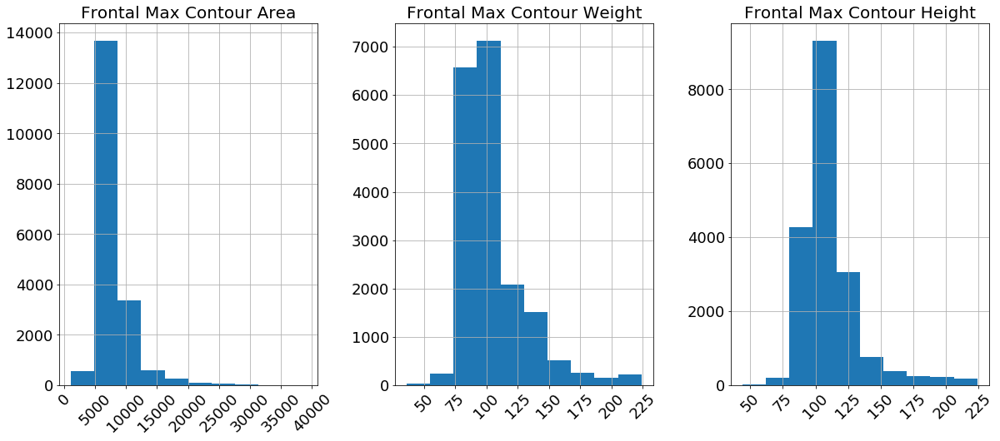

In [38]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,8))
# train_csv_frontal_positive.hist(bins=10, column="maxArea", ax=ax1, xlabelsize=10, ylabelsize=15)
train_csv_frontal_positive.hist(bins=10, column="maxArea", ax=ax1, ylabelsize=18, xlabelsize=18)
train_csv_frontal_positive.hist(bins=10, column="maxAreaBoxW", ax=ax2, ylabelsize=18, xlabelsize=18)
train_csv_frontal_positive.hist(bins=10, column="maxAreaBoxH", ax=ax3, ylabelsize=18, xlabelsize=18)
ax1.set_title("Frontal Max Contour Area", fontSize=20)
ax1.tick_params(axis='x', labelrotation=45)
ax2.set_title("Frontal Max Contour Weight", fontSize=20)
ax2.tick_params(axis='x', labelrotation=45)
ax3.set_title("Frontal Max Contour Height", fontSize=20)
ax3.tick_params(axis='x', labelrotation=45)
fig.savefig("frontal_positive_sample_hist_final.png")

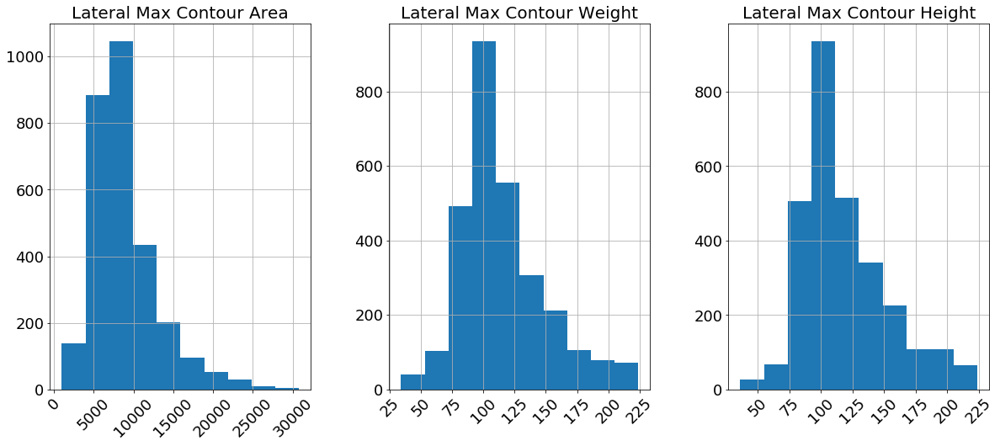

In [39]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,8))
# train_csv_frontal_positive.hist(bins=10, column="maxArea", ax=ax1, xlabelsize=10, ylabelsize=15)
train_csv_lateral_positive.hist(bins=10, column="maxArea", ax=ax1, ylabelsize=18, xlabelsize=18)
train_csv_lateral_positive.hist(bins=10, column="maxAreaBoxW", ax=ax2, ylabelsize=18, xlabelsize=18)
train_csv_lateral_positive.hist(bins=10, column="maxAreaBoxH", ax=ax3, ylabelsize=18, xlabelsize=18)
ax1.set_title("Lateral Max Contour Area", fontSize=20)
ax2.set_title("Lateral Max Contour Weight", fontSize=20)
ax3.set_title("Lateral Max Contour Height", fontSize=20)
ax1.tick_params(axis='x', labelrotation=45)
ax2.tick_params(axis='x', labelrotation=45)
ax3.tick_params(axis='x', labelrotation=45)

fig.savefig("lateral_positive_sample_hist_final.png")

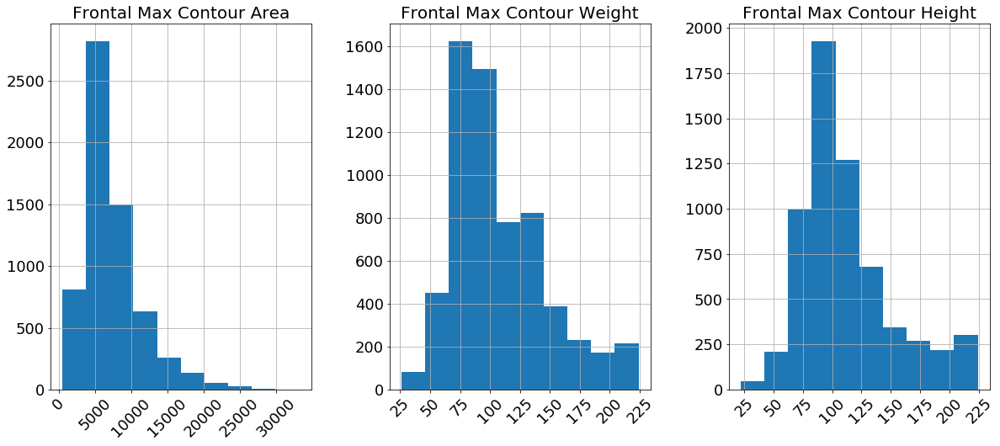

In [40]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,8))
# train_csv_frontal_positive.hist(bins=10, column="maxArea", ax=ax1, xlabelsize=10, ylabelsize=15)
train_csv_frontal_negative.hist(bins=10, column="maxArea", ax=ax1, ylabelsize=18, xlabelsize=18)
train_csv_frontal_negative.hist(bins=10, column="maxAreaBoxW", ax=ax2, ylabelsize=18, xlabelsize=18)
train_csv_frontal_negative.hist(bins=10, column="maxAreaBoxH", ax=ax3, ylabelsize=18, xlabelsize=18)
ax1.set_title("Frontal Max Contour Area", fontSize=20)
ax2.set_title("Frontal Max Contour Weight", fontSize=20)
ax3.set_title("Frontal Max Contour Height", fontSize=20)
ax1.tick_params(axis='x', labelrotation=45)
ax2.tick_params(axis='x', labelrotation=45)
ax3.tick_params(axis='x', labelrotation=45)
fig.savefig("frontal_negative_sample_hist_final.png")

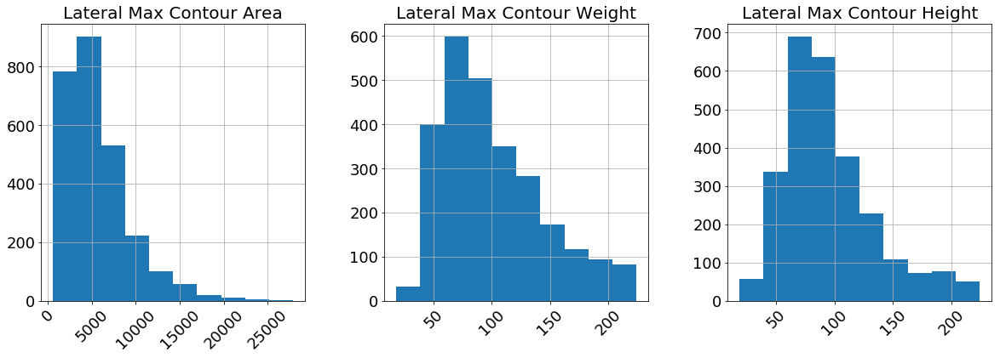

In [43]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,6))
# train_csv_frontal_positive.hist(bins=10, column="maxArea", ax=ax1, xlabelsize=10, ylabelsize=15)
train_csv_lateral_negative.hist(bins=10, column="maxArea", ax=ax1, ylabelsize=18, xlabelsize=18)
train_csv_lateral_negative.hist(bins=10, column="maxAreaBoxW", ax=ax2, ylabelsize=18, xlabelsize=18)
train_csv_lateral_negative.hist(bins=10, column="maxAreaBoxH", ax=ax3, ylabelsize=18, xlabelsize=18)
ax1.set_title("Lateral Max Contour Area", fontSize=20)
ax2.set_title("Lateral Max Contour Weight", fontSize=20)
ax3.set_title("Lateral Max Contour Height", fontSize=20)
ax1.tick_params(axis='x', labelrotation=45)
ax2.tick_params(axis='x', labelrotation=45)
ax3.tick_params(axis='x', labelrotation=45)
fig.savefig("lateral_negative_sample_hist_final.png")

In [37]:
def drawBoxes(path, boxes):
    image = load_and_preprocess_image(path)
    heatmap =  getHeatmap(image)
    imageNumpy = image.numpy() * 255
    for box in boxes:
        (x, y, w, h, area) = box
        cv2.rectangle(heatmap, (x, y), (x + w, y + h), (255, 0, 0), 2)
        cv2.rectangle(imageNumpy, (x, y), (x + w, y + h), (255, 0, 0), 2)
    return image.numpy() * 255, heatmap, imageNumpy

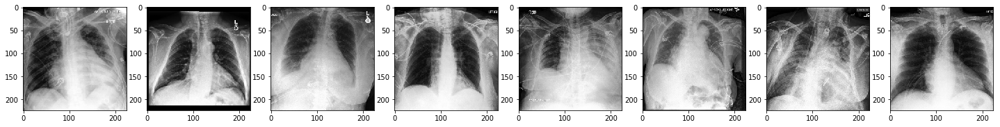

In [50]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_frontal_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(x.astype('uint8'))
fig.savefig("original_final.png")

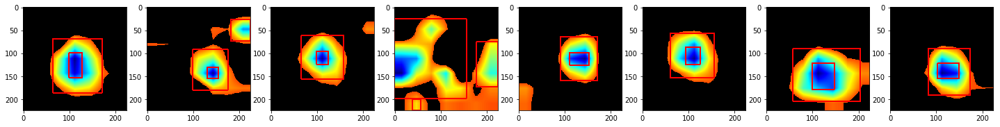

In [51]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_frontal_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(y.astype('uint8'))
fig.savefig("heatmap+box_final.png")

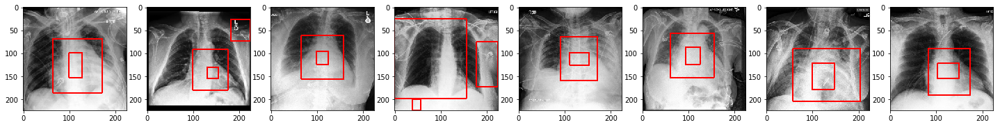

In [52]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_frontal_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(z.astype('uint8'))
fig.savefig("original+box_final.png")

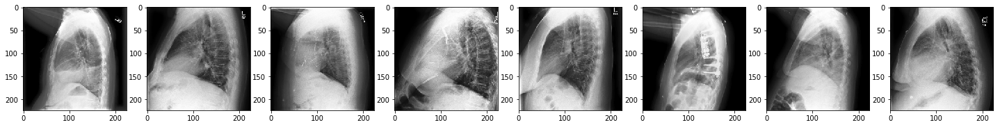

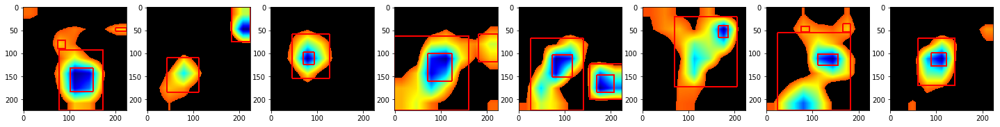

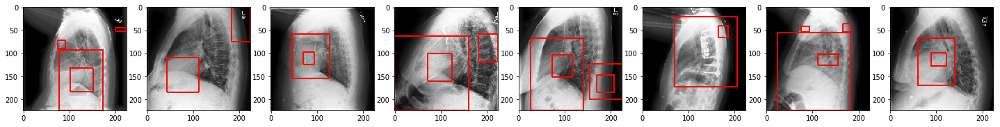

In [57]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_lateral_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(x.astype('uint8'))
fig.savefig("original_lateral_final.png")

count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_lateral_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(y.astype('uint8'))
fig.savefig("heatmap+box_lateral_final.png")

count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_lateral_positive.loc[i, :]
    x, y, z = drawBoxes(sample['Path'], getBoxes(sample['boxList']))
    ax[i].imshow(z.astype('uint8'))
fig.savefig("original+box_lateral_final.png")

In [9]:
def getAttentionArea(path):
    image = load_and_preprocess_image(path)
    heatmap = getHeatmap(image)
    contours, hierarchy = getContours(heatmap)
    maxArea = 0
    X = None
    Y = None
    W = None
    H = None
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        area = cv2.contourArea(contour)
        if area > maxArea:
            maxArea = area
            X = x
            Y = y
            W = w
            H = h
    
    cx = X + W // 2
    cy = Y + H // 2
    half_len = min(50, 224-cx+1, cx-0, 224-cy+1, cy-0)
    np_image = image.numpy() * 255
    cropped_np_image = np_image[cy-half_len:cy+half_len, cx-half_len:cx+half_len]
    resized = cv2.resize(cropped_np_image, (224,224), interpolation = cv2.INTER_AREA)
    new_path = "../cs221/" + path[20:-4] + "_attention_final.jpg"
    cv2.imwrite(new_path, resized)
    print(new_path + " is done! half_len=" + str(half_len) + " cx=" + str(cx) + " cy=" + str(cy))
    return new_path

In [10]:
train_csv["attentionPathFinal"] = train_csv.Path.apply(getAttentionArea)

../cs221/CheXpert-v1.0-small/train/patient11346/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=127
../cs221/CheXpert-v1.0-small/train/patient29092/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=135
../cs221/CheXpert-v1.0-small/train/patient46813/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=108
../cs221/CheXpert-v1.0-small/train/patient49181/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=78 cy=111
../cs221/CheXpert-v1.0-small/train/patient03542/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=111
../cs221/CheXpert-v1.0-small/train/patient47276/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=133
../cs221/CheXpert-v1.0-small/train/patient43212/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=104
../cs221/CheXpert-v1.0-small/train/patient35085/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=147
../cs221/

../cs221/CheXpert-v1.0-small/train/patient22400/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=115
../cs221/CheXpert-v1.0-small/train/patient28379/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=116
../cs221/CheXpert-v1.0-small/train/patient50859/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=130
../cs221/CheXpert-v1.0-small/train/patient28590/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=123
../cs221/CheXpert-v1.0-small/train/patient05650/study4/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=166
../cs221/CheXpert-v1.0-small/train/patient11346/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=139
../cs221/CheXpert-v1.0-small/train/patient23355/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=156
../cs221/CheXpert-v1.0-small/train/patient19166/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=143
../cs2

../cs221/CheXpert-v1.0-small/train/patient06348/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=166
../cs221/CheXpert-v1.0-small/train/patient02533/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=121
../cs221/CheXpert-v1.0-small/train/patient21001/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=151
../cs221/CheXpert-v1.0-small/train/patient09699/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=122
../cs221/CheXpert-v1.0-small/train/patient23110/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=127
../cs221/CheXpert-v1.0-small/train/patient23110/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=138
../cs221/CheXpert-v1.0-small/train/patient08827/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=95
../cs221/CheXpert-v1.0-small/train/patient09471/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=56 cy=66
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient37815/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=154
../cs221/CheXpert-v1.0-small/train/patient06479/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=157
../cs221/CheXpert-v1.0-small/train/patient15807/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=162 cy=34
../cs221/CheXpert-v1.0-small/train/patient46455/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=115
../cs221/CheXpert-v1.0-small/train/patient21813/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=139
../cs221/CheXpert-v1.0-small/train/patient28490/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=115
../cs221/CheXpert-v1.0-small/train/patient30933/study4/view1_frontal_attention_final.jpg is done! half_len=48 cx=81 cy=177
../cs221/CheXpert-v1.0-small/train/patient24902/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=110
../cs221/

../cs221/CheXpert-v1.0-small/train/patient30206/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=142
../cs221/CheXpert-v1.0-small/train/patient17023/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=112
../cs221/CheXpert-v1.0-small/train/patient08017/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=148
../cs221/CheXpert-v1.0-small/train/patient30202/study1/view2_lateral_attention_final.jpg is done! half_len=46 cx=88 cy=179
../cs221/CheXpert-v1.0-small/train/patient25649/study1/view2_lateral_attention_final.jpg is done! half_len=42 cx=49 cy=183
../cs221/CheXpert-v1.0-small/train/patient20077/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=118
../cs221/CheXpert-v1.0-small/train/patient36474/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=131
../cs221/CheXpert-v1.0-small/train/patient10482/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=110
../cs221/

../cs221/CheXpert-v1.0-small/train/patient41707/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=110
../cs221/CheXpert-v1.0-small/train/patient38116/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=121
../cs221/CheXpert-v1.0-small/train/patient26758/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=112
../cs221/CheXpert-v1.0-small/train/patient34842/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=150
../cs221/CheXpert-v1.0-small/train/patient33516/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=108
../cs221/CheXpert-v1.0-small/train/patient43976/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=105
../cs221/CheXpert-v1.0-small/train/patient11361/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/CheXpert-v1.0-small/train/patient16602/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=86
../cs221/

../cs221/CheXpert-v1.0-small/train/patient29729/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=109
../cs221/CheXpert-v1.0-small/train/patient35009/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=114
../cs221/CheXpert-v1.0-small/train/patient34041/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient17834/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=155
../cs221/CheXpert-v1.0-small/train/patient18199/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=138
../cs221/CheXpert-v1.0-small/train/patient24224/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=78
../cs221/CheXpert-v1.0-small/train/patient14074/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=158
../cs221/CheXpert-v1.0-small/train/patient00145/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=125
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21344/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=96
../cs221/CheXpert-v1.0-small/train/patient27103/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=130
../cs221/CheXpert-v1.0-small/train/patient07842/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=141
../cs221/CheXpert-v1.0-small/train/patient55228/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=105
../cs221/CheXpert-v1.0-small/train/patient17442/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=131
../cs221/CheXpert-v1.0-small/train/patient30597/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=111
../cs221/CheXpert-v1.0-small/train/patient09419/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=157
../cs221/CheXpert-v1.0-small/train/patient26705/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=117
../cs221/

../cs221/CheXpert-v1.0-small/train/patient58073/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=121
../cs221/CheXpert-v1.0-small/train/patient06028/study42/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=140
../cs221/CheXpert-v1.0-small/train/patient20038/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=105
../cs221/CheXpert-v1.0-small/train/patient10140/study46/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=116
../cs221/CheXpert-v1.0-small/train/patient47962/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=127
../cs221/CheXpert-v1.0-small/train/patient23441/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=108
../cs221/CheXpert-v1.0-small/train/patient10140/study49/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=117
../cs221/CheXpert-v1.0-small/train/patient35776/study17/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=122
../c

../cs221/CheXpert-v1.0-small/train/patient16719/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=127
../cs221/CheXpert-v1.0-small/train/patient08555/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient43039/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=82
../cs221/CheXpert-v1.0-small/train/patient37635/study2/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=169
../cs221/CheXpert-v1.0-small/train/patient46832/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=151
../cs221/CheXpert-v1.0-small/train/patient55734/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=93
../cs221/CheXpert-v1.0-small/train/patient24352/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=140
../cs221/CheXpert-v1.0-small/train/patient08235/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=133
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient40008/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient04109/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=138 cy=115
../cs221/CheXpert-v1.0-small/train/patient20105/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=113
../cs221/CheXpert-v1.0-small/train/patient59022/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=117
../cs221/CheXpert-v1.0-small/train/patient43941/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=139
../cs221/CheXpert-v1.0-small/train/patient44239/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=117
../cs221/CheXpert-v1.0-small/train/patient08732/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=118
../cs221/CheXpert-v1.0-small/train/patient41821/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=128
../cs221

../cs221/CheXpert-v1.0-small/train/patient13801/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=158
../cs221/CheXpert-v1.0-small/train/patient07534/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=161
../cs221/CheXpert-v1.0-small/train/patient15885/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=131
../cs221/CheXpert-v1.0-small/train/patient42145/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=101
../cs221/CheXpert-v1.0-small/train/patient60547/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=75
../cs221/CheXpert-v1.0-small/train/patient22743/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=112
../cs221/CheXpert-v1.0-small/train/patient26458/study15/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=147
../cs221/CheXpert-v1.0-small/train/patient31878/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=132
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient01349/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=119
../cs221/CheXpert-v1.0-small/train/patient16653/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=102
../cs221/CheXpert-v1.0-small/train/patient25203/study7/view2_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=131
../cs221/CheXpert-v1.0-small/train/patient17995/study3/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=133
../cs221/CheXpert-v1.0-small/train/patient19695/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=118
../cs221/CheXpert-v1.0-small/train/patient04998/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=121
../cs221/CheXpert-v1.0-small/train/patient37498/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=137
../cs221/CheXpert-v1.0-small/train/patient34413/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=122
../cs

../cs221/CheXpert-v1.0-small/train/patient13607/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=147
../cs221/CheXpert-v1.0-small/train/patient07257/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=149
../cs221/CheXpert-v1.0-small/train/patient20329/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=121
../cs221/CheXpert-v1.0-small/train/patient02529/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=125
../cs221/CheXpert-v1.0-small/train/patient00703/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=103
../cs221/CheXpert-v1.0-small/train/patient22083/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=120
../cs221/CheXpert-v1.0-small/train/patient51179/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=103
../cs221/CheXpert-v1.0-small/train/patient11292/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=137
../cs22

../cs221/CheXpert-v1.0-small/train/patient09665/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=56 cy=159
../cs221/CheXpert-v1.0-small/train/patient22319/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=65 cy=172
../cs221/CheXpert-v1.0-small/train/patient26370/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=136
../cs221/CheXpert-v1.0-small/train/patient08256/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=122
../cs221/CheXpert-v1.0-small/train/patient56523/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=136
../cs221/CheXpert-v1.0-small/train/patient21396/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=127 cy=155
../cs221/CheXpert-v1.0-small/train/patient18112/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=108
../cs221/CheXpert-v1.0-small/train/patient00310/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=121
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient32335/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=127
../cs221/CheXpert-v1.0-small/train/patient26780/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=123
../cs221/CheXpert-v1.0-small/train/patient13427/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=125
../cs221/CheXpert-v1.0-small/train/patient00017/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=139
../cs221/CheXpert-v1.0-small/train/patient30733/study9/view2_lateral_attention_final.jpg is done! half_len=47 cx=47 cy=152
../cs221/CheXpert-v1.0-small/train/patient35225/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=116
../cs221/CheXpert-v1.0-small/train/patient11123/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=99
../cs221/CheXpert-v1.0-small/train/patient36649/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=136
../cs221/

../cs221/CheXpert-v1.0-small/train/patient14848/study2/view2_lateral_attention_final.jpg is done! half_len=37 cx=188 cy=166
../cs221/CheXpert-v1.0-small/train/patient05807/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=159 cy=54
../cs221/CheXpert-v1.0-small/train/patient47057/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=127 cy=124
../cs221/CheXpert-v1.0-small/train/patient21198/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=129
../cs221/CheXpert-v1.0-small/train/patient26704/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=115
../cs221/CheXpert-v1.0-small/train/patient32134/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=66
../cs221/CheXpert-v1.0-small/train/patient63102/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=179 cy=156
../cs221/CheXpert-v1.0-small/train/patient26254/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=127
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient47424/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=130
../cs221/CheXpert-v1.0-small/train/patient21433/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=68 cy=121
../cs221/CheXpert-v1.0-small/train/patient34487/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=117
../cs221/CheXpert-v1.0-small/train/patient27274/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=143
../cs221/CheXpert-v1.0-small/train/patient34475/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=143
../cs221/CheXpert-v1.0-small/train/patient25928/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=96
../cs221/CheXpert-v1.0-small/train/patient24459/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=104
../cs221/CheXpert-v1.0-small/train/patient00450/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=186 cy=21
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient36458/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=135
../cs221/CheXpert-v1.0-small/train/patient58045/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=126
../cs221/CheXpert-v1.0-small/train/patient06155/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=134
../cs221/CheXpert-v1.0-small/train/patient28480/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=59 cy=135
../cs221/CheXpert-v1.0-small/train/patient15085/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=128
../cs221/CheXpert-v1.0-small/train/patient22857/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=128
../cs221/CheXpert-v1.0-small/train/patient27470/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=137
../cs221/CheXpert-v1.0-small/train/patient18283/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=126
../cs22

../cs221/CheXpert-v1.0-small/train/patient43632/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=163
../cs221/CheXpert-v1.0-small/train/patient02774/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=130
../cs221/CheXpert-v1.0-small/train/patient30539/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=77
../cs221/CheXpert-v1.0-small/train/patient05707/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=151
../cs221/CheXpert-v1.0-small/train/patient04737/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=147
../cs221/CheXpert-v1.0-small/train/patient55809/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=131
../cs221/CheXpert-v1.0-small/train/patient11276/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=125
../cs221/CheXpert-v1.0-small/train/patient37187/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=121
../cs221/

../cs221/CheXpert-v1.0-small/train/patient29065/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=142
../cs221/CheXpert-v1.0-small/train/patient21824/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=164
../cs221/CheXpert-v1.0-small/train/patient31773/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=118
../cs221/CheXpert-v1.0-small/train/patient37688/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=119
../cs221/CheXpert-v1.0-small/train/patient09067/study1/view2_lateral_attention_final.jpg is done! half_len=31 cx=31 cy=192
../cs221/CheXpert-v1.0-small/train/patient39887/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=109
../cs221/CheXpert-v1.0-small/train/patient53307/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=119
../cs221/CheXpert-v1.0-small/train/patient37701/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=127
../cs221

../cs221/CheXpert-v1.0-small/train/patient18439/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=157
../cs221/CheXpert-v1.0-small/train/patient00210/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=116
../cs221/CheXpert-v1.0-small/train/patient53822/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=107
../cs221/CheXpert-v1.0-small/train/patient44536/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=137
../cs221/CheXpert-v1.0-small/train/patient30337/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=136
../cs221/CheXpert-v1.0-small/train/patient39144/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=119
../cs221/CheXpert-v1.0-small/train/patient13452/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=140
../cs221/CheXpert-v1.0-small/train/patient01575/study1/view2_lateral_attention_final.jpg is done! half_len=16 cx=125 cy=209
../cs221

../cs221/CheXpert-v1.0-small/train/patient36082/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=142
../cs221/CheXpert-v1.0-small/train/patient58745/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=118
../cs221/CheXpert-v1.0-small/train/patient49715/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=136
../cs221/CheXpert-v1.0-small/train/patient07034/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=134
../cs221/CheXpert-v1.0-small/train/patient27983/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=134
../cs221/CheXpert-v1.0-small/train/patient00400/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=125 cy=175
../cs221/CheXpert-v1.0-small/train/patient11412/study3/view1_lateral_attention_final.jpg is done! half_len=50 cx=129 cy=51
../cs221/CheXpert-v1.0-small/train/patient23136/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=53
../cs221/

../cs221/CheXpert-v1.0-small/train/patient24300/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=161
../cs221/CheXpert-v1.0-small/train/patient43897/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=122
../cs221/CheXpert-v1.0-small/train/patient00574/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=106
../cs221/CheXpert-v1.0-small/train/patient48488/study2/view1_frontal_attention_final.jpg is done! half_len=23 cx=23 cy=201
../cs221/CheXpert-v1.0-small/train/patient12855/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=139
../cs221/CheXpert-v1.0-small/train/patient15930/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=110
../cs221/CheXpert-v1.0-small/train/patient31807/study3/view1_frontal_attention_final.jpg is done! half_len=23 cx=202 cy=44
../cs221/CheXpert-v1.0-small/train/patient29925/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=163
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient02251/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=149
../cs221/CheXpert-v1.0-small/train/patient13046/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=123
../cs221/CheXpert-v1.0-small/train/patient13492/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=157
../cs221/CheXpert-v1.0-small/train/patient08758/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=140 cy=112
../cs221/CheXpert-v1.0-small/train/patient24084/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=118
../cs221/CheXpert-v1.0-small/train/patient15113/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=120
../cs221/CheXpert-v1.0-small/train/patient34669/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=149
../cs221/CheXpert-v1.0-small/train/patient25874/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=173
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient31986/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=120
../cs221/CheXpert-v1.0-small/train/patient62829/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=128 cy=178
../cs221/CheXpert-v1.0-small/train/patient00061/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=107
../cs221/CheXpert-v1.0-small/train/patient09611/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=165
../cs221/CheXpert-v1.0-small/train/patient00463/study14/view1_frontal_attention_final.jpg is done! half_len=42 cx=183 cy=134
../cs221/CheXpert-v1.0-small/train/patient24116/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=116
../cs221/CheXpert-v1.0-small/train/patient45575/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=112
../cs221/CheXpert-v1.0-small/train/patient39493/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=154
../cs2

../cs221/CheXpert-v1.0-small/train/patient10433/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient36169/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=119
../cs221/CheXpert-v1.0-small/train/patient08344/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=134
../cs221/CheXpert-v1.0-small/train/patient02312/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=139
../cs221/CheXpert-v1.0-small/train/patient08677/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=155
../cs221/CheXpert-v1.0-small/train/patient25593/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=68 cy=156
../cs221/CheXpert-v1.0-small/train/patient36980/study2/view1_frontal_attention_final.jpg is done! half_len=41 cx=177 cy=184
../cs221/CheXpert-v1.0-small/train/patient61117/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=147
../cs221/

../cs221/CheXpert-v1.0-small/train/patient32815/study29/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=163
../cs221/CheXpert-v1.0-small/train/patient01283/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=155
../cs221/CheXpert-v1.0-small/train/patient27848/study3/view2_lateral_attention_final.jpg is done! half_len=23 cx=51 cy=202
../cs221/CheXpert-v1.0-small/train/patient08973/study2/view1_frontal_attention_final.jpg is done! half_len=24 cx=201 cy=97
../cs221/CheXpert-v1.0-small/train/patient26492/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=144
../cs221/CheXpert-v1.0-small/train/patient03922/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=147
../cs221/CheXpert-v1.0-small/train/patient32193/study2/view2_lateral_attention_final.jpg is done! half_len=27 cx=34 cy=198
../cs221/CheXpert-v1.0-small/train/patient12319/study3/view2_frontal_attention_final.jpg is done! half_len=44 cx=119 cy=181
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient03339/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/CheXpert-v1.0-small/train/patient39008/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=153
../cs221/CheXpert-v1.0-small/train/patient54954/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=90 cy=118
../cs221/CheXpert-v1.0-small/train/patient35431/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=126
../cs221/CheXpert-v1.0-small/train/patient28773/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=139
../cs221/CheXpert-v1.0-small/train/patient21631/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=126
../cs221/CheXpert-v1.0-small/train/patient05353/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=106
../cs221/CheXpert-v1.0-small/train/patient58010/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=151
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient11389/study7/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=131
../cs221/CheXpert-v1.0-small/train/patient50805/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=146
../cs221/CheXpert-v1.0-small/train/patient25113/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=99
../cs221/CheXpert-v1.0-small/train/patient57043/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=159
../cs221/CheXpert-v1.0-small/train/patient45996/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=129
../cs221/CheXpert-v1.0-small/train/patient30026/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=147
../cs221/CheXpert-v1.0-small/train/patient16169/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=115
../cs221/CheXpert-v1.0-small/train/patient28986/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=57 cy=124
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient06836/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=144
../cs221/CheXpert-v1.0-small/train/patient35411/study30/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=160
../cs221/CheXpert-v1.0-small/train/patient06181/study4/view2_lateral_attention_final.jpg is done! half_len=32 cx=57 cy=193
../cs221/CheXpert-v1.0-small/train/patient09717/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=141
../cs221/CheXpert-v1.0-small/train/patient33431/study8/view2_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=79
../cs221/CheXpert-v1.0-small/train/patient01772/study20/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=130
../cs221/CheXpert-v1.0-small/train/patient17149/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=148
../cs221/CheXpert-v1.0-small/train/patient41495/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=127
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient08561/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=127
../cs221/CheXpert-v1.0-small/train/patient59190/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=142
../cs221/CheXpert-v1.0-small/train/patient43858/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=127
../cs221/CheXpert-v1.0-small/train/patient26186/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=44 cy=179
../cs221/CheXpert-v1.0-small/train/patient58056/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=127
../cs221/CheXpert-v1.0-small/train/patient60634/study1/view2_lateral_attention_final.jpg is done! half_len=40 cx=40 cy=138
../cs221/CheXpert-v1.0-small/train/patient20518/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=138
../cs221/CheXpert-v1.0-small/train/patient18452/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=110
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient17650/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=113
../cs221/CheXpert-v1.0-small/train/patient37559/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=140
../cs221/CheXpert-v1.0-small/train/patient14353/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=143
../cs221/CheXpert-v1.0-small/train/patient01595/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=120
../cs221/CheXpert-v1.0-small/train/patient64265/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=133
../cs221/CheXpert-v1.0-small/train/patient06389/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=119
../cs221/CheXpert-v1.0-small/train/patient07708/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=114
../cs221/CheXpert-v1.0-small/train/patient09805/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=121 cy=146
../cs22

../cs221/CheXpert-v1.0-small/train/patient14646/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=107
../cs221/CheXpert-v1.0-small/train/patient47232/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=121
../cs221/CheXpert-v1.0-small/train/patient45161/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=136
../cs221/CheXpert-v1.0-small/train/patient18544/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=51
../cs221/CheXpert-v1.0-small/train/patient02405/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=190 cy=80
../cs221/CheXpert-v1.0-small/train/patient46493/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=119
../cs221/CheXpert-v1.0-small/train/patient01319/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=127
../cs221/CheXpert-v1.0-small/train/patient02803/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=168
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient29236/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=104
../cs221/CheXpert-v1.0-small/train/patient51742/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=156
../cs221/CheXpert-v1.0-small/train/patient02214/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=135
../cs221/CheXpert-v1.0-small/train/patient29455/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=122
../cs221/CheXpert-v1.0-small/train/patient01423/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=137
../cs221/CheXpert-v1.0-small/train/patient08220/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=116
../cs221/CheXpert-v1.0-small/train/patient15612/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=125
../cs221/CheXpert-v1.0-small/train/patient03822/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=124
../cs221

../cs221/CheXpert-v1.0-small/train/patient43494/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=147
../cs221/CheXpert-v1.0-small/train/patient13492/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=89 cy=190
../cs221/CheXpert-v1.0-small/train/patient04391/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=156
../cs221/CheXpert-v1.0-small/train/patient53980/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient64216/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=132
../cs221/CheXpert-v1.0-small/train/patient41283/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=140
../cs221/CheXpert-v1.0-small/train/patient07755/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=145
../cs221/CheXpert-v1.0-small/train/patient04827/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=128
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient00704/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=141
../cs221/CheXpert-v1.0-small/train/patient08455/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=129
../cs221/CheXpert-v1.0-small/train/patient06854/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=145
../cs221/CheXpert-v1.0-small/train/patient13140/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=107
../cs221/CheXpert-v1.0-small/train/patient10049/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=128
../cs221/CheXpert-v1.0-small/train/patient18902/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=154
../cs221/CheXpert-v1.0-small/train/patient26551/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=119
../cs221/CheXpert-v1.0-small/train/patient58050/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=114
../cs221/

../cs221/CheXpert-v1.0-small/train/patient46584/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=128
../cs221/CheXpert-v1.0-small/train/patient36264/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=139
../cs221/CheXpert-v1.0-small/train/patient28314/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=119
../cs221/CheXpert-v1.0-small/train/patient08985/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=122
../cs221/CheXpert-v1.0-small/train/patient13903/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=140
../cs221/CheXpert-v1.0-small/train/patient60330/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=143
../cs221/CheXpert-v1.0-small/train/patient34749/study58/view1_frontal_attention_final.jpg is done! half_len=50 cx=62 cy=146
../cs221/CheXpert-v1.0-small/train/patient21970/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=121
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient30749/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=103 cy=182
../cs221/CheXpert-v1.0-small/train/patient35744/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=121
../cs221/CheXpert-v1.0-small/train/patient21857/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=152
../cs221/CheXpert-v1.0-small/train/patient28996/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=141
../cs221/CheXpert-v1.0-small/train/patient40334/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=143
../cs221/CheXpert-v1.0-small/train/patient41183/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=72 cy=122
../cs221/CheXpert-v1.0-small/train/patient01187/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=164
../cs221/CheXpert-v1.0-small/train/patient49159/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=104
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient00703/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=107
../cs221/CheXpert-v1.0-small/train/patient59092/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=121
../cs221/CheXpert-v1.0-small/train/patient54053/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=101
../cs221/CheXpert-v1.0-small/train/patient01165/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=119
../cs221/CheXpert-v1.0-small/train/patient14551/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=135
../cs221/CheXpert-v1.0-small/train/patient04426/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=64 cy=52
../cs221/CheXpert-v1.0-small/train/patient30040/study3/view2_lateral_attention_final.jpg is done! half_len=25 cx=71 cy=200
../cs221/CheXpert-v1.0-small/train/patient35043/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=112
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient18383/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=132
../cs221/CheXpert-v1.0-small/train/patient11649/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=146
../cs221/CheXpert-v1.0-small/train/patient30862/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=112
../cs221/CheXpert-v1.0-small/train/patient35351/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=123
../cs221/CheXpert-v1.0-small/train/patient07806/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=120
../cs221/CheXpert-v1.0-small/train/patient32615/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=122
../cs221/CheXpert-v1.0-small/train/patient01082/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=175
../cs221/CheXpert-v1.0-small/train/patient00111/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=110
../cs2

../cs221/CheXpert-v1.0-small/train/patient51486/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=123
../cs221/CheXpert-v1.0-small/train/patient23673/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=99
../cs221/CheXpert-v1.0-small/train/patient42545/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=93
../cs221/CheXpert-v1.0-small/train/patient14691/study13/view1_frontal_attention_final.jpg is done! half_len=40 cx=185 cy=147
../cs221/CheXpert-v1.0-small/train/patient46719/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=112
../cs221/CheXpert-v1.0-small/train/patient08360/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=114
../cs221/CheXpert-v1.0-small/train/patient19694/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=62 cy=69
../cs221/CheXpert-v1.0-small/train/patient34532/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=53 cy=127
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient00693/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=116
../cs221/CheXpert-v1.0-small/train/patient46649/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=126
../cs221/CheXpert-v1.0-small/train/patient20623/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=106
../cs221/CheXpert-v1.0-small/train/patient25308/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=148
../cs221/CheXpert-v1.0-small/train/patient30794/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=134
../cs221/CheXpert-v1.0-small/train/patient56788/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient35897/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=133
../cs221/CheXpert-v1.0-small/train/patient29392/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient09064/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=154 cy=54
../cs221/CheXpert-v1.0-small/train/patient20312/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=144
../cs221/CheXpert-v1.0-small/train/patient61874/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=152
../cs221/CheXpert-v1.0-small/train/patient38313/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=106
../cs221/CheXpert-v1.0-small/train/patient25376/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=158
../cs221/CheXpert-v1.0-small/train/patient22600/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=124
../cs221/CheXpert-v1.0-small/train/patient30715/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=113
../cs221/CheXpert-v1.0-small/train/patient06642/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=58
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient15253/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=139
../cs221/CheXpert-v1.0-small/train/patient40316/study5/view2_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=114
../cs221/CheXpert-v1.0-small/train/patient28830/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient14080/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=111
../cs221/CheXpert-v1.0-small/train/patient36558/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=116
../cs221/CheXpert-v1.0-small/train/patient25418/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=116
../cs221/CheXpert-v1.0-small/train/patient29698/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=104
../cs221/CheXpert-v1.0-small/train/patient15162/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=127
../cs22

../cs221/CheXpert-v1.0-small/train/patient51887/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=140
../cs221/CheXpert-v1.0-small/train/patient14343/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=133
../cs221/CheXpert-v1.0-small/train/patient25502/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=130
../cs221/CheXpert-v1.0-small/train/patient10090/study1/view1_frontal_attention_final.jpg is done! half_len=37 cx=37 cy=45
../cs221/CheXpert-v1.0-small/train/patient28379/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=126
../cs221/CheXpert-v1.0-small/train/patient24207/study2/view2_lateral_attention_final.jpg is done! half_len=33 cx=192 cy=33
../cs221/CheXpert-v1.0-small/train/patient02203/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=127
../cs221/CheXpert-v1.0-small/train/patient14686/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=132
../cs221/

../cs221/CheXpert-v1.0-small/train/patient30384/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=61 cy=143
../cs221/CheXpert-v1.0-small/train/patient51886/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=63 cy=62
../cs221/CheXpert-v1.0-small/train/patient16221/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=135
../cs221/CheXpert-v1.0-small/train/patient09073/study5/view1_frontal_attention_final.jpg is done! half_len=22 cx=38 cy=203
../cs221/CheXpert-v1.0-small/train/patient38769/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=144
../cs221/CheXpert-v1.0-small/train/patient40327/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=141
../cs221/CheXpert-v1.0-small/train/patient16514/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=106
../cs221/CheXpert-v1.0-small/train/patient02547/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=61 cy=143
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient34623/study24/view2_frontal_attention_final.jpg is done! half_len=50 cx=68 cy=136
../cs221/CheXpert-v1.0-small/train/patient32615/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=128
../cs221/CheXpert-v1.0-small/train/patient12050/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=130
../cs221/CheXpert-v1.0-small/train/patient37184/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=146
../cs221/CheXpert-v1.0-small/train/patient26053/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/CheXpert-v1.0-small/train/patient30933/study4/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=49
../cs221/CheXpert-v1.0-small/train/patient40318/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=132
../cs221/CheXpert-v1.0-small/train/patient06496/study1/view2_lateral_attention_final.jpg is done! half_len=27 cx=113 cy=27
../cs221/

../cs221/CheXpert-v1.0-small/train/patient09293/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=112
../cs221/CheXpert-v1.0-small/train/patient21970/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=123
../cs221/CheXpert-v1.0-small/train/patient32023/study2/view1_frontal_attention_final.jpg is done! half_len=27 cx=67 cy=198
../cs221/CheXpert-v1.0-small/train/patient08331/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=146
../cs221/CheXpert-v1.0-small/train/patient47782/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=118
../cs221/CheXpert-v1.0-small/train/patient25308/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=157
../cs221/CheXpert-v1.0-small/train/patient28320/study4/view1_frontal_attention_final.jpg is done! half_len=30 cx=30 cy=86
../cs221/CheXpert-v1.0-small/train/patient10897/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=126
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient28737/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=124
../cs221/CheXpert-v1.0-small/train/patient39475/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=118
../cs221/CheXpert-v1.0-small/train/patient02426/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=129
../cs221/CheXpert-v1.0-small/train/patient31095/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=100
../cs221/CheXpert-v1.0-small/train/patient34885/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=119
../cs221/CheXpert-v1.0-small/train/patient08417/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=152
../cs221/CheXpert-v1.0-small/train/patient15979/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=147
../cs221/CheXpert-v1.0-small/train/patient23576/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=116
../cs221/

../cs221/CheXpert-v1.0-small/train/patient45575/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=131
../cs221/CheXpert-v1.0-small/train/patient27814/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=110
../cs221/CheXpert-v1.0-small/train/patient38497/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=115
../cs221/CheXpert-v1.0-small/train/patient13058/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=131 cy=134
../cs221/CheXpert-v1.0-small/train/patient53362/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=119
../cs221/CheXpert-v1.0-small/train/patient50456/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=68 cy=47
../cs221/CheXpert-v1.0-small/train/patient26653/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=136
../cs221/CheXpert-v1.0-small/train/patient46524/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=104
../cs221/

../cs221/CheXpert-v1.0-small/train/patient11550/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=125
../cs221/CheXpert-v1.0-small/train/patient34669/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=107
../cs221/CheXpert-v1.0-small/train/patient23809/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=135
../cs221/CheXpert-v1.0-small/train/patient22948/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=117
../cs221/CheXpert-v1.0-small/train/patient25196/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=130
../cs221/CheXpert-v1.0-small/train/patient35223/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=129
../cs221/CheXpert-v1.0-small/train/patient18323/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=132
../cs221/CheXpert-v1.0-small/train/patient15443/study2/view1_frontal_attention_final.jpg is done! half_len=48 cx=141 cy=177
../cs221

../cs221/CheXpert-v1.0-small/train/patient07316/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=63 cy=179
../cs221/CheXpert-v1.0-small/train/patient41242/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=123
../cs221/CheXpert-v1.0-small/train/patient05068/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=112
../cs221/CheXpert-v1.0-small/train/patient43127/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=129
../cs221/CheXpert-v1.0-small/train/patient48864/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=152
../cs221/CheXpert-v1.0-small/train/patient38660/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=112
../cs221/CheXpert-v1.0-small/train/patient08973/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=111
../cs221/CheXpert-v1.0-small/train/patient13559/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=146
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient35653/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=142
../cs221/CheXpert-v1.0-small/train/patient39550/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=113
../cs221/CheXpert-v1.0-small/train/patient28479/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=152
../cs221/CheXpert-v1.0-small/train/patient50832/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=119
../cs221/CheXpert-v1.0-small/train/patient01789/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=103
../cs221/CheXpert-v1.0-small/train/patient29763/study12/view2_lateral_attention_final.jpg is done! half_len=50 cx=108 cy=128
../cs221/CheXpert-v1.0-small/train/patient45716/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=150
../cs221/CheXpert-v1.0-small/train/patient34490/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=117
../cs221

../cs221/CheXpert-v1.0-small/train/patient06820/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=116
../cs221/CheXpert-v1.0-small/train/patient08274/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=136
../cs221/CheXpert-v1.0-small/train/patient41969/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=131
../cs221/CheXpert-v1.0-small/train/patient33392/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=159
../cs221/CheXpert-v1.0-small/train/patient39173/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=145
../cs221/CheXpert-v1.0-small/train/patient17678/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=137
../cs221/CheXpert-v1.0-small/train/patient13976/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=121
../cs221/CheXpert-v1.0-small/train/patient33199/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=117
../cs221

../cs221/CheXpert-v1.0-small/train/patient62595/study2/view1_frontal_attention_final.jpg is done! half_len=40 cx=40 cy=60
../cs221/CheXpert-v1.0-small/train/patient10282/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=133
../cs221/CheXpert-v1.0-small/train/patient03558/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=44 cy=49
../cs221/CheXpert-v1.0-small/train/patient25619/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=130
../cs221/CheXpert-v1.0-small/train/patient30304/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=145
../cs221/CheXpert-v1.0-small/train/patient13044/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=118
../cs221/CheXpert-v1.0-small/train/patient02451/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=162
../cs221/CheXpert-v1.0-small/train/patient43795/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=70
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient33307/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=151
../cs221/CheXpert-v1.0-small/train/patient19521/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=153
../cs221/CheXpert-v1.0-small/train/patient02406/study7/view2_lateral_attention_final.jpg is done! half_len=50 cx=116 cy=112
../cs221/CheXpert-v1.0-small/train/patient06580/study2/view3_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=127
../cs221/CheXpert-v1.0-small/train/patient02779/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=125
../cs221/CheXpert-v1.0-small/train/patient19837/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=53
../cs221/CheXpert-v1.0-small/train/patient42216/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=131
../cs221/CheXpert-v1.0-small/train/patient28355/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=125
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient13551/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=109
../cs221/CheXpert-v1.0-small/train/patient06467/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=172
../cs221/CheXpert-v1.0-small/train/patient09596/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=123
../cs221/CheXpert-v1.0-small/train/patient28197/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=121
../cs221/CheXpert-v1.0-small/train/patient57956/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=112
../cs221/CheXpert-v1.0-small/train/patient35915/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=144
../cs221/CheXpert-v1.0-small/train/patient41164/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=125
../cs221/CheXpert-v1.0-small/train/patient62161/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=131
../cs221

../cs221/CheXpert-v1.0-small/train/patient14227/study7/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=115
../cs221/CheXpert-v1.0-small/train/patient13939/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=136
../cs221/CheXpert-v1.0-small/train/patient00678/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=135
../cs221/CheXpert-v1.0-small/train/patient01493/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=128 cy=182
../cs221/CheXpert-v1.0-small/train/patient04903/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=138
../cs221/CheXpert-v1.0-small/train/patient35435/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=135
../cs221/CheXpert-v1.0-small/train/patient05564/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=115
../cs221/CheXpert-v1.0-small/train/patient06460/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=47 cy=176
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient31016/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=154
../cs221/CheXpert-v1.0-small/train/patient13853/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=116
../cs221/CheXpert-v1.0-small/train/patient02121/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=141
../cs221/CheXpert-v1.0-small/train/patient22079/study13/view1_frontal_attention_final.jpg is done! half_len=48 cx=177 cy=163
../cs221/CheXpert-v1.0-small/train/patient10965/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=138
../cs221/CheXpert-v1.0-small/train/patient21668/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=142
../cs221/CheXpert-v1.0-small/train/patient17161/study1/view1_frontal_attention_final.jpg is done! half_len=45 cx=180 cy=76
../cs221/CheXpert-v1.0-small/train/patient07445/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=114
../cs221

../cs221/CheXpert-v1.0-small/train/patient37240/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=116
../cs221/CheXpert-v1.0-small/train/patient17023/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=157
../cs221/CheXpert-v1.0-small/train/patient17658/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=132
../cs221/CheXpert-v1.0-small/train/patient24681/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=121
../cs221/CheXpert-v1.0-small/train/patient14220/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=147
../cs221/CheXpert-v1.0-small/train/patient00204/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=135
../cs221/CheXpert-v1.0-small/train/patient28096/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=119 cy=62
../cs221/CheXpert-v1.0-small/train/patient36352/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=121
../cs221

../cs221/CheXpert-v1.0-small/train/patient31839/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=145
../cs221/CheXpert-v1.0-small/train/patient00693/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=130
../cs221/CheXpert-v1.0-small/train/patient22079/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=142
../cs221/CheXpert-v1.0-small/train/patient51536/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=114
../cs221/CheXpert-v1.0-small/train/patient29521/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=130
../cs221/CheXpert-v1.0-small/train/patient00596/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=111
../cs221/CheXpert-v1.0-small/train/patient33791/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=158
../cs221/CheXpert-v1.0-small/train/patient61213/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=162
../cs2

../cs221/CheXpert-v1.0-small/train/patient31339/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=138
../cs221/CheXpert-v1.0-small/train/patient29781/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=112
../cs221/CheXpert-v1.0-small/train/patient31533/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=164
../cs221/CheXpert-v1.0-small/train/patient20212/study7/view1_frontal_attention_final.jpg is done! half_len=31 cx=194 cy=73
../cs221/CheXpert-v1.0-small/train/patient51355/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=116
../cs221/CheXpert-v1.0-small/train/patient39465/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=117
../cs221/CheXpert-v1.0-small/train/patient22174/study19/view1_frontal_attention_final.jpg is done! half_len=25 cx=43 cy=200
../cs221/CheXpert-v1.0-small/train/patient48068/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=126
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient38757/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=121
../cs221/CheXpert-v1.0-small/train/patient56262/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=130
../cs221/CheXpert-v1.0-small/train/patient52347/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=110
../cs221/CheXpert-v1.0-small/train/patient11599/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=164
../cs221/CheXpert-v1.0-small/train/patient32685/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=135
../cs221/CheXpert-v1.0-small/train/patient21539/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=138
../cs221/CheXpert-v1.0-small/train/patient15397/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=128
../cs221/CheXpert-v1.0-small/train/patient04771/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=145
../cs221

../cs221/CheXpert-v1.0-small/train/patient59395/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=144
../cs221/CheXpert-v1.0-small/train/patient60497/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=118
../cs221/CheXpert-v1.0-small/train/patient11988/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=143
../cs221/CheXpert-v1.0-small/train/patient53406/study1/view2_lateral_attention_final.jpg is done! half_len=25 cx=200 cy=49
../cs221/CheXpert-v1.0-small/train/patient10800/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=116
../cs221/CheXpert-v1.0-small/train/patient26050/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=130
../cs221/CheXpert-v1.0-small/train/patient60588/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=110
../cs221/CheXpert-v1.0-small/train/patient36910/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=131
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient08204/study1/view2_lateral_attention_final.jpg is done! half_len=40 cx=112 cy=40
../cs221/CheXpert-v1.0-small/train/patient36473/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=107
../cs221/CheXpert-v1.0-small/train/patient20155/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=126
../cs221/CheXpert-v1.0-small/train/patient11123/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=89
../cs221/CheXpert-v1.0-small/train/patient20042/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=115
../cs221/CheXpert-v1.0-small/train/patient04290/study8/view2_lateral_attention_final.jpg is done! half_len=36 cx=36 cy=189
../cs221/CheXpert-v1.0-small/train/patient17406/study4/view3_lateral_attention_final.jpg is done! half_len=49 cx=64 cy=176
../cs221/CheXpert-v1.0-small/train/patient02813/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=143
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient17594/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=153
../cs221/CheXpert-v1.0-small/train/patient36156/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=127
../cs221/CheXpert-v1.0-small/train/patient47574/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=133
../cs221/CheXpert-v1.0-small/train/patient31090/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=117
../cs221/CheXpert-v1.0-small/train/patient22576/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=132
../cs221/CheXpert-v1.0-small/train/patient10056/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=138
../cs221/CheXpert-v1.0-small/train/patient46612/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=130
../cs221/CheXpert-v1.0-small/train/patient34712/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=155
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient28797/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=118
../cs221/CheXpert-v1.0-small/train/patient09976/study1/view2_lateral_attention_final.jpg is done! half_len=43 cx=62 cy=182
../cs221/CheXpert-v1.0-small/train/patient00888/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=139
../cs221/CheXpert-v1.0-small/train/patient21622/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=137
../cs221/CheXpert-v1.0-small/train/patient10139/study44/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=126
../cs221/CheXpert-v1.0-small/train/patient22727/study5/view3_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=100
../cs221/CheXpert-v1.0-small/train/patient15295/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=154
../cs221/CheXpert-v1.0-small/train/patient27413/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=142
../cs22

../cs221/CheXpert-v1.0-small/train/patient41497/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=132
../cs221/CheXpert-v1.0-small/train/patient02264/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=101
../cs221/CheXpert-v1.0-small/train/patient02862/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=179 cy=73
../cs221/CheXpert-v1.0-small/train/patient29210/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=140
../cs221/CheXpert-v1.0-small/train/patient38408/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=123
../cs221/CheXpert-v1.0-small/train/patient23866/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=121
../cs221/CheXpert-v1.0-small/train/patient05974/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=145
../cs221/CheXpert-v1.0-small/train/patient30694/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=157
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient18892/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=150
../cs221/CheXpert-v1.0-small/train/patient17708/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=52
../cs221/CheXpert-v1.0-small/train/patient14114/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=113
../cs221/CheXpert-v1.0-small/train/patient05892/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=111
../cs221/CheXpert-v1.0-small/train/patient46219/study1/view2_frontal_attention_final.jpg is done! half_len=37 cx=188 cy=40
../cs221/CheXpert-v1.0-small/train/patient21391/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=117
../cs221/CheXpert-v1.0-small/train/patient61766/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=149
../cs221/CheXpert-v1.0-small/train/patient19036/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=128
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient17150/study1/view2_lateral_attention_final.jpg is done! half_len=30 cx=195 cy=37
../cs221/CheXpert-v1.0-small/train/patient10049/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=147
../cs221/CheXpert-v1.0-small/train/patient26893/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=165
../cs221/CheXpert-v1.0-small/train/patient07561/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=181 cy=177
../cs221/CheXpert-v1.0-small/train/patient09450/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=159
../cs221/CheXpert-v1.0-small/train/patient10427/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=142
../cs221/CheXpert-v1.0-small/train/patient17935/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=78
../cs221/CheXpert-v1.0-small/train/patient33778/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=113
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient02778/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=112
../cs221/CheXpert-v1.0-small/train/patient16171/study1/view2_lateral_attention_final.jpg is done! half_len=25 cx=58 cy=200
../cs221/CheXpert-v1.0-small/train/patient02462/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=139
../cs221/CheXpert-v1.0-small/train/patient06559/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=96
../cs221/CheXpert-v1.0-small/train/patient39759/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=114
../cs221/CheXpert-v1.0-small/train/patient10372/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=186 cy=176
../cs221/CheXpert-v1.0-small/train/patient29492/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=54 cy=149
../cs221/CheXpert-v1.0-small/train/patient06182/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=143
../cs221/

../cs221/CheXpert-v1.0-small/train/patient09579/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=135
../cs221/CheXpert-v1.0-small/train/patient08031/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient20497/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=126
../cs221/CheXpert-v1.0-small/train/patient44701/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=133
../cs221/CheXpert-v1.0-small/train/patient30118/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=157
../cs221/CheXpert-v1.0-small/train/patient02989/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=130
../cs221/CheXpert-v1.0-small/train/patient51100/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=132
../cs221/CheXpert-v1.0-small/train/patient19554/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=131
../cs22

../cs221/CheXpert-v1.0-small/train/patient09178/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=133
../cs221/CheXpert-v1.0-small/train/patient21622/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=132
../cs221/CheXpert-v1.0-small/train/patient21172/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=140
../cs221/CheXpert-v1.0-small/train/patient20508/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=151
../cs221/CheXpert-v1.0-small/train/patient39733/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=147
../cs221/CheXpert-v1.0-small/train/patient27636/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=124
../cs221/CheXpert-v1.0-small/train/patient07044/study2/view1_frontal_attention_final.jpg is done! half_len=32 cx=32 cy=67
../cs221/CheXpert-v1.0-small/train/patient17659/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=38
../cs221/

../cs221/CheXpert-v1.0-small/train/patient26190/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=81 cy=118
../cs221/CheXpert-v1.0-small/train/patient20421/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=119
../cs221/CheXpert-v1.0-small/train/patient12753/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=103
../cs221/CheXpert-v1.0-small/train/patient18002/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=142
../cs221/CheXpert-v1.0-small/train/patient36217/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=155
../cs221/CheXpert-v1.0-small/train/patient19684/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=163
../cs221/CheXpert-v1.0-small/train/patient37735/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=127
../cs221/CheXpert-v1.0-small/train/patient11512/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=159
../cs221

../cs221/CheXpert-v1.0-small/train/patient22267/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=121
../cs221/CheXpert-v1.0-small/train/patient26558/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=113
../cs221/CheXpert-v1.0-small/train/patient49764/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=134
../cs221/CheXpert-v1.0-small/train/patient13847/study2/view2_lateral_attention_final.jpg is done! half_len=40 cx=63 cy=40
../cs221/CheXpert-v1.0-small/train/patient25948/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=110
../cs221/CheXpert-v1.0-small/train/patient31372/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=126
../cs221/CheXpert-v1.0-small/train/patient36346/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=119
../cs221/CheXpert-v1.0-small/train/patient28479/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=130
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient20617/study2/view2_lateral_attention_final.jpg is done! half_len=46 cx=93 cy=46
../cs221/CheXpert-v1.0-small/train/patient10861/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=121
../cs221/CheXpert-v1.0-small/train/patient23069/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=104
../cs221/CheXpert-v1.0-small/train/patient23729/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=131
../cs221/CheXpert-v1.0-small/train/patient27059/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=174
../cs221/CheXpert-v1.0-small/train/patient44270/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=124
../cs221/CheXpert-v1.0-small/train/patient27725/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=137
../cs221/CheXpert-v1.0-small/train/patient06575/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=147
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient40839/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=107
../cs221/CheXpert-v1.0-small/train/patient42101/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=127
../cs221/CheXpert-v1.0-small/train/patient19597/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=129
../cs221/CheXpert-v1.0-small/train/patient34070/study26/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=112
../cs221/CheXpert-v1.0-small/train/patient09711/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=162
../cs221/CheXpert-v1.0-small/train/patient10734/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=134
../cs221/CheXpert-v1.0-small/train/patient23710/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=57 cy=133
../cs221/CheXpert-v1.0-small/train/patient12854/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=152
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient03478/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=124
../cs221/CheXpert-v1.0-small/train/patient54937/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=146
../cs221/CheXpert-v1.0-small/train/patient04135/study29/view1_frontal_attention_final.jpg is done! half_len=49 cx=164 cy=176
../cs221/CheXpert-v1.0-small/train/patient10064/study1/view1_frontal_attention_final.jpg is done! half_len=30 cx=30 cy=65
../cs221/CheXpert-v1.0-small/train/patient35488/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=147
../cs221/CheXpert-v1.0-small/train/patient31657/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=135
../cs221/CheXpert-v1.0-small/train/patient53166/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=67 cy=96
../cs221/CheXpert-v1.0-small/train/patient17647/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=131
../cs221/

../cs221/CheXpert-v1.0-small/train/patient08571/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=131
../cs221/CheXpert-v1.0-small/train/patient20155/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=132
../cs221/CheXpert-v1.0-small/train/patient11346/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=114
../cs221/CheXpert-v1.0-small/train/patient27549/study18/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=175
../cs221/CheXpert-v1.0-small/train/patient27126/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=167
../cs221/CheXpert-v1.0-small/train/patient24927/study2/view2_lateral_attention_final.jpg is done! half_len=23 cx=202 cy=44
../cs221/CheXpert-v1.0-small/train/patient02852/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=96
../cs221/CheXpert-v1.0-small/train/patient19127/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27620/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=140
../cs221/CheXpert-v1.0-small/train/patient00563/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=136
../cs221/CheXpert-v1.0-small/train/patient60673/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=123
../cs221/CheXpert-v1.0-small/train/patient52139/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=135
../cs221/CheXpert-v1.0-small/train/patient11898/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=116
../cs221/CheXpert-v1.0-small/train/patient57186/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=148
../cs221/CheXpert-v1.0-small/train/patient13579/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=143
../cs221/CheXpert-v1.0-small/train/patient00815/study13/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=116
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient00949/study1/view3_lateral_attention_final.jpg is done! half_len=42 cx=183 cy=174
../cs221/CheXpert-v1.0-small/train/patient61259/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=139
../cs221/CheXpert-v1.0-small/train/patient44350/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=122
../cs221/CheXpert-v1.0-small/train/patient18576/study4/view3_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=123
../cs221/CheXpert-v1.0-small/train/patient49156/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=144
../cs221/CheXpert-v1.0-small/train/patient16523/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=145
../cs221/CheXpert-v1.0-small/train/patient11637/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=132
../cs221/CheXpert-v1.0-small/train/patient24636/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=145
../cs22

../cs221/CheXpert-v1.0-small/train/patient05884/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=121
../cs221/CheXpert-v1.0-small/train/patient32501/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=143
../cs221/CheXpert-v1.0-small/train/patient26273/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=122
../cs221/CheXpert-v1.0-small/train/patient25905/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=116
../cs221/CheXpert-v1.0-small/train/patient50908/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=143
../cs221/CheXpert-v1.0-small/train/patient21336/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=145
../cs221/CheXpert-v1.0-small/train/patient00463/study21/view1_frontal_attention_final.jpg is done! half_len=44 cx=181 cy=47
../cs221/CheXpert-v1.0-small/train/patient20845/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=119
../cs22

../cs221/CheXpert-v1.0-small/train/patient19487/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=120
../cs221/CheXpert-v1.0-small/train/patient39074/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=106
../cs221/CheXpert-v1.0-small/train/patient05838/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=140
../cs221/CheXpert-v1.0-small/train/patient43265/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=139
../cs221/CheXpert-v1.0-small/train/patient11688/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=146
../cs221/CheXpert-v1.0-small/train/patient12050/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=118
../cs221/CheXpert-v1.0-small/train/patient17466/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=86 cy=136
../cs221/CheXpert-v1.0-small/train/patient35776/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=145
../cs221/

../cs221/CheXpert-v1.0-small/train/patient39964/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=132
../cs221/CheXpert-v1.0-small/train/patient14381/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=53 cy=186
../cs221/CheXpert-v1.0-small/train/patient16088/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=137
../cs221/CheXpert-v1.0-small/train/patient38486/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=153
../cs221/CheXpert-v1.0-small/train/patient08799/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=154
../cs221/CheXpert-v1.0-small/train/patient02892/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=188 cy=55
../cs221/CheXpert-v1.0-small/train/patient05497/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=120
../cs221/CheXpert-v1.0-small/train/patient12380/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=111
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient45144/study1/view1_frontal_attention_final.jpg is done! half_len=30 cx=148 cy=195
../cs221/CheXpert-v1.0-small/train/patient30026/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=136
../cs221/CheXpert-v1.0-small/train/patient32437/study1/view2_lateral_attention_final.jpg is done! half_len=43 cx=62 cy=182
../cs221/CheXpert-v1.0-small/train/patient01817/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=112
../cs221/CheXpert-v1.0-small/train/patient15805/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=127
../cs221/CheXpert-v1.0-small/train/patient43407/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=106
../cs221/CheXpert-v1.0-small/train/patient58136/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=153
../cs221/CheXpert-v1.0-small/train/patient45785/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=132
../cs221/

../cs221/CheXpert-v1.0-small/train/patient58058/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=131
../cs221/CheXpert-v1.0-small/train/patient30373/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=75 cy=187
../cs221/CheXpert-v1.0-small/train/patient30647/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=139
../cs221/CheXpert-v1.0-small/train/patient24846/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=144
../cs221/CheXpert-v1.0-small/train/patient19094/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=106
../cs221/CheXpert-v1.0-small/train/patient23678/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=126
../cs221/CheXpert-v1.0-small/train/patient25405/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=125
../cs221/CheXpert-v1.0-small/train/patient08448/study5/view2_lateral_attention_final.jpg is done! half_len=28 cx=159 cy=197
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient04333/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=112
../cs221/CheXpert-v1.0-small/train/patient39049/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=102
../cs221/CheXpert-v1.0-small/train/patient05135/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=136
../cs221/CheXpert-v1.0-small/train/patient34951/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=136
../cs221/CheXpert-v1.0-small/train/patient56735/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=134
../cs221/CheXpert-v1.0-small/train/patient03803/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=124
../cs221/CheXpert-v1.0-small/train/patient36010/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=134
../cs221/CheXpert-v1.0-small/train/patient07440/study1/view2_lateral_attention_final.jpg is done! half_len=42 cx=95 cy=183
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient13836/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=126
../cs221/CheXpert-v1.0-small/train/patient08363/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=135
../cs221/CheXpert-v1.0-small/train/patient52114/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=161
../cs221/CheXpert-v1.0-small/train/patient02462/study9/view2_lateral_attention_final.jpg is done! half_len=45 cx=54 cy=180
../cs221/CheXpert-v1.0-small/train/patient63807/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=123
../cs221/CheXpert-v1.0-small/train/patient49677/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=175
../cs221/CheXpert-v1.0-small/train/patient19317/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=136
../cs221/CheXpert-v1.0-small/train/patient05165/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=115
../cs22

../cs221/CheXpert-v1.0-small/train/patient17714/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=137
../cs221/CheXpert-v1.0-small/train/patient07982/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=128
../cs221/CheXpert-v1.0-small/train/patient33872/study1/view2_lateral_attention_final.jpg is done! half_len=17 cx=156 cy=208
../cs221/CheXpert-v1.0-small/train/patient58136/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=139
../cs221/CheXpert-v1.0-small/train/patient18892/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=119
../cs221/CheXpert-v1.0-small/train/patient17485/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=122
../cs221/CheXpert-v1.0-small/train/patient20760/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=131
../cs221/CheXpert-v1.0-small/train/patient25556/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=166
../cs221

../cs221/CheXpert-v1.0-small/train/patient12151/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=146
../cs221/CheXpert-v1.0-small/train/patient25692/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=81 cy=67
../cs221/CheXpert-v1.0-small/train/patient32150/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=116
../cs221/CheXpert-v1.0-small/train/patient36010/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=123
../cs221/CheXpert-v1.0-small/train/patient28115/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=141
../cs221/CheXpert-v1.0-small/train/patient07906/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=119
../cs221/CheXpert-v1.0-small/train/patient43858/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=142
../cs221/CheXpert-v1.0-small/train/patient16067/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=173
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient08895/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=126
../cs221/CheXpert-v1.0-small/train/patient13086/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=64 cy=63
../cs221/CheXpert-v1.0-small/train/patient31983/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=169
../cs221/CheXpert-v1.0-small/train/patient14185/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=124
../cs221/CheXpert-v1.0-small/train/patient50323/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221/CheXpert-v1.0-small/train/patient07932/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=138
../cs221/CheXpert-v1.0-small/train/patient24034/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=141
../cs221/CheXpert-v1.0-small/train/patient21622/study22/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=122
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient05308/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=130
../cs221/CheXpert-v1.0-small/train/patient10603/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=120
../cs221/CheXpert-v1.0-small/train/patient24539/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=171
../cs221/CheXpert-v1.0-small/train/patient25022/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=143
../cs221/CheXpert-v1.0-small/train/patient04287/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=138
../cs221/CheXpert-v1.0-small/train/patient30779/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=144
../cs221/CheXpert-v1.0-small/train/patient38283/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=120
../cs221/CheXpert-v1.0-small/train/patient06762/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=159
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient39764/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=112
../cs221/CheXpert-v1.0-small/train/patient12663/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=126
../cs221/CheXpert-v1.0-small/train/patient48487/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=162
../cs221/CheXpert-v1.0-small/train/patient24221/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=108
../cs221/CheXpert-v1.0-small/train/patient13532/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=144
../cs221/CheXpert-v1.0-small/train/patient17467/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=114
../cs221/CheXpert-v1.0-small/train/patient25197/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=143
../cs221/CheXpert-v1.0-small/train/patient13747/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=118
../cs22

../cs221/CheXpert-v1.0-small/train/patient20528/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=114
../cs221/CheXpert-v1.0-small/train/patient27821/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=117
../cs221/CheXpert-v1.0-small/train/patient36509/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=129
../cs221/CheXpert-v1.0-small/train/patient21945/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=169
../cs221/CheXpert-v1.0-small/train/patient23888/study31/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=114
../cs221/CheXpert-v1.0-small/train/patient61180/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=148
../cs221/CheXpert-v1.0-small/train/patient33904/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=101
../cs221/CheXpert-v1.0-small/train/patient49679/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=124
../cs221

../cs221/CheXpert-v1.0-small/train/patient54990/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=108
../cs221/CheXpert-v1.0-small/train/patient15248/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=79 cy=120
../cs221/CheXpert-v1.0-small/train/patient34932/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=131
../cs221/CheXpert-v1.0-small/train/patient13530/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=140
../cs221/CheXpert-v1.0-small/train/patient15208/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=126
../cs221/CheXpert-v1.0-small/train/patient26435/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=107
../cs221/CheXpert-v1.0-small/train/patient02315/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=132
../cs221/CheXpert-v1.0-small/train/patient01503/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=110
../cs221

../cs221/CheXpert-v1.0-small/train/patient01098/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=131
../cs221/CheXpert-v1.0-small/train/patient37033/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=139
../cs221/CheXpert-v1.0-small/train/patient29870/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=117
../cs221/CheXpert-v1.0-small/train/patient56264/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=124
../cs221/CheXpert-v1.0-small/train/patient09778/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=116
../cs221/CheXpert-v1.0-small/train/patient60535/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=154
../cs221/CheXpert-v1.0-small/train/patient41184/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=141
../cs221/CheXpert-v1.0-small/train/patient00310/study27/view1_frontal_attention_final.jpg is done! half_len=50 cx=69 cy=62
../cs221

../cs221/CheXpert-v1.0-small/train/patient41458/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=135
../cs221/CheXpert-v1.0-small/train/patient12894/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=163
../cs221/CheXpert-v1.0-small/train/patient07309/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=130
../cs221/CheXpert-v1.0-small/train/patient00740/study1/view2_lateral_attention_final.jpg is done! half_len=20 cx=170 cy=205
../cs221/CheXpert-v1.0-small/train/patient51054/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=134
../cs221/CheXpert-v1.0-small/train/patient07709/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=142
../cs221/CheXpert-v1.0-small/train/patient00011/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=117
../cs221/CheXpert-v1.0-small/train/patient01457/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=137
../cs2

../cs221/CheXpert-v1.0-small/train/patient39648/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=140
../cs221/CheXpert-v1.0-small/train/patient01019/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=118
../cs221/CheXpert-v1.0-small/train/patient03452/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=134
../cs221/CheXpert-v1.0-small/train/patient13563/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=120
../cs221/CheXpert-v1.0-small/train/patient02374/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=56 cy=175
../cs221/CheXpert-v1.0-small/train/patient03910/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=145
../cs221/CheXpert-v1.0-small/train/patient27521/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=175
../cs221/CheXpert-v1.0-small/train/patient19456/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=112
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient10487/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=125
../cs221/CheXpert-v1.0-small/train/patient30376/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=191 cy=75
../cs221/CheXpert-v1.0-small/train/patient20629/study2/view3_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=134
../cs221/CheXpert-v1.0-small/train/patient29453/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=122
../cs221/CheXpert-v1.0-small/train/patient37642/study1/view1_frontal_attention_final.jpg is done! half_len=41 cx=179 cy=184
../cs221/CheXpert-v1.0-small/train/patient34529/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=112
../cs221/CheXpert-v1.0-small/train/patient46666/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=128
../cs221/CheXpert-v1.0-small/train/patient36474/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=153
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient33426/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=158
../cs221/CheXpert-v1.0-small/train/patient30174/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=117
../cs221/CheXpert-v1.0-small/train/patient48105/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=135
../cs221/CheXpert-v1.0-small/train/patient16481/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=126
../cs221/CheXpert-v1.0-small/train/patient37098/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=111
../cs221/CheXpert-v1.0-small/train/patient22087/study2/view1_frontal_attention_final.jpg is done! half_len=48 cx=48 cy=74
../cs221/CheXpert-v1.0-small/train/patient34728/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=113
../cs221/CheXpert-v1.0-small/train/patient34511/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=79 cy=106
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient20917/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=124
../cs221/CheXpert-v1.0-small/train/patient25206/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=49 cy=178
../cs221/CheXpert-v1.0-small/train/patient12548/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=117
../cs221/CheXpert-v1.0-small/train/patient00497/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=138
../cs221/CheXpert-v1.0-small/train/patient44550/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=120
../cs221/CheXpert-v1.0-small/train/patient13836/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=114
../cs221/CheXpert-v1.0-small/train/patient24383/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=145
../cs221/CheXpert-v1.0-small/train/patient52332/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=140
../cs22

../cs221/CheXpert-v1.0-small/train/patient00764/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=178 cy=181
../cs221/CheXpert-v1.0-small/train/patient01191/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=121
../cs221/CheXpert-v1.0-small/train/patient41156/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=143
../cs221/CheXpert-v1.0-small/train/patient42400/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=112 cy=179
../cs221/CheXpert-v1.0-small/train/patient31901/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=139
../cs221/CheXpert-v1.0-small/train/patient11346/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=139
../cs221/CheXpert-v1.0-small/train/patient16602/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=161
../cs221/CheXpert-v1.0-small/train/patient43358/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=64 cy=111
../cs221

../cs221/CheXpert-v1.0-small/train/patient29745/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=157
../cs221/CheXpert-v1.0-small/train/patient30075/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=138 cy=160
../cs221/CheXpert-v1.0-small/train/patient39255/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=120
../cs221/CheXpert-v1.0-small/train/patient45575/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=110
../cs221/CheXpert-v1.0-small/train/patient35719/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=138
../cs221/CheXpert-v1.0-small/train/patient08176/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=120
../cs221/CheXpert-v1.0-small/train/patient04798/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=142
../cs221/CheXpert-v1.0-small/train/patient28344/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=55 cy=76
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient07445/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=116
../cs221/CheXpert-v1.0-small/train/patient27553/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=140
../cs221/CheXpert-v1.0-small/train/patient17295/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=128
../cs221/CheXpert-v1.0-small/train/patient04091/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=146
../cs221/CheXpert-v1.0-small/train/patient21622/study29/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=140
../cs221/CheXpert-v1.0-small/train/patient46301/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=123
../cs221/CheXpert-v1.0-small/train/patient09279/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=143
../cs221/CheXpert-v1.0-small/train/patient33191/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=133
../cs221/

../cs221/CheXpert-v1.0-small/train/patient14946/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=158
../cs221/CheXpert-v1.0-small/train/patient44596/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=160
../cs221/CheXpert-v1.0-small/train/patient20011/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=151
../cs221/CheXpert-v1.0-small/train/patient07004/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=145
../cs221/CheXpert-v1.0-small/train/patient26630/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=135
../cs221/CheXpert-v1.0-small/train/patient38180/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=108
../cs221/CheXpert-v1.0-small/train/patient22282/study6/view1_frontal_attention_final.jpg is done! half_len=47 cx=102 cy=178
../cs221/CheXpert-v1.0-small/train/patient39467/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=145
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient05860/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=134
../cs221/CheXpert-v1.0-small/train/patient16710/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=147
../cs221/CheXpert-v1.0-small/train/patient05391/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221/CheXpert-v1.0-small/train/patient25129/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=157
../cs221/CheXpert-v1.0-small/train/patient59687/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=118
../cs221/CheXpert-v1.0-small/train/patient32097/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=115
../cs221/CheXpert-v1.0-small/train/patient36458/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=144
../cs221/CheXpert-v1.0-small/train/patient07027/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=121
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient31655/study2/view1_frontal_attention_final.jpg is done! half_len=27 cx=198 cy=45
../cs221/CheXpert-v1.0-small/train/patient36370/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=142
../cs221/CheXpert-v1.0-small/train/patient31521/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=118
../cs221/CheXpert-v1.0-small/train/patient36916/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=109
../cs221/CheXpert-v1.0-small/train/patient12158/study13/view2_lateral_attention_final.jpg is done! half_len=50 cx=134 cy=138
../cs221/CheXpert-v1.0-small/train/patient43841/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=129
../cs221/CheXpert-v1.0-small/train/patient13211/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=152
../cs221/CheXpert-v1.0-small/train/patient25891/study1/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=36
../cs221

../cs221/CheXpert-v1.0-small/train/patient37048/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=168
../cs221/CheXpert-v1.0-small/train/patient03436/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=127
../cs221/CheXpert-v1.0-small/train/patient21956/study2/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=49
../cs221/CheXpert-v1.0-small/train/patient01762/study1/view3_lateral_attention_final.jpg is done! half_len=47 cx=178 cy=163
../cs221/CheXpert-v1.0-small/train/patient36403/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=107
../cs221/CheXpert-v1.0-small/train/patient25221/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=110
../cs221/CheXpert-v1.0-small/train/patient37566/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=151
../cs221/CheXpert-v1.0-small/train/patient22986/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=113
../cs221

../cs221/CheXpert-v1.0-small/train/patient00176/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=155
../cs221/CheXpert-v1.0-small/train/patient03663/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=122
../cs221/CheXpert-v1.0-small/train/patient23289/study2/view1_frontal_attention_final.jpg is done! half_len=40 cx=58 cy=40
../cs221/CheXpert-v1.0-small/train/patient00136/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=153
../cs221/CheXpert-v1.0-small/train/patient25670/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=124
../cs221/CheXpert-v1.0-small/train/patient59583/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=107
../cs221/CheXpert-v1.0-small/train/patient26601/study1/view2_lateral_attention_final.jpg is done! half_len=33 cx=105 cy=33
../cs221/CheXpert-v1.0-small/train/patient16478/study4/view1_frontal_attention_final.jpg is done! half_len=42 cx=126 cy=42
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient57149/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=130
../cs221/CheXpert-v1.0-small/train/patient34657/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=150
../cs221/CheXpert-v1.0-small/train/patient22842/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=110
../cs221/CheXpert-v1.0-small/train/patient46242/study4/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=160
../cs221/CheXpert-v1.0-small/train/patient41904/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=123
../cs221/CheXpert-v1.0-small/train/patient05443/study14/view2_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=107
../cs221/CheXpert-v1.0-small/train/patient03510/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=69 cy=178
../cs221/CheXpert-v1.0-small/train/patient28331/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=174
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28065/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=116
../cs221/CheXpert-v1.0-small/train/patient49469/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=112
../cs221/CheXpert-v1.0-small/train/patient36409/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=122
../cs221/CheXpert-v1.0-small/train/patient30328/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=104
../cs221/CheXpert-v1.0-small/train/patient27170/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=121
../cs221/CheXpert-v1.0-small/train/patient16023/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=117
../cs221/CheXpert-v1.0-small/train/patient10814/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=121
../cs221/CheXpert-v1.0-small/train/patient06785/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=149
../cs221

../cs221/CheXpert-v1.0-small/train/patient34615/study46/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=145
../cs221/CheXpert-v1.0-small/train/patient39752/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=147
../cs221/CheXpert-v1.0-small/train/patient12855/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=143
../cs221/CheXpert-v1.0-small/train/patient27940/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=136 cy=29
../cs221/CheXpert-v1.0-small/train/patient03027/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=115
../cs221/CheXpert-v1.0-small/train/patient06810/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=124
../cs221/CheXpert-v1.0-small/train/patient44331/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=135
../cs221/CheXpert-v1.0-small/train/patient05143/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=126
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21172/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=130
../cs221/CheXpert-v1.0-small/train/patient16868/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=126
../cs221/CheXpert-v1.0-small/train/patient12807/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=120
../cs221/CheXpert-v1.0-small/train/patient58896/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=158
../cs221/CheXpert-v1.0-small/train/patient07763/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=115
../cs221/CheXpert-v1.0-small/train/patient45985/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=145
../cs221/CheXpert-v1.0-small/train/patient33479/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=115
../cs221/CheXpert-v1.0-small/train/patient04273/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=130
../cs22

../cs221/CheXpert-v1.0-small/train/patient06940/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=138
../cs221/CheXpert-v1.0-small/train/patient42260/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=130
../cs221/CheXpert-v1.0-small/train/patient09826/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=188
../cs221/CheXpert-v1.0-small/train/patient33767/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=112
../cs221/CheXpert-v1.0-small/train/patient23131/study1/view2_lateral_attention_final.jpg is done! half_len=31 cx=84 cy=194
../cs221/CheXpert-v1.0-small/train/patient18915/study2/view1_frontal_attention_final.jpg is done! half_len=43 cx=127 cy=43
../cs221/CheXpert-v1.0-small/train/patient22871/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=151
../cs221/CheXpert-v1.0-small/train/patient01288/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=191 cy=69
../cs221/

../cs221/CheXpert-v1.0-small/train/patient09873/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=103
../cs221/CheXpert-v1.0-small/train/patient07798/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=125
../cs221/CheXpert-v1.0-small/train/patient52735/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=156
../cs221/CheXpert-v1.0-small/train/patient20344/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=131
../cs221/CheXpert-v1.0-small/train/patient44963/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=113
../cs221/CheXpert-v1.0-small/train/patient20705/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=99
../cs221/CheXpert-v1.0-small/train/patient33984/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=72
../cs221/CheXpert-v1.0-small/train/patient17264/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=155
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient29172/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=52 cy=153
../cs221/CheXpert-v1.0-small/train/patient38259/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=122
../cs221/CheXpert-v1.0-small/train/patient23528/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=160
../cs221/CheXpert-v1.0-small/train/patient08012/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=118
../cs221/CheXpert-v1.0-small/train/patient42284/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=106
../cs221/CheXpert-v1.0-small/train/patient45223/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=111
../cs221/CheXpert-v1.0-small/train/patient13514/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=94
../cs221/CheXpert-v1.0-small/train/patient14941/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=130
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient09201/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=98
../cs221/CheXpert-v1.0-small/train/patient05805/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=100
../cs221/CheXpert-v1.0-small/train/patient36309/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=141
../cs221/CheXpert-v1.0-small/train/patient13537/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=135
../cs221/CheXpert-v1.0-small/train/patient10877/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=133
../cs221/CheXpert-v1.0-small/train/patient05109/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=118
../cs221/CheXpert-v1.0-small/train/patient04402/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=148
../cs221/CheXpert-v1.0-small/train/patient38292/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=148
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient05068/study37/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=128
../cs221/CheXpert-v1.0-small/train/patient48561/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=151
../cs221/CheXpert-v1.0-small/train/patient49440/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=115
../cs221/CheXpert-v1.0-small/train/patient32700/study1/view1_frontal_attention_final.jpg is done! half_len=41 cx=133 cy=41
../cs221/CheXpert-v1.0-small/train/patient28600/study3/view3_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=142
../cs221/CheXpert-v1.0-small/train/patient44414/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=66 cy=122
../cs221/CheXpert-v1.0-small/train/patient04505/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=156
../cs221/CheXpert-v1.0-small/train/patient26876/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=122
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient24900/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=118
../cs221/CheXpert-v1.0-small/train/patient29763/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=128
../cs221/CheXpert-v1.0-small/train/patient28532/study1/view2_lateral_attention_final.jpg is done! half_len=24 cx=201 cy=67
../cs221/CheXpert-v1.0-small/train/patient34607/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=111
../cs221/CheXpert-v1.0-small/train/patient31317/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=108
../cs221/CheXpert-v1.0-small/train/patient41235/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=112
../cs221/CheXpert-v1.0-small/train/patient58564/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=132
../cs221/CheXpert-v1.0-small/train/patient18325/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=104
../cs221/

../cs221/CheXpert-v1.0-small/train/patient26703/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=118
../cs221/CheXpert-v1.0-small/train/patient40185/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=118
../cs221/CheXpert-v1.0-small/train/patient34852/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=131
../cs221/CheXpert-v1.0-small/train/patient18002/study29/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=125
../cs221/CheXpert-v1.0-small/train/patient18996/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=124
../cs221/CheXpert-v1.0-small/train/patient32064/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=128
../cs221/CheXpert-v1.0-small/train/patient04392/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=112 cy=36
../cs221/CheXpert-v1.0-small/train/patient07589/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=110
../cs221/

../cs221/CheXpert-v1.0-small/train/patient30931/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=93
../cs221/CheXpert-v1.0-small/train/patient21880/study5/view3_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=133
../cs221/CheXpert-v1.0-small/train/patient36916/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=112
../cs221/CheXpert-v1.0-small/train/patient21074/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=107
../cs221/CheXpert-v1.0-small/train/patient42393/study11/view1_frontal_attention_final.jpg is done! half_len=39 cx=169 cy=186
../cs221/CheXpert-v1.0-small/train/patient22737/study6/view2_lateral_attention_final.jpg is done! half_len=46 cx=46 cy=166
../cs221/CheXpert-v1.0-small/train/patient55141/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=176 cy=186
../cs221/CheXpert-v1.0-small/train/patient38339/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10282/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=138
../cs221/CheXpert-v1.0-small/train/patient25729/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=149
../cs221/CheXpert-v1.0-small/train/patient33181/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=81 cy=108
../cs221/CheXpert-v1.0-small/train/patient33516/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=117
../cs221/CheXpert-v1.0-small/train/patient16010/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=127
../cs221/CheXpert-v1.0-small/train/patient40093/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=133
../cs221/CheXpert-v1.0-small/train/patient57562/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=140
../cs221/CheXpert-v1.0-small/train/patient45753/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=135
../cs22

../cs221/CheXpert-v1.0-small/train/patient01235/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=127 cy=163
../cs221/CheXpert-v1.0-small/train/patient25177/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=130
../cs221/CheXpert-v1.0-small/train/patient29520/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=128
../cs221/CheXpert-v1.0-small/train/patient30589/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=130
../cs221/CheXpert-v1.0-small/train/patient07157/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=54 cy=35
../cs221/CheXpert-v1.0-small/train/patient00683/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=101
../cs221/CheXpert-v1.0-small/train/patient56626/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=163
../cs221/CheXpert-v1.0-small/train/patient44055/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=129
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient10738/study3/view2_lateral_attention_final.jpg is done! half_len=15 cx=210 cy=64
../cs221/CheXpert-v1.0-small/train/patient47229/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=131
../cs221/CheXpert-v1.0-small/train/patient10787/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=137
../cs221/CheXpert-v1.0-small/train/patient47502/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=128
../cs221/CheXpert-v1.0-small/train/patient13777/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=122
../cs221/CheXpert-v1.0-small/train/patient15333/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=141
../cs221/CheXpert-v1.0-small/train/patient04693/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=121
../cs221/CheXpert-v1.0-small/train/patient28536/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=147
../cs221/

../cs221/CheXpert-v1.0-small/train/patient38693/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=131
../cs221/CheXpert-v1.0-small/train/patient06417/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=123
../cs221/CheXpert-v1.0-small/train/patient19196/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=120
../cs221/CheXpert-v1.0-small/train/patient61051/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=173
../cs221/CheXpert-v1.0-small/train/patient54960/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=118
../cs221/CheXpert-v1.0-small/train/patient30360/study1/view1_frontal_attention_final.jpg is done! half_len=18 cx=203 cy=18
../cs221/CheXpert-v1.0-small/train/patient29893/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=121
../cs221/CheXpert-v1.0-small/train/patient24500/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=126
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient21102/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=107
../cs221/CheXpert-v1.0-small/train/patient58255/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=112
../cs221/CheXpert-v1.0-small/train/patient16209/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=106
../cs221/CheXpert-v1.0-small/train/patient04601/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=149
../cs221/CheXpert-v1.0-small/train/patient58190/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=53 cy=167
../cs221/CheXpert-v1.0-small/train/patient23824/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=118
../cs221/CheXpert-v1.0-small/train/patient02023/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=128
../cs221/CheXpert-v1.0-small/train/patient35826/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=117
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21994/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=71 cy=66
../cs221/CheXpert-v1.0-small/train/patient51485/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=112
../cs221/CheXpert-v1.0-small/train/patient06765/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=120
../cs221/CheXpert-v1.0-small/train/patient30210/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=118
../cs221/CheXpert-v1.0-small/train/patient47118/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=119
../cs221/CheXpert-v1.0-small/train/patient20178/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=142
../cs221/CheXpert-v1.0-small/train/patient46209/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=114
../cs221/CheXpert-v1.0-small/train/patient61291/study1/view1_frontal_attention_final.jpg is done! half_len=42 cx=42 cy=66
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient22122/study4/view1_frontal_attention_final.jpg is done! half_len=38 cx=38 cy=64
../cs221/CheXpert-v1.0-small/train/patient17179/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=132
../cs221/CheXpert-v1.0-small/train/patient06026/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=155 cy=53
../cs221/CheXpert-v1.0-small/train/patient03751/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=137
../cs221/CheXpert-v1.0-small/train/patient40384/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=152
../cs221/CheXpert-v1.0-small/train/patient07550/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=104
../cs221/CheXpert-v1.0-small/train/patient14891/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=171
../cs221/CheXpert-v1.0-small/train/patient13064/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=134
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27701/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=131
../cs221/CheXpert-v1.0-small/train/patient07433/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=54 cy=59
../cs221/CheXpert-v1.0-small/train/patient45242/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=126
../cs221/CheXpert-v1.0-small/train/patient38570/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=122
../cs221/CheXpert-v1.0-small/train/patient63542/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=120
../cs221/CheXpert-v1.0-small/train/patient15394/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=115
../cs221/CheXpert-v1.0-small/train/patient10585/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=106
../cs221/CheXpert-v1.0-small/train/patient17207/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=54 cy=65
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient14288/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=137
../cs221/CheXpert-v1.0-small/train/patient47962/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=151
../cs221/CheXpert-v1.0-small/train/patient58246/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=126
../cs221/CheXpert-v1.0-small/train/patient59349/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=144
../cs221/CheXpert-v1.0-small/train/patient38539/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=153
../cs221/CheXpert-v1.0-small/train/patient37836/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=138
../cs221/CheXpert-v1.0-small/train/patient04135/study28/view1_frontal_attention_final.jpg is done! half_len=30 cx=195 cy=52
../cs221/CheXpert-v1.0-small/train/patient51231/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=131
../cs221

../cs221/CheXpert-v1.0-small/train/patient26761/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=105
../cs221/CheXpert-v1.0-small/train/patient11542/study1/view1_frontal_attention_final.jpg is done! half_len=34 cx=191 cy=39
../cs221/CheXpert-v1.0-small/train/patient51584/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=50
../cs221/CheXpert-v1.0-small/train/patient07833/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=119
../cs221/CheXpert-v1.0-small/train/patient14086/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=145
../cs221/CheXpert-v1.0-small/train/patient48467/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=107
../cs221/CheXpert-v1.0-small/train/patient59157/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=136
../cs221/CheXpert-v1.0-small/train/patient07961/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=133
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient02241/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=106
../cs221/CheXpert-v1.0-small/train/patient23221/study3/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=60
../cs221/CheXpert-v1.0-small/train/patient39400/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=158
../cs221/CheXpert-v1.0-small/train/patient59172/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=106
../cs221/CheXpert-v1.0-small/train/patient59972/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=129
../cs221/CheXpert-v1.0-small/train/patient22839/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=113
../cs221/CheXpert-v1.0-small/train/patient18629/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=108
../cs221/CheXpert-v1.0-small/train/patient36258/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=158
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient23875/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=159 cy=41
../cs221/CheXpert-v1.0-small/train/patient47806/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=149
../cs221/CheXpert-v1.0-small/train/patient02258/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=164
../cs221/CheXpert-v1.0-small/train/patient49154/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=151
../cs221/CheXpert-v1.0-small/train/patient15325/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=70
../cs221/CheXpert-v1.0-small/train/patient51413/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=136
../cs221/CheXpert-v1.0-small/train/patient37679/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=158
../cs221/CheXpert-v1.0-small/train/patient08478/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=159
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27154/study2/view2_lateral_attention_final.jpg is done! half_len=36 cx=37 cy=36
../cs221/CheXpert-v1.0-small/train/patient28737/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=116
../cs221/CheXpert-v1.0-small/train/patient33326/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=151
../cs221/CheXpert-v1.0-small/train/patient15980/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=116
../cs221/CheXpert-v1.0-small/train/patient19206/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=143
../cs221/CheXpert-v1.0-small/train/patient24677/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=158
../cs221/CheXpert-v1.0-small/train/patient29785/study2/view2_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=103
../cs221/CheXpert-v1.0-small/train/patient30679/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=82
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient21851/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=112
../cs221/CheXpert-v1.0-small/train/patient29620/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=106
../cs221/CheXpert-v1.0-small/train/patient31079/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=122
../cs221/CheXpert-v1.0-small/train/patient21059/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=144
../cs221/CheXpert-v1.0-small/train/patient27170/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=140
../cs221/CheXpert-v1.0-small/train/patient15494/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=144
../cs221/CheXpert-v1.0-small/train/patient18481/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=104
../cs221/CheXpert-v1.0-small/train/patient37615/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=139
../cs2

../cs221/CheXpert-v1.0-small/train/patient04248/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=124
../cs221/CheXpert-v1.0-small/train/patient36953/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=115
../cs221/CheXpert-v1.0-small/train/patient29593/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=108
../cs221/CheXpert-v1.0-small/train/patient29657/study1/view2_lateral_attention_final.jpg is done! half_len=32 cx=75 cy=193
../cs221/CheXpert-v1.0-small/train/patient08896/study3/view1_frontal_attention_final.jpg is done! half_len=37 cx=188 cy=177
../cs221/CheXpert-v1.0-small/train/patient35123/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=120
../cs221/CheXpert-v1.0-small/train/patient43698/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=118
../cs221/CheXpert-v1.0-small/train/patient02718/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=152
../cs221

../cs221/CheXpert-v1.0-small/train/patient34129/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=127
../cs221/CheXpert-v1.0-small/train/patient32592/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=126
../cs221/CheXpert-v1.0-small/train/patient31433/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=115
../cs221/CheXpert-v1.0-small/train/patient40316/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=130
../cs221/CheXpert-v1.0-small/train/patient18706/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=161
../cs221/CheXpert-v1.0-small/train/patient51934/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=136
../cs221/CheXpert-v1.0-small/train/patient12962/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/CheXpert-v1.0-small/train/patient37840/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=130
../cs221/

../cs221/CheXpert-v1.0-small/train/patient17948/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=105
../cs221/CheXpert-v1.0-small/train/patient28746/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=126
../cs221/CheXpert-v1.0-small/train/patient49179/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=117
../cs221/CheXpert-v1.0-small/train/patient48385/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=97
../cs221/CheXpert-v1.0-small/train/patient17799/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=132
../cs221/CheXpert-v1.0-small/train/patient44813/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=127
../cs221/CheXpert-v1.0-small/train/patient19983/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=132
../cs221/CheXpert-v1.0-small/train/patient18326/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=130
../cs221/

../cs221/CheXpert-v1.0-small/train/patient27486/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=121
../cs221/CheXpert-v1.0-small/train/patient56075/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=74 cy=35
../cs221/CheXpert-v1.0-small/train/patient44780/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=142
../cs221/CheXpert-v1.0-small/train/patient09326/study2/view1_frontal_attention_final.jpg is done! half_len=25 cx=200 cy=55
../cs221/CheXpert-v1.0-small/train/patient18141/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=61
../cs221/CheXpert-v1.0-small/train/patient14195/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=169
../cs221/CheXpert-v1.0-small/train/patient43972/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=113
../cs221/CheXpert-v1.0-small/train/patient39140/study8/view1_frontal_attention_final.jpg is done! half_len=48 cx=171 cy=177
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient36006/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=158
../cs221/CheXpert-v1.0-small/train/patient12847/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=157
../cs221/CheXpert-v1.0-small/train/patient05112/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=115 cy=38
../cs221/CheXpert-v1.0-small/train/patient63567/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=113
../cs221/CheXpert-v1.0-small/train/patient21758/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=100
../cs221/CheXpert-v1.0-small/train/patient42952/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=168
../cs221/CheXpert-v1.0-small/train/patient52702/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=141
../cs221/CheXpert-v1.0-small/train/patient55183/study1/view1_frontal_attention_final.jpg is done! half_len=45 cx=180 cy=156
../cs221/

../cs221/CheXpert-v1.0-small/train/patient18772/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=47 cy=191
../cs221/CheXpert-v1.0-small/train/patient10007/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=106
../cs221/CheXpert-v1.0-small/train/patient26014/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=100
../cs221/CheXpert-v1.0-small/train/patient10792/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=143
../cs221/CheXpert-v1.0-small/train/patient21104/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=124
../cs221/CheXpert-v1.0-small/train/patient13763/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=131
../cs221/CheXpert-v1.0-small/train/patient63920/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=113
../cs221/CheXpert-v1.0-small/train/patient33289/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=123
../cs221/

../cs221/CheXpert-v1.0-small/train/patient25027/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=109
../cs221/CheXpert-v1.0-small/train/patient40528/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=142
../cs221/CheXpert-v1.0-small/train/patient30840/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=147
../cs221/CheXpert-v1.0-small/train/patient04091/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=143
../cs221/CheXpert-v1.0-small/train/patient34994/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=112
../cs221/CheXpert-v1.0-small/train/patient14045/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=141
../cs221/CheXpert-v1.0-small/train/patient21486/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=129
../cs221/CheXpert-v1.0-small/train/patient33565/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=113
../cs22

../cs221/CheXpert-v1.0-small/train/patient08096/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=112
../cs221/CheXpert-v1.0-small/train/patient26209/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=174 cy=144
../cs221/CheXpert-v1.0-small/train/patient11553/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=157
../cs221/CheXpert-v1.0-small/train/patient50913/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=116
../cs221/CheXpert-v1.0-small/train/patient21887/study2/view3_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=141
../cs221/CheXpert-v1.0-small/train/patient05765/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=61
../cs221/CheXpert-v1.0-small/train/patient11447/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=138
../cs221/CheXpert-v1.0-small/train/patient29886/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=138
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient34716/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=125
../cs221/CheXpert-v1.0-small/train/patient25704/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=169
../cs221/CheXpert-v1.0-small/train/patient20170/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=134
../cs221/CheXpert-v1.0-small/train/patient19256/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=123
../cs221/CheXpert-v1.0-small/train/patient38368/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=123
../cs221/CheXpert-v1.0-small/train/patient24752/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=136
../cs221/CheXpert-v1.0-small/train/patient06028/study65/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=145
../cs221/CheXpert-v1.0-small/train/patient04259/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=142
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient26653/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=142
../cs221/CheXpert-v1.0-small/train/patient45492/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=77 cy=33
../cs221/CheXpert-v1.0-small/train/patient53633/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=146
../cs221/CheXpert-v1.0-small/train/patient03500/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=115
../cs221/CheXpert-v1.0-small/train/patient11924/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=74
../cs221/CheXpert-v1.0-small/train/patient32720/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=145
../cs221/CheXpert-v1.0-small/train/patient35243/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=158
../cs221/CheXpert-v1.0-small/train/patient63001/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=110
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient43502/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=60
../cs221/CheXpert-v1.0-small/train/patient04241/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=113
../cs221/CheXpert-v1.0-small/train/patient46098/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=137
../cs221/CheXpert-v1.0-small/train/patient21886/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=75 cy=63
../cs221/CheXpert-v1.0-small/train/patient20472/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=119
../cs221/CheXpert-v1.0-small/train/patient18112/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=124
../cs221/CheXpert-v1.0-small/train/patient25704/study2/view2_lateral_attention_final.jpg is done! half_len=41 cx=166 cy=41
../cs221/CheXpert-v1.0-small/train/patient18336/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=127
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient22949/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=129
../cs221/CheXpert-v1.0-small/train/patient23729/study23/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=140
../cs221/CheXpert-v1.0-small/train/patient42436/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=129
../cs221/CheXpert-v1.0-small/train/patient19326/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=174
../cs221/CheXpert-v1.0-small/train/patient27133/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=41 cy=186
../cs221/CheXpert-v1.0-small/train/patient03964/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=186 cy=169
../cs221/CheXpert-v1.0-small/train/patient26169/study37/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=110
../cs221/CheXpert-v1.0-small/train/patient52859/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=144
../cs22

../cs221/CheXpert-v1.0-small/train/patient06523/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=112
../cs221/CheXpert-v1.0-small/train/patient32296/study1/view2_lateral_attention_final.jpg is done! half_len=32 cx=39 cy=193
../cs221/CheXpert-v1.0-small/train/patient36598/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=110
../cs221/CheXpert-v1.0-small/train/patient46920/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=144
../cs221/CheXpert-v1.0-small/train/patient02210/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=133
../cs221/CheXpert-v1.0-small/train/patient49136/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=116
../cs221/CheXpert-v1.0-small/train/patient32278/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=132
../cs221/CheXpert-v1.0-small/train/patient30834/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=113
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient42638/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=116
../cs221/CheXpert-v1.0-small/train/patient37966/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=126
../cs221/CheXpert-v1.0-small/train/patient01808/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=111
../cs221/CheXpert-v1.0-small/train/patient48537/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=153
../cs221/CheXpert-v1.0-small/train/patient41158/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=90
../cs221/CheXpert-v1.0-small/train/patient29568/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=144
../cs221/CheXpert-v1.0-small/train/patient15424/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=103
../cs221/CheXpert-v1.0-small/train/patient15253/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=126
../cs221

../cs221/CheXpert-v1.0-small/train/patient24687/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=138
../cs221/CheXpert-v1.0-small/train/patient20370/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=155
../cs221/CheXpert-v1.0-small/train/patient27971/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=136
../cs221/CheXpert-v1.0-small/train/patient06655/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=116
../cs221/CheXpert-v1.0-small/train/patient07606/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=121
../cs221/CheXpert-v1.0-small/train/patient29156/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=118
../cs221/CheXpert-v1.0-small/train/patient33216/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=93
../cs221/CheXpert-v1.0-small/train/patient31238/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=67 cy=141
../cs221

../cs221/CheXpert-v1.0-small/train/patient20028/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=168
../cs221/CheXpert-v1.0-small/train/patient13111/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=122
../cs221/CheXpert-v1.0-small/train/patient41242/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=115
../cs221/CheXpert-v1.0-small/train/patient29182/study36/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=124
../cs221/CheXpert-v1.0-small/train/patient10734/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=124
../cs221/CheXpert-v1.0-small/train/patient29457/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=134
../cs221/CheXpert-v1.0-small/train/patient52717/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=130
../cs221/CheXpert-v1.0-small/train/patient01619/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=139
../cs221

../cs221/CheXpert-v1.0-small/train/patient21622/study37/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=135
../cs221/CheXpert-v1.0-small/train/patient15383/study26/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=134
../cs221/CheXpert-v1.0-small/train/patient39104/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=135
../cs221/CheXpert-v1.0-small/train/patient33184/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=129
../cs221/CheXpert-v1.0-small/train/patient20019/study9/view2_lateral_attention_final.jpg is done! half_len=50 cx=59 cy=130
../cs221/CheXpert-v1.0-small/train/patient25704/study2/view1_frontal_attention_final.jpg is done! half_len=46 cx=86 cy=46
../cs221/CheXpert-v1.0-small/train/patient41037/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=112
../cs221/CheXpert-v1.0-small/train/patient05448/study1/view2_lateral_attention_final.jpg is done! half_len=45 cx=124 cy=180
../cs221/

../cs221/CheXpert-v1.0-small/train/patient18857/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=122
../cs221/CheXpert-v1.0-small/train/patient09478/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=118
../cs221/CheXpert-v1.0-small/train/patient29432/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/CheXpert-v1.0-small/train/patient27581/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=149
../cs221/CheXpert-v1.0-small/train/patient38933/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=147
../cs221/CheXpert-v1.0-small/train/patient22029/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=127
../cs221/CheXpert-v1.0-small/train/patient14056/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=125
../cs221/CheXpert-v1.0-small/train/patient34795/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=133
../cs221

../cs221/CheXpert-v1.0-small/train/patient18814/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=111
../cs221/CheXpert-v1.0-small/train/patient07632/study33/view2_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=146
../cs221/CheXpert-v1.0-small/train/patient24686/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=165
../cs221/CheXpert-v1.0-small/train/patient15519/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=51
../cs221/CheXpert-v1.0-small/train/patient21009/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=144
../cs221/CheXpert-v1.0-small/train/patient32602/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=141
../cs221/CheXpert-v1.0-small/train/patient35624/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=145
../cs221/CheXpert-v1.0-small/train/patient53651/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=143
../cs221

../cs221/CheXpert-v1.0-small/train/patient24912/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=144
../cs221/CheXpert-v1.0-small/train/patient50243/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=130
../cs221/CheXpert-v1.0-small/train/patient42639/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=111
../cs221/CheXpert-v1.0-small/train/patient06458/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=143
../cs221/CheXpert-v1.0-small/train/patient09813/study1/view2_lateral_attention_final.jpg is done! half_len=40 cx=128 cy=185
../cs221/CheXpert-v1.0-small/train/patient34299/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=71 cy=181
../cs221/CheXpert-v1.0-small/train/patient32081/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=142
../cs221/CheXpert-v1.0-small/train/patient29092/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=128
../cs221

../cs221/CheXpert-v1.0-small/train/patient49219/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=112
../cs221/CheXpert-v1.0-small/train/patient15231/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=131
../cs221/CheXpert-v1.0-small/train/patient13128/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=135
../cs221/CheXpert-v1.0-small/train/patient50034/study1/view1_frontal_attention_final.jpg is done! half_len=24 cx=201 cy=129
../cs221/CheXpert-v1.0-small/train/patient49337/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=71 cy=132
../cs221/CheXpert-v1.0-small/train/patient35770/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=123
../cs221/CheXpert-v1.0-small/train/patient57912/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=146
../cs221/CheXpert-v1.0-small/train/patient25388/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=135
../cs221/

../cs221/CheXpert-v1.0-small/train/patient38410/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=128
../cs221/CheXpert-v1.0-small/train/patient44684/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=83
../cs221/CheXpert-v1.0-small/train/patient30968/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=140
../cs221/CheXpert-v1.0-small/train/patient29426/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=126
../cs221/CheXpert-v1.0-small/train/patient20678/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=134
../cs221/CheXpert-v1.0-small/train/patient14201/study1/view2_lateral_attention_final.jpg is done! half_len=29 cx=187 cy=196
../cs221/CheXpert-v1.0-small/train/patient16847/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=158
../cs221/CheXpert-v1.0-small/train/patient37858/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=149
../cs221

../cs221/CheXpert-v1.0-small/train/patient28371/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=101
../cs221/CheXpert-v1.0-small/train/patient03720/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=141
../cs221/CheXpert-v1.0-small/train/patient18670/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=108
../cs221/CheXpert-v1.0-small/train/patient07060/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=140
../cs221/CheXpert-v1.0-small/train/patient48068/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=108
../cs221/CheXpert-v1.0-small/train/patient20884/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=79 cy=176
../cs221/CheXpert-v1.0-small/train/patient16580/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=139
../cs221/CheXpert-v1.0-small/train/patient53002/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=131
../cs22

../cs221/CheXpert-v1.0-small/train/patient47250/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=158
../cs221/CheXpert-v1.0-small/train/patient29958/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=169 cy=164
../cs221/CheXpert-v1.0-small/train/patient40806/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=122
../cs221/CheXpert-v1.0-small/train/patient35276/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=113
../cs221/CheXpert-v1.0-small/train/patient45811/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=162
../cs221/CheXpert-v1.0-small/train/patient36187/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=136
../cs221/CheXpert-v1.0-small/train/patient25049/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=104 cy=29
../cs221/CheXpert-v1.0-small/train/patient17519/study2/view2_lateral_attention_final.jpg is done! half_len=49 cx=98 cy=176
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient30968/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=127
../cs221/CheXpert-v1.0-small/train/patient26948/study2/view1_frontal_attention_final.jpg is done! half_len=46 cx=104 cy=46
../cs221/CheXpert-v1.0-small/train/patient02524/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=145
../cs221/CheXpert-v1.0-small/train/patient32197/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=105
../cs221/CheXpert-v1.0-small/train/patient16440/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=151
../cs221/CheXpert-v1.0-small/train/patient13756/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=136
../cs221/CheXpert-v1.0-small/train/patient44190/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=126
../cs221/CheXpert-v1.0-small/train/patient22416/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=169
../cs2

../cs221/CheXpert-v1.0-small/train/patient29014/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=140
../cs221/CheXpert-v1.0-small/train/patient28320/study4/view2_lateral_attention_final.jpg is done! half_len=49 cx=176 cy=76
../cs221/CheXpert-v1.0-small/train/patient30487/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=161
../cs221/CheXpert-v1.0-small/train/patient23496/study2/view1_frontal_attention_final.jpg is done! half_len=37 cx=112 cy=37
../cs221/CheXpert-v1.0-small/train/patient07765/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=100 cy=181
../cs221/CheXpert-v1.0-small/train/patient50949/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=128
../cs221/CheXpert-v1.0-small/train/patient03953/study1/view1_frontal_attention_final.jpg is done! half_len=45 cx=180 cy=146
../cs221/CheXpert-v1.0-small/train/patient55382/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=168 cy=78
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient04608/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=119 cy=144
../cs221/CheXpert-v1.0-small/train/patient00340/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=59 cy=137
../cs221/CheXpert-v1.0-small/train/patient06740/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=175 cy=189
../cs221/CheXpert-v1.0-small/train/patient36372/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=110
../cs221/CheXpert-v1.0-small/train/patient24508/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=125
../cs221/CheXpert-v1.0-small/train/patient27083/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=122 cy=47
../cs221/CheXpert-v1.0-small/train/patient46236/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=131
../cs221/CheXpert-v1.0-small/train/patient17779/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=105
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient25229/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=138 cy=102
../cs221/CheXpert-v1.0-small/train/patient26117/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=161
../cs221/CheXpert-v1.0-small/train/patient48637/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=163
../cs221/CheXpert-v1.0-small/train/patient40252/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=132
../cs221/CheXpert-v1.0-small/train/patient35460/study2/view2_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=115
../cs221/CheXpert-v1.0-small/train/patient16482/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=96
../cs221/CheXpert-v1.0-small/train/patient21860/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=161
../cs221/CheXpert-v1.0-small/train/patient04768/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=141
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient25589/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=174
../cs221/CheXpert-v1.0-small/train/patient13962/study1/view1_frontal_attention_final.jpg is done! half_len=48 cx=177 cy=146
../cs221/CheXpert-v1.0-small/train/patient26341/study27/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=111
../cs221/CheXpert-v1.0-small/train/patient06548/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=89
../cs221/CheXpert-v1.0-small/train/patient04968/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient27712/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient15081/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=139
../cs221/CheXpert-v1.0-small/train/patient30587/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=143
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28962/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=147
../cs221/CheXpert-v1.0-small/train/patient24190/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient25188/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=136
../cs221/CheXpert-v1.0-small/train/patient20155/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=162
../cs221/CheXpert-v1.0-small/train/patient14076/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=171
../cs221/CheXpert-v1.0-small/train/patient05748/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=125
../cs221/CheXpert-v1.0-small/train/patient23039/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=137
../cs221/CheXpert-v1.0-small/train/patient17294/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=132
../cs221/

../cs221/CheXpert-v1.0-small/train/patient20363/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=107 cy=135
../cs221/CheXpert-v1.0-small/train/patient41742/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=142
../cs221/CheXpert-v1.0-small/train/patient59118/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=164
../cs221/CheXpert-v1.0-small/train/patient25196/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=156
../cs221/CheXpert-v1.0-small/train/patient26085/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=134
../cs221/CheXpert-v1.0-small/train/patient36007/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=130
../cs221/CheXpert-v1.0-small/train/patient41582/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=112
../cs221/CheXpert-v1.0-small/train/patient33877/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=112
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient19783/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=84 cy=204
../cs221/CheXpert-v1.0-small/train/patient28590/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221/CheXpert-v1.0-small/train/patient06123/study3/view1_frontal_attention_final.jpg is done! half_len=39 cx=39 cy=84
../cs221/CheXpert-v1.0-small/train/patient27470/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=116
../cs221/CheXpert-v1.0-small/train/patient40323/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=138
../cs221/CheXpert-v1.0-small/train/patient60043/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=100
../cs221/CheXpert-v1.0-small/train/patient08274/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=129
../cs221/CheXpert-v1.0-small/train/patient33599/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=128
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient34878/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=113
../cs221/CheXpert-v1.0-small/train/patient43609/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=119
../cs221/CheXpert-v1.0-small/train/patient43358/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=114
../cs221/CheXpert-v1.0-small/train/patient35776/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=119
../cs221/CheXpert-v1.0-small/train/patient05053/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=126
../cs221/CheXpert-v1.0-small/train/patient05339/study2/view2_lateral_attention_final.jpg is done! half_len=49 cx=97 cy=176
../cs221/CheXpert-v1.0-small/train/patient08104/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=156
../cs221/CheXpert-v1.0-small/train/patient22080/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=130
../cs221/

../cs221/CheXpert-v1.0-small/train/patient38024/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=125
../cs221/CheXpert-v1.0-small/train/patient10427/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=126
../cs221/CheXpert-v1.0-small/train/patient52390/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=117
../cs221/CheXpert-v1.0-small/train/patient30831/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=116 cy=115
../cs221/CheXpert-v1.0-small/train/patient27649/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=148
../cs221/CheXpert-v1.0-small/train/patient12304/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=121
../cs221/CheXpert-v1.0-small/train/patient17630/study4/view2_lateral_attention_final.jpg is done! half_len=48 cx=84 cy=177
../cs221/CheXpert-v1.0-small/train/patient41249/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=124
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient04975/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=108
../cs221/CheXpert-v1.0-small/train/patient04780/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=146
../cs221/CheXpert-v1.0-small/train/patient53860/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=123
../cs221/CheXpert-v1.0-small/train/patient28291/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=135
../cs221/CheXpert-v1.0-small/train/patient25618/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=117
../cs221/CheXpert-v1.0-small/train/patient35488/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=159
../cs221/CheXpert-v1.0-small/train/patient40598/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=134
../cs221/CheXpert-v1.0-small/train/patient20931/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=195 cy=26
../cs221

../cs221/CheXpert-v1.0-small/train/patient06427/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=168
../cs221/CheXpert-v1.0-small/train/patient43405/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=143
../cs221/CheXpert-v1.0-small/train/patient38491/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=149
../cs221/CheXpert-v1.0-small/train/patient26979/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=147
../cs221/CheXpert-v1.0-small/train/patient58255/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=119
../cs221/CheXpert-v1.0-small/train/patient27521/study2/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=35
../cs221/CheXpert-v1.0-small/train/patient38518/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=69 cy=127
../cs221/CheXpert-v1.0-small/train/patient00960/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=134
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient02242/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=116
../cs221/CheXpert-v1.0-small/train/patient29872/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=117
../cs221/CheXpert-v1.0-small/train/patient14219/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=109
../cs221/CheXpert-v1.0-small/train/patient41184/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=130
../cs221/CheXpert-v1.0-small/train/patient21581/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=137
../cs221/CheXpert-v1.0-small/train/patient36688/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=106
../cs221/CheXpert-v1.0-small/train/patient04654/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=148
../cs221/CheXpert-v1.0-small/train/patient27273/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=113
../cs221

../cs221/CheXpert-v1.0-small/train/patient17602/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=118 cy=113
../cs221/CheXpert-v1.0-small/train/patient36969/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=118
../cs221/CheXpert-v1.0-small/train/patient22982/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=51 cy=184
../cs221/CheXpert-v1.0-small/train/patient00151/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=158
../cs221/CheXpert-v1.0-small/train/patient54541/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=92
../cs221/CheXpert-v1.0-small/train/patient35410/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient17111/study37/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=116
../cs221/CheXpert-v1.0-small/train/patient03419/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=133
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient55670/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=113
../cs221/CheXpert-v1.0-small/train/patient23492/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=150
../cs221/CheXpert-v1.0-small/train/patient02893/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=120
../cs221/CheXpert-v1.0-small/train/patient21618/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=47 cy=35
../cs221/CheXpert-v1.0-small/train/patient26449/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=127
../cs221/CheXpert-v1.0-small/train/patient24966/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=126
../cs221/CheXpert-v1.0-small/train/patient14426/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=112
../cs221/CheXpert-v1.0-small/train/patient40700/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=117
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient14247/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=128
../cs221/CheXpert-v1.0-small/train/patient35006/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=130
../cs221/CheXpert-v1.0-small/train/patient13351/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=176 cy=160
../cs221/CheXpert-v1.0-small/train/patient64350/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=149
../cs221/CheXpert-v1.0-small/train/patient60071/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=114
../cs221/CheXpert-v1.0-small/train/patient06898/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=143
../cs221/CheXpert-v1.0-small/train/patient51635/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=100
../cs221/CheXpert-v1.0-small/train/patient11346/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=115
../cs221/

../cs221/CheXpert-v1.0-small/train/patient01283/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=134
../cs221/CheXpert-v1.0-small/train/patient40768/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=142
../cs221/CheXpert-v1.0-small/train/patient33662/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=168
../cs221/CheXpert-v1.0-small/train/patient05890/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=139
../cs221/CheXpert-v1.0-small/train/patient23184/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=138
../cs221/CheXpert-v1.0-small/train/patient26806/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=136
../cs221/CheXpert-v1.0-small/train/patient24926/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=117
../cs221/CheXpert-v1.0-small/train/patient07550/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=136
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient53171/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=159
../cs221/CheXpert-v1.0-small/train/patient33271/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=81 cy=55
../cs221/CheXpert-v1.0-small/train/patient16923/study1/view1_frontal_attention_final.jpg is done! half_len=17 cx=204 cy=208
../cs221/CheXpert-v1.0-small/train/patient46633/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=110
../cs221/CheXpert-v1.0-small/train/patient03555/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=105
../cs221/CheXpert-v1.0-small/train/patient58177/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=132
../cs221/CheXpert-v1.0-small/train/patient30587/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=59 cy=143
../cs221/CheXpert-v1.0-small/train/patient20162/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=84 cy=121
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient28069/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=126
../cs221/CheXpert-v1.0-small/train/patient07593/study1/view2_lateral_attention_final.jpg is done! half_len=23 cx=23 cy=77
../cs221/CheXpert-v1.0-small/train/patient13159/study1/view2_lateral_attention_final.jpg is done! half_len=23 cx=202 cy=45
../cs221/CheXpert-v1.0-small/train/patient28450/study1/view2_lateral_attention_final.jpg is done! half_len=42 cx=66 cy=183
../cs221/CheXpert-v1.0-small/train/patient30108/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=110
../cs221/CheXpert-v1.0-small/train/patient15188/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=136
../cs221/CheXpert-v1.0-small/train/patient37113/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=131
../cs221/CheXpert-v1.0-small/train/patient23506/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=145
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient43254/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=107
../cs221/CheXpert-v1.0-small/train/patient40700/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=123
../cs221/CheXpert-v1.0-small/train/patient35751/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=117
../cs221/CheXpert-v1.0-small/train/patient34656/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=123
../cs221/CheXpert-v1.0-small/train/patient28133/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=139
../cs221/CheXpert-v1.0-small/train/patient52312/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=136
../cs221/CheXpert-v1.0-small/train/patient12708/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=165
../cs221/CheXpert-v1.0-small/train/patient08248/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=147
../cs22

../cs221/CheXpert-v1.0-small/train/patient42843/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=130
../cs221/CheXpert-v1.0-small/train/patient33182/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=132
../cs221/CheXpert-v1.0-small/train/patient13318/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=111
../cs221/CheXpert-v1.0-small/train/patient60638/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=113
../cs221/CheXpert-v1.0-small/train/patient10995/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=33 cy=58
../cs221/CheXpert-v1.0-small/train/patient60282/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=138
../cs221/CheXpert-v1.0-small/train/patient12872/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=119
../cs221/CheXpert-v1.0-small/train/patient13099/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=98
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient05277/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=129
../cs221/CheXpert-v1.0-small/train/patient57692/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=110
../cs221/CheXpert-v1.0-small/train/patient30658/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=118
../cs221/CheXpert-v1.0-small/train/patient15866/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=127
../cs221/CheXpert-v1.0-small/train/patient22136/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=84 cy=160
../cs221/CheXpert-v1.0-small/train/patient15686/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=116 cy=143
../cs221/CheXpert-v1.0-small/train/patient23130/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=120
../cs221/CheXpert-v1.0-small/train/patient26518/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=114
../cs221/

../cs221/CheXpert-v1.0-small/train/patient18653/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=149
../cs221/CheXpert-v1.0-small/train/patient36708/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=135
../cs221/CheXpert-v1.0-small/train/patient02750/study2/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=36
../cs221/CheXpert-v1.0-small/train/patient24394/study9/view2_lateral_attention_final.jpg is done! half_len=49 cx=80 cy=49
../cs221/CheXpert-v1.0-small/train/patient31161/study1/view1_frontal_attention_final.jpg is done! half_len=28 cx=197 cy=70
../cs221/CheXpert-v1.0-small/train/patient00348/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=120
../cs221/CheXpert-v1.0-small/train/patient45485/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=128
../cs221/CheXpert-v1.0-small/train/patient19326/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=156
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient48001/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=125
../cs221/CheXpert-v1.0-small/train/patient42486/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=167
../cs221/CheXpert-v1.0-small/train/patient37192/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=117
../cs221/CheXpert-v1.0-small/train/patient45592/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=130
../cs221/CheXpert-v1.0-small/train/patient45530/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=125
../cs221/CheXpert-v1.0-small/train/patient24077/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=69
../cs221/CheXpert-v1.0-small/train/patient36990/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=128
../cs221/CheXpert-v1.0-small/train/patient54090/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=111
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient02317/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=135
../cs221/CheXpert-v1.0-small/train/patient39336/study5/view1_frontal_attention_final.jpg is done! half_len=37 cx=188 cy=170
../cs221/CheXpert-v1.0-small/train/patient30180/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=140
../cs221/CheXpert-v1.0-small/train/patient51678/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=153
../cs221/CheXpert-v1.0-small/train/patient19193/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=150
../cs221/CheXpert-v1.0-small/train/patient21977/study2/view2_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=134
../cs221/CheXpert-v1.0-small/train/patient11943/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=160
../cs221/CheXpert-v1.0-small/train/patient41329/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient24342/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=144 cy=179
../cs221/CheXpert-v1.0-small/train/patient25171/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=191 cy=52
../cs221/CheXpert-v1.0-small/train/patient19679/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=117
../cs221/CheXpert-v1.0-small/train/patient39259/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=131
../cs221/CheXpert-v1.0-small/train/patient15724/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=126
../cs221/CheXpert-v1.0-small/train/patient53902/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=114
../cs221/CheXpert-v1.0-small/train/patient34749/study35/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=134
../cs221/CheXpert-v1.0-small/train/patient21030/study2/view1_frontal_attention_final.jpg is done! half_len=31 cx=31 cy=65
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient46610/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=124
../cs221/CheXpert-v1.0-small/train/patient34422/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=72 cy=186
../cs221/CheXpert-v1.0-small/train/patient17979/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=130
../cs221/CheXpert-v1.0-small/train/patient42140/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=118
../cs221/CheXpert-v1.0-small/train/patient17884/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=137
../cs221/CheXpert-v1.0-small/train/patient34628/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=126
../cs221/CheXpert-v1.0-small/train/patient17254/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=127
../cs221/CheXpert-v1.0-small/train/patient07740/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=142
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient63356/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=139
../cs221/CheXpert-v1.0-small/train/patient27482/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=53 cy=191
../cs221/CheXpert-v1.0-small/train/patient23386/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=124
../cs221/CheXpert-v1.0-small/train/patient16361/study17/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=175
../cs221/CheXpert-v1.0-small/train/patient00516/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=137
../cs221/CheXpert-v1.0-small/train/patient19333/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=152
../cs221/CheXpert-v1.0-small/train/patient42159/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=123
../cs221/CheXpert-v1.0-small/train/patient21631/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=118
../cs22

../cs221/CheXpert-v1.0-small/train/patient23569/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=72 cy=178
../cs221/CheXpert-v1.0-small/train/patient47946/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=113
../cs221/CheXpert-v1.0-small/train/patient38023/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=105
../cs221/CheXpert-v1.0-small/train/patient31094/study4/view1_frontal_attention_final.jpg is done! half_len=43 cx=43 cy=58
../cs221/CheXpert-v1.0-small/train/patient19361/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=79 cy=106
../cs221/CheXpert-v1.0-small/train/patient23354/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=117
../cs221/CheXpert-v1.0-small/train/patient08454/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=154
../cs221/CheXpert-v1.0-small/train/patient17179/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=124
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient05361/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=128
../cs221/CheXpert-v1.0-small/train/patient10428/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=155
../cs221/CheXpert-v1.0-small/train/patient33553/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=172
../cs221/CheXpert-v1.0-small/train/patient14247/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=99
../cs221/CheXpert-v1.0-small/train/patient04635/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=137
../cs221/CheXpert-v1.0-small/train/patient12377/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=174
../cs221/CheXpert-v1.0-small/train/patient08962/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=156
../cs221/CheXpert-v1.0-small/train/patient36474/study15/view2_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=117
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient38988/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=143
../cs221/CheXpert-v1.0-small/train/patient15980/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=117
../cs221/CheXpert-v1.0-small/train/patient23237/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=126
../cs221/CheXpert-v1.0-small/train/patient13131/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=145
../cs221/CheXpert-v1.0-small/train/patient15812/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=118
../cs221/CheXpert-v1.0-small/train/patient36122/study35/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=134
../cs221/CheXpert-v1.0-small/train/patient04057/study1/view2_frontal_attention_final.jpg is done! half_len=39 cx=186 cy=135
../cs221/CheXpert-v1.0-small/train/patient11665/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=118
../cs22

../cs221/CheXpert-v1.0-small/train/patient22464/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/CheXpert-v1.0-small/train/patient08795/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=162
../cs221/CheXpert-v1.0-small/train/patient11477/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=140
../cs221/CheXpert-v1.0-small/train/patient00543/study9/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=129
../cs221/CheXpert-v1.0-small/train/patient13795/study1/view3_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=157
../cs221/CheXpert-v1.0-small/train/patient25462/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=143
../cs221/CheXpert-v1.0-small/train/patient43509/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=135
../cs221/CheXpert-v1.0-small/train/patient10613/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=125
../cs221/

../cs221/CheXpert-v1.0-small/train/patient12176/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=119 cy=127
../cs221/CheXpert-v1.0-small/train/patient14184/study1/view1_frontal_attention_final.jpg is done! half_len=20 cx=203 cy=20
../cs221/CheXpert-v1.0-small/train/patient37799/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=103
../cs221/CheXpert-v1.0-small/train/patient21240/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=114
../cs221/CheXpert-v1.0-small/train/patient55307/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=134
../cs221/CheXpert-v1.0-small/train/patient37300/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=124
../cs221/CheXpert-v1.0-small/train/patient01094/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=133
../cs221/CheXpert-v1.0-small/train/patient31349/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=143
../cs

../cs221/CheXpert-v1.0-small/train/patient18707/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=103
../cs221/CheXpert-v1.0-small/train/patient06999/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=136
../cs221/CheXpert-v1.0-small/train/patient31734/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=146
../cs221/CheXpert-v1.0-small/train/patient19924/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=137
../cs221/CheXpert-v1.0-small/train/patient41529/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=129
../cs221/CheXpert-v1.0-small/train/patient36344/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=120
../cs221/CheXpert-v1.0-small/train/patient25147/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=135
../cs221/CheXpert-v1.0-small/train/patient02662/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=107
../cs22

../cs221/CheXpert-v1.0-small/train/patient29593/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=106
../cs221/CheXpert-v1.0-small/train/patient40613/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=137
../cs221/CheXpert-v1.0-small/train/patient30337/study31/view2_lateral_attention_final.jpg is done! half_len=23 cx=202 cy=46
../cs221/CheXpert-v1.0-small/train/patient08813/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=127
../cs221/CheXpert-v1.0-small/train/patient22187/study2/view1_frontal_attention_final.jpg is done! half_len=37 cx=162 cy=188
../cs221/CheXpert-v1.0-small/train/patient47743/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=119
../cs221/CheXpert-v1.0-small/train/patient35754/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=142
../cs221/CheXpert-v1.0-small/train/patient06940/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=131
../cs221/

../cs221/CheXpert-v1.0-small/train/patient35327/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=114
../cs221/CheXpert-v1.0-small/train/patient08454/study2/view2_lateral_attention_final.jpg is done! half_len=41 cx=41 cy=167
../cs221/CheXpert-v1.0-small/train/patient12511/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=178 cy=186
../cs221/CheXpert-v1.0-small/train/patient26345/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=121
../cs221/CheXpert-v1.0-small/train/patient00210/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=141
../cs221/CheXpert-v1.0-small/train/patient01221/study29/view2_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=123
../cs221/CheXpert-v1.0-small/train/patient08785/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=125 cy=137
../cs221/CheXpert-v1.0-small/train/patient00304/study1/view1_frontal_attention_final.jpg is done! half_len=27 cx=198 cy=37
../cs221/

../cs221/CheXpert-v1.0-small/train/patient37639/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=128
../cs221/CheXpert-v1.0-small/train/patient47584/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=152
../cs221/CheXpert-v1.0-small/train/patient55982/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=97
../cs221/CheXpert-v1.0-small/train/patient48209/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=123
../cs221/CheXpert-v1.0-small/train/patient42799/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=128
../cs221/CheXpert-v1.0-small/train/patient05124/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=72 cy=145
../cs221/CheXpert-v1.0-small/train/patient34991/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=121
../cs221/CheXpert-v1.0-small/train/patient14624/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=135
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10892/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=147
../cs221/CheXpert-v1.0-small/train/patient26173/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=116
../cs221/CheXpert-v1.0-small/train/patient50320/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=116
../cs221/CheXpert-v1.0-small/train/patient62897/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=126
../cs221/CheXpert-v1.0-small/train/patient14974/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=106
../cs221/CheXpert-v1.0-small/train/patient14045/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=137
../cs221/CheXpert-v1.0-small/train/patient29426/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=123
../cs221/CheXpert-v1.0-small/train/patient38112/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=64 cy=129
../cs221/

../cs221/CheXpert-v1.0-small/train/patient22554/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=118
../cs221/CheXpert-v1.0-small/train/patient39453/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=122
../cs221/CheXpert-v1.0-small/train/patient56924/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=174
../cs221/CheXpert-v1.0-small/train/patient09698/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=153
../cs221/CheXpert-v1.0-small/train/patient14661/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=128
../cs221/CheXpert-v1.0-small/train/patient57937/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=127
../cs221/CheXpert-v1.0-small/train/patient48105/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=63
../cs221/CheXpert-v1.0-small/train/patient26144/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=62 cy=189
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient03971/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=129
../cs221/CheXpert-v1.0-small/train/patient06389/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=116
../cs221/CheXpert-v1.0-small/train/patient06857/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=117
../cs221/CheXpert-v1.0-small/train/patient03055/study3/view2_lateral_attention_final.jpg is done! half_len=27 cx=94 cy=198
../cs221/CheXpert-v1.0-small/train/patient03541/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=116
../cs221/CheXpert-v1.0-small/train/patient37075/study1/view1_frontal_attention_final.jpg is done! half_len=35 cx=35 cy=79
../cs221/CheXpert-v1.0-small/train/patient61123/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=118
../cs221/CheXpert-v1.0-small/train/patient26909/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=156
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27340/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=130
../cs221/CheXpert-v1.0-small/train/patient58167/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=109
../cs221/CheXpert-v1.0-small/train/patient16529/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=111
../cs221/CheXpert-v1.0-small/train/patient49160/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=132
../cs221/CheXpert-v1.0-small/train/patient23406/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=116
../cs221/CheXpert-v1.0-small/train/patient31402/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=75 cy=156
../cs221/CheXpert-v1.0-small/train/patient55362/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=112
../cs221/CheXpert-v1.0-small/train/patient05279/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=159
../cs221/

../cs221/CheXpert-v1.0-small/train/patient51564/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=143
../cs221/CheXpert-v1.0-small/train/patient01187/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=137
../cs221/CheXpert-v1.0-small/train/patient47245/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=158
../cs221/CheXpert-v1.0-small/train/patient33783/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=132
../cs221/CheXpert-v1.0-small/train/patient26618/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=101
../cs221/CheXpert-v1.0-small/train/patient40050/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=120
../cs221/CheXpert-v1.0-small/train/patient53877/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=111
../cs221/CheXpert-v1.0-small/train/patient19599/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=136
../cs22

../cs221/CheXpert-v1.0-small/train/patient31401/study1/view2_lateral_attention_final.jpg is done! half_len=23 cx=53 cy=202
../cs221/CheXpert-v1.0-small/train/patient08797/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=130
../cs221/CheXpert-v1.0-small/train/patient23253/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=118
../cs221/CheXpert-v1.0-small/train/patient08747/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=126
../cs221/CheXpert-v1.0-small/train/patient31349/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=159
../cs221/CheXpert-v1.0-small/train/patient45159/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=133
../cs221/CheXpert-v1.0-small/train/patient13045/study2/view1_frontal_attention_final.jpg is done! half_len=31 cx=31 cy=69
../cs221/CheXpert-v1.0-small/train/patient12304/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=122
../cs221/

../cs221/CheXpert-v1.0-small/train/patient36109/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=115
../cs221/CheXpert-v1.0-small/train/patient18357/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=118
../cs221/CheXpert-v1.0-small/train/patient29083/study35/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=125
../cs221/CheXpert-v1.0-small/train/patient18618/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=117
../cs221/CheXpert-v1.0-small/train/patient19158/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=126 cy=123
../cs221/CheXpert-v1.0-small/train/patient10267/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=92
../cs221/CheXpert-v1.0-small/train/patient33980/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=96
../cs221/CheXpert-v1.0-small/train/patient30482/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=158
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient05228/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=90
../cs221/CheXpert-v1.0-small/train/patient27815/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=65 cy=117
../cs221/CheXpert-v1.0-small/train/patient27307/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=99
../cs221/CheXpert-v1.0-small/train/patient07098/study4/view1_frontal_attention_final.jpg is done! half_len=46 cx=179 cy=136
../cs221/CheXpert-v1.0-small/train/patient19742/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=153
../cs221/CheXpert-v1.0-small/train/patient03387/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=112
../cs221/CheXpert-v1.0-small/train/patient27688/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=158 cy=78
../cs221/CheXpert-v1.0-small/train/patient28305/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=139
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient17650/study5/view2_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=114
../cs221/CheXpert-v1.0-small/train/patient25586/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=113
../cs221/CheXpert-v1.0-small/train/patient56562/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=148
../cs221/CheXpert-v1.0-small/train/patient00703/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=89
../cs221/CheXpert-v1.0-small/train/patient45924/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=123
../cs221/CheXpert-v1.0-small/train/patient56626/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=111
../cs221/CheXpert-v1.0-small/train/patient35892/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=119
../cs221/CheXpert-v1.0-small/train/patient21251/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=144
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient63454/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=116
../cs221/CheXpert-v1.0-small/train/patient07100/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=136
../cs221/CheXpert-v1.0-small/train/patient24022/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=158
../cs221/CheXpert-v1.0-small/train/patient25255/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221/CheXpert-v1.0-small/train/patient15620/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=71 cy=146
../cs221/CheXpert-v1.0-small/train/patient28643/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=138
../cs221/CheXpert-v1.0-small/train/patient07789/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=133
../cs221/CheXpert-v1.0-small/train/patient02677/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=135
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient09523/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=149
../cs221/CheXpert-v1.0-small/train/patient40964/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=134
../cs221/CheXpert-v1.0-small/train/patient14474/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=114
../cs221/CheXpert-v1.0-small/train/patient10316/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=113
../cs221/CheXpert-v1.0-small/train/patient26518/study39/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=172
../cs221/CheXpert-v1.0-small/train/patient28746/study65/view2_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=169
../cs221/CheXpert-v1.0-small/train/patient26845/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=123
../cs221/CheXpert-v1.0-small/train/patient22180/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=138
../cs2

../cs221/CheXpert-v1.0-small/train/patient38244/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=153
../cs221/CheXpert-v1.0-small/train/patient02175/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=116
../cs221/CheXpert-v1.0-small/train/patient29724/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=101
../cs221/CheXpert-v1.0-small/train/patient28768/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=104
../cs221/CheXpert-v1.0-small/train/patient12940/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=160
../cs221/CheXpert-v1.0-small/train/patient24192/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=120
../cs221/CheXpert-v1.0-small/train/patient29605/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=150
../cs221/CheXpert-v1.0-small/train/patient54729/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=135
../cs22

../cs221/CheXpert-v1.0-small/train/patient35753/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=142
../cs221/CheXpert-v1.0-small/train/patient19650/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=147
../cs221/CheXpert-v1.0-small/train/patient29972/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=113
../cs221/CheXpert-v1.0-small/train/patient14337/study10/view1_frontal_attention_final.jpg is done! half_len=42 cx=183 cy=103
../cs221/CheXpert-v1.0-small/train/patient50770/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=137
../cs221/CheXpert-v1.0-small/train/patient13763/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=118
../cs221/CheXpert-v1.0-small/train/patient20038/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=133
../cs221/CheXpert-v1.0-small/train/patient37435/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=116
../cs

../cs221/CheXpert-v1.0-small/train/patient35567/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=138
../cs221/CheXpert-v1.0-small/train/patient34986/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=107
../cs221/CheXpert-v1.0-small/train/patient28539/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=114
../cs221/CheXpert-v1.0-small/train/patient35934/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=97
../cs221/CheXpert-v1.0-small/train/patient45655/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=120
../cs221/CheXpert-v1.0-small/train/patient33921/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=138
../cs221/CheXpert-v1.0-small/train/patient45050/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=139
../cs221/CheXpert-v1.0-small/train/patient28222/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=115
../cs221

../cs221/CheXpert-v1.0-small/train/patient59399/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=141
../cs221/CheXpert-v1.0-small/train/patient06819/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=145
../cs221/CheXpert-v1.0-small/train/patient05606/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=155
../cs221/CheXpert-v1.0-small/train/patient45376/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=119
../cs221/CheXpert-v1.0-small/train/patient27199/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=78 cy=120
../cs221/CheXpert-v1.0-small/train/patient26132/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=137
../cs221/CheXpert-v1.0-small/train/patient23830/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=175
../cs221/CheXpert-v1.0-small/train/patient01505/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=126
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient36324/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=129
../cs221/CheXpert-v1.0-small/train/patient21645/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=134
../cs221/CheXpert-v1.0-small/train/patient25832/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=159 cy=69
../cs221/CheXpert-v1.0-small/train/patient15318/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=124
../cs221/CheXpert-v1.0-small/train/patient04402/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=44 cy=187
../cs221/CheXpert-v1.0-small/train/patient28554/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=143
../cs221/CheXpert-v1.0-small/train/patient43914/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=134
../cs221/CheXpert-v1.0-small/train/patient20568/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=120
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient04383/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=138
../cs221/CheXpert-v1.0-small/train/patient17635/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=134
../cs221/CheXpert-v1.0-small/train/patient44715/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=67 cy=168
../cs221/CheXpert-v1.0-small/train/patient01798/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=122
../cs221/CheXpert-v1.0-small/train/patient24084/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=142
../cs221/CheXpert-v1.0-small/train/patient47150/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=175 cy=167
../cs221/CheXpert-v1.0-small/train/patient26365/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=134
../cs221/CheXpert-v1.0-small/train/patient16323/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=59 cy=174
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient46878/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=118
../cs221/CheXpert-v1.0-small/train/patient13670/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=136
../cs221/CheXpert-v1.0-small/train/patient31158/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=131
../cs221/CheXpert-v1.0-small/train/patient43442/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=123
../cs221/CheXpert-v1.0-small/train/patient46303/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=161
../cs221/CheXpert-v1.0-small/train/patient35764/study31/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=140
../cs221/CheXpert-v1.0-small/train/patient30703/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=134
../cs221/CheXpert-v1.0-small/train/patient15005/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=144 cy=68
../cs221/

../cs221/CheXpert-v1.0-small/train/patient17692/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=94
../cs221/CheXpert-v1.0-small/train/patient35657/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=159
../cs221/CheXpert-v1.0-small/train/patient05496/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=136
../cs221/CheXpert-v1.0-small/train/patient00693/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=117
../cs221/CheXpert-v1.0-small/train/patient35104/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=138
../cs221/CheXpert-v1.0-small/train/patient07351/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=122
../cs221/CheXpert-v1.0-small/train/patient02292/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=110
../cs221/CheXpert-v1.0-small/train/patient28171/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=103
../cs22

../cs221/CheXpert-v1.0-small/train/patient09524/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=124
../cs221/CheXpert-v1.0-small/train/patient21637/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=117
../cs221/CheXpert-v1.0-small/train/patient00461/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=162
../cs221/CheXpert-v1.0-small/train/patient13887/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=143
../cs221/CheXpert-v1.0-small/train/patient41574/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=125
../cs221/CheXpert-v1.0-small/train/patient09477/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=116
../cs221/CheXpert-v1.0-small/train/patient09917/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=124
../cs221/CheXpert-v1.0-small/train/patient17295/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=107
../cs2

../cs221/CheXpert-v1.0-small/train/patient59331/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=155
../cs221/CheXpert-v1.0-small/train/patient14450/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=132
../cs221/CheXpert-v1.0-small/train/patient48307/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=135
../cs221/CheXpert-v1.0-small/train/patient10098/study1/view2_lateral_attention_final.jpg is done! half_len=24 cx=201 cy=38
../cs221/CheXpert-v1.0-small/train/patient34413/study13/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=131
../cs221/CheXpert-v1.0-small/train/patient34861/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=106
../cs221/CheXpert-v1.0-small/train/patient16357/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=169
../cs221/CheXpert-v1.0-small/train/patient37028/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=103
../cs22

../cs221/CheXpert-v1.0-small/train/patient11738/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=134
../cs221/CheXpert-v1.0-small/train/patient24222/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=130
../cs221/CheXpert-v1.0-small/train/patient05425/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=67 cy=54
../cs221/CheXpert-v1.0-small/train/patient50370/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=72
../cs221/CheXpert-v1.0-small/train/patient18002/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=107
../cs221/CheXpert-v1.0-small/train/patient05678/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=105
../cs221/CheXpert-v1.0-small/train/patient60244/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=126
../cs221/CheXpert-v1.0-small/train/patient10502/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=112
../cs221

../cs221/CheXpert-v1.0-small/train/patient41227/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=184
../cs221/CheXpert-v1.0-small/train/patient37102/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=63 cy=117
../cs221/CheXpert-v1.0-small/train/patient14426/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=139
../cs221/CheXpert-v1.0-small/train/patient25189/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=127
../cs221/CheXpert-v1.0-small/train/patient27610/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=51 cy=184
../cs221/CheXpert-v1.0-small/train/patient46836/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=118
../cs221/CheXpert-v1.0-small/train/patient01772/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=117
../cs221/CheXpert-v1.0-small/train/patient12696/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=90 cy=103
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient28658/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=128
../cs221/CheXpert-v1.0-small/train/patient61613/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=103
../cs221/CheXpert-v1.0-small/train/patient47231/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=110
../cs221/CheXpert-v1.0-small/train/patient03449/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=100
../cs221/CheXpert-v1.0-small/train/patient25731/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=121 cy=101
../cs221/CheXpert-v1.0-small/train/patient48264/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=140
../cs221/CheXpert-v1.0-small/train/patient17381/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=132 cy=173
../cs221/CheXpert-v1.0-small/train/patient44975/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=152
../cs221

../cs221/CheXpert-v1.0-small/train/patient37884/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=133
../cs221/CheXpert-v1.0-small/train/patient44537/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=67 cy=127
../cs221/CheXpert-v1.0-small/train/patient20138/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=162
../cs221/CheXpert-v1.0-small/train/patient42156/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=134
../cs221/CheXpert-v1.0-small/train/patient37909/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=127
../cs221/CheXpert-v1.0-small/train/patient06111/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=115
../cs221/CheXpert-v1.0-small/train/patient05108/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=94
../cs221/CheXpert-v1.0-small/train/patient07906/study14/view2_lateral_attention_final.jpg is done! half_len=50 cx=125 cy=133
../cs221

../cs221/CheXpert-v1.0-small/train/patient28746/study66/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=110
../cs221/CheXpert-v1.0-small/train/patient22083/study3/view2_lateral_attention_final.jpg is done! half_len=33 cx=169 cy=33
../cs221/CheXpert-v1.0-small/train/patient20863/study2/view2_lateral_attention_final.jpg is done! half_len=45 cx=128 cy=45
../cs221/CheXpert-v1.0-small/train/patient42040/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=112
../cs221/CheXpert-v1.0-small/train/patient08743/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=44 cy=45
../cs221/CheXpert-v1.0-small/train/patient36107/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=137
../cs221/CheXpert-v1.0-small/train/patient33038/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=172
../cs221/CheXpert-v1.0-small/train/patient17137/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=127
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient29177/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=121
../cs221/CheXpert-v1.0-small/train/patient07326/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=113
../cs221/CheXpert-v1.0-small/train/patient30751/study1/view2_lateral_attention_final.jpg is done! half_len=31 cx=65 cy=194
../cs221/CheXpert-v1.0-small/train/patient08377/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=142
../cs221/CheXpert-v1.0-small/train/patient06424/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=127
../cs221/CheXpert-v1.0-small/train/patient02816/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=134
../cs221/CheXpert-v1.0-small/train/patient18840/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=117
../cs221/CheXpert-v1.0-small/train/patient29933/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=121
../cs221/

../cs221/CheXpert-v1.0-small/train/patient16936/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=182 cy=170
../cs221/CheXpert-v1.0-small/train/patient23730/study3/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=112
../cs221/CheXpert-v1.0-small/train/patient28379/study30/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=146
../cs221/CheXpert-v1.0-small/train/patient13227/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=133
../cs221/CheXpert-v1.0-small/train/patient61139/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=135
../cs221/CheXpert-v1.0-small/train/patient18029/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=127
../cs221/CheXpert-v1.0-small/train/patient56281/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/CheXpert-v1.0-small/train/patient30825/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=113
../cs221/

../cs221/CheXpert-v1.0-small/train/patient37472/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=111
../cs221/CheXpert-v1.0-small/train/patient36696/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=103
../cs221/CheXpert-v1.0-small/train/patient26459/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=134 cy=116
../cs221/CheXpert-v1.0-small/train/patient34207/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=73
../cs221/CheXpert-v1.0-small/train/patient61895/study1/view1_frontal_attention_final.jpg is done! half_len=20 cx=203 cy=20
../cs221/CheXpert-v1.0-small/train/patient14971/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=119
../cs221/CheXpert-v1.0-small/train/patient41579/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=121
../cs221/CheXpert-v1.0-small/train/patient42765/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=147
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient24897/study1/view2_lateral_attention_final.jpg is done! half_len=48 cx=137 cy=48
../cs221/CheXpert-v1.0-small/train/patient07932/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=119
../cs221/CheXpert-v1.0-small/train/patient00161/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=163
../cs221/CheXpert-v1.0-small/train/patient02751/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=122
../cs221/CheXpert-v1.0-small/train/patient31489/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=51 cy=51
../cs221/CheXpert-v1.0-small/train/patient28139/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=125
../cs221/CheXpert-v1.0-small/train/patient23612/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=133
../cs221/CheXpert-v1.0-small/train/patient09354/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=139
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient28064/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=120
../cs221/CheXpert-v1.0-small/train/patient11995/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=174
../cs221/CheXpert-v1.0-small/train/patient35480/study49/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=100
../cs221/CheXpert-v1.0-small/train/patient44945/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=128
../cs221/CheXpert-v1.0-small/train/patient00339/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=168
../cs221/CheXpert-v1.0-small/train/patient18857/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=145
../cs221/CheXpert-v1.0-small/train/patient59801/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=125
../cs221/CheXpert-v1.0-small/train/patient26565/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=130
../cs221/

../cs221/CheXpert-v1.0-small/train/patient49469/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=122
../cs221/CheXpert-v1.0-small/train/patient35547/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=117
../cs221/CheXpert-v1.0-small/train/patient35237/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=140
../cs221/CheXpert-v1.0-small/train/patient27916/study2/view2_lateral_attention_final.jpg is done! half_len=47 cx=47 cy=178
../cs221/CheXpert-v1.0-small/train/patient34322/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=158
../cs221/CheXpert-v1.0-small/train/patient19217/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=126
../cs221/CheXpert-v1.0-small/train/patient29399/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=112
../cs221/CheXpert-v1.0-small/train/patient15490/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=141
../cs221/

../cs221/CheXpert-v1.0-small/train/patient06035/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=115
../cs221/CheXpert-v1.0-small/train/patient44185/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=124
../cs221/CheXpert-v1.0-small/train/patient62374/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=122
../cs221/CheXpert-v1.0-small/train/patient35433/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=170
../cs221/CheXpert-v1.0-small/train/patient42727/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=166
../cs221/CheXpert-v1.0-small/train/patient19749/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=136
../cs221/CheXpert-v1.0-small/train/patient24221/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=111
../cs221/CheXpert-v1.0-small/train/patient16923/study1/view2_lateral_attention_final.jpg is done! half_len=33 cx=43 cy=192
../cs22

../cs221/CheXpert-v1.0-small/train/patient59526/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=121
../cs221/CheXpert-v1.0-small/train/patient42110/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=170
../cs221/CheXpert-v1.0-small/train/patient10182/study14/view2_lateral_attention_final.jpg is done! half_len=48 cx=58 cy=177
../cs221/CheXpert-v1.0-small/train/patient21545/study2/view2_lateral_attention_final.jpg is done! half_len=30 cx=189 cy=195
../cs221/CheXpert-v1.0-small/train/patient12228/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=117
../cs221/CheXpert-v1.0-small/train/patient30249/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=119
../cs221/CheXpert-v1.0-small/train/patient31512/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=131
../cs221/CheXpert-v1.0-small/train/patient06600/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=119
../cs221

../cs221/CheXpert-v1.0-small/train/patient01772/study18/view2_lateral_attention_final.jpg is done! half_len=50 cx=108 cy=147
../cs221/CheXpert-v1.0-small/train/patient11346/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=142
../cs221/CheXpert-v1.0-small/train/patient17308/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=161
../cs221/CheXpert-v1.0-small/train/patient21495/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=119
../cs221/CheXpert-v1.0-small/train/patient06029/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=123
../cs221/CheXpert-v1.0-small/train/patient11270/study17/view2_lateral_attention_final.jpg is done! half_len=50 cx=120 cy=113
../cs221/CheXpert-v1.0-small/train/patient15011/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=114
../cs221/CheXpert-v1.0-small/train/patient25652/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=168
../cs2

../cs221/CheXpert-v1.0-small/train/patient07214/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=119
../cs221/CheXpert-v1.0-small/train/patient37457/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=100
../cs221/CheXpert-v1.0-small/train/patient11027/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=103
../cs221/CheXpert-v1.0-small/train/patient37182/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=131
../cs221/CheXpert-v1.0-small/train/patient31452/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=118
../cs221/CheXpert-v1.0-small/train/patient16610/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=52
../cs221/CheXpert-v1.0-small/train/patient34623/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=151
../cs221/CheXpert-v1.0-small/train/patient61224/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=112
../cs221

../cs221/CheXpert-v1.0-small/train/patient34881/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=139
../cs221/CheXpert-v1.0-small/train/patient33130/study2/view3_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=126
../cs221/CheXpert-v1.0-small/train/patient36969/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=118
../cs221/CheXpert-v1.0-small/train/patient33286/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=86
../cs221/CheXpert-v1.0-small/train/patient11302/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=125
../cs221/CheXpert-v1.0-small/train/patient31342/study14/view3_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=132
../cs221/CheXpert-v1.0-small/train/patient34413/study14/view2_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=111
../cs221/CheXpert-v1.0-small/train/patient60545/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=110
../cs221/

../cs221/CheXpert-v1.0-small/train/patient32533/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=122
../cs221/CheXpert-v1.0-small/train/patient27330/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=140
../cs221/CheXpert-v1.0-small/train/patient35674/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=146
../cs221/CheXpert-v1.0-small/train/patient61966/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=132
../cs221/CheXpert-v1.0-small/train/patient41027/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=148
../cs221/CheXpert-v1.0-small/train/patient14288/study3/view3_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/CheXpert-v1.0-small/train/patient31910/study2/view2_lateral_attention_final.jpg is done! half_len=35 cx=129 cy=35
../cs221/CheXpert-v1.0-small/train/patient47042/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=139
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10140/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=148
../cs221/CheXpert-v1.0-small/train/patient56028/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=130
../cs221/CheXpert-v1.0-small/train/patient02227/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=131
../cs221/CheXpert-v1.0-small/train/patient03839/study3/view1_frontal_attention_final.jpg is done! half_len=23 cx=202 cy=186
../cs221/CheXpert-v1.0-small/train/patient38992/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=131
../cs221/CheXpert-v1.0-small/train/patient31204/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=123
../cs221/CheXpert-v1.0-small/train/patient04147/study2/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=40
../cs221/CheXpert-v1.0-small/train/patient06486/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221

../cs221/CheXpert-v1.0-small/train/patient38919/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=139
../cs221/CheXpert-v1.0-small/train/patient10173/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=125
../cs221/CheXpert-v1.0-small/train/patient27745/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=114
../cs221/CheXpert-v1.0-small/train/patient40826/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=139
../cs221/CheXpert-v1.0-small/train/patient18823/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=162
../cs221/CheXpert-v1.0-small/train/patient01423/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=132
../cs221/CheXpert-v1.0-small/train/patient27561/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=158
../cs221/CheXpert-v1.0-small/train/patient12929/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=129
../cs221

../cs221/CheXpert-v1.0-small/train/patient01598/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=131
../cs221/CheXpert-v1.0-small/train/patient03831/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=113
../cs221/CheXpert-v1.0-small/train/patient29975/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=131
../cs221/CheXpert-v1.0-small/train/patient24230/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=153
../cs221/CheXpert-v1.0-small/train/patient33483/study1/view1_frontal_attention_final.jpg is done! half_len=20 cx=20 cy=50
../cs221/CheXpert-v1.0-small/train/patient61357/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=104
../cs221/CheXpert-v1.0-small/train/patient22490/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=145
../cs221/CheXpert-v1.0-small/train/patient05216/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=165
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient24827/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=119
../cs221/CheXpert-v1.0-small/train/patient19831/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=129
../cs221/CheXpert-v1.0-small/train/patient20408/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=143
../cs221/CheXpert-v1.0-small/train/patient21622/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=138
../cs221/CheXpert-v1.0-small/train/patient54483/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=156
../cs221/CheXpert-v1.0-small/train/patient16485/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=125
../cs221/CheXpert-v1.0-small/train/patient23559/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=92 cy=49
../cs221/CheXpert-v1.0-small/train/patient12105/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=148
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient25370/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=115
../cs221/CheXpert-v1.0-small/train/patient04200/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=129
../cs221/CheXpert-v1.0-small/train/patient01817/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=115
../cs221/CheXpert-v1.0-small/train/patient43853/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=114
../cs221/CheXpert-v1.0-small/train/patient37134/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=90 cy=161
../cs221/CheXpert-v1.0-small/train/patient04200/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=127
../cs221/CheXpert-v1.0-small/train/patient47952/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=114
../cs221/CheXpert-v1.0-small/train/patient28582/study1/view3_lateral_attention_final.jpg is done! half_len=25 cx=90 cy=25
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient41675/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=118
../cs221/CheXpert-v1.0-small/train/patient34817/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=104
../cs221/CheXpert-v1.0-small/train/patient25842/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=135
../cs221/CheXpert-v1.0-small/train/patient06403/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=170
../cs221/CheXpert-v1.0-small/train/patient20336/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=117
../cs221/CheXpert-v1.0-small/train/patient22522/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=111
../cs221/CheXpert-v1.0-small/train/patient20021/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=120
../cs221/CheXpert-v1.0-small/train/patient12012/study2/view1_frontal_attention_final.jpg is done! half_len=49 cx=126 cy=49
../cs221/

../cs221/CheXpert-v1.0-small/train/patient33477/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=145
../cs221/CheXpert-v1.0-small/train/patient42073/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=174 cy=121
../cs221/CheXpert-v1.0-small/train/patient19773/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=137 cy=148
../cs221/CheXpert-v1.0-small/train/patient43330/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=129
../cs221/CheXpert-v1.0-small/train/patient17785/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=131
../cs221/CheXpert-v1.0-small/train/patient26704/study22/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=136
../cs221/CheXpert-v1.0-small/train/patient39738/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=138
../cs221/CheXpert-v1.0-small/train/patient28844/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=144
../cs221/

../cs221/CheXpert-v1.0-small/train/patient02721/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=114
../cs221/CheXpert-v1.0-small/train/patient04055/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=104
../cs221/CheXpert-v1.0-small/train/patient09788/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=57
../cs221/CheXpert-v1.0-small/train/patient34399/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=128
../cs221/CheXpert-v1.0-small/train/patient32633/study4/view2_lateral_attention_final.jpg is done! half_len=16 cx=69 cy=209
../cs221/CheXpert-v1.0-small/train/patient04291/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=46 cy=81
../cs221/CheXpert-v1.0-small/train/patient25171/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=145
../cs221/CheXpert-v1.0-small/train/patient27194/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=96
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient28746/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=123
../cs221/CheXpert-v1.0-small/train/patient09938/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=135 cy=103
../cs221/CheXpert-v1.0-small/train/patient30576/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=164
../cs221/CheXpert-v1.0-small/train/patient59119/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=150
../cs221/CheXpert-v1.0-small/train/patient13426/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=147
../cs221/CheXpert-v1.0-small/train/patient25997/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=100
../cs221/CheXpert-v1.0-small/train/patient16921/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=152
../cs221/CheXpert-v1.0-small/train/patient08478/study3/view2_lateral_attention_final.jpg is done! half_len=24 cx=201 cy=38
../cs221/

../cs221/CheXpert-v1.0-small/train/patient16133/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=132
../cs221/CheXpert-v1.0-small/train/patient35414/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=68 cy=99
../cs221/CheXpert-v1.0-small/train/patient22303/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=145
../cs221/CheXpert-v1.0-small/train/patient28260/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=119
../cs221/CheXpert-v1.0-small/train/patient39945/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=112
../cs221/CheXpert-v1.0-small/train/patient13980/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=187 cy=40
../cs221/CheXpert-v1.0-small/train/patient08895/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=129
../cs221/CheXpert-v1.0-small/train/patient17664/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=144
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient32400/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=126
../cs221/CheXpert-v1.0-small/train/patient26164/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=86 cy=128
../cs221/CheXpert-v1.0-small/train/patient35021/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=108
../cs221/CheXpert-v1.0-small/train/patient36735/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=123
../cs221/CheXpert-v1.0-small/train/patient04863/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=148
../cs221/CheXpert-v1.0-small/train/patient01094/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=104
../cs221/CheXpert-v1.0-small/train/patient35109/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=109
../cs221/CheXpert-v1.0-small/train/patient09511/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=116
../cs221/

../cs221/CheXpert-v1.0-small/train/patient16719/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=138
../cs221/CheXpert-v1.0-small/train/patient09408/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=128
../cs221/CheXpert-v1.0-small/train/patient07925/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=117
../cs221/CheXpert-v1.0-small/train/patient01193/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=33 cy=199
../cs221/CheXpert-v1.0-small/train/patient47511/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=124
../cs221/CheXpert-v1.0-small/train/patient23199/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=112
../cs221/CheXpert-v1.0-small/train/patient28746/study56/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=132
../cs221/CheXpert-v1.0-small/train/patient01936/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=81
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient35085/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=157
../cs221/CheXpert-v1.0-small/train/patient34296/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=123
../cs221/CheXpert-v1.0-small/train/patient07747/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=125
../cs221/CheXpert-v1.0-small/train/patient26975/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=137
../cs221/CheXpert-v1.0-small/train/patient24594/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=79 cy=66
../cs221/CheXpert-v1.0-small/train/patient08372/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=170 cy=187
../cs221/CheXpert-v1.0-small/train/patient62107/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=103
../cs221/CheXpert-v1.0-small/train/patient12002/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=184 cy=199
../cs221

../cs221/CheXpert-v1.0-small/train/patient01454/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=108
../cs221/CheXpert-v1.0-small/train/patient07214/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=124
../cs221/CheXpert-v1.0-small/train/patient09380/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=147
../cs221/CheXpert-v1.0-small/train/patient01659/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=107
../cs221/CheXpert-v1.0-small/train/patient24897/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=36 cy=37
../cs221/CheXpert-v1.0-small/train/patient28535/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=170
../cs221/CheXpert-v1.0-small/train/patient21622/study30/view2_lateral_attention_final.jpg is done! half_len=50 cx=118 cy=129
../cs221/CheXpert-v1.0-small/train/patient35488/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=154
../cs221/

../cs221/CheXpert-v1.0-small/train/patient26653/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=141
../cs221/CheXpert-v1.0-small/train/patient35915/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=139
../cs221/CheXpert-v1.0-small/train/patient17760/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=185
../cs221/CheXpert-v1.0-small/train/patient35893/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=107
../cs221/CheXpert-v1.0-small/train/patient36696/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=125
../cs221/CheXpert-v1.0-small/train/patient11265/study1/view2_lateral_attention_final.jpg is done! half_len=48 cx=69 cy=177
../cs221/CheXpert-v1.0-small/train/patient31980/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=97
../cs221/CheXpert-v1.0-small/train/patient53638/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=132
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient14837/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=138
../cs221/CheXpert-v1.0-small/train/patient02324/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=134
../cs221/CheXpert-v1.0-small/train/patient28702/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=127
../cs221/CheXpert-v1.0-small/train/patient00023/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=65 cy=160
../cs221/CheXpert-v1.0-small/train/patient40793/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=104
../cs221/CheXpert-v1.0-small/train/patient48711/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=155
../cs221/CheXpert-v1.0-small/train/patient37471/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=144
../cs221/CheXpert-v1.0-small/train/patient30816/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=116
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient50880/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=125
../cs221/CheXpert-v1.0-small/train/patient24292/study19/view2_lateral_attention_final.jpg is done! half_len=33 cx=79 cy=33
../cs221/CheXpert-v1.0-small/train/patient04837/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=127
../cs221/CheXpert-v1.0-small/train/patient60257/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=147
../cs221/CheXpert-v1.0-small/train/patient42915/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=131 cy=119
../cs221/CheXpert-v1.0-small/train/patient27490/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=138
../cs221/CheXpert-v1.0-small/train/patient13102/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=175
../cs221/CheXpert-v1.0-small/train/patient26975/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=124
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient33801/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=65 cy=151
../cs221/CheXpert-v1.0-small/train/patient01753/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=127
../cs221/CheXpert-v1.0-small/train/patient31699/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=128
../cs221/CheXpert-v1.0-small/train/patient38612/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=138
../cs221/CheXpert-v1.0-small/train/patient07962/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=124
../cs221/CheXpert-v1.0-small/train/patient16004/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=118 cy=186
../cs221/CheXpert-v1.0-small/train/patient23433/study3/view2_lateral_attention_final.jpg is done! half_len=33 cx=190 cy=192
../cs221/CheXpert-v1.0-small/train/patient18027/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=123
../cs221/

../cs221/CheXpert-v1.0-small/train/patient62222/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=131
../cs221/CheXpert-v1.0-small/train/patient17759/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=114
../cs221/CheXpert-v1.0-small/train/patient13469/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=107 cy=134
../cs221/CheXpert-v1.0-small/train/patient36425/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=129
../cs221/CheXpert-v1.0-small/train/patient18732/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=122
../cs221/CheXpert-v1.0-small/train/patient46931/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=118
../cs221/CheXpert-v1.0-small/train/patient37524/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=118
../cs221/CheXpert-v1.0-small/train/patient01763/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=116
../cs22

../cs221/CheXpert-v1.0-small/train/patient18002/study37/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=122
../cs221/CheXpert-v1.0-small/train/patient04337/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=132
../cs221/CheXpert-v1.0-small/train/patient15724/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=154
../cs221/CheXpert-v1.0-small/train/patient34111/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=166
../cs221/CheXpert-v1.0-small/train/patient07081/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/CheXpert-v1.0-small/train/patient01302/study2/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=188
../cs221/CheXpert-v1.0-small/train/patient32889/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=63 cy=54
../cs221/CheXpert-v1.0-small/train/patient13874/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=135
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient38365/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=141
../cs221/CheXpert-v1.0-small/train/patient59606/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=88
../cs221/CheXpert-v1.0-small/train/patient45855/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=132
../cs221/CheXpert-v1.0-small/train/patient20188/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=121
../cs221/CheXpert-v1.0-small/train/patient21025/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=139
../cs221/CheXpert-v1.0-small/train/patient37966/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=121
../cs221/CheXpert-v1.0-small/train/patient00826/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=150
../cs221/CheXpert-v1.0-small/train/patient05466/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=103
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient05045/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=120
../cs221/CheXpert-v1.0-small/train/patient11148/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=53 cy=125
../cs221/CheXpert-v1.0-small/train/patient00628/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=143
../cs221/CheXpert-v1.0-small/train/patient00785/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=130
../cs221/CheXpert-v1.0-small/train/patient05430/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=34 cy=39
../cs221/CheXpert-v1.0-small/train/patient35008/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=145
../cs221/CheXpert-v1.0-small/train/patient22154/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=126
../cs221/CheXpert-v1.0-small/train/patient58178/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=97 cy=179
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient11477/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=137
../cs221/CheXpert-v1.0-small/train/patient44516/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=101
../cs221/CheXpert-v1.0-small/train/patient15703/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=116
../cs221/CheXpert-v1.0-small/train/patient38486/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=146
../cs221/CheXpert-v1.0-small/train/patient27521/study1/view1_frontal_attention_final.jpg is done! half_len=34 cx=191 cy=112
../cs221/CheXpert-v1.0-small/train/patient27150/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=164
../cs221/CheXpert-v1.0-small/train/patient44757/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=116
../cs221/CheXpert-v1.0-small/train/patient13530/study46/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=129
../cs22

../cs221/CheXpert-v1.0-small/train/patient18011/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=160
../cs221/CheXpert-v1.0-small/train/patient31535/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=155
../cs221/CheXpert-v1.0-small/train/patient00314/study8/view2_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=106
../cs221/CheXpert-v1.0-small/train/patient38693/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=154
../cs221/CheXpert-v1.0-small/train/patient28455/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=159
../cs221/CheXpert-v1.0-small/train/patient44825/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=135
../cs221/CheXpert-v1.0-small/train/patient28133/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=161
../cs221/CheXpert-v1.0-small/train/patient15969/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=125
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28948/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=118
../cs221/CheXpert-v1.0-small/train/patient43958/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=127
../cs221/CheXpert-v1.0-small/train/patient18669/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=128
../cs221/CheXpert-v1.0-small/train/patient45162/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=63 cy=157
../cs221/CheXpert-v1.0-small/train/patient53447/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=89
../cs221/CheXpert-v1.0-small/train/patient15432/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=121
../cs221/CheXpert-v1.0-small/train/patient17903/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=84 cy=176
../cs221/CheXpert-v1.0-small/train/patient63512/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=117
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient01430/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=51 cy=189
../cs221/CheXpert-v1.0-small/train/patient36542/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=135
../cs221/CheXpert-v1.0-small/train/patient07450/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=145
../cs221/CheXpert-v1.0-small/train/patient21781/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=122
../cs221/CheXpert-v1.0-small/train/patient26791/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=111
../cs221/CheXpert-v1.0-small/train/patient24230/study17/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=150
../cs221/CheXpert-v1.0-small/train/patient22061/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=138
../cs221/CheXpert-v1.0-small/train/patient36514/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=121
../cs221

../cs221/CheXpert-v1.0-small/train/patient04326/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=118
../cs221/CheXpert-v1.0-small/train/patient43353/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=131
../cs221/CheXpert-v1.0-small/train/patient19150/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=137
../cs221/CheXpert-v1.0-small/train/patient17658/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=121
../cs221/CheXpert-v1.0-small/train/patient42865/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=129
../cs221/CheXpert-v1.0-small/train/patient06489/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=120
../cs221/CheXpert-v1.0-small/train/patient56926/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=160
../cs221/CheXpert-v1.0-small/train/patient02832/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/

../cs221/CheXpert-v1.0-small/train/patient34287/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=130
../cs221/CheXpert-v1.0-small/train/patient19219/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=130 cy=140
../cs221/CheXpert-v1.0-small/train/patient35168/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=118
../cs221/CheXpert-v1.0-small/train/patient15899/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=61
../cs221/CheXpert-v1.0-small/train/patient23599/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=149
../cs221/CheXpert-v1.0-small/train/patient05068/study35/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=142
../cs221/CheXpert-v1.0-small/train/patient58062/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=174
../cs221/CheXpert-v1.0-small/train/patient09060/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=130
../cs221/

../cs221/CheXpert-v1.0-small/train/patient32869/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=124 cy=146
../cs221/CheXpert-v1.0-small/train/patient40084/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=152
../cs221/CheXpert-v1.0-small/train/patient32501/study24/view1_frontal_attention_final.jpg is done! half_len=44 cx=181 cy=179
../cs221/CheXpert-v1.0-small/train/patient02013/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=140
../cs221/CheXpert-v1.0-small/train/patient41787/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=110
../cs221/CheXpert-v1.0-small/train/patient00044/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=112
../cs221/CheXpert-v1.0-small/train/patient37239/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=126
../cs221/CheXpert-v1.0-small/train/patient20312/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=164
../cs22

../cs221/CheXpert-v1.0-small/train/patient04955/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=165
../cs221/CheXpert-v1.0-small/train/patient34203/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=108
../cs221/CheXpert-v1.0-small/train/patient01523/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=116
../cs221/CheXpert-v1.0-small/train/patient04722/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=146
../cs221/CheXpert-v1.0-small/train/patient17972/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=135
../cs221/CheXpert-v1.0-small/train/patient60891/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=126
../cs221/CheXpert-v1.0-small/train/patient23604/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=137 cy=124
../cs221/CheXpert-v1.0-small/train/patient51271/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=123
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21770/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=122
../cs221/CheXpert-v1.0-small/train/patient45794/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=59
../cs221/CheXpert-v1.0-small/train/patient14126/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=162
../cs221/CheXpert-v1.0-small/train/patient14247/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=132
../cs221/CheXpert-v1.0-small/train/patient61739/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=141
../cs221/CheXpert-v1.0-small/train/patient36082/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=132
../cs221/CheXpert-v1.0-small/train/patient00981/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=141
../cs221/CheXpert-v1.0-small/train/patient31429/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=142
../cs221/

../cs221/CheXpert-v1.0-small/train/patient52187/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=128
../cs221/CheXpert-v1.0-small/train/patient17265/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=149
../cs221/CheXpert-v1.0-small/train/patient21213/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=61 cy=172
../cs221/CheXpert-v1.0-small/train/patient03973/study1/view2_lateral_attention_final.jpg is done! half_len=32 cx=32 cy=112
../cs221/CheXpert-v1.0-small/train/patient33101/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=128
../cs221/CheXpert-v1.0-small/train/patient20178/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=140
../cs221/CheXpert-v1.0-small/train/patient57023/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=123
../cs221/CheXpert-v1.0-small/train/patient28754/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=75
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient29934/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=108
../cs221/CheXpert-v1.0-small/train/patient10139/study50/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=122
../cs221/CheXpert-v1.0-small/train/patient05474/study1/view3_lateral_attention_final.jpg is done! half_len=34 cx=98 cy=34
../cs221/CheXpert-v1.0-small/train/patient36526/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=96
../cs221/CheXpert-v1.0-small/train/patient06479/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=144
../cs221/CheXpert-v1.0-small/train/patient15782/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=135
../cs221/CheXpert-v1.0-small/train/patient00603/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=122
../cs221/CheXpert-v1.0-small/train/patient54828/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=119
../cs221/

../cs221/CheXpert-v1.0-small/train/patient60526/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=148
../cs221/CheXpert-v1.0-small/train/patient04366/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=117
../cs221/CheXpert-v1.0-small/train/patient11277/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=37 cy=54
../cs221/CheXpert-v1.0-small/train/patient54624/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=115
../cs221/CheXpert-v1.0-small/train/patient45331/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=138
../cs221/CheXpert-v1.0-small/train/patient54326/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=135
../cs221/CheXpert-v1.0-small/train/patient16030/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=124
../cs221/CheXpert-v1.0-small/train/patient55761/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=97
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient31125/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=91
../cs221/CheXpert-v1.0-small/train/patient29398/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=168
../cs221/CheXpert-v1.0-small/train/patient25586/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=123
../cs221/CheXpert-v1.0-small/train/patient32007/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=128
../cs221/CheXpert-v1.0-small/train/patient30492/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=86 cy=151
../cs221/CheXpert-v1.0-small/train/patient13761/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=37 cy=190
../cs221/CheXpert-v1.0-small/train/patient02073/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=139
../cs221/CheXpert-v1.0-small/train/patient39259/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=134
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient00642/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=136
../cs221/CheXpert-v1.0-small/train/patient42054/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=118
../cs221/CheXpert-v1.0-small/train/patient36058/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=140
../cs221/CheXpert-v1.0-small/train/patient61057/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=148
../cs221/CheXpert-v1.0-small/train/patient22096/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=125
../cs221/CheXpert-v1.0-small/train/patient18366/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=131
../cs221/CheXpert-v1.0-small/train/patient09613/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=121
../cs221/CheXpert-v1.0-small/train/patient47348/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=128
../cs221/

../cs221/CheXpert-v1.0-small/train/patient38131/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=118
../cs221/CheXpert-v1.0-small/train/patient07737/study6/view3_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=131
../cs221/CheXpert-v1.0-small/train/patient40247/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=101
../cs221/CheXpert-v1.0-small/train/patient23824/study17/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=170
../cs221/CheXpert-v1.0-small/train/patient40086/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=142
../cs221/CheXpert-v1.0-small/train/patient08642/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=126
../cs221/CheXpert-v1.0-small/train/patient38486/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=119
../cs221/CheXpert-v1.0-small/train/patient02219/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=146
../cs

../cs221/CheXpert-v1.0-small/train/patient05340/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=112
../cs221/CheXpert-v1.0-small/train/patient39905/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=119
../cs221/CheXpert-v1.0-small/train/patient01844/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=148
../cs221/CheXpert-v1.0-small/train/patient15172/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=156
../cs221/CheXpert-v1.0-small/train/patient38646/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=122
../cs221/CheXpert-v1.0-small/train/patient41693/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=116
../cs221/CheXpert-v1.0-small/train/patient44936/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=123
../cs221/CheXpert-v1.0-small/train/patient43937/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=118
../cs221

../cs221/CheXpert-v1.0-small/train/patient07405/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=67 cy=61
../cs221/CheXpert-v1.0-small/train/patient32495/study2/view3_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=149
../cs221/CheXpert-v1.0-small/train/patient10727/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=111
../cs221/CheXpert-v1.0-small/train/patient53504/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=145
../cs221/CheXpert-v1.0-small/train/patient26036/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=134
../cs221/CheXpert-v1.0-small/train/patient27671/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=136
../cs221/CheXpert-v1.0-small/train/patient25069/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=103
../cs221/CheXpert-v1.0-small/train/patient57159/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient42549/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=146
../cs221/CheXpert-v1.0-small/train/patient36583/study16/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=151
../cs221/CheXpert-v1.0-small/train/patient15020/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=116 cy=148
../cs221/CheXpert-v1.0-small/train/patient31108/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=143
../cs221/CheXpert-v1.0-small/train/patient39439/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=125
../cs221/CheXpert-v1.0-small/train/patient14232/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=102
../cs221/CheXpert-v1.0-small/train/patient02245/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=142
../cs221/CheXpert-v1.0-small/train/patient30049/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=110 cy=46
../cs221/

../cs221/CheXpert-v1.0-small/train/patient36233/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=131
../cs221/CheXpert-v1.0-small/train/patient57200/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=115
../cs221/CheXpert-v1.0-small/train/patient13116/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=136
../cs221/CheXpert-v1.0-small/train/patient33276/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=163 cy=176
../cs221/CheXpert-v1.0-small/train/patient04050/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=143
../cs221/CheXpert-v1.0-small/train/patient63863/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=105
../cs221/CheXpert-v1.0-small/train/patient25191/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=165
../cs221/CheXpert-v1.0-small/train/patient29717/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=112
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient04098/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=137
../cs221/CheXpert-v1.0-small/train/patient51389/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=146 cy=149
../cs221/CheXpert-v1.0-small/train/patient08081/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=42
../cs221/CheXpert-v1.0-small/train/patient06458/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=124
../cs221/CheXpert-v1.0-small/train/patient60673/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient25203/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=119
../cs221/CheXpert-v1.0-small/train/patient20370/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=132
../cs221/CheXpert-v1.0-small/train/patient53295/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=105
../cs221

../cs221/CheXpert-v1.0-small/train/patient25301/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=120
../cs221/CheXpert-v1.0-small/train/patient17523/study4/view1_frontal_attention_final.jpg is done! half_len=34 cx=46 cy=34
../cs221/CheXpert-v1.0-small/train/patient19166/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=152
../cs221/CheXpert-v1.0-small/train/patient09790/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=141
../cs221/CheXpert-v1.0-small/train/patient29333/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=167
../cs221/CheXpert-v1.0-small/train/patient56438/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=112
../cs221/CheXpert-v1.0-small/train/patient40477/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=143
../cs221/CheXpert-v1.0-small/train/patient35472/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=130
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient08889/study2/view2_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=155
../cs221/CheXpert-v1.0-small/train/patient41131/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=133
../cs221/CheXpert-v1.0-small/train/patient26450/study28/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=129
../cs221/CheXpert-v1.0-small/train/patient34129/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=148
../cs221/CheXpert-v1.0-small/train/patient36028/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=108
../cs221/CheXpert-v1.0-small/train/patient01086/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=199 cy=34
../cs221/CheXpert-v1.0-small/train/patient25257/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=132
../cs221/CheXpert-v1.0-small/train/patient29775/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=123
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21229/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=145
../cs221/CheXpert-v1.0-small/train/patient37749/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=137
../cs221/CheXpert-v1.0-small/train/patient17722/study1/view1_frontal_attention_final.jpg is done! half_len=41 cx=41 cy=63
../cs221/CheXpert-v1.0-small/train/patient26169/study51/view2_lateral_attention_final.jpg is done! half_len=50 cx=135 cy=128
../cs221/CheXpert-v1.0-small/train/patient23244/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=119
../cs221/CheXpert-v1.0-small/train/patient20107/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=139
../cs221/CheXpert-v1.0-small/train/patient21375/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=55 cy=76
../cs221/CheXpert-v1.0-small/train/patient29646/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=146
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient11230/study2/view2_lateral_attention_final.jpg is done! half_len=39 cx=186 cy=44
../cs221/CheXpert-v1.0-small/train/patient37795/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=63 cy=112
../cs221/CheXpert-v1.0-small/train/patient46079/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=113
../cs221/CheXpert-v1.0-small/train/patient07344/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=175
../cs221/CheXpert-v1.0-small/train/patient06537/study3/view1_frontal_attention_final.jpg is done! half_len=22 cx=31 cy=203
../cs221/CheXpert-v1.0-small/train/patient06816/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=109
../cs221/CheXpert-v1.0-small/train/patient27143/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=147
../cs221/CheXpert-v1.0-small/train/patient10264/study2/view1_frontal_attention_final.jpg is done! half_len=48 cx=176 cy=177
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient32198/study13/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=145
../cs221/CheXpert-v1.0-small/train/patient53004/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=121
../cs221/CheXpert-v1.0-small/train/patient32736/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=130
../cs221/CheXpert-v1.0-small/train/patient28296/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=126 cy=109
../cs221/CheXpert-v1.0-small/train/patient42525/study1/view2_frontal_attention_final.jpg is done! half_len=41 cx=184 cy=166
../cs221/CheXpert-v1.0-small/train/patient19117/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=131 cy=47
../cs221/CheXpert-v1.0-small/train/patient16921/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=158
../cs221/CheXpert-v1.0-small/train/patient30613/study1/view2_lateral_attention_final.jpg is done! half_len=46 cx=46 cy=173
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37168/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=127
../cs221/CheXpert-v1.0-small/train/patient23062/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=92
../cs221/CheXpert-v1.0-small/train/patient01483/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=71 cy=189
../cs221/CheXpert-v1.0-small/train/patient34443/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=103
../cs221/CheXpert-v1.0-small/train/patient56666/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=105
../cs221/CheXpert-v1.0-small/train/patient51043/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=133
../cs221/CheXpert-v1.0-small/train/patient25704/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=70
../cs221/CheXpert-v1.0-small/train/patient26618/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=124
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient18648/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=163 cy=38
../cs221/CheXpert-v1.0-small/train/patient03037/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=117
../cs221/CheXpert-v1.0-small/train/patient37350/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=140
../cs221/CheXpert-v1.0-small/train/patient13983/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=124
../cs221/CheXpert-v1.0-small/train/patient19362/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=87
../cs221/CheXpert-v1.0-small/train/patient20778/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=120 cy=92
../cs221/CheXpert-v1.0-small/train/patient02227/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=121
../cs221/CheXpert-v1.0-small/train/patient34203/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=149
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient57126/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=119
../cs221/CheXpert-v1.0-small/train/patient23414/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=50 cy=170
../cs221/CheXpert-v1.0-small/train/patient20028/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=111
../cs221/CheXpert-v1.0-small/train/patient27819/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=149
../cs221/CheXpert-v1.0-small/train/patient15770/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=121
../cs221/CheXpert-v1.0-small/train/patient23579/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=135
../cs221/CheXpert-v1.0-small/train/patient11477/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/CheXpert-v1.0-small/train/patient26050/study2/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=36
../cs221/

../cs221/CheXpert-v1.0-small/train/patient17899/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=147
../cs221/CheXpert-v1.0-small/train/patient44836/study2/view1_frontal_attention_final.jpg is done! half_len=41 cx=184 cy=89
../cs221/CheXpert-v1.0-small/train/patient26190/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=161
../cs221/CheXpert-v1.0-small/train/patient11684/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=56
../cs221/CheXpert-v1.0-small/train/patient10093/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=148
../cs221/CheXpert-v1.0-small/train/patient00324/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=148 cy=176
../cs221/CheXpert-v1.0-small/train/patient28355/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=136
../cs221/CheXpert-v1.0-small/train/patient05869/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=112 cy=47
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient49009/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=135
../cs221/CheXpert-v1.0-small/train/patient00250/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=133
../cs221/CheXpert-v1.0-small/train/patient48443/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=130 cy=129
../cs221/CheXpert-v1.0-small/train/patient60498/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=143
../cs221/CheXpert-v1.0-small/train/patient26340/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=105
../cs221/CheXpert-v1.0-small/train/patient16944/study1/view1_frontal_attention_final.jpg is done! half_len=28 cx=197 cy=76
../cs221/CheXpert-v1.0-small/train/patient09680/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=162
../cs221/CheXpert-v1.0-small/train/patient26462/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=129
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient04037/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=149
../cs221/CheXpert-v1.0-small/train/patient33150/study1/view2_lateral_attention_final.jpg is done! half_len=45 cx=47 cy=180
../cs221/CheXpert-v1.0-small/train/patient33610/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=128
../cs221/CheXpert-v1.0-small/train/patient00674/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=133
../cs221/CheXpert-v1.0-small/train/patient29575/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=62
../cs221/CheXpert-v1.0-small/train/patient42508/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=123
../cs221/CheXpert-v1.0-small/train/patient54647/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=119
../cs221/CheXpert-v1.0-small/train/patient11542/study3/view1_frontal_attention_final.jpg is done! half_len=44 cx=138 cy=181
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient22624/study1/view1_frontal_attention_final.jpg is done! half_len=27 cx=176 cy=198
../cs221/CheXpert-v1.0-small/train/patient36994/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=160
../cs221/CheXpert-v1.0-small/train/patient28379/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=151
../cs221/CheXpert-v1.0-small/train/patient00966/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=161
../cs221/CheXpert-v1.0-small/train/patient26819/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=140
../cs221/CheXpert-v1.0-small/train/patient40603/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=104
../cs221/CheXpert-v1.0-small/train/patient12745/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=121
../cs221/CheXpert-v1.0-small/train/patient10149/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=100
../cs221

../cs221/CheXpert-v1.0-small/train/patient38335/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=143
../cs221/CheXpert-v1.0-small/train/patient01051/study20/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=175
../cs221/CheXpert-v1.0-small/train/patient10327/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=150
../cs221/CheXpert-v1.0-small/train/patient42260/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=119
../cs221/CheXpert-v1.0-small/train/patient29889/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=97
../cs221/CheXpert-v1.0-small/train/patient08332/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=112
../cs221/CheXpert-v1.0-small/train/patient24915/study1/view2_lateral_attention_final.jpg is done! half_len=24 cx=201 cy=35
../cs221/CheXpert-v1.0-small/train/patient13853/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=120
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient24344/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=108
../cs221/CheXpert-v1.0-small/train/patient26359/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=125
../cs221/CheXpert-v1.0-small/train/patient38269/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=107
../cs221/CheXpert-v1.0-small/train/patient29519/study16/view3_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=138
../cs221/CheXpert-v1.0-small/train/patient21172/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=126
../cs221/CheXpert-v1.0-small/train/patient43308/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=123
../cs221/CheXpert-v1.0-small/train/patient44240/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=110
../cs221/CheXpert-v1.0-small/train/patient05109/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=140
../cs

../cs221/CheXpert-v1.0-small/train/patient16523/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=118
../cs221/CheXpert-v1.0-small/train/patient00314/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=105
../cs221/CheXpert-v1.0-small/train/patient24746/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=86 cy=128
../cs221/CheXpert-v1.0-small/train/patient17055/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=125
../cs221/CheXpert-v1.0-small/train/patient61609/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=139
../cs221/CheXpert-v1.0-small/train/patient20830/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=114
../cs221/CheXpert-v1.0-small/train/patient14985/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=137
../cs221/CheXpert-v1.0-small/train/patient04216/study2/view1_frontal_attention_final.jpg is done! half_len=39 cx=39 cy=71
../cs221/

../cs221/CheXpert-v1.0-small/train/patient20829/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=125
../cs221/CheXpert-v1.0-small/train/patient14102/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=136
../cs221/CheXpert-v1.0-small/train/patient04050/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=126
../cs221/CheXpert-v1.0-small/train/patient01221/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=138
../cs221/CheXpert-v1.0-small/train/patient26122/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=132
../cs221/CheXpert-v1.0-small/train/patient29312/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=144
../cs221/CheXpert-v1.0-small/train/patient20021/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=119
../cs221/CheXpert-v1.0-small/train/patient09443/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=122
../cs221

../cs221/CheXpert-v1.0-small/train/patient27073/study2/view1_frontal_attention_final.jpg is done! half_len=22 cx=203 cy=32
../cs221/CheXpert-v1.0-small/train/patient24500/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=121
../cs221/CheXpert-v1.0-small/train/patient18727/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=140
../cs221/CheXpert-v1.0-small/train/patient07773/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=117
../cs221/CheXpert-v1.0-small/train/patient60804/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=164
../cs221/CheXpert-v1.0-small/train/patient53942/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=89
../cs221/CheXpert-v1.0-small/train/patient18030/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=120
../cs221/CheXpert-v1.0-small/train/patient60533/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=110
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient24637/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=128
../cs221/CheXpert-v1.0-small/train/patient38603/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=116
../cs221/CheXpert-v1.0-small/train/patient15333/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=130
../cs221/CheXpert-v1.0-small/train/patient33111/study1/view2_lateral_attention_final.jpg is done! half_len=30 cx=138 cy=30
../cs221/CheXpert-v1.0-small/train/patient18907/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=139
../cs221/CheXpert-v1.0-small/train/patient06458/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=118
../cs221/CheXpert-v1.0-small/train/patient28543/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=156 cy=76
../cs221/CheXpert-v1.0-small/train/patient25355/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=116
../cs221

../cs221/CheXpert-v1.0-small/train/patient38127/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=129
../cs221/CheXpert-v1.0-small/train/patient10224/study1/view2_lateral_attention_final.jpg is done! half_len=40 cx=185 cy=63
../cs221/CheXpert-v1.0-small/train/patient25740/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=95
../cs221/CheXpert-v1.0-small/train/patient32922/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=118
../cs221/CheXpert-v1.0-small/train/patient01315/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=128
../cs221/CheXpert-v1.0-small/train/patient38619/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=94
../cs221/CheXpert-v1.0-small/train/patient61021/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=70 cy=141
../cs221/CheXpert-v1.0-small/train/patient03767/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=169
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient11720/study1/view2_lateral_attention_final.jpg is done! half_len=45 cx=158 cy=180
../cs221/CheXpert-v1.0-small/train/patient13781/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=112
../cs221/CheXpert-v1.0-small/train/patient28139/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=122
../cs221/CheXpert-v1.0-small/train/patient34726/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=100
../cs221/CheXpert-v1.0-small/train/patient03018/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=150 cy=189
../cs221/CheXpert-v1.0-small/train/patient06483/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=144 cy=170
../cs221/CheXpert-v1.0-small/train/patient08301/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=160
../cs221/CheXpert-v1.0-small/train/patient15390/study1/view2_lateral_attention_final.jpg is done! half_len=29 cx=95 cy=196
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient30831/study5/view3_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=101
../cs221/CheXpert-v1.0-small/train/patient01936/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient35951/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=122
../cs221/CheXpert-v1.0-small/train/patient10139/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=109
../cs221/CheXpert-v1.0-small/train/patient24732/study1/view1_frontal_attention_final.jpg is done! half_len=28 cx=197 cy=38
../cs221/CheXpert-v1.0-small/train/patient03057/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=114
../cs221/CheXpert-v1.0-small/train/patient23578/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=125
../cs221/CheXpert-v1.0-small/train/patient46842/study3/view2_frontal_attention_final.jpg is done! half_len=43 cx=182 cy=107
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient34574/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/CheXpert-v1.0-small/train/patient45166/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=133
../cs221/CheXpert-v1.0-small/train/patient16341/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=120 cy=144
../cs221/CheXpert-v1.0-small/train/patient26612/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=148
../cs221/CheXpert-v1.0-small/train/patient15538/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=122
../cs221/CheXpert-v1.0-small/train/patient14743/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=140
../cs221/CheXpert-v1.0-small/train/patient03610/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=133
../cs221/CheXpert-v1.0-small/train/patient37570/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=73 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient54718/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=140
../cs221/CheXpert-v1.0-small/train/patient44812/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=123
../cs221/CheXpert-v1.0-small/train/patient14676/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=121 cy=138
../cs221/CheXpert-v1.0-small/train/patient27629/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=111
../cs221/CheXpert-v1.0-small/train/patient24131/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=104
../cs221/CheXpert-v1.0-small/train/patient35620/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=131
../cs221/CheXpert-v1.0-small/train/patient28355/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=116
../cs221/CheXpert-v1.0-small/train/patient34635/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=128
../cs221/

../cs221/CheXpert-v1.0-small/train/patient05274/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=130
../cs221/CheXpert-v1.0-small/train/patient27372/study1/view2_lateral_attention_final.jpg is done! half_len=33 cx=192 cy=35
../cs221/CheXpert-v1.0-small/train/patient44082/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=128
../cs221/CheXpert-v1.0-small/train/patient08544/study1/view2_lateral_attention_final.jpg is done! half_len=28 cx=28 cy=57
../cs221/CheXpert-v1.0-small/train/patient32723/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=45
../cs221/CheXpert-v1.0-small/train/patient09085/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=116
../cs221/CheXpert-v1.0-small/train/patient24812/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=172
../cs221/CheXpert-v1.0-small/train/patient20472/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=114
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient29487/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=133
../cs221/CheXpert-v1.0-small/train/patient63324/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=112
../cs221/CheXpert-v1.0-small/train/patient09226/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=154
../cs221/CheXpert-v1.0-small/train/patient24008/study24/view2_lateral_attention_final.jpg is done! half_len=50 cx=150 cy=81
../cs221/CheXpert-v1.0-small/train/patient06459/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=132
../cs221/CheXpert-v1.0-small/train/patient35004/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=138
../cs221/CheXpert-v1.0-small/train/patient28381/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=54
../cs221/CheXpert-v1.0-small/train/patient18201/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=112 cy=176
../cs221/

../cs221/CheXpert-v1.0-small/train/patient36722/study5/view1_frontal_attention_final.jpg is done! half_len=47 cx=173 cy=178
../cs221/CheXpert-v1.0-small/train/patient24284/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=49 cy=192
../cs221/CheXpert-v1.0-small/train/patient03133/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=122
../cs221/CheXpert-v1.0-small/train/patient22975/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=118
../cs221/CheXpert-v1.0-small/train/patient11313/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=114
../cs221/CheXpert-v1.0-small/train/patient37033/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=78 cy=118
../cs221/CheXpert-v1.0-small/train/patient25669/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=153
../cs221/CheXpert-v1.0-small/train/patient34951/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=137
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27705/study2/view2_lateral_attention_final.jpg is done! half_len=38 cx=89 cy=187
../cs221/CheXpert-v1.0-small/train/patient43194/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=114
../cs221/CheXpert-v1.0-small/train/patient30822/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=133
../cs221/CheXpert-v1.0-small/train/patient08177/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=108 cy=165
../cs221/CheXpert-v1.0-small/train/patient15353/study1/view1_frontal_attention_final.jpg is done! half_len=48 cx=98 cy=48
../cs221/CheXpert-v1.0-small/train/patient17653/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=137
../cs221/CheXpert-v1.0-small/train/patient43334/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=149
../cs221/CheXpert-v1.0-small/train/patient38326/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=145
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient00154/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=72 cy=152
../cs221/CheXpert-v1.0-small/train/patient28153/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=102
../cs221/CheXpert-v1.0-small/train/patient08564/study1/view2_lateral_attention_final.jpg is done! half_len=43 cx=43 cy=175
../cs221/CheXpert-v1.0-small/train/patient45552/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=122
../cs221/CheXpert-v1.0-small/train/patient29865/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=111
../cs221/CheXpert-v1.0-small/train/patient16502/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=119
../cs221/CheXpert-v1.0-small/train/patient39494/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=153
../cs221/CheXpert-v1.0-small/train/patient24578/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=114
../cs221/

../cs221/CheXpert-v1.0-small/train/patient03027/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=101
../cs221/CheXpert-v1.0-small/train/patient28432/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=129
../cs221/CheXpert-v1.0-small/train/patient36082/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=163
../cs221/CheXpert-v1.0-small/train/patient34413/study13/view3_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=118
../cs221/CheXpert-v1.0-small/train/patient36006/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=141
../cs221/CheXpert-v1.0-small/train/patient41033/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=138
../cs221/CheXpert-v1.0-small/train/patient15009/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=160
../cs221/CheXpert-v1.0-small/train/patient33143/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=146
../cs22

../cs221/CheXpert-v1.0-small/train/patient38146/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=134
../cs221/CheXpert-v1.0-small/train/patient21789/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=109
../cs221/CheXpert-v1.0-small/train/patient05950/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=37 cy=147
../cs221/CheXpert-v1.0-small/train/patient14988/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=123
../cs221/CheXpert-v1.0-small/train/patient28330/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=154
../cs221/CheXpert-v1.0-small/train/patient09824/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=171 cy=179
../cs221/CheXpert-v1.0-small/train/patient53621/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=182 cy=112
../cs221/CheXpert-v1.0-small/train/patient05109/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=135
../cs22

../cs221/CheXpert-v1.0-small/train/patient22730/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=114
../cs221/CheXpert-v1.0-small/train/patient07328/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=145
../cs221/CheXpert-v1.0-small/train/patient35266/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=134
../cs221/CheXpert-v1.0-small/train/patient26552/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=124
../cs221/CheXpert-v1.0-small/train/patient10268/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=129
../cs221/CheXpert-v1.0-small/train/patient13351/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=55 cy=67
../cs221/CheXpert-v1.0-small/train/patient40092/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=140
../cs221/CheXpert-v1.0-small/train/patient03472/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=86
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient48925/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=114
../cs221/CheXpert-v1.0-small/train/patient43127/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=148
../cs221/CheXpert-v1.0-small/train/patient28479/study37/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=117
../cs221/CheXpert-v1.0-small/train/patient57748/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=119
../cs221/CheXpert-v1.0-small/train/patient39384/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=119
../cs221/CheXpert-v1.0-small/train/patient07646/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=107
../cs221/CheXpert-v1.0-small/train/patient03229/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=137
../cs221/CheXpert-v1.0-small/train/patient05614/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=72 cy=62
../cs221/

../cs221/CheXpert-v1.0-small/train/patient17576/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=123
../cs221/CheXpert-v1.0-small/train/patient47292/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=127
../cs221/CheXpert-v1.0-small/train/patient45408/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=127
../cs221/CheXpert-v1.0-small/train/patient01539/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=130
../cs221/CheXpert-v1.0-small/train/patient35719/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=130
../cs221/CheXpert-v1.0-small/train/patient14022/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=156
../cs221/CheXpert-v1.0-small/train/patient11942/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=173
../cs221/CheXpert-v1.0-small/train/patient17451/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=124
../cs221

../cs221/CheXpert-v1.0-small/train/patient05688/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=132
../cs221/CheXpert-v1.0-small/train/patient41738/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=117
../cs221/CheXpert-v1.0-small/train/patient11270/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=101
../cs221/CheXpert-v1.0-small/train/patient09697/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=119
../cs221/CheXpert-v1.0-small/train/patient22809/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=110
../cs221/CheXpert-v1.0-small/train/patient37045/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=119
../cs221/CheXpert-v1.0-small/train/patient30393/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=120
../cs221/CheXpert-v1.0-small/train/patient32815/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=83
../cs221

../cs221/CheXpert-v1.0-small/train/patient10139/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=130
../cs221/CheXpert-v1.0-small/train/patient18741/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=142
../cs221/CheXpert-v1.0-small/train/patient05704/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=119
../cs221/CheXpert-v1.0-small/train/patient06187/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=187 cy=68
../cs221/CheXpert-v1.0-small/train/patient20479/study7/view2_lateral_attention_final.jpg is done! half_len=45 cx=180 cy=65
../cs221/CheXpert-v1.0-small/train/patient18576/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=139
../cs221/CheXpert-v1.0-small/train/patient16206/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=127
../cs221/CheXpert-v1.0-small/train/patient16426/study3/view1_frontal_attention_final.jpg is done! half_len=42 cx=177 cy=183
../cs221/

../cs221/CheXpert-v1.0-small/train/patient09066/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=127
../cs221/CheXpert-v1.0-small/train/patient10139/study43/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=132
../cs221/CheXpert-v1.0-small/train/patient55904/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=125
../cs221/CheXpert-v1.0-small/train/patient45701/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=141
../cs221/CheXpert-v1.0-small/train/patient20400/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=159
../cs221/CheXpert-v1.0-small/train/patient44742/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=112
../cs221/CheXpert-v1.0-small/train/patient47988/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=112
../cs221/CheXpert-v1.0-small/train/patient01844/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=111
../cs2

../cs221/CheXpert-v1.0-small/train/patient37018/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=122
../cs221/CheXpert-v1.0-small/train/patient07291/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=91 cy=44
../cs221/CheXpert-v1.0-small/train/patient33415/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=150
../cs221/CheXpert-v1.0-small/train/patient18310/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=145
../cs221/CheXpert-v1.0-small/train/patient20385/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=124
../cs221/CheXpert-v1.0-small/train/patient61413/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=151
../cs221/CheXpert-v1.0-small/train/patient18002/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=134
../cs221/CheXpert-v1.0-small/train/patient35431/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=125
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient30473/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=131
../cs221/CheXpert-v1.0-small/train/patient57060/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=131
../cs221/CheXpert-v1.0-small/train/patient31078/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=127
../cs221/CheXpert-v1.0-small/train/patient11946/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=154
../cs221/CheXpert-v1.0-small/train/patient04549/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=137
../cs221/CheXpert-v1.0-small/train/patient46524/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=124
../cs221/CheXpert-v1.0-small/train/patient20058/study14/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=119
../cs221/CheXpert-v1.0-small/train/patient20477/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=156
../cs221

../cs221/CheXpert-v1.0-small/train/patient44109/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=146
../cs221/CheXpert-v1.0-small/train/patient33455/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=162
../cs221/CheXpert-v1.0-small/train/patient31890/study30/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=135
../cs221/CheXpert-v1.0-small/train/patient29636/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=133
../cs221/CheXpert-v1.0-small/train/patient19480/study1/view2_lateral_attention_final.jpg is done! half_len=22 cx=119 cy=203
../cs221/CheXpert-v1.0-small/train/patient18747/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=139
../cs221/CheXpert-v1.0-small/train/patient30550/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=123
../cs221/CheXpert-v1.0-small/train/patient05416/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=121 cy=139
../cs221

../cs221/CheXpert-v1.0-small/train/patient37524/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=115
../cs221/CheXpert-v1.0-small/train/patient49170/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=149
../cs221/CheXpert-v1.0-small/train/patient29610/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=137
../cs221/CheXpert-v1.0-small/train/patient35357/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=145
../cs221/CheXpert-v1.0-small/train/patient10796/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=53 cy=128
../cs221/CheXpert-v1.0-small/train/patient19918/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=159
../cs221/CheXpert-v1.0-small/train/patient13607/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=158
../cs221/CheXpert-v1.0-small/train/patient23152/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=161
../cs221/

../cs221/CheXpert-v1.0-small/train/patient27798/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=133
../cs221/CheXpert-v1.0-small/train/patient07783/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=136
../cs221/CheXpert-v1.0-small/train/patient15081/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=133
../cs221/CheXpert-v1.0-small/train/patient09340/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=130
../cs221/CheXpert-v1.0-small/train/patient19497/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=146
../cs221/CheXpert-v1.0-small/train/patient30829/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=144
../cs221/CheXpert-v1.0-small/train/patient12768/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=134
../cs221/CheXpert-v1.0-small/train/patient36602/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=161
../cs221

../cs221/CheXpert-v1.0-small/train/patient05339/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=102
../cs221/CheXpert-v1.0-small/train/patient33487/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=101
../cs221/CheXpert-v1.0-small/train/patient64298/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=119
../cs221/CheXpert-v1.0-small/train/patient57384/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=123
../cs221/CheXpert-v1.0-small/train/patient34120/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=142
../cs221/CheXpert-v1.0-small/train/patient04259/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=138
../cs221/CheXpert-v1.0-small/train/patient32736/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=131
../cs221/CheXpert-v1.0-small/train/patient35008/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=124
../cs221

../cs221/CheXpert-v1.0-small/train/patient48802/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=138
../cs221/CheXpert-v1.0-small/train/patient20421/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=111
../cs221/CheXpert-v1.0-small/train/patient28479/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=148
../cs221/CheXpert-v1.0-small/train/patient13497/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=117
../cs221/CheXpert-v1.0-small/train/patient27712/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=154
../cs221/CheXpert-v1.0-small/train/patient34722/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=126
../cs221/CheXpert-v1.0-small/train/patient51699/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=123
../cs221/CheXpert-v1.0-small/train/patient03763/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=130
../cs22

../cs221/CheXpert-v1.0-small/train/patient04654/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=173
../cs221/CheXpert-v1.0-small/train/patient16548/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=135 cy=62
../cs221/CheXpert-v1.0-small/train/patient20028/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=130
../cs221/CheXpert-v1.0-small/train/patient28296/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=97
../cs221/CheXpert-v1.0-small/train/patient33428/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=175 cy=115
../cs221/CheXpert-v1.0-small/train/patient15181/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=130
../cs221/CheXpert-v1.0-small/train/patient24531/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=130
../cs221/CheXpert-v1.0-small/train/patient31804/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=119
../cs221/

../cs221/CheXpert-v1.0-small/train/patient17421/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=129
../cs221/CheXpert-v1.0-small/train/patient08226/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=67 cy=187
../cs221/CheXpert-v1.0-small/train/patient46332/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=111
../cs221/CheXpert-v1.0-small/train/patient15177/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=62 cy=119
../cs221/CheXpert-v1.0-small/train/patient08740/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=116
../cs221/CheXpert-v1.0-small/train/patient58056/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=147
../cs221/CheXpert-v1.0-small/train/patient09507/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=113
../cs221/CheXpert-v1.0-small/train/patient14762/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=158
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient04031/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=113
../cs221/CheXpert-v1.0-small/train/patient41084/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=148
../cs221/CheXpert-v1.0-small/train/patient30144/study3/view3_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=161
../cs221/CheXpert-v1.0-small/train/patient11127/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=112
../cs221/CheXpert-v1.0-small/train/patient06836/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=118 cy=127
../cs221/CheXpert-v1.0-small/train/patient51963/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=114
../cs221/CheXpert-v1.0-small/train/patient17604/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=144
../cs221/CheXpert-v1.0-small/train/patient43924/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=144
../cs221

../cs221/CheXpert-v1.0-small/train/patient15954/study3/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=159
../cs221/CheXpert-v1.0-small/train/patient47274/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=54
../cs221/CheXpert-v1.0-small/train/patient09676/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=130
../cs221/CheXpert-v1.0-small/train/patient11313/study4/view3_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=136
../cs221/CheXpert-v1.0-small/train/patient20702/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=149
../cs221/CheXpert-v1.0-small/train/patient06636/study1/view1_frontal_attention_final.jpg is done! half_len=29 cx=196 cy=190
../cs221/CheXpert-v1.0-small/train/patient45677/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=121
../cs221/CheXpert-v1.0-small/train/patient30571/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=175
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient24793/study2/view1_frontal_attention_final.jpg is done! half_len=45 cx=151 cy=180
../cs221/CheXpert-v1.0-small/train/patient15482/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=109
../cs221/CheXpert-v1.0-small/train/patient16797/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=123
../cs221/CheXpert-v1.0-small/train/patient07906/study15/view2_lateral_attention_final.jpg is done! half_len=50 cx=108 cy=140
../cs221/CheXpert-v1.0-small/train/patient01167/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=124
../cs221/CheXpert-v1.0-small/train/patient17093/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=59 cy=104
../cs221/CheXpert-v1.0-small/train/patient35713/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=109
../cs221/CheXpert-v1.0-small/train/patient18283/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=118
../cs2

../cs221/CheXpert-v1.0-small/train/patient44081/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=138
../cs221/CheXpert-v1.0-small/train/patient34468/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=137 cy=179
../cs221/CheXpert-v1.0-small/train/patient18303/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=132
../cs221/CheXpert-v1.0-small/train/patient46398/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=150
../cs221/CheXpert-v1.0-small/train/patient03443/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=132
../cs221/CheXpert-v1.0-small/train/patient02382/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=128
../cs221/CheXpert-v1.0-small/train/patient21481/study3/view2_lateral_attention_final.jpg is done! half_len=45 cx=45 cy=152
../cs221/CheXpert-v1.0-small/train/patient16963/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=128
../cs221

../cs221/CheXpert-v1.0-small/train/patient45677/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=115
../cs221/CheXpert-v1.0-small/train/patient42282/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=126
../cs221/CheXpert-v1.0-small/train/patient11422/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=133
../cs221/CheXpert-v1.0-small/train/patient40161/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=105
../cs221/CheXpert-v1.0-small/train/patient44335/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=146
../cs221/CheXpert-v1.0-small/train/patient12401/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=105
../cs221/CheXpert-v1.0-small/train/patient60893/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=149
../cs221/CheXpert-v1.0-small/train/patient15081/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=115
../cs221

../cs221/CheXpert-v1.0-small/train/patient36372/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient19187/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=168 cy=73
../cs221/CheXpert-v1.0-small/train/patient12424/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=137
../cs221/CheXpert-v1.0-small/train/patient06776/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=149
../cs221/CheXpert-v1.0-small/train/patient14449/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=143
../cs221/CheXpert-v1.0-small/train/patient14989/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=100
../cs221/CheXpert-v1.0-small/train/patient57894/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=120
../cs221/CheXpert-v1.0-small/train/patient13452/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=152
../cs221

../cs221/CheXpert-v1.0-small/train/patient02027/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=133
../cs221/CheXpert-v1.0-small/train/patient26169/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=127
../cs221/CheXpert-v1.0-small/train/patient21972/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=126
../cs221/CheXpert-v1.0-small/train/patient30946/study8/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=35
../cs221/CheXpert-v1.0-small/train/patient06104/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=138
../cs221/CheXpert-v1.0-small/train/patient23076/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=131
../cs221/CheXpert-v1.0-small/train/patient00826/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=124
../cs221/CheXpert-v1.0-small/train/patient11258/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=115
../cs22

../cs221/CheXpert-v1.0-small/train/patient26703/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=112
../cs221/CheXpert-v1.0-small/train/patient11987/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=181 cy=146
../cs221/CheXpert-v1.0-small/train/patient21845/study12/view1_frontal_attention_final.jpg is done! half_len=49 cx=112 cy=49
../cs221/CheXpert-v1.0-small/train/patient00431/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=155
../cs221/CheXpert-v1.0-small/train/patient39759/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=110
../cs221/CheXpert-v1.0-small/train/patient45426/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=166
../cs221/CheXpert-v1.0-small/train/patient09220/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=77 cy=46
../cs221/CheXpert-v1.0-small/train/patient29083/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/

../cs221/CheXpert-v1.0-small/train/patient30921/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=153
../cs221/CheXpert-v1.0-small/train/patient00706/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=199 cy=44
../cs221/CheXpert-v1.0-small/train/patient00255/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=104
../cs221/CheXpert-v1.0-small/train/patient02264/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=111
../cs221/CheXpert-v1.0-small/train/patient01358/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=112 cy=38
../cs221/CheXpert-v1.0-small/train/patient11258/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=133
../cs221/CheXpert-v1.0-small/train/patient44729/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=150
../cs221/CheXpert-v1.0-small/train/patient51693/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=138
../cs22

../cs221/CheXpert-v1.0-small/train/patient08218/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=128
../cs221/CheXpert-v1.0-small/train/patient49337/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=131
../cs221/CheXpert-v1.0-small/train/patient20839/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=155
../cs221/CheXpert-v1.0-small/train/patient14487/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=90
../cs221/CheXpert-v1.0-small/train/patient29924/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=139
../cs221/CheXpert-v1.0-small/train/patient27805/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=127
../cs221/CheXpert-v1.0-small/train/patient64129/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=135
../cs221/CheXpert-v1.0-small/train/patient14381/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=149
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient08796/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=90 cy=155
../cs221/CheXpert-v1.0-small/train/patient40104/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=113
../cs221/CheXpert-v1.0-small/train/patient35488/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=138
../cs221/CheXpert-v1.0-small/train/patient47777/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=157
../cs221/CheXpert-v1.0-small/train/patient33610/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=103
../cs221/CheXpert-v1.0-small/train/patient08461/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=171
../cs221/CheXpert-v1.0-small/train/patient15102/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=96
../cs221/CheXpert-v1.0-small/train/patient19674/study1/view2_lateral_attention_final.jpg is done! half_len=48 cx=72 cy=177
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient47853/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=38 cy=156
../cs221/CheXpert-v1.0-small/train/patient27649/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=137
../cs221/CheXpert-v1.0-small/train/patient12927/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=116
../cs221/CheXpert-v1.0-small/train/patient09094/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=136
../cs221/CheXpert-v1.0-small/train/patient20400/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=128
../cs221/CheXpert-v1.0-small/train/patient05165/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=156
../cs221/CheXpert-v1.0-small/train/patient34794/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=121
../cs221/CheXpert-v1.0-small/train/patient25640/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=118
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10871/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=129
../cs221/CheXpert-v1.0-small/train/patient07329/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient04135/study21/view1_frontal_attention_final.jpg is done! half_len=30 cx=195 cy=187
../cs221/CheXpert-v1.0-small/train/patient48842/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=120
../cs221/CheXpert-v1.0-small/train/patient26949/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=154
../cs221/CheXpert-v1.0-small/train/patient21257/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=152
../cs221/CheXpert-v1.0-small/train/patient04917/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=106
../cs221/CheXpert-v1.0-small/train/patient35044/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=109
../cs2

../cs221/CheXpert-v1.0-small/train/patient02044/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=130
../cs221/CheXpert-v1.0-small/train/patient08700/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=111
../cs221/CheXpert-v1.0-small/train/patient60691/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=110
../cs221/CheXpert-v1.0-small/train/patient24542/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=96
../cs221/CheXpert-v1.0-small/train/patient14369/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=112
../cs221/CheXpert-v1.0-small/train/patient11339/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=105
../cs221/CheXpert-v1.0-small/train/patient07366/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=136
../cs221/CheXpert-v1.0-small/train/patient45442/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=129
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient26171/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=64
../cs221/CheXpert-v1.0-small/train/patient37534/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=151
../cs221/CheXpert-v1.0-small/train/patient34833/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=119
../cs221/CheXpert-v1.0-small/train/patient11490/study31/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=140
../cs221/CheXpert-v1.0-small/train/patient10004/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=128
../cs221/CheXpert-v1.0-small/train/patient27544/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=104
../cs221/CheXpert-v1.0-small/train/patient09694/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=152
../cs221/CheXpert-v1.0-small/train/patient46056/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=136
../cs221

../cs221/CheXpert-v1.0-small/train/patient09579/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=159
../cs221/CheXpert-v1.0-small/train/patient28472/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=136
../cs221/CheXpert-v1.0-small/train/patient29114/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=173
../cs221/CheXpert-v1.0-small/train/patient33390/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=172 cy=192
../cs221/CheXpert-v1.0-small/train/patient14310/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=139
../cs221/CheXpert-v1.0-small/train/patient14534/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=124
../cs221/CheXpert-v1.0-small/train/patient43468/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=132
../cs221/CheXpert-v1.0-small/train/patient19154/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=112
../cs221/

../cs221/CheXpert-v1.0-small/train/patient47680/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=128
../cs221/CheXpert-v1.0-small/train/patient02158/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=95
../cs221/CheXpert-v1.0-small/train/patient10800/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=108
../cs221/CheXpert-v1.0-small/train/patient38260/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=137
../cs221/CheXpert-v1.0-small/train/patient38454/study5/view1_frontal_attention_final.jpg is done! half_len=46 cx=179 cy=102
../cs221/CheXpert-v1.0-small/train/patient28479/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=133
../cs221/CheXpert-v1.0-small/train/patient02891/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=133
../cs221/CheXpert-v1.0-small/train/patient33516/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=153
../cs221/

../cs221/CheXpert-v1.0-small/train/patient31304/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=155
../cs221/CheXpert-v1.0-small/train/patient37044/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=103
../cs221/CheXpert-v1.0-small/train/patient51135/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=139
../cs221/CheXpert-v1.0-small/train/patient02802/study1/view1_frontal_attention_final.jpg is done! half_len=41 cx=125 cy=41
../cs221/CheXpert-v1.0-small/train/patient31801/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=147
../cs221/CheXpert-v1.0-small/train/patient32504/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=130
../cs221/CheXpert-v1.0-small/train/patient14350/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=110
../cs221/CheXpert-v1.0-small/train/patient34749/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=142
../cs221/

../cs221/CheXpert-v1.0-small/train/patient03831/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=116
../cs221/CheXpert-v1.0-small/train/patient29272/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=153
../cs221/CheXpert-v1.0-small/train/patient58351/study2/view1_frontal_attention_final.jpg is done! half_len=28 cx=197 cy=50
../cs221/CheXpert-v1.0-small/train/patient02140/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=130
../cs221/CheXpert-v1.0-small/train/patient27688/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=143
../cs221/CheXpert-v1.0-small/train/patient47359/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=111
../cs221/CheXpert-v1.0-small/train/patient19192/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient10799/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=126
../cs221/

../cs221/CheXpert-v1.0-small/train/patient29967/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=122 cy=141
../cs221/CheXpert-v1.0-small/train/patient26704/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=112
../cs221/CheXpert-v1.0-small/train/patient23143/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=116
../cs221/CheXpert-v1.0-small/train/patient27380/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=149
../cs221/CheXpert-v1.0-small/train/patient21456/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=99
../cs221/CheXpert-v1.0-small/train/patient36004/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=159
../cs221/CheXpert-v1.0-small/train/patient46712/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=113
../cs221/CheXpert-v1.0-small/train/patient19417/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=107
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28553/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=145
../cs221/CheXpert-v1.0-small/train/patient38283/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=137
../cs221/CheXpert-v1.0-small/train/patient46224/study2/view1_frontal_attention_final.jpg is done! half_len=25 cx=200 cy=130
../cs221/CheXpert-v1.0-small/train/patient04969/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=147
../cs221/CheXpert-v1.0-small/train/patient35006/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=140
../cs221/CheXpert-v1.0-small/train/patient44405/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=134
../cs221/CheXpert-v1.0-small/train/patient04738/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=103
../cs221/CheXpert-v1.0-small/train/patient48327/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=137
../cs221/

../cs221/CheXpert-v1.0-small/train/patient29754/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=43 cy=71
../cs221/CheXpert-v1.0-small/train/patient12154/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=107
../cs221/CheXpert-v1.0-small/train/patient31564/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=117
../cs221/CheXpert-v1.0-small/train/patient29792/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=134
../cs221/CheXpert-v1.0-small/train/patient01596/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=131
../cs221/CheXpert-v1.0-small/train/patient16391/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=70
../cs221/CheXpert-v1.0-small/train/patient36990/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=140
../cs221/CheXpert-v1.0-small/train/patient48097/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=140
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient43546/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=159
../cs221/CheXpert-v1.0-small/train/patient04366/study22/view3_lateral_attention_final.jpg is done! half_len=50 cx=147 cy=68
../cs221/CheXpert-v1.0-small/train/patient18945/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=62 cy=129
../cs221/CheXpert-v1.0-small/train/patient21172/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=135
../cs221/CheXpert-v1.0-small/train/patient10679/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=138
../cs221/CheXpert-v1.0-small/train/patient36455/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=151
../cs221/CheXpert-v1.0-small/train/patient17454/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=100
../cs221/CheXpert-v1.0-small/train/patient03124/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=99
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient43117/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=105
../cs221/CheXpert-v1.0-small/train/patient05630/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=137
../cs221/CheXpert-v1.0-small/train/patient14613/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=144
../cs221/CheXpert-v1.0-small/train/patient43646/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=69 cy=121
../cs221/CheXpert-v1.0-small/train/patient27124/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=117
../cs221/CheXpert-v1.0-small/train/patient39279/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=114
../cs221/CheXpert-v1.0-small/train/patient33340/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=136
../cs221/CheXpert-v1.0-small/train/patient21826/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=119
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient19062/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=130
../cs221/CheXpert-v1.0-small/train/patient31479/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=51
../cs221/CheXpert-v1.0-small/train/patient00888/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=145
../cs221/CheXpert-v1.0-small/train/patient00602/study1/view1_frontal_attention_final.jpg is done! half_len=22 cx=203 cy=49
../cs221/CheXpert-v1.0-small/train/patient49624/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=126
../cs221/CheXpert-v1.0-small/train/patient07932/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=120
../cs221/CheXpert-v1.0-small/train/patient23360/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=139
../cs221/CheXpert-v1.0-small/train/patient34977/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=139
../cs221/

../cs221/CheXpert-v1.0-small/train/patient11582/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=140
../cs221/CheXpert-v1.0-small/train/patient42853/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=94
../cs221/CheXpert-v1.0-small/train/patient30417/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=114
../cs221/CheXpert-v1.0-small/train/patient28041/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=116
../cs221/CheXpert-v1.0-small/train/patient06893/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=53 cy=159
../cs221/CheXpert-v1.0-small/train/patient47366/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=131
../cs221/CheXpert-v1.0-small/train/patient16160/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=112
../cs221/CheXpert-v1.0-small/train/patient16419/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=105
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37463/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=121
../cs221/CheXpert-v1.0-small/train/patient51331/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=154
../cs221/CheXpert-v1.0-small/train/patient05316/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=107
../cs221/CheXpert-v1.0-small/train/patient05316/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=101
../cs221/CheXpert-v1.0-small/train/patient34110/study3/view3_lateral_attention_final.jpg is done! half_len=38 cx=60 cy=187
../cs221/CheXpert-v1.0-small/train/patient12955/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=136
../cs221/CheXpert-v1.0-small/train/patient42928/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=142
../cs221/CheXpert-v1.0-small/train/patient13732/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient31392/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=175 cy=120
../cs221/CheXpert-v1.0-small/train/patient34648/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=140
../cs221/CheXpert-v1.0-small/train/patient08517/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=139
../cs221/CheXpert-v1.0-small/train/patient26979/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=147
../cs221/CheXpert-v1.0-small/train/patient34399/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=88
../cs221/CheXpert-v1.0-small/train/patient13363/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=173 cy=71
../cs221/CheXpert-v1.0-small/train/patient03436/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=100
../cs221/CheXpert-v1.0-small/train/patient12870/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=91
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient23645/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=118
../cs221/CheXpert-v1.0-small/train/patient31420/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=142
../cs221/CheXpert-v1.0-small/train/patient24026/study1/view2_lateral_attention_final.jpg is done! half_len=18 cx=120 cy=207
../cs221/CheXpert-v1.0-small/train/patient52204/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=129
../cs221/CheXpert-v1.0-small/train/patient19599/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=171
../cs221/CheXpert-v1.0-small/train/patient16914/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=135
../cs221/CheXpert-v1.0-small/train/patient15935/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=144
../cs221/CheXpert-v1.0-small/train/patient51737/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=154
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient03537/study1/view2_lateral_attention_final.jpg is done! half_len=25 cx=200 cy=43
../cs221/CheXpert-v1.0-small/train/patient25272/study1/view2_lateral_attention_final.jpg is done! half_len=31 cx=56 cy=194
../cs221/CheXpert-v1.0-small/train/patient23110/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=124
../cs221/CheXpert-v1.0-small/train/patient13642/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=134
../cs221/CheXpert-v1.0-small/train/patient35753/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=139
../cs221/CheXpert-v1.0-small/train/patient23381/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=146
../cs221/CheXpert-v1.0-small/train/patient36889/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=157
../cs221/CheXpert-v1.0-small/train/patient10188/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=114
../cs221/

../cs221/CheXpert-v1.0-small/train/patient11346/study34/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=159
../cs221/CheXpert-v1.0-small/train/patient17972/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=147
../cs221/CheXpert-v1.0-small/train/patient19291/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient52690/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=91 cy=179
../cs221/CheXpert-v1.0-small/train/patient39530/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=151
../cs221/CheXpert-v1.0-small/train/patient10603/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=156
../cs221/CheXpert-v1.0-small/train/patient23620/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=118
../cs221/CheXpert-v1.0-small/train/patient56182/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=155
../cs22

../cs221/CheXpert-v1.0-small/train/patient10727/study5/view2_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=164
../cs221/CheXpert-v1.0-small/train/patient00217/study2/view1_frontal_attention_final.jpg is done! half_len=49 cx=133 cy=49
../cs221/CheXpert-v1.0-small/train/patient46704/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=112
../cs221/CheXpert-v1.0-small/train/patient32198/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=133
../cs221/CheXpert-v1.0-small/train/patient01523/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=158
../cs221/CheXpert-v1.0-small/train/patient09449/study1/view2_lateral_attention_final.jpg is done! half_len=30 cx=195 cy=183
../cs221/CheXpert-v1.0-small/train/patient01167/study48/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=107
../cs221/CheXpert-v1.0-small/train/patient36009/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=147
../cs221

../cs221/CheXpert-v1.0-small/train/patient16572/study3/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=163
../cs221/CheXpert-v1.0-small/train/patient24508/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=130
../cs221/CheXpert-v1.0-small/train/patient56888/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=69 cy=49
../cs221/CheXpert-v1.0-small/train/patient37262/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=127
../cs221/CheXpert-v1.0-small/train/patient39690/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=120
../cs221/CheXpert-v1.0-small/train/patient13521/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=134
../cs221/CheXpert-v1.0-small/train/patient15964/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=133
../cs221/CheXpert-v1.0-small/train/patient26169/study52/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=127
../cs221

../cs221/CheXpert-v1.0-small/train/patient35267/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=116
../cs221/CheXpert-v1.0-small/train/patient24710/study1/view1_frontal_attention_final.jpg is done! half_len=27 cx=198 cy=48
../cs221/CheXpert-v1.0-small/train/patient22464/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=136
../cs221/CheXpert-v1.0-small/train/patient08097/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=125
../cs221/CheXpert-v1.0-small/train/patient49160/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=109
../cs221/CheXpert-v1.0-small/train/patient16936/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=82 cy=181
../cs221/CheXpert-v1.0-small/train/patient01158/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=130
../cs221/CheXpert-v1.0-small/train/patient29647/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=142
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient41986/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=114
../cs221/CheXpert-v1.0-small/train/patient12644/study2/view2_lateral_attention_final.jpg is done! half_len=45 cx=118 cy=180
../cs221/CheXpert-v1.0-small/train/patient11877/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=116
../cs221/CheXpert-v1.0-small/train/patient20615/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=69
../cs221/CheXpert-v1.0-small/train/patient63993/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=139
../cs221/CheXpert-v1.0-small/train/patient58756/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=74 cy=155
../cs221/CheXpert-v1.0-small/train/patient27698/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=100
../cs221/CheXpert-v1.0-small/train/patient59526/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=140
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37421/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=99
../cs221/CheXpert-v1.0-small/train/patient43679/study2/view1_frontal_attention_final.jpg is done! half_len=45 cx=131 cy=180
../cs221/CheXpert-v1.0-small/train/patient36564/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=107
../cs221/CheXpert-v1.0-small/train/patient32647/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=172
../cs221/CheXpert-v1.0-small/train/patient14496/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=147
../cs221/CheXpert-v1.0-small/train/patient23638/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=67
../cs221/CheXpert-v1.0-small/train/patient46947/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=150
../cs221/CheXpert-v1.0-small/train/patient05150/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=183 cy=187
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient48561/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=139
../cs221/CheXpert-v1.0-small/train/patient01772/study14/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=126
../cs221/CheXpert-v1.0-small/train/patient25208/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=128
../cs221/CheXpert-v1.0-small/train/patient12735/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=74
../cs221/CheXpert-v1.0-small/train/patient57704/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=117
../cs221/CheXpert-v1.0-small/train/patient30818/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=175 cy=150
../cs221/CheXpert-v1.0-small/train/patient12050/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=130
../cs221/CheXpert-v1.0-small/train/patient03537/study4/view2_lateral_attention_final.jpg is done! half_len=33 cx=176 cy=33
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37414/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=124
../cs221/CheXpert-v1.0-small/train/patient33199/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=114
../cs221/CheXpert-v1.0-small/train/patient20727/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=168
../cs221/CheXpert-v1.0-small/train/patient21251/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=140
../cs221/CheXpert-v1.0-small/train/patient27607/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/CheXpert-v1.0-small/train/patient03781/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=79 cy=141
../cs221/CheXpert-v1.0-small/train/patient33030/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=118
../cs221/CheXpert-v1.0-small/train/patient03420/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=130
../cs221

../cs221/CheXpert-v1.0-small/train/patient24375/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=121
../cs221/CheXpert-v1.0-small/train/patient16549/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=139
../cs221/CheXpert-v1.0-small/train/patient51085/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=136
../cs221/CheXpert-v1.0-small/train/patient21387/study1/view2_lateral_attention_final.jpg is done! half_len=28 cx=197 cy=35
../cs221/CheXpert-v1.0-small/train/patient01906/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=140
../cs221/CheXpert-v1.0-small/train/patient51556/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=129
../cs221/CheXpert-v1.0-small/train/patient21631/study25/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=139
../cs221/CheXpert-v1.0-small/train/patient16673/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=115
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient34399/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=153
../cs221/CheXpert-v1.0-small/train/patient33440/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=146
../cs221/CheXpert-v1.0-small/train/patient30767/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=127
../cs221/CheXpert-v1.0-small/train/patient28614/study30/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=152
../cs221/CheXpert-v1.0-small/train/patient52379/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=174
../cs221/CheXpert-v1.0-small/train/patient45947/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=139
../cs221/CheXpert-v1.0-small/train/patient53530/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient24212/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=126
../cs221/

../cs221/CheXpert-v1.0-small/train/patient31313/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=137
../cs221/CheXpert-v1.0-small/train/patient28576/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=174
../cs221/CheXpert-v1.0-small/train/patient33141/study1/view1_frontal_attention_final.jpg is done! half_len=40 cx=165 cy=185
../cs221/CheXpert-v1.0-small/train/patient57609/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=136
../cs221/CheXpert-v1.0-small/train/patient08747/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=95
../cs221/CheXpert-v1.0-small/train/patient34884/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=174 cy=93
../cs221/CheXpert-v1.0-small/train/patient29787/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=152
../cs221/CheXpert-v1.0-small/train/patient46864/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=112
../cs221/

../cs221/CheXpert-v1.0-small/train/patient12765/study4/view2_lateral_attention_final.jpg is done! half_len=39 cx=186 cy=48
../cs221/CheXpert-v1.0-small/train/patient30258/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=146
../cs221/CheXpert-v1.0-small/train/patient31926/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=142
../cs221/CheXpert-v1.0-small/train/patient07200/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=112
../cs221/CheXpert-v1.0-small/train/patient23607/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=133
../cs221/CheXpert-v1.0-small/train/patient03905/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient26339/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=131
../cs221/CheXpert-v1.0-small/train/patient09071/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient25954/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=68
../cs221/CheXpert-v1.0-small/train/patient04090/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=131
../cs221/CheXpert-v1.0-small/train/patient41242/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=71 cy=127
../cs221/CheXpert-v1.0-small/train/patient25359/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=134
../cs221/CheXpert-v1.0-small/train/patient48633/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=128
../cs221/CheXpert-v1.0-small/train/patient26780/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=152
../cs221/CheXpert-v1.0-small/train/patient40050/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=129
../cs221/CheXpert-v1.0-small/train/patient26169/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=116
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient09843/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=126
../cs221/CheXpert-v1.0-small/train/patient32200/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=99
../cs221/CheXpert-v1.0-small/train/patient29552/study2/view1_frontal_attention_final.jpg is done! half_len=46 cx=132 cy=46
../cs221/CheXpert-v1.0-small/train/patient04091/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=125
../cs221/CheXpert-v1.0-small/train/patient14045/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=144
../cs221/CheXpert-v1.0-small/train/patient11313/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=66 cy=113
../cs221/CheXpert-v1.0-small/train/patient38783/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=126
../cs221/CheXpert-v1.0-small/train/patient00415/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=160
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient42006/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=139
../cs221/CheXpert-v1.0-small/train/patient29048/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=147
../cs221/CheXpert-v1.0-small/train/patient50257/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=101
../cs221/CheXpert-v1.0-small/train/patient57813/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=97
../cs221/CheXpert-v1.0-small/train/patient23966/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=139 cy=34
../cs221/CheXpert-v1.0-small/train/patient31738/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=117
../cs221/CheXpert-v1.0-small/train/patient25001/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=98
../cs221/CheXpert-v1.0-small/train/patient12754/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=44 cy=70
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient34712/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=154
../cs221/CheXpert-v1.0-small/train/patient09500/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=144
../cs221/CheXpert-v1.0-small/train/patient59157/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=110
../cs221/CheXpert-v1.0-small/train/patient29464/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=115
../cs221/CheXpert-v1.0-small/train/patient11420/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=121
../cs221/CheXpert-v1.0-small/train/patient13068/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=113
../cs221/CheXpert-v1.0-small/train/patient24793/study2/view2_lateral_attention_final.jpg is done! half_len=45 cx=45 cy=69
../cs221/CheXpert-v1.0-small/train/patient19521/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=55 cy=141
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient35709/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=113
../cs221/CheXpert-v1.0-small/train/patient08949/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=42 cy=199
../cs221/CheXpert-v1.0-small/train/patient53976/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=158
../cs221/CheXpert-v1.0-small/train/patient48597/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=127
../cs221/CheXpert-v1.0-small/train/patient00649/study1/view2_lateral_attention_final.jpg is done! half_len=34 cx=88 cy=191
../cs221/CheXpert-v1.0-small/train/patient33414/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=145
../cs221/CheXpert-v1.0-small/train/patient01367/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=147
../cs221/CheXpert-v1.0-small/train/patient20232/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=124 cy=145
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient08220/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=141
../cs221/CheXpert-v1.0-small/train/patient37300/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=139
../cs221/CheXpert-v1.0-small/train/patient38773/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=107
../cs221/CheXpert-v1.0-small/train/patient41037/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=149
../cs221/CheXpert-v1.0-small/train/patient39568/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=135
../cs221/CheXpert-v1.0-small/train/patient37471/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=68 cy=142
../cs221/CheXpert-v1.0-small/train/patient25906/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=111
../cs221/CheXpert-v1.0-small/train/patient10139/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=111
../cs

../cs221/CheXpert-v1.0-small/train/patient07165/study1/view1_frontal_attention_final.jpg is done! half_len=45 cx=45 cy=58
../cs221/CheXpert-v1.0-small/train/patient10139/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=108
../cs221/CheXpert-v1.0-small/train/patient52642/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=160
../cs221/CheXpert-v1.0-small/train/patient36437/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=78 cy=146
../cs221/CheXpert-v1.0-small/train/patient15727/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=107 cy=143
../cs221/CheXpert-v1.0-small/train/patient02646/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=56
../cs221/CheXpert-v1.0-small/train/patient34656/study20/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=154
../cs221/CheXpert-v1.0-small/train/patient05743/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=103
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient18709/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=121
../cs221/CheXpert-v1.0-small/train/patient11142/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=114
../cs221/CheXpert-v1.0-small/train/patient15415/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=114
../cs221/CheXpert-v1.0-small/train/patient03072/study6/view1_frontal_attention_final.jpg is done! half_len=24 cx=201 cy=152
../cs221/CheXpert-v1.0-small/train/patient44972/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=143
../cs221/CheXpert-v1.0-small/train/patient38114/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=126
../cs221/CheXpert-v1.0-small/train/patient25940/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=162
../cs221/CheXpert-v1.0-small/train/patient56413/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=127
../cs221

../cs221/CheXpert-v1.0-small/train/patient42596/study2/view2_lateral_attention_final.jpg is done! half_len=47 cx=178 cy=97
../cs221/CheXpert-v1.0-small/train/patient17267/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=120
../cs221/CheXpert-v1.0-small/train/patient17716/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=139
../cs221/CheXpert-v1.0-small/train/patient29739/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=132
../cs221/CheXpert-v1.0-small/train/patient50367/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=123
../cs221/CheXpert-v1.0-small/train/patient47245/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=143
../cs221/CheXpert-v1.0-small/train/patient33078/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=130
../cs221/CheXpert-v1.0-small/train/patient35093/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=100
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27193/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=132
../cs221/CheXpert-v1.0-small/train/patient15013/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=151
../cs221/CheXpert-v1.0-small/train/patient09398/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=122
../cs221/CheXpert-v1.0-small/train/patient23531/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=121
../cs221/CheXpert-v1.0-small/train/patient04505/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=149
../cs221/CheXpert-v1.0-small/train/patient54976/study1/view1_frontal_attention_final.jpg is done! half_len=48 cx=48 cy=83
../cs221/CheXpert-v1.0-small/train/patient33237/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=97
../cs221/CheXpert-v1.0-small/train/patient28655/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=144
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient04037/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=140
../cs221/CheXpert-v1.0-small/train/patient36973/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=122
../cs221/CheXpert-v1.0-small/train/patient34287/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=125
../cs221/CheXpert-v1.0-small/train/patient32159/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=143
../cs221/CheXpert-v1.0-small/train/patient12094/study1/view1_frontal_attention_final.jpg is done! half_len=32 cx=126 cy=32
../cs221/CheXpert-v1.0-small/train/patient12304/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=102
../cs221/CheXpert-v1.0-small/train/patient14316/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=117
../cs221/CheXpert-v1.0-small/train/patient32580/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=125
../cs221

../cs221/CheXpert-v1.0-small/train/patient16545/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=129
../cs221/CheXpert-v1.0-small/train/patient27671/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=130
../cs221/CheXpert-v1.0-small/train/patient41779/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=147
../cs221/CheXpert-v1.0-small/train/patient17435/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=120
../cs221/CheXpert-v1.0-small/train/patient17593/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=129
../cs221/CheXpert-v1.0-small/train/patient32277/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=143 cy=105
../cs221/CheXpert-v1.0-small/train/patient24532/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=132
../cs221/CheXpert-v1.0-small/train/patient35042/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=72 cy=135
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient02364/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=126
../cs221/CheXpert-v1.0-small/train/patient43973/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=84
../cs221/CheXpert-v1.0-small/train/patient30110/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=124
../cs221/CheXpert-v1.0-small/train/patient35203/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=136
../cs221/CheXpert-v1.0-small/train/patient20266/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=140
../cs221/CheXpert-v1.0-small/train/patient19356/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=137
../cs221/CheXpert-v1.0-small/train/patient31543/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=129
../cs221/CheXpert-v1.0-small/train/patient35791/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=132
../cs221/

../cs221/CheXpert-v1.0-small/train/patient27128/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=170
../cs221/CheXpert-v1.0-small/train/patient44757/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient20619/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=121
../cs221/CheXpert-v1.0-small/train/patient23640/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=118
../cs221/CheXpert-v1.0-small/train/patient19361/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=114
../cs221/CheXpert-v1.0-small/train/patient48679/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=163
../cs221/CheXpert-v1.0-small/train/patient00324/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=175
../cs221/CheXpert-v1.0-small/train/patient36322/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=123
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient62433/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=128
../cs221/CheXpert-v1.0-small/train/patient03107/study20/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=153
../cs221/CheXpert-v1.0-small/train/patient25326/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=133
../cs221/CheXpert-v1.0-small/train/patient63968/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=175
../cs221/CheXpert-v1.0-small/train/patient18256/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=113
../cs221/CheXpert-v1.0-small/train/patient60235/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=123
../cs221/CheXpert-v1.0-small/train/patient11079/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=112
../cs221/CheXpert-v1.0-small/train/patient39223/study1/view1_frontal_attention_final.jpg is done! half_len=42 cx=183 cy=137
../cs221

../cs221/CheXpert-v1.0-small/train/patient28115/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient11704/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=135
../cs221/CheXpert-v1.0-small/train/patient32437/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=44 cy=50
../cs221/CheXpert-v1.0-small/train/patient34961/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=126
../cs221/CheXpert-v1.0-small/train/patient55235/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=145
../cs221/CheXpert-v1.0-small/train/patient18669/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=115
../cs221/CheXpert-v1.0-small/train/patient17812/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=111
../cs221/CheXpert-v1.0-small/train/patient00337/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=120
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient19326/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=150
../cs221/CheXpert-v1.0-small/train/patient25914/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=100
../cs221/CheXpert-v1.0-small/train/patient59232/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=143
../cs221/CheXpert-v1.0-small/train/patient16696/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=123
../cs221/CheXpert-v1.0-small/train/patient09834/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=159
../cs221/CheXpert-v1.0-small/train/patient49683/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=118
../cs221/CheXpert-v1.0-small/train/patient10398/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=129
../cs221/CheXpert-v1.0-small/train/patient34478/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=128
../cs221

../cs221/CheXpert-v1.0-small/train/patient31254/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=143
../cs221/CheXpert-v1.0-small/train/patient07486/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=159
../cs221/CheXpert-v1.0-small/train/patient26381/study29/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=106
../cs221/CheXpert-v1.0-small/train/patient29687/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=139
../cs221/CheXpert-v1.0-small/train/patient07984/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=133
../cs221/CheXpert-v1.0-small/train/patient25114/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=111
../cs221/CheXpert-v1.0-small/train/patient25391/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=189 cy=174
../cs221/CheXpert-v1.0-small/train/patient39624/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=140
../cs221

../cs221/CheXpert-v1.0-small/train/patient35957/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=142
../cs221/CheXpert-v1.0-small/train/patient15700/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=127
../cs221/CheXpert-v1.0-small/train/patient28355/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=75 cy=136
../cs221/CheXpert-v1.0-small/train/patient54717/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=143
../cs221/CheXpert-v1.0-small/train/patient02009/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=142
../cs221/CheXpert-v1.0-small/train/patient28355/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient43889/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=122
../cs221/CheXpert-v1.0-small/train/patient58903/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=121
../cs221

../cs221/CheXpert-v1.0-small/train/patient01663/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=138 cy=52
../cs221/CheXpert-v1.0-small/train/patient35714/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=139
../cs221/CheXpert-v1.0-small/train/patient38566/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=138
../cs221/CheXpert-v1.0-small/train/patient12872/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=133
../cs221/CheXpert-v1.0-small/train/patient24228/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=119
../cs221/CheXpert-v1.0-small/train/patient51057/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=124
../cs221/CheXpert-v1.0-small/train/patient08056/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=104
../cs221/CheXpert-v1.0-small/train/patient11525/study18/view2_lateral_attention_final.jpg is done! half_len=41 cx=54 cy=184
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10058/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=130
../cs221/CheXpert-v1.0-small/train/patient25619/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=91 cy=123
../cs221/CheXpert-v1.0-small/train/patient23875/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=160
../cs221/CheXpert-v1.0-small/train/patient11623/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=64 cy=54
../cs221/CheXpert-v1.0-small/train/patient33694/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=140
../cs221/CheXpert-v1.0-small/train/patient08747/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=113
../cs221/CheXpert-v1.0-small/train/patient14244/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=133
../cs221/CheXpert-v1.0-small/train/patient33872/study1/view1_frontal_attention_final.jpg is done! half_len=31 cx=194 cy=48
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient19983/study6/view2_lateral_attention_final.jpg is done! half_len=37 cx=186 cy=37
../cs221/CheXpert-v1.0-small/train/patient46362/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=129
../cs221/CheXpert-v1.0-small/train/patient14149/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=124
../cs221/CheXpert-v1.0-small/train/patient31125/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=74 cy=72
../cs221/CheXpert-v1.0-small/train/patient26780/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=134
../cs221/CheXpert-v1.0-small/train/patient36583/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=65 cy=112
../cs221/CheXpert-v1.0-small/train/patient12096/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=133
../cs221/CheXpert-v1.0-small/train/patient29138/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=72 cy=152
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient36462/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=117
../cs221/CheXpert-v1.0-small/train/patient45662/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=117
../cs221/CheXpert-v1.0-small/train/patient35776/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=116
../cs221/CheXpert-v1.0-small/train/patient20792/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=84
../cs221/CheXpert-v1.0-small/train/patient05109/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=129
../cs221/CheXpert-v1.0-small/train/patient36218/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=61 cy=64
../cs221/CheXpert-v1.0-small/train/patient37389/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=102
../cs221/CheXpert-v1.0-small/train/patient28139/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=138
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient09805/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=107
../cs221/CheXpert-v1.0-small/train/patient43087/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=147
../cs221/CheXpert-v1.0-small/train/patient51530/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=60 cy=160
../cs221/CheXpert-v1.0-small/train/patient05675/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=175 cy=143
../cs221/CheXpert-v1.0-small/train/patient59133/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=118
../cs221/CheXpert-v1.0-small/train/patient23131/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=110
../cs221/CheXpert-v1.0-small/train/patient03368/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=105
../cs221/CheXpert-v1.0-small/train/patient04059/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=121 cy=156
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient09861/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=71 cy=176
../cs221/CheXpert-v1.0-small/train/patient39859/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=121
../cs221/CheXpert-v1.0-small/train/patient45415/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=139
../cs221/CheXpert-v1.0-small/train/patient21684/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=138
../cs221/CheXpert-v1.0-small/train/patient64242/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=122
../cs221/CheXpert-v1.0-small/train/patient36558/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=115
../cs221/CheXpert-v1.0-small/train/patient20400/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=144
../cs221/CheXpert-v1.0-small/train/patient18091/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=160
../cs221/

../cs221/CheXpert-v1.0-small/train/patient11540/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=125
../cs221/CheXpert-v1.0-small/train/patient34977/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=117
../cs221/CheXpert-v1.0-small/train/patient20280/study2/view3_lateral_attention_final.jpg is done! half_len=50 cx=65 cy=169
../cs221/CheXpert-v1.0-small/train/patient25066/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=142
../cs221/CheXpert-v1.0-small/train/patient07834/study1/view1_frontal_attention_final.jpg is done! half_len=22 cx=203 cy=47
../cs221/CheXpert-v1.0-small/train/patient10808/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=128
../cs221/CheXpert-v1.0-small/train/patient01753/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=110
../cs221/CheXpert-v1.0-small/train/patient54217/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=143
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21450/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=123
../cs221/CheXpert-v1.0-small/train/patient10122/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=150
../cs221/CheXpert-v1.0-small/train/patient00840/study4/view2_lateral_attention_final.jpg is done! half_len=29 cx=118 cy=196
../cs221/CheXpert-v1.0-small/train/patient28048/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=124
../cs221/CheXpert-v1.0-small/train/patient33801/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=143
../cs221/CheXpert-v1.0-small/train/patient20313/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=141
../cs221/CheXpert-v1.0-small/train/patient10998/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=90
../cs221/CheXpert-v1.0-small/train/patient34247/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=81
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient11777/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=117
../cs221/CheXpert-v1.0-small/train/patient11514/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=133
../cs221/CheXpert-v1.0-small/train/patient37361/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=125
../cs221/CheXpert-v1.0-small/train/patient11481/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=140
../cs221/CheXpert-v1.0-small/train/patient27744/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=137
../cs221/CheXpert-v1.0-small/train/patient06202/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=91
../cs221/CheXpert-v1.0-small/train/patient21251/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=139
../cs221/CheXpert-v1.0-small/train/patient00693/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=133
../cs221

../cs221/CheXpert-v1.0-small/train/patient26143/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=107
../cs221/CheXpert-v1.0-small/train/patient09792/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=126
../cs221/CheXpert-v1.0-small/train/patient19422/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=113
../cs221/CheXpert-v1.0-small/train/patient12703/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=138
../cs221/CheXpert-v1.0-small/train/patient13023/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=91
../cs221/CheXpert-v1.0-small/train/patient32307/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=127
../cs221/CheXpert-v1.0-small/train/patient27520/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=135
../cs221/CheXpert-v1.0-small/train/patient49558/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=150
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient14383/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=123
../cs221/CheXpert-v1.0-small/train/patient13157/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=114
../cs221/CheXpert-v1.0-small/train/patient33765/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=126
../cs221/CheXpert-v1.0-small/train/patient13012/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=137
../cs221/CheXpert-v1.0-small/train/patient20515/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=176 cy=158
../cs221/CheXpert-v1.0-small/train/patient33319/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=142
../cs221/CheXpert-v1.0-small/train/patient08111/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=148
../cs221/CheXpert-v1.0-small/train/patient39348/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=134
../cs221

../cs221/CheXpert-v1.0-small/train/patient22545/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=141
../cs221/CheXpert-v1.0-small/train/patient41412/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=166
../cs221/CheXpert-v1.0-small/train/patient12162/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=56 cy=187
../cs221/CheXpert-v1.0-small/train/patient34526/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=117
../cs221/CheXpert-v1.0-small/train/patient59079/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=120
../cs221/CheXpert-v1.0-small/train/patient20472/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=153
../cs221/CheXpert-v1.0-small/train/patient39879/study1/view3_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=118
../cs221/CheXpert-v1.0-small/train/patient32873/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=148
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient36539/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=127
../cs221/CheXpert-v1.0-small/train/patient01539/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=115
../cs221/CheXpert-v1.0-small/train/patient50920/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=126
../cs221/CheXpert-v1.0-small/train/patient23729/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=132
../cs221/CheXpert-v1.0-small/train/patient24334/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=135
../cs221/CheXpert-v1.0-small/train/patient09488/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=147
../cs221/CheXpert-v1.0-small/train/patient05505/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=150
../cs221/CheXpert-v1.0-small/train/patient11318/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=143
../cs221/

../cs221/CheXpert-v1.0-small/train/patient24813/study52/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=114
../cs221/CheXpert-v1.0-small/train/patient34322/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=160
../cs221/CheXpert-v1.0-small/train/patient54839/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=134
../cs221/CheXpert-v1.0-small/train/patient26169/study47/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=136
../cs221/CheXpert-v1.0-small/train/patient35040/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=135
../cs221/CheXpert-v1.0-small/train/patient13656/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=118
../cs221/CheXpert-v1.0-small/train/patient37566/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=99
../cs221/CheXpert-v1.0-small/train/patient04454/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=97
../cs22

../cs221/CheXpert-v1.0-small/train/patient23915/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=117
../cs221/CheXpert-v1.0-small/train/patient37585/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=112
../cs221/CheXpert-v1.0-small/train/patient10416/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=139
../cs221/CheXpert-v1.0-small/train/patient34893/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=162
../cs221/CheXpert-v1.0-small/train/patient17233/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=112
../cs221/CheXpert-v1.0-small/train/patient00005/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=48
../cs221/CheXpert-v1.0-small/train/patient48605/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=147
../cs221/CheXpert-v1.0-small/train/patient23106/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=169
../cs221/

../cs221/CheXpert-v1.0-small/train/patient38033/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=141
../cs221/CheXpert-v1.0-small/train/patient20977/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=105
../cs221/CheXpert-v1.0-small/train/patient33693/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=141
../cs221/CheXpert-v1.0-small/train/patient36722/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=155
../cs221/CheXpert-v1.0-small/train/patient28891/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=158
../cs221/CheXpert-v1.0-small/train/patient59846/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=107
../cs221/CheXpert-v1.0-small/train/patient10139/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=121
../cs221/CheXpert-v1.0-small/train/patient40384/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=172
../cs22

../cs221/CheXpert-v1.0-small/train/patient04922/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=126
../cs221/CheXpert-v1.0-small/train/patient36496/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=142
../cs221/CheXpert-v1.0-small/train/patient32769/study3/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=153
../cs221/CheXpert-v1.0-small/train/patient01992/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=131
../cs221/CheXpert-v1.0-small/train/patient07913/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=138
../cs221/CheXpert-v1.0-small/train/patient12863/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=84
../cs221/CheXpert-v1.0-small/train/patient35869/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=142
../cs221/CheXpert-v1.0-small/train/patient38128/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=156
../cs221

../cs221/CheXpert-v1.0-small/train/patient35951/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=136
../cs221/CheXpert-v1.0-small/train/patient03620/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=149
../cs221/CheXpert-v1.0-small/train/patient28875/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=121
../cs221/CheXpert-v1.0-small/train/patient42923/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=134
../cs221/CheXpert-v1.0-small/train/patient35321/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=126
../cs221/CheXpert-v1.0-small/train/patient48763/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=156
../cs221/CheXpert-v1.0-small/train/patient34070/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=111
../cs221/CheXpert-v1.0-small/train/patient21806/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=130
../cs22

../cs221/CheXpert-v1.0-small/train/patient29745/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=142
../cs221/CheXpert-v1.0-small/train/patient19196/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=121
../cs221/CheXpert-v1.0-small/train/patient52080/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=122
../cs221/CheXpert-v1.0-small/train/patient18366/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=156
../cs221/CheXpert-v1.0-small/train/patient19818/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=108 cy=139
../cs221/CheXpert-v1.0-small/train/patient22730/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=136
../cs221/CheXpert-v1.0-small/train/patient09909/study3/view1_frontal_attention_final.jpg is done! half_len=37 cx=37 cy=74
../cs221/CheXpert-v1.0-small/train/patient20058/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient37795/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=112
../cs221/CheXpert-v1.0-small/train/patient21059/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=127
../cs221/CheXpert-v1.0-small/train/patient21585/study19/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=134
../cs221/CheXpert-v1.0-small/train/patient02242/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=146
../cs221/CheXpert-v1.0-small/train/patient00255/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=124
../cs221/CheXpert-v1.0-small/train/patient00224/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=156
../cs221/CheXpert-v1.0-small/train/patient39883/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=107
../cs221/CheXpert-v1.0-small/train/patient19220/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=128
../cs221

../cs221/CheXpert-v1.0-small/train/patient00543/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=128
../cs221/CheXpert-v1.0-small/train/patient31645/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=113
../cs221/CheXpert-v1.0-small/train/patient39436/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=117
../cs221/CheXpert-v1.0-small/train/patient37401/study7/view1_frontal_attention_final.jpg is done! half_len=23 cx=202 cy=63
../cs221/CheXpert-v1.0-small/train/patient10387/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=133 cy=146
../cs221/CheXpert-v1.0-small/train/patient48704/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=112
../cs221/CheXpert-v1.0-small/train/patient32648/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=52 cy=53
../cs221/CheXpert-v1.0-small/train/patient44277/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=102
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient05403/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=113
../cs221/CheXpert-v1.0-small/train/patient38797/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=107
../cs221/CheXpert-v1.0-small/train/patient15257/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=99
../cs221/CheXpert-v1.0-small/train/patient57563/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=121
../cs221/CheXpert-v1.0-small/train/patient27800/study1/view1_frontal_attention_final.jpg is done! half_len=31 cx=194 cy=144
../cs221/CheXpert-v1.0-small/train/patient06977/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=146
../cs221/CheXpert-v1.0-small/train/patient20251/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=143
../cs221/CheXpert-v1.0-small/train/patient14988/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=105
../cs221

../cs221/CheXpert-v1.0-small/train/patient33845/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=119
../cs221/CheXpert-v1.0-small/train/patient24822/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=121
../cs221/CheXpert-v1.0-small/train/patient13716/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=173
../cs221/CheXpert-v1.0-small/train/patient39872/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=164
../cs221/CheXpert-v1.0-small/train/patient01980/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=164
../cs221/CheXpert-v1.0-small/train/patient20730/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=159
../cs221/CheXpert-v1.0-small/train/patient30347/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=129
../cs221/CheXpert-v1.0-small/train/patient21956/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=69 cy=53
../cs221/

../cs221/CheXpert-v1.0-small/train/patient52809/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=113
../cs221/CheXpert-v1.0-small/train/patient21512/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=121
../cs221/CheXpert-v1.0-small/train/patient03925/study2/view1_frontal_attention_final.jpg is done! half_len=35 cx=190 cy=179
../cs221/CheXpert-v1.0-small/train/patient13153/study6/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=158
../cs221/CheXpert-v1.0-small/train/patient16922/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=116
../cs221/CheXpert-v1.0-small/train/patient09321/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=127
../cs221/CheXpert-v1.0-small/train/patient27355/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=124 cy=142
../cs221/CheXpert-v1.0-small/train/patient25832/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=132
../cs221

../cs221/CheXpert-v1.0-small/train/patient61532/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=128
../cs221/CheXpert-v1.0-small/train/patient10613/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=113
../cs221/CheXpert-v1.0-small/train/patient04333/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=101
../cs221/CheXpert-v1.0-small/train/patient04884/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=112
../cs221/CheXpert-v1.0-small/train/patient32092/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=141
../cs221/CheXpert-v1.0-small/train/patient12096/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=141
../cs221/CheXpert-v1.0-small/train/patient04710/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=124
../cs221/CheXpert-v1.0-small/train/patient26884/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=122
../cs221/

../cs221/CheXpert-v1.0-small/train/patient21703/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=124
../cs221/CheXpert-v1.0-small/train/patient13185/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=182 cy=134
../cs221/CheXpert-v1.0-small/train/patient06986/study1/view2_lateral_attention_final.jpg is done! half_len=29 cx=196 cy=39
../cs221/CheXpert-v1.0-small/train/patient37346/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=133
../cs221/CheXpert-v1.0-small/train/patient63583/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=138
../cs221/CheXpert-v1.0-small/train/patient08094/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=119
../cs221/CheXpert-v1.0-small/train/patient29216/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=125
../cs221/CheXpert-v1.0-small/train/patient12255/study1/view2_lateral_attention_final.jpg is done! half_len=26 cx=199 cy=53
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient53652/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=97
../cs221/CheXpert-v1.0-small/train/patient08744/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=126
../cs221/CheXpert-v1.0-small/train/patient42608/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=147
../cs221/CheXpert-v1.0-small/train/patient32494/study29/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=154
../cs221/CheXpert-v1.0-small/train/patient26370/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/CheXpert-v1.0-small/train/patient29262/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=111
../cs221/CheXpert-v1.0-small/train/patient05165/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=134
../cs221/CheXpert-v1.0-small/train/patient23231/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=115
../cs22

../cs221/CheXpert-v1.0-small/train/patient19095/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=126
../cs221/CheXpert-v1.0-small/train/patient24284/study1/view2_lateral_attention_final.jpg is done! half_len=33 cx=112 cy=192
../cs221/CheXpert-v1.0-small/train/patient29777/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=122
../cs221/CheXpert-v1.0-small/train/patient23919/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=140
../cs221/CheXpert-v1.0-small/train/patient18747/study2/view1_frontal_attention_final.jpg is done! half_len=27 cx=198 cy=183
../cs221/CheXpert-v1.0-small/train/patient21753/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=142
../cs221/CheXpert-v1.0-small/train/patient09169/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=114
../cs221/CheXpert-v1.0-small/train/patient26209/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=57 cy=184
../cs221/

../cs221/CheXpert-v1.0-small/train/patient19356/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=147
../cs221/CheXpert-v1.0-small/train/patient38556/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=116
../cs221/CheXpert-v1.0-small/train/patient04044/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=136
../cs221/CheXpert-v1.0-small/train/patient14286/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=158
../cs221/CheXpert-v1.0-small/train/patient28536/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=149
../cs221/CheXpert-v1.0-small/train/patient04044/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=77
../cs221/CheXpert-v1.0-small/train/patient09858/study1/view2_lateral_attention_final.jpg is done! half_len=42 cx=91 cy=183
../cs221/CheXpert-v1.0-small/train/patient27100/study2/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=59
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient25917/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=174
../cs221/CheXpert-v1.0-small/train/patient43943/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=143
../cs221/CheXpert-v1.0-small/train/patient08747/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=110
../cs221/CheXpert-v1.0-small/train/patient04296/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=46
../cs221/CheXpert-v1.0-small/train/patient36978/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=154
../cs221/CheXpert-v1.0-small/train/patient09397/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=122 cy=190
../cs221/CheXpert-v1.0-small/train/patient00860/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=106
../cs221/CheXpert-v1.0-small/train/patient24597/study2/view2_lateral_attention_final.jpg is done! half_len=30 cx=114 cy=195
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient42365/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=135
../cs221/CheXpert-v1.0-small/train/patient20279/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=165 cy=186
../cs221/CheXpert-v1.0-small/train/patient31890/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=141
../cs221/CheXpert-v1.0-small/train/patient38609/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=128
../cs221/CheXpert-v1.0-small/train/patient35776/study17/view3_lateral_attention_final.jpg is done! half_len=50 cx=120 cy=127
../cs221/CheXpert-v1.0-small/train/patient27805/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=118
../cs221/CheXpert-v1.0-small/train/patient45768/study3/view1_frontal_attention_final.jpg is done! half_len=38 cx=187 cy=45
../cs221/CheXpert-v1.0-small/train/patient34615/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=118
../cs2

../cs221/CheXpert-v1.0-small/train/patient21653/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=112
../cs221/CheXpert-v1.0-small/train/patient20280/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=175
../cs221/CheXpert-v1.0-small/train/patient00825/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=135
../cs221/CheXpert-v1.0-small/train/patient09076/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=120 cy=159
../cs221/CheXpert-v1.0-small/train/patient15389/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=95
../cs221/CheXpert-v1.0-small/train/patient10907/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=137
../cs221/CheXpert-v1.0-small/train/patient28737/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=69 cy=104
../cs221/CheXpert-v1.0-small/train/patient42182/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=116
../cs221/

../cs221/CheXpert-v1.0-small/train/patient23754/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=131
../cs221/CheXpert-v1.0-small/train/patient27865/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=128
../cs221/CheXpert-v1.0-small/train/patient14909/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=125
../cs221/CheXpert-v1.0-small/train/patient07754/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=104
../cs221/CheXpert-v1.0-small/train/patient35024/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=148
../cs221/CheXpert-v1.0-small/train/patient04438/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=81
../cs221/CheXpert-v1.0-small/train/patient30513/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=137
../cs221/CheXpert-v1.0-small/train/patient13635/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=83
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient35804/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=130
../cs221/CheXpert-v1.0-small/train/patient01352/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=112
../cs221/CheXpert-v1.0-small/train/patient35101/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=112
../cs221/CheXpert-v1.0-small/train/patient27241/study2/view2_lateral_attention_final.jpg is done! half_len=46 cx=78 cy=179
../cs221/CheXpert-v1.0-small/train/patient14045/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=155
../cs221/CheXpert-v1.0-small/train/patient02990/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=106
../cs221/CheXpert-v1.0-small/train/patient06977/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=126
../cs221/CheXpert-v1.0-small/train/patient17716/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=124
../cs221/

../cs221/CheXpert-v1.0-small/train/patient27712/study6/view1_frontal_attention_final.jpg is done! half_len=44 cx=162 cy=181
../cs221/CheXpert-v1.0-small/train/patient01898/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=125
../cs221/CheXpert-v1.0-small/train/patient17753/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=37
../cs221/CheXpert-v1.0-small/train/patient18919/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=109
../cs221/CheXpert-v1.0-small/train/patient13530/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=106
../cs221/CheXpert-v1.0-small/train/patient11979/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=123
../cs221/CheXpert-v1.0-small/train/patient47553/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=172
../cs221/CheXpert-v1.0-small/train/patient10047/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=123
../cs221

../cs221/CheXpert-v1.0-small/train/patient38268/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=121
../cs221/CheXpert-v1.0-small/train/patient34951/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=132
../cs221/CheXpert-v1.0-small/train/patient12526/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=123
../cs221/CheXpert-v1.0-small/train/patient20441/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=136
../cs221/CheXpert-v1.0-small/train/patient28010/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=144
../cs221/CheXpert-v1.0-small/train/patient13342/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=169
../cs221/CheXpert-v1.0-small/train/patient13974/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=165 cy=39
../cs221/CheXpert-v1.0-small/train/patient04722/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=135
../cs221

../cs221/CheXpert-v1.0-small/train/patient25012/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=135
../cs221/CheXpert-v1.0-small/train/patient35695/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=144
../cs221/CheXpert-v1.0-small/train/patient08220/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=118
../cs221/CheXpert-v1.0-small/train/patient29290/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=109
../cs221/CheXpert-v1.0-small/train/patient16803/study16/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=122
../cs221/CheXpert-v1.0-small/train/patient42056/study1/view1_frontal_attention_final.jpg is done! half_len=31 cx=31 cy=79
../cs221/CheXpert-v1.0-small/train/patient38365/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=126
../cs221/CheXpert-v1.0-small/train/patient10734/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=126
../cs221

../cs221/CheXpert-v1.0-small/train/patient00431/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=64 cy=125
../cs221/CheXpert-v1.0-small/train/patient31901/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=131
../cs221/CheXpert-v1.0-small/train/patient08830/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=107
../cs221/CheXpert-v1.0-small/train/patient23501/study1/view2_lateral_attention_final.jpg is done! half_len=28 cx=166 cy=28
../cs221/CheXpert-v1.0-small/train/patient07637/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=167
../cs221/CheXpert-v1.0-small/train/patient15465/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=136
../cs221/CheXpert-v1.0-small/train/patient01391/study1/view1_frontal_attention_final.jpg is done! half_len=30 cx=191 cy=195
../cs221/CheXpert-v1.0-small/train/patient24469/study1/view1_frontal_attention_final.jpg is done! half_len=38 cx=158 cy=38
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient13383/study4/view2_lateral_attention_final.jpg is done! half_len=34 cx=96 cy=191
../cs221/CheXpert-v1.0-small/train/patient20385/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=128
../cs221/CheXpert-v1.0-small/train/patient40185/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=124
../cs221/CheXpert-v1.0-small/train/patient21843/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=127
../cs221/CheXpert-v1.0-small/train/patient40950/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=144
../cs221/CheXpert-v1.0-small/train/patient33217/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=155
../cs221/CheXpert-v1.0-small/train/patient00326/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=117
../cs221/CheXpert-v1.0-small/train/patient01431/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=108
../cs221/

../cs221/CheXpert-v1.0-small/train/patient41732/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=147
../cs221/CheXpert-v1.0-small/train/patient05297/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=124
../cs221/CheXpert-v1.0-small/train/patient16610/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=141
../cs221/CheXpert-v1.0-small/train/patient43899/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=132
../cs221/CheXpert-v1.0-small/train/patient20685/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=112
../cs221/CheXpert-v1.0-small/train/patient16794/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient11027/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=118
../cs221/CheXpert-v1.0-small/train/patient54247/study1/view1_frontal_attention_final.jpg is done! half_len=37 cx=188 cy=153
../cs221/

../cs221/CheXpert-v1.0-small/train/patient18755/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=157
../cs221/CheXpert-v1.0-small/train/patient25303/study2/view1_frontal_attention_final.jpg is done! half_len=48 cx=177 cy=84
../cs221/CheXpert-v1.0-small/train/patient49882/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=131
../cs221/CheXpert-v1.0-small/train/patient35717/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=134
../cs221/CheXpert-v1.0-small/train/patient44270/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=114
../cs221/CheXpert-v1.0-small/train/patient15273/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=133
../cs221/CheXpert-v1.0-small/train/patient09304/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=171 cy=182
../cs221/CheXpert-v1.0-small/train/patient15383/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=82
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient30490/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=129 cy=78
../cs221/CheXpert-v1.0-small/train/patient14028/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=84
../cs221/CheXpert-v1.0-small/train/patient30797/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=64 cy=130
../cs221/CheXpert-v1.0-small/train/patient41184/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient01183/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=110
../cs221/CheXpert-v1.0-small/train/patient35555/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=154
../cs221/CheXpert-v1.0-small/train/patient59613/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=117
../cs221/CheXpert-v1.0-small/train/patient34247/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient52223/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=131
../cs221/CheXpert-v1.0-small/train/patient15317/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=144
../cs221/CheXpert-v1.0-small/train/patient61225/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=136
../cs221/CheXpert-v1.0-small/train/patient32366/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=127
../cs221/CheXpert-v1.0-small/train/patient25052/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=101
../cs221/CheXpert-v1.0-small/train/patient26879/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=155
../cs221/CheXpert-v1.0-small/train/patient22920/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=138
../cs221/CheXpert-v1.0-small/train/patient09644/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=120
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient06753/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=134
../cs221/CheXpert-v1.0-small/train/patient52151/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=84
../cs221/CheXpert-v1.0-small/train/patient57159/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=143
../cs221/CheXpert-v1.0-small/train/patient27712/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=172
../cs221/CheXpert-v1.0-small/train/patient34184/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=124
../cs221/CheXpert-v1.0-small/train/patient58713/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=105
../cs221/CheXpert-v1.0-small/train/patient06580/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=151
../cs221/CheXpert-v1.0-small/train/patient39768/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=128
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient27422/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=128
../cs221/CheXpert-v1.0-small/train/patient28737/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=103
../cs221/CheXpert-v1.0-small/train/patient08817/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=133 cy=184
../cs221/CheXpert-v1.0-small/train/patient25740/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=172
../cs221/CheXpert-v1.0-small/train/patient07702/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=109
../cs221/CheXpert-v1.0-small/train/patient17179/study1/view2_lateral_attention_final.jpg is done! half_len=32 cx=193 cy=42
../cs221/CheXpert-v1.0-small/train/patient42403/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=127
../cs221/CheXpert-v1.0-small/train/patient12778/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=58 cy=52
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient41530/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=127
../cs221/CheXpert-v1.0-small/train/patient09334/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=144
../cs221/CheXpert-v1.0-small/train/patient02494/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=154
../cs221/CheXpert-v1.0-small/train/patient27051/study1/view2_lateral_attention_final.jpg is done! half_len=31 cx=144 cy=194
../cs221/CheXpert-v1.0-small/train/patient34920/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=132
../cs221/CheXpert-v1.0-small/train/patient26834/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=141
../cs221/CheXpert-v1.0-small/train/patient30079/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=127
../cs221/CheXpert-v1.0-small/train/patient18526/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=150
../cs221/

../cs221/CheXpert-v1.0-small/train/patient40726/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=146
../cs221/CheXpert-v1.0-small/train/patient40252/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=157
../cs221/CheXpert-v1.0-small/train/patient16558/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=128
../cs221/CheXpert-v1.0-small/train/patient52664/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=132
../cs221/CheXpert-v1.0-small/train/patient03107/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=148
../cs221/CheXpert-v1.0-small/train/patient01081/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=117
../cs221/CheXpert-v1.0-small/train/patient09909/study3/view2_lateral_attention_final.jpg is done! half_len=44 cx=44 cy=175
../cs221/CheXpert-v1.0-small/train/patient25585/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=135
../cs221

../cs221/CheXpert-v1.0-small/train/patient46376/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=99
../cs221/CheXpert-v1.0-small/train/patient17306/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=102
../cs221/CheXpert-v1.0-small/train/patient28890/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=91
../cs221/CheXpert-v1.0-small/train/patient22686/study2/view2_lateral_attention_final.jpg is done! half_len=28 cx=118 cy=28
../cs221/CheXpert-v1.0-small/train/patient37539/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=159
../cs221/CheXpert-v1.0-small/train/patient09451/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=116
../cs221/CheXpert-v1.0-small/train/patient16479/study1/view2_lateral_attention_final.jpg is done! half_len=49 cx=62 cy=176
../cs221/CheXpert-v1.0-small/train/patient17051/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=120
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient15981/study1/view1_frontal_attention_final.jpg is done! half_len=37 cx=163 cy=188
../cs221/CheXpert-v1.0-small/train/patient11263/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=83
../cs221/CheXpert-v1.0-small/train/patient38413/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=112
../cs221/CheXpert-v1.0-small/train/patient01547/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=113
../cs221/CheXpert-v1.0-small/train/patient12723/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=134
../cs221/CheXpert-v1.0-small/train/patient10131/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=174
../cs221/CheXpert-v1.0-small/train/patient41493/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=132
../cs221/CheXpert-v1.0-small/train/patient11188/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=114
../cs221/

../cs221/CheXpert-v1.0-small/train/patient39848/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=133
../cs221/CheXpert-v1.0-small/train/patient46782/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=129
../cs221/CheXpert-v1.0-small/train/patient50139/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=114
../cs221/CheXpert-v1.0-small/train/patient21270/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=135
../cs221/CheXpert-v1.0-small/train/patient12792/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=120
../cs221/CheXpert-v1.0-small/train/patient29813/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=143
../cs221/CheXpert-v1.0-small/train/patient09052/study22/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=171
../cs221/CheXpert-v1.0-small/train/patient28182/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=83
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient03600/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=58 cy=112
../cs221/CheXpert-v1.0-small/train/patient34961/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=128
../cs221/CheXpert-v1.0-small/train/patient18657/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=159
../cs221/CheXpert-v1.0-small/train/patient23480/study1/view1_frontal_attention_final.jpg is done! half_len=37 cx=37 cy=37
../cs221/CheXpert-v1.0-small/train/patient32891/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=147
../cs221/CheXpert-v1.0-small/train/patient24411/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=98
../cs221/CheXpert-v1.0-small/train/patient15571/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=119
../cs221/CheXpert-v1.0-small/train/patient49382/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=145
../cs221/CheXpe

../cs221/CheXpert-v1.0-small/train/patient26780/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=124
../cs221/CheXpert-v1.0-small/train/patient47433/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=52 cy=114
../cs221/CheXpert-v1.0-small/train/patient08448/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=53
../cs221/CheXpert-v1.0-small/train/patient44923/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=130
../cs221/CheXpert-v1.0-small/train/patient21210/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=131
../cs221/CheXpert-v1.0-small/train/patient09615/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=115
../cs221/CheXpert-v1.0-small/train/patient40043/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=121
../cs221/CheXpert-v1.0-small/train/patient40741/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=112
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37840/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=124
../cs221/CheXpert-v1.0-small/train/patient37889/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=93
../cs221/CheXpert-v1.0-small/train/patient15123/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=141
../cs221/CheXpert-v1.0-small/train/patient31913/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=124
../cs221/CheXpert-v1.0-small/train/patient32864/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=95
../cs221/CheXpert-v1.0-small/train/patient50182/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=122
../cs221/CheXpert-v1.0-small/train/patient55492/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=122
../cs221/CheXpert-v1.0-small/train/patient41349/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=148
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient24156/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=108
../cs221/CheXpert-v1.0-small/train/patient23110/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=161
../cs221/CheXpert-v1.0-small/train/patient18576/study6/view3_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=141
../cs221/CheXpert-v1.0-small/train/patient20546/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=119
../cs221/CheXpert-v1.0-small/train/patient16462/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=110
../cs221/CheXpert-v1.0-small/train/patient30068/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=129
../cs221/CheXpert-v1.0-small/train/patient12705/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=118
../cs221/CheXpert-v1.0-small/train/patient23700/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=132
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient06458/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=113
../cs221/CheXpert-v1.0-small/train/patient29813/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=139
../cs221/CheXpert-v1.0-small/train/patient59348/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=104
../cs221/CheXpert-v1.0-small/train/patient53370/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=129
../cs221/CheXpert-v1.0-small/train/patient28746/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=113
../cs221/CheXpert-v1.0-small/train/patient43041/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=108
../cs221/CheXpert-v1.0-small/train/patient30297/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=129
../cs221/CheXpert-v1.0-small/train/patient25117/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=155
../cs2

../cs221/CheXpert-v1.0-small/train/patient23110/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=146
../cs221/CheXpert-v1.0-small/train/patient37524/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=113
../cs221/CheXpert-v1.0-small/train/patient05955/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=122
../cs221/CheXpert-v1.0-small/train/patient23998/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=129
../cs221/CheXpert-v1.0-small/train/patient36125/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=136
../cs221/CheXpert-v1.0-small/train/patient21914/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=142
../cs221/CheXpert-v1.0-small/train/patient16426/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=127
../cs221/CheXpert-v1.0-small/train/patient42608/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=162
../cs22

../cs221/CheXpert-v1.0-small/train/patient28234/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=97
../cs221/CheXpert-v1.0-small/train/patient45867/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=82
../cs221/CheXpert-v1.0-small/train/patient08698/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=158
../cs221/CheXpert-v1.0-small/train/patient04682/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=129
../cs221/CheXpert-v1.0-small/train/patient02630/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=133
../cs221/CheXpert-v1.0-small/train/patient12059/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=140
../cs221/CheXpert-v1.0-small/train/patient02892/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=182 cy=159
../cs221/CheXpert-v1.0-small/train/patient18892/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=109
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient24715/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=100
../cs221/CheXpert-v1.0-small/train/patient14430/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=109
../cs221/CheXpert-v1.0-small/train/patient25221/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=120
../cs221/CheXpert-v1.0-small/train/patient32491/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=132
../cs221/CheXpert-v1.0-small/train/patient36121/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient09655/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=53
../cs221/CheXpert-v1.0-small/train/patient22385/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=133
../cs221/CheXpert-v1.0-small/train/patient36166/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=115
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient18892/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=118
../cs221/CheXpert-v1.0-small/train/patient09068/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=66 cy=124
../cs221/CheXpert-v1.0-small/train/patient19924/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=130
../cs221/CheXpert-v1.0-small/train/patient11961/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=135
../cs221/CheXpert-v1.0-small/train/patient09785/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=76 cy=151
../cs221/CheXpert-v1.0-small/train/patient04028/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=123
../cs221/CheXpert-v1.0-small/train/patient51346/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=140
../cs221/CheXpert-v1.0-small/train/patient36846/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=142
../cs221/

../cs221/CheXpert-v1.0-small/train/patient03027/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=118
../cs221/CheXpert-v1.0-small/train/patient21637/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=145
../cs221/CheXpert-v1.0-small/train/patient49064/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=133
../cs221/CheXpert-v1.0-small/train/patient42901/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=72 cy=100
../cs221/CheXpert-v1.0-small/train/patient32055/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=116
../cs221/CheXpert-v1.0-small/train/patient20058/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=107
../cs221/CheXpert-v1.0-small/train/patient06252/study1/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=58
../cs221/CheXpert-v1.0-small/train/patient16092/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=106
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient31176/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=107
../cs221/CheXpert-v1.0-small/train/patient03134/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=115
../cs221/CheXpert-v1.0-small/train/patient60360/study1/view2_lateral_attention_final.jpg is done! half_len=35 cx=35 cy=77
../cs221/CheXpert-v1.0-small/train/patient05109/study36/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=121
../cs221/CheXpert-v1.0-small/train/patient64381/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=174 cy=44
../cs221/CheXpert-v1.0-small/train/patient34548/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=148
../cs221/CheXpert-v1.0-small/train/patient26195/study2/view1_frontal_attention_final.jpg is done! half_len=35 cx=35 cy=39
../cs221/CheXpert-v1.0-small/train/patient20028/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=116
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient29698/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=100
../cs221/CheXpert-v1.0-small/train/patient05931/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=171 cy=144
../cs221/CheXpert-v1.0-small/train/patient59853/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=137
../cs221/CheXpert-v1.0-small/train/patient40996/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=122
../cs221/CheXpert-v1.0-small/train/patient40205/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=109
../cs221/CheXpert-v1.0-small/train/patient48169/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=140
../cs221/CheXpert-v1.0-small/train/patient36818/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=168
../cs221/CheXpert-v1.0-small/train/patient35414/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=156
../cs221

../cs221/CheXpert-v1.0-small/train/patient15052/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=144
../cs221/CheXpert-v1.0-small/train/patient23620/study25/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=151
../cs221/CheXpert-v1.0-small/train/patient49550/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=103
../cs221/CheXpert-v1.0-small/train/patient33319/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=135
../cs221/CheXpert-v1.0-small/train/patient32975/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=119
../cs221/CheXpert-v1.0-small/train/patient47583/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=138
../cs221/CheXpert-v1.0-small/train/patient09593/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=108
../cs221/CheXpert-v1.0-small/train/patient02428/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=128
../cs22

../cs221/CheXpert-v1.0-small/train/patient19196/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=116
../cs221/CheXpert-v1.0-small/train/patient11321/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=44 cy=59
../cs221/CheXpert-v1.0-small/train/patient57668/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=117
../cs221/CheXpert-v1.0-small/train/patient30970/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=135
../cs221/CheXpert-v1.0-small/train/patient14357/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=141
../cs221/CheXpert-v1.0-small/train/patient19463/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=118 cy=163
../cs221/CheXpert-v1.0-small/train/patient63865/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=133
../cs221/CheXpert-v1.0-small/train/patient59692/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=106
../cs221/

../cs221/CheXpert-v1.0-small/train/patient00103/study1/view2_lateral_attention_final.jpg is done! half_len=29 cx=71 cy=196
../cs221/CheXpert-v1.0-small/train/patient27452/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=127
../cs221/CheXpert-v1.0-small/train/patient17225/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=158 cy=148
../cs221/CheXpert-v1.0-small/train/patient05241/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=126
../cs221/CheXpert-v1.0-small/train/patient56444/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=169
../cs221/CheXpert-v1.0-small/train/patient04559/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=131
../cs221/CheXpert-v1.0-small/train/patient30361/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=122
../cs221/CheXpert-v1.0-small/train/patient59453/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=141
../cs221/

../cs221/CheXpert-v1.0-small/train/patient10726/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=114
../cs221/CheXpert-v1.0-small/train/patient46153/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=58
../cs221/CheXpert-v1.0-small/train/patient52922/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=130
../cs221/CheXpert-v1.0-small/train/patient24478/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=131
../cs221/CheXpert-v1.0-small/train/patient37787/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=117
../cs221/CheXpert-v1.0-small/train/patient04091/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=124
../cs221/CheXpert-v1.0-small/train/patient34092/study5/view1_frontal_attention_final.jpg is done! half_len=35 cx=190 cy=187
../cs221/CheXpert-v1.0-small/train/patient22665/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=109
../cs221/

../cs221/CheXpert-v1.0-small/train/patient59489/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=147
../cs221/CheXpert-v1.0-small/train/patient16513/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=118
../cs221/CheXpert-v1.0-small/train/patient48447/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=131
../cs221/CheXpert-v1.0-small/train/patient41293/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=120
../cs221/CheXpert-v1.0-small/train/patient53610/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=132
../cs221/CheXpert-v1.0-small/train/patient23998/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=102
../cs221/CheXpert-v1.0-small/train/patient35262/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=115
../cs221/CheXpert-v1.0-small/train/patient03124/study11/view2_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=103
../cs221

../cs221/CheXpert-v1.0-small/train/patient38388/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=140
../cs221/CheXpert-v1.0-small/train/patient44479/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=152
../cs221/CheXpert-v1.0-small/train/patient50491/study2/view2_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=121
../cs221/CheXpert-v1.0-small/train/patient04757/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=130
../cs221/CheXpert-v1.0-small/train/patient15145/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=116
../cs221/CheXpert-v1.0-small/train/patient10908/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=68
../cs221/CheXpert-v1.0-small/train/patient38286/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=114
../cs221/CheXpert-v1.0-small/train/patient35481/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=122
../cs221/

../cs221/CheXpert-v1.0-small/train/patient37799/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=140
../cs221/CheXpert-v1.0-small/train/patient02242/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=126
../cs221/CheXpert-v1.0-small/train/patient57359/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=114
../cs221/CheXpert-v1.0-small/train/patient25729/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=138
../cs221/CheXpert-v1.0-small/train/patient38050/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=124
../cs221/CheXpert-v1.0-small/train/patient18452/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=128
../cs221/CheXpert-v1.0-small/train/patient27296/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=133
../cs221/CheXpert-v1.0-small/train/patient25721/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=163
../cs221/

../cs221/CheXpert-v1.0-small/train/patient13211/study6/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=185
../cs221/CheXpert-v1.0-small/train/patient04248/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=133
../cs221/CheXpert-v1.0-small/train/patient00425/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=126
../cs221/CheXpert-v1.0-small/train/patient04009/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=72
../cs221/CheXpert-v1.0-small/train/patient37534/study6/view2_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=149
../cs221/CheXpert-v1.0-small/train/patient49224/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=116
../cs221/CheXpert-v1.0-small/train/patient21172/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=126
../cs221/CheXpert-v1.0-small/train/patient61487/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=134
../cs221/

../cs221/CheXpert-v1.0-small/train/patient04601/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=145
../cs221/CheXpert-v1.0-small/train/patient24320/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=157
../cs221/CheXpert-v1.0-small/train/patient55622/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=116
../cs221/CheXpert-v1.0-small/train/patient17744/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=140
../cs221/CheXpert-v1.0-small/train/patient03948/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=116
../cs221/CheXpert-v1.0-small/train/patient06756/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=98
../cs221/CheXpert-v1.0-small/train/patient31213/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=144
../cs221/CheXpert-v1.0-small/train/patient29766/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=115 cy=137
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient57096/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=122
../cs221/CheXpert-v1.0-small/train/patient42820/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=139
../cs221/CheXpert-v1.0-small/train/patient07915/study1/view1_frontal_attention_final.jpg is done! half_len=33 cx=192 cy=46
../cs221/CheXpert-v1.0-small/train/patient13264/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=64 cy=76
../cs221/CheXpert-v1.0-small/train/patient15424/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=126 cy=126
../cs221/CheXpert-v1.0-small/train/patient43103/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=121
../cs221/CheXpert-v1.0-small/train/patient10584/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=69 cy=154
../cs221/CheXpert-v1.0-small/train/patient19361/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=107
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient31144/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=102
../cs221/CheXpert-v1.0-small/train/patient21690/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=128
../cs221/CheXpert-v1.0-small/train/patient30136/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=140
../cs221/CheXpert-v1.0-small/train/patient59030/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=138
../cs221/CheXpert-v1.0-small/train/patient43712/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=76 cy=116
../cs221/CheXpert-v1.0-small/train/patient13887/study9/view2_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=149
../cs221/CheXpert-v1.0-small/train/patient45616/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=133


In [43]:
valid_csv["attentionPathFinal"] = valid_csv.Path.apply(getAttentionArea)

../cs221/CheXpert-v1.0-small/train/patient33430/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=159
../cs221/CheXpert-v1.0-small/train/patient56764/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=134
../cs221/CheXpert-v1.0-small/train/patient16910/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=142
../cs221/CheXpert-v1.0-small/train/patient33875/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=136
../cs221/CheXpert-v1.0-small/train/patient10563/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=99
../cs221/CheXpert-v1.0-small/train/patient43831/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=158
../cs221/CheXpert-v1.0-small/train/patient18002/study39/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=143
../cs221/CheXpert-v1.0-small/train/patient09210/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=126
../cs221

../cs221/CheXpert-v1.0-small/train/patient40632/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=134
../cs221/CheXpert-v1.0-small/train/patient21880/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=101
../cs221/CheXpert-v1.0-small/train/patient07846/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=117
../cs221/CheXpert-v1.0-small/train/patient39669/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=142
../cs221/CheXpert-v1.0-small/train/patient00942/study4/view2_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=146
../cs221/CheXpert-v1.0-small/train/patient18002/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=133
../cs221/CheXpert-v1.0-small/train/patient39038/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=111
../cs221/CheXpert-v1.0-small/train/patient15068/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=136
../cs221

../cs221/CheXpert-v1.0-small/train/patient30665/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=125
../cs221/CheXpert-v1.0-small/train/patient22772/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=141 cy=161
../cs221/CheXpert-v1.0-small/train/patient32122/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=145
../cs221/CheXpert-v1.0-small/train/patient52839/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=129
../cs221/CheXpert-v1.0-small/train/patient52253/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=122
../cs221/CheXpert-v1.0-small/train/patient03537/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=137
../cs221/CheXpert-v1.0-small/train/patient18112/study9/view2_lateral_attention_final.jpg is done! half_len=50 cx=79 cy=111
../cs221/CheXpert-v1.0-small/train/patient22464/study5/view2_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=80
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient35690/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=116
../cs221/CheXpert-v1.0-small/train/patient07192/study1/view2_lateral_attention_final.jpg is done! half_len=23 cx=44 cy=23
../cs221/CheXpert-v1.0-small/train/patient06920/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=126
../cs221/CheXpert-v1.0-small/train/patient44809/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=116
../cs221/CheXpert-v1.0-small/train/patient25557/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=95
../cs221/CheXpert-v1.0-small/train/patient59449/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=90
../cs221/CheXpert-v1.0-small/train/patient14990/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=131
../cs221/CheXpert-v1.0-small/train/patient47654/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=99
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient17814/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=141
../cs221/CheXpert-v1.0-small/train/patient02570/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=165
../cs221/CheXpert-v1.0-small/train/patient32916/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=150
../cs221/CheXpert-v1.0-small/train/patient34827/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=127
../cs221/CheXpert-v1.0-small/train/patient08037/study1/view2_lateral_attention_final.jpg is done! half_len=22 cx=46 cy=203
../cs221/CheXpert-v1.0-small/train/patient23207/study18/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=174
../cs221/CheXpert-v1.0-small/train/patient46271/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=141
../cs221/CheXpert-v1.0-small/train/patient20028/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=122
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient34928/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=130
../cs221/CheXpert-v1.0-small/train/patient47084/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=139
../cs221/CheXpert-v1.0-small/train/patient09949/study2/view2_lateral_attention_final.jpg is done! half_len=48 cx=76 cy=177
../cs221/CheXpert-v1.0-small/train/patient10864/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=87
../cs221/CheXpert-v1.0-small/train/patient09443/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=121
../cs221/CheXpert-v1.0-small/train/patient02813/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=146
../cs221/CheXpert-v1.0-small/train/patient13836/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=125
../cs221/CheXpert-v1.0-small/train/patient43347/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=147
../cs221

../cs221/CheXpert-v1.0-small/train/patient46698/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=122
../cs221/CheXpert-v1.0-small/train/patient10238/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=123
../cs221/CheXpert-v1.0-small/train/patient05068/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=133
../cs221/CheXpert-v1.0-small/train/patient01547/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=115
../cs221/CheXpert-v1.0-small/train/patient23151/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=147
../cs221/CheXpert-v1.0-small/train/patient23729/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=115
../cs221/CheXpert-v1.0-small/train/patient15730/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=140 cy=37
../cs221/CheXpert-v1.0-small/train/patient32426/study1/view1_frontal_attention_final.jpg is done! half_len=32 cx=32 cy=60
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient29022/study3/view1_frontal_attention_final.jpg is done! half_len=49 cx=176 cy=151
../cs221/CheXpert-v1.0-small/train/patient38301/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=119
../cs221/CheXpert-v1.0-small/train/patient22940/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=177 cy=181
../cs221/CheXpert-v1.0-small/train/patient15792/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=117
../cs221/CheXpert-v1.0-small/train/patient51760/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=161
../cs221/CheXpert-v1.0-small/train/patient26120/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=122
../cs221/CheXpert-v1.0-small/train/patient04674/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=154
../cs221/CheXpert-v1.0-small/train/patient17023/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=141
../cs221/

../cs221/CheXpert-v1.0-small/train/patient14857/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=88 cy=46
../cs221/CheXpert-v1.0-small/train/patient15389/study7/view2_lateral_attention_final.jpg is done! half_len=36 cx=184 cy=36
../cs221/CheXpert-v1.0-small/train/patient12349/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient28535/study4/view2_lateral_attention_final.jpg is done! half_len=22 cx=203 cy=38
../cs221/CheXpert-v1.0-small/train/patient07060/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=125
../cs221/CheXpert-v1.0-small/train/patient47944/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=133
../cs221/CheXpert-v1.0-small/train/patient22761/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=143
../cs221/CheXpert-v1.0-small/train/patient45989/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=125
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient22207/study1/view1_frontal_attention_final.jpg is done! half_len=45 cx=179 cy=45
../cs221/CheXpert-v1.0-small/train/patient10727/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=124
../cs221/CheXpert-v1.0-small/train/patient30481/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=129
../cs221/CheXpert-v1.0-small/train/patient21003/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=145
../cs221/CheXpert-v1.0-small/train/patient15501/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=128
../cs221/CheXpert-v1.0-small/train/patient46981/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=111
../cs221/CheXpert-v1.0-small/train/patient55742/study1/view1_frontal_attention_final.jpg is done! half_len=23 cx=202 cy=67
../cs221/CheXpert-v1.0-small/train/patient34619/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=150
../cs221/

../cs221/CheXpert-v1.0-small/train/patient24967/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=67
../cs221/CheXpert-v1.0-small/train/patient21703/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=87 cy=150
../cs221/CheXpert-v1.0-small/train/patient51564/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=89 cy=134
../cs221/CheXpert-v1.0-small/train/patient35085/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=126
../cs221/CheXpert-v1.0-small/train/patient24153/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=121
../cs221/CheXpert-v1.0-small/train/patient19317/study24/view3_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=133
../cs221/CheXpert-v1.0-small/train/patient36028/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=142
../cs221/CheXpert-v1.0-small/train/patient16143/study1/view1_frontal_attention_final.jpg is done! half_len=43 cx=132 cy=43
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient29984/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=135
../cs221/CheXpert-v1.0-small/train/patient38107/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=140
../cs221/CheXpert-v1.0-small/train/patient47863/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=138
../cs221/CheXpert-v1.0-small/train/patient10907/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=114
../cs221/CheXpert-v1.0-small/train/patient12961/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=130
../cs221/CheXpert-v1.0-small/train/patient07051/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=150
../cs221/CheXpert-v1.0-small/train/patient04371/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=51 cy=173
../cs221/CheXpert-v1.0-small/train/patient38284/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=112
../cs221

../cs221/CheXpert-v1.0-small/train/patient01339/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=121
../cs221/CheXpert-v1.0-small/train/patient04250/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=141
../cs221/CheXpert-v1.0-small/train/patient32744/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=96
../cs221/CheXpert-v1.0-small/train/patient25549/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=172
../cs221/CheXpert-v1.0-small/train/patient58031/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient01743/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=134
../cs221/CheXpert-v1.0-small/train/patient15558/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=134
../cs221/CheXpert-v1.0-small/train/patient29850/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=117
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient16196/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=143
../cs221/CheXpert-v1.0-small/train/patient22383/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=124
../cs221/CheXpert-v1.0-small/train/patient12426/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=141
../cs221/CheXpert-v1.0-small/train/patient45720/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=92
../cs221/CheXpert-v1.0-small/train/patient13887/study9/view3_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=166
../cs221/CheXpert-v1.0-small/train/patient51852/study1/view1_frontal_attention_final.jpg is done! half_len=42 cx=183 cy=177
../cs221/CheXpert-v1.0-small/train/patient16891/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=120
../cs221/CheXpert-v1.0-small/train/patient40009/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=117
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient38115/study2/view1_frontal_attention_final.jpg is done! half_len=30 cx=195 cy=109
../cs221/CheXpert-v1.0-small/train/patient17993/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=174 cy=172
../cs221/CheXpert-v1.0-small/train/patient35267/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=137
../cs221/CheXpert-v1.0-small/train/patient09017/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=153
../cs221/CheXpert-v1.0-small/train/patient47514/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=117
../cs221/CheXpert-v1.0-small/train/patient10110/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=121
../cs221/CheXpert-v1.0-small/train/patient30437/study3/view2_lateral_attention_final.jpg is done! half_len=33 cx=119 cy=33
../cs221/CheXpert-v1.0-small/train/patient34272/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=112
../cs221/

../cs221/CheXpert-v1.0-small/train/patient33845/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=122
../cs221/CheXpert-v1.0-small/train/patient11376/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=171
../cs221/CheXpert-v1.0-small/train/patient12403/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=141
../cs221/CheXpert-v1.0-small/train/patient28355/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=154
../cs221/CheXpert-v1.0-small/train/patient27417/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=116
../cs221/CheXpert-v1.0-small/train/patient11660/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=134
../cs221/CheXpert-v1.0-small/train/patient57391/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=101 cy=114
../cs221/CheXpert-v1.0-small/train/patient21954/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=104
../cs2

../cs221/CheXpert-v1.0-small/train/patient19601/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=140
../cs221/CheXpert-v1.0-small/train/patient13325/study2/view2_lateral_attention_final.jpg is done! half_len=40 cx=61 cy=185
../cs221/CheXpert-v1.0-small/train/patient16423/study9/view2_lateral_attention_final.jpg is done! half_len=50 cx=56 cy=150
../cs221/CheXpert-v1.0-small/train/patient02761/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=164
../cs221/CheXpert-v1.0-small/train/patient18315/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=67 cy=147
../cs221/CheXpert-v1.0-small/train/patient46076/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=152
../cs221/CheXpert-v1.0-small/train/patient00320/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=117
../cs221/CheXpert-v1.0-small/train/patient37639/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=120
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient23884/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=111 cy=128
../cs221/CheXpert-v1.0-small/train/patient12283/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=134
../cs221/CheXpert-v1.0-small/train/patient11583/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=141
../cs221/CheXpert-v1.0-small/train/patient09034/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=141
../cs221/CheXpert-v1.0-small/train/patient40541/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=142
../cs221/CheXpert-v1.0-small/train/patient34556/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=139
../cs221/CheXpert-v1.0-small/train/patient36624/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient15722/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=140
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient12412/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=149
../cs221/CheXpert-v1.0-small/train/patient23177/study1/view2_lateral_attention_final.jpg is done! half_len=21 cx=21 cy=37
../cs221/CheXpert-v1.0-small/train/patient28927/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=101
../cs221/CheXpert-v1.0-small/train/patient30650/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=144
../cs221/CheXpert-v1.0-small/train/patient51796/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=130
../cs221/CheXpert-v1.0-small/train/patient17650/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=96
../cs221/CheXpert-v1.0-small/train/patient03474/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=150
../cs221/CheXpert-v1.0-small/train/patient00622/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=139
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient24258/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=115
../cs221/CheXpert-v1.0-small/train/patient09817/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=84 cy=148
../cs221/CheXpert-v1.0-small/train/patient57704/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=121
../cs221/CheXpert-v1.0-small/train/patient07131/study1/view1_frontal_attention_final.jpg is done! half_len=39 cx=39 cy=84
../cs221/CheXpert-v1.0-small/train/patient34767/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=125
../cs221/CheXpert-v1.0-small/train/patient21080/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=129
../cs221/CheXpert-v1.0-small/train/patient14527/study24/view1_frontal_attention_final.jpg is done! half_len=47 cx=121 cy=178
../cs221/CheXpert-v1.0-small/train/patient00703/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=108
../cs221/

../cs221/CheXpert-v1.0-small/train/patient04915/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=136
../cs221/CheXpert-v1.0-small/train/patient40410/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=140
../cs221/CheXpert-v1.0-small/train/patient43773/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=140
../cs221/CheXpert-v1.0-small/train/patient24192/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=73 cy=134
../cs221/CheXpert-v1.0-small/train/patient03929/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=143
../cs221/CheXpert-v1.0-small/train/patient40288/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=139
../cs221/CheXpert-v1.0-small/train/patient48287/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=129
../cs221/CheXpert-v1.0-small/train/patient25837/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=121
../cs221/

../cs221/CheXpert-v1.0-small/train/patient04166/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=145
../cs221/CheXpert-v1.0-small/train/patient16085/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=98
../cs221/CheXpert-v1.0-small/train/patient08424/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=161
../cs221/CheXpert-v1.0-small/train/patient21086/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=143
../cs221/CheXpert-v1.0-small/train/patient32580/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=107
../cs221/CheXpert-v1.0-small/train/patient38259/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=144
../cs221/CheXpert-v1.0-small/train/patient54047/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=156
../cs221/CheXpert-v1.0-small/train/patient21622/study31/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=135
../cs22

../cs221/CheXpert-v1.0-small/train/patient15442/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=124
../cs221/CheXpert-v1.0-small/train/patient33993/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=143
../cs221/CheXpert-v1.0-small/train/patient42923/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=120
../cs221/CheXpert-v1.0-small/train/patient25524/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=157
../cs221/CheXpert-v1.0-small/train/patient35471/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=115
../cs221/CheXpert-v1.0-small/train/patient16092/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=106
../cs221/CheXpert-v1.0-small/train/patient11756/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=101
../cs221/CheXpert-v1.0-small/train/patient08213/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=167
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient17865/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=97
../cs221/CheXpert-v1.0-small/train/patient14162/study2/view1_frontal_attention_final.jpg is done! half_len=46 cx=103 cy=179
../cs221/CheXpert-v1.0-small/train/patient04050/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=108
../cs221/CheXpert-v1.0-small/train/patient13181/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=145
../cs221/CheXpert-v1.0-small/train/patient29405/study2/view2_lateral_attention_final.jpg is done! half_len=49 cx=49 cy=159
../cs221/CheXpert-v1.0-small/train/patient57189/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=147
../cs221/CheXpert-v1.0-small/train/patient05488/study15/view1_frontal_attention_final.jpg is done! half_len=46 cx=179 cy=90
../cs221/CheXpert-v1.0-small/train/patient27207/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=139
../cs221

../cs221/CheXpert-v1.0-small/train/patient24121/study7/view1_frontal_attention_final.jpg is done! half_len=45 cx=125 cy=45
../cs221/CheXpert-v1.0-small/train/patient27544/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=119
../cs221/CheXpert-v1.0-small/train/patient10629/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=97
../cs221/CheXpert-v1.0-small/train/patient35006/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=142
../cs221/CheXpert-v1.0-small/train/patient16088/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=133
../cs221/CheXpert-v1.0-small/train/patient13529/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=63 cy=189
../cs221/CheXpert-v1.0-small/train/patient41387/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=124
../cs221/CheXpert-v1.0-small/train/patient23020/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=132
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient04964/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=112 cy=49
../cs221/CheXpert-v1.0-small/train/patient03230/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=174
../cs221/CheXpert-v1.0-small/train/patient18029/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=130
../cs221/CheXpert-v1.0-small/train/patient07930/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=131
../cs221/CheXpert-v1.0-small/train/patient18763/study18/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient26653/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=134
../cs221/CheXpert-v1.0-small/train/patient02847/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=175
../cs221/CheXpert-v1.0-small/train/patient30919/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=129
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient06810/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=122
../cs221/CheXpert-v1.0-small/train/patient30513/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=73 cy=130
../cs221/CheXpert-v1.0-small/train/patient05109/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=145
../cs221/CheXpert-v1.0-small/train/patient12240/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=129
../cs221/CheXpert-v1.0-small/train/patient30376/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=112
../cs221/CheXpert-v1.0-small/train/patient06458/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=120
../cs221/CheXpert-v1.0-small/train/patient58764/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=116
../cs221/CheXpert-v1.0-small/train/patient12483/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient30739/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=130
../cs221/CheXpert-v1.0-small/train/patient44536/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=128
../cs221/CheXpert-v1.0-small/train/patient20619/study7/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=135
../cs221/CheXpert-v1.0-small/train/patient42152/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=131
../cs221/CheXpert-v1.0-small/train/patient29726/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=140
../cs221/CheXpert-v1.0-small/train/patient26026/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=173 cy=178
../cs221/CheXpert-v1.0-small/train/patient45410/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=91
../cs221/CheXpert-v1.0-small/train/patient14598/study1/view2_lateral_attention_final.jpg is done! half_len=19 cx=107 cy=206
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient14785/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=129 cy=133
../cs221/CheXpert-v1.0-small/train/patient01167/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=137
../cs221/CheXpert-v1.0-small/train/patient06170/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=117
../cs221/CheXpert-v1.0-small/train/patient27561/study1/view2_lateral_attention_final.jpg is done! half_len=47 cx=178 cy=54
../cs221/CheXpert-v1.0-small/train/patient58243/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=109
../cs221/CheXpert-v1.0-small/train/patient28361/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=111
../cs221/CheXpert-v1.0-small/train/patient39644/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=121
../cs221/CheXpert-v1.0-small/train/patient21789/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=157
../cs221

../cs221/CheXpert-v1.0-small/train/patient21658/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=102
../cs221/CheXpert-v1.0-small/train/patient16092/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=115
../cs221/CheXpert-v1.0-small/train/patient09250/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=131
../cs221/CheXpert-v1.0-small/train/patient36272/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=112
../cs221/CheXpert-v1.0-small/train/patient09321/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=127
../cs221/CheXpert-v1.0-small/train/patient57391/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=152
../cs221/CheXpert-v1.0-small/train/patient38373/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=140
../cs221/CheXpert-v1.0-small/train/patient39274/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=134
../cs221

../cs221/CheXpert-v1.0-small/train/patient25027/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=124 cy=170
../cs221/CheXpert-v1.0-small/train/patient12854/study1/view2_lateral_attention_final.jpg is done! half_len=36 cx=189 cy=188
../cs221/CheXpert-v1.0-small/train/patient06905/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=172
../cs221/CheXpert-v1.0-small/train/patient34749/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=132
../cs221/CheXpert-v1.0-small/train/patient13481/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=144
../cs221/CheXpert-v1.0-small/train/patient01457/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=145
../cs221/CheXpert-v1.0-small/train/patient12925/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=107
../cs221/CheXpert-v1.0-small/train/patient36558/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=115
../cs22

../cs221/CheXpert-v1.0-small/train/patient59986/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=81
../cs221/CheXpert-v1.0-small/train/patient30921/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=140
../cs221/CheXpert-v1.0-small/train/patient14135/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=53 cy=50
../cs221/CheXpert-v1.0-small/train/patient23729/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=110
../cs221/CheXpert-v1.0-small/train/patient35041/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=121
../cs221/CheXpert-v1.0-small/train/patient14540/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=144
../cs221/CheXpert-v1.0-small/train/patient20693/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=60
../cs221/CheXpert-v1.0-small/train/patient06012/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=142 cy=157
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient08112/study14/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=154
../cs221/CheXpert-v1.0-small/train/patient10970/study38/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=127
../cs221/CheXpert-v1.0-small/train/patient30503/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=169
../cs221/CheXpert-v1.0-small/train/patient51005/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=105
../cs221/CheXpert-v1.0-small/train/patient04187/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=124
../cs221/CheXpert-v1.0-small/train/patient11855/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=156
../cs221/CheXpert-v1.0-small/train/patient39417/study19/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=150
../cs221/CheXpert-v1.0-small/train/patient64332/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=88 cy=147
../cs22

../cs221/CheXpert-v1.0-small/train/patient19179/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=145
../cs221/CheXpert-v1.0-small/train/patient33598/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=163 cy=144
../cs221/CheXpert-v1.0-small/train/patient25551/study2/view2_lateral_attention_final.jpg is done! half_len=32 cx=44 cy=193
../cs221/CheXpert-v1.0-small/train/patient00888/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=133
../cs221/CheXpert-v1.0-small/train/patient22743/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=122
../cs221/CheXpert-v1.0-small/train/patient16735/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=124
../cs221/CheXpert-v1.0-small/train/patient07919/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=169
../cs221/CheXpert-v1.0-small/train/patient44508/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=157
../cs221/

../cs221/CheXpert-v1.0-small/train/patient35612/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=107
../cs221/CheXpert-v1.0-small/train/patient27898/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=127
../cs221/CheXpert-v1.0-small/train/patient12940/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=144
../cs221/CheXpert-v1.0-small/train/patient28801/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=115
../cs221/CheXpert-v1.0-small/train/patient39501/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=131
../cs221/CheXpert-v1.0-small/train/patient25111/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=147
../cs221/CheXpert-v1.0-small/train/patient58972/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=118
../cs221/CheXpert-v1.0-small/train/patient05606/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=145
../cs221/

../cs221/CheXpert-v1.0-small/train/patient20854/study1/view1_frontal_attention_final.jpg is done! half_len=42 cx=183 cy=149
../cs221/CheXpert-v1.0-small/train/patient13118/study2/view1_frontal_attention_final.jpg is done! half_len=49 cx=176 cy=53
../cs221/CheXpert-v1.0-small/train/patient05369/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=133
../cs221/CheXpert-v1.0-small/train/patient24531/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=113
../cs221/CheXpert-v1.0-small/train/patient00111/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=50 cy=138
../cs221/CheXpert-v1.0-small/train/patient52761/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=139
../cs221/CheXpert-v1.0-small/train/patient20010/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=121
../cs221/CheXpert-v1.0-small/train/patient09204/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=152
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient45852/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=129
../cs221/CheXpert-v1.0-small/train/patient34839/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=135
../cs221/CheXpert-v1.0-small/train/patient21622/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=149
../cs221/CheXpert-v1.0-small/train/patient49351/study3/view3_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=132
../cs221/CheXpert-v1.0-small/train/patient08173/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=149
../cs221/CheXpert-v1.0-small/train/patient36973/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=114
../cs221/CheXpert-v1.0-small/train/patient56111/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=151 cy=159
../cs221/CheXpert-v1.0-small/train/patient48547/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=112
../cs221

../cs221/CheXpert-v1.0-small/train/patient03238/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=141
../cs221/CheXpert-v1.0-small/train/patient13077/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=147
../cs221/CheXpert-v1.0-small/train/patient15777/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=117
../cs221/CheXpert-v1.0-small/train/patient36362/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=111
../cs221/CheXpert-v1.0-small/train/patient33516/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=113
../cs221/CheXpert-v1.0-small/train/patient14128/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=128
../cs221/CheXpert-v1.0-small/train/patient03005/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=141
../cs221/CheXpert-v1.0-small/train/patient03092/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=97
../cs221/

../cs221/CheXpert-v1.0-small/train/patient31249/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=116
../cs221/CheXpert-v1.0-small/train/patient56174/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=119
../cs221/CheXpert-v1.0-small/train/patient25525/study8/view1_frontal_attention_final.jpg is done! half_len=40 cx=185 cy=159
../cs221/CheXpert-v1.0-small/train/patient62965/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=136
../cs221/CheXpert-v1.0-small/train/patient45318/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=146
../cs221/CheXpert-v1.0-small/train/patient29012/study2/view2_lateral_attention_final.jpg is done! half_len=32 cx=35 cy=32
../cs221/CheXpert-v1.0-small/train/patient20815/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=112
../cs221/CheXpert-v1.0-small/train/patient57764/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=126
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient10427/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=127
../cs221/CheXpert-v1.0-small/train/patient35982/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=96
../cs221/CheXpert-v1.0-small/train/patient21844/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=119
../cs221/CheXpert-v1.0-small/train/patient09611/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=149
../cs221/CheXpert-v1.0-small/train/patient25016/study1/view2_lateral_attention_final.jpg is done! half_len=48 cx=177 cy=165
../cs221/CheXpert-v1.0-small/train/patient38504/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=114
../cs221/CheXpert-v1.0-small/train/patient04102/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=123
../cs221/CheXpert-v1.0-small/train/patient05497/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=142
../cs221

../cs221/CheXpert-v1.0-small/train/patient55661/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=132
../cs221/CheXpert-v1.0-small/train/patient23852/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=84 cy=145
../cs221/CheXpert-v1.0-small/train/patient26008/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=141
../cs221/CheXpert-v1.0-small/train/patient22205/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=133
../cs221/CheXpert-v1.0-small/train/patient50913/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=130
../cs221/CheXpert-v1.0-small/train/patient09793/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=148
../cs221/CheXpert-v1.0-small/train/patient54072/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=121
../cs221/CheXpert-v1.0-small/train/patient45346/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=137
../cs221/

../cs221/CheXpert-v1.0-small/train/patient42662/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=132
../cs221/CheXpert-v1.0-small/train/patient27894/study1/view1_frontal_attention_final.jpg is done! half_len=22 cx=120 cy=22
../cs221/CheXpert-v1.0-small/train/patient39465/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=132
../cs221/CheXpert-v1.0-small/train/patient06458/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=129
../cs221/CheXpert-v1.0-small/train/patient11974/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=138
../cs221/CheXpert-v1.0-small/train/patient08703/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=82 cy=120
../cs221/CheXpert-v1.0-small/train/patient24565/study1/view1_frontal_attention_final.jpg is done! half_len=23 cx=47 cy=202
../cs221/CheXpert-v1.0-small/train/patient24961/study7/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=52
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient05344/study2/view2_frontal_attention_final.jpg is done! half_len=50 cx=85 cy=170
../cs221/CheXpert-v1.0-small/train/patient25866/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=101
../cs221/CheXpert-v1.0-small/train/patient12584/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=127
../cs221/CheXpert-v1.0-small/train/patient32740/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=132
../cs221/CheXpert-v1.0-small/train/patient18487/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=90
../cs221/CheXpert-v1.0-small/train/patient02533/study31/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=106
../cs221/CheXpert-v1.0-small/train/patient43308/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=135
../cs221/CheXpert-v1.0-small/train/patient52409/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=133
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient15325/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=86
../cs221/CheXpert-v1.0-small/train/patient27496/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=111
../cs221/CheXpert-v1.0-small/train/patient03069/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=133
../cs221/CheXpert-v1.0-small/train/patient06600/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=137
../cs221/CheXpert-v1.0-small/train/patient05892/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=137
../cs221/CheXpert-v1.0-small/train/patient44284/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=150
../cs221/CheXpert-v1.0-small/train/patient26445/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=140
../cs221/CheXpert-v1.0-small/train/patient01600/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=117
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient34868/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=130
../cs221/CheXpert-v1.0-small/train/patient02315/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=129
../cs221/CheXpert-v1.0-small/train/patient41883/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=112
../cs221/CheXpert-v1.0-small/train/patient13903/study27/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=116
../cs221/CheXpert-v1.0-small/train/patient06745/study1/view2_lateral_attention_final.jpg is done! half_len=46 cx=46 cy=151
../cs221/CheXpert-v1.0-small/train/patient21933/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=69 cy=188
../cs221/CheXpert-v1.0-small/train/patient14888/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=133
../cs221/CheXpert-v1.0-small/train/patient50585/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=113
../cs221

../cs221/CheXpert-v1.0-small/train/patient23202/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=71 cy=174
../cs221/CheXpert-v1.0-small/train/patient36771/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=125
../cs221/CheXpert-v1.0-small/train/patient12930/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=130
../cs221/CheXpert-v1.0-small/train/patient30069/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=119
../cs221/CheXpert-v1.0-small/train/patient17435/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=114
../cs221/CheXpert-v1.0-small/train/patient20182/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient18576/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=159
../cs221/CheXpert-v1.0-small/train/patient21495/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=122
../cs221/

../cs221/CheXpert-v1.0-small/train/patient45452/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=140
../cs221/CheXpert-v1.0-small/train/patient51862/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=112
../cs221/CheXpert-v1.0-small/train/patient33506/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=97 cy=104
../cs221/CheXpert-v1.0-small/train/patient00833/study2/view1_frontal_attention_final.jpg is done! half_len=40 cx=158 cy=40
../cs221/CheXpert-v1.0-small/train/patient27194/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=106
../cs221/CheXpert-v1.0-small/train/patient20019/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=144
../cs221/CheXpert-v1.0-small/train/patient38806/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=176 cy=112
../cs221/CheXpert-v1.0-small/train/patient21814/study10/view3_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=117
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient37192/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=128
../cs221/CheXpert-v1.0-small/train/patient28746/study44/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=153
../cs221/CheXpert-v1.0-small/train/patient04817/study24/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=134
../cs221/CheXpert-v1.0-small/train/patient09732/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=111
../cs221/CheXpert-v1.0-small/train/patient35152/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=97
../cs221/CheXpert-v1.0-small/train/patient24228/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=123
../cs221/CheXpert-v1.0-small/train/patient19634/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=107
../cs221/CheXpert-v1.0-small/train/patient21398/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=108
../cs221

../cs221/CheXpert-v1.0-small/train/patient11772/study1/view2_lateral_attention_final.jpg is done! half_len=39 cx=186 cy=87
../cs221/CheXpert-v1.0-small/train/patient13954/study5/view2_lateral_attention_final.jpg is done! half_len=33 cx=50 cy=192
../cs221/CheXpert-v1.0-small/train/patient22038/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=155
../cs221/CheXpert-v1.0-small/train/patient40526/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=157
../cs221/CheXpert-v1.0-small/train/patient05819/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=140
../cs221/CheXpert-v1.0-small/train/patient33610/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=113
../cs221/CheXpert-v1.0-small/train/patient23934/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=122
../cs221/CheXpert-v1.0-small/train/patient35122/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=141
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient19409/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=124
../cs221/CheXpert-v1.0-small/train/patient26381/study67/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=106
../cs221/CheXpert-v1.0-small/train/patient33565/study7/view2_lateral_attention_final.jpg is done! half_len=50 cx=125 cy=117
../cs221/CheXpert-v1.0-small/train/patient31826/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=126
../cs221/CheXpert-v1.0-small/train/patient12656/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=135
../cs221/CheXpert-v1.0-small/train/patient37689/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=123
../cs221/CheXpert-v1.0-small/train/patient42396/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=141
../cs221/CheXpert-v1.0-small/train/patient55133/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=125
../cs221

../cs221/CheXpert-v1.0-small/train/patient01812/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=98
../cs221/CheXpert-v1.0-small/train/patient31047/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=173
../cs221/CheXpert-v1.0-small/train/patient59567/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=111 cy=181
../cs221/CheXpert-v1.0-small/train/patient19133/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=144
../cs221/CheXpert-v1.0-small/train/patient15633/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=71 cy=50
../cs221/CheXpert-v1.0-small/train/patient08098/study1/view1_frontal_attention_final.jpg is done! half_len=24 cx=201 cy=112
../cs221/CheXpert-v1.0-small/train/patient20410/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient27678/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=155
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient05401/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=134
../cs221/CheXpert-v1.0-small/train/patient26229/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=101
../cs221/CheXpert-v1.0-small/train/patient02155/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=112
../cs221/CheXpert-v1.0-small/train/patient17948/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=146
../cs221/CheXpert-v1.0-small/train/patient35488/study27/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=120
../cs221/CheXpert-v1.0-small/train/patient25729/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=127
../cs221/CheXpert-v1.0-small/train/patient13025/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=145
../cs221/CheXpert-v1.0-small/train/patient18785/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=141 cy=163
../cs221/

../cs221/CheXpert-v1.0-small/train/patient26926/study1/view2_lateral_attention_final.jpg is done! half_len=24 cx=201 cy=38
../cs221/CheXpert-v1.0-small/train/patient31778/study1/view2_lateral_attention_final.jpg is done! half_len=44 cx=181 cy=56
../cs221/CheXpert-v1.0-small/train/patient60531/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=112
../cs221/CheXpert-v1.0-small/train/patient22227/study5/view2_lateral_attention_final.jpg is done! half_len=36 cx=189 cy=44
../cs221/CheXpert-v1.0-small/train/patient16803/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=124
../cs221/CheXpert-v1.0-small/train/patient16085/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=109
../cs221/CheXpert-v1.0-small/train/patient37610/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=122
../cs221/CheXpert-v1.0-small/train/patient24352/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=117
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient20721/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=178 cy=94
../cs221/CheXpert-v1.0-small/train/patient52763/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=126
../cs221/CheXpert-v1.0-small/train/patient11255/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=129
../cs221/CheXpert-v1.0-small/train/patient62405/study1/view1_frontal_attention_final.jpg is done! half_len=31 cx=42 cy=194
../cs221/CheXpert-v1.0-small/train/patient04572/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=134
../cs221/CheXpert-v1.0-small/train/patient29261/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=128
../cs221/CheXpert-v1.0-small/train/patient39444/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=117
../cs221/CheXpert-v1.0-small/train/patient47274/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=80
../cs221/CheXp

../cs221/CheXpert-v1.0-small/train/patient11582/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=130
../cs221/CheXpert-v1.0-small/train/patient12753/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=139
../cs221/CheXpert-v1.0-small/train/patient35587/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=145
../cs221/CheXpert-v1.0-small/train/patient37606/study5/view1_frontal_attention_final.jpg is done! half_len=37 cx=37 cy=162
../cs221/CheXpert-v1.0-small/train/patient55210/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=102
../cs221/CheXpert-v1.0-small/train/patient39555/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=100
../cs221/CheXpert-v1.0-small/train/patient01214/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=67 cy=85
../cs221/CheXpert-v1.0-small/train/patient34152/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=139
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient16276/study2/view2_lateral_attention_final.jpg is done! half_len=39 cx=62 cy=186
../cs221/CheXpert-v1.0-small/train/patient33787/study3/view1_frontal_attention_final.jpg is done! half_len=41 cx=121 cy=41
../cs221/CheXpert-v1.0-small/train/patient24789/study2/view1_frontal_attention_final.jpg is done! half_len=35 cx=155 cy=35
../cs221/CheXpert-v1.0-small/train/patient27220/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=110
../cs221/CheXpert-v1.0-small/train/patient19965/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=132
../cs221/CheXpert-v1.0-small/train/patient36972/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=106
../cs221/CheXpert-v1.0-small/train/patient13849/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=128
../cs221/CheXpert-v1.0-small/train/patient35266/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=145
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient26273/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=115
../cs221/CheXpert-v1.0-small/train/patient31094/study4/view2_lateral_attention_final.jpg is done! half_len=22 cx=82 cy=203
../cs221/CheXpert-v1.0-small/train/patient39218/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=137
../cs221/CheXpert-v1.0-small/train/patient13310/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=143
../cs221/CheXpert-v1.0-small/train/patient37811/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=130
../cs221/CheXpert-v1.0-small/train/patient04370/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=101
../cs221/CheXpert-v1.0-small/train/patient30006/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=156
../cs221/CheXpert-v1.0-small/train/patient38410/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=106
../cs221/

../cs221/CheXpert-v1.0-small/train/patient11488/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=147
../cs221/CheXpert-v1.0-small/train/patient50120/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=122
../cs221/CheXpert-v1.0-small/train/patient09917/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=130
../cs221/CheXpert-v1.0-small/train/patient40243/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=127
../cs221/CheXpert-v1.0-small/train/patient27409/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=125
../cs221/CheXpert-v1.0-small/train/patient01854/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=132
../cs221/CheXpert-v1.0-small/train/patient00080/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=133
../cs221/CheXpert-v1.0-small/train/patient04830/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=138
../cs22

../cs221/CheXpert-v1.0-small/train/patient32386/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=143
../cs221/CheXpert-v1.0-small/train/patient16320/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=125
../cs221/CheXpert-v1.0-small/train/patient37976/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=112
../cs221/CheXpert-v1.0-small/train/patient62850/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=137
../cs221/CheXpert-v1.0-small/train/patient13310/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=107
../cs221/CheXpert-v1.0-small/train/patient34285/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=165
../cs221/CheXpert-v1.0-small/train/patient45507/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=112
../cs221/CheXpert-v1.0-small/train/patient22246/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=96 cy=97
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient27739/study2/view1_frontal_attention_final.jpg is done! half_len=32 cx=193 cy=155
../cs221/CheXpert-v1.0-small/train/patient22472/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=112
../cs221/CheXpert-v1.0-small/train/patient27966/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=121
../cs221/CheXpert-v1.0-small/train/patient44978/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=167
../cs221/CheXpert-v1.0-small/train/patient03520/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=98 cy=136
../cs221/CheXpert-v1.0-small/train/patient22846/study1/view2_lateral_attention_final.jpg is done! half_len=43 cx=70 cy=182
../cs221/CheXpert-v1.0-small/train/patient42101/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=101 cy=122
../cs221/CheXpert-v1.0-small/train/patient23888/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=120
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28153/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=123
../cs221/CheXpert-v1.0-small/train/patient31009/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=110
../cs221/CheXpert-v1.0-small/train/patient31075/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=149
../cs221/CheXpert-v1.0-small/train/patient05109/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=121
../cs221/CheXpert-v1.0-small/train/patient17678/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=142
../cs221/CheXpert-v1.0-small/train/patient24902/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=103
../cs221/CheXpert-v1.0-small/train/patient31690/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=163
../cs221/CheXpert-v1.0-small/train/patient22216/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=114
../cs2

../cs221/CheXpert-v1.0-small/train/patient35946/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=138
../cs221/CheXpert-v1.0-small/train/patient19723/study1/view1_frontal_attention_final.jpg is done! half_len=41 cx=184 cy=170
../cs221/CheXpert-v1.0-small/train/patient00151/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=174
../cs221/CheXpert-v1.0-small/train/patient47263/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=108
../cs221/CheXpert-v1.0-small/train/patient18170/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=128
../cs221/CheXpert-v1.0-small/train/patient17013/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=157 cy=135
../cs221/CheXpert-v1.0-small/train/patient26788/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=169 cy=112
../cs221/CheXpert-v1.0-small/train/patient14695/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=65 cy=148
../cs221/

../cs221/CheXpert-v1.0-small/train/patient06417/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=144
../cs221/CheXpert-v1.0-small/train/patient26491/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=123
../cs221/CheXpert-v1.0-small/train/patient42342/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=119
../cs221/CheXpert-v1.0-small/train/patient56427/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=126
../cs221/CheXpert-v1.0-small/train/patient18823/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=122
../cs221/CheXpert-v1.0-small/train/patient02260/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=156
../cs221/CheXpert-v1.0-small/train/patient06861/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=135
../cs221/CheXpert-v1.0-small/train/patient12681/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=140
../cs221/

../cs221/CheXpert-v1.0-small/train/patient28996/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=114
../cs221/CheXpert-v1.0-small/train/patient37292/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=162
../cs221/CheXpert-v1.0-small/train/patient12412/study8/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=114
../cs221/CheXpert-v1.0-small/train/patient37659/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=161 cy=111
../cs221/CheXpert-v1.0-small/train/patient51134/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=158
../cs221/CheXpert-v1.0-small/train/patient12750/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=126
../cs221/CheXpert-v1.0-small/train/patient44824/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=112
../cs221/CheXpert-v1.0-small/train/patient31916/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=84 cy=146
../cs221/

../cs221/CheXpert-v1.0-small/train/patient36797/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=131
../cs221/CheXpert-v1.0-small/train/patient36759/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=115
../cs221/CheXpert-v1.0-small/train/patient33516/study21/view2_lateral_attention_final.jpg is done! half_len=50 cx=123 cy=111
../cs221/CheXpert-v1.0-small/train/patient30224/study3/view2_lateral_attention_final.jpg is done! half_len=41 cx=78 cy=184
../cs221/CheXpert-v1.0-small/train/patient07571/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=126
../cs221/CheXpert-v1.0-small/train/patient39174/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=116
../cs221/CheXpert-v1.0-small/train/patient19166/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=114
../cs221/CheXpert-v1.0-small/train/patient14618/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=134
../cs22

../cs221/CheXpert-v1.0-small/train/patient12325/study1/view2_lateral_attention_final.jpg is done! half_len=29 cx=196 cy=42
../cs221/CheXpert-v1.0-small/train/patient19482/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=142
../cs221/CheXpert-v1.0-small/train/patient21622/study30/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=130
../cs221/CheXpert-v1.0-small/train/patient56846/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=130
../cs221/CheXpert-v1.0-small/train/patient36309/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=118
../cs221/CheXpert-v1.0-small/train/patient02982/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=103 cy=130
../cs221/CheXpert-v1.0-small/train/patient42054/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=138
../cs221/CheXpert-v1.0-small/train/patient06295/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=150
../cs221/

../cs221/CheXpert-v1.0-small/train/patient54985/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=138
../cs221/CheXpert-v1.0-small/train/patient44687/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=110
../cs221/CheXpert-v1.0-small/train/patient30573/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=105 cy=125
../cs221/CheXpert-v1.0-small/train/patient40008/study8/view2_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=126
../cs221/CheXpert-v1.0-small/train/patient11203/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=112
../cs221/CheXpert-v1.0-small/train/patient52760/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=125
../cs221/CheXpert-v1.0-small/train/patient14695/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=158
../cs221/CheXpert-v1.0-small/train/patient38312/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=119
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient02312/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=126
../cs221/CheXpert-v1.0-small/train/patient09483/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=106 cy=131
../cs221/CheXpert-v1.0-small/train/patient23356/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=121
../cs221/CheXpert-v1.0-small/train/patient07693/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=147
../cs221/CheXpert-v1.0-small/train/patient21444/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=109
../cs221/CheXpert-v1.0-small/train/patient20855/study3/view2_lateral_attention_final.jpg is done! half_len=21 cx=204 cy=83
../cs221/CheXpert-v1.0-small/train/patient22275/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=109
../cs221/CheXpert-v1.0-small/train/patient04427/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=112
../cs221/

../cs221/CheXpert-v1.0-small/train/patient06591/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=162
../cs221/CheXpert-v1.0-small/train/patient04568/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=131
../cs221/CheXpert-v1.0-small/train/patient02176/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=137
../cs221/CheXpert-v1.0-small/train/patient04308/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=119 cy=133
../cs221/CheXpert-v1.0-small/train/patient05165/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=139
../cs221/CheXpert-v1.0-small/train/patient57392/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=135
../cs221/CheXpert-v1.0-small/train/patient04205/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=143
../cs221/CheXpert-v1.0-small/train/patient38128/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=137
../cs2

../cs221/CheXpert-v1.0-small/train/patient31450/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=132
../cs221/CheXpert-v1.0-small/train/patient32614/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=133
../cs221/CheXpert-v1.0-small/train/patient25728/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=119
../cs221/CheXpert-v1.0-small/train/patient28854/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=150
../cs221/CheXpert-v1.0-small/train/patient36688/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=108
../cs221/CheXpert-v1.0-small/train/patient44437/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=120
../cs221/CheXpert-v1.0-small/train/patient31378/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=169
../cs221/CheXpert-v1.0-small/train/patient26875/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=131
../cs221/

../cs221/CheXpert-v1.0-small/train/patient60429/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=118
../cs221/CheXpert-v1.0-small/train/patient50668/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=129
../cs221/CheXpert-v1.0-small/train/patient32847/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=122
../cs221/CheXpert-v1.0-small/train/patient10479/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=104 cy=105
../cs221/CheXpert-v1.0-small/train/patient21080/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=98
../cs221/CheXpert-v1.0-small/train/patient10847/study3/view3_lateral_attention_final.jpg is done! half_len=50 cx=70 cy=66
../cs221/CheXpert-v1.0-small/train/patient21546/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=134
../cs221/CheXpert-v1.0-small/train/patient41545/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=126
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient12073/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=87 cy=96
../cs221/CheXpert-v1.0-small/train/patient19911/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=124
../cs221/CheXpert-v1.0-small/train/patient43652/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=134
../cs221/CheXpert-v1.0-small/train/patient29041/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=150 cy=112
../cs221/CheXpert-v1.0-small/train/patient29432/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=125
../cs221/CheXpert-v1.0-small/train/patient20404/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=114
../cs221/CheXpert-v1.0-small/train/patient35459/study27/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=112
../cs221/CheXpert-v1.0-small/train/patient26849/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=142
../cs221/

../cs221/CheXpert-v1.0-small/train/patient33440/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=85 cy=138
../cs221/CheXpert-v1.0-small/train/patient32196/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=132
../cs221/CheXpert-v1.0-small/train/patient14158/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=77
../cs221/CheXpert-v1.0-small/train/patient05374/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=56 cy=167
../cs221/CheXpert-v1.0-small/train/patient30532/study36/view1_frontal_attention_final.jpg is done! half_len=50 cx=93 cy=128
../cs221/CheXpert-v1.0-small/train/patient39340/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=128
../cs221/CheXpert-v1.0-small/train/patient04879/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=78 cy=119
../cs221/CheXpert-v1.0-small/train/patient02590/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=94
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient24967/study1/view2_lateral_attention_final.jpg is done! half_len=25 cx=200 cy=48
../cs221/CheXpert-v1.0-small/train/patient02198/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=114
../cs221/CheXpert-v1.0-small/train/patient25440/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=105
../cs221/CheXpert-v1.0-small/train/patient21647/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=56 cy=47
../cs221/CheXpert-v1.0-small/train/patient06896/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=124
../cs221/CheXpert-v1.0-small/train/patient20829/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=149
../cs221/CheXpert-v1.0-small/train/patient10845/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=112
../cs221/CheXpert-v1.0-small/train/patient26979/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=155
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient06615/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=162 cy=132
../cs221/CheXpert-v1.0-small/train/patient02166/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=170
../cs221/CheXpert-v1.0-small/train/patient21808/study1/view2_lateral_attention_final.jpg is done! half_len=38 cx=74 cy=187
../cs221/CheXpert-v1.0-small/train/patient09443/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=108
../cs221/CheXpert-v1.0-small/train/patient16418/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=104
../cs221/CheXpert-v1.0-small/train/patient14888/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=155
../cs221/CheXpert-v1.0-small/train/patient20175/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=116
../cs221/CheXpert-v1.0-small/train/patient35704/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=133
../cs22

../cs221/CheXpert-v1.0-small/train/patient22656/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=111
../cs221/CheXpert-v1.0-small/train/patient24508/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=121
../cs221/CheXpert-v1.0-small/train/patient05266/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=77 cy=57
../cs221/CheXpert-v1.0-small/train/patient45088/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=121
../cs221/CheXpert-v1.0-small/train/patient24404/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=129
../cs221/CheXpert-v1.0-small/train/patient01333/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=36 cy=50
../cs221/CheXpert-v1.0-small/train/patient03486/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=112
../cs221/CheXpert-v1.0-small/train/patient60155/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=69 cy=130
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient25976/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=161
../cs221/CheXpert-v1.0-small/train/patient43658/study3/view1_frontal_attention_final.jpg is done! half_len=48 cx=168 cy=177
../cs221/CheXpert-v1.0-small/train/patient42800/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=131
../cs221/CheXpert-v1.0-small/train/patient17517/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=170
../cs221/CheXpert-v1.0-small/train/patient15522/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=128
../cs221/CheXpert-v1.0-small/train/patient07769/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=100
../cs221/CheXpert-v1.0-small/train/patient44888/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=114
../cs221/CheXpert-v1.0-small/train/patient23076/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=140
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient16899/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=104 cy=120
../cs221/CheXpert-v1.0-small/train/patient35395/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=113
../cs221/CheXpert-v1.0-small/train/patient21298/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=174 cy=178
../cs221/CheXpert-v1.0-small/train/patient26703/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=83 cy=114
../cs221/CheXpert-v1.0-small/train/patient12971/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=109 cy=148
../cs221/CheXpert-v1.0-small/train/patient04975/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=110 cy=110
../cs221/CheXpert-v1.0-small/train/patient06857/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=119 cy=128
../cs221/CheXpert-v1.0-small/train/patient04950/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=57 cy=145
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient32708/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=103
../cs221/CheXpert-v1.0-small/train/patient21924/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=131
../cs221/CheXpert-v1.0-small/train/patient20619/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=130
../cs221/CheXpert-v1.0-small/train/patient06479/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=109
../cs221/CheXpert-v1.0-small/train/patient22383/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=52
../cs221/CheXpert-v1.0-small/train/patient09340/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=174
../cs221/CheXpert-v1.0-small/train/patient25729/study38/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=145
../cs221/CheXpert-v1.0-small/train/patient15558/study22/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=124
../cs22

../cs221/CheXpert-v1.0-small/train/patient26692/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=118
../cs221/CheXpert-v1.0-small/train/patient26001/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=130
../cs221/CheXpert-v1.0-small/train/patient20548/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=137
../cs221/CheXpert-v1.0-small/train/patient21344/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=142
../cs221/CheXpert-v1.0-small/train/patient05702/study38/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=150
../cs221/CheXpert-v1.0-small/train/patient31612/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=121
../cs221/CheXpert-v1.0-small/train/patient16398/study36/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=114
../cs221/CheXpert-v1.0-small/train/patient18027/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=113 cy=140
../cs

../cs221/CheXpert-v1.0-small/train/patient11828/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=84
../cs221/CheXpert-v1.0-small/train/patient60686/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=123
../cs221/CheXpert-v1.0-small/train/patient30744/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=115
../cs221/CheXpert-v1.0-small/train/patient39285/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=112
../cs221/CheXpert-v1.0-small/train/patient21503/study3/view2_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=130
../cs221/CheXpert-v1.0-small/train/patient18357/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=141 cy=124
../cs221/CheXpert-v1.0-small/train/patient13530/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=111
../cs221/CheXpert-v1.0-small/train/patient04458/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=132 cy=146
../cs221

../cs221/CheXpert-v1.0-small/train/patient19803/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=99
../cs221/CheXpert-v1.0-small/train/patient60195/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=118
../cs221/CheXpert-v1.0-small/train/patient63304/study1/view1_frontal_attention_final.jpg is done! half_len=25 cx=71 cy=200
../cs221/CheXpert-v1.0-small/train/patient00190/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=116
../cs221/CheXpert-v1.0-small/train/patient36838/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=120
../cs221/CheXpert-v1.0-small/train/patient44427/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=86 cy=86
../cs221/CheXpert-v1.0-small/train/patient04613/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=102 cy=112
../cs221/CheXpert-v1.0-small/train/patient19417/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=100
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient05482/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=112
../cs221/CheXpert-v1.0-small/train/patient27284/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=92 cy=156
../cs221/CheXpert-v1.0-small/train/patient04812/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=167
../cs221/CheXpert-v1.0-small/train/patient43442/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=75 cy=70
../cs221/CheXpert-v1.0-small/train/patient56758/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=109
../cs221/CheXpert-v1.0-small/train/patient13657/study13/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=147
../cs221/CheXpert-v1.0-small/train/patient15672/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=78 cy=161
../cs221/CheXpert-v1.0-small/train/patient15081/study32/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=146
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient35979/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=173
../cs221/CheXpert-v1.0-small/train/patient34623/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=121
../cs221/CheXpert-v1.0-small/train/patient31546/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=133
../cs221/CheXpert-v1.0-small/train/patient59845/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=143
../cs221/CheXpert-v1.0-small/train/patient48095/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=159 cy=136
../cs221/CheXpert-v1.0-small/train/patient57852/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=123
../cs221/CheXpert-v1.0-small/train/patient31474/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=132
../cs221/CheXpert-v1.0-small/train/patient05109/study20/view1_frontal_attention_final.jpg is done! half_len=50 cx=92 cy=108
../cs221/

../cs221/CheXpert-v1.0-small/train/patient40096/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=152
../cs221/CheXpert-v1.0-small/train/patient32592/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=141
../cs221/CheXpert-v1.0-small/train/patient38253/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=114
../cs221/CheXpert-v1.0-small/train/patient51934/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=105
../cs221/CheXpert-v1.0-small/train/patient07366/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=152
../cs221/CheXpert-v1.0-small/train/patient33889/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=135 cy=104
../cs221/CheXpert-v1.0-small/train/patient18283/study21/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=126
../cs221/CheXpert-v1.0-small/train/patient15674/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=116
../cs22

../cs221/CheXpert-v1.0-small/train/patient20413/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=163
../cs221/CheXpert-v1.0-small/train/patient31355/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=136
../cs221/CheXpert-v1.0-small/train/patient13278/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=140
../cs221/CheXpert-v1.0-small/train/patient40159/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=119
../cs221/CheXpert-v1.0-small/train/patient21703/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=123
../cs221/CheXpert-v1.0-small/train/patient20958/study18/view2_lateral_attention_final.jpg is done! half_len=32 cx=193 cy=35
../cs221/CheXpert-v1.0-small/train/patient03455/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=125
../cs221/CheXpert-v1.0-small/train/patient35491/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=80 cy=129
../cs221/

../cs221/CheXpert-v1.0-small/train/patient24334/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=110
../cs221/CheXpert-v1.0-small/train/patient23115/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=116
../cs221/CheXpert-v1.0-small/train/patient00469/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=115
../cs221/CheXpert-v1.0-small/train/patient38627/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=115
../cs221/CheXpert-v1.0-small/train/patient10697/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=108
../cs221/CheXpert-v1.0-small/train/patient49970/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=109
../cs221/CheXpert-v1.0-small/train/patient02447/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=161
../cs221/CheXpert-v1.0-small/train/patient00684/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=152
../cs221

../cs221/CheXpert-v1.0-small/train/patient36644/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=118
../cs221/CheXpert-v1.0-small/train/patient45552/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=113
../cs221/CheXpert-v1.0-small/train/patient13489/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=129
../cs221/CheXpert-v1.0-small/train/patient12879/study1/view1_frontal_attention_final.jpg is done! half_len=47 cx=90 cy=47
../cs221/CheXpert-v1.0-small/train/patient04066/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=153
../cs221/CheXpert-v1.0-small/train/patient57624/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=119
../cs221/CheXpert-v1.0-small/train/patient07060/study10/view2_lateral_attention_final.jpg is done! half_len=50 cx=52 cy=142
../cs221/CheXpert-v1.0-small/train/patient11823/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=96 cy=117
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient06302/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=144
../cs221/CheXpert-v1.0-small/train/patient18002/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=112
../cs221/CheXpert-v1.0-small/train/patient24508/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=144 cy=117
../cs221/CheXpert-v1.0-small/train/patient20295/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=123
../cs221/CheXpert-v1.0-small/train/patient07124/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=100 cy=81
../cs221/CheXpert-v1.0-small/train/patient35597/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=120
../cs221/CheXpert-v1.0-small/train/patient10008/study1/view3_lateral_attention_final.jpg is done! half_len=34 cx=70 cy=191
../cs221/CheXpert-v1.0-small/train/patient50099/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=136
../cs221/

../cs221/CheXpert-v1.0-small/train/patient36844/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=127
../cs221/CheXpert-v1.0-small/train/patient24007/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=107
../cs221/CheXpert-v1.0-small/train/patient36156/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=125
../cs221/CheXpert-v1.0-small/train/patient47174/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=127
../cs221/CheXpert-v1.0-small/train/patient38894/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=95
../cs221/CheXpert-v1.0-small/train/patient35120/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=102 cy=138
../cs221/CheXpert-v1.0-small/train/patient20019/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=164
../cs221/CheXpert-v1.0-small/train/patient24616/study14/view1_frontal_attention_final.jpg is done! half_len=50 cx=147 cy=122
../cs22

../cs221/CheXpert-v1.0-small/train/patient21290/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=145
../cs221/CheXpert-v1.0-small/train/patient17693/study2/view1_frontal_attention_final.jpg is done! half_len=24 cx=201 cy=38
../cs221/CheXpert-v1.0-small/train/patient08543/study1/view1_frontal_attention_final.jpg is done! half_len=49 cx=173 cy=176
../cs221/CheXpert-v1.0-small/train/patient30573/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=114
../cs221/CheXpert-v1.0-small/train/patient22338/study1/view1_frontal_attention_final.jpg is done! half_len=48 cx=93 cy=48
../cs221/CheXpert-v1.0-small/train/patient30693/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=116
../cs221/CheXpert-v1.0-small/train/patient07165/study1/view3_lateral_attention_final.jpg is done! half_len=50 cx=95 cy=158
../cs221/CheXpert-v1.0-small/train/patient36158/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=134
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient02963/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=170 cy=168
../cs221/CheXpert-v1.0-small/train/patient05702/study33/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=121
../cs221/CheXpert-v1.0-small/train/patient16558/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=136 cy=119
../cs221/CheXpert-v1.0-small/train/patient15561/study1/view1_frontal_attention_final.jpg is done! half_len=31 cx=128 cy=31
../cs221/CheXpert-v1.0-small/train/patient17652/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=61 cy=142
../cs221/CheXpert-v1.0-small/train/patient27029/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=123
../cs221/CheXpert-v1.0-small/train/patient12864/study3/view2_lateral_attention_final.jpg is done! half_len=50 cx=112 cy=54
../cs221/CheXpert-v1.0-small/train/patient44938/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=114
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient33476/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=119
../cs221/CheXpert-v1.0-small/train/patient15426/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=152
../cs221/CheXpert-v1.0-small/train/patient26435/study11/view2_lateral_attention_final.jpg is done! half_len=50 cx=93 cy=131
../cs221/CheXpert-v1.0-small/train/patient29783/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=146
../cs221/CheXpert-v1.0-small/train/patient34605/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=123
../cs221/CheXpert-v1.0-small/train/patient36694/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=121
../cs221/CheXpert-v1.0-small/train/patient24292/study19/view1_frontal_attention_final.jpg is done! half_len=39 cx=186 cy=42
../cs221/CheXpert-v1.0-small/train/patient04867/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=72 cy=118
../cs221

../cs221/CheXpert-v1.0-small/train/patient18425/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=98 cy=155
../cs221/CheXpert-v1.0-small/train/patient18583/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=173
../cs221/CheXpert-v1.0-small/train/patient39624/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=103 cy=132
../cs221/CheXpert-v1.0-small/train/patient02725/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=140
../cs221/CheXpert-v1.0-small/train/patient14286/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=120
../cs221/CheXpert-v1.0-small/train/patient41033/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=117
../cs221/CheXpert-v1.0-small/train/patient19150/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=165 cy=125
../cs221/CheXpert-v1.0-small/train/patient44233/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=164 cy=157
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient15052/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=155
../cs221/CheXpert-v1.0-small/train/patient51444/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=126
../cs221/CheXpert-v1.0-small/train/patient36187/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=91 cy=125
../cs221/CheXpert-v1.0-small/train/patient04124/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=54
../cs221/CheXpert-v1.0-small/train/patient02313/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient12405/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=181 cy=51
../cs221/CheXpert-v1.0-small/train/patient18081/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=105 cy=123
../cs221/CheXpert-v1.0-small/train/patient16803/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=123
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient60603/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=154 cy=98
../cs221/CheXpert-v1.0-small/train/patient31690/study1/view2_lateral_attention_final.jpg is done! half_len=43 cx=63 cy=182
../cs221/CheXpert-v1.0-small/train/patient10191/study16/view2_lateral_attention_final.jpg is done! half_len=50 cx=63 cy=174
../cs221/CheXpert-v1.0-small/train/patient52272/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=120
../cs221/CheXpert-v1.0-small/train/patient21344/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=94
../cs221/CheXpert-v1.0-small/train/patient24216/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=113
../cs221/CheXpert-v1.0-small/train/patient20764/study5/view1_frontal_attention_final.jpg is done! half_len=42 cx=42 cy=63
../cs221/CheXpert-v1.0-small/train/patient27534/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=160
../cs221/CheX

../cs221/CheXpert-v1.0-small/train/patient22284/study1/view2_frontal_attention_final.jpg is done! half_len=50 cx=80 cy=146
../cs221/CheXpert-v1.0-small/train/patient07791/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=148 cy=132
../cs221/CheXpert-v1.0-small/train/patient10947/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=117 cy=139
../cs221/CheXpert-v1.0-small/train/patient15095/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=156 cy=137
../cs221/CheXpert-v1.0-small/train/patient07113/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=153 cy=131
../cs221/CheXpert-v1.0-small/train/patient00678/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=166 cy=164
../cs221/CheXpert-v1.0-small/train/patient28892/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=94 cy=123
../cs221/CheXpert-v1.0-small/train/patient02036/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=147
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient15621/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=128
../cs221/CheXpert-v1.0-small/train/patient41158/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=139 cy=121
../cs221/CheXpert-v1.0-small/train/patient18669/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=113
../cs221/CheXpert-v1.0-small/train/patient37233/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=106
../cs221/CheXpert-v1.0-small/train/patient06916/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=131 cy=129
../cs221/CheXpert-v1.0-small/train/patient27490/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=107 cy=120
../cs221/CheXpert-v1.0-small/train/patient17214/study26/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=126
../cs221/CheXpert-v1.0-small/train/patient10427/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=151
../cs221

../cs221/CheXpert-v1.0-small/train/patient19158/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=99 cy=105
../cs221/CheXpert-v1.0-small/train/patient55036/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=125
../cs221/CheXpert-v1.0-small/train/patient43363/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient34197/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=125 cy=129
../cs221/CheXpert-v1.0-small/train/patient01844/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=138
../cs221/CheXpert-v1.0-small/train/patient60490/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=128
../cs221/CheXpert-v1.0-small/train/patient34951/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=122
../cs221/CheXpert-v1.0-small/train/patient49838/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=159
../cs221/

../cs221/CheXpert-v1.0-small/train/patient08599/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=136
../cs221/CheXpert-v1.0-small/train/patient19383/study5/view2_lateral_attention_final.jpg is done! half_len=50 cx=77 cy=113
../cs221/CheXpert-v1.0-small/train/patient15767/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=103
../cs221/CheXpert-v1.0-small/train/patient30120/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=121
../cs221/CheXpert-v1.0-small/train/patient25682/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=158 cy=167
../cs221/CheXpert-v1.0-small/train/patient14623/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=147
../cs221/CheXpert-v1.0-small/train/patient36669/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=149 cy=102
../cs221/CheXpert-v1.0-small/train/patient32933/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=90 cy=126
../cs221/Ch

../cs221/CheXpert-v1.0-small/train/patient25872/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=146 cy=114
../cs221/CheXpert-v1.0-small/train/patient18186/study28/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=101
../cs221/CheXpert-v1.0-small/train/patient17052/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=155
../cs221/CheXpert-v1.0-small/train/patient05309/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=168 cy=113
../cs221/CheXpert-v1.0-small/train/patient00836/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=152 cy=135
../cs221/CheXpert-v1.0-small/train/patient43127/study6/view2_lateral_attention_final.jpg is done! half_len=50 cx=54 cy=102
../cs221/CheXpert-v1.0-small/train/patient28174/study1/view1_frontal_attention_final.jpg is done! half_len=46 cx=121 cy=179
../cs221/CheXpert-v1.0-small/train/patient49284/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=119
../cs22

../cs221/CheXpert-v1.0-small/train/patient00410/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=167 cy=171
../cs221/CheXpert-v1.0-small/train/patient13146/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=89 cy=104
../cs221/CheXpert-v1.0-small/train/patient08789/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=146
../cs221/CheXpert-v1.0-small/train/patient10000/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=143 cy=161
../cs221/CheXpert-v1.0-small/train/patient36400/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=174 cy=111
../cs221/CheXpert-v1.0-small/train/patient01701/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=173
../cs221/CheXpert-v1.0-small/train/patient33130/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=140 cy=147
../cs221/CheXpert-v1.0-small/train/patient20215/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=111
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient42098/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=142
../cs221/CheXpert-v1.0-small/train/patient51473/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=133
../cs221/CheXpert-v1.0-small/train/patient02547/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=141
../cs221/CheXpert-v1.0-small/train/patient12881/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=123
../cs221/CheXpert-v1.0-small/train/patient22686/study2/view1_frontal_attention_final.jpg is done! half_len=32 cx=104 cy=32
../cs221/CheXpert-v1.0-small/train/patient23943/study5/view1_frontal_attention_final.jpg is done! half_len=16 cx=209 cy=187
../cs221/CheXpert-v1.0-small/train/patient01523/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=95 cy=130
../cs221/CheXpert-v1.0-small/train/patient40043/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=124
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient60438/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=100
../cs221/CheXpert-v1.0-small/train/patient05171/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=142
../cs221/CheXpert-v1.0-small/train/patient58907/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=122
../cs221/CheXpert-v1.0-small/train/patient20863/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=50
../cs221/CheXpert-v1.0-small/train/patient30069/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=105
../cs221/CheXpert-v1.0-small/train/patient18326/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=155
../cs221/CheXpert-v1.0-small/train/patient23343/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=142 cy=120
../cs221/CheXpert-v1.0-small/train/patient47511/study11/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=136
../cs221

../cs221/CheXpert-v1.0-small/train/patient41430/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=108
../cs221/CheXpert-v1.0-small/train/patient06178/study2/view2_lateral_attention_final.jpg is done! half_len=50 cx=82 cy=128
../cs221/CheXpert-v1.0-small/train/patient30627/study15/view1_frontal_attention_final.jpg is done! half_len=50 cx=120 cy=154
../cs221/CheXpert-v1.0-small/train/patient01214/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=117
../cs221/CheXpert-v1.0-small/train/patient21213/study1/view1_frontal_attention_final.jpg is done! half_len=26 cx=199 cy=44
../cs221/CheXpert-v1.0-small/train/patient48772/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=141
../cs221/CheXpert-v1.0-small/train/patient61160/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=137 cy=122
../cs221/CheXpert-v1.0-small/train/patient15052/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=137
../cs221/

../cs221/CheXpert-v1.0-small/train/patient12829/study2/view1_frontal_attention_final.jpg is done! half_len=39 cx=96 cy=39
../cs221/CheXpert-v1.0-small/train/patient29924/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=114
../cs221/CheXpert-v1.0-small/train/patient16994/study16/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=109
../cs221/CheXpert-v1.0-small/train/patient22734/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=173 cy=172
../cs221/CheXpert-v1.0-small/train/patient15426/study18/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=147
../cs221/CheXpert-v1.0-small/train/patient24533/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=119
../cs221/CheXpert-v1.0-small/train/patient14471/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=124 cy=128
../cs221/CheXpert-v1.0-small/train/patient39439/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=138
../cs221

../cs221/CheXpert-v1.0-small/train/patient06826/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=74 cy=151
../cs221/CheXpert-v1.0-small/train/patient13362/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=112
../cs221/CheXpert-v1.0-small/train/patient21529/study17/view1_frontal_attention_final.jpg is done! half_len=50 cx=110 cy=149
../cs221/CheXpert-v1.0-small/train/patient10677/study4/view2_lateral_attention_final.jpg is done! half_len=50 cx=67 cy=128
../cs221/CheXpert-v1.0-small/train/patient49552/study1/view1_frontal_attention_final.jpg is done! half_len=44 cx=168 cy=181
../cs221/CheXpert-v1.0-small/train/patient37939/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=115
../cs221/CheXpert-v1.0-small/train/patient49523/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=116
../cs221/CheXpert-v1.0-small/train/patient29083/study37/view2_lateral_attention_final.jpg is done! half_len=50 cx=114 cy=135
../cs221

../cs221/CheXpert-v1.0-small/train/patient10867/study1/view2_lateral_attention_final.jpg is done! half_len=37 cx=63 cy=188
../cs221/CheXpert-v1.0-small/train/patient07460/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=160 cy=171
../cs221/CheXpert-v1.0-small/train/patient34749/study52/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=124
../cs221/CheXpert-v1.0-small/train/patient05187/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=99 cy=132
../cs221/CheXpert-v1.0-small/train/patient25103/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=97
../cs221/CheXpert-v1.0-small/train/patient50424/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=131
../cs221/CheXpert-v1.0-small/train/patient46108/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=134
../cs221/CheXpert-v1.0-small/train/patient10218/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=114 cy=106
../cs221/C

../cs221/CheXpert-v1.0-small/train/patient09623/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=100 cy=153
../cs221/CheXpert-v1.0-small/train/patient24618/study13/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=140
../cs221/CheXpert-v1.0-small/train/patient18904/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=118 cy=112
../cs221/CheXpert-v1.0-small/train/patient01505/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=123
../cs221/CheXpert-v1.0-small/train/patient09793/study23/view1_frontal_attention_final.jpg is done! half_len=50 cx=122 cy=162
../cs221/CheXpert-v1.0-small/train/patient07408/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=141
../cs221/CheXpert-v1.0-small/train/patient10736/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=142
../cs221/CheXpert-v1.0-small/train/patient16220/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=119 cy=112
../cs2

../cs221/CheXpert-v1.0-small/train/patient06358/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=117 cy=118
../cs221/CheXpert-v1.0-small/train/patient34716/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=128 cy=131
../cs221/CheXpert-v1.0-small/train/patient01989/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=97 cy=131
../cs221/CheXpert-v1.0-small/train/patient34070/study48/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=109
../cs221/CheXpert-v1.0-small/train/patient44185/study12/view1_frontal_attention_final.jpg is done! half_len=50 cx=145 cy=133
../cs221/CheXpert-v1.0-small/train/patient00255/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=129 cy=133
../cs221/CheXpert-v1.0-small/train/patient12158/study10/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=138
../cs221/CheXpert-v1.0-small/train/patient23860/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=125
../cs

../cs221/CheXpert-v1.0-small/train/patient06397/study1/view2_lateral_attention_final.jpg is done! half_len=41 cx=184 cy=78
../cs221/CheXpert-v1.0-small/train/patient29426/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=127 cy=153
../cs221/CheXpert-v1.0-small/train/patient07210/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=115 cy=123
../cs221/CheXpert-v1.0-small/train/patient63546/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=108 cy=111
../cs221/CheXpert-v1.0-small/train/patient61054/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=112 cy=112
../cs221/CheXpert-v1.0-small/train/patient42352/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=138 cy=111
../cs221/CheXpert-v1.0-small/train/patient42680/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=119
../cs221/CheXpert-v1.0-small/train/patient07872/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=106 cy=131
../cs221/

../cs221/CheXpert-v1.0-small/train/patient19878/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=81 cy=132
../cs221/CheXpert-v1.0-small/train/patient09981/study7/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=123
../cs221/CheXpert-v1.0-small/train/patient14487/study6/view1_frontal_attention_final.jpg is done! half_len=50 cx=126 cy=122
../cs221/CheXpert-v1.0-small/train/patient18062/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=136 cy=85
../cs221/CheXpert-v1.0-small/train/patient13783/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=94 cy=118
../cs221/CheXpert-v1.0-small/train/patient20570/study9/view1_frontal_attention_final.jpg is done! half_len=50 cx=121 cy=112
../cs221/CheXpert-v1.0-small/train/patient30438/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=88 cy=137
../cs221/CheXpert-v1.0-small/train/patient60422/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=172 cy=143
../cs221/Che

../cs221/CheXpert-v1.0-small/train/patient20634/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=144
../cs221/CheXpert-v1.0-small/train/patient31213/study1/view2_lateral_attention_final.jpg is done! half_len=50 cx=81 cy=105
../cs221/CheXpert-v1.0-small/train/patient40096/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=113 cy=145
../cs221/CheXpert-v1.0-small/train/patient35776/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=109 cy=122
../cs221/CheXpert-v1.0-small/train/patient13025/study2/view1_frontal_attention_final.jpg is done! half_len=41 cx=160 cy=184
../cs221/CheXpert-v1.0-small/train/patient53166/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=155 cy=114
../cs221/CheXpert-v1.0-small/train/patient25221/study5/view1_frontal_attention_final.jpg is done! half_len=50 cx=133 cy=118
../cs221/CheXpert-v1.0-small/train/patient26916/study8/view1_frontal_attention_final.jpg is done! half_len=50 cx=107 cy=152
../cs221/

../cs221/CheXpert-v1.0-small/train/patient27111/study1/view1_frontal_attention_final.jpg is done! half_len=50 cx=118 cy=109
../cs221/CheXpert-v1.0-small/train/patient16103/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=111 cy=149
../cs221/CheXpert-v1.0-small/train/patient29923/study1/view1_frontal_attention_final.jpg is done! half_len=36 cx=36 cy=76
../cs221/CheXpert-v1.0-small/train/patient22808/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=134 cy=114
../cs221/CheXpert-v1.0-small/train/patient16361/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=123 cy=105
../cs221/CheXpert-v1.0-small/train/patient31501/study2/view1_frontal_attention_final.jpg is done! half_len=50 cx=83 cy=130
../cs221/CheXpert-v1.0-small/train/patient11660/study4/view1_frontal_attention_final.jpg is done! half_len=50 cx=130 cy=128
../cs221/CheXpert-v1.0-small/train/patient05216/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=116 cy=107
../cs221/Ch

In [11]:
train_csv.to_csv(TRAIN_CSV, index=False)
valid_csv.to_csv(VALID_CSV, index=False)

In [53]:
def drawAttention(path):
    image = load_and_preprocess_image(path)
    return image.numpy() * 255

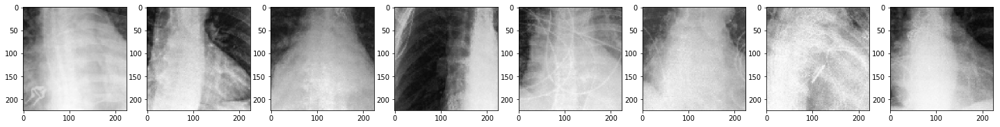

In [54]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_frontal_positive.loc[i, :]
    x = drawAttention(sample['attentionPathFinal'])
    ax[i].imshow(x.astype('uint8'))
fig.savefig("attention_final.png")

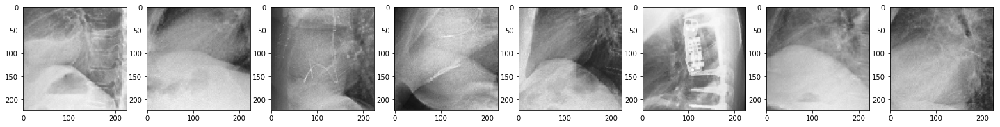

In [58]:
count = 8
fig, ax = plt.subplots(1, count, figsize=(25,count))
for i in range(count):
    sample = train_csv_lateral_positive.loc[i, :]
    x = drawAttention(sample['attentionPathFinal'])
    ax[i].imshow(x.astype('uint8'))
fig.savefig("attention_lateral_final.png")

In [35]:
train_csv_frontal_positive.loc[10, :].Path

'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient23998/study3/view1_frontal.jpg'

In [36]:
getAttentionArea('gs://cs221_chexpert/CheXpert-v1.0-small/train/patient23998/study3/view1_frontal.jpg')

../cs221/CheXpert-v1.0-small/train/patient23998/study3/view1_frontal_attention_final.jpg is done! half_len=50 cx=131 cy=145


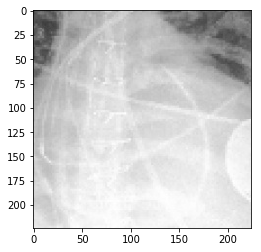

In [37]:
image = cv2.imread('../cs221/CheXpert-v1.0-small/train/patient23998/study3/view1_frontal_attention_final.jpg')
plt.imshow(image)

In [42]:
valid_csv.to_csv('data/data/processed_attention_valid.csv')

In [102]:
list(train_csv.Path.head(10))

['gs://cs221_chexpert/CheXpert-v1.0-small/train/patient11346/study1/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient29092/study5/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient46813/study2/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient49181/study1/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient03542/study1/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient47276/study1/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient43212/study2/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient35085/study4/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient30650/study6/view1_frontal.jpg',
 'gs://cs221_chexpert/CheXpert-v1.0-small/train/patient28192/study1/view2_lateral.jpg']

In [2]:
image = cv2.imread("../cs221/CheXpert-v1.0-small/train/patient11346/study1/view1_frontal.jpg")

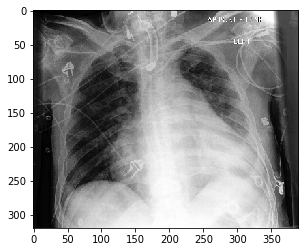

In [3]:
plt.imshow(image)

In [7]:
train_csv = pd.read_csv("data/data/processed_train.csv")
train_csv_frontal = train_csv[train_csv['Frontal/Lateral'] == 'Frontal']
train_csv_lateral = train_csv[train_csv['Frontal/Lateral'] == 'Lateral']
frontal_positive_sample = train_csv_frontal[train_csv_frontal.Cardiomegaly == 1].sample(5).reset_index()
lateral_positive_sample = train_csv_lateral[train_csv_lateral.Cardiomegaly == 1].sample(5).reset_index()

In [59]:
frontal_positive_sample

,index,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,3852,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,82,Frontal,AP,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1,24250,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,76,Frontal,AP,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
2,29264,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,70,Frontal,AP,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
3,14896,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,81,Frontal,AP,NaN,NaN,1.0,1.0,-1.0,1.0,NaN,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN
4,19508,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,30,Frontal,AP,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0


In [60]:
lateral_positive_sample

,index,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,16985,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,81,Lateral,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1,28169,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,78,Lateral,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,17804,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Female,88,Lateral,NaN,NaN,NaN,1.0,1.0,NaN,NaN,-1.0,NaN,-1.0,NaN,NaN,NaN,1.0,NaN
3,27922,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,86,Lateral,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
4,7576,gs://cs221_chexpert/CheXpert-v1.0-small/train/...,Male,86,Lateral,NaN,NaN,NaN,1.0,1.0,NaN,NaN,-1.0,NaN,-1.0,NaN,NaN,NaN,NaN,NaN
